In [25]:
%load_ext autoreload
%autoreload 2
import numpy as np
from astropy import units as u
import emcee
from matplotlib import pyplot as plt
import corner

from load_galweight_data import load_clusters
from cluster import temp_from_vdisp
from statistics_functions import log_likelihood, chi_squared

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [31]:
# get dataset
n=20
clusters, variances = load_clusters(nrows=n)

In [32]:
pref_theo = 6.8*1e-42 *u.erg*u.cm**3

In [33]:
test_cluster=clusters[0]

In [34]:
p0=[-25, -2]
getattr(test_cluster, 'pred_pref')(p0)

<Quantity 5.4478908e-94 s / cm3>

In [51]:
pref_pred = [getattr(c, 'pred_pref')(p0) for c in clusters]
pref_pred

1.1057639847979102e-07 GeV 1.133690517119171e-05 GeV
8.498923710713636e-08 GeV 8.966433110487784e-06 GeV
8.13813003498707e-08 GeV 9.079899761377789e-06 GeV
7.608212662875618e-08 GeV 8.107454272960878e-06 GeV
7.518549651300869e-08 GeV 7.4128508780469744e-06 GeV
7.356158608028455e-08 GeV 8.203686559654766e-06 GeV
7.344519152057315e-08 GeV 8.225295726239415e-06 GeV
7.18282444599984e-08 GeV 7.725049346969507e-06 GeV
6.905310158134068e-08 GeV 7.33483837714982e-06 GeV
6.780800124727961e-08 GeV 6.211060421417403e-06 GeV
6.860705481517105e-08 GeV 7.482400039714647e-06 GeV
6.59219634420343e-08 GeV 7.2500302954917555e-06 GeV
6.42324822353322e-08 GeV 7.74834976193562e-06 GeV
6.165903187026066e-08 GeV 8.05491992778816e-06 GeV
5.9114994442269725e-08 GeV 5.924391289571273e-06 GeV
5.745906988537711e-08 GeV 5.611445679868858e-06 GeV
5.607511825216782e-08 GeV 5.386107882777741e-06 GeV
5.75538275889545e-08 GeV 3.2463230783476785e-06 GeV
5.6173436835953885e-08 GeV 4.88330641499075e-06 GeV
5.6411758312902

TypeError: only integer dimensionless scalar quantities can be converted to a Python index

In [49]:
data=np.ones(n)*6.8*1e-42 *u.erg*u.cm**3
data

<Quantity [6.8e-42, 6.8e-42, 6.8e-42, 6.8e-42, 6.8e-42, 6.8e-42, 6.8e-42,
           6.8e-42, 6.8e-42, 6.8e-42, 6.8e-42, 6.8e-42, 6.8e-42, 6.8e-42,
           6.8e-42, 6.8e-42, 6.8e-42, 6.8e-42, 6.8e-42, 6.8e-42] cm3 erg>

In [52]:
var = [p/10 for p in pref_pred] # made up variance for now

In [53]:
ndim, nwalkers = 2, 10
log_sigma0 = np.random.uniform(low=-30, high=-10, size=(nwalkers, 1)).astype(dtype=np.float128)
log_mchi = np.random.uniform(low=-10, high=0, size=(nwalkers, 1)).astype(dtype=np.float128)

p0=np.zeros((nwalkers, ndim ))
p0[:,0] = log_sigma0.reshape((nwalkers,))
p0[:,1]= log_mchi.reshape((nwalkers,))
p0

array([[-25.64738654,  -1.06643258],
       [-13.88838168,  -5.50965687],
       [-23.78001314,  -2.18092263],
       [-19.80447923,  -5.85011289],
       [-28.4344346 ,  -2.33347425],
       [-18.11732492,  -6.71556176],
       [-28.4663941 ,  -9.27283213],
       [-24.26630434,  -2.81991851],
       [-18.35943444,  -5.98953423],
       [-28.71677139,  -0.11925469]])

In [55]:
sampler = emcee.EnsembleSampler(nwalkers, ndim, log_likelihood, args=[data, var, clusters, 'pred_pref'])

In [56]:
state = sampler.run_mcmc(p0, 100, progress=True)
sampler.reset()

You must install the tqdm library to use progress indicators with emcee


[-25.64738654  -1.06643258]
9.48920565835298e-07 GeV 1.133690517119171e-05 GeV
7.293422111261236e-07 GeV 8.966433110487784e-06 GeV
6.983804015874616e-07 GeV 9.079899761377789e-06 GeV
6.529051012970607e-07 GeV 8.107454272960878e-06 GeV
6.452105953402981e-07 GeV 7.4128508780469744e-06 GeV
6.312748728183892e-07 GeV 8.203686559654766e-06 GeV
6.302760232177513e-07 GeV 8.225295726239415e-06 GeV
6.164000574534412e-07 GeV 7.725049346969507e-06 GeV
5.925849378900113e-07 GeV 7.33483837714982e-06 GeV
5.819000057547432e-07 GeV 6.211060421417403e-06 GeV
5.887571504456585e-07 GeV 7.482400039714647e-06 GeV
5.657148153710354e-07 GeV 7.2500302954917555e-06 GeV
5.512163917953675e-07 GeV 7.74834976193562e-06 GeV
5.291321133223344e-07 GeV 8.05491992778816e-06 GeV
5.073002444166337e-07 GeV 5.924391289571273e-06 GeV
4.930897900239247e-07 GeV 5.611445679868858e-06 GeV
4.812132939096687e-07 GeV 5.386107882777741e-06 GeV
4.939029611430069e-07 GeV 3.2463230783476785e-06 GeV
4.82057023018602e-07 GeV 4.8833064149

[-24.35672107  -2.93872782]
1.2733113807542948e-08 GeV 1.133690517119171e-05 GeV
9.786696287627766e-09 GeV 8.966433110487784e-06 GeV
9.371234489520125e-09 GeV 9.079899761377789e-06 GeV
8.76102306100065e-09 GeV 8.107454272960878e-06 GeV
8.657774144739645e-09 GeV 7.4128508780469744e-06 GeV
8.470777311442425e-09 GeV 8.203686559654766e-06 GeV
8.457374223660948e-09 GeV 8.225295726239415e-06 GeV
8.271179237876227e-09 GeV 7.725049346969507e-06 GeV
7.951615473890921e-09 GeV 7.33483837714982e-06 GeV
7.808239450857339e-09 GeV 6.211060421417403e-06 GeV
7.900252214504585e-09 GeV 7.482400039714647e-06 GeV
7.59105807807184e-09 GeV 7.2500302954917555e-06 GeV
7.396510626930408e-09 GeV 7.74834976193562e-06 GeV
7.100172196424301e-09 GeV 8.05491992778816e-06 GeV
6.8072207298672e-09 GeV 5.924391289571273e-06 GeV
6.6165374002462545e-09 GeV 5.611445679868858e-06 GeV
6.457172346834705e-09 GeV 5.386107882777741e-06 GeV
6.6274489567843596e-09 GeV 3.2463230783476785e-06 GeV
6.468493946506566e-09 GeV 4.883306414

3.787258367658846e-11 GeV 8.107454272960878e-06 GeV
3.742625415623615e-11 GeV 7.4128508780469744e-06 GeV
3.661789499920669e-11 GeV 8.203686559654766e-06 GeV
3.655995546862969e-11 GeV 8.225295726239415e-06 GeV
3.57550625776746e-11 GeV 7.725049346969507e-06 GeV
3.43736365378992e-11 GeV 7.33483837714982e-06 GeV
3.375384357630692e-11 GeV 6.211060421417403e-06 GeV
3.4151600900569284e-11 GeV 7.482400039714647e-06 GeV
3.2815001199503995e-11 GeV 7.2500302954917555e-06 GeV
3.1974001858317536e-11 GeV 7.74834976193562e-06 GeV
3.069297543848186e-11 GeV 8.05491992778816e-06 GeV
2.942659035387327e-11 GeV 5.924391289571273e-06 GeV
2.860229502825694e-11 GeV 5.611445679868858e-06 GeV
2.7913383895569704e-11 GeV 5.386107882777741e-06 GeV
2.8649464044381416e-11 GeV 3.2463230783476785e-06 GeV
2.7962325466427354e-11 GeV 4.88330641499075e-06 GeV
2.8080958455246365e-11 GeV 5.8557780857870655e-06 GeV
[-20.38098533  -2.40852933]
4.3165136064112486e-08 GeV 1.133690517119171e-05 GeV
3.317680838000098e-08 GeV 8.96

4.0542711782340685e-08 GeV 5.924391289571273e-06 GeV
3.9407032540943464e-08 GeV 5.611445679868858e-06 GeV
3.8457879915365554e-08 GeV 5.386107882777741e-06 GeV
3.9472020016651454e-08 GeV 3.2463230783476785e-06 GeV
3.8525309542026175e-08 GeV 4.88330641499075e-06 GeV
3.86887570572064e-08 GeV 5.8557780857870655e-06 GeV
[-18.47701857  -3.8184118 ]
1.6797731811875898e-09 GeV 1.133690517119171e-05 GeV
1.2910769671002816e-09 GeV 8.966433110487784e-06 GeV
1.2362685677709854e-09 GeV 9.079899761377789e-06 GeV
1.1557684789495082e-09 GeV 8.107454272960878e-06 GeV
1.1421477131931248e-09 GeV 7.4128508780469744e-06 GeV
1.1174787853654629e-09 GeV 8.203686559654766e-06 GeV
1.1157106281228025e-09 GeV 8.225295726239415e-06 GeV
1.0911474813293215e-09 GeV 7.725049346969507e-06 GeV
1.048990107372302e-09 GeV 7.33483837714982e-06 GeV
1.0300757081171503e-09 GeV 6.211060421417403e-06 GeV
1.0422141822592754e-09 GeV 7.482400039714647e-06 GeV
1.0014247865144181e-09 GeV 7.2500302954917555e-06 GeV
9.757597688419781e-

4.109551316116063e-11 GeV 7.2500302954917555e-06 GeV
4.004229669823459e-11 GeV 7.74834976193562e-06 GeV
3.843801706478003e-11 GeV 8.05491992778816e-06 GeV
3.6852073349732514e-11 GeV 5.924391289571273e-06 GeV
3.581977598071516e-11 GeV 5.611445679868858e-06 GeV
3.49570255469091e-11 GeV 5.386107882777741e-06 GeV
3.5878847589798986e-11 GeV 3.2463230783476785e-06 GeV
3.5018316995813235e-11 GeV 4.88330641499075e-06 GeV
3.5166885741056284e-11 GeV 5.8557780857870655e-06 GeV
[-20.11438363  -4.03302341]
1.024799786715159e-09 GeV 1.133690517119171e-05 GeV
7.876631293647646e-10 GeV 8.966433110487784e-06 GeV
7.54225498277482e-10 GeV 9.079899761377789e-06 GeV
7.051138236902758e-10 GeV 8.107454272960878e-06 GeV
6.968040363937728e-10 GeV 7.4128508780469744e-06 GeV
6.817539616221264e-10 GeV 8.203686559654766e-06 GeV
6.806752402891211e-10 GeV 8.225295726239415e-06 GeV
6.656897006478608e-10 GeV 7.725049346969507e-06 GeV
6.399702354703773e-10 GeV 7.33483837714982e-06 GeV
6.284308963860251e-10 GeV 6.211060

2.0247576602350656e-08 GeV 3.2463230783476785e-06 GeV
1.9761951776280526e-08 GeV 4.88330641499075e-06 GeV
1.9845793851823638e-08 GeV 5.8557780857870655e-06 GeV
[-22.12020275  -3.80786953]
1.721047727492114e-09 GeV 1.133690517119171e-05 GeV
1.3228006644768585e-09 GeV 8.966433110487784e-06 GeV
1.2666455405770494e-09 GeV 9.079899761377789e-06 GeV
1.184167443843081e-09 GeV 8.107454272960878e-06 GeV
1.1702119954442956e-09 GeV 7.4128508780469744e-06 GeV
1.1449369150626407e-09 GeV 8.203686559654766e-06 GeV
1.1431253115447316e-09 GeV 8.225295726239415e-06 GeV
1.1179586113959127e-09 GeV 7.725049346969507e-06 GeV
1.074765367535174e-09 GeV 7.33483837714982e-06 GeV
1.0553862131234206e-09 GeV 6.211060421417403e-06 GeV
1.0678229477799153e-09 GeV 7.482400039714647e-06 GeV
1.0260312954076395e-09 GeV 7.2500302954917555e-06 GeV
9.99735649759833e-10 GeV 7.74834976193562e-06 GeV
9.59681615051607e-10 GeV 8.05491992778816e-06 GeV
9.200853730479496e-10 GeV 5.924391289571273e-06 GeV
8.943120142234688e-10 GeV 

6.097068892500942e-10 GeV 5.611445679868858e-06 GeV
5.95021568954449e-10 GeV 5.386107882777741e-06 GeV
6.107123775880695e-10 GeV 3.2463230783476785e-06 GeV
5.960648423313983e-10 GeV 4.88330641499075e-06 GeV
5.985937076026579e-10 GeV 5.8557780857870655e-06 GeV
[-20.26742895  -4.91494119]
1.3449968123707153e-10 GeV 1.133690517119171e-05 GeV
1.0337671923345258e-10 GeV 8.966433110487784e-06 GeV
9.89882027828609e-11 GeV 9.079899761377789e-06 GeV
9.254254904383061e-11 GeV 8.107454272960878e-06 GeV
9.145193236239078e-11 GeV 7.4128508780469744e-06 GeV
8.94766877481536e-11 GeV 8.203686559654766e-06 GeV
8.93351111423486e-11 GeV 8.225295726239415e-06 GeV
8.736833643079683e-11 GeV 7.725049346969507e-06 GeV
8.399278940902428e-11 GeV 7.33483837714982e-06 GeV
8.247831072874794e-11 GeV 6.211060421417403e-06 GeV
8.345024010653811e-11 GeV 7.482400039714647e-06 GeV
8.018422729779842e-11 GeV 7.2500302954917555e-06 GeV
7.812922562581881e-11 GeV 7.74834976193562e-06 GeV
7.499900743694546e-11 GeV 8.054919927

5.4330786171510656e-08 GeV 7.2500302954917555e-06 GeV
5.2938369480784665e-08 GeV 7.74834976193562e-06 GeV
5.0817413516986004e-08 GeV 8.05491992778816e-06 GeV
4.872069876069644e-08 GeV 5.924391289571273e-06 GeV
4.735593839375446e-08 GeV 5.611445679868858e-06 GeV
4.621532946268519e-08 GeV 5.386107882777741e-06 GeV
4.743403468006568e-08 GeV 3.2463230783476785e-06 GeV
4.629636051324035e-08 GeV 4.88330641499075e-06 GeV
4.649277749671772e-08 GeV 5.8557780857870655e-06 GeV
[-24.77120433  -0.82175333]
1.6668983148948102e-06 GeV 1.133690517119171e-05 GeV
1.2811813195740175e-06 GeV 8.966433110487784e-06 GeV
1.2267930072070498e-06 GeV 9.079899761377789e-06 GeV
1.1469099230453335e-06 GeV 8.107454272960878e-06 GeV
1.1333935556326564e-06 GeV 7.4128508780469744e-06 GeV
1.1089137063966308e-06 GeV 8.203686559654766e-06 GeV
1.10715910145278e-06 GeV 8.225295726239415e-06 GeV
1.0827842224767864e-06 GeV 7.725049346969507e-06 GeV
1.0409499698548555e-06 GeV 7.33483837714982e-06 GeV
1.0221805427686524e-06 GeV

1.109970283873278e-08 GeV 8.966433110487784e-06 GeV
1.0628501693391201e-08 GeV 9.079899761377789e-06 GeV
9.93642284202975e-09 GeV 8.107454272960878e-06 GeV
9.819321804535906e-09 GeV 7.4128508780469744e-06 GeV
9.607237029410392e-09 GeV 8.203686559654766e-06 GeV
9.592035751356645e-09 GeV 8.225295726239415e-06 GeV
9.380860401521256e-09 GeV 7.725049346969507e-06 GeV
9.018423199628319e-09 GeV 7.33483837714982e-06 GeV
8.855811506866995e-09 GeV 6.211060421417403e-06 GeV
8.960168922672994e-09 GeV 7.482400039714647e-06 GeV
8.609492562334653e-09 GeV 7.2500302954917555e-06 GeV
8.388844160439043e-09 GeV 7.74834976193562e-06 GeV
8.052748258242454e-09 GeV 8.05491992778816e-06 GeV
7.720493723168599e-09 GeV 5.924391289571273e-06 GeV
7.504227862566764e-09 GeV 5.611445679868858e-06 GeV
7.323482012919499e-09 GeV 5.386107882777741e-06 GeV
7.516603339594092e-09 GeV 3.2463230783476785e-06 GeV
7.3363225454468684e-09 GeV 4.88330641499075e-06 GeV
7.367447634508277e-09 GeV 5.8557780857870655e-06 GeV
[-23.554299

2.537395995146236e-12 GeV 7.482400039714647e-06 GeV
2.438089296802259e-12 GeV 7.2500302954917555e-06 GeV
2.3756047190965166e-12 GeV 7.74834976193562e-06 GeV
2.280427004973212e-12 GeV 8.05491992778816e-06 GeV
2.1863371129252755e-12 GeV 5.924391289571273e-06 GeV
2.1250936103402543e-12 GeV 5.611445679868858e-06 GeV
2.0739088839146444e-12 GeV 5.386107882777741e-06 GeV
2.1285981743856615e-12 GeV 3.2463230783476785e-06 GeV
2.0775451452498574e-12 GeV 4.88330641499075e-06 GeV
2.0863593402739203e-12 GeV 5.8557780857870655e-06 GeV
[-24.86818992  -1.45120571]
3.9125214401263287e-07 GeV 1.133690517119171e-05 GeV
3.007171665320814e-07 GeV 8.966433110487784e-06 GeV
2.8795121456449086e-07 GeV 9.079899761377789e-06 GeV
2.69201163844939e-07 GeV 8.107454272960878e-06 GeV
2.6602862015573016e-07 GeV 7.4128508780469744e-06 GeV
2.602827426699128e-07 GeV 8.203686559654766e-06 GeV
2.598709041432057e-07 GeV 8.225295726239415e-06 GeV
2.5414966513648934e-07 GeV 7.725049346969507e-06 GeV
2.443303852888584e-07 GeV

1.1308680101240069e-09 GeV 7.725049346969507e-06 GeV
1.0871760011017733e-09 GeV 7.33483837714982e-06 GeV
1.0675730698625374e-09 GeV 6.211060421417403e-06 GeV
1.080153415172342e-09 GeV 7.482400039714647e-06 GeV
1.0378791822300165e-09 GeV 7.2500302954917555e-06 GeV
1.011279892984835e-09 GeV 7.74834976193562e-06 GeV
9.70763342491636e-10 GeV 8.05491992778816e-06 GeV
9.307098709707598e-10 GeV 5.924391289571273e-06 GeV
9.046388995493222e-10 GeV 5.611445679868858e-06 GeV
8.828498854738515e-10 GeV 5.386107882777741e-06 GeV
9.061307702819859e-10 GeV 3.2463230783476785e-06 GeV
8.843978189092326e-10 GeV 4.88330641499075e-06 GeV
8.881499659432191e-10 GeV 5.8557780857870655e-06 GeV
[-24.04968073  -2.5746003 ]
2.9448429364642722e-08 GeV 1.133690517119171e-05 GeV
2.2634120663296782e-08 GeV 8.966433110487784e-06 GeV
2.1673263986744295e-08 GeV 9.079899761377789e-06 GeV
2.0262001319822363e-08 GeV 8.107454272960878e-06 GeV
2.0023213034141064e-08 GeV 7.4128508780469744e-06 GeV
1.9590737276836283e-08 GeV 8

[-24.00327194  -2.93391351]
1.2875050310587502e-08 GeV 1.133690517119171e-05 GeV
9.895788962712642e-09 GeV 8.966433110487784e-06 GeV
9.475695996167861e-09 GeV 9.079899761377789e-06 GeV
8.858682517687082e-09 GeV 8.107454272960878e-06 GeV
8.754282681836514e-09 GeV 7.4128508780469744e-06 GeV
8.565201387738912e-09 GeV 8.203686559654766e-06 GeV
8.551648895229067e-09 GeV 8.225295726239415e-06 GeV
8.363378386868634e-09 GeV 7.725049346969507e-06 GeV
8.040252433473462e-09 GeV 7.33483837714982e-06 GeV
7.895278192467634e-09 GeV 6.211060421417403e-06 GeV
7.98831662588466e-09 GeV 7.482400039714647e-06 GeV
7.675675890674078e-09 GeV 7.2500302954917555e-06 GeV
7.478959811708486e-09 GeV 7.74834976193562e-06 GeV
7.179318085466592e-09 GeV 8.05491992778816e-06 GeV
6.883101077789434e-09 GeV 5.924391289571273e-06 GeV
6.690292193853624e-09 GeV 5.611445679868858e-06 GeV
6.529150692141161e-09 GeV 5.386107882777741e-06 GeV
6.701325381926733e-09 GeV 3.2463230783476785e-06 GeV
6.540598494114406e-09 GeV 4.88330641

1.1846091628646903e-08 GeV 1.133690517119171e-05 GeV
9.104929298307142e-09 GeV 8.966433110487784e-06 GeV
8.718409661164652e-09 GeV 9.079899761377789e-06 GeV
8.150707164795928e-09 GeV 8.107454272960878e-06 GeV
8.054650839448251e-09 GeV 7.4128508780469744e-06 GeV
7.88068069711013e-09 GeV 8.203686559654766e-06 GeV
7.86821130365571e-09 GeV 8.225295726239415e-06 GeV
7.694987150024588e-09 GeV 7.725049346969507e-06 GeV
7.3976850378638765e-09 GeV 7.33483837714982e-06 GeV
7.264296965482031e-09 GeV 6.211060421417403e-06 GeV
7.349899878143081e-09 GeV 7.482400039714647e-06 GeV
7.0622450180213664e-09 GeV 7.2500302954917555e-06 GeV
6.881250253726095e-09 GeV 7.74834976193562e-06 GeV
6.6055555372628516e-09 GeV 8.05491992778816e-06 GeV
6.33301183993674e-09 GeV 5.924391289571273e-06 GeV
6.155612012299365e-09 GeV 5.611445679868858e-06 GeV
6.007348747425451e-09 GeV 5.386107882777741e-06 GeV
6.165763441126223e-09 GeV 3.2463230783476785e-06 GeV
6.017881654703504e-09 GeV 4.88330641499075e-06 GeV
6.0434131251

[-25.45841529  -1.12988339]
8.199342924624082e-07 GeV 1.133690517119171e-05 GeV
6.302031080085815e-07 GeV 8.966433110487784e-06 GeV
6.03449920954308e-07 GeV 9.079899761377789e-06 GeV
5.641560543119476e-07 GeV 8.107454272960878e-06 GeV
5.575074585025058e-07 GeV 7.4128508780469744e-06 GeV
5.454660114126792e-07 GeV 8.203686559654766e-06 GeV
5.446029349128518e-07 GeV 8.225295726239415e-06 GeV
5.326131218759965e-07 GeV 7.725049346969507e-06 GeV
5.120351789878477e-07 GeV 7.33483837714982e-06 GeV
5.028026440573522e-07 GeV 6.211060421417403e-06 GeV
5.087277006773538e-07 GeV 7.482400039714647e-06 GeV
4.888174980889402e-07 GeV 7.2500302954917555e-06 GeV
4.762898376036063e-07 GeV 7.74834976193562e-06 GeV
4.572074634868755e-07 GeV 8.05491992778816e-06 GeV
4.383431890377591e-07 GeV 5.924391289571273e-06 GeV
4.260643542358188e-07 GeV 5.611445679868858e-06 GeV
4.1580222399122566e-07 GeV 5.386107882777741e-06 GeV
4.2676699143242e-07 GeV 3.2463230783476785e-06 GeV
4.16531265446191e-07 GeV 4.88330641499

7.01293617798491e-09 GeV 5.386107882777741e-06 GeV
7.197868364093577e-09 GeV 3.2463230783476785e-06 GeV
7.02523221898657e-09 GeV 4.88330641499075e-06 GeV
7.055037475930835e-09 GeV 5.8557780857870655e-06 GeV
[-22.80795938  -4.14208996]
7.97209529715191e-10 GeV 1.133690517119171e-05 GeV
6.127368107165817e-10 GeV 8.966433110487784e-06 GeV
5.867250975025039e-10 GeV 9.079899761377789e-06 GeV
5.485202739762532e-10 GeV 8.107454272960878e-06 GeV
5.420559463011735e-10 GeV 7.4128508780469744e-06 GeV
5.303482320857554e-10 GeV 8.203686559654766e-06 GeV
5.295090760498867e-10 GeV 8.225295726239415e-06 GeV
5.178515648317877e-10 GeV 7.725049346969507e-06 GeV
4.978439467541243e-10 GeV 7.33483837714982e-06 GeV
4.888672947251973e-10 GeV 6.211060421417403e-06 GeV
4.946281363499351e-10 GeV 7.482400039714647e-06 GeV
4.75269751918452e-10 GeV 7.2500302954917555e-06 GeV
4.630892998800925e-10 GeV 7.74834976193562e-06 GeV
4.4453580036763515e-10 GeV 8.05491992778816e-06 GeV
4.261943558150062e-10 GeV 5.92439128957

1.0889965996591773e-10 GeV 5.386107882777741e-06 GeV
1.1177136044527021e-10 GeV 3.2463230783476785e-06 GeV
1.0909059777713171e-10 GeV 4.88330641499075e-06 GeV
1.0955342565179801e-10 GeV 5.8557780857870655e-06 GeV
[-24.82381775  -1.38311688]
4.576627475065061e-07 GeV 1.133690517119171e-05 GeV
3.5176048684604826e-07 GeV 8.966433110487784e-06 GeV
3.368276596617583e-07 GeV 9.079899761377789e-06 GeV
3.1489500099262305e-07 GeV 8.107454272960878e-06 GeV
3.111839540792522e-07 GeV 7.4128508780469744e-06 GeV
3.04462779212259e-07 GeV 8.203686559654766e-06 GeV
3.0398103577763204e-07 GeV 8.225295726239415e-06 GeV
2.9728868149146447e-07 GeV 7.725049346969507e-06 GeV
2.8580269052023816e-07 GeV 7.33483837714982e-06 GeV
2.8064936623366536e-07 GeV 6.211060421417403e-06 GeV
2.839565552569441e-07 GeV 7.482400039714647e-06 GeV
2.7284327690794486e-07 GeV 7.2500302954917555e-06 GeV
2.658507122960562e-07 GeV 7.74834976193562e-06 GeV
2.55199502988805e-07 GeV 8.05491992778816e-06 GeV
2.4467003037927243e-07 GeV 

[-25.56745679  -5.41028162]
4.2991323559341876e-11 GeV 1.133690517119171e-05 GeV
3.304321574736668e-11 GeV 8.966433110487784e-06 GeV
3.16404753918685e-11 GeV 9.079899761377789e-06 GeV
2.958019403731496e-11 GeV 8.107454272960878e-06 GeV
2.9231590574468456e-11 GeV 7.4128508780469744e-06 GeV
2.8600225655693364e-11 GeV 8.203686559654766e-06 GeV
2.85549722720971e-11 GeV 8.225295726239415e-06 GeV
2.7926314663283766e-11 GeV 7.725049346969507e-06 GeV
2.684735869202755e-11 GeV 7.33483837714982e-06 GeV
2.6363272466925486e-11 GeV 6.211060421417403e-06 GeV
2.6673938856414967e-11 GeV 7.482400039714647e-06 GeV
2.5629994275148683e-11 GeV 7.2500302954917555e-06 GeV
2.4973135902084275e-11 GeV 7.74834976193562e-06 GeV
2.3972596557072802e-11 GeV 8.05491992778816e-06 GeV
2.2983492754475877e-11 GeV 5.924391289571273e-06 GeV
2.2339680970099115e-11 GeV 5.611445679868858e-06 GeV
2.180161033955082e-11 GeV 5.386107882777741e-06 GeV
2.2376522096688893e-11 GeV 3.2463230783476785e-06 GeV
2.1839835911242016e-11 GeV

1.0715242375715458e-06 GeV 7.725049346969507e-06 GeV
1.030125023661176e-06 GeV 7.33483837714982e-06 GeV
1.0115507817848085e-06 GeV 6.211060421417403e-06 GeV
1.0234709570800645e-06 GeV 7.482400039714647e-06 GeV
9.834151196021963e-07 GeV 7.2500302954917555e-06 GeV
9.582116627237381e-07 GeV 7.74834976193562e-06 GeV
9.198212710179073e-07 GeV 8.05491992778816e-06 GeV
8.818696576118526e-07 GeV 5.924391289571273e-06 GeV
8.57166794390846e-07 GeV 5.611445679868858e-06 GeV
8.365211872239279e-07 GeV 5.386107882777741e-06 GeV
8.585803772626415e-07 GeV 3.2463230783476785e-06 GeV
8.379878908350563e-07 GeV 4.88330641499075e-06 GeV
8.415431390637225e-07 GeV 5.8557780857870655e-06 GeV
[-23.79932298  -3.2415681 ]
6.340074156552065e-09 GeV 1.133690517119171e-05 GeV
4.872993452273716e-09 GeV 8.966433110487784e-06 GeV
4.666126644277661e-09 GeV 9.079899761377789e-06 GeV
4.362290067736797e-09 GeV 8.107454272960878e-06 GeV
4.310880350084653e-09 GeV 7.4128508780469744e-06 GeV
4.21777085557574e-09 GeV 8.2036865

1.2126454040339615e-08 GeV 5.8557780857870655e-06 GeV
[-25.48422703  -1.53810432]
3.20300873906771e-07 GeV 1.133690517119171e-05 GeV
2.4618388093966245e-07 GeV 8.966433110487784e-06 GeV
2.357329591133041e-07 GeV 9.079899761377789e-06 GeV
2.2038311957076386e-07 GeV 8.107454272960878e-06 GeV
2.1778589797923649e-07 GeV 7.4128508780469744e-06 GeV
2.130820015067634e-07 GeV 8.203686559654766e-06 GeV
2.1274484746931874e-07 GeV 8.225295726239415e-06 GeV
2.0806112143299166e-07 GeV 7.725049346969507e-06 GeV
2.0002251010660927e-07 GeV 7.33483837714982e-06 GeV
1.9641589304741594e-07 GeV 6.211060421417403e-06 GeV
1.9873046975286656e-07 GeV 7.482400039714647e-06 GeV
1.9095270591574528e-07 GeV 7.2500302954917555e-06 GeV
1.8605887400952124e-07 GeV 7.74834976193562e-06 GeV
1.7860449484524806e-07 GeV 8.05491992778816e-06 GeV
1.7123531459847098e-07 GeV 5.924391289571273e-06 GeV
1.664386844858225e-07 GeV 5.611445679868858e-06 GeV
1.6242986412581903e-07 GeV 5.386107882777741e-06 GeV
1.6671316417301162e-07 

2.1679308623920426e-08 GeV 4.88330641499075e-06 GeV
2.177128527946266e-08 GeV 5.8557780857870655e-06 GeV
[-25.44492719  -2.64098075]
2.5274448423857956e-08 GeV 1.133690517119171e-05 GeV
1.9425990712113236e-08 GeV 8.966433110487784e-06 GeV
1.860132457411529e-08 GeV 9.079899761377789e-06 GeV
1.73900923876388e-08 GeV 8.107454272960878e-06 GeV
1.7185149633784504e-08 GeV 7.4128508780469744e-06 GeV
1.6813972411148233e-08 GeV 8.203686559654766e-06 GeV
1.678736810555782e-08 GeV 8.225295726239415e-06 GeV
1.641778250095817e-08 GeV 7.725049346969507e-06 GeV
1.5783468067500747e-08 GeV 7.33483837714982e-06 GeV
1.5498875472621593e-08 GeV 6.211060421417403e-06 GeV
1.56815151540294e-08 GeV 7.482400039714647e-06 GeV
1.5067783794022287e-08 GeV 7.2500302954917555e-06 GeV
1.4681619058971042e-08 GeV 7.74834976193562e-06 GeV
1.4093405485210574e-08 GeV 8.05491992778816e-06 GeV
1.3511914826750827e-08 GeV 5.924391289571273e-06 GeV
1.3133420135457086e-08 GeV 5.611445679868858e-06 GeV
1.2817090297846623e-08 GeV 

2.6465705294659544e-09 GeV 4.88330641499075e-06 GeV
2.6577988721303666e-09 GeV 5.8557780857870655e-06 GeV
[-25.41883038  -1.33808139]
5.07669469419534e-07 GeV 1.133690517119171e-05 GeV
3.901957515503304e-07 GeV 8.966433110487784e-06 GeV
3.736312824191077e-07 GeV 9.079899761377789e-06 GeV
3.4930214212926726e-07 GeV 8.107454272960878e-06 GeV
3.451856060385181e-07 GeV 7.4128508780469744e-06 GeV
3.3773003903597574e-07 GeV 8.203686559654766e-06 GeV
3.371956576925392e-07 GeV 8.225295726239415e-06 GeV
3.297720603642949e-07 GeV 7.725049346969507e-06 GeV
3.170310475248412e-07 GeV 7.33483837714982e-06 GeV
3.113146429877339e-07 GeV 6.211060421417403e-06 GeV
3.149831934779487e-07 GeV 7.482400039714647e-06 GeV
3.026556178697376e-07 GeV 7.2500302954917555e-06 GeV
2.948990076021544e-07 GeV 7.74834976193562e-06 GeV
2.8308398921328764e-07 GeV 8.05491992778816e-06 GeV
2.714040091360958e-07 GeV 5.924391289571273e-06 GeV
2.638014614608784e-07 GeV 5.611445679868858e-06 GeV
2.574475740039446e-07 GeV 5.38610

[-23.74338558  -5.04649811]
9.934919100921848e-11 GeV 1.133690517119171e-05 GeV
7.635998338856916e-11 GeV 8.966433110487784e-06 GeV
7.311837303613691e-11 GeV 9.079899761377789e-06 GeV
6.835724290847902e-11 GeV 8.107454272960878e-06 GeV
6.755165077617336e-11 GeV 7.4128508780469744e-06 GeV
6.609262163450657e-11 GeV 8.203686559654766e-06 GeV
6.598804502047157e-11 GeV 8.225295726239415e-06 GeV
6.453527223548895e-11 GeV 7.725049346969507e-06 GeV
6.204189929406487e-11 GeV 7.33483837714982e-06 GeV
6.092321834030887e-11 GeV 6.211060421417403e-06 GeV
6.164114121204675e-11 GeV 7.482400039714647e-06 GeV
5.922867653265389e-11 GeV 7.2500302954917555e-06 GeV
5.7710734246427164e-11 GeV 7.74834976193562e-06 GeV
5.539857527410393e-11 GeV 8.05491992778816e-06 GeV
5.311284284075592e-11 GeV 5.924391289571273e-06 GeV
5.162505008062504e-11 GeV 5.611445679868858e-06 GeV
5.038161588448998e-11 GeV 5.386107882777741e-06 GeV
5.171018670400698e-11 GeV 3.2463230783476785e-06 GeV
5.046995183949129e-11 GeV 4.8833064

[-25.16137411  -2.78914626]
1.7968680317804486e-08 GeV 1.133690517119171e-05 GeV
1.3810762993075065e-08 GeV 8.966433110487784e-06 GeV
1.3224472762162807e-08 GeV 9.079899761377789e-06 GeV
1.236335628656499e-08 GeV 8.107454272960878e-06 GeV
1.2217653766545518e-08 GeV 7.4128508780469744e-06 GeV
1.195376809264468e-08 GeV 8.203686559654766e-06 GeV
1.1934853960307767e-08 GeV 8.225295726239415e-06 GeV
1.1672099835361373e-08 GeV 7.725049346969507e-06 GeV
1.1221138726947759e-08 GeV 7.33483837714982e-06 GeV
1.1018809747401335e-08 GeV 6.211060421417403e-06 GeV
1.1148656064659227e-08 GeV 7.482400039714647e-06 GeV
1.0712328338568504e-08 GeV 7.2500302954917555e-06 GeV
1.043778740466644e-08 GeV 7.74834976193562e-06 GeV
1.0019601358101007e-08 GeV 8.05491992778816e-06 GeV
9.606194917951367e-09 GeV 5.924391289571273e-06 GeV
9.337106944366807e-09 GeV 5.611445679868858e-06 GeV
9.112214609163957e-09 GeV 5.386107882777741e-06 GeV
9.352505084536316e-09 GeV 3.2463230783476785e-06 GeV
9.12819139286861e-09 GeV 

2.8261658927735132e-11 GeV 5.8557780857870655e-06 GeV
[-25.47017568  -1.44484008]
3.9702912052299037e-07 GeV 1.133690517119171e-05 GeV
3.051573620272428e-07 GeV 8.966433110487784e-06 GeV
2.922029162564163e-07 GeV 9.079899761377789e-06 GeV
2.7317601439564396e-07 GeV 8.107454272960878e-06 GeV
2.6995662697496653e-07 GeV 7.4128508780469744e-06 GeV
2.6412590957255076e-07 GeV 8.203686559654766e-06 GeV
2.6370799010409996e-07 GeV 8.225295726239415e-06 GeV
2.5790227497665757e-07 GeV 7.725049346969507e-06 GeV
2.4793800998352274e-07 GeV 7.33483837714982e-06 GeV
2.4346742586800286e-07 GeV 6.211060421417403e-06 GeV
2.46336460668125e-07 GeV 7.482400039714647e-06 GeV
2.366955293205989e-07 GeV 7.2500302954917555e-06 GeV
2.3062937734912153e-07 GeV 7.74834976193562e-06 GeV
2.2138929764675478e-07 GeV 8.05491992778816e-06 GeV
2.1225482630839408e-07 GeV 5.924391289571273e-06 GeV
2.0630916087242262e-07 GeV 5.611445679868858e-06 GeV
2.0134002543906102e-07 GeV 5.386107882777741e-06 GeV
2.0664939231630516e-07 

6.597903947819458e-10 GeV 8.107454272960878e-06 GeV
6.520147454375329e-10 GeV 7.4128508780469744e-06 GeV
6.379320619877697e-10 GeV 8.203686559654766e-06 GeV
6.369226788920895e-10 GeV 8.225295726239415e-06 GeV
6.229003823723854e-10 GeV 7.725049346969507e-06 GeV
5.988341174476372e-10 GeV 7.33483837714982e-06 GeV
5.880365060064925e-10 GeV 6.211060421417403e-06 GeV
5.949659635857149e-10 GeV 7.482400039714647e-06 GeV
5.716806326465309e-10 GeV 7.2500302954917555e-06 GeV
5.570293141077385e-10 GeV 7.74834976193562e-06 GeV
5.347121430774462e-10 GeV 8.05491992778816e-06 GeV
5.126500434315649e-10 GeV 5.924391289571273e-06 GeV
4.982897308912428e-10 GeV 5.611445679868858e-06 GeV
4.862879896821695e-10 GeV 5.386107882777741e-06 GeV
4.991114774094102e-10 GeV 3.2463230783476785e-06 GeV
4.871406164433423e-10 GeV 4.88330641499075e-06 GeV
4.892073596894717e-10 GeV 5.8557780857870655e-06 GeV
[-24.45414274  -5.11227602]
8.538595196714741e-11 GeV 1.133690517119171e-05 GeV
6.562781042901046e-11 GeV 8.96643311

7.580977144730629e-10 GeV 5.611445679868858e-06 GeV
7.3983827219232e-10 GeV 5.386107882777741e-06 GeV
7.593479191605742e-10 GeV 3.2463230783476785e-06 GeV
7.411354580640566e-10 GeV 4.88330641499075e-06 GeV
7.442798000686389e-10 GeV 5.8557780857870655e-06 GeV
[-25.04550272  -3.24909201]
6.231181856371158e-09 GeV 1.133690517119171e-05 GeV
4.789298616427638e-09 GeV 8.966433110487784e-06 GeV
4.585984795667623e-09 GeV 9.079899761377789e-06 GeV
4.287366685485617e-09 GeV 8.107454272960878e-06 GeV
4.2368399421124114e-09 GeV 7.4128508780469744e-06 GeV
4.145329625590285e-09 GeV 8.203686559654766e-06 GeV
4.138770579730361e-09 GeV 8.225295726239415e-06 GeV
4.047652661937014e-09 GeV 7.725049346969507e-06 GeV
3.891268296086195e-09 GeV 7.33483837714982e-06 GeV
3.821104619952532e-09 GeV 6.211060421417403e-06 GeV
3.866132746776753e-09 GeV 7.482400039714647e-06 GeV
3.7148229476061272e-09 GeV 7.2500302954917555e-06 GeV
3.619617598303616e-09 GeV 7.74834976193562e-06 GeV
3.47459897368241e-09 GeV 8.05491992

7.131481514933111e-09 GeV 8.225295726239415e-06 GeV
6.974476980880202e-09 GeV 7.725049346969507e-06 GeV
6.705012367462972e-09 GeV 7.33483837714982e-06 GeV
6.584113914715303e-09 GeV 6.211060421417403e-06 GeV
6.661701509367606e-09 GeV 7.482400039714647e-06 GeV
6.4009808400223955e-09 GeV 7.2500302954917555e-06 GeV
6.236933286384417e-09 GeV 7.74834976193562e-06 GeV
5.98705288811539e-09 GeV 8.05491992778816e-06 GeV
5.740028467382099e-09 GeV 5.924391289571273e-06 GeV
5.579239243157725e-09 GeV 5.611445679868858e-06 GeV
5.444858417327502e-09 GeV 5.386107882777741e-06 GeV
5.588440156076175e-09 GeV 3.2463230783476785e-06 GeV
5.4544050894557696e-09 GeV 4.88330641499075e-06 GeV
5.4775459537150265e-09 GeV 5.8557780857870655e-06 GeV
[-25.51323025  -2.491787  ]
3.5634891610452704e-08 GeV 1.133690517119171e-05 GeV
2.7389047699192094e-08 GeV 8.966433110487784e-06 GeV
2.622633633356531e-08 GeV 9.079899761377789e-06 GeV
2.4518598662841782e-08 GeV 8.107454272960878e-06 GeV
2.422964625139957e-08 GeV 7.4128

1.385030775568483e-10 GeV 8.203686559654766e-06 GeV
1.3828392778602487e-10 GeV 8.225295726239415e-06 GeV
1.352395107734324e-10 GeV 7.725049346969507e-06 GeV
1.300144218399968e-10 GeV 7.33483837714982e-06 GeV
1.2767012453316188e-10 GeV 6.211060421417403e-06 GeV
1.2917459696480516e-10 GeV 7.482400039714647e-06 GeV
1.2411905862588326e-10 GeV 7.2500302954917555e-06 GeV
1.2093807301815978e-10 GeV 7.74834976193562e-06 GeV
1.1609273437751109e-10 GeV 8.05491992778816e-06 GeV
1.1130277494390139e-10 GeV 5.924391289571273e-06 GeV
1.0818497040008315e-10 GeV 5.611445679868858e-06 GeV
1.0557924136944326e-10 GeV 5.386107882777741e-06 GeV
1.0836338190895633e-10 GeV 3.2463230783476785e-06 GeV
1.0576435736762931e-10 GeV 4.88330641499075e-06 GeV
1.0621307333154685e-10 GeV 5.8557780857870655e-06 GeV
[-26.50759755  -6.26384496]
6.023064046899937e-12 GeV 1.133690517119171e-05 GeV
4.629338859205124e-12 GeV 8.966433110487784e-06 GeV
4.432815600490498e-12 GeV 9.079899761377789e-06 GeV
4.1441711595725294e-12 Ge

[-25.44231961  -1.74341414]
1.996403379299228e-07 GeV 1.133690517119171e-05 GeV
1.5344395594124887e-07 GeV 8.966433110487784e-06 GeV
1.4693000067273882e-07 GeV 9.079899761377789e-06 GeV
1.3736259888558426e-07 GeV 8.107454272960878e-06 GeV
1.3574377658926312e-07 GeV 7.4128508780469744e-06 GeV
1.3281188486540466e-07 GeV 8.203686559654766e-06 GeV
1.3260174011884523e-07 GeV 8.225295726239415e-06 GeV
1.296824204265247e-07 GeV 7.725049346969507e-06 GeV
1.2467203421648459e-07 GeV 7.33483837714982e-06 GeV
1.2242406579948066e-07 GeV 6.211060421417403e-06 GeV
1.2386671835925914e-07 GeV 7.482400039714647e-06 GeV
1.1901891578587628e-07 GeV 7.2500302954917555e-06 GeV
1.1596863920181932e-07 GeV 7.74834976193562e-06 GeV
1.1132239906746853e-07 GeV 8.05491992778816e-06 GeV
1.0672926256806172e-07 GeV 5.924391289571273e-06 GeV
1.0373957089181385e-07 GeV 5.611445679868858e-06 GeV
1.0124091317162169e-07 GeV 5.386107882777741e-06 GeV
1.0391065134138293e-07 GeV 3.2463230783476785e-06 GeV
1.0141842261813735e-

1.1038788286129474e-10 GeV 7.2500302954917555e-06 GeV
1.0755880672636168e-10 GeV 7.74834976193562e-06 GeV
1.032495033831949e-10 GeV 8.05491992778816e-06 GeV
9.898945269701126e-11 GeV 5.924391289571273e-06 GeV
9.621656796377456e-11 GeV 5.611445679868858e-06 GeV
9.389910830699814e-11 GeV 5.386107882777741e-06 GeV
9.637524197371822e-11 GeV 3.2463230783476785e-06 GeV
9.406374509485123e-11 GeV 4.88330641499075e-06 GeV
9.44628200299281e-11 GeV 5.8557780857870655e-06 GeV
[-25.5076896   -3.81097963]
1.70876686198785e-09 GeV 1.133690517119171e-05 GeV
1.3133615671236067e-09 GeV 8.966433110487784e-06 GeV
1.257607148859657e-09 GeV 9.079899761377789e-06 GeV
1.1757175903729763e-09 GeV 8.107454272960878e-06 GeV
1.1618617237476073e-09 GeV 7.4128508780469744e-06 GeV
1.1367669985401977e-09 GeV 8.203686559654766e-06 GeV
1.1349683220659696e-09 GeV 8.225295726239415e-06 GeV
1.1099812037234986e-09 GeV 7.725049346969507e-06 GeV
1.0670961735224242e-09 GeV 7.33483837714982e-06 GeV
1.0478553027765534e-09 GeV 6.

4.229003532309715e-06 GeV 8.225295726239415e-06 GeV
4.135899073200055e-06 GeV 7.725049346969507e-06 GeV
3.976105235189295e-06 GeV 7.33483837714982e-06 GeV
3.9044118594650424e-06 GeV 6.211060421417403e-06 GeV
3.950421683813732e-06 GeV 7.482400039714647e-06 GeV
3.795813047543939e-06 GeV 7.2500302954917555e-06 GeV
3.6985320432604564e-06 GeV 7.74834976193562e-06 GeV
3.550351740931709e-06 GeV 8.05491992778816e-06 GeV
3.4038650472958416e-06 GeV 5.924391289571273e-06 GeV
3.3085162483431473e-06 GeV 5.611445679868858e-06 GeV
3.228827759223359e-06 GeV 5.386107882777741e-06 GeV
3.313972434852377e-06 GeV 3.2463230783476785e-06 GeV
3.2344889826406413e-06 GeV 4.88330641499075e-06 GeV
3.24821162869787e-06 GeV 5.8557780857870655e-06 GeV
[-24.42910272  -1.087008  ]
9.050122062250499e-07 GeV 1.133690517119171e-05 GeV
6.955941596684449e-07 GeV 8.966433110487784e-06 GeV
6.660650119524412e-07 GeV 9.079899761377789e-06 GeV
6.226939403092267e-07 GeV 8.107454272960878e-06 GeV
6.153554737795107e-07 GeV 7.41285

7.240098835599248e-10 GeV 8.225295726239415e-06 GeV
7.080703015558211e-10 GeV 7.725049346969507e-06 GeV
6.807134272548492e-10 GeV 7.33483837714982e-06 GeV
6.684394454022528e-10 GeV 6.211060421417403e-06 GeV
6.763163760585662e-10 GeV 7.482400039714647e-06 GeV
6.498472137871609e-10 GeV 7.2500302954917555e-06 GeV
6.331926028260278e-10 GeV 7.74834976193562e-06 GeV
6.078239781334121e-10 GeV 8.05491992778816e-06 GeV
5.827453010426749e-10 GeV 5.924391289571273e-06 GeV
5.664214856805213e-10 GeV 5.611445679868858e-06 GeV
5.527787319471914e-10 GeV 5.386107882777741e-06 GeV
5.673555905894077e-10 GeV 3.2463230783476785e-06 GeV
5.537479393918857e-10 GeV 4.88330641499075e-06 GeV
5.560972709301835e-10 GeV 5.8557780857870655e-06 GeV
[-25.44598437  -1.53646759]
3.2151026782856635e-07 GeV 1.133690517119171e-05 GeV
2.471134234838988e-07 GeV 8.966433110487784e-06 GeV
2.3662304100549852e-07 GeV 9.079899761377789e-06 GeV
2.2121524344861744e-07 GeV 8.107454272960878e-06 GeV
2.1860821525254333e-07 GeV 7.41285

4.306866821813095e-13 GeV 5.924391289571273e-06 GeV
4.1862232084491256e-13 GeV 5.611445679868858e-06 GeV
4.085394384420664e-13 GeV 5.386107882777741e-06 GeV
4.193126851315019e-13 GeV 3.2463230783476785e-06 GeV
4.092557457858646e-13 GeV 4.88330641499075e-06 GeV
4.1099205460510866e-13 GeV 5.8557780857870655e-06 GeV
[-25.51849101  -5.23928189]
6.373537543687515e-11 GeV 1.133690517119171e-05 GeV
4.898713477367337e-11 GeV 8.966433110487784e-06 GeV
4.690754810836113e-11 GeV 9.079899761377789e-06 GeV
4.385314562045424e-11 GeV 8.107454272960878e-06 GeV
4.3336335000459046e-11 GeV 7.4128508780469744e-06 GeV
4.24003256663836e-11 GeV 8.203686559654766e-06 GeV
4.233323674809718e-11 GeV 8.225295726239415e-06 GeV
4.140124104753078e-11 GeV 7.725049346969507e-06 GeV
3.9801670291981666e-11 GeV 7.33483837714982e-06 GeV
3.90840041503912e-11 GeV 6.211060421417403e-06 GeV
3.954457240766757e-11 GeV 7.482400039714647e-06 GeV
3.799690663900481e-11 GeV 7.2500302954917555e-06 GeV
3.7023102821164055e-11 GeV 7.748

1.7981995055419518e-11 GeV 7.725049346969507e-06 GeV
1.7287245992606258e-11 GeV 7.33483837714982e-06 GeV
1.6975538693911856e-11 GeV 6.211060421417403e-06 GeV
1.7175579463595998e-11 GeV 7.482400039714647e-06 GeV
1.6503374536995243e-11 GeV 7.2500302954917555e-06 GeV
1.608041776095904e-11 GeV 7.74834976193562e-06 GeV
1.5436161840631546e-11 GeV 8.05491992778816e-06 GeV
1.4799269364769746e-11 GeV 5.924391289571273e-06 GeV
1.438471339980009e-11 GeV 5.611445679868858e-06 GeV
1.4038245076476827e-11 GeV 5.386107882777741e-06 GeV
1.440843571920246e-11 GeV 3.2463230783476785e-06 GeV
1.4062858852029724e-11 GeV 4.88330641499075e-06 GeV
1.4122521950471206e-11 GeV 5.8557780857870655e-06 GeV
[-26.05507485  -6.53973502]
3.1910045397156766e-12 GeV 1.133690517119171e-05 GeV
2.452612358191508e-12 GeV 8.966433110487784e-06 GeV
2.348494818375398e-12 GeV 9.079899761377789e-06 GeV
2.195571702472786e-12 GeV 8.107454272960878e-06 GeV
2.169696824929917e-12 GeV 7.4128508780469744e-06 GeV
2.122834152296738e-12 GeV

2.6662166538331e-11 GeV 7.4128508780469744e-06 GeV
2.6086297888010485e-11 GeV 8.203686559654766e-06 GeV
2.6045022226092843e-11 GeV 8.225295726239415e-06 GeV
2.5471622916223962e-11 GeV 7.725049346969507e-06 GeV
2.448750596508255e-11 GeV 7.33483837714982e-06 GeV
2.404597037639459e-11 GeV 6.211060421417403e-06 GeV
2.4329329538576656e-11 GeV 7.482400039714647e-06 GeV
2.3377146515500907e-11 GeV 7.2500302954917555e-06 GeV
2.2778025256939057e-11 GeV 7.74834976193562e-06 GeV
2.18654321985186e-11 GeV 8.05491992778816e-06 GeV
2.096326951115635e-11 GeV 5.924391289571273e-06 GeV
2.037604806076473e-11 GeV 5.611445679868858e-06 GeV
1.98852732353403e-11 GeV 5.386107882777741e-06 GeV
2.0409650893634667e-11 GeV 3.2463230783476785e-06 GeV
1.992013882213952e-11 GeV 4.88330641499075e-06 GeV
2.000465202219498e-11 GeV 5.8557780857870655e-06 GeV
[-25.61899646  -7.54831671]
3.1285689580076195e-13 GeV 1.133690517119171e-05 GeV
2.404624247431345e-13 GeV 8.966433110487784e-06 GeV
2.302543884022703e-13 GeV 9.0798

8.485222450002986e-07 GeV 9.079899761377789e-06 GeV
7.932704025849564e-07 GeV 8.107454272960878e-06 GeV
7.839216873951265e-07 GeV 7.4128508780469744e-06 GeV
7.669899829356182e-07 GeV 8.203686559654766e-06 GeV
7.657763948915892e-07 GeV 8.225295726239415e-06 GeV
7.489172940417993e-07 GeV 7.725049346969507e-06 GeV
7.199822628310454e-07 GeV 7.33483837714982e-06 GeV
7.070002224093997e-07 GeV 6.211060421417403e-06 GeV
7.153315555828417e-07 GeV 7.482400039714647e-06 GeV
6.873354465237593e-07 GeV 7.2500302954917555e-06 GeV
6.69720068295179e-07 GeV 7.74834976193562e-06 GeV
6.428879843670579e-07 GeV 8.05491992778816e-06 GeV
6.16362574469659e-07 GeV 5.924391289571273e-06 GeV
5.990970746985205e-07 GeV 5.611445679868858e-06 GeV
5.846673010068492e-07 GeV 5.386107882777741e-06 GeV
6.000850660309874e-07 GeV 3.2463230783476785e-06 GeV
5.85692419861927e-07 GeV 4.88330641499075e-06 GeV
5.881772790836782e-07 GeV 5.8557780857870655e-06 GeV
[-25.45958454  -2.97002448]
1.1847806618845875e-08 GeV 1.1336905171

1.3139038532990653e-07 GeV 5.386107882777741e-06 GeV
1.3485516963366183e-07 GeV 3.2463230783476785e-06 GeV
1.3162075696373262e-07 GeV 4.88330641499075e-06 GeV
1.3217917131335372e-07 GeV 5.8557780857870655e-06 GeV
[-25.50345294  -7.37575792]
4.654837498924871e-13 GeV 1.133690517119171e-05 GeV
3.5777172464485476e-13 GeV 8.966433110487784e-06 GeV
3.4258371025628805e-13 GeV 9.079899761377789e-06 GeV
3.202762442061352e-13 GeV 8.107454272960878e-06 GeV
3.1650177918210964e-13 GeV 7.4128508780469744e-06 GeV
3.0966574610356714e-13 GeV 8.203686559654766e-06 GeV
3.091757701514976e-13 GeV 8.225295726239415e-06 GeV
3.02369050168919e-13 GeV 7.725049346969507e-06 GeV
2.906867750052808e-13 GeV 7.33483837714982e-06 GeV
2.8544538551838183e-13 GeV 6.211060421417403e-06 GeV
2.88809091121572e-13 GeV 7.482400039714647e-06 GeV
2.775058978691703e-13 GeV 7.2500302954917555e-06 GeV
2.7039383726419144e-13 GeV 7.74834976193562e-06 GeV
2.5956060935512157e-13 GeV 8.05491992778816e-06 GeV
2.4885119850318036e-13 GeV 

2.9345940350780557e-06 GeV 8.966433110487784e-06 GeV
2.8100155584709085e-06 GeV 9.079899761377789e-06 GeV
2.627040347465993e-06 GeV 8.107454272960878e-06 GeV
2.5960805991624872e-06 GeV 7.4128508780469744e-06 GeV
2.540008583086311e-06 GeV 8.203686559654766e-06 GeV
2.535989594420558e-06 GeV 8.225295726239415e-06 GeV
2.4801580166759773e-06 GeV 7.725049346969507e-06 GeV
2.3843350864391508e-06 GeV 7.33483837714982e-06 GeV
2.341343007232659e-06 GeV 6.211060421417403e-06 GeV
2.3689335341494503e-06 GeV 7.482400039714647e-06 GeV
2.276219993053492e-06 GeV 7.2500302954917555e-06 GeV
2.217883883208024e-06 GeV 7.74834976193562e-06 GeV
2.1290251953557203e-06 GeV 8.05491992778816e-06 GeV
2.0411821070387103e-06 GeV 5.924391289571273e-06 GeV
1.98400467501787e-06 GeV 5.611445679868858e-06 GeV
1.9362181982133675e-06 GeV 5.386107882777741e-06 GeV
1.9872765645083643e-06 GeV 3.2463230783476785e-06 GeV
1.939613041364533e-06 GeV 4.88330641499075e-06 GeV
1.947842045512478e-06 GeV 5.8557780857870655e-06 GeV
[-2

1.193269411125424e-11 GeV 5.386107882777741e-06 GeV
1.224736105704617e-11 GeV 3.2463230783476785e-06 GeV
1.1953616146237651e-11 GeV 4.88330641499075e-06 GeV
1.2004330569554339e-11 GeV 5.8557780857870655e-06 GeV
[-25.57854553  -5.06724953]
9.47137237349707e-11 GeV 1.133690517119171e-05 GeV
7.27971541348617e-11 GeV 8.966433110487784e-06 GeV
6.970679190586074e-11 GeV 9.079899761377789e-06 GeV
6.516780815575257e-11 GeV 8.107454272960878e-06 GeV
6.43998036064736e-11 GeV 7.4128508780469744e-06 GeV
6.300885032702238e-11 GeV 8.203686559654766e-06 GeV
6.290915308308679e-11 GeV 8.225295726239415e-06 GeV
6.152416424916905e-11 GeV 7.725049346969507e-06 GeV
5.914712792362536e-11 GeV 7.33483837714982e-06 GeV
5.808064275424146e-11 GeV 6.211060421417403e-06 GeV
5.876506854418561e-11 GeV 7.482400039714647e-06 GeV
5.646516543633657e-11 GeV 7.2500302954917555e-06 GeV
5.501804780122701e-11 GeV 7.74834976193562e-06 GeV
5.281377030373197e-11 GeV 8.05491992778816e-06 GeV
5.0634686327053224e-11 GeV 5.92439128

2.463393965167964e-09 GeV 8.05491992778816e-06 GeV
2.3617548985595096e-09 GeV 5.924391289571273e-06 GeV
2.2955976068134125e-09 GeV 5.611445679868858e-06 GeV
2.2403061434556093e-09 GeV 5.386107882777741e-06 GeV
2.299383354790073e-09 GeV 3.2463230783476785e-06 GeV
2.2442341552750634e-09 GeV 4.88330641499075e-06 GeV
2.2537555452527907e-09 GeV 5.8557780857870655e-06 GeV
[-25.56255236  -4.36126178]
4.812831506009532e-10 GeV 1.133690517119171e-05 GeV
3.699151750684811e-10 GeV 8.966433110487784e-06 GeV
3.542116506855347e-10 GeV 9.079899761377789e-06 GeV
3.31147026958023e-10 GeV 8.107454272960878e-06 GeV
3.2724444943729175e-10 GeV 7.4128508780469744e-06 GeV
3.2017638843964524e-10 GeV 8.203686559654766e-06 GeV
3.196697817751051e-10 GeV 8.225295726239415e-06 GeV
3.126320288154572e-10 GeV 7.725049346969507e-06 GeV
3.005532350912042e-10 GeV 7.33483837714982e-06 GeV
2.951339429110495e-10 GeV 6.211060421417403e-06 GeV
2.986118190576848e-10 GeV 7.482400039714647e-06 GeV
2.8692497400321455e-10 GeV 7.2

2.600262046796824e-10 GeV 7.2500302954917555e-06 GeV
2.5336212243579283e-10 GeV 7.74834976193562e-06 GeV
2.4321126380808374e-10 GeV 8.05491992778816e-06 GeV
2.33176423181026e-10 GeV 5.924391289571273e-06 GeV
2.2664470362532302e-10 GeV 5.611445679868858e-06 GeV
2.2118576897207818e-10 GeV 5.386107882777741e-06 GeV
2.2701847110339663e-10 GeV 3.2463230783476785e-06 GeV
2.2157358218115912e-10 GeV 4.88330641499075e-06 GeV
2.225136304732458e-10 GeV 5.8557780857870655e-06 GeV
[-25.11178702  -1.24839406]
6.241204034093208e-07 GeV 1.133690517119171e-05 GeV
4.79700168191412e-07 GeV 8.966433110487784e-06 GeV
4.593360853005093e-07 GeV 9.079899761377789e-06 GeV
4.294262448098867e-07 GeV 8.107454272960878e-06 GeV
4.243654437959023e-07 GeV 7.4128508780469744e-06 GeV
4.1519969370541064e-07 GeV 8.203686559654766e-06 GeV
4.1454273416829006e-07 GeV 8.225295726239415e-06 GeV
4.0541628706374046e-07 GeV 7.725049346969507e-06 GeV
3.8975269775573e-07 GeV 7.33483837714982e-06 GeV
3.827250450788227e-07 GeV 6.211

6.34521175229246e-11 GeV 7.4128508780469744e-06 GeV
6.208163304915262e-11 GeV 8.203686559654766e-06 GeV
6.198340291668872e-11 GeV 8.225295726239415e-06 GeV
6.061879511765418e-11 GeV 7.725049346969507e-06 GeV
5.82767384678184e-11 GeV 7.33483837714982e-06 GeV
5.722594733935911e-11 GeV 6.211060421417403e-06 GeV
5.790030134709234e-11 GeV 7.482400039714647e-06 GeV
5.5634242848182436e-11 GeV 7.2500302954917555e-06 GeV
5.420842051472368e-11 GeV 7.74834976193562e-06 GeV
5.2036580431501234e-11 GeV 8.05491992778816e-06 GeV
4.9889563129624806e-11 GeV 5.924391289571273e-06 GeV
4.8492060626268095e-11 GeV 5.611445679868858e-06 GeV
4.7324087203877434e-11 GeV 5.386107882777741e-06 GeV
4.857203053033802e-11 GeV 3.2463230783476785e-06 GeV
4.740706228048682e-11 GeV 4.88330641499075e-06 GeV
4.760819152834625e-11 GeV 5.8557780857870655e-06 GeV
[-25.55390719  -4.06508015]
9.518801868172373e-10 GeV 1.133690517119171e-05 GeV
7.31616981627238e-10 GeV 8.966433110487784e-06 GeV
7.005586042361672e-10 GeV 9.079899

3.01520325700589e-13 GeV 9.079899761377789e-06 GeV
2.8188671724919745e-13 GeV 8.107454272960878e-06 GeV
2.7856467393739416e-13 GeV 7.4128508780469744e-06 GeV
2.725480337451323e-13 GeV 8.203686559654766e-06 GeV
2.7211678817147994e-13 GeV 8.225295726239415e-06 GeV
2.661259474961763e-13 GeV 7.725049346969507e-06 GeV
2.5584395419991314e-13 GeV 7.33483837714982e-06 GeV
2.512308175623564e-13 GeV 6.211060421417403e-06 GeV
2.541913366374638e-13 GeV 7.482400039714647e-06 GeV
2.4424298705490124e-13 GeV 7.2500302954917555e-06 GeV
2.3798340504380296e-13 GeV 7.74834976193562e-06 GeV
2.2844868897371364e-13 GeV 8.05491992778816e-06 GeV
2.1902294877806029e-13 GeV 5.924391289571273e-06 GeV
2.128876952298457e-13 GeV 5.611445679868858e-06 GeV
2.0776011007938564e-13 GeV 5.386107882777741e-06 GeV
2.1323877555815775e-13 GeV 3.2463230783476785e-06 GeV
2.08124383582981e-13 GeV 4.88330641499075e-06 GeV
2.0900737229220723e-13 GeV 5.8557780857870655e-06 GeV
[-25.5055888   -8.58137066]
2.8992907885783725e-14 GeV 

1.0518136707926136e-07 GeV 7.725049346969507e-06 GeV
1.0111759907251225e-07 GeV 7.33483837714982e-06 GeV
9.929434199207059e-08 GeV 6.211060421417403e-06 GeV
1.0046443249438248e-07 GeV 7.482400039714647e-06 GeV
9.653253100517738e-08 GeV 7.2500302954917555e-06 GeV
9.405854679031038e-08 GeV 7.74834976193562e-06 GeV
9.02901263097069e-08 GeV 8.05491992778816e-06 GeV
8.656477653137683e-08 GeV 5.924391289571273e-06 GeV
8.41399308459016e-08 GeV 5.611445679868858e-06 GeV
8.21133474893559e-08 GeV 5.386107882777741e-06 GeV
8.427868886342649e-08 GeV 3.2463230783476785e-06 GeV
8.225731986581674e-08 GeV 4.88330641499075e-06 GeV
8.260630484990326e-08 GeV 5.8557780857870655e-06 GeV
[-25.50672286  -6.37424707]
4.67105915999665e-12 GeV 1.133690517119171e-05 GeV
3.590185247016979e-12 GeV 8.966433110487784e-06 GeV
3.4377758154347568e-12 GeV 9.079899761377789e-06 GeV
3.2139237611923735e-12 GeV 8.107454272960878e-06 GeV
3.1760475744755794e-12 GeV 7.4128508780469744e-06 GeV
3.1074490145109357e-12 GeV 8.20368

4.16400852331695e-11 GeV 7.33483837714982e-06 GeV
4.0889270529023605e-11 GeV 6.211060421417403e-06 GeV
4.1371112153960236e-11 GeV 7.482400039714647e-06 GeV
3.975196064481971e-11 GeV 7.2500302954917555e-06 GeV
3.8733177420954744e-11 GeV 7.74834976193562e-06 GeV
3.718134716147415e-11 GeV 8.05491992778816e-06 GeV
3.564725335667769e-11 GeV 5.924391289571273e-06 GeV
3.464870531017924e-11 GeV 5.611445679868858e-06 GeV
3.38141611311964e-11 GeV 5.386107882777741e-06 GeV
3.470584566684829e-11 GeV 3.2463230783476785e-06 GeV
3.387344875354938e-11 GeV 4.88330641499075e-06 GeV
3.4017160279690714e-11 GeV 5.8557780857870655e-06 GeV
[-25.53563419  -4.21046781]
6.810745109463767e-10 GeV 1.133690517119171e-05 GeV
5.234752071349785e-10 GeV 8.966433110487784e-06 GeV
5.012527998558226e-10 GeV 9.079899761377789e-06 GeV
4.686135368652888e-10 GeV 8.107454272960878e-06 GeV
4.6309091245376813e-10 GeV 7.4128508780469744e-06 GeV
4.5308874183694843e-10 GeV 8.203686559654766e-06 GeV
4.5237183145713763e-10 GeV 8.225

1.8603620543069354e-08 GeV 7.33483837714982e-06 GeV
1.826817762128204e-08 GeV 6.211060421417403e-06 GeV
1.8483450925887008e-08 GeV 7.482400039714647e-06 GeV
1.7760059508479583e-08 GeV 7.2500302954917555e-06 GeV
1.730489577847523e-08 GeV 7.74834976193562e-06 GeV
1.6611581604573567e-08 GeV 8.05491992778816e-06 GeV
1.592619158046351e-08 GeV 5.924391289571273e-06 GeV
1.5480068359363984e-08 GeV 5.611445679868858e-06 GeV
1.510721745991729e-08 GeV 5.386107882777741e-06 GeV
1.55055970658307e-08 GeV 3.2463230783476785e-06 GeV
1.5133705504381644e-08 GeV 4.88330641499075e-06 GeV
1.519791177785654e-08 GeV 5.8557780857870655e-06 GeV
[-25.44183984  -1.9884229 ]
1.1356370277516128e-07 GeV 1.133690517119171e-05 GeV
8.728528505733966e-08 GeV 8.966433110487784e-06 GeV
8.357987718398975e-08 GeV 9.079899761377789e-06 GeV
7.81375423124251e-08 GeV 8.107454272960878e-06 GeV
7.721668906196753e-08 GeV 7.4128508780469744e-06 GeV
7.554890747158528e-08 GeV 8.203686559654766e-06 GeV
7.54293684255914e-08 GeV 8.2252

2.8200302621030434e-11 GeV 7.725049346969507e-06 GeV
2.7110760901291918e-11 GeV 7.33483837714982e-06 GeV
2.6621925256232792e-11 GeV 6.211060421417403e-06 GeV
2.693563962575913e-11 GeV 7.482400039714647e-06 GeV
2.5881452796374158e-11 GeV 7.2500302954917555e-06 GeV
2.5218149917962928e-11 GeV 7.74834976193562e-06 GeV
2.4207794178089103e-11 GeV 8.05491992778816e-06 GeV
2.320898617591768e-11 GeV 5.924391289571273e-06 GeV
2.2558857887623317e-11 GeV 5.611445679868858e-06 GeV
2.2015508190539936e-11 GeV 5.386107882777741e-06 GeV
2.259606046631149e-11 GeV 3.2463230783476785e-06 GeV
2.2054108797263416e-11 GeV 4.88330641499075e-06 GeV
2.214767558038023e-11 GeV 5.8557780857870655e-06 GeV
[-25.51979423  -5.34613202]
4.983453589185783e-11 GeV 1.133690517119171e-05 GeV
3.830292219013865e-11 GeV 8.966433110487784e-06 GeV
3.667689840660615e-11 GeV 9.079899761377789e-06 GeV
3.428866848925779e-11 GeV 8.107454272960878e-06 GeV
3.388457551553784e-11 GeV 7.4128508780469744e-06 GeV
3.315271208123054e-11 GeV 8

1.1598480246920037e-09 GeV 7.74834976193562e-06 GeV
1.1133791475959022e-09 GeV 8.05491992778816e-06 GeV
1.067441380863065e-09 GeV 5.924391289571273e-06 GeV
1.0375402971821604e-09 GeV 5.611445679868858e-06 GeV
1.0125502374462453e-09 GeV 5.386107882777741e-06 GeV
1.039251340123268e-09 GeV 3.2463230783476785e-06 GeV
1.0143255793173098e-09 GeV 4.88330641499075e-06 GeV
1.0186289579921077e-09 GeV 5.8557780857870655e-06 GeV
[-25.49840967  -5.8106534 ]
1.7100509020081164e-11 GeV 1.133690517119171e-05 GeV
1.3143484828057754e-11 GeV 8.966433110487784e-06 GeV
1.2585521683031112e-11 GeV 9.079899761377789e-06 GeV
1.1766010745229521e-11 GeV 8.107454272960878e-06 GeV
1.1627347960107081e-11 GeV 7.4128508780469744e-06 GeV
1.1376212135605813e-11 GeV 8.203686559654766e-06 GeV
1.1358211854844301e-11 GeV 8.225295726239415e-06 GeV
1.1108152907596118e-11 GeV 7.725049346969507e-06 GeV
1.0678980349247933e-11 GeV 7.33483837714982e-06 GeV
1.0486427057711596e-11 GeV 6.211060421417403e-06 GeV
1.0609999745311405e-1

4.913076308325434e-11 GeV 5.924391289571273e-06 GeV
4.775451602688551e-11 GeV 5.611445679868858e-06 GeV
4.6604307007136886e-11 GeV 5.386107882777741e-06 GeV
4.783326962110804e-11 GeV 3.2463230783476785e-06 GeV
4.6686020066441866e-11 GeV 4.88330641499075e-06 GeV
4.6884090219913035e-11 GeV 5.8557780857870655e-06 GeV
[-25.48694646  -5.61594438]
2.6774295758330483e-11 GeV 1.133690517119171e-05 GeV
2.0578776319950594e-11 GeV 8.966433110487784e-06 GeV
1.970517248455315e-11 GeV 9.079899761377789e-06 GeV
1.8422062829739933e-11 GeV 8.107454272960878e-06 GeV
1.820495827366021e-11 GeV 7.4128508780469744e-06 GeV
1.7811754490497197e-11 GeV 8.203686559654766e-06 GeV
1.7783571420608703e-11 GeV 8.225295726239415e-06 GeV
1.7392053705973576e-11 GeV 7.725049346969507e-06 GeV
1.672009750893406e-11 GeV 7.33483837714982e-06 GeV
1.6418616496247255e-11 GeV 6.211060421417403e-06 GeV
1.661209446123437e-11 GeV 7.482400039714647e-06 GeV
1.596194278736118e-11 GeV 7.2500302954917555e-06 GeV
1.555286209628903e-11 Ge

8.67546863104833e-12 GeV 8.966433110487784e-06 GeV
8.307180325071336e-12 GeV 9.079899761377789e-06 GeV
7.766255180278568e-12 GeV 8.107454272960878e-06 GeV
7.674729632955263e-12 GeV 7.4128508780469744e-06 GeV
7.508965302102747e-12 GeV 8.203686559654766e-06 GeV
7.497084064125188e-12 GeV 8.225295726239415e-06 GeV
7.332030535236598e-12 GeV 7.725049346969507e-06 GeV
7.048751548273547e-12 GeV 7.33483837714982e-06 GeV
6.9216551151447515e-12 GeV 6.211060421417403e-06 GeV
7.003220315618672e-12 GeV 7.482400039714647e-06 GeV
6.729133539786321e-12 GeV 7.2500302954917555e-06 GeV
6.556675923852987e-12 GeV 7.74834976193562e-06 GeV
6.29398515646094e-12 GeV 8.05491992778816e-06 GeV
6.0342967811561225e-12 GeV 5.924391289571273e-06 GeV
5.865264536160265e-12 GeV 5.611445679868858e-06 GeV
5.7239945425767216e-12 GeV 5.386107882777741e-06 GeV
5.874937143103417e-12 GeV 3.2463230783476785e-06 GeV
5.73403063442221e-12 GeV 4.88330641499075e-06 GeV
5.758357838286495e-12 GeV 5.8557780857870655e-06 GeV
[-25.5266335

4.964002782790554e-11 GeV 5.924391289571273e-06 GeV
4.8249515287718536e-11 GeV 5.611445679868858e-06 GeV
4.7087383780591775e-11 GeV 5.386107882777741e-06 GeV
4.8329085202033305e-11 GeV 3.2463230783476785e-06 GeV
4.716994383631345e-11 GeV 4.88330641499075e-06 GeV
4.737006708523442e-11 GeV 5.8557780857870655e-06 GeV
[-25.61470167  -4.25249106]
6.182603275318351e-10 GeV 1.133690517119171e-05 GeV
4.751961023594212e-10 GeV 8.966433110487784e-06 GeV
4.550232246755013e-10 GeV 9.079899761377789e-06 GeV
4.2539421771283444e-10 GeV 8.107454272960878e-06 GeV
4.203809342576107e-10 GeV 7.4128508780469744e-06 GeV
4.113012444700845e-10 GeV 8.203686559654766e-06 GeV
4.106504533464864e-10 GeV 8.225295726239415e-06 GeV
4.0160969751597996e-10 GeV 7.725049346969507e-06 GeV
3.8609317890355536e-10 GeV 7.33483837714982e-06 GeV
3.791315112156058e-10 GeV 6.211060421417403e-06 GeV
3.8359921976274494e-10 GeV 7.482400039714647e-06 GeV
3.6858620166275845e-10 GeV 7.2500302954917555e-06 GeV
3.5913988926178606e-10 GeV

9.682277497319688e-08 GeV 5.8557780857870655e-06 GeV
[-25.52488991  -5.06041281]
9.621651681628048e-11 GeV 1.133690517119171e-05 GeV
7.39522038495053e-11 GeV 8.966433110487784e-06 GeV
7.081280780794432e-11 GeV 9.079899761377789e-06 GeV
6.620180541991492e-11 GeV 8.107454272960878e-06 GeV
6.542161518225249e-11 GeV 7.4128508780469744e-06 GeV
6.400859208142423e-11 GeV 8.203686559654766e-06 GeV
6.390731297244834e-11 GeV 8.225295726239415e-06 GeV
6.250034895314853e-11 GeV 7.725049346969507e-06 GeV
6.008559693442772e-11 GeV 7.33483837714982e-06 GeV
5.900219017785809e-11 GeV 6.211060421417403e-06 GeV
5.969747553810778e-11 GeV 7.482400039714647e-06 GeV
5.736108058576288e-11 GeV 7.2500302954917555e-06 GeV
5.589100198698169e-11 GeV 7.74834976193562e-06 GeV
5.3651749906692385e-11 GeV 8.05491992778816e-06 GeV
5.143809108494778e-11 GeV 5.924391289571273e-06 GeV
4.999721133877058e-11 GeV 5.611445679868858e-06 GeV
4.879298505341244e-11 GeV 5.386107882777741e-06 GeV
5.007966343799854e-11 GeV 3.24632307

1.3629751681676674e-10 GeV 5.611445679868858e-06 GeV
1.330146726743672e-10 GeV 5.386107882777741e-06 GeV
1.3652228968069616e-10 GeV 3.2463230783476785e-06 GeV
1.332478922314139e-10 GeV 4.88330641499075e-06 GeV
1.338132098666809e-10 GeV 5.8557780857870655e-06 GeV
[-25.51639333  -8.098551  ]
8.812749750706712e-14 GeV 1.133690517119171e-05 GeV
6.773496771696311e-14 GeV 8.966433110487784e-06 GeV
6.485950385710793e-14 GeV 9.079899761377789e-06 GeV
6.063615307595201e-14 GeV 8.107454272960878e-06 GeV
5.992155421600865e-14 GeV 7.4128508780469744e-06 GeV
5.862732538798482e-14 GeV 8.203686559654766e-06 GeV
5.853456091553117e-14 GeV 8.225295726239415e-06 GeV
5.724588177595961e-14 GeV 7.725049346969507e-06 GeV
5.503414038735434e-14 GeV 7.33483837714982e-06 GeV
5.4041816726116e-14 GeV 6.211060421417403e-06 GeV
5.4678648747057926e-14 GeV 7.482400039714647e-06 GeV
5.2538676867474575e-14 GeV 7.2500302954917555e-06 GeV
5.11921892545769e-14 GeV 7.74834976193562e-06 GeV
4.914119334812356e-14 GeV 8.054919

5.398542763008487e-11 GeV 5.924391289571273e-06 GeV
5.247319209373024e-11 GeV 5.611445679868858e-06 GeV
5.1209329660128545e-11 GeV 5.386107882777741e-06 GeV
5.2559727416910656e-11 GeV 3.2463230783476785e-06 GeV
5.129911687637972e-11 GeV 4.88330641499075e-06 GeV
5.151675855879729e-11 GeV 5.8557780857870655e-06 GeV
[-25.15824138  -1.88203213]
1.4508760430851497e-07 GeV 1.133690517119171e-05 GeV
1.1151461770692732e-07 GeV 8.966433110487784e-06 GeV
1.067806337121061e-07 GeV 9.079899761377789e-06 GeV
9.982757292715335e-08 GeV 8.107454272960878e-06 GeV
9.865110202347811e-08 GeV 7.4128508780469744e-06 GeV
9.652036456471916e-08 GeV 8.203686559654766e-06 GeV
9.636764293464944e-08 GeV 8.225295726239415e-06 GeV
9.424604213612679e-08 GeV 7.725049346969507e-06 GeV
9.060476933818998e-08 GeV 7.33483837714982e-06 GeV
8.897106967826058e-08 GeV 6.211060421417403e-06 GeV
9.001951011829468e-08 GeV 7.482400039714647e-06 GeV
8.649639415472791e-08 GeV 7.2500302954917555e-06 GeV
8.427962109850053e-08 GeV 7.74

1.5804912619381392e-09 GeV 5.611445679868858e-06 GeV
1.5424237563625057e-09 GeV 5.386107882777741e-06 GeV
1.5830977037549687e-09 GeV 3.2463230783476785e-06 GeV
1.545128145119059e-09 GeV 4.88330641499075e-06 GeV
1.5516835072681737e-09 GeV 5.8557780857870655e-06 GeV
[-25.51445511  -3.46095822]
3.825641064177736e-09 GeV 1.133690517119171e-05 GeV
2.9403952376837576e-09 GeV 8.966433110487784e-06 GeV
2.815570490221266e-09 GeV 9.079899761377789e-06 GeV
2.6322335677638732e-09 GeV 8.107454272960878e-06 GeV
2.601212617205342e-09 GeV 7.4128508780469744e-06 GeV
2.545029756112145e-09 GeV 8.203686559654766e-06 GeV
2.541002822576593e-09 GeV 8.225295726239415e-06 GeV
2.485060875121443e-09 GeV 7.725049346969507e-06 GeV
2.3890485189449693e-09 GeV 7.33483837714982e-06 GeV
2.3459714515735266e-09 GeV 6.211060421417403e-06 GeV
2.3736165203570047e-09 GeV 7.482400039714647e-06 GeV
2.2807197000647557e-09 GeV 7.2500302954917555e-06 GeV
2.222268269466776e-09 GeV 7.74834976193562e-06 GeV
2.1332339228196455e-09 Ge

6.490819342554541e-14 GeV 7.2500302954917555e-06 GeV
6.324469362627336e-14 GeV 7.74834976193562e-06 GeV
6.07108186421949e-14 GeV 8.05491992778816e-06 GeV
5.820590427320678e-14 GeV 5.924391289571273e-06 GeV
5.657544507835274e-14 GeV 5.611445679868858e-06 GeV
5.521277631653807e-14 GeV 5.386107882777741e-06 GeV
5.6668745566251115e-14 GeV 3.2463230783476785e-06 GeV
5.5309582924237545e-14 GeV 4.88330641499075e-06 GeV
5.554423941375283e-14 GeV 5.8557780857870655e-06 GeV
[-25.45351966  -5.56672239]
2.998748555978229e-11 GeV 1.133690517119171e-05 GeV
2.3048440313897095e-11 GeV 8.966433110487784e-06 GeV
2.206999506792641e-11 GeV 9.079899761377789e-06 GeV
2.063289910870378e-11 GeV 8.107454272960878e-06 GeV
2.0389739781595123e-11 GeV 7.4128508780469744e-06 GeV
1.994934751596536e-11 GeV 8.203686559654766e-06 GeV
1.99177821889465e-11 GeV 8.225295726239415e-06 GeV
1.9479278337342223e-11 GeV 7.725049346969507e-06 GeV
1.872668051227117e-11 GeV 7.33483837714982e-06 GeV
1.838901868930123e-11 GeV 6.21106

1.0565547509238556e-09 GeV 7.725049346969507e-06 GeV
1.0157338953539939e-09 GeV 7.33483837714982e-06 GeV
9.97419140716468e-10 GeV 6.211060421417403e-06 GeV
1.0091727879028266e-09 GeV 7.482400039714647e-06 GeV
9.696765414293075e-10 GeV 7.2500302954917555e-06 GeV
9.448251837362799e-10 GeV 7.74834976193562e-06 GeV
9.069711163018833e-10 GeV 8.05491992778816e-06 GeV
8.695496973144146e-10 GeV 5.924391289571273e-06 GeV
8.451919398485376e-10 GeV 5.611445679868858e-06 GeV
8.248347574600633e-10 GeV 5.386107882777741e-06 GeV
8.465857745810163e-10 GeV 3.2463230783476785e-06 GeV
8.262809708206185e-10 GeV 4.88330641499075e-06 GeV
8.297865512592131e-10 GeV 5.8557780857870655e-06 GeV
[-25.51541143  -3.88870539]
1.4287526577338437e-09 GeV 1.133690517119171e-05 GeV
1.0981420996252214e-09 GeV 8.966433110487784e-06 GeV
1.0515241115034525e-09 GeV 9.079899761377789e-06 GeV
9.830537268470066e-10 GeV 8.107454272960878e-06 GeV
9.71468409559678e-10 GeV 7.4128508780469744e-06 GeV
9.504859360972206e-10 GeV 8.2036

2.4931754528117176e-06 GeV 9.079899761377789e-06 GeV
2.3308314034432725e-06 GeV 8.107454272960878e-06 GeV
2.303362486318296e-06 GeV 7.4128508780469744e-06 GeV
2.253612806588104e-06 GeV 8.203686559654766e-06 GeV
2.250046974414549e-06 GeV 8.225295726239415e-06 GeV
2.200510622665564e-06 GeV 7.725049346969507e-06 GeV
2.1154920978525026e-06 GeV 7.33483837714982e-06 GeV
2.0773475415991237e-06 GeV 6.211060421417403e-06 GeV
2.1018271300596653e-06 GeV 7.482400039714647e-06 GeV
2.019567398754307e-06 GeV 7.2500302954917555e-06 GeV
1.9678089105705647e-06 GeV 7.74834976193562e-06 GeV
1.888969382919346e-06 GeV 8.05491992778816e-06 GeV
1.8110309420338738e-06 GeV 5.924391289571273e-06 GeV
1.7603004862755644e-06 GeV 5.611445679868858e-06 GeV
1.7179021192678842e-06 GeV 5.386107882777741e-06 GeV
1.7632034575909436e-06 GeV 3.2463230783476785e-06 GeV
1.7209141807438843e-06 GeV 4.88330641499075e-06 GeV
1.7282153328961896e-06 GeV 5.8557780857870655e-06 GeV
[-25.51782219  -2.68210461]
2.2990998269445826e-08 G

[-25.59146554  -4.35566323]
4.87527604243671e-10 GeV 1.133690517119171e-05 GeV
3.747146744059681e-10 GeV 8.966433110487784e-06 GeV
3.588074031644123e-10 GeV 9.079899761377789e-06 GeV
3.354435253003838e-10 GeV 8.107454272960878e-06 GeV
3.314903134194326e-10 GeV 7.4128508780469744e-06 GeV
3.243305471975566e-10 GeV 8.203686559654766e-06 GeV
3.2381736751705303e-10 GeV 8.225295726239415e-06 GeV
3.1668830256767403e-10 GeV 7.725049346969507e-06 GeV
3.0445279139470746e-10 GeV 7.33483837714982e-06 GeV
2.9896318609689416e-10 GeV 6.211060421417403e-06 GeV
3.0248618627570407e-10 GeV 7.482400039714647e-06 GeV
2.9064770914751336e-10 GeV 7.2500302954917555e-06 GeV
2.8319884359896944e-10 GeV 7.74834976193562e-06 GeV
2.718525879027086e-10 GeV 8.05491992778816e-06 GeV
2.606360128520994e-10 GeV 5.924391289571273e-06 GeV
2.5333509743860216e-10 GeV 5.611445679868858e-06 GeV
2.472333014549777e-10 GeV 5.386107882777741e-06 GeV
2.537528809515745e-10 GeV 3.2463230783476785e-06 GeV
2.476667847684591e-10 GeV 4.8

2.8664677239552817e-09 GeV 3.2463230783476785e-06 GeV
2.797717378310469e-09 GeV 4.88330641499075e-06 GeV
2.809586976740627e-09 GeV 5.8557780857870655e-06 GeV
[-25.54453173  -4.08662338]
9.058140679239708e-10 GeV 1.133690517119171e-05 GeV
6.962104721455527e-10 GeV 8.966433110487784e-06 GeV
6.666551609232532e-10 GeV 9.079899761377789e-06 GeV
6.232456615097249e-10 GeV 8.107454272960878e-06 GeV
6.159006929293201e-10 GeV 7.4128508780469744e-06 GeV
6.025980267615586e-10 GeV 8.203686559654766e-06 GeV
6.016445517789594e-10 GeV 8.225295726239415e-06 GeV
5.883989278059143e-10 GeV 7.725049346969507e-06 GeV
5.656656547517498e-10 GeV 7.33483837714982e-06 GeV
5.554661057152937e-10 GeV 6.211060421417403e-06 GeV
5.620117517371541e-10 GeV 7.482400039714647e-06 GeV
5.400161579858071e-10 GeV 7.2500302954917555e-06 GeV
5.261763525158938e-10 GeV 7.74834976193562e-06 GeV
5.050952938466523e-10 GeV 8.05491992778816e-06 GeV
4.842551785663517e-10 GeV 5.924391289571273e-06 GeV
4.706902607387174e-10 GeV 5.6114456

4.5264634903189625e-11 GeV 4.88330641499075e-06 GeV
4.545667468660514e-11 GeV 5.8557780857870655e-06 GeV
[-25.46009865  -8.50459571]
3.4599254049506166e-14 GeV 1.133690517119171e-05 GeV
2.659305463526148e-14 GeV 8.966433110487784e-06 GeV
2.5464134520522895e-14 GeV 9.079899761377789e-06 GeV
2.3806027905097026e-14 GeV 8.107454272960878e-06 GeV
2.3525473161140017e-14 GeV 7.4128508780469744e-06 GeV
2.301735307052471e-14 GeV 8.203686559654766e-06 GeV
2.2980933319141946e-14 GeV 8.225295726239415e-06 GeV
2.2474992061309678e-14 GeV 7.725049346969507e-06 GeV
2.160665239025497e-14 GeV 7.33483837714982e-06 GeV
2.1217061633388556e-14 GeV 6.211060421417403e-06 GeV
2.146708476467812e-14 GeV 7.482400039714647e-06 GeV
2.0626922127419914e-14 GeV 7.2500302954917555e-06 GeV
2.0098285001539608e-14 GeV 7.74834976193562e-06 GeV
1.9293054733697432e-14 GeV 8.05491992778816e-06 GeV
1.8497027746992878e-14 GeV 5.924391289571273e-06 GeV
1.797889046617689e-14 GeV 5.611445679868858e-06 GeV
1.754585326467689e-14 GeV

3.6123373606458833e-14 GeV 8.203686559654766e-06 GeV
3.6066216544053654e-14 GeV 8.225295726239415e-06 GeV
3.5272193659510916e-14 GeV 7.725049346969507e-06 GeV
3.390942365469282e-14 GeV 7.33483837714982e-06 GeV
3.329800094154296e-14 GeV 6.211060421417403e-06 GeV
3.369038658876124e-14 GeV 7.482400039714647e-06 GeV
3.237183754696327e-14 GeV 7.2500302954917555e-06 GeV
3.1542195826566115e-14 GeV 7.74834976193562e-06 GeV
3.0278469553811464e-14 GeV 8.05491992778816e-06 GeV
2.9029186886362824e-14 GeV 5.924391289571273e-06 GeV
2.821602359530141e-14 GeV 5.611445679868858e-06 GeV
2.7536416145767545e-14 GeV 5.386107882777741e-06 GeV
2.8262555598087213e-14 GeV 3.2463230783476785e-06 GeV
2.758469676509359e-14 GeV 4.88330641499075e-06 GeV
2.7701727626022457e-14 GeV 5.8557780857870655e-06 GeV
[-25.55914687  -4.60183242]
2.7658589196692736e-10 GeV 1.133690517119171e-05 GeV
2.125844599393613e-10 GeV 8.966433110487784e-06 GeV
2.0355989032154218e-10 GeV 9.079899761377789e-06 GeV
1.903050121514051e-10 GeV 

9.915949660424364e-10 GeV 8.203686559654766e-06 GeV
9.90025991450744e-10 GeV 8.225295726239415e-06 GeV
9.68229879498058e-10 GeV 7.725049346969507e-06 GeV
9.308215274605938e-10 GeV 7.33483837714982e-06 GeV
9.140378324743923e-10 GeV 6.211060421417403e-06 GeV
9.248089093059145e-10 GeV 7.482400039714647e-06 GeV
8.886144329380381e-10 GeV 7.2500302954917555e-06 GeV
8.658405756973759e-10 GeV 7.74834976193562e-06 GeV
8.311509970281502e-10 GeV 8.05491992778816e-06 GeV
7.968578986674633e-10 GeV 5.924391289571273e-06 GeV
7.745363781259037e-10 GeV 5.611445679868858e-06 GeV
7.558809963449997e-10 GeV 5.386107882777741e-06 GeV
7.75813692371936e-10 GeV 3.2463230783476785e-06 GeV
7.572063105197686e-10 GeV 4.88330641499075e-06 GeV
7.604188347383794e-10 GeV 5.8557780857870655e-06 GeV
[-24.61545894  -1.82558958]
1.6522389609324847e-07 GeV 1.133690517119171e-05 GeV
1.2699141113191814e-07 GeV 8.966433110487784e-06 GeV
1.2160041109855735e-07 GeV 9.079899761377789e-06 GeV
1.1368235498247292e-07 GeV 8.10745427

9.329056459159605e-15 GeV 8.225295726239415e-06 GeV
9.123670781659554e-15 GeV 7.725049346969507e-06 GeV
8.771170310747439e-15 GeV 7.33483837714982e-06 GeV
8.613016848644744e-15 GeV 6.211060421417403e-06 GeV
8.714513157585049e-15 GeV 7.482400039714647e-06 GeV
8.373451088041962e-15 GeV 7.2500302954917555e-06 GeV
8.158852075666893e-15 GeV 7.74834976193562e-06 GeV
7.831970720284047e-15 GeV 8.05491992778816e-06 GeV
7.508825415484965e-15 GeV 5.924391289571273e-06 GeV
7.298488790805694e-15 GeV 5.611445679868858e-06 GeV
7.122698345500106e-15 GeV 5.386107882777741e-06 GeV
7.310524976542457e-15 GeV 3.2463230783476785e-06 GeV
7.135186836579443e-15 GeV 4.88330641499075e-06 GeV
7.165458587089673e-15 GeV 5.8557780857870655e-06 GeV
[-25.5289595   -7.30083488]
5.531304444876298e-13 GeV 1.133690517119171e-05 GeV
4.2513714629913973e-13 GeV 8.966433110487784e-06 GeV
4.0708935590565595e-13 GeV 9.079899761377789e-06 GeV
3.8058158068350556e-13 GeV 8.107454272960878e-06 GeV
3.760964154829492e-13 GeV 7.412850

[-25.55008669  -2.7027951 ]
2.1921352217629606e-08 GeV 1.133690517119171e-05 GeV
1.6848794380598934e-08 GeV 8.966433110487784e-06 GeV
1.6133534582646596e-08 GeV 9.079899761377789e-06 GeV
1.508299346175642e-08 GeV 8.107454272960878e-06 GeV
1.490523993707613e-08 GeV 7.4128508780469744e-06 GeV
1.4583305843951051e-08 GeV 8.203686559654766e-06 GeV
1.4560231063304114e-08 GeV 8.225295726239415e-06 GeV
1.4239677432335587e-08 GeV 7.725049346969507e-06 GeV
1.3689515866814707e-08 GeV 7.33483837714982e-06 GeV
1.344267944109924e-08 GeV 6.211060421417403e-06 GeV
1.3601088784714303e-08 GeV 7.482400039714647e-06 GeV
1.3068779589114967e-08 GeV 7.2500302954917555e-06 GeV
1.2733846338381982e-08 GeV 7.74834976193562e-06 GeV
1.222366954981863e-08 GeV 8.05491992778816e-06 GeV
1.1719323764637231e-08 GeV 5.924391289571273e-06 GeV
1.1391042992641391e-08 GeV 5.611445679868858e-06 GeV
1.111667982273503e-08 GeV 5.386107882777741e-06 GeV
1.1409828348504047e-08 GeV 3.2463230783476785e-06 GeV
1.1136171109613094e-08 

1.3167303094010747e-10 GeV 9.079899761377789e-06 GeV
1.2309909242674448e-10 GeV 8.107454272960878e-06 GeV
1.216483659765024e-10 GeV 7.4128508780469744e-06 GeV
1.190209170695326e-10 GeV 8.203686559654766e-06 GeV
1.188325934080004e-10 GeV 8.225295726239415e-06 GeV
1.1621641107348069e-10 GeV 7.725049346969507e-06 GeV
1.1172629513095144e-10 GeV 7.33483837714982e-06 GeV
1.0971175205894926e-10 GeV 6.211060421417403e-06 GeV
1.1100460194848702e-10 GeV 7.482400039714647e-06 GeV
1.0666018722505466e-10 GeV 7.2500302954917555e-06 GeV
1.0392664634715729e-10 GeV 7.74834976193562e-06 GeV
9.976286415043503e-11 GeV 8.05491992778816e-06 GeV
9.564667139450088e-11 GeV 5.924391289571273e-06 GeV
9.296742438718082e-11 GeV 5.611445679868858e-06 GeV
9.072822317712706e-11 GeV 5.386107882777741e-06 GeV
9.312074012410462e-11 GeV 3.2463230783476785e-06 GeV
9.08873003345231e-11 GeV 4.88330641499075e-06 GeV
9.12728988820159e-11 GeV 5.8557780857870655e-06 GeV
[-25.50870679  -4.23745571]
6.400394251567522e-10 GeV 1.13

3.4633165931572284e-10 GeV 7.725049346969507e-06 GeV
3.3295085284844254e-10 GeV 7.33483837714982e-06 GeV
3.269473974117713e-10 GeV 6.211060421417403e-06 GeV
3.308001652210152e-10 GeV 7.482400039714647e-06 GeV
3.178535568545714e-10 GeV 7.2500302954917555e-06 GeV
3.0970744616930024e-10 GeV 7.74834976193562e-06 GeV
2.972991332305337e-10 GeV 8.05491992778816e-06 GeV
2.8503263959113974e-10 GeV 5.924391289571273e-06 GeV
2.770483277956641e-10 GeV 5.611445679868858e-06 GeV
2.7037537805081816e-10 GeV 5.386107882777741e-06 GeV
2.7750521760216885e-10 GeV 3.2463230783476785e-06 GeV
2.7084943722517496e-10 GeV 4.88330641499075e-06 GeV
2.7199854330709037e-10 GeV 5.8557780857870655e-06 GeV
[-25.50443277  -7.18347471]
7.247491777585957e-13 GeV 1.133690517119171e-05 GeV
5.570436418489854e-13 GeV 8.966433110487784e-06 GeV
5.333961977815139e-13 GeV 9.079899761377789e-06 GeV
4.986639054480861e-13 GeV 8.107454272960878e-06 GeV
4.927871365527747e-13 GeV 7.4128508780469744e-06 GeV
4.821435655281178e-13 GeV 8.

1.6859580590125964e-14 GeV 9.079899761377789e-06 GeV
1.5761762712700637e-14 GeV 8.107454272960878e-06 GeV
1.557600987229394e-14 GeV 7.4128508780469744e-06 GeV
1.5239588007640085e-14 GeV 8.203686559654766e-06 GeV
1.521547480901497e-14 GeV 8.225295726239415e-06 GeV
1.488049553047644e-14 GeV 7.725049346969507e-06 GeV
1.430557543445074e-14 GeV 7.33483837714982e-06 GeV
1.4047630804239034e-14 GeV 6.211060421417403e-06 GeV
1.421316893112784e-14 GeV 7.482400039714647e-06 GeV
1.365690460255813e-14 GeV 7.2500302954917555e-06 GeV
1.330689858843154e-14 GeV 7.74834976193562e-06 GeV
1.2773762675905143e-14 GeV 8.05491992778816e-06 GeV
1.2246720175267859e-14 GeV 5.924391289571273e-06 GeV
1.1903666016658016e-14 GeV 5.611445679868858e-06 GeV
1.1616955875721252e-14 GeV 5.386107882777741e-06 GeV
1.192329675655932e-14 GeV 3.2463230783476785e-06 GeV
1.1637324315150483e-14 GeV 4.88330641499075e-06 GeV
1.1686696838441512e-14 GeV 5.8557780857870655e-06 GeV
[-25.6182703   -4.53384264]
3.2345941687754636e-10 GeV

9.175086504968017e-11 GeV 5.8557780857870655e-06 GeV
[-25.4569793   -7.00891806]
1.0832891138794503e-12 GeV 1.133690517119171e-05 GeV
8.326181411298775e-13 GeV 8.966433110487784e-06 GeV
7.972720938137705e-13 GeV 9.079899761377789e-06 GeV
7.453574241052201e-13 GeV 8.107454272960878e-06 GeV
7.365733647858775e-13 GeV 7.4128508780469744e-06 GeV
7.206643234545412e-13 GeV 8.203686559654766e-06 GeV
7.195240352810824e-13 GeV 8.225295726239415e-06 GeV
7.036832123521269e-13 GeV 7.725049346969507e-06 GeV
6.764958368249759e-13 GeV 7.33483837714982e-06 GeV
6.642979025811459e-13 GeV 6.211060421417403e-06 GeV
6.721260290475864e-13 GeV 7.482400039714647e-06 GeV
6.458208654296715e-13 GeV 7.2500302954917555e-06 GeV
6.292694437475956e-13 GeV 7.74834976193562e-06 GeV
6.040579989554175e-13 GeV 8.05491992778816e-06 GeV
5.791347052966164e-13 GeV 5.924391289571273e-06 GeV
5.629120296574268e-13 GeV 5.611445679868858e-06 GeV
5.493538042223191e-13 GeV 5.386107882777741e-06 GeV
5.638403470031971e-13 GeV 3.2463230

1.3838858053162423e-13 GeV 8.225295726239415e-06 GeV
1.3534185951592587e-13 GeV 7.725049346969507e-06 GeV
1.3011281625524748e-13 GeV 7.33483837714982e-06 GeV
1.2776674479321178e-13 GeV 6.211060421417403e-06 GeV
1.2927235580381483e-13 GeV 7.482400039714647e-06 GeV
1.2421299145288907e-13 GeV 7.2500302954917555e-06 GeV
1.2102959848747123e-13 GeV 7.74834976193562e-06 GeV
1.161805929131433e-13 GeV 8.05491992778816e-06 GeV
1.1138700845662552e-13 GeV 5.924391289571273e-06 GeV
1.082668443702995e-13 GeV 5.611445679868858e-06 GeV
1.0565914333393406e-13 GeV 5.386107882777741e-06 GeV
1.0844539090031756e-13 GeV 3.2463230783476785e-06 GeV
1.0584439942719677e-13 GeV 4.88330641499075e-06 GeV
1.0629345497763295e-13 GeV 5.8557780857870655e-06 GeV
[-25.57426236  -5.58900503]
2.8487701828586963e-11 GeV 1.133690517119171e-05 GeV
2.189570359166354e-11 GeV 8.966433110487784e-06 GeV
2.0966193967815853e-11 GeV 9.079899761377789e-06 GeV
1.9600972428858026e-11 GeV 8.107454272960878e-06 GeV
1.9369974388235328e-11

3.4096065098814927e-10 GeV 5.386107882777741e-06 GeV
3.4995183484666116e-10 GeV 3.2463230783476785e-06 GeV
3.415584699384577e-10 GeV 4.88330641499075e-06 GeV
3.4300756623032e-10 GeV 5.8557780857870655e-06 GeV
[-25.51542606  -7.84157326]
1.59253571041604e-13 GeV 1.133690517119171e-05 GeV
1.2240260756807606e-13 GeV 8.966433110487784e-06 GeV
1.1720641000163219e-13 GeV 9.079899761377789e-06 GeV
1.095744709055913e-13 GeV 8.107454272960878e-06 GeV
1.0828313252055308e-13 GeV 7.4128508780469744e-06 GeV
1.0594435553904107e-13 GeV 8.203686559654766e-06 GeV
1.0577672257632304e-13 GeV 8.225295726239415e-06 GeV
1.0344797433418515e-13 GeV 7.725049346969507e-06 GeV
9.94511773716065e-14 GeV 7.33483837714982e-06 GeV
9.765796763399184e-14 GeV 6.211060421417403e-06 GeV
9.880877500237886e-14 GeV 7.482400039714647e-06 GeV
9.494167139235145e-14 GeV 7.2500302954917555e-06 GeV
9.250845852709289e-14 GeV 7.74834976193562e-06 GeV
8.880214175271477e-14 GeV 8.05491992778816e-06 GeV
8.513818587387417e-14 GeV 5.9243

3.2768620339529823e-12 GeV 5.611445679868858e-06 GeV
3.197935964095996e-12 GeV 5.386107882777741e-06 GeV
3.282266018422219e-12 GeV 3.2463230783476785e-06 GeV
3.203543023783584e-12 GeV 4.88330641499075e-06 GeV
3.217134378486112e-12 GeV 5.8557780857870655e-06 GeV
[-25.46316567  -7.52248792]
3.320278567924331e-13 GeV 1.133690517119171e-05 GeV
2.5519726302411343e-13 GeV 8.966433110487784e-06 GeV
2.4436370789456663e-13 GeV 9.079899761377789e-06 GeV
2.2845187392654314e-13 GeV 8.107454272960878e-06 GeV
2.2575956182594962e-13 GeV 7.4128508780469744e-06 GeV
2.2088344442645947e-13 GeV 8.203686559654766e-06 GeV
2.2053394637140804e-13 GeV 8.225295726239415e-06 GeV
2.15678737896088e-13 GeV 7.725049346969507e-06 GeV
2.0734581373721415e-13 GeV 7.33483837714982e-06 GeV
2.0360714978095054e-13 GeV 6.211060421417403e-06 GeV
2.060064686885728e-13 GeV 7.482400039714647e-06 GeV
1.9794394227089986e-13 GeV 7.2500302954917555e-06 GeV
1.9287093544607636e-13 GeV 7.74834976193562e-06 GeV
1.8514363358940956e-13 Ge

2.5413731729963343e-11 GeV 6.211060421417403e-06 GeV
2.5713208674257983e-11 GeV 7.482400039714647e-06 GeV
2.470686442915205e-11 GeV 7.2500302954917555e-06 GeV
2.4073664491679122e-11 GeV 7.74834976193562e-06 GeV
2.3109162132144836e-11 GeV 8.05491992778816e-06 GeV
2.2155683434694786e-11 GeV 5.924391289571273e-06 GeV
2.153506017962405e-11 GeV 5.611445679868858e-06 GeV
2.1016369540073062e-11 GeV 5.386107882777741e-06 GeV
2.157057437874166e-11 GeV 3.2463230783476785e-06 GeV
2.1053218319958157e-11 GeV 4.88330641499075e-06 GeV
2.1142538724176847e-11 GeV 5.8557780857870655e-06 GeV
[-25.36044334  -6.41364906]
4.265926572908767e-12 GeV 1.133690517119171e-05 GeV
3.2787995446680974e-12 GeV 8.966433110487784e-06 GeV
3.139608962430001e-12 GeV 9.079899761377789e-06 GeV
2.9351721540138393e-12 GeV 8.107454272960878e-06 GeV
2.9005810632438078e-12 GeV 7.4128508780469744e-06 GeV
2.8379322271248803e-12 GeV 8.203686559654766e-06 GeV
2.8334418417258153e-12 GeV 8.225295726239415e-06 GeV
2.7710616455218924e-12

8.002459806967476e-12 GeV 8.05491992778816e-06 GeV
7.672280161789854e-12 GeV 5.924391289571273e-06 GeV
7.457364855662657e-12 GeV 5.611445679868858e-06 GeV
7.277747742263154e-12 GeV 5.386107882777741e-06 GeV
7.469663049313738e-12 GeV 3.2463230783476785e-06 GeV
7.290508087198208e-12 GeV 4.88330641499075e-06 GeV
7.321438803795149e-12 GeV 5.8557780857870655e-06 GeV
[-25.44853715  -6.15183756]
7.795157189569473e-12 GeV 1.133690517119171e-05 GeV
5.991373130069867e-12 GeV 8.966433110487784e-06 GeV
5.737029214554739e-12 GeV 9.079899761377789e-06 GeV
5.3634604177877425e-12 GeV 8.107454272960878e-06 GeV
5.300251877907226e-12 GeV 7.4128508780469744e-06 GeV
5.18577322551035e-12 GeV 8.203686559654766e-06 GeV
5.1775679131522446e-12 GeV 8.225295726239415e-06 GeV
5.063580148333733e-12 GeV 7.725049346969507e-06 GeV
4.867944594453717e-12 GeV 7.33483837714982e-06 GeV
4.7801704133967596e-12 GeV 6.211060421417403e-06 GeV
4.836500229254692e-12 GeV 7.482400039714647e-06 GeV
4.647212916503381e-12 GeV 7.250030

4.655869290382846e-12 GeV 5.8557780857870655e-06 GeV
[-25.55228232  -8.22573653]
6.575456492389608e-14 GeV 1.133690517119171e-05 GeV
5.0539087780245786e-14 GeV 8.966433110487784e-06 GeV
4.8393618086816656e-14 GeV 9.079899761377789e-06 GeV
4.524244959807526e-14 GeV 8.107454272960878e-06 GeV
4.47092659895549e-14 GeV 7.4128508780469744e-06 GeV
4.3743603104462236e-14 GeV 8.203686559654766e-06 GeV
4.3674388753673535e-14 GeV 8.225295726239415e-06 GeV
4.271286665732406e-14 GeV 7.725049346969507e-06 GeV
4.1062620175285334e-14 GeV 7.33483837714982e-06 GeV
4.0322217775873254e-14 GeV 6.211060421417403e-06 GeV
4.079737721703727e-14 GeV 7.482400039714647e-06 GeV
3.920068011486333e-14 GeV 7.2500302954917555e-06 GeV
3.819602538545381e-14 GeV 7.74834976193562e-06 GeV
3.666571592127417e-14 GeV 8.05491992778816e-06 GeV
3.515289694247353e-14 GeV 5.924391289571273e-06 GeV
3.4168196768817853e-14 GeV 5.611445679868858e-06 GeV
3.334522605564145e-14 GeV 5.386107882777741e-06 GeV
3.422454470253227e-14 GeV 3.24

In [57]:
n_steps=1000
sampler.run_mcmc(state, n_steps, progress=True)

You must install the tqdm library to use progress indicators with emcee


[-25.51767421  -7.24126816]
6.344454359490586e-13 GeV 1.133690517119171e-05 GeV
4.876360084857499e-13 GeV 8.966433110487784e-06 GeV
4.669350357618247e-13 GeV 9.079899761377789e-06 GeV
4.36530386778102e-13 GeV 8.107454272960878e-06 GeV
4.3138586324060905e-13 GeV 7.4128508780469744e-06 GeV
4.220684810813395e-13 GeV 8.203686559654766e-06 GeV
4.214006532429089e-13 GeV 8.225295726239415e-06 GeV
4.121232242720207e-13 GeV 7.725049346969507e-06 GeV
3.962005069681766e-13 GeV 7.33483837714982e-06 GeV
3.8905659348298516e-13 GeV 6.211060421417403e-06 GeV
3.936412597969289e-13 GeV 7.482400039714647e-06 GeV
3.782352238777528e-13 GeV 7.2500302954917555e-06 GeV
3.6854162148655403e-13 GeV 7.74834976193562e-06 GeV
3.537761393293513e-13 GeV 8.05491992778816e-06 GeV
3.391794174496148e-13 GeV 5.924391289571273e-06 GeV
3.2967835038792627e-13 GeV 5.611445679868858e-06 GeV
3.2173776081062736e-13 GeV 5.386107882777741e-06 GeV
3.302220341521129e-13 GeV 3.2463230783476785e-06 GeV
3.223018755549093e-13 GeV 4.8833

7.982855325881158e-12 GeV 1.133690517119171e-05 GeV
6.135638286385996e-12 GeV 8.966433110487784e-06 GeV
5.875170071159721e-12 GeV 9.079899761377789e-06 GeV
5.492606180999203e-12 GeV 8.107454272960878e-06 GeV
5.4278756544741545e-12 GeV 7.4128508780469744e-06 GeV
5.3106404919544144e-12 GeV 8.203686559654766e-06 GeV
5.30223760541018e-12 GeV 8.225295726239415e-06 GeV
5.185505150459262e-12 GeV 7.725049346969507e-06 GeV
4.9851589245598655e-12 GeV 7.33483837714982e-06 GeV
4.895271245365536e-12 GeV 6.211060421417403e-06 GeV
4.952957416355018e-12 GeV 7.482400039714647e-06 GeV
4.7591122896986315e-12 GeV 7.2500302954917555e-06 GeV
4.637143368352701e-12 GeV 7.74834976193562e-06 GeV
4.451357954510914e-12 GeV 8.05491992778816e-06 GeV
4.267695952397597e-12 GeV 5.924391289571273e-06 GeV
4.148149590334959e-12 GeV 5.611445679868858e-06 GeV
4.048237802486797e-12 GeV 5.386107882777741e-06 GeV
4.1549904447041604e-12 GeV 3.2463230783476785e-06 GeV
4.055335727912114e-12 GeV 4.88330641499075e-06 GeV
4.0725408

7.417575277934467e-11 GeV 7.2500302954917555e-06 GeV
7.227473931174859e-11 GeV 7.74834976193562e-06 GeV
6.93790789263095e-11 GeV 8.05491992778816e-06 GeV
6.6516514138081e-11 GeV 5.924391289571273e-06 GeV
6.465325879585629e-11 GeV 5.611445679868858e-06 GeV
6.309602887060126e-11 GeV 5.386107882777741e-06 GeV
6.475988068069555e-11 GeV 3.2463230783476785e-06 GeV
6.320665747727109e-11 GeV 4.88330641499075e-06 GeV
6.347481810285251e-11 GeV 5.8557780857870655e-06 GeV
[-25.50427362  -7.21702343]
6.708709862509094e-13 GeV 1.133690517119171e-05 GeV
5.156327580084584e-13 GeV 8.966433110487784e-06 GeV
4.937432759494088e-13 GeV 9.079899761377789e-06 GeV
4.615929984085037e-13 GeV 8.107454272960878e-06 GeV
4.561531112506331e-13 GeV 7.4128508780469744e-06 GeV
4.4630078825438466e-13 GeV 8.203686559654766e-06 GeV
4.455946182747021e-13 GeV 8.225295726239415e-06 GeV
4.3578454230770875e-13 GeV 7.725049346969507e-06 GeV
4.189476506600526e-13 GeV 7.33483837714982e-06 GeV
4.1139358215559195e-13 GeV 6.21106042

1.7383734990127391e-12 GeV 5.924391289571273e-06 GeV
1.6896783178116694e-12 GeV 5.611445679868858e-06 GeV
1.6489809471059023e-12 GeV 5.386107882777741e-06 GeV
1.6924648237105597e-12 GeV 3.2463230783476785e-06 GeV
1.6518721665355357e-12 GeV 4.88330641499075e-06 GeV
1.6588804009722007e-12 GeV 5.8557780857870655e-06 GeV
[-25.44059668  -0.86917636]
1.4944661287980963e-06 GeV 1.133690517119171e-05 GeV
1.148649602584213e-06 GeV 8.966433110487784e-06 GeV
1.0998874855980593e-06 GeV 9.079899761377789e-06 GeV
1.0282679018017034e-06 GeV 8.107454272960878e-06 GeV
1.0161497341233643e-06 GeV 7.4128508780469744e-06 GeV
9.942022012748279e-07 GeV 8.203686559654766e-06 GeV
9.926291013235135e-07 GeV 8.225295726239415e-06 GeV
9.707756800933923e-07 GeV 7.725049346969507e-06 GeV
9.332689689710623e-07 GeV 7.33483837714982e-06 GeV
9.164411440301953e-07 GeV 6.211060421417403e-06 GeV
9.272405416297405e-07 GeV 7.482400039714647e-06 GeV
8.909508978626376e-07 GeV 7.2500302954917555e-06 GeV
8.681171605247496e-07 Ge

2.1916558527645417e-13 GeV 7.33483837714982e-06 GeV
2.152137983589475e-13 GeV 6.211060421417403e-06 GeV
2.1774989071198793e-13 GeV 7.482400039714647e-06 GeV
2.0922775906492387e-13 GeV 7.2500302954917555e-06 GeV
2.0386556491287308e-13 GeV 7.74834976193562e-06 GeV
1.9569776734079096e-13 GeV 8.05491992778816e-06 GeV
1.8762332261488603e-13 GeV 5.924391289571273e-06 GeV
1.823676329155968e-13 GeV 5.611445679868858e-06 GeV
1.779751499895499e-13 GeV 5.386107882777741e-06 GeV
1.8266838157262166e-13 GeV 3.2463230783476785e-06 GeV
1.782872004183586e-13 GeV 4.88330641499075e-06 GeV
1.7904360186569882e-13 GeV 5.8557780857870655e-06 GeV
[-25.47878763  -1.36469979]
4.774882127715773e-07 GeV 1.133690517119171e-05 GeV
3.6699837839738486e-07 GeV 8.966433110487784e-06 GeV
3.514186769628649e-07 GeV 9.079899761377789e-06 GeV
3.285359187608647e-07 GeV 8.107454272960878e-06 GeV
3.246641132275736e-07 GeV 7.4128508780469744e-06 GeV
3.1765178418735554e-07 GeV 8.203686559654766e-06 GeV
3.171491721376143e-07 GeV 

6.871728806553861e-13 GeV 8.225295726239415e-06 GeV
6.720442909345579e-13 GeV 7.725049346969507e-06 GeV
6.460793109722778e-13 GeV 7.33483837714982e-06 GeV
6.344298188061085e-13 GeV 6.211060421417403e-06 GeV
6.419059779756587e-13 GeV 7.482400039714647e-06 GeV
6.167835440150305e-13 GeV 7.2500302954917555e-06 GeV
6.00976305398226e-13 GeV 7.74834976193562e-06 GeV
5.768984146067704e-13 GeV 8.05491992778816e-06 GeV
5.530957191314929e-13 GeV 5.924391289571273e-06 GeV
5.376024455168527e-13 GeV 5.611445679868858e-06 GeV
5.246538234111597e-13 GeV 5.386107882777741e-06 GeV
5.384890239678507e-13 GeV 3.2463230783476785e-06 GeV
5.255737184110019e-13 GeV 4.88330641499075e-06 GeV
5.278035179723681e-13 GeV 5.8557780857870655e-06 GeV
[-25.50418519  -7.2121613 ]
6.784238981231623e-13 GeV 1.133690517119171e-05 GeV
5.214379409117297e-13 GeV 8.966433110487784e-06 GeV
4.993020190269765e-13 GeV 9.079899761377789e-06 GeV
4.667897818576011e-13 GeV 8.107454272960878e-06 GeV
4.612886504528627e-13 GeV 7.4128508780

9.060268529387422e-11 GeV 5.8557780857870655e-06 GeV
[-25.46693116  -6.95981479]
1.212963260777284e-12 GeV 1.133690517119171e-05 GeV
9.322859451900705e-13 GeV 8.966433110487784e-06 GeV
8.92708831140991e-13 GeV 9.079899761377789e-06 GeV
8.345797626909719e-13 GeV 8.107454272960878e-06 GeV
8.247442154687771e-13 GeV 7.4128508780469744e-06 GeV
8.069307966853167e-13 GeV 8.203686559654766e-06 GeV
8.056540113439125e-13 GeV 8.225295726239415e-06 GeV
7.879169769851976e-13 GeV 7.725049346969507e-06 GeV
7.574751611773268e-13 GeV 7.33483837714982e-06 GeV
7.438170842100831e-13 GeV 6.211060421417403e-06 GeV
7.52582269498899e-13 GeV 7.482400039714647e-06 GeV
7.231282699816318e-13 GeV 7.2500302954917555e-06 GeV
7.045955752865897e-13 GeV 7.74834976193562e-06 GeV
6.763662172212136e-13 GeV 8.05491992778816e-06 GeV
6.484595031608956e-13 GeV 5.924391289571273e-06 GeV
6.302949067574711e-13 GeV 5.611445679868858e-06 GeV
6.15113706168067e-13 GeV 5.386107882777741e-06 GeV
6.313343474943297e-13 GeV 3.24632307834

4.27237777561022e-15 GeV 7.725049346969507e-06 GeV
4.107310971485233e-15 GeV 7.33483837714982e-06 GeV
4.033251817796605e-15 GeV 6.211060421417403e-06 GeV
4.080779899968829e-15 GeV 7.482400039714647e-06 GeV
3.921069401761388e-15 GeV 7.2500302954917555e-06 GeV
3.820578264687241e-15 GeV 7.74834976193562e-06 GeV
3.667508226166519e-15 GeV 8.05491992778816e-06 GeV
3.5161876829821164e-15 GeV 5.924391289571273e-06 GeV
3.417692511227011e-15 GeV 5.611445679868858e-06 GeV
3.3353744169356252e-15 GeV 5.386107882777741e-06 GeV
3.423328744019215e-15 GeV 3.2463230783476785e-06 GeV
3.3412224525580328e-15 GeV 4.88330641499075e-06 GeV
3.3553979261370125e-15 GeV 5.8557780857870655e-06 GeV
[-24.24513324  -0.08731703]
9.043684595008234e-06 GeV 1.133690517119171e-05 GeV
6.95099374671516e-06 GeV 8.966433110487784e-06 GeV
6.6559123141487835e-06 GeV 9.079899761377789e-06 GeV
6.222510101680501e-06 GeV 8.107454272960878e-06 GeV
6.1491776358316676e-06 GeV 7.4128508780469744e-06 GeV
6.016363274304199e-06 GeV 8.2036

6.458408180148009e-10 GeV 8.203686559654766e-06 GeV
6.448189211028116e-10 GeV 8.225295726239415e-06 GeV
6.306227833095279e-10 GeV 7.725049346969507e-06 GeV
6.062581571185681e-10 GeV 7.33483837714982e-06 GeV
5.953266824031797e-10 GeV 6.211060421417403e-06 GeV
6.023420478598381e-10 GeV 7.482400039714647e-06 GeV
5.787680372753126e-10 GeV 7.2500302954917555e-06 GeV
5.639350791690769e-10 GeV 7.74834976193562e-06 GeV
5.413412312457277e-10 GeV 8.05491992778816e-06 GeV
5.190056169515944e-10 GeV 5.924391289571273e-06 GeV
5.044672725876335e-10 GeV 5.611445679868858e-06 GeV
4.923167399181868e-10 GeV 5.386107882777741e-06 GeV
5.052992066996146e-10 GeV 3.2463230783476785e-06 GeV
4.93179937110661e-10 GeV 4.88330641499075e-06 GeV
4.952723027844409e-10 GeV 5.8557780857870655e-06 GeV
[-25.49688941  -3.37231   ]
4.691939891338037e-09 GeV 1.133690517119171e-05 GeV
3.6062342181477214e-09 GeV 8.966433110487784e-06 GeV
3.4531434806163006e-09 GeV 9.079899761377789e-06 GeV
3.2282907551246896e-09 GeV 8.1074542

1.4893430893459425e-13 GeV 8.203686559654766e-06 GeV
1.4869865410116743e-13 GeV 8.225295726239415e-06 GeV
1.4542494963280951e-13 GeV 7.725049346969507e-06 GeV
1.398063379517541e-13 GeV 7.33483837714982e-06 GeV
1.3728548205822796e-13 GeV 6.211060421417403e-06 GeV
1.3890326244167088e-13 GeV 7.482400039714647e-06 GeV
1.3346697090157395e-13 GeV 7.2500302954917555e-06 GeV
1.3004641230046465e-13 GeV 7.74834976193562e-06 GeV
1.2483615145479567e-13 GeV 8.05491992778816e-06 GeV
1.196854406500008e-13 GeV 5.924391289571273e-06 GeV
1.1633282153627664e-13 GeV 5.611445679868858e-06 GeV
1.1353084443010097e-13 GeV 5.386107882777741e-06 GeV
1.1652466994317647e-13 GeV 3.2463230783476785e-06 GeV
1.1372990226873463e-13 GeV 4.88330641499075e-06 GeV
1.1421241286108267e-13 GeV 5.8557780857870655e-06 GeV
[-25.48888992  -2.49184188]
3.563038887005186e-08 GeV 1.133690517119171e-05 GeV
2.7385586884074037e-08 GeV 8.966433110487784e-06 GeV
2.622302243589821e-08 GeV 9.079899761377789e-06 GeV
2.4515500550857096e-08 

1.3123981328831785e-08 GeV 9.079899761377789e-06 GeV
1.2269408390390729e-08 GeV 8.107454272960878e-06 GeV
1.2124813049110252e-08 GeV 7.4128508780469744e-06 GeV
1.1862932615802573e-08 GeV 8.203686559654766e-06 GeV
1.1844162210047654e-08 GeV 8.225295726239415e-06 GeV
1.158340472716816e-08 GeV 7.725049346969507e-06 GeV
1.113587042668678e-08 GeV 7.33483837714982e-06 GeV
1.0935078924628094e-08 GeV 6.211060421417403e-06 GeV
1.1063938552830879e-08 GeV 7.482400039714647e-06 GeV
1.0630926437077558e-08 GeV 7.2500302954917555e-06 GeV
1.0358471712013615e-08 GeV 7.74834976193562e-06 GeV
9.943463418994513e-09 GeV 8.05491992778816e-06 GeV
9.533198412644619e-09 GeV 5.924391289571273e-06 GeV
9.266155211403277e-09 GeV 5.611445679868858e-06 GeV
9.042971810349721e-09 GeV 5.386107882777741e-06 GeV
9.281436342660289e-09 GeV 3.2463230783476785e-06 GeV
9.058827188088075e-09 GeV 4.88330641499075e-06 GeV
9.09726017699696e-09 GeV 5.8557780857870655e-06 GeV
[-25.46823512  -9.69417869]
2.2360615154851925e-15 GeV 1

4.708074514162753e-15 GeV 4.88330641499075e-06 GeV
4.728048995608094e-15 GeV 5.8557780857870655e-06 GeV
[-25.4465267   -1.79626963]
1.7676359054293322e-07 GeV 1.133690517119171e-05 GeV
1.3586084295653492e-07 GeV 8.966433110487784e-06 GeV
1.3009332055180893e-07 GeV 9.079899761377789e-06 GeV
1.216222454694879e-07 GeV 8.107454272960878e-06 GeV
1.2018892370437886e-07 GeV 7.4128508780469744e-06 GeV
1.1759299688134249e-07 GeV 8.203686559654766e-06 GeV
1.1740693258030622e-07 GeV 8.225295726239415e-06 GeV
1.1482213716216581e-07 GeV 7.725049346969507e-06 GeV
1.1038589013074487e-07 GeV 7.33483837714982e-06 GeV
1.0839551597621802e-07 GeV 6.211060421417403e-06 GeV
1.0967285526053593e-07 GeV 7.482400039714647e-06 GeV
1.0538056143855685e-07 GeV 7.2500302954917555e-06 GeV
1.026798154533632e-07 GeV 7.74834976193562e-06 GeV
9.856598706983877e-08 GeV 8.05491992778816e-06 GeV
9.449917718608704e-08 GeV 5.924391289571273e-06 GeV
9.185207369593267e-08 GeV 5.611445679868858e-06 GeV
8.96397366765773e-08 GeV 5

[-25.51272811  -2.5763554 ]
2.9329661140900903e-08 GeV 1.133690517119171e-05 GeV
2.25428351731998e-08 GeV 8.966433110487784e-06 GeV
2.1585853719985428e-08 GeV 9.079899761377789e-06 GeV
2.0180282805180665e-08 GeV 8.107454272960878e-06 GeV
1.994245757461478e-08 GeV 7.4128508780469744e-06 GeV
1.9511726031810218e-08 GeV 8.203686559654766e-06 GeV
1.9480853141736816e-08 GeV 8.225295726239415e-06 GeV
1.9051968587515235e-08 GeV 7.725049346969507e-06 GeV
1.8315880223563945e-08 GeV 7.33483837714982e-06 GeV
1.7985625563559732e-08 GeV 6.211060421417403e-06 GeV
1.8197569257710403e-08 GeV 7.482400039714647e-06 GeV
1.7485366462275264e-08 GeV 7.2500302954917555e-06 GeV
1.7037242703699888e-08 GeV 7.74834976193562e-06 GeV
1.6354651950083768e-08 GeV 8.05491992778816e-06 GeV
1.5679862784234965e-08 GeV 5.924391289571273e-06 GeV
1.5240639705926507e-08 GeV 5.611445679868858e-06 GeV
1.4873555653674222e-08 GeV 5.386107882777741e-06 GeV
1.5265773562469343e-08 GeV 3.2463230783476785e-06 GeV
1.4899634010230802e-0

8.493447775502081e-12 GeV 6.211060421417403e-06 GeV
8.593535075287913e-12 GeV 7.482400039714647e-06 GeV
8.257207755049976e-12 GeV 7.2500302954917555e-06 GeV
8.045587885228313e-12 GeV 7.74834976193562e-06 GeV
7.72324441725212e-12 GeV 8.05491992778816e-06 GeV
7.404585134629035e-12 GeV 5.924391289571273e-06 GeV
7.197168480466807e-12 GeV 5.611445679868858e-06 GeV
7.023818422888528e-12 GeV 5.386107882777741e-06 GeV
7.209037575438743e-12 GeV 3.2463230783476785e-06 GeV
7.036133544133631e-12 GeV 4.88330641499075e-06 GeV
7.06598505105041e-12 GeV 5.8557780857870655e-06 GeV
[-25.522004    -3.78258454]
1.824222890916994e-09 GeV 1.133690517119171e-05 GeV
1.4021012977805126e-09 GeV 8.966433110487784e-06 GeV
1.342579727969323e-09 GeV 9.079899761377789e-06 GeV
1.2551571483058189e-09 GeV 8.107454272960878e-06 GeV
1.240365084137342e-09 GeV 7.4128508780469744e-06 GeV
1.213574786886743e-09 GeV 8.203686559654766e-06 GeV
1.2116545794724767e-09 GeV 8.225295726239415e-06 GeV
1.1849791597459023e-09 GeV 7.72504

4.987629066670012e-08 GeV 1.133690517119171e-05 GeV
3.833501499211279e-08 GeV 8.966433110487784e-06 GeV
3.6707628814895783e-08 GeV 9.079899761377789e-06 GeV
3.4317397875551607e-08 GeV 8.107454272960878e-06 GeV
3.391296632516327e-08 GeV 7.4128508780469744e-06 GeV
3.318048968572888e-08 GeV 8.203686559654766e-06 GeV
3.312798907102267e-08 GeV 8.225295726239415e-06 GeV
3.2398653311361155e-08 GeV 7.725049346969507e-06 GeV
3.114690488438692e-08 GeV 7.33483837714982e-06 GeV
3.058529330158442e-08 GeV 6.211060421417403e-06 GeV
3.094571223870236e-08 GeV 7.482400039714647e-06 GeV
2.9734582199793632e-08 GeV 7.2500302954917555e-06 GeV
2.8972529384727483e-08 GeV 7.74834976193562e-06 GeV
2.781175583640023e-08 GeV 8.05491992778816e-06 GeV
2.6664249207771613e-08 GeV 5.924391289571273e-06 GeV
2.5917332364239245e-08 GeV 5.611445679868858e-06 GeV
2.5293090890691744e-08 GeV 5.386107882777741e-06 GeV
2.5960073517247577e-08 GeV 3.2463230783476785e-06 GeV
2.5337438204677995e-08 GeV 4.88330641499075e-06 GeV
2.5

2.564729005341313e-14 GeV 5.611445679868858e-06 GeV
2.5029552783603154e-14 GeV 5.386107882777741e-06 GeV
2.568958587047548e-14 GeV 3.2463230783476785e-06 GeV
2.5073438026455713e-14 GeV 4.88330641499075e-06 GeV
2.5179814618653602e-14 GeV 5.8557780857870655e-06 GeV
[-24.51617337  -1.85370063]
1.5486804421470015e-07 GeV 1.133690517119171e-05 GeV
1.1903188303322377e-07 GeV 8.966433110487784e-06 GeV
1.1397877842021563e-07 GeV 9.079899761377789e-06 GeV
1.0655700775825174e-07 GeV 8.107454272960878e-06 GeV
1.0530123026577722e-07 GeV 7.4128508780469744e-06 GeV
1.0302685855397113e-07 GeV 8.203686559654766e-06 GeV
1.0286384186987259e-07 GeV 8.225295726239415e-06 GeV
1.0059922272589056e-07 GeV 7.725049346969507e-06 GeV
9.67124896079493e-08 GeV 7.33483837714982e-06 GeV
9.496866130246919e-08 GeV 6.211060421417403e-06 GeV
9.608777772318296e-08 GeV 7.482400039714647e-06 GeV
9.232716646063177e-08 GeV 7.2500302954917555e-06 GeV
8.996095944162435e-08 GeV 7.74834976193562e-06 GeV
8.635670726483566e-08 GeV

8.024607663505726e-12 GeV 8.05491992778816e-06 GeV
7.693514202877652e-12 GeV 5.924391289571273e-06 GeV
7.478004090468039e-12 GeV 5.611445679868858e-06 GeV
7.29788986316164e-12 GeV 5.386107882777741e-06 GeV
7.490336320982186e-12 GeV 3.2463230783476785e-06 GeV
7.310685524024025e-12 GeV 4.88330641499075e-06 GeV
7.341701845433778e-12 GeV 5.8557780857870655e-06 GeV
[-25.44941259  -4.64560018]
2.500703843597567e-10 GeV 1.133690517119171e-05 GeV
1.9220458870080076e-10 GeV 8.966433110487784e-06 GeV
1.8404517906150048e-10 GeV 9.079899761377789e-06 GeV
1.7206100859251546e-10 GeV 8.107454272960878e-06 GeV
1.7003326451008822e-10 GeV 7.4128508780469744e-06 GeV
1.6636076376254978e-10 GeV 8.203686559654766e-06 GeV
1.6609753550873997e-10 GeV 8.225295726239415e-06 GeV
1.6244078254439735e-10 GeV 7.725049346969507e-06 GeV
1.5616475026391019e-10 GeV 7.33483837714982e-06 GeV
1.533489349236953e-10 GeV 6.211060421417403e-06 GeV
1.551560080025238e-10 GeV 7.482400039714647e-06 GeV
1.490836287158708e-10 GeV 7.2

6.469924509758518e-14 GeV 8.203686559654766e-06 GeV
6.459687318653672e-14 GeV 8.225295726239415e-06 GeV
6.31747280187073e-14 GeV 7.725049346969507e-06 GeV
6.073392081410007e-14 GeV 7.33483837714982e-06 GeV
5.963882409342058e-14 GeV 6.211060421417403e-06 GeV
6.034161158604865e-14 GeV 7.482400039714647e-06 GeV
5.798000692094008e-14 GeV 7.2500302954917555e-06 GeV
5.649406616701337e-14 GeV 7.74834976193562e-06 GeV
5.42306525460167e-14 GeV 8.05491992778816e-06 GeV
5.199310833494743e-14 GeV 5.924391289571273e-06 GeV
5.0536681489384614e-14 GeV 5.611445679868858e-06 GeV
4.931946159662038e-14 GeV 5.386107882777741e-06 GeV
5.0620023247159486e-14 GeV 3.2463230783476785e-06 GeV
4.940593523712998e-14 GeV 4.88330641499075e-06 GeV
4.96155449053107e-14 GeV 5.8557780857870655e-06 GeV
[-25.46867703  -1.70705246]
2.1707508631699533e-07 GeV 1.133690517119171e-05 GeV
1.6684433780341434e-07 GeV 8.966433110487784e-06 GeV
1.5976151367659277e-07 GeV 9.079899761377789e-06 GeV
1.4935858313504578e-07 GeV 8.107454

1.0019635399483943e-10 GeV 5.924391289571273e-06 GeV
9.738966163773886e-11 GeV 5.611445679868858e-06 GeV
9.504394700034356e-11 GeV 5.386107882777741e-06 GeV
9.755027023630095e-11 GeV 3.2463230783476785e-06 GeV
9.521059107632196e-11 GeV 4.88330641499075e-06 GeV
9.561453162125876e-11 GeV 5.8557780857870655e-06 GeV
[-24.35317739  -0.23723038]
6.403716037927255e-06 GeV 1.133690517119171e-05 GeV
4.921908727327901e-06 GeV 8.966433110487784e-06 GeV
4.71296538323308e-06 GeV 9.079899761377789e-06 GeV
4.406078884737963e-06 GeV 8.107454272960878e-06 GeV
4.354153114580507e-06 GeV 7.4128508780469744e-06 GeV
4.260108983779002e-06 GeV 8.203686559654766e-06 GeV
4.253368325564422e-06 GeV 8.225295726239415e-06 GeV
4.159727458556314e-06 GeV 7.725049346969507e-06 GeV
3.999012991419387e-06 GeV 7.33483837714982e-06 GeV
3.9269065646622105e-06 GeV 6.211060421417403e-06 GeV
3.973181467970844e-06 GeV 7.482400039714647e-06 GeV
3.817682076366058e-06 GeV 7.2500302954917555e-06 GeV
3.719840601622132e-06 GeV 7.74834

3.278093745428828e-13 GeV 1.133690517119171e-05 GeV
2.5195492927958653e-13 GeV 8.966433110487784e-06 GeV
2.412590166974303e-13 GeV 9.079899761377789e-06 GeV
2.2554934585451425e-13 GeV 8.107454272960878e-06 GeV
2.2289124013321773e-13 GeV 7.4128508780469744e-06 GeV
2.180770748087588e-13 GeV 8.203686559654766e-06 GeV
2.1773201719842107e-13 GeV 8.225295726239415e-06 GeV
2.1293849514594772e-13 GeV 7.725049346969507e-06 GeV
2.0471144250336974e-13 GeV 7.33483837714982e-06 GeV
2.0102027904206127e-13 GeV 6.211060421417403e-06 GeV
2.033891141091992e-13 GeV 7.482400039714647e-06 GeV
1.954290237488741e-13 GeV 7.2500302954917555e-06 GeV
1.904204705197492e-13 GeV 7.74834976193562e-06 GeV
1.8279134562339583e-13 GeV 8.05491992778816e-06 GeV
1.7524941687957076e-13 GeV 5.924391289571273e-06 GeV
1.703403440507575e-13 GeV 5.611445679868858e-06 GeV
1.6623754882938073e-13 GeV 5.386107882777741e-06 GeV
1.7062125809724365e-13 GeV 3.2463230783476785e-06 GeV
1.665290192869101e-13 GeV 4.88330641499075e-06 GeV
1.

2.008145628788817e-06 GeV 7.482400039714647e-06 GeV
1.9295523337058346e-06 GeV 7.2500302954917555e-06 GeV
1.8801007968442137e-06 GeV 7.74834976193562e-06 GeV
1.8047752619492122e-06 GeV 8.05491992778816e-06 GeV
1.7303106510683295e-06 GeV 5.924391289571273e-06 GeV
1.6818413257272765e-06 GeV 5.611445679868858e-06 GeV
1.6413327157866292e-06 GeV 5.386107882777741e-06 GeV
1.6846149073763597e-06 GeV 3.2463230783476785e-06 GeV
1.6442105252887368e-06 GeV 4.88330641499075e-06 GeV
1.6511862544389059e-06 GeV 5.8557780857870655e-06 GeV
[-24.64882265  -2.30097774]
5.529485240703536e-08 GeV 1.133690517119171e-05 GeV
4.249973219090251e-08 GeV 8.966433110487784e-06 GeV
4.0695546729722176e-08 GeV 9.079899761377789e-06 GeV
3.804564102817395e-08 GeV 8.107454272960878e-06 GeV
3.7597272021807515e-08 GeV 7.4128508780469744e-06 GeV
3.678521909790861e-08 GeV 8.203686559654766e-06 GeV
3.67270148148183e-08 GeV 8.225295726239415e-06 GeV
3.591844399596667e-08 GeV 7.725049346969507e-06 GeV
3.4530705581680555e-08 Ge

2.59659256717326e-12 GeV 5.611445679868858e-06 GeV
2.5340513786143924e-12 GeV 5.386107882777741e-06 GeV
2.600874696161465e-12 GeV 3.2463230783476785e-06 GeV
2.5384944248450952e-12 GeV 4.88330641499075e-06 GeV
2.5492642437244784e-12 GeV 5.8557780857870655e-06 GeV
[-25.21742985  -2.60222227]
2.763377202659459e-08 GeV 1.133690517119171e-05 GeV
2.1239371468243514e-08 GeV 8.966433110487784e-06 GeV
2.033772425231551e-08 GeV 9.079899761377789e-06 GeV
1.9013425753252327e-08 GeV 8.107454272960878e-06 GeV
1.878935196760381e-08 GeV 7.4128508780469744e-06 GeV
1.8383526029099323e-08 GeV 8.203686559654766e-06 GeV
1.8354438260168338e-08 GeV 8.225295726239415e-06 GeV
1.7950352514337495e-08 GeV 7.725049346969507e-06 GeV
1.7256825986937797e-08 GeV 7.33483837714982e-06 GeV
1.6945667193065806e-08 GeV 6.211060421417403e-06 GeV
1.7145355955186094e-08 GeV 7.482400039714647e-06 GeV
1.6474333893553316e-08 GeV 7.2500302954917555e-06 GeV
1.6052121385720966e-08 GeV 7.74834976193562e-06 GeV
1.5408999149078936e-08 

3.101648088852139e-13 GeV 8.225295726239415e-06 GeV
3.033363145258495e-13 GeV 7.725049346969507e-06 GeV
2.9161666831392665e-13 GeV 7.33483837714982e-06 GeV
2.863585118688068e-13 GeV 6.211060421417403e-06 GeV
2.897329778078692e-13 GeV 7.482400039714647e-06 GeV
2.7839362617237096e-13 GeV 7.2500302954917555e-06 GeV
2.712588144203296e-13 GeV 7.74834976193562e-06 GeV
2.6039093152517205e-13 GeV 8.05491992778816e-06 GeV
2.4964726177208e-13 GeV 5.924391289571273e-06 GeV
2.426541623862194e-13 GeV 5.611445679868858e-06 GeV
2.368096260056383e-13 GeV 5.386107882777741e-06 GeV
2.4305433160645005e-13 GeV 3.2463230783476785e-06 GeV
2.372248331025022e-13 GeV 4.88330641499075e-06 GeV
2.382312834067457e-13 GeV 5.8557780857870655e-06 GeV
[-25.48209731  -3.62517467]
2.621125229143861e-09 GeV 1.133690517119171e-05 GeV
2.0146020005156684e-09 GeV 8.966433110487784e-06 GeV
1.929078740673264e-09 GeV 9.079899761377789e-06 GeV
1.8034660590794793e-09 GeV 8.107454272960878e-06 GeV
1.7822121581575254e-09 GeV 7.4128

3.923442256657822e-12 GeV 5.924391289571273e-06 GeV
3.813539101939696e-12 GeV 5.611445679868858e-06 GeV
3.721686698499033e-12 GeV 5.386107882777741e-06 GeV
3.819828138788418e-12 GeV 3.2463230783476785e-06 GeV
3.728212069767024e-12 GeV 4.88330641499075e-06 GeV
3.744029385866811e-12 GeV 5.8557780857870655e-06 GeV
[-25.16154312  -1.73232667]
2.0480274519485126e-07 GeV 1.133690517119171e-05 GeV
1.574117923070064e-07 GeV 8.966433110487784e-06 GeV
1.5072939567864756e-07 GeV 9.079899761377789e-06 GeV
1.4091459486880736e-07 GeV 8.107454272960878e-06 GeV
1.3925391219461965e-07 GeV 7.4128508780469744e-06 GeV
1.3624620603720446e-07 GeV 8.203686559654766e-06 GeV
1.360306272547304e-07 GeV 8.225295726239415e-06 GeV
1.3303581822320843e-07 GeV 7.725049346969507e-06 GeV
1.2789587075095543e-07 GeV 7.33483837714982e-06 GeV
1.2558977315721495e-07 GeV 6.211060421417403e-06 GeV
1.2706973060303292e-07 GeV 7.482400039714647e-06 GeV
1.2209657094258405e-07 GeV 7.2500302954917555e-06 GeV
1.1896741866556416e-07 G

2.756370007064541e-09 GeV 3.2463230783476785e-06 GeV
2.6902602828464714e-09 GeV 4.88330641499075e-06 GeV
2.701673983700442e-09 GeV 5.8557780857870655e-06 GeV
[-25.45669989  -6.23137992]
6.490565239936239e-12 GeV 1.133690517119171e-05 GeV
4.9886611946137324e-12 GeV 8.966433110487784e-06 GeV
4.7768840954628995e-12 GeV 9.079899761377789e-06 GeV
4.46583550618428e-12 GeV 8.107454272960878e-06 GeV
4.4132055024731866e-12 GeV 7.4128508780469744e-06 GeV
4.317885915723078e-12 GeV 8.203686559654766e-06 GeV
4.3110538385911874e-12 GeV 8.225295726239415e-06 GeV
4.21614298482431e-12 GeV 7.725049346969507e-06 GeV
4.0532488577618845e-12 GeV 7.33483837714982e-06 GeV
3.9801645010673886e-12 GeV 6.211060421417403e-06 GeV
4.027066999104083e-12 GeV 7.482400039714647e-06 GeV
3.8694586760610865e-12 GeV 7.2500302954917555e-06 GeV
3.770290244601003e-12 GeV 7.74834976193562e-06 GeV
3.6192349767873436e-12 GeV 8.05491992778816e-06 GeV
3.4699061767339357e-12 GeV 5.924391289571273e-06 GeV
3.372707438877698e-12 GeV 5.

1.4249996783658263e-06 GeV 4.88330641499075e-06 GeV
1.4310453833667798e-06 GeV 5.8557780857870655e-06 GeV
[-25.48109417  -3.46122578]
3.823284886595937e-09 GeV 1.133690517119171e-05 GeV
2.9385842749655005e-09 GeV 8.966433110487784e-06 GeV
2.8138364059311447e-09 GeV 9.079899761377789e-06 GeV
2.63061239901898e-09 GeV 8.107454272960878e-06 GeV
2.599610553982124e-09 GeV 7.4128508780469744e-06 GeV
2.5434622954027454e-09 GeV 8.203686559654766e-06 GeV
2.5394378420189803e-09 GeV 8.225295726239415e-06 GeV
2.4835303487011276e-09 GeV 7.725049346969507e-06 GeV
2.3875771256627095e-09 GeV 7.33483837714982e-06 GeV
2.3445265890657767e-09 GeV 6.211060421417403e-06 GeV
2.3721546315025013e-09 GeV 7.482400039714647e-06 GeV
2.279315025518056e-09 GeV 7.2500302954917555e-06 GeV
2.220899594625247e-09 GeV 7.74834976193562e-06 GeV
2.131920083423486e-09 GeV 8.05491992778816e-06 GeV
2.043957552692756e-09 GeV 5.924391289571273e-06 GeV
1.98670237510739e-09 GeV 5.611445679868858e-06 GeV
1.938850921851785e-09 GeV 5.3

3.8839992991176316e-08 GeV 7.74834976193562e-06 GeV
3.7283883205845004e-08 GeV 8.05491992778816e-06 GeV
3.5745558787516593e-08 GeV 5.924391289571273e-06 GeV
3.474425701705118e-08 GeV 5.611445679868858e-06 GeV
3.390741139216876e-08 GeV 5.386107882777741e-06 GeV
3.480155495128517e-08 GeV 3.2463230783476785e-06 GeV
3.39668625136615e-08 GeV 4.88330641499075e-06 GeV
3.4110970357111013e-08 GeV 5.8557780857870655e-06 GeV
[-26.33692408  -8.562372  ]
3.0289383786365246e-14 GeV 1.133690517119171e-05 GeV
2.3280479883950305e-14 GeV 8.966433110487784e-06 GeV
2.2292184166055984e-14 GeV 9.079899761377789e-06 GeV
2.0840620280849564e-14 GeV 8.107454272960878e-06 GeV
2.0595012953574814e-14 GeV 7.4128508780469744e-06 GeV
2.0150187050328798e-14 GeV 8.203686559654766e-06 GeV
2.011830394020573e-14 GeV 8.225295726239415e-06 GeV
1.9675385462544022e-14 GeV 7.725049346969507e-06 GeV
1.8915210878552444e-14 GeV 7.33483837714982e-06 GeV
1.8574149654010937e-14 GeV 6.211060421417403e-06 GeV
1.879302855146527e-14 GeV

7.42710931729504e-08 GeV 7.725049346969507e-06 GeV
7.140156883947147e-08 GeV 7.33483837714982e-06 GeV
7.011412316102084e-08 GeV 6.211060421417403e-06 GeV
7.09403522083435e-08 GeV 7.482400039714647e-06 GeV
6.816394199462617e-08 GeV 7.2500302954917555e-06 GeV
6.641700223492203e-08 GeV 7.74834976193562e-06 GeV
6.375602989351062e-08 GeV 8.05491992778816e-06 GeV
6.112547081093394e-08 GeV 5.924391289571273e-06 GeV
5.941322894873946e-08 GeV 5.611445679868858e-06 GeV
5.7982209696219816e-08 GeV 5.386107882777741e-06 GeV
5.9511209322395516e-08 GeV 3.2463230783476785e-06 GeV
5.808387205413913e-08 GeV 4.88330641499075e-06 GeV
5.83302987453754e-08 GeV 5.8557780857870655e-06 GeV
[-25.43883362  -2.85173786]
1.5556954640487454e-08 GeV 1.133690517119171e-05 GeV
1.195710589947451e-08 GeV 8.966433110487784e-06 GeV
1.1449506545089792e-08 GeV 9.079899761377789e-06 GeV
1.0703967656639664e-08 GeV 8.107454272960878e-06 GeV
1.057782108077223e-08 GeV 7.4128508780469744e-06 GeV
1.0349353692709117e-08 GeV 8.20368

4.9902068362519687e-08 GeV 4.88330641499075e-06 GeV
5.011378292557361e-08 GeV 5.8557780857870655e-06 GeV
[-25.40379485  -7.77943924]
1.8374824593704143e-13 GeV 1.133690517119171e-05 GeV
1.4122926281432214e-13 GeV 8.966433110487784e-06 GeV
1.3523384191335566e-13 GeV 9.079899761377789e-06 GeV
1.2642803986556681e-13 GeV 8.107454272960878e-06 GeV
1.2493808167116024e-13 GeV 7.4128508780469744e-06 GeV
1.222395791184075e-13 GeV 8.203686559654766e-06 GeV
1.220461626527094e-13 GeV 8.225295726239415e-06 GeV
1.1935923135237442e-13 GeV 7.725049346969507e-06 GeV
1.1474768998198677e-13 GeV 7.33483837714982e-06 GeV
1.1267866797055673e-13 GeV 6.211060421417403e-06 GeV
1.1400648017576812e-13 GeV 7.482400039714647e-06 GeV
1.095445801973136e-13 GeV 7.2500302954917555e-06 GeV
1.0673711664683596e-13 GeV 7.74834976193562e-06 GeV
1.0246073400923032e-13 GeV 8.05491992778816e-06 GeV
9.823322776541874e-14 GeV 5.924391289571273e-06 GeV
9.54815263452581e-14 GeV 5.611445679868858e-06 GeV
9.31817708046543e-14 GeV 5

1.868179449959452e-09 GeV 8.05491992778816e-06 GeV
1.791098796910913e-09 GeV 5.924391289571273e-06 GeV
1.7409266788280458e-09 GeV 5.611445679868858e-06 GeV
1.6989949468096186e-09 GeV 5.386107882777741e-06 GeV
1.7437977001395886e-09 GeV 3.2463230783476785e-06 GeV
1.7019738576391747e-09 GeV 4.88330641499075e-06 GeV
1.709194653558526e-09 GeV 5.8557780857870655e-06 GeV
[-25.48985336  -5.42575851]
4.1486226334205385e-11 GeV 1.133690517119171e-05 GeV
3.188639506325119e-11 GeV 8.966433110487784e-06 GeV
3.053276370096029e-11 GeV 9.079899761377789e-06 GeV
2.854461140624969e-11 GeV 8.107454272960878e-06 GeV
2.8208212315382536e-11 GeV 7.4128508780469744e-06 GeV
2.759895105633743e-11 GeV 8.203686559654766e-06 GeV
2.755528196316164e-11 GeV 8.225295726239415e-06 GeV
2.6948633232983546e-11 GeV 7.725049346969507e-06 GeV
2.590745078214804e-11 GeV 7.33483837714982e-06 GeV
2.544031208910142e-11 GeV 6.211060421417403e-06 GeV
2.5740102257947948e-11 GeV 7.482400039714647e-06 GeV
2.473270547196625e-11 GeV 7.

3.915122390594215e-09 GeV 7.725049346969507e-06 GeV
3.763858439999101e-09 GeV 7.33483837714982e-06 GeV
3.69599209810161e-09 GeV 6.211060421417403e-06 GeV
3.739545891438131e-09 GeV 7.482400039714647e-06 GeV
3.5931903535185953e-09 GeV 7.2500302954917555e-06 GeV
3.5011022654611022e-09 GeV 7.74834976193562e-06 GeV
3.360831913301993e-09 GeV 8.05491992778816e-06 GeV
3.222164764025028e-09 GeV 5.924391289571273e-06 GeV
3.131905739061169e-09 GeV 5.611445679868858e-06 GeV
3.0564710675414636e-09 GeV 5.386107882777741e-06 GeV
3.137070671181482e-09 GeV 3.2463230783476785e-06 GeV
3.061830091581188e-09 GeV 4.88330641499075e-06 GeV
3.0748202148617564e-09 GeV 5.8557780857870655e-06 GeV
[-25.43546174  -9.53870569]
3.198576572039303e-15 GeV 1.133690517119171e-05 GeV
2.4584322371112687e-15 GeV 8.966433110487784e-06 GeV
2.354067633598717e-15 GeV 9.079899761377789e-06 GeV
2.2007816417546163e-15 GeV 8.107454272960878e-06 GeV
2.174845364923001e-15 GeV 7.4128508780469744e-06 GeV
2.1278714904198366e-15 GeV 8.20

[-25.49131337  -2.97459186]
1.1723858769675988e-08 GeV 1.133690517119171e-05 GeV
9.010980882766543e-09 GeV 8.966433110487784e-06 GeV
8.628449514647915e-09 GeV 9.079899761377789e-06 GeV
8.066604806767692e-09 GeV 8.107454272960878e-06 GeV
7.971539630200352e-09 GeV 7.4128508780469744e-06 GeV
7.799364583539372e-09 GeV 8.203686559654766e-06 GeV
7.787023854429224e-09 GeV 8.225295726239415e-06 GeV
7.615587099056098e-09 GeV 7.725049346969507e-06 GeV
7.321352672701534e-09 GeV 7.33483837714982e-06 GeV
7.189340953462223e-09 GeV 6.211060421417403e-06 GeV
7.274060579966217e-09 GeV 7.482400039714647e-06 GeV
6.989373861325405e-09 GeV 7.2500302954917555e-06 GeV
6.81024667565371e-09 GeV 7.74834976193562e-06 GeV
6.5373966909765174e-09 GeV 8.05491992778816e-06 GeV
6.26766521192146e-09 GeV 5.924391289571273e-06 GeV
6.092095868868607e-09 GeV 5.611445679868858e-06 GeV
5.9453624455081654e-09 GeV 5.386107882777741e-06 GeV
6.102142551066193e-09 GeV 3.2463230783476785e-06 GeV
5.955786669904957e-09 GeV 4.8833064

7.876649356521211e-11 GeV 5.8557780857870655e-06 GeV
[-25.46994352  -4.07737316]
9.253143114862822e-10 GeV 1.133690517119171e-05 GeV
7.111983976572256e-10 GeV 8.966433110487784e-06 GeV
6.810068236655529e-10 GeV 9.079899761377789e-06 GeV
6.366628103805169e-10 GeV 8.107454272960878e-06 GeV
6.291597203032758e-10 GeV 7.4128508780469744e-06 GeV
6.155706761254069e-10 GeV 8.203686559654766e-06 GeV
6.145966748614773e-10 GeV 8.225295726239415e-06 GeV
6.010659008750291e-10 GeV 7.725049346969507e-06 GeV
5.778432289726652e-10 GeV 7.33483837714982e-06 GeV
5.674241054148148e-10 GeV 6.211060421417403e-06 GeV
5.741106652248562e-10 GeV 7.482400039714647e-06 GeV
5.516415532862371e-10 GeV 7.2500302954917555e-06 GeV
5.375038063434819e-10 GeV 7.74834976193562e-06 GeV
5.159689174753523e-10 GeV 8.05491992778816e-06 GeV
4.946801589930711e-10 GeV 5.924391289571273e-06 GeV
4.808232174368279e-10 GeV 5.611445679868858e-06 GeV
4.692421723836431e-10 GeV 5.386107882777741e-06 GeV
4.816161593344585e-10 GeV 3.24632307

1.0906515994638383e-09 GeV 4.88330641499075e-06 GeV
1.0952787989848502e-09 GeV 5.8557780857870655e-06 GeV
[-25.50653757  -4.43607611]
4.051224690537418e-10 GeV 1.133690517119171e-05 GeV
3.113779256079642e-10 GeV 8.966433110487784e-06 GeV
2.9815940639963294e-10 GeV 9.079899761377789e-06 GeV
2.78744645461882e-10 GeV 8.107454272960878e-06 GeV
2.754596315591552e-10 GeV 7.4128508780469744e-06 GeV
2.6951005630555753e-10 GeV 8.203686559654766e-06 GeV
2.6908361764357374e-10 GeV 8.225295726239415e-06 GeV
2.631595543306512e-10 GeV 7.725049346969507e-06 GeV
2.529921700566536e-10 GeV 7.33483837714982e-06 GeV
2.48430454098373e-10 GeV 6.211060421417403e-06 GeV
2.51357973521874e-10 GeV 7.482400039714647e-06 GeV
2.4152051397648226e-10 GeV 7.2500302954917555e-06 GeV
2.353307048735557e-10 GeV 7.74834976193562e-06 GeV
2.2590226824315135e-10 GeV 8.05491992778816e-06 GeV
2.165815927792894e-10 GeV 5.924391289571273e-06 GeV
2.1051472630255507e-10 GeV 5.611445679868858e-06 GeV
2.0544429617094635e-10 GeV 5.386

1.9069642382314407e-06 GeV 7.725049346969507e-06 GeV
1.8332871176868877e-06 GeV 7.33483837714982e-06 GeV
1.8002310152035982e-06 GeV 6.211060421417403e-06 GeV
1.8214450458381457e-06 GeV 7.482400039714647e-06 GeV
1.7501586979195762e-06 GeV 7.2500302954917555e-06 GeV
1.7053047513061486e-06 GeV 7.74834976193562e-06 GeV
1.636982354567243e-06 GeV 8.05491992778816e-06 GeV
1.5694408403290277e-06 GeV 5.924391289571273e-06 GeV
1.5254777874249283e-06 GeV 5.611445679868858e-06 GeV
1.4887353291926123e-06 GeV 5.386107882777741e-06 GeV
1.5279935046525664e-06 GeV 3.2463230783476785e-06 GeV
1.4913455840393392e-06 GeV 4.88330641499075e-06 GeV
1.4976727682432795e-06 GeV 5.8557780857870655e-06 GeV
[-25.3760759   -3.04015864]
1.0081004254829333e-08 GeV 1.133690517119171e-05 GeV
7.748279675145374e-09 GeV 8.966433110487784e-06 GeV
7.419352107407696e-09 GeV 9.079899761377789e-06 GeV
6.936238228098282e-09 GeV 8.107454272960878e-06 GeV
6.8544944551401625e-09 GeV 7.4128508780469744e-06 GeV
6.706446153632625e-09 

9.565854336865693e-11 GeV 1.133690517119171e-05 GeV
7.352334436148143e-11 GeV 8.966433110487784e-06 GeV
7.040215413001135e-11 GeV 9.079899761377789e-06 GeV
6.581789160936212e-11 GeV 8.107454272960878e-06 GeV
6.504222580732796e-11 GeV 7.4128508780469744e-06 GeV
6.363739703110455e-11 GeV 8.203686559654766e-06 GeV
6.353670525427784e-11 GeV 8.225295726239415e-06 GeV
6.213790042209588e-11 GeV 7.725049346969507e-06 GeV
5.973715189834272e-11 GeV 7.33483837714982e-06 GeV
5.866002797369366e-11 GeV 6.211060421417403e-06 GeV
5.93512812739356e-11 GeV 7.482400039714647e-06 GeV
5.7028435412637715e-11 GeV 7.2500302954917555e-06 GeV
5.556688201151678e-11 GeV 7.74834976193562e-06 GeV
5.334061567675932e-11 GeV 8.05491992778816e-06 GeV
5.1139794181551806e-11 GeV 5.924391289571273e-06 GeV
4.9707270304680504e-11 GeV 5.611445679868858e-06 GeV
4.8510027501102757e-11 GeV 5.386107882777741e-06 GeV
4.978924425230213e-11 GeV 3.2463230783476785e-06 GeV
4.859508193080335e-11 GeV 4.88330641499075e-06 GeV
4.88012514

[-25.50757142  -4.46834293]
3.761140139113844e-10 GeV 1.133690517119171e-05 GeV
2.8908196999627803e-10 GeV 8.966433110487784e-06 GeV
2.7680995178651867e-10 GeV 9.079899761377789e-06 GeV
2.5878536854757036e-10 GeV 8.107454272960878e-06 GeV
2.557355753144397e-10 GeV 7.4128508780469744e-06 GeV
2.5021201441463275e-10 GeV 8.203686559654766e-06 GeV
2.4981611053593566e-10 GeV 8.225295726239415e-06 GeV
2.4431623481565594e-10 GeV 7.725049346969507e-06 GeV
2.348768775783128e-10 GeV 7.33483837714982e-06 GeV
2.3064179947119124e-10 GeV 6.211060421417403e-06 GeV
2.333596963179111e-10 GeV 7.482400039714647e-06 GeV
2.2422663982526485e-10 GeV 7.2500302954917555e-06 GeV
2.184800468197357e-10 GeV 7.74834976193562e-06 GeV
2.0972672549876975e-10 GeV 8.05491992778816e-06 GeV
2.0107344919625626e-10 GeV 5.924391289571273e-06 GeV
1.9544099561312443e-10 GeV 5.611445679868858e-06 GeV
1.907336293850528e-10 GeV 5.386107882777741e-06 GeV
1.9576330399657237e-10 GeV 3.2463230783476785e-06 GeV
1.910680497287993e-10 Ge

5.565761951659798e-14 GeV 8.203686559654766e-06 GeV
5.5569553931509204e-14 GeV 8.225295726239415e-06 GeV
5.434615148641061e-14 GeV 7.725049346969507e-06 GeV
5.2246443545421505e-14 GeV 7.33483837714982e-06 GeV
5.130438500174727e-14 GeV 6.211060421417403e-06 GeV
5.190895896249008e-14 GeV 7.482400039714647e-06 GeV
4.9877385121079965e-14 GeV 7.2500302954917555e-06 GeV
4.859910243043159e-14 GeV 7.74834976193562e-06 GeV
4.6651997577258897e-14 GeV 8.05491992778816e-06 GeV
4.4727146921529865e-14 GeV 5.924391289571273e-06 GeV
4.347425361339575e-14 GeV 5.611445679868858e-06 GeV
4.2427138433654106e-14 GeV 5.386107882777741e-06 GeV
4.354594848150559e-14 GeV 3.2463230783476785e-06 GeV
4.250152750843294e-14 GeV 4.88330641499075e-06 GeV
4.26818445297677e-14 GeV 5.8557780857870655e-06 GeV
[-25.54516803  -6.29531157]
5.602100238942313e-12 GeV 1.133690517119171e-05 GeV
4.305785249394146e-12 GeV 8.966433110487784e-06 GeV
4.1229973882606465e-12 GeV 9.079899761377789e-06 GeV
3.854526875769882e-12 GeV 8.107

2.524949425323263e-10 GeV 7.33483837714982e-06 GeV
2.479421921113274e-10 GeV 6.211060421417403e-06 GeV
2.508639578261858e-10 GeV 7.482400039714647e-06 GeV
2.4104583269598303e-10 GeV 7.2500302954917555e-06 GeV
2.348681889634536e-10 GeV 7.74834976193562e-06 GeV
2.254582828599148e-10 GeV 8.05491992778816e-06 GeV
2.1615592613052165e-10 GeV 5.924391289571273e-06 GeV
2.1010098339434407e-10 GeV 5.611445679868858e-06 GeV
2.050405186202444e-10 GeV 5.386107882777741e-06 GeV
2.104474680615257e-10 GeV 3.2463230783476785e-06 GeV
2.0540002376330712e-10 GeV 4.88330641499075e-06 GeV
2.0627145410095176e-10 GeV 5.8557780857870655e-06 GeV
[-25.50965086  -5.19469217]
7.062692108054761e-11 GeV 1.133690517119171e-05 GeV
5.428399029435464e-11 GeV 8.966433110487784e-06 GeV
5.197954315986437e-11 GeV 9.079899761377789e-06 GeV
4.8594875822723104e-11 GeV 8.107454272960878e-06 GeV
4.8022183771851916e-11 GeV 7.4128508780469744e-06 GeV
4.698496610559878e-11 GeV 8.203686559654766e-06 GeV
4.6910623031525476e-11 GeV 8.

5.952629045334167e-10 GeV 8.225295726239415e-06 GeV
5.821577769705745e-10 GeV 7.725049346969507e-06 GeV
5.596656358753703e-10 GeV 7.33483837714982e-06 GeV
5.495742735146212e-10 GeV 6.211060421417403e-06 GeV
5.560504898312143e-10 GeV 7.482400039714647e-06 GeV
5.342882034701898e-10 GeV 7.2500302954917555e-06 GeV
5.205951968970584e-10 GeV 7.74834976193562e-06 GeV
4.997377451392264e-10 GeV 8.05491992778816e-06 GeV
4.791186810824134e-10 GeV 5.924391289571273e-06 GeV
4.656976464167472e-10 GeV 5.611445679868858e-06 GeV
4.5448091388651523e-10 GeV 5.386107882777741e-06 GeV
4.664656442215128e-10 GeV 3.2463230783476785e-06 GeV
4.5527777212246547e-10 GeV 4.88330641499075e-06 GeV
4.5720933403474614e-10 GeV 5.8557780857870655e-06 GeV
[-24.47925562  -0.75922869]
1.925013364129422e-06 GeV 1.133690517119171e-05 GeV
1.4795690535019749e-06 GeV 8.966433110487784e-06 GeV
1.4167588465305528e-06 GeV 9.079899761377789e-06 GeV
1.3245060658989494e-06 GeV 8.107454272960878e-06 GeV
1.3088967226826364e-06 GeV 7.41

1.1289178279885003e-14 GeV 7.2500302954917555e-06 GeV
1.0999853545803834e-14 GeV 7.74834976193562e-06 GeV
1.0559148529617931e-14 GeV 8.05491992778816e-06 GeV
1.0123480497664615e-14 GeV 5.924391289571273e-06 GeV
9.839902361263412e-15 GeV 5.611445679868858e-06 GeV
9.602899761488366e-15 GeV 5.386107882777741e-06 GeV
9.856129678430903e-15 GeV 3.2463230783476785e-06 GeV
9.619736881662476e-15 GeV 4.88330641499075e-06 GeV
9.660549586574815e-15 GeV 5.8557780857870655e-06 GeV
[-24.37923985  -0.55308959]
3.0943743675436853e-06 GeV 1.133690517119171e-05 GeV
2.3783422180229463e-06 GeV 8.966433110487784e-06 GeV
2.277377571182492e-06 GeV 9.079899761377789e-06 GeV
2.1290852813519934e-06 GeV 8.107454272960878e-06 GeV
2.1039939482512513e-06 GeV 7.4128508780469744e-06 GeV
2.0585503736070045e-06 GeV 8.203686559654766e-06 GeV
2.0552931835823334e-06 GeV 8.225295726239415e-06 GeV
2.0100444722234437e-06 GeV 7.725049346969507e-06 GeV
1.932384762664724e-06 GeV 7.33483837714982e-06 GeV
1.897541825006171e-06 GeV

[-25.53905894  -5.37807964]
4.630019287912422e-11 GeV 1.133690517119171e-05 GeV
3.5586419207071565e-11 GeV 8.966433110487784e-06 GeV
3.407571556638814e-11 GeV 9.079899761377789e-06 GeV
3.185686263971745e-11 GeV 8.107454272960878e-06 GeV
3.148142856996044e-11 GeV 7.4128508780469744e-06 GeV
3.080147003190685e-11 GeV 8.203686559654766e-06 GeV
3.075273367732479e-11 GeV 8.225295726239415e-06 GeV
3.0075690819995464e-11 GeV 7.725049346969507e-06 GeV
2.891369194577401e-11 GeV 7.33483837714982e-06 GeV
2.8392347550284177e-11 GeV 6.211060421417403e-06 GeV
2.87269246826809e-11 GeV 7.482400039714647e-06 GeV
2.7602631884367115e-11 GeV 7.2500302954917555e-06 GeV
2.6895217763348717e-11 GeV 7.74834976193562e-06 GeV
2.581767092780548e-11 GeV 8.05491992778816e-06 GeV
2.4752439782397743e-11 GeV 5.924391289571273e-06 GeV
2.4059076393542038e-11 GeV 5.611445679868858e-06 GeV
2.347959262997309e-11 GeV 5.386107882777741e-06 GeV
2.4098753033518858e-11 GeV 3.2463230783476785e-06 GeV
2.352076027022436e-11 GeV 4.8

1.1294404877034526e-11 GeV 7.725049346969507e-06 GeV
1.0858036321756321e-11 GeV 7.33483837714982e-06 GeV
1.0662254461972062e-11 GeV 6.211060421417403e-06 GeV
1.078789911028629e-11 GeV 7.482400039714647e-06 GeV
1.0365690418872039e-11 GeV 7.2500302954917555e-06 GeV
1.0100033295771098e-11 GeV 7.74834976193562e-06 GeV
9.695379241191532e-12 GeV 8.05491992778816e-06 GeV
9.295350130775767e-12 GeV 5.924391289571273e-06 GeV
9.034969516826826e-12 GeV 5.611445679868858e-06 GeV
8.817354424139938e-12 GeV 5.386107882777741e-06 GeV
9.049869391903363e-12 GeV 3.2463230783476785e-06 GeV
8.832814218550407e-12 GeV 4.88330641499075e-06 GeV
8.870288324618153e-12 GeV 5.8557780857870655e-06 GeV
[-25.49198994  -7.29241723]
5.639559816178889e-13 GeV 1.133690517119171e-05 GeV
4.334576754050308e-13 GeV 8.966433110487784e-06 GeV
4.150566644883036e-13 GeV 9.079899761377789e-06 GeV
3.880300949966137e-13 GeV 8.107454272960878e-06 GeV
3.834571488342646e-13 GeV 7.4128508780469744e-06 GeV
3.751749655226618e-13 GeV 8.203

[-25.61423089  -8.8580073 ]
1.5333988682780313e-14 GeV 1.133690517119171e-05 GeV
1.1785733826347573e-14 GeV 8.966433110487784e-06 GeV
1.1285409506106582e-14 GeV 9.079899761377789e-06 GeV
1.0550555857545152e-14 GeV 8.107454272960878e-06 GeV
1.042621724427385e-14 GeV 7.4128508780469744e-06 GeV
1.0201024304916256e-14 GeV 8.203686559654766e-06 GeV
1.0184883492899503e-14 GeV 8.225295726239415e-06 GeV
9.960656186997156e-15 GeV 7.725049346969507e-06 GeV
9.575818101479176e-15 GeV 7.33483837714982e-06 GeV
9.403155990089215e-15 GeV 6.211060421417403e-06 GeV
9.513963346228797e-15 GeV 7.482400039714647e-06 GeV
9.141612995756541e-15 GeV 7.2500302954917555e-06 GeV
8.90732714398796e-15 GeV 7.74834976193562e-06 GeV
8.550458415070946e-15 GeV 8.05491992778816e-06 GeV
8.197668473766141e-15 GeV 5.924391289571273e-06 GeV
7.968036031725898e-15 GeV 5.611445679868858e-06 GeV
7.77611895925021e-15 GeV 5.386107882777741e-06 GeV
7.981176390556878e-15 GeV 3.2463230783476785e-06 GeV
7.789753116916849e-15 GeV 4.8833

1.9843276973904873e-11 GeV 7.4128508780469744e-06 GeV
1.9414687605052547e-11 GeV 8.203686559654766e-06 GeV
1.938396825632537e-11 GeV 8.225295726239415e-06 GeV
1.8957216690355805e-11 GeV 7.725049346969507e-06 GeV
1.8224789143324352e-11 GeV 7.33483837714982e-06 GeV
1.789617695167911e-11 GeV 6.211060421417403e-06 GeV
1.8107066578003693e-11 GeV 7.482400039714647e-06 GeV
1.739840580846051e-11 GeV 7.2500302954917555e-06 GeV
1.6952510721221233e-11 GeV 7.74834976193562e-06 GeV
1.6273314722776557e-11 GeV 8.05491992778816e-06 GeV
1.5601881512159e-11 GeV 5.924391289571273e-06 GeV
1.5164842839086917e-11 GeV 5.611445679868858e-06 GeV
1.4799584420244017e-11 GeV 5.386107882777741e-06 GeV
1.518985169644243e-11 GeV 3.2463230783476785e-06 GeV
1.4825533080294585e-11 GeV 4.88330641499075e-06 GeV
1.488843190114774e-11 GeV 5.8557780857870655e-06 GeV
[-25.38227021  -1.46706066]
3.77226144345968e-07 GeV 1.133690517119171e-05 GeV
2.89936755633162e-07 GeV 8.966433110487784e-06 GeV
2.7762845032842603e-07 GeV 9.0

1.8258595589713276e-08 GeV 5.924391289571273e-06 GeV
1.77471372516616e-08 GeV 5.611445679868858e-06 GeV
1.7319682027739204e-08 GeV 5.386107882777741e-06 GeV
1.7776404658432975e-08 GeV 3.2463230783476785e-06 GeV
1.735004926835624e-08 GeV 4.88330641499075e-06 GeV
1.742365860400801e-08 GeV 5.8557780857870655e-06 GeV
[-25.53598618  -6.37345826]
4.679550923816135e-12 GeV 1.133690517119171e-05 GeV
3.596712033371338e-12 GeV 8.966433110487784e-06 GeV
3.4440255286773155e-12 GeV 9.079899761377789e-06 GeV
3.2197665220264914e-12 GeV 8.107454272960878e-06 GeV
3.1818214782002143e-12 GeV 7.4128508780469744e-06 GeV
3.1130982093099028e-12 GeV 8.203686559654766e-06 GeV
3.108172436026337e-12 GeV 8.225295726239415e-06 GeV
3.0397438543841416e-12 GeV 7.725049346969507e-06 GeV
2.9223008683574455e-12 GeV 7.33483837714982e-06 GeV
2.8696086980697312e-12 GeV 6.211060421417403e-06 GeV
2.9034243396823333e-12 GeV 7.482400039714647e-06 GeV
2.7897922989535956e-12 GeV 7.2500302954917555e-06 GeV
2.718294099968234e-12 G

9.822839604481327e-07 GeV 5.8557780857870655e-06 GeV
[-25.46203191  -7.5010767 ]
3.488074439127127e-13 GeV 1.133690517119171e-05 GeV
2.6809408664950875e-13 GeV 8.966433110487784e-06 GeV
2.567130395598755e-13 GeV 9.079899761377789e-06 GeV
2.3999707425513473e-13 GeV 8.107454272960878e-06 GeV
2.371687016267189e-13 GeV 7.4128508780469744e-06 GeV
2.320461614195045e-13 GeV 8.203686559654766e-06 GeV
2.316790008914312e-13 GeV 8.225295726239415e-06 GeV
2.2657842627609569e-13 GeV 7.725049346969507e-06 GeV
2.1782438375612633e-13 GeV 7.33483837714982e-06 GeV
2.1389678011819376e-13 GeV 6.211060421417403e-06 GeV
2.1641735264901714e-13 GeV 7.482400039714647e-06 GeV
2.079473728756474e-13 GeV 7.2500302954917555e-06 GeV
2.0261799310428486e-13 GeV 7.74834976193562e-06 GeV
1.9450017902987456e-13 GeV 8.05491992778816e-06 GeV
1.864751465213509e-13 GeV 5.924391289571273e-06 GeV
1.8125161944013958e-13 GeV 5.611445679868858e-06 GeV
1.7688601666852478e-13 GeV 5.386107882777741e-06 GeV
1.8155052764143992e-13 GeV

2.4104846916284168e-12 GeV 7.74834976193562e-06 GeV
2.3139095244576493e-12 GeV 8.05491992778816e-06 GeV
2.218438151381417e-12 GeV 5.924391289571273e-06 GeV
2.1562954370416997e-12 GeV 5.611445679868858e-06 GeV
2.104359187503921e-12 GeV 5.386107882777741e-06 GeV
2.159851457079199e-12 GeV 3.2463230783476785e-06 GeV
2.1080488384853456e-12 GeV 4.88330641499075e-06 GeV
2.11699244850756e-12 GeV 5.8557780857870655e-06 GeV
[-25.47973886  -0.84919705]
1.5648235958632045e-06 GeV 1.133690517119171e-05 GeV
1.2027264899929388e-06 GeV 8.966433110487784e-06 GeV
1.1516687177398185e-06 GeV 9.079899761377789e-06 GeV
1.0766773797022197e-06 GeV 8.107454272960878e-06 GeV
1.063988704893014e-06 GeV 7.4128508780469744e-06 GeV
1.0410079115444263e-06 GeV 8.203686559654766e-06 GeV
1.0393607521508255e-06 GeV 8.225295726239415e-06 GeV
1.0164785010698099e-06 GeV 7.725049346969507e-06 GeV
9.77206024138768e-07 GeV 7.33483837714982e-06 GeV
9.595859677004856e-07 GeV 6.211060421417403e-06 GeV
9.708937864989399e-07 GeV 7.

2.2554521022722716e-15 GeV 4.88330641499075e-06 GeV
2.2650210855226788e-15 GeV 5.8557780857870655e-06 GeV
[-25.60119241  -5.25959299]
6.082322599626805e-11 GeV 1.133690517119171e-05 GeV
4.674885099248834e-11 GeV 8.966433110487784e-06 GeV
4.4764283256657115e-11 GeV 9.079899761377789e-06 GeV
4.184944025883838e-11 GeV 8.107454272960878e-06 GeV
4.1356243365876295e-11 GeV 7.4128508780469744e-06 GeV
4.0463001475154654e-11 GeV 8.203686559654766e-06 GeV
4.039897793389819e-11 GeV 8.225295726239415e-06 GeV
3.950956628872408e-11 GeV 7.725049346969507e-06 GeV
3.798308193219676e-11 GeV 7.33483837714982e-06 GeV
3.729820685896433e-11 GeV 6.211060421417403e-06 GeV
3.7737731173475865e-11 GeV 7.482400039714647e-06 GeV
3.626078019972197e-11 GeV 7.2500302954917555e-06 GeV
3.5331470702718686e-11 GeV 7.74834976193562e-06 GeV
3.391592854999129e-11 GeV 8.05491992778816e-06 GeV
3.251656516365405e-11 GeV 5.924391289571273e-06 GeV
3.1605713707635096e-11 GeV 5.611445679868858e-06 GeV
3.084446262592278e-11 GeV 5.3

[-25.55650754  -9.39895287]
4.412752524763481e-15 GeV 1.133690517119171e-05 GeV
3.391650259714145e-15 GeV 8.966433110487784e-06 GeV
3.247668973891016e-15 GeV 9.079899761377789e-06 GeV
3.0361957975306736e-15 GeV 8.107454272960878e-06 GeV
3.0004141401296424e-15 GeV 7.4128508780469744e-06 GeV
2.935609037408714e-15 GeV 8.203686559654766e-06 GeV
2.9309641005659835e-15 GeV 8.225295726239415e-06 GeV
2.8664368838899574e-15 GeV 7.725049346969507e-06 GeV
2.7556897541883663e-15 GeV 7.33483837714982e-06 GeV
2.7060017582122995e-15 GeV 6.211060421417403e-06 GeV
2.7378894457985305e-15 GeV 7.482400039714647e-06 GeV
2.630735985395357e-15 GeV 7.2500302954917555e-06 GeV
2.5633141615440618e-15 GeV 7.74834976193562e-06 GeV
2.460615938849655e-15 GeV 8.05491992778816e-06 GeV
2.359091492966102e-15 GeV 5.924391289571273e-06 GeV
2.2930088083271987e-15 GeV 5.611445679868858e-06 GeV
2.237779698430741e-15 GeV 5.386107882777741e-06 GeV
2.2967902870283546e-15 GeV 3.2463230783476785e-06 GeV
2.2417032805404667e-15 GeV

6.688398782822103e-15 GeV 7.725049346969507e-06 GeV
6.429987034194325e-15 GeV 7.33483837714982e-06 GeV
6.3140475786022684e-15 GeV 6.211060421417403e-06 GeV
6.388452695295199e-15 GeV 7.482400039714647e-06 GeV
6.138426232768257e-15 GeV 7.2500302954917555e-06 GeV
5.981107560545938e-15 GeV 7.74834976193562e-06 GeV
5.7414767242530735e-15 GeV 8.05491992778816e-06 GeV
5.504584719377408e-15 GeV 5.924391289571273e-06 GeV
5.3503907268326805e-15 GeV 5.611445679868858e-06 GeV
5.221521916399808e-15 GeV 5.386107882777741e-06 GeV
5.359214237890688e-15 GeV 3.2463230783476785e-06 GeV
5.230677004360919e-15 GeV 4.88330641499075e-06 GeV
5.252868679631964e-15 GeV 5.8557780857870655e-06 GeV
[-25.52576547  -7.51205406]
3.401013676629745e-13 GeV 1.133690517119171e-05 GeV
2.614025793402249e-13 GeV 8.966433110487784e-06 GeV
2.503055980453256e-13 GeV 9.079899761377789e-06 GeV
2.3400685568427726e-13 GeV 8.107454272960878e-06 GeV
2.3124907795913935e-13 GeV 7.4128508780469744e-06 GeV
2.262543940417337e-13 GeV 8.203

2.9710038936611416e-14 GeV 7.725049346969507e-06 GeV
2.8562167321490746e-14 GeV 7.33483837714982e-06 GeV
2.8047161286148433e-14 GeV 6.211060421417403e-06 GeV
2.8377670722832677e-14 GeV 7.482400039714647e-06 GeV
2.7267046763636815e-14 GeV 7.2500302954917555e-06 GeV
2.6568233186733288e-14 GeV 7.74834976193562e-06 GeV
2.5503786865895074e-14 GeV 8.05491992778816e-06 GeV
2.445150650445731e-14 GeV 5.924391289571273e-06 GeV
2.3766572834823092e-14 GeV 5.611445679868858e-06 GeV
2.31941342736672e-14 GeV 5.386107882777741e-06 GeV
2.3805767097247197e-14 GeV 3.2463230783476785e-06 GeV
2.323480140919915e-14 GeV 4.88330641499075e-06 GeV
2.3333377399922775e-14 GeV 5.8557780857870655e-06 GeV
[-25.50769049  -8.30136047]
5.5246143506521634e-14 GeV 1.133690517119171e-05 GeV
4.246229443427539e-14 GeV 8.966433110487784e-06 GeV
4.065969826913821e-14 GeV 9.079899761377789e-06 GeV
3.801212685346955e-14 GeV 8.107454272960878e-06 GeV
3.7564152812644655e-14 GeV 7.4128508780469744e-06 GeV
3.675281522124706e-14 GeV

9.441011295851135e-07 GeV 5.386107882777741e-06 GeV
9.689972189506387e-07 GeV 3.2463230783476785e-06 GeV
9.457564570976515e-07 GeV 4.88330641499075e-06 GeV
9.497689243488136e-07 GeV 5.8557780857870655e-06 GeV
[-25.51555103  -8.39029775]
4.501577076642696e-14 GeV 1.133690517119171e-05 GeV
3.4599209847909564e-14 GeV 8.966433110487784e-06 GeV
3.3130414913025524e-14 GeV 9.079899761377789e-06 GeV
3.097311559092144e-14 GeV 8.107454272960878e-06 GeV
3.060809650630962e-14 GeV 7.4128508780469744e-06 GeV
2.994700082233255e-14 GeV 8.203686559654766e-06 GeV
2.989961647187023e-14 GeV 8.225295726239415e-06 GeV
2.9241355584185566e-14 GeV 7.725049346969507e-06 GeV
2.8111591933106176e-14 GeV 7.33483837714982e-06 GeV
2.7604710247774942e-14 GeV 6.211060421417403e-06 GeV
2.7930005814792972e-14 GeV 7.482400039714647e-06 GeV
2.6836902228478177e-14 GeV 7.2500302954917555e-06 GeV
2.6149112611881217e-14 GeV 7.74834976193562e-06 GeV
2.5101458200040236e-14 GeV 8.05491992778816e-06 GeV
2.4065777826523824e-14 GeV 

1.3966202787799897e-12 GeV 7.33483837714982e-06 GeV
1.3714377404747832e-12 GeV 6.211060421417403e-06 GeV
1.3875988453519348e-12 GeV 7.482400039714647e-06 GeV
1.3332920441189357e-12 GeV 7.2500302954917555e-06 GeV
1.2991217655961326e-12 GeV 7.74834976193562e-06 GeV
1.2470729381867073e-12 GeV 8.05491992778816e-06 GeV
1.195618996502102e-12 GeV 5.924391289571273e-06 GeV
1.1621274115721802e-12 GeV 5.611445679868858e-06 GeV
1.1341365629132828e-12 GeV 5.386107882777741e-06 GeV
1.1640439153548658e-12 GeV 3.2463230783476785e-06 GeV
1.1361250865965357e-12 GeV 4.88330641499075e-06 GeV
1.140945211977632e-12 GeV 5.8557780857870655e-06 GeV
[-24.84879933  -3.25109335]
6.202533120763724e-09 GeV 1.133690517119171e-05 GeV
4.767279141957191e-09 GeV 8.966433110487784e-06 GeV
4.564900085104016e-09 GeV 9.079899761377789e-06 GeV
4.267654913713299e-09 GeV 8.107454272960878e-06 GeV
4.21736047415426e-09 GeV 7.4128508780469744e-06 GeV
4.126270889192185e-09 GeV 8.203686559654766e-06 GeV
4.119741999468772e-09 GeV 8

4.912696751859681e-12 GeV 7.4128508780469744e-06 GeV
4.806588793833833e-12 GeV 8.203686559654766e-06 GeV
4.7989834550125434e-12 GeV 8.225295726239415e-06 GeV
4.693330490799689e-12 GeV 7.725049346969507e-06 GeV
4.511999834779224e-12 GeV 7.33483837714982e-06 GeV
4.43064371357807e-12 GeV 6.211060421417403e-06 GeV
4.4828546857682036e-12 GeV 7.482400039714647e-06 GeV
4.307408086636242e-12 GeV 7.2500302954917555e-06 GeV
4.197015667600248e-12 GeV 7.74834976193562e-06 GeV
4.0288638053940606e-12 GeV 8.05491992778816e-06 GeV
3.862633814388574e-12 GeV 5.924391289571273e-06 GeV
3.754434020954165e-12 GeV 5.611445679868858e-06 GeV
3.66400521475453e-12 GeV 5.386107882777741e-06 GeV
3.760625585606501e-12 GeV 3.2463230783476785e-06 GeV
3.670429450938563e-12 GeV 4.88330641499075e-06 GeV
3.6860016184443355e-12 GeV 5.8557780857870655e-06 GeV
[-25.49880275  -4.68763777]
2.2699937939897524e-10 GeV 1.133690517119171e-05 GeV
1.7447216896323689e-10 GeV 8.966433110487784e-06 GeV
1.670655305117256e-10 GeV 9.0798

4.2294306343087094e-10 GeV 5.611445679868858e-06 GeV
4.1275611218788447e-10 GeV 5.386107882777741e-06 GeV
4.2364055320080016e-10 GeV 3.2463230783476785e-06 GeV
4.1347981278209206e-10 GeV 4.88330641499075e-06 GeV
4.152340426320221e-10 GeV 5.8557780857870655e-06 GeV
[-25.49880119  -4.740537  ]
2.0096732103936457e-10 GeV 1.133690517119171e-05 GeV
1.5446387776612298e-10 GeV 8.966433110487784e-06 GeV
1.4790662509235605e-10 GeV 9.079899761377789e-06 GeV
1.382756300419139e-10 GeV 8.107454272960878e-06 GeV
1.3664604764637293e-10 GeV 7.4128508780469744e-06 GeV
1.3369466802324213e-10 GeV 8.203686559654766e-06 GeV
1.3348312647214856e-10 GeV 8.225295726239415e-06 GeV
1.3054440244519837e-10 GeV 7.725049346969507e-06 GeV
1.2550071285598429e-10 GeV 7.33483837714982e-06 GeV
1.2323780248811583e-10 GeV 6.211060421417403e-06 GeV
1.2469004417000995e-10 GeV 7.482400039714647e-06 GeV
1.1981001888953547e-10 GeV 7.2500302954917555e-06 GeV
1.1673946751758675e-10 GeV 7.74834976193562e-06 GeV
1.120623444352074e-

7.610004918454387e-08 GeV 8.107454272960878e-06 GeV
7.520320785094558e-08 GeV 7.4128508780469744e-06 GeV
7.357891487600537e-08 GeV 8.203686559654766e-06 GeV
7.346249289739701e-08 GeV 8.225295726239415e-06 GeV
7.184516493495763e-08 GeV 7.725049346969507e-06 GeV
6.906936831993283e-08 GeV 7.33483837714982e-06 GeV
6.782397467939904e-08 GeV 6.211060421417403e-06 GeV
6.862321647917596e-08 GeV 7.482400039714647e-06 GeV
6.593749258297419e-08 GeV 7.2500302954917555e-06 GeV
6.424761338764425e-08 GeV 7.74834976193562e-06 GeV
6.167355679861736e-08 GeV 8.05491992778816e-06 GeV
5.912892007543386e-08 GeV 5.924391289571273e-06 GeV
5.747260543480456e-08 GeV 5.611445679868858e-06 GeV
5.608832778612419e-08 GeV 5.386107882777741e-06 GeV
5.75673854603162e-08 GeV 3.2463230783476785e-06 GeV
5.6186669530675885e-08 GeV 4.88330641499075e-06 GeV
5.64250471486681e-08 GeV 5.8557780857870655e-06 GeV
[-25.56899082  -6.65978499]
2.4203459509006114e-12 GeV 1.133690517119171e-05 GeV
1.8602826528120636e-12 GeV 8.9664331

1.4965102788785416e-13 GeV 8.203686559654766e-06 GeV
1.4941423900890917e-13 GeV 8.225295726239415e-06 GeV
1.4612478044025952e-13 GeV 7.725049346969507e-06 GeV
1.4047913022448615e-13 GeV 7.33483837714982e-06 GeV
1.3794614317588733e-13 GeV 6.211060421417403e-06 GeV
1.3957170882970426e-13 GeV 7.482400039714647e-06 GeV
1.341092561370153e-13 GeV 7.2500302954917555e-06 GeV
1.3067223672712603e-13 GeV 7.74834976193562e-06 GeV
1.254369024599853e-13 GeV 8.05491992778816e-06 GeV
1.2026140480733134e-13 GeV 5.924391289571273e-06 GeV
1.1689265183110733e-13 GeV 5.611445679868858e-06 GeV
1.1407719072575803e-13 GeV 5.386107882777741e-06 GeV
1.1708542347315933e-13 GeV 3.2463230783476785e-06 GeV
1.1427720649360736e-13 GeV 4.88330641499075e-06 GeV
1.147620390793843e-13 GeV 5.8557780857870655e-06 GeV
[-25.49896924  -8.65131405]
2.4680184076912777e-14 GeV 1.133690517119171e-05 GeV
1.896923796757461e-14 GeV 8.966433110487784e-06 GeV
1.8163961755549586e-14 GeV 9.079899761377789e-06 GeV
1.6981208612105983e-14 

2.7075261036793943e-11 GeV 7.482400039714647e-06 GeV
2.6015609809508722e-11 GeV 7.2500302954917555e-06 GeV
2.534886868774727e-11 GeV 7.74834976193562e-06 GeV
2.433327574927678e-11 GeV 8.05491992778816e-06 GeV
2.3329290406431296e-11 GeV 5.924391289571273e-06 GeV
2.267579216553041e-11 GeV 5.611445679868858e-06 GeV
2.2129626004741467e-11 GeV 5.386107882777741e-06 GeV
2.2713187584507615e-11 GeV 3.2463230783476785e-06 GeV
2.216842669845944e-11 GeV 4.88330641499075e-06 GeV
2.2262478486813415e-11 GeV 5.8557780857870655e-06 GeV
[-25.49115446  -6.38844188]
4.520854857252999e-12 GeV 1.133690517119171e-05 GeV
3.4747379248406706e-12 GeV 8.966433110487784e-06 GeV
3.3272294272047395e-12 GeV 9.079899761377789e-06 GeV
3.110575642257074e-12 GeV 8.107454272960878e-06 GeV
3.073917416182933e-12 GeV 7.4128508780469744e-06 GeV
3.007524736836748e-12 GeV 8.203686559654766e-06 GeV
3.0027660096773963e-12 GeV 8.225295726239415e-06 GeV
2.9366580239479076e-12 GeV 7.725049346969507e-06 GeV
2.8231978431585712e-12 Ge

7.830173723883595e-12 GeV 7.4128508780469744e-06 GeV
7.661051999748184e-12 GeV 8.203686559654766e-06 GeV
7.64893011899559e-12 GeV 8.225295726239415e-06 GeV
7.480533593417915e-12 GeV 7.725049346969507e-06 GeV
7.191517069536496e-12 GeV 7.33483837714982e-06 GeV
7.061846423314496e-12 GeV 6.211060421417403e-06 GeV
7.145063646601655e-12 GeV 7.482400039714647e-06 GeV
6.865425513035241e-12 GeV 7.2500302954917555e-06 GeV
6.689474937920998e-12 GeV 7.74834976193562e-06 GeV
6.421463627723484e-12 GeV 8.05491992778816e-06 GeV
6.156515520108283e-12 GeV 5.924391289571273e-06 GeV
5.984059693446678e-12 GeV 5.611445679868858e-06 GeV
5.8399284152605146e-12 GeV 5.386107882777741e-06 GeV
5.993928209518242e-12 GeV 3.2463230783476785e-06 GeV
5.850167778263165e-12 GeV 4.88330641499075e-06 GeV
5.8749877056851995e-12 GeV 5.8557780857870655e-06 GeV
[-25.44183119  -6.43940345]
4.0203048989521756e-12 GeV 1.133690517119171e-05 GeV
3.0900142435229913e-12 GeV 8.966433110487784e-06 GeV
2.9588379163884476e-12 GeV 9.0798

6.80009652856359e-13 GeV 4.88330641499075e-06 GeV
6.828946624611928e-13 GeV 5.8557780857870655e-06 GeV
[-25.48257032  -6.54332723]
3.1647193852807325e-12 GeV 1.133690517119171e-05 GeV
2.4324095368536665e-12 GeV 8.966433110487784e-06 GeV
2.3291496409485538e-12 GeV 9.079899761377789e-06 GeV
2.177486193488323e-12 GeV 8.107454272960878e-06 GeV
2.1518244542044986e-12 GeV 7.4128508780469744e-06 GeV
2.105347801889394e-12 GeV 8.203686559654766e-06 GeV
2.1020165655268065e-12 GeV 8.225295726239415e-06 GeV
2.055739206362239e-12 GeV 7.725049346969507e-06 GeV
1.976314043436382e-12 GeV 7.33483837714982e-06 GeV
1.940679014460984e-12 GeV 6.211060421417403e-06 GeV
1.9635480927719934e-12 GeV 7.482400039714647e-06 GeV
1.886700222551578e-12 GeV 7.2500302954917555e-06 GeV
1.8383469211289894e-12 GeV 7.74834976193562e-06 GeV
1.7646942396402883e-12 GeV 8.05491992778816e-06 GeV
1.6918833624917251e-12 GeV 5.924391289571273e-06 GeV
1.644490459324254e-12 GeV 5.611445679868858e-06 GeV
1.6048814774608338e-12 GeV 5.

1.6394191101569527e-12 GeV 7.74834976193562e-06 GeV
1.5737363969763932e-12 GeV 8.05491992778816e-06 GeV
1.508804396355239e-12 GeV 5.924391289571273e-06 GeV
1.4665398867321836e-12 GeV 5.611445679868858e-06 GeV
1.4312169990582552e-12 GeV 5.386107882777741e-06 GeV
1.4689584074661356e-12 GeV 3.2463230783476785e-06 GeV
1.4337264048842967e-12 GeV 4.88330641499075e-06 GeV
1.43980913390354e-12 GeV 5.8557780857870655e-06 GeV
[-25.5706662   -5.31166362]
5.395091603511025e-11 GeV 1.133690517119171e-05 GeV
4.1466780055177777e-11 GeV 8.966433110487784e-06 GeV
3.9706445157972744e-11 GeV 9.079899761377789e-06 GeV
3.712094517412617e-11 GeV 8.107454272960878e-06 GeV
3.668347373578767e-11 GeV 7.4128508780469744e-06 GeV
3.5891157684542325e-11 GeV 8.203686559654766e-06 GeV
3.583436805127279e-11 GeV 8.225295726239415e-06 GeV
3.5045449472827425e-11 GeV 7.725049346969507e-06 GeV
3.369143991481799e-11 GeV 7.33483837714982e-06 GeV
3.308394767866514e-11 GeV 6.211060421417403e-06 GeV
3.347381090935034e-11 GeV 7.

2.2156086967935973e-12 GeV 8.05491992778816e-06 GeV
2.1241931931852155e-12 GeV 5.924391289571273e-06 GeV
2.0646904611733796e-12 GeV 5.611445679868858e-06 GeV
2.014960597089037e-12 GeV 5.386107882777741e-06 GeV
2.0680954123340794e-12 GeV 3.2463230783476785e-06 GeV
2.0184935022074827e-12 GeV 4.88330641499075e-06 GeV
2.0270571646741877e-12 GeV 5.8557780857870655e-06 GeV
[-25.3877477   -3.68915205]
2.262092666440118e-09 GeV 1.133690517119171e-05 GeV
1.7386488674753661e-09 GeV 8.966433110487784e-06 GeV
1.6648402845246209e-09 GeV 9.079899761377789e-06 GeV
1.556433588543144e-09 GeV 8.107454272960878e-06 GeV
1.5380909726031568e-09 GeV 7.4128508780469744e-06 GeV
1.5048701774667314e-09 GeV 8.203686559654766e-06 GeV
1.502489061029983e-09 GeV 8.225295726239415e-06 GeV
1.4694107175675984e-09 GeV 7.725049346969507e-06 GeV
1.4126388345940138e-09 GeV 7.33483837714982e-06 GeV
1.3871674648136315e-09 GeV 6.211060421417403e-06 GeV
1.403513929709125e-09 GeV 7.482400039714647e-06 GeV
1.3485842558601044e-09 

3.9979178457038334e-11 GeV 7.4128508780469744e-06 GeV
3.911567940470593e-11 GeV 8.203686559654766e-06 GeV
3.9053787695667e-11 GeV 8.225295726239415e-06 GeV
3.819399135078131e-11 GeV 7.725049346969507e-06 GeV
3.6718335306261604e-11 GeV 7.33483837714982e-06 GeV
3.605626495012938e-11 GeV 6.211060421417403e-06 GeV
3.648115414643784e-11 GeV 7.482400039714647e-06 GeV
3.505338214041651e-11 GeV 7.2500302954917555e-06 GeV
3.415501644762803e-11 GeV 7.74834976193562e-06 GeV
3.2786608494403626e-11 GeV 8.05491992778816e-06 GeV
3.143384059298482e-11 GeV 5.924391289571273e-06 GeV
3.055331833215293e-11 GeV 5.611445679868858e-06 GeV
2.981741510764725e-11 GeV 5.386107882777741e-06 GeV
3.0603704847068667e-11 GeV 3.2463230783476785e-06 GeV
2.986969508701995e-11 GeV 4.88330641499075e-06 GeV
2.999642028401905e-11 GeV 5.8557780857870655e-06 GeV
[-25.47913075  -7.15387571]
7.758660218317564e-13 GeV 1.133690517119171e-05 GeV
5.963321486264633e-13 GeV 8.966433110487784e-06 GeV
5.710168410439699e-13 GeV 9.079899

9.700158474904174e-13 GeV 9.079899761377789e-06 GeV
9.068529038413605e-13 GeV 8.107454272960878e-06 GeV
8.961656155100967e-13 GeV 7.4128508780469744e-06 GeV
8.768095859569275e-13 GeV 8.203686559654766e-06 GeV
8.754222332481808e-13 GeV 8.225295726239415e-06 GeV
8.561492028767383e-13 GeV 7.725049346969507e-06 GeV
8.230711793040609e-13 GeV 7.33483837714982e-06 GeV
8.08230336867746e-13 GeV 6.211060421417403e-06 GeV
8.177545718027519e-13 GeV 7.482400039714647e-06 GeV
7.857499076759198e-13 GeV 7.2500302954917555e-06 GeV
7.656123141809437e-13 GeV 7.74834976193562e-06 GeV
7.349383433041268e-13 GeV 8.05491992778816e-06 GeV
7.046149568363425e-13 GeV 5.924391289571273e-06 GeV
6.848773382983151e-13 GeV 5.611445679868858e-06 GeV
6.683814724101831e-13 GeV 5.386107882777741e-06 GeV
6.860067927767605e-13 GeV 3.2463230783476785e-06 GeV
6.695533704256398e-13 GeV 4.88330641499075e-06 GeV
6.723940181966132e-13 GeV 5.8557780857870655e-06 GeV
[-25.31203347  -0.74570539]
1.9858984946504567e-06 GeV 1.13369051

4.546147620084953e-13 GeV 4.88330641499075e-06 GeV
4.565435110334312e-13 GeV 5.8557780857870655e-06 GeV
[-24.51296872  -0.25259937]
6.181061543265806e-06 GeV 1.133690517119171e-05 GeV
4.750776045309777e-06 GeV 8.966433110487784e-06 GeV
4.549097572801509e-06 GeV 9.079899761377789e-06 GeV
4.252881387892467e-06 GeV 8.107454272960878e-06 GeV
4.202761054772794e-06 GeV 7.4128508780469744e-06 GeV
4.111986798571515e-06 GeV 8.203686559654766e-06 GeV
4.105480510188385e-06 GeV 8.225295726239415e-06 GeV
4.015095496469188e-06 GeV 7.725049346969507e-06 GeV
3.859969003291947e-06 GeV 7.33483837714982e-06 GeV
3.790369686456006e-06 GeV 6.211060421417403e-06 GeV
3.835035630974045e-06 GeV 7.482400039714647e-06 GeV
3.684942887361279e-06 GeV 7.2500302954917555e-06 GeV
3.5905033192582807e-06 GeV 7.74834976193562e-06 GeV
3.446651147332512e-06 GeV 8.05491992778816e-06 GeV
3.3044431162610587e-06 GeV 5.924391289571273e-06 GeV
3.2118793165906514e-06 GeV 5.611445679868858e-06 GeV
3.134518411954811e-06 GeV 5.386107

1.9926172891428204e-12 GeV 7.725049346969507e-06 GeV
1.9156308930332164e-12 GeV 7.33483837714982e-06 GeV
1.88109004533438e-12 GeV 6.211060421417403e-06 GeV
1.903256923646691e-12 GeV 7.482400039714647e-06 GeV
1.8287686839122484e-12 GeV 7.2500302954917555e-06 GeV
1.781900081074109e-12 GeV 7.74834976193562e-06 GeV
1.7105089211098933e-12 GeV 8.05491992778816e-06 GeV
1.6399337177013753e-12 GeV 5.924391289571273e-06 GeV
1.593996023882087e-12 GeV 5.611445679868858e-06 GeV
1.5556032443786696e-12 GeV 5.386107882777741e-06 GeV
1.5966247368604882e-12 GeV 3.2463230783476785e-06 GeV
1.5583307412201843e-12 GeV 4.88330641499075e-06 GeV
1.5649421167161695e-12 GeV 5.8557780857870655e-06 GeV
[-25.42485943  -6.77495739]
1.8565431589864598e-12 GeV 1.133690517119171e-05 GeV
1.4269427193142775e-12 GeV 8.966433110487784e-06 GeV
1.3663665891739793e-12 GeV 9.079899761377789e-06 GeV
1.2773951191725033e-12 GeV 8.107454272960878e-06 GeV
1.2623409798587103e-12 GeV 7.4128508780469744e-06 GeV
1.235076031405612e-12 G

[-26.47472715  -8.95372423]
1.2300937603837985e-14 GeV 1.133690517119171e-05 GeV
9.454524808417795e-15 GeV 8.966433110487784e-06 GeV
9.053164251012508e-15 GeV 9.079899761377789e-06 GeV
8.46366408468867e-15 GeV 8.107454272960878e-06 GeV
8.363919552770788e-15 GeV 7.4128508780469744e-06 GeV
8.183269602313124e-15 GeV 8.203686559654766e-06 GeV
8.170321430405557e-15 GeV 8.225295726239415e-06 GeV
7.990446111853974e-15 GeV 7.725049346969507e-06 GeV
7.681728701435305e-15 GeV 7.33483837714982e-06 GeV
7.543219021880112e-15 GeV 6.211060421417403e-06 GeV
7.632108768841378e-15 GeV 7.482400039714647e-06 GeV
7.333409029153299e-15 GeV 7.2500302954917555e-06 GeV
7.145464737313323e-15 GeV 7.74834976193562e-06 GeV
6.859184366433775e-15 GeV 8.05491992778816e-06 GeV
6.576176002137445e-15 GeV 5.924391289571273e-06 GeV
6.39196467918753e-15 GeV 5.611445679868858e-06 GeV
6.238008654928443e-15 GeV 5.386107882777741e-06 GeV
6.402505885224383e-15 GeV 3.2463230783476785e-06 GeV
6.248945986773912e-15 GeV 4.883306414

1.360672458184425e-12 GeV 7.2500302954917555e-06 GeV
1.3258004606505366e-12 GeV 7.74834976193562e-06 GeV
1.2726827613068792e-12 GeV 8.05491992778816e-06 GeV
1.2201721642294514e-12 GeV 5.924391289571273e-06 GeV
1.1859927979037465e-12 GeV 5.611445679868858e-06 GeV
1.1574271306747496e-12 GeV 5.386107882777741e-06 GeV
1.1879486589055495e-12 GeV 3.2463230783476785e-06 GeV
1.1594564905739437e-12 GeV 4.88330641499075e-06 GeV
1.1643756017919121e-12 GeV 5.8557780857870655e-06 GeV
[-25.51462343  -7.05711381]
9.695018155016586e-13 GeV 1.133690517119171e-05 GeV
7.451610000530861e-13 GeV 8.966433110487784e-06 GeV
7.135276561888121e-13 GeV 9.079899761377789e-06 GeV
6.67066036766308e-13 GeV 8.107454272960878e-06 GeV
6.592046437656169e-13 GeV 7.4128508780469744e-06 GeV
6.449666677202507e-13 GeV 8.203686559654766e-06 GeV
6.439461539532433e-13 GeV 8.225295726239415e-06 GeV
6.29769230736814e-13 GeV 7.725049346969507e-06 GeV
6.054375822465001e-13 GeV 7.33483837714982e-06 GeV
5.945209033624926e-13 GeV 6.21

3.2958615905850472e-06 GeV 7.74834976193562e-06 GeV
3.1638141292641316e-06 GeV 8.05491992778816e-06 GeV
3.0332758882974166e-06 GeV 5.924391289571273e-06 GeV
2.9483080036067197e-06 GeV 5.611445679868858e-06 GeV
2.8772954431017342e-06 GeV 5.386107882777741e-06 GeV
2.9531701584661336e-06 GeV 3.2463230783476785e-06 GeV
2.8823403118762896e-06 GeV 4.88330641499075e-06 GeV
2.894568931645484e-06 GeV 5.8557780857870655e-06 GeV
[-25.5662215  -3.9221478]
1.322862294655495e-09 GeV 1.133690517119171e-05 GeV
1.0167545585336994e-09 GeV 8.966433110487784e-06 GeV
9.73591609086032e-10 GeV 9.079899761377789e-06 GeV
9.101958283871987e-10 GeV 8.107454272960878e-06 GeV
8.994691435911502e-10 GeV 7.4128508780469744e-06 GeV
8.800417620623419e-10 GeV 8.203686559654766e-06 GeV
8.786492951664936e-10 GeV 8.225295726239415e-06 GeV
8.59305218778626e-10 GeV 7.725049346969507e-06 GeV
8.261052599544204e-10 GeV 7.33483837714982e-06 GeV
8.112097098403211e-10 GeV 6.211060421417403e-06 GeV
8.207690538857567e-10 GeV 7.48240

1.3435237082995108e-12 GeV 7.4128508780469744e-06 GeV
1.314505316884854e-12 GeV 8.203686559654766e-06 GeV
1.3124254097519366e-12 GeV 8.225295726239415e-06 GeV
1.2835314499897436e-12 GeV 7.725049346969507e-06 GeV
1.233941164305455e-12 GeV 7.33483837714982e-06 GeV
1.2116919022056395e-12 GeV 6.211060421417403e-06 GeV
1.2259705525099265e-12 GeV 7.482400039714647e-06 GeV
1.1779894379855912e-12 GeV 7.2500302954917555e-06 GeV
1.1477993326966277e-12 GeV 7.74834976193562e-06 GeV
1.1018131819367204e-12 GeV 8.05491992778816e-06 GeV
1.0563526242782933e-12 GeV 5.924391289571273e-06 GeV
1.0267621579713285e-12 GeV 5.611445679868858e-06 GeV
1.0020316990850887e-12 GeV 5.386107882777741e-06 GeV
1.0284554263170156e-12 GeV 3.2463230783476785e-06 GeV
1.0037885984128752e-12 GeV 4.88330641499075e-06 GeV
1.0080472728823911e-12 GeV 5.8557780857870655e-06 GeV
[-25.51903144  -7.10538087]
8.675241444722923e-13 GeV 1.133690517119171e-05 GeV
6.667807617571866e-13 GeV 8.966433110487784e-06 GeV
6.384747914806356e-13 

1.966175857523824e-15 GeV 5.8557780857870655e-06 GeV
[-25.55204356  -9.23201148]
6.4811333944714425e-15 GeV 1.133690517119171e-05 GeV
4.981411859659926e-15 GeV 8.966433110487784e-06 GeV
4.769942507030135e-15 GeV 9.079899761377789e-06 GeV
4.459345921870981e-15 GeV 8.107454272960878e-06 GeV
4.406792398103231e-15 GeV 7.4128508780469744e-06 GeV
4.31161132619409e-15 GeV 8.203686559654766e-06 GeV
4.3047891771799095e-15 GeV 8.225295726239415e-06 GeV
4.2100162442985895e-15 GeV 7.725049346969507e-06 GeV
4.0473588288593866e-15 GeV 7.33483837714982e-06 GeV
3.974380675605232e-15 GeV 6.211060421417403e-06 GeV
4.021215016694567e-15 GeV 7.482400039714647e-06 GeV
3.863835724143053e-15 GeV 7.2500302954917555e-06 GeV
3.764811400520413e-15 GeV 7.74834976193562e-06 GeV
3.613975640544669e-15 GeV 8.05491992778816e-06 GeV
3.464863839491114e-15 GeV 5.924391289571273e-06 GeV
3.3678063471876044e-15 GeV 5.611445679868858e-06 GeV
3.286689804510866e-15 GeV 5.386107882777741e-06 GeV
3.3733603110124533e-15 GeV 3.246

1.9952024036696086e-11 GeV 8.05491992778816e-06 GeV
1.9128808128597937e-11 GeV 5.924391289571273e-06 GeV
1.8592973465614653e-11 GeV 5.611445679868858e-06 GeV
1.8145145541402063e-11 GeV 5.386107882777741e-06 GeV
1.8623635769612807e-11 GeV 3.2463230783476785e-06 GeV
1.8176960097801214e-11 GeV 4.88330641499075e-06 GeV
1.825407768613038e-11 GeV 5.8557780857870655e-06 GeV
[-25.48232788  -5.26059594]
6.068292410039961e-11 GeV 1.133690517119171e-05 GeV
4.664101467969034e-11 GeV 8.966433110487784e-06 GeV
4.4661024777593766e-11 GeV 9.079899761377789e-06 GeV
4.1752905494146545e-11 GeV 8.107454272960878e-06 GeV
4.1260846266245547e-11 GeV 7.4128508780469744e-06 GeV
4.0369664830698475e-11 GeV 8.203686559654766e-06 GeV
4.0305788973555624e-11 GeV 8.225295726239415e-06 GeV
3.9418428948268185e-11 GeV 7.725049346969507e-06 GeV
3.789546575731086e-11 GeV 7.33483837714982e-06 GeV
3.7212170496224757e-11 GeV 6.211060421417403e-06 GeV
3.765068095305946e-11 GeV 7.482400039714647e-06 GeV
3.617713688543933e-11 G

3.2936405522635893e-14 GeV 7.725049346969507e-06 GeV
3.166388059985807e-14 GeV 7.33483837714982e-06 GeV
3.109294739903561e-14 GeV 6.211060421417403e-06 GeV
3.145934856259235e-14 GeV 7.482400039714647e-06 GeV
3.02281162110873e-14 GeV 7.2500302954917555e-06 GeV
2.945341485836524e-14 GeV 7.74834976193562e-06 GeV
2.827337481348323e-14 GeV 8.05491992778816e-06 GeV
2.7106821892372414e-14 GeV 5.924391289571273e-06 GeV
2.6347507737742334e-14 GeV 5.611445679868858e-06 GeV
2.5712905116478486e-14 GeV 5.386107882777741e-06 GeV
2.639095830756876e-14 GeV 3.2463230783476785e-06 GeV
2.5757988506311195e-14 GeV 4.88330641499075e-06 GeV
2.5867269373030897e-14 GeV 5.8557780857870655e-06 GeV
[-24.64164486  -0.79493439]
1.7730788371608518e-06 GeV 1.133690517119171e-05 GeV
1.3627918775872397e-06 GeV 8.966433110487784e-06 GeV
1.3049390591009188e-06 GeV 9.079899761377789e-06 GeV
1.2199674656277937e-06 GeV 8.107454272960878e-06 GeV
1.205590112911938e-06 GeV 7.4128508780469744e-06 GeV
1.179550910502627e-06 GeV 8

7.975076733666751e-16 GeV 8.203686559654766e-06 GeV
7.962457979850504e-16 GeV 8.225295726239415e-06 GeV
7.787158919981313e-16 GeV 7.725049346969507e-06 GeV
7.486295676222138e-16 GeV 7.33483837714982e-06 GeV
7.351309860467516e-16 GeV 6.211060421417403e-06 GeV
7.437938138320163e-16 GeV 7.482400039714647e-06 GeV
7.14683770290675e-16 GeV 7.2500302954917555e-06 GeV
6.963674954773072e-16 GeV 7.74834976193562e-06 GeV
6.684677923505564e-16 GeV 8.05491992778816e-06 GeV
6.408869654779485e-16 GeV 5.924391289571273e-06 GeV
6.229344904022089e-16 GeV 5.611445679868858e-06 GeV
6.079305718373188e-16 GeV 5.386107882777741e-06 GeV
6.239617928264809e-16 GeV 3.2463230783476785e-06 GeV
6.089964790476169e-16 GeV 4.88330641499075e-06 GeV
6.115802080932005e-16 GeV 5.8557780857870655e-06 GeV
[-25.33678321  -5.396096  ]
4.441876130809784e-11 GeV 1.133690517119171e-05 GeV
3.4140347205368264e-11 GeV 8.966433110487784e-06 GeV
3.269103176519335e-11 GeV 9.079899761377789e-06 GeV
3.0562343040615755e-11 GeV 8.10745427

1.0001260201697087e-15 GeV 7.482400039714647e-06 GeV
9.609838392957172e-16 GeV 7.2500302954917555e-06 GeV
9.363552625412923e-16 GeV 7.74834976193562e-06 GeV
8.988405393301428e-16 GeV 8.05491992778816e-06 GeV
8.617545860725091e-16 GeV 5.924391289571273e-06 GeV
8.376151846472773e-16 GeV 5.611445679868858e-06 GeV
8.174404949924329e-16 GeV 5.386107882777741e-06 GeV
8.389965242954314e-16 GeV 3.2463230783476785e-06 GeV
8.188737437184652e-16 GeV 4.88330641499075e-06 GeV
8.223478982482584e-16 GeV 5.8557780857870655e-06 GeV
[-25.52277896  -5.63156051]
2.5828663062262605e-11 GeV 1.133690517119171e-05 GeV
1.9851961171986975e-11 GeV 8.966433110487784e-06 GeV
1.90092118680259e-11 GeV 9.079899761377789e-06 GeV
1.77714199482965e-11 GeV 8.107454272960878e-06 GeV
1.7561983237845558e-11 GeV 7.4128508780469744e-06 GeV
1.718266689198184e-11 GeV 8.203686559654766e-06 GeV
1.715547921082748e-11 GeV 8.225295726239415e-06 GeV
1.6777789383782396e-11 GeV 7.725049346969507e-06 GeV
1.6129565790430443e-11 GeV 7.334

4.248410507110809e-06 GeV 7.725049346969507e-06 GeV
4.084269697975636e-06 GeV 7.33483837714982e-06 GeV
4.010626002777459e-06 GeV 6.211060421417403e-06 GeV
4.0578874609837055e-06 GeV 7.482400039714647e-06 GeV
3.899072909856265e-06 GeV 7.2500302954917555e-06 GeV
3.799145509930507e-06 GeV 7.74834976193562e-06 GeV
3.646934166709013e-06 GeV 8.05491992778816e-06 GeV
3.496462504470645e-06 GeV 5.924391289571273e-06 GeV
3.398519872858602e-06 GeV 5.611445679868858e-06 GeV
3.316663568224373e-06 GeV 5.386107882777741e-06 GeV
3.40412448740173e-06 GeV 3.2463230783476785e-06 GeV
3.3224787974220405e-06 GeV 4.88330641499075e-06 GeV
3.336574749151778e-06 GeV 5.8557780857870655e-06 GeV
[-25.43687083  -5.89730443]
1.4007415561180171e-11 GeV 1.133690517119171e-05 GeV
1.0766127118934023e-11 GeV 8.966433110487784e-06 GeV
1.0309086826681125e-11 GeV 9.079899761377789e-06 GeV
9.637806793482153e-12 GeV 8.107454272960878e-06 GeV
9.524224954964962e-12 GeV 7.4128508780469744e-06 GeV
9.318513893852224e-12 GeV 8.2036

3.3159257791636645e-06 GeV 7.33483837714982e-06 GeV
3.2561361361091087e-06 GeV 6.211060421417403e-06 GeV
3.2945066403156836e-06 GeV 7.482400039714647e-06 GeV
3.165568714289201e-06 GeV 7.2500302954917555e-06 GeV
3.084439928493578e-06 GeV 7.74834976193562e-06 GeV
2.9608629969507254e-06 GeV 8.05491992778816e-06 GeV
2.8386984728750706e-06 GeV 5.924391289571273e-06 GeV
2.7591810753823255e-06 GeV 5.611445679868858e-06 GeV
2.6927238013050897e-06 GeV 5.386107882777741e-06 GeV
2.7637313346012615e-06 GeV 3.2463230783476785e-06 GeV
2.69744505377719e-06 GeV 4.88330641499075e-06 GeV
2.7088892367471956e-06 GeV 5.8557780857870655e-06 GeV
[-25.4995935   -5.48948267]
3.582446945262595e-11 GeV 1.133690517119171e-05 GeV
2.7534757601126236e-11 GeV 8.966433110487784e-06 GeV
2.6365860603895032e-11 GeV 9.079899761377789e-06 GeV
2.4649037758277382e-11 GeV 8.107454272960878e-06 GeV
2.4358548118232078e-11 GeV 7.4128508780469744e-06 GeV
2.383243467548364e-11 GeV 8.203686559654766e-06 GeV
2.3794725241950268e-11 G

7.67260854607928e-13 GeV 8.225295726239415e-06 GeV
7.503690723432603e-13 GeV 7.725049346969507e-06 GeV
7.213779504923276e-13 GeV 7.33483837714982e-06 GeV
7.083707443484547e-13 GeV 6.211060421417403e-06 GeV
7.167182278349149e-13 GeV 7.482400039714647e-06 GeV
6.886678482389111e-13 GeV 7.2500302954917555e-06 GeV
6.710183225496062e-13 GeV 7.74834976193562e-06 GeV
6.44134224550586e-13 GeV 8.05491992778816e-06 GeV
6.175573950707677e-13 GeV 5.924391289571273e-06 GeV
6.002584260792879e-13 GeV 5.611445679868858e-06 GeV
5.85800680230334e-13 GeV 5.386107882777741e-06 GeV
6.012483326357587e-13 GeV 3.2463230783476785e-06 GeV
5.868277862812238e-13 GeV 4.88330641499075e-06 GeV
5.893174624096336e-13 GeV 5.8557780857870655e-06 GeV
[-26.18550445  -9.09645479]
8.855389120653966e-15 GeV 1.133690517119171e-05 GeV
6.806269475205988e-15 GeV 8.966433110487784e-06 GeV
6.51733183256666e-15 GeV 9.079899761377789e-06 GeV
6.092953339836232e-15 GeV 8.107454272960878e-06 GeV
6.0211477042629925e-15 GeV 7.412850878046

3.512370001267599e-11 GeV 8.203686559654766e-06 GeV
3.506812470746235e-11 GeV 8.225295726239415e-06 GeV
3.4296075510072527e-11 GeV 7.725049346969507e-06 GeV
3.2971018627042496e-11 GeV 7.33483837714982e-06 GeV
3.237651634739461e-11 GeV 6.211060421417403e-06 GeV
3.27580431646936e-11 GeV 7.482400039714647e-06 GeV
3.147598347944226e-11 GeV 7.2500302954917555e-06 GeV
3.066930115727898e-11 GeV 7.74834976193562e-06 GeV
2.9440547082813604e-11 GeV 8.05491992778816e-06 GeV
2.822583690317921e-11 GeV 5.924391289571273e-06 GeV
2.7435176988418236e-11 GeV 5.611445679868858e-06 GeV
2.6774376908008822e-11 GeV 5.386107882777741e-06 GeV
2.748042127054546e-11 GeV 3.2463230783476785e-06 GeV
2.6821321415687113e-11 GeV 4.88330641499075e-06 GeV
2.6935113579627077e-11 GeV 5.8557780857870655e-06 GeV
[-25.44015513  -8.32144257]
5.274968470660917e-14 GeV 1.133690517119171e-05 GeV
4.054351129618345e-14 GeV 8.966433110487784e-06 GeV
3.882237071823335e-14 GeV 9.079899761377789e-06 GeV
3.6294437571220725e-14 GeV 8.10

7.693115957387353e-12 GeV 7.482400039714647e-06 GeV
7.392028564183098e-12 GeV 7.2500302954917555e-06 GeV
7.202581941441439e-12 GeV 7.74834976193562e-06 GeV
6.914013191151659e-12 GeV 8.05491992778816e-06 GeV
6.628742602198469e-12 GeV 5.924391289571273e-06 GeV
6.4430587877980414e-12 GeV 5.611445679868858e-06 GeV
6.287872117529544e-12 GeV 5.386107882777741e-06 GeV
6.453684254864664e-12 GeV 3.2463230783476785e-06 GeV
6.298896876832651e-12 GeV 4.88330641499075e-06 GeV
6.325620582758276e-12 GeV 5.8557780857870655e-06 GeV
[-25.51249554  -3.96773452]
1.1910443272636534e-09 GeV 1.133690517119171e-05 GeV
9.154390098301167e-10 GeV 8.966433110487784e-06 GeV
8.765770766604212e-10 GeV 9.079899761377789e-06 GeV
8.194984334192818e-10 GeV 8.107454272960878e-06 GeV
8.098406201092382e-10 GeV 7.4128508780469744e-06 GeV
7.923490998981342e-10 GeV 8.203686559654766e-06 GeV
7.910953867914087e-10 GeV 8.225295726239415e-06 GeV
7.73678870695208e-10 GeV 7.725049346969507e-06 GeV
7.437871557504905e-10 GeV 7.334838

[-25.48352796  -8.2953497 ]
5.601608369529649e-14 GeV 1.133690517119171e-05 GeV
4.3054071975972574e-14 GeV 8.966433110487784e-06 GeV
4.1226353854014895e-14 GeV 9.079899761377789e-06 GeV
3.854188444861896e-14 GeV 8.107454272960878e-06 GeV
3.808766719884468e-14 GeV 7.4128508780469744e-06 GeV
3.7265022367183205e-14 GeV 8.203686559654766e-06 GeV
3.720605890402011e-14 GeV 8.225295726239415e-06 GeV
3.638694159579478e-14 GeV 7.725049346969507e-06 GeV
3.498110239417069e-14 GeV 7.33483837714982e-06 GeV
3.4350356181772087e-14 GeV 6.211060421417403e-06 GeV
3.4755142846479854e-14 GeV 7.482400039714647e-06 GeV
3.339492217412151e-14 GeV 7.2500302954917555e-06 GeV
3.253906032677122e-14 GeV 7.74834976193562e-06 GeV
3.123539505084088e-14 GeV 8.05491992778816e-06 GeV
2.994662985818224e-14 GeV 5.924391289571273e-06 GeV
2.9107767227030925e-14 GeV 5.611445679868858e-06 GeV
2.8406681357153708e-14 GeV 5.386107882777741e-06 GeV
2.915576983452529e-14 GeV 3.2463230783476785e-06 GeV
2.8456487844739483e-14 GeV 4.

1.3243068812559623e-08 GeV 4.88330641499075e-06 GeV
1.3299253868994078e-08 GeV 5.8557780857870655e-06 GeV
[-25.51439701  -3.96395058]
1.2014670359162844e-09 GeV 1.133690517119171e-05 GeV
9.234499241767165e-10 GeV 8.966433110487784e-06 GeV
8.842479141535958e-10 GeV 9.079899761377789e-06 GeV
8.266697814684683e-10 GeV 8.107454272960878e-06 GeV
8.169274536092614e-10 GeV 7.4128508780469744e-06 GeV
7.99282866870843e-10 GeV 8.203686559654766e-06 GeV
7.980181826473032e-10 GeV 8.225295726239415e-06 GeV
7.804492563772246e-10 GeV 7.725049346969507e-06 GeV
7.502959620530796e-10 GeV 7.33483837714982e-06 GeV
7.367673336264979e-10 GeV 6.211060421417403e-06 GeV
7.454494442301299e-10 GeV 7.482400039714647e-06 GeV
7.162746038699913e-10 GeV 7.2500302954917555e-06 GeV
6.97917558374215e-10 GeV 7.74834976193562e-06 GeV
6.699557525575306e-10 GeV 8.05491992778816e-06 GeV
6.423135327901093e-10 GeV 5.924391289571273e-06 GeV
6.243210968234561e-10 GeV 5.611445679868858e-06 GeV
6.092837806378747e-10 GeV 5.38610788

2.7916947954443772e-12 GeV 3.2463230783476785e-06 GeV
2.7247378293785626e-12 GeV 4.88330641499075e-06 GeV
2.7362978047044887e-12 GeV 5.8557780857870655e-06 GeV
[-25.48449292  -9.24393777]
6.305574618079007e-15 GeV 1.133690517119171e-05 GeV
4.8464770392264126e-15 GeV 8.966433110487784e-06 GeV
4.6407358977801546e-15 GeV 9.079899761377789e-06 GeV
4.33855264916623e-15 GeV 8.107454272960878e-06 GeV
4.287422677695003e-15 GeV 7.4128508780469744e-06 GeV
4.1948198388668745e-15 GeV 8.203686559654766e-06 GeV
4.18818248594628e-15 GeV 8.225295726239415e-06 GeV
4.095976730612325e-15 GeV 7.725049346969507e-06 GeV
3.937725324907472e-15 GeV 7.33483837714982e-06 GeV
3.866723979490602e-15 GeV 6.211060421417403e-06 GeV
3.912289687593335e-15 GeV 7.482400039714647e-06 GeV
3.7591734327465266e-15 GeV 7.2500302954917555e-06 GeV
3.662831446923493e-15 GeV 7.74834976193562e-06 GeV
3.516081475627881e-15 GeV 8.05491992778816e-06 GeV
3.3710087652310563e-15 GeV 5.924391289571273e-06 GeV
3.2765803338573926e-15 GeV 5.6

7.481361856128175e-12 GeV 7.725049346969507e-06 GeV
7.192313331640598e-12 GeV 7.33483837714982e-06 GeV
7.062628327972095e-12 GeV 6.211060421417403e-06 GeV
7.145854765270799e-12 GeV 7.482400039714647e-06 GeV
6.8661856694962065e-12 GeV 7.2500302954917555e-06 GeV
6.690215612710183e-12 GeV 7.74834976193562e-06 GeV
6.4221746276544e-12 GeV 8.05491992778816e-06 GeV
6.157197184346103e-12 GeV 5.924391289571273e-06 GeV
5.984722262959689e-12 GeV 5.611445679868858e-06 GeV
5.8405750262109966e-12 GeV 5.386107882777741e-06 GeV
5.9945918716971386e-12 GeV 3.2463230783476785e-06 GeV
5.850815522940599e-12 GeV 4.88330641499075e-06 GeV
5.875638198484823e-12 GeV 5.8557780857870655e-06 GeV
[-24.64887252  -2.17161704]
7.448098355894865e-08 GeV 1.133690517119171e-05 GeV
5.72462302868464e-08 GeV 8.966433110487784e-06 GeV
5.481603105813178e-08 GeV 9.079899761377789e-06 GeV
5.124666475370764e-08 GeV 8.107454272960878e-06 GeV
5.064272129174317e-08 GeV 7.4128508780469744e-06 GeV
4.95489033712487e-08 GeV 8.203686559

5.719173881764796e-12 GeV 8.107454272960878e-06 GeV
5.6517732481756626e-12 GeV 7.4128508780469744e-06 GeV
5.529702184383251e-12 GeV 8.203686559654766e-06 GeV
5.520952682294157e-12 GeV 8.225295726239415e-06 GeV
5.399405062546891e-12 GeV 7.725049346969507e-06 GeV
5.190794638876295e-12 GeV 7.33483837714982e-06 GeV
5.097199130623937e-12 GeV 6.211060421417403e-06 GeV
5.157264831966837e-12 GeV 7.482400039714647e-06 GeV
4.955423675155751e-12 GeV 7.2500302954917555e-06 GeV
4.828423586971427e-12 GeV 7.74834976193562e-06 GeV
4.634974602747418e-12 GeV 8.05491992778816e-06 GeV
4.443736620094885e-12 GeV 5.924391289571273e-06 GeV
4.3192590207480014e-12 GeV 5.611445679868858e-06 GeV
4.215225913565049e-12 GeV 5.386107882777741e-06 GeV
4.326382057490128e-12 GeV 3.2463230783476785e-06 GeV
4.222616625436514e-12 GeV 4.88330641499075e-06 GeV
4.240531502777951e-12 GeV 5.8557780857870655e-06 GeV
[-25.50621516  -8.51495525]
3.3783698728022355e-14 GeV 1.133690517119171e-05 GeV
2.5966217212949857e-14 GeV 8.9664

8.721935023999877e-12 GeV 7.74834976193562e-06 GeV
8.372493960996765e-12 GeV 8.05491992778816e-06 GeV
8.027046792004202e-12 GeV 5.924391289571273e-06 GeV
7.802193791042042e-12 GeV 5.611445679868858e-06 GeV
7.614271173059046e-12 GeV 5.386107882777741e-06 GeV
7.815060653801561e-12 GeV 3.2463230783476785e-06 GeV
7.627621557001737e-12 GeV 4.88330641499075e-06 GeV
7.659982511528709e-12 GeV 5.8557780857870655e-06 GeV
[-24.57056006  -1.53334536]
3.238299988172441e-07 GeV 1.133690517119171e-05 GeV
2.4889637327908077e-07 GeV 8.966433110487784e-06 GeV
2.3833030156847467e-07 GeV 9.079899761377789e-06 GeV
2.2281133510336133e-07 GeV 8.107454272960878e-06 GeV
2.201854969198625e-07 GeV 7.4128508780469744e-06 GeV
2.1542977218349863e-07 GeV 8.203686559654766e-06 GeV
2.15088903330363e-07 GeV 8.225295726239415e-06 GeV
2.1035357127115183e-07 GeV 7.725049346969507e-06 GeV
2.0222638927328945e-07 GeV 7.33483837714982e-06 GeV
1.985800339456647e-07 GeV 6.211060421417403e-06 GeV
2.0092011301771446e-07 GeV 7.482

1.9709626185273733e-15 GeV 1.133690517119171e-05 GeV
1.5148857407029727e-15 GeV 8.966433110487784e-06 GeV
1.4505762806704042e-15 GeV 9.079899761377789e-06 GeV
1.3561214652035381e-15 GeV 8.107454272960878e-06 GeV
1.3401395335700243e-15 GeV 7.4128508780469744e-06 GeV
1.3111942359953268e-15 GeV 8.203686559654766e-06 GeV
1.3091195678984717e-15 GeV 8.225295726239415e-06 GeV
1.2802983885478625e-15 GeV 7.725049346969507e-06 GeV
1.2308330148324538e-15 GeV 7.33483837714982e-06 GeV
1.2086397959495038e-15 GeV 6.211060421417403e-06 GeV
1.22288248004997e-15 GeV 7.482400039714647e-06 GeV
1.1750222241857852e-15 GeV 7.2500302954917555e-06 GeV
1.1449081641431902e-15 GeV 7.74834976193562e-06 GeV
1.099037846969506e-15 GeV 8.05491992778816e-06 GeV
1.0536917989914554e-15 GeV 5.924391289571273e-06 GeV
1.0241758675123403e-15 GeV 5.611445679868858e-06 GeV
9.995077016794304e-16 GeV 5.386107882777741e-06 GeV
1.0258648707185957e-15 GeV 3.2463230783476785e-06 GeV
1.00126017558899e-15 GeV 4.88330641499075e-06 GeV


1.3592545863162729e-11 GeV 5.924391289571273e-06 GeV
1.321179254164324e-11 GeV 5.611445679868858e-06 GeV
1.2893575036519949e-11 GeV 5.386107882777741e-06 GeV
1.323358055742359e-11 GeV 3.2463230783476785e-06 GeV
1.2916181819653768e-11 GeV 4.88330641499075e-06 GeV
1.2970980025018879e-11 GeV 5.8557780857870655e-06 GeV
[-25.51523323  -4.63310004]
2.5737265576793173e-10 GeV 1.133690517119171e-05 GeV
1.9781712885098004e-10 GeV 8.966433110487784e-06 GeV
1.8941945739643447e-10 GeV 9.079899761377789e-06 GeV
1.7708533878948658e-10 GeV 8.107454272960878e-06 GeV
1.7499838282687562e-10 GeV 7.4128508780469744e-06 GeV
1.7121864188264647e-10 GeV 8.203686559654766e-06 GeV
1.709477271362656e-10 GeV 8.225295726239415e-06 GeV
1.6718419382411554e-10 GeV 7.725049346969507e-06 GeV
1.6072489597543284e-10 GeV 7.33483837714982e-06 GeV
1.5782685639302229e-10 GeV 6.211060421417403e-06 GeV
1.5968669756796022e-10 GeV 7.482400039714647e-06 GeV
1.5343699955658876e-10 GeV 7.2500302954917555e-06 GeV
1.4950463902561706e

1.247029018569049e-07 GeV 8.05491992778816e-06 GeV
1.1955768889977345e-07 GeV 5.924391289571273e-06 GeV
1.1620864835799003e-07 GeV 5.611445679868858e-06 GeV
1.1340966207072655e-07 GeV 5.386107882777741e-06 GeV
1.1640029198668437e-07 GeV 3.2463230783476785e-06 GeV
1.1360850743583676e-07 GeV 4.88330641499075e-06 GeV
1.1409050299835041e-07 GeV 5.8557780857870655e-06 GeV
[-25.44158258  -3.24198553]
6.33398331594146e-09 GeV 1.133690517119171e-05 GeV
4.868312020214496e-09 GeV 8.966433110487784e-06 GeV
4.66164394692154e-09 GeV 9.079899761377789e-06 GeV
4.358099262890714e-09 GeV 8.107454272960878e-06 GeV
4.306738933997806e-09 GeV 7.4128508780469744e-06 GeV
4.2137188887723536e-09 GeV 8.203686559654766e-06 GeV
4.207051632382979e-09 GeV 8.225295726239415e-06 GeV
4.114430459644089e-09 GeV 7.725049346969507e-06 GeV
3.955466079049036e-09 GeV 7.33483837714982e-06 GeV
3.88414484910269e-09 GeV 6.211060421417403e-06 GeV
3.929915845781451e-09 GeV 7.482400039714647e-06 GeV
3.776109751596399e-09 GeV 7.2500

[-25.4939824   -4.60358045]
2.754748736018865e-10 GeV 1.133690517119171e-05 GeV
2.1173052904131254e-10 GeV 8.966433110487784e-06 GeV
2.027422102333619e-10 GeV 9.079899761377789e-06 GeV
1.8954057560709711e-10 GeV 8.107454272960878e-06 GeV
1.8730683430968695e-10 GeV 7.4128508780469744e-06 GeV
1.832612465771726e-10 GeV 8.203686559654766e-06 GeV
1.8297127713464e-10 GeV 8.225295726239415e-06 GeV
1.7894303699247102e-10 GeV 7.725049346969507e-06 GeV
1.7202942663587105e-10 GeV 7.33483837714982e-06 GeV
1.6892755442930043e-10 GeV 6.211060421417403e-06 GeV
1.7091820689802098e-10 GeV 7.482400039714647e-06 GeV
1.6422893851169765e-10 GeV 7.2500302954917555e-06 GeV
1.600199967459367e-10 GeV 7.74834976193562e-06 GeV
1.5360885545552487e-10 GeV 8.05491992778816e-06 GeV
1.4727098952256675e-10 GeV 5.924391289571273e-06 GeV
1.4314564619184123e-10 GeV 5.611445679868858e-06 GeV
1.3969785890205055e-10 GeV 5.386107882777741e-06 GeV
1.4338171253849978e-10 GeV 3.2463230783476785e-06 GeV
1.3994279633728576e-10 Ge

8.352146637293082e-11 GeV 5.386107882777741e-06 GeV
8.572394005461573e-11 GeV 3.2463230783476785e-06 GeV
8.36679076564355e-11 GeV 4.88330641499075e-06 GeV
8.40228772016342e-11 GeV 5.8557780857870655e-06 GeV
[-25.49846548  -5.05349944]
9.776040755380133e-11 GeV 1.133690517119171e-05 GeV
7.513884130345212e-11 GeV 8.966433110487784e-06 GeV
7.194907049641059e-11 GeV 9.079899761377789e-06 GeV
6.726407993968497e-11 GeV 8.107454272960878e-06 GeV
6.647137076534423e-11 GeV 7.4128508780469744e-06 GeV
6.503567428836959e-11 GeV 8.203686559654766e-06 GeV
6.493277005427562e-11 GeV 8.225295726239415e-06 GeV
6.350322988288365e-11 GeV 7.725049346969507e-06 GeV
6.104973074050391e-11 GeV 7.33483837714982e-06 GeV
5.994893963339048e-11 GeV 6.211060421417403e-06 GeV
6.065538154620663e-11 GeV 7.482400039714647e-06 GeV
5.828149678810414e-11 GeV 7.2500302954917555e-06 GeV
5.678782930035476e-11 GeV 7.74834976193562e-06 GeV
5.4512646169346435e-11 GeV 8.05491992778816e-06 GeV
5.226346696644473e-11 GeV 5.924391289

1.0276679392629408e-15 GeV 5.924391289571273e-06 GeV
9.98880986087827e-16 GeV 5.611445679868858e-06 GeV
9.748220694566377e-16 GeV 5.386107882777741e-06 GeV
1.0005282746460583e-15 GeV 3.2463230783476785e-06 GeV
9.765312611320147e-16 GeV 4.88330641499075e-06 GeV
9.806742935962633e-16 GeV 5.8557780857870655e-06 GeV
[-25.37060808  -2.81107648]
1.708385845820921e-08 GeV 1.133690517119171e-05 GeV
1.3130687173491702e-08 GeV 8.966433110487784e-06 GeV
1.2573267310530969e-08 GeV 9.079899761377789e-06 GeV
1.1754554320764642e-08 GeV 8.107454272960878e-06 GeV
1.1616026549943843e-08 GeV 7.4128508780469744e-06 GeV
1.1365135253402485e-08 GeV 8.203686559654766e-06 GeV
1.1347152499299869e-08 GeV 8.225295726239415e-06 GeV
1.1097337031469047e-08 GeV 7.725049346969507e-06 GeV
1.0668582353327125e-08 GeV 7.33483837714982e-06 GeV
1.0476216548636392e-08 GeV 6.211060421417403e-06 GeV
1.0599668914982713e-08 GeV 7.482400039714647e-06 GeV
1.0184827035552085e-08 GeV 7.2500302954917555e-06 GeV
9.92380517012772e-09 G

[-25.51774904  -4.45259335]
3.900040288656446e-10 GeV 1.133690517119171e-05 GeV
2.9975786277809114e-10 GeV 8.966433110487784e-06 GeV
2.870326348761966e-10 GeV 9.079899761377789e-06 GeV
2.68342397815606e-10 GeV 8.107454272960878e-06 GeV
2.6517997470948807e-10 GeV 7.4128508780469744e-06 GeV
2.59452426878428e-10 GeV 8.203686559654766e-06 GeV
2.590419021385235e-10 GeV 8.225295726239415e-06 GeV
2.5333891418850573e-10 GeV 7.725049346969507e-06 GeV
2.435509583657981e-10 GeV 7.33483837714982e-06 GeV
2.391594774231942e-10 GeV 6.211060421417403e-06 GeV
2.4197774709955806e-10 GeV 7.482400039714647e-06 GeV
2.325074038093749e-10 GeV 7.2500302954917555e-06 GeV
2.2654858722314805e-10 GeV 7.74834976193562e-06 GeV
2.174720028501536e-10 GeV 8.05491992778816e-06 GeV
2.0849915819123857e-10 GeV 5.924391289571273e-06 GeV
2.0265869623403612e-10 GeV 5.611445679868858e-06 GeV
1.9777748541394003e-10 GeV 5.386107882777741e-06 GeV
2.0299290757270617e-10 GeV 3.2463230783476785e-06 GeV
1.981242560116091e-10 GeV 4.8

2.2457253526069374e-12 GeV 6.211060421417403e-06 GeV
2.272189115326632e-12 GeV 7.482400039714647e-06 GeV
2.1832618846193084e-12 GeV 7.2500302954917555e-06 GeV
2.127308151890812e-12 GeV 7.74834976193562e-06 GeV
2.0420783468204453e-12 GeV 8.05491992778816e-06 GeV
1.957822665412208e-12 GeV 5.924391289571273e-06 GeV
1.902980291488565e-12 GeV 5.611445679868858e-06 GeV
1.85714535737591e-12 GeV 5.386107882777741e-06 GeV
1.9061185609164236e-12 GeV 3.2463230783476785e-06 GeV
1.8604015591836525e-12 GeV 4.88330641499075e-06 GeV
1.8682945006213912e-12 GeV 5.8557780857870655e-06 GeV
[-25.51694722  -9.32196452]
5.26863262255724e-15 GeV 1.133690517119171e-05 GeV
4.0494813843186145e-15 GeV 8.966433110487784e-06 GeV
3.877574055442036e-15 GeV 9.079899761377789e-06 GeV
3.625084374791381e-15 GeV 8.107454272960878e-06 GeV
3.58236264806542e-15 GeV 7.4128508780469744e-06 GeV
3.504988202889173e-15 GeV 8.203686559654766e-06 GeV
3.4994423523929148e-15 GeV 8.225295726239415e-06 GeV
3.422399690944241e-15 GeV 7.72

2.3475749369716644e-11 GeV 7.725049346969507e-06 GeV
2.2568744622847128e-11 GeV 7.33483837714982e-06 GeV
2.2161806327162534e-11 GeV 6.211060421417403e-06 GeV
2.2422962386785343e-11 GeV 7.482400039714647e-06 GeV
2.154538932921673e-11 GeV 7.2500302954917555e-06 GeV
2.0993213264333607e-11 GeV 7.74834976193562e-06 GeV
2.0152128030523246e-11 GeV 8.05491992778816e-06 GeV
1.9320655877811037e-11 GeV 5.924391289571273e-06 GeV
1.8779447190824133e-11 GeV 5.611445679868858e-06 GeV
1.8327127884884185e-11 GeV 5.386107882777741e-06 GeV
1.8810417014975568e-11 GeV 3.2463230783476785e-06 GeV
1.835926151767306e-11 GeV 4.88330641499075e-06 GeV
1.8437152538180868e-11 GeV 5.8557780857870655e-06 GeV
[-25.5113974   -6.00782749]
1.0860128259704334e-11 GeV 1.133690517119171e-05 GeV
8.347115915939424e-12 GeV 8.966433110487784e-06 GeV
7.992766737674518e-12 GeV 9.079899761377789e-06 GeV
7.472314750876666e-12 GeV 8.107454272960878e-06 GeV
7.384253300219895e-12 GeV 7.4128508780469744e-06 GeV
7.224762886134118e-12 Ge

[-25.52011442  -2.36904151]
4.727384547150928e-08 GeV 1.133690517119171e-05 GeV
3.633477050239174e-08 GeV 8.966433110487784e-06 GeV
3.479229808441797e-08 GeV 9.079899761377789e-06 GeV
3.252678461985677e-08 GeV 8.107454272960878e-06 GeV
3.214345549972183e-08 GeV 7.4128508780469744e-06 GeV
3.144919802785995e-08 GeV 8.203686559654766e-06 GeV
3.1399436790333954e-08 GeV 8.225295726239415e-06 GeV
3.070815631341382e-08 GeV 7.725049346969507e-06 GeV
2.952172161839161e-08 GeV 7.33483837714982e-06 GeV
2.8989413805891417e-08 GeV 6.211060421417403e-06 GeV
2.9331026802980128e-08 GeV 7.482400039714647e-06 GeV
2.8183091109688875e-08 GeV 7.2500302954917555e-06 GeV
2.7460800687947113e-08 GeV 7.74834976193562e-06 GeV
2.6360593984170033e-08 GeV 8.05491992778816e-06 GeV
2.5272961958728735e-08 GeV 5.924391289571273e-06 GeV
2.4565017743767475e-08 GeV 5.611445679868858e-06 GeV
2.3973347943088122e-08 GeV 5.386107882777741e-06 GeV
2.4605528748807768e-08 GeV 3.2463230783476785e-06 GeV
2.401538130283559e-08 GeV 

1.1103820853127472e-09 GeV 8.225295726239415e-06 GeV
1.0859362501016242e-09 GeV 7.725049346969507e-06 GeV
1.0439802163185058e-09 GeV 7.33483837714982e-06 GeV
1.0251561506889532e-09 GeV 6.211060421417403e-06 GeV
1.0372366524702485e-09 GeV 7.482400039714647e-06 GeV
9.9664206354711e-10 GeV 7.2500302954917555e-06 GeV
9.710996199023268e-10 GeV 7.74834976193562e-06 GeV
9.321928770147873e-10 GeV 8.05491992778816e-06 GeV
8.937308139998799e-10 GeV 5.924391289571273e-06 GeV
8.686956970026295e-10 GeV 5.611445679868858e-06 GeV
8.477724061970708e-10 GeV 5.386107882777741e-06 GeV
8.701282925792676e-10 GeV 3.2463230783476785e-06 GeV
8.492588369875575e-10 GeV 4.88330641499075e-06 GeV
8.528619033431707e-10 GeV 5.8557780857870655e-06 GeV
[-25.61472676  -1.87732944]
1.4666719920095608e-07 GeV 1.133690517119171e-05 GeV
1.1272869744448937e-07 GeV 8.966433110487784e-06 GeV
1.0794317371286737e-07 GeV 9.079899761377789e-06 GeV
1.0091441370222893e-07 GeV 8.107454272960878e-06 GeV
9.972513434782901e-08 GeV 7.41

3.5414092312806324e-11 GeV 7.74834976193562e-06 GeV
3.399523995618762e-11 GeV 8.05491992778816e-06 GeV
3.259260419953075e-11 GeV 5.924391289571273e-06 GeV
3.1679622744042475e-11 GeV 5.611445679868858e-06 GeV
3.091659149895736e-11 GeV 5.386107882777741e-06 GeV
3.173186668581549e-11 GeV 3.2463230783476785e-06 GeV
3.097079870504831e-11 GeV 4.88330641499075e-06 GeV
3.11021954453124e-11 GeV 5.8557780857870655e-06 GeV
[-25.51303167  -6.18754091]
7.1799518260467544e-12 GeV 1.133690517119171e-05 GeV
5.518525079049559e-12 GeV 8.966433110487784e-06 GeV
5.284254362470513e-12 GeV 9.079899761377789e-06 GeV
4.940168169046437e-12 GeV 8.107454272960878e-06 GeV
4.881948140854558e-12 GeV 7.4128508780469744e-06 GeV
4.7765043134459e-12 GeV 8.203686559654766e-06 GeV
4.768946576505368e-12 GeV 8.225295726239415e-06 GeV
4.663954895099536e-12 GeV 7.725049346969507e-06 GeV
4.483759189206648e-12 GeV 7.33483837714982e-06 GeV
4.402912276664214e-12 GeV 6.211060421417403e-06 GeV
4.454796459932668e-12 GeV 7.482400039

6.137801681438934e-15 GeV 7.725049346969507e-06 GeV
5.9006627014330315e-15 GeV 7.33483837714982e-06 GeV
5.7942675224694666e-15 GeV 6.211060421417403e-06 GeV
5.862547519696674e-15 GeV 7.482400039714647e-06 GeV
5.633103538867739e-15 GeV 7.2500302954917555e-06 GeV
5.4887355305833304e-15 GeV 7.74834976193562e-06 GeV
5.268831395426131e-15 GeV 8.05491992778816e-06 GeV
5.051440627761437e-15 GeV 5.924391289571273e-06 GeV
4.909940071733066e-15 GeV 5.611445679868858e-06 GeV
4.7916798981035585e-15 GeV 5.386107882777741e-06 GeV
4.91803722065713e-15 GeV 3.2463230783476785e-06 GeV
4.800081328117833e-15 GeV 4.88330641499075e-06 GeV
4.820446157760226e-15 GeV 5.8557780857870655e-06 GeV
[-24.84744095  -3.03341639]
1.0238729028759582e-08 GeV 1.133690517119171e-05 GeV
7.869507246250228e-09 GeV 8.966433110487784e-06 GeV
7.535433363229921e-09 GeV 9.079899761377789e-06 GeV
7.044760809658453e-09 GeV 8.107454272960878e-06 GeV
6.961738094862386e-09 GeV 7.4128508780469744e-06 GeV
6.811373468086476e-09 GeV 8.2036

6.036544524477026e-11 GeV 3.2463230783476785e-06 GeV
5.89176196889833e-11 GeV 4.88330641499075e-06 GeV
5.916758363873412e-11 GeV 5.8557780857870655e-06 GeV
[-25.48190913  -6.09871384]
8.809445990513675e-12 GeV 1.133690517119171e-05 GeV
6.770957495121461e-12 GeV 8.966433110487784e-06 GeV
6.48351890571823e-12 GeV 9.079899761377789e-06 GeV
6.061342154329103e-12 GeV 8.107454272960878e-06 GeV
5.9899090575133366e-12 GeV 7.4128508780469744e-06 GeV
5.86053469329827e-12 GeV 8.203686559654766e-06 GeV
5.851261723645938e-12 GeV 8.225295726239415e-06 GeV
5.722442120227073e-12 GeV 7.725049346969507e-06 GeV
5.501350896045432e-12 GeV 7.33483837714982e-06 GeV
5.402155730562755e-12 GeV 6.211060421417403e-06 GeV
5.465815058833906e-12 GeV 7.482400039714647e-06 GeV
5.251898095029326e-12 GeV 7.2500302954917555e-06 GeV
5.1172998114258865e-12 GeV 7.74834976193562e-06 GeV
4.9122771093661056e-12 GeV 8.05491992778816e-06 GeV
4.709597689274238e-12 GeV 5.924391289571273e-06 GeV
4.577672810648563e-12 GeV 5.61144567

[-25.48172927  -3.35192526]
4.9174186376718595e-09 GeV 1.133690517119171e-05 GeV
3.779537625549684e-09 GeV 8.966433110487784e-06 GeV
3.619089865470376e-09 GeV 9.079899761377789e-06 GeV
3.383431479244025e-09 GeV 8.107454272960878e-06 GeV
3.343557639049452e-09 GeV 7.4128508780469744e-06 GeV
3.271341076224367e-09 GeV 8.203686559654766e-06 GeV
3.266164919421312e-09 GeV 8.225295726239415e-06 GeV
3.194258023183847e-09 GeV 7.725049346969507e-06 GeV
3.0708452560714525e-09 GeV 7.33483837714982e-06 GeV
3.0154746736265708e-09 GeV 6.211060421417403e-06 GeV
3.0510092086744424e-09 GeV 7.482400039714647e-06 GeV
2.931601102210135e-09 GeV 7.2500302954917555e-06 GeV
2.8564685559520688e-09 GeV 7.74834976193562e-06 GeV
2.742025212143588e-09 GeV 8.05491992778816e-06 GeV
2.628889884575258e-09 GeV 5.924391289571273e-06 GeV
2.55524962869253e-09 GeV 5.611445679868858e-06 GeV
2.493704220736206e-09 GeV 5.386107882777741e-06 GeV
2.5594635776367934e-09 GeV 3.2463230783476785e-06 GeV
2.498076524799152e-09 GeV 4.883

7.371860375390573e-15 GeV 1.133690517119171e-05 GeV
5.666026367093854e-15 GeV 8.966433110487784e-06 GeV
5.42549397154235e-15 GeV 9.079899761377789e-06 GeV
5.07221090830228e-15 GeV 8.107454272960878e-06 GeV
5.012434752517382e-15 GeV 7.4128508780469744e-06 GeV
4.904172581414294e-15 GeV 8.203686559654766e-06 GeV
4.896412838336712e-15 GeV 8.225295726239415e-06 GeV
4.788614898370946e-15 GeV 7.725049346969507e-06 GeV
4.603602851456043e-15 GeV 7.33483837714982e-06 GeV
4.520595031141404e-15 GeV 6.211060421417403e-06 GeV
4.573865995071648e-15 GeV 7.482400039714647e-06 GeV
4.39485746368466e-15 GeV 7.2500302954917555e-06 GeV
4.282223848067938e-15 GeV 7.74834976193562e-06 GeV
4.110658151996071e-15 GeV 8.05491992778816e-06 GeV
3.94105334512271e-15 GeV 5.924391289571273e-06 GeV
3.830656869984989e-15 GeV 5.611445679868858e-06 GeV
3.7383921702246944e-15 GeV 5.386107882777741e-06 GeV
3.8369741363263495e-15 GeV 3.2463230783476785e-06 GeV
3.744946831815608e-15 GeV 4.88330641499075e-06 GeV
3.7608351468328

2.2103916376911888e-14 GeV 7.725049346969507e-06 GeV
2.1249913517939133e-14 GeV 7.33483837714982e-06 GeV
2.086675513961794e-14 GeV 6.211060421417403e-06 GeV
2.1112650238100843e-14 GeV 7.482400039714647e-06 GeV
2.0286359193089506e-14 GeV 7.2500302954917555e-06 GeV
1.976645018523251e-14 GeV 7.74834976193562e-06 GeV
1.897451475513365e-14 GeV 8.05491992778816e-06 GeV
1.81916306544459e-14 GeV 5.924391289571273e-06 GeV
1.7682048132873715e-14 GeV 5.611445679868858e-06 GeV
1.725616063694327e-14 GeV 5.386107882777741e-06 GeV
1.7711208198968736e-14 GeV 3.2463230783476785e-06 GeV
1.7286416503150805e-14 GeV 4.88330641499075e-06 GeV
1.7359755870371935e-14 GeV 5.8557780857870655e-06 GeV
[-25.49101335  -7.40895651]
4.3122698651605326e-13 GeV 1.133690517119171e-05 GeV
3.3144190901376516e-13 GeV 8.966433110487784e-06 GeV
3.1737163979930424e-13 GeV 9.079899761377789e-06 GeV
2.9670586711907983e-13 GeV 8.107454272960878e-06 GeV
2.9320917968714114e-13 GeV 7.4128508780469744e-06 GeV
2.868762369262716e-13 Ge

[-25.50448658  -8.55346245]
3.0917188545401394e-14 GeV 1.133690517119171e-05 GeV
2.3763011855114678e-14 GeV 8.966433110487784e-06 GeV
2.275423183950717e-14 GeV 9.079899761377789e-06 GeV
2.127258154773648e-14 GeV 8.107454272960878e-06 GeV
2.1021883544137487e-14 GeV 7.4128508780469744e-06 GeV
2.0567837782839226e-14 GeV 8.203686559654766e-06 GeV
2.0535293834964908e-14 GeV 8.225295726239415e-06 GeV
2.0083195034253303e-14 GeV 7.725049346969507e-06 GeV
1.9307264394447115e-14 GeV 7.33483837714982e-06 GeV
1.895913403104824e-14 GeV 6.211060421417403e-06 GeV
1.9182549607572827e-14 GeV 7.482400039714647e-06 GeV
1.8431797391130624e-14 GeV 7.2500302954917555e-06 GeV
1.7959418025102826e-14 GeV 7.74834976193562e-06 GeV
1.7239880662311154e-14 GeV 8.05491992778816e-06 GeV
1.6528567164050235e-14 GeV 5.924391289571273e-06 GeV
1.6065570245663842e-14 GeV 5.611445679868858e-06 GeV
1.5678617024453008e-14 GeV 5.386107882777741e-06 GeV
1.6092064523176116e-14 GeV 3.2463230783476785e-06 GeV
1.570610692495819e-14

1.6942085141868744e-14 GeV 5.386107882777741e-06 GeV
1.7388850485657348e-14 GeV 3.2463230783476785e-06 GeV
1.6971790327866586e-14 GeV 4.88330641499075e-06 GeV
1.7043794861774966e-14 GeV 5.8557780857870655e-06 GeV
[-25.48110562  -5.69037549]
2.2557291233416786e-11 GeV 1.133690517119171e-05 GeV
1.7337578357482515e-11 GeV 8.966433110487784e-06 GeV
1.6601568853607556e-11 GeV 9.079899761377789e-06 GeV
1.552055150662374e-11 GeV 8.107454272960878e-06 GeV
1.5337641347424938e-11 GeV 7.4128508780469744e-06 GeV
1.500636793762369e-11 GeV 8.203686559654766e-06 GeV
1.4982623756971294e-11 GeV 8.225295726239415e-06 GeV
1.465277085657078e-11 GeV 7.725049346969507e-06 GeV
1.4086649089278231e-11 GeV 7.33483837714982e-06 GeV
1.3832651932232345e-11 GeV 6.211060421417403e-06 GeV
1.3995656735154385e-11 GeV 7.482400039714647e-06 GeV
1.3447905235513622e-11 GeV 7.2500302954917555e-06 GeV
1.3103255562193609e-11 GeV 7.74834976193562e-06 GeV
1.2578278531310554e-11 GeV 8.05491992778816e-06 GeV
1.205930166137396e-11

1.8961383885711226e-13 GeV 7.482400039714647e-06 GeV
1.821928748714962e-13 GeV 7.2500302954917555e-06 GeV
1.7752354431733148e-13 GeV 7.74834976193562e-06 GeV
1.7041112994326983e-13 GeV 8.05491992778816e-06 GeV
1.6338000604184183e-13 GeV 5.924391289571273e-06 GeV
1.5880341821226573e-13 GeV 5.611445679868858e-06 GeV
1.5497849987591766e-13 GeV 5.386107882777741e-06 GeV
1.5906530632253364e-13 GeV 3.2463230783476785e-06 GeV
1.552502294254938e-13 GeV 4.88330641499075e-06 GeV
1.5590889419762432e-13 GeV 5.8557780857870655e-06 GeV
[-25.27830414  -0.61353244]
2.692340627109919e-06 GeV 1.133690517119171e-05 GeV
2.069338295300333e-06 GeV 8.966433110487784e-06 GeV
1.9814913872333747e-06 GeV 9.079899761377789e-06 GeV
1.8524658366130287e-06 GeV 8.107454272960878e-06 GeV
1.8306344718615487e-06 GeV 7.4128508780469744e-06 GeV
1.7910951118089616e-06 GeV 8.203686559654766e-06 GeV
1.788261109199057e-06 GeV 8.225295726239415e-06 GeV
1.748891294998905e-06 GeV 7.725049346969507e-06 GeV
1.6813214516963086e-06 

[-25.48788209  -4.57258054]
2.958570331689061e-10 GeV 1.133690517119171e-05 GeV
2.2739629692679406e-10 GeV 8.966433110487784e-06 GeV
2.1774293979506635e-10 GeV 9.079899761377789e-06 GeV
2.0356452706929734e-10 GeV 8.107454272960878e-06 GeV
2.0116551308853875e-10 GeV 7.4128508780469744e-06 GeV
1.9682059564355976e-10 GeV 8.203686559654766e-06 GeV
1.9650917160021372e-10 GeV 8.225295726239415e-06 GeV
1.9218288527953693e-10 GeV 7.725049346969507e-06 GeV
1.8475774257289014e-10 GeV 7.33483837714982e-06 GeV
1.8142636539026071e-10 GeV 6.211060421417403e-06 GeV
1.8356430459961727e-10 GeV 7.482400039714647e-06 GeV
1.7638010274130803e-10 GeV 7.2500302954917555e-06 GeV
1.7185974483237453e-10 GeV 7.74834976193562e-06 GeV
1.6497424846529346e-10 GeV 8.05491992778816e-06 GeV
1.5816744903916085e-10 GeV 5.924391289571273e-06 GeV
1.5373687494478643e-10 GeV 5.611445679868858e-06 GeV
1.5003398870613403e-10 GeV 5.386107882777741e-06 GeV
1.5399040764648165e-10 GeV 3.2463230783476785e-06 GeV
1.502970488609611e-

4.724143354647396e-14 GeV 4.88330641499075e-06 GeV
4.7441860097707754e-14 GeV 5.8557780857870655e-06 GeV
[-25.49147241  -5.19017632]
7.136513913511668e-11 GeV 1.133690517119171e-05 GeV
5.4851386141380775e-11 GeV 8.966433110487784e-06 GeV
5.25228520942168e-11 GeV 9.079899761377789e-06 GeV
4.91028069932036e-11 GeV 8.107454272960878e-06 GeV
4.852412895844422e-11 GeV 7.4128508780469744e-06 GeV
4.7476069919014514e-11 GeV 8.203686559654766e-06 GeV
4.7400949784315135e-11 GeV 8.225295726239415e-06 GeV
4.63573848505818e-11 GeV 7.725049346969507e-06 GeV
4.456632943208368e-11 GeV 7.33483837714982e-06 GeV
4.376275145523641e-11 GeV 6.211060421417403e-06 GeV
4.4278454352355134e-11 GeV 7.482400039714647e-06 GeV
4.2545517468274714e-11 GeV 7.2500302954917555e-06 GeV
4.145513956629868e-11 GeV 7.74834976193562e-06 GeV
3.9794254912018556e-11 GeV 8.05491992778816e-06 GeV
3.815235313632727e-11 GeV 5.924391289571273e-06 GeV
3.708363243259142e-11 GeV 5.611445679868858e-06 GeV
3.619044091778273e-11 GeV 5.38610

2.926997485306771e-07 GeV 7.482400039714647e-06 GeV
2.8124428565129377e-07 GeV 7.2500302954917555e-06 GeV
2.740364157655913e-07 GeV 7.74834976193562e-06 GeV
2.6305724931190967e-07 GeV 8.05491992778816e-06 GeV
2.52203567902153e-07 GeV 5.924391289571273e-06 GeV
2.4513886147081e-07 GeV 5.611445679868858e-06 GeV
2.3923447895343945e-07 GeV 5.386107882777741e-06 GeV
2.4554312829268665e-07 GeV 3.2463230783476785e-06 GeV
2.3965393763487686e-07 GeV 4.88330641499075e-06 GeV
2.4067069366033717e-07 GeV 5.8557780857870655e-06 GeV
[-25.44571408  -7.2120375 ]
6.78617325820057e-13 GeV 1.133690517119171e-05 GeV
5.21586609819566e-13 GeV 8.966433110487784e-06 GeV
4.994443766884069e-13 GeV 9.079899761377789e-06 GeV
4.66922869846819e-13 GeV 8.107454272960878e-06 GeV
4.614201699961858e-13 GeV 7.4128508780469744e-06 GeV
4.5145408527668815e-13 GeV 8.203686559654766e-06 GeV
4.507397613708883e-13 GeV 8.225295726239415e-06 GeV
4.4081641149401235e-13 GeV 7.725049346969507e-06 GeV
4.237851094713889e-13 GeV 7.33483

9.245410311732412e-13 GeV 4.88330641499075e-06 GeV
9.284634898380465e-13 GeV 5.8557780857870655e-06 GeV
[-25.49617843  -6.62291398]
2.6348048884638654e-12 GeV 1.133690517119171e-05 GeV
2.0251162135437327e-12 GeV 8.966433110487784e-06 GeV
1.939146607587998e-12 GeV 9.079899761377789e-06 GeV
1.812878353085537e-12 GeV 8.107454272960878e-06 GeV
1.7915135279999449e-12 GeV 7.4128508780469744e-06 GeV
1.7528191302315915e-12 GeV 8.203686559654766e-06 GeV
1.750045690698975e-12 GeV 8.225295726239415e-06 GeV
1.7115172155617763e-12 GeV 7.725049346969507e-06 GeV
1.6453913503373868e-12 GeV 7.33483837714982e-06 GeV
1.6157232069368614e-12 GeV 6.211060421417403e-06 GeV
1.6347629864537315e-12 GeV 7.482400039714647e-06 GeV
1.5707828607381539e-12 GeV 7.2500302954917555e-06 GeV
1.5305260482213307e-12 GeV 7.74834976193562e-06 GeV
1.4692060948196206e-12 GeV 8.05491992778816e-06 GeV
1.4085869903465216e-12 GeV 5.924391289571273e-06 GeV
1.369129762787917e-12 GeV 5.611445679868858e-06 GeV
1.3361530826038195e-12 Ge

7.965482278557272e-12 GeV 7.74834976193562e-06 GeV
7.646348211736972e-12 GeV 8.05491992778816e-06 GeV
7.330861648810695e-12 GeV 5.924391289571273e-06 GeV
7.125510131112372e-12 GeV 5.611445679868858e-06 GeV
6.953886027153253e-12 GeV 5.386107882777741e-06 GeV
7.137261051866721e-12 GeV 3.2463230783476785e-06 GeV
6.966078533336207e-12 GeV 4.88330641499075e-06 GeV
6.995632824797046e-12 GeV 5.8557780857870655e-06 GeV
[-25.2992694   -0.36466143]
4.775303872131753e-06 GeV 1.133690517119171e-05 GeV
3.6703079375605187e-06 GeV 8.966433110487784e-06 GeV
3.5144971623477067e-06 GeV 9.079899761377789e-06 GeV
3.2856493689900505e-06 GeV 8.107454272960878e-06 GeV
3.246927893860966e-06 GeV 7.4128508780469744e-06 GeV
3.1767984097758067e-06 GeV 8.203686559654766e-06 GeV
3.1717718453431946e-06 GeV 8.225295726239415e-06 GeV
3.101943078395193e-06 GeV 7.725049346969507e-06 GeV
2.9820969745578085e-06 GeV 7.33483837714982e-06 GeV
2.928326617337131e-06 GeV 6.211060421417403e-06 GeV
2.962834194444465e-06 GeV 7.482

4.541541285143787e-12 GeV 5.8557780857870655e-06 GeV
[-25.51678616  -5.44639216]
3.956127524710817e-11 GeV 1.133690517119171e-05 GeV
3.040687387599852e-11 GeV 8.966433110487784e-06 GeV
2.9116050688675856e-11 GeV 9.079899761377789e-06 GeV
2.7220148190082834e-11 GeV 8.107454272960878e-06 GeV
2.6899357937446628e-11 GeV 7.4128508780469744e-06 GeV
2.631836625668221e-11 GeV 8.203686559654766e-06 GeV
2.6276723399098542e-11 GeV 8.225295726239415e-06 GeV
2.569822302647978e-11 GeV 7.725049346969507e-06 GeV
2.470535119504014e-11 GeV 7.33483837714982e-06 GeV
2.4259887626835227e-11 GeV 6.211060421417403e-06 GeV
2.4545767602771622e-11 GeV 7.482400039714647e-06 GeV
2.3585113789329577e-11 GeV 7.2500302954917555e-06 GeV
2.2980662640964736e-11 GeV 7.74834976193562e-06 GeV
2.2059950991579864e-11 GeV 8.05491992778816e-06 GeV
2.1149762503698445e-11 GeV 5.924391289571273e-06 GeV
2.055731702632429e-11 GeV 5.611445679868858e-06 GeV
2.0062176180331887e-11 GeV 5.386107882777741e-06 GeV
2.059121879600161e-11 GeV

2.939304748722462e-10 GeV 7.725049346969507e-06 GeV
2.8257423095601814e-10 GeV 7.33483837714982e-06 GeV
2.774791192042897e-10 GeV 6.211060421417403e-06 GeV
2.8074894984576505e-10 GeV 7.482400039714647e-06 GeV
2.697612083477673e-10 GeV 7.2500302954917555e-06 GeV
2.6284763253776356e-10 GeV 7.74834976193562e-06 GeV
2.5231674049728094e-10 GeV 8.05491992778816e-06 GeV
2.4190621000299074e-10 GeV 5.924391289571273e-06 GeV
2.3512995234809116e-10 GeV 5.611445679868858e-06 GeV
2.294666431052213e-10 GeV 5.386107882777741e-06 GeV
2.355177131380102e-10 GeV 3.2463230783476785e-06 GeV
2.2986897547792884e-10 GeV 4.88330641499075e-06 GeV
2.3084421781356548e-10 GeV 5.8557780857870655e-06 GeV
[-25.47308095  -6.54782777]
3.1320931793103587e-12 GeV 1.133690517119171e-05 GeV
2.407332970848226e-12 GeV 8.966433110487784e-06 GeV
2.305137617552467e-12 GeV 9.079899761377789e-06 GeV
2.1550377219502707e-12 GeV 8.107454272960878e-06 GeV
2.1296405385684093e-12 GeV 7.4128508780469744e-06 GeV
2.083643030419546e-12 GeV

6.01105789580151e-13 GeV 3.2463230783476785e-06 GeV
5.866886620271815e-13 GeV 4.88330641499075e-06 GeV
5.891777479068976e-13 GeV 5.8557780857870655e-06 GeV
[-25.5169597   -5.44161585]
3.999876554779226e-11 GeV 1.133690517119171e-05 GeV
3.074312978058659e-11 GeV 8.966433110487784e-06 GeV
2.94380319618011e-11 GeV 9.079899761377789e-06 GeV
2.7521163532534796e-11 GeV 8.107454272960878e-06 GeV
2.7196825805172225e-11 GeV 7.4128508780469744e-06 GeV
2.6609409199439508e-11 GeV 8.203686559654766e-06 GeV
2.6567305832274898e-11 GeV 8.225295726239415e-06 GeV
2.5982408084941046e-11 GeV 7.725049346969507e-06 GeV
2.4978556531706176e-11 GeV 7.33483837714982e-06 GeV
2.4528166782806117e-11 GeV 6.211060421417403e-06 GeV
2.4817208176463524e-11 GeV 7.482400039714647e-06 GeV
2.3845930925756857e-11 GeV 7.2500302954917555e-06 GeV
2.3234795424751835e-11 GeV 7.74834976193562e-06 GeV
2.2303902040480594e-11 GeV 8.05491992778816e-06 GeV
2.1383648188609895e-11 GeV 5.924391289571273e-06 GeV
2.0784651123896445e-11 GeV

7.483377108897942e-07 GeV 5.924391289571273e-06 GeV
7.273753340173514e-07 GeV 5.611445679868858e-06 GeV
7.09855866969284e-07 GeV 5.386107882777741e-06 GeV
7.285748733838572e-07 GeV 3.2463230783476785e-06 GeV
7.111004835783619e-07 GeV 4.88330641499075e-06 GeV
7.1411739917141e-07 GeV 5.8557780857870655e-06 GeV
[-25.45600755  -6.60591658]
2.7399703272256905e-12 GeV 1.133690517119171e-05 GeV
2.1059465763814077e-12 GeV 8.966433110487784e-06 GeV
2.0165455849101454e-12 GeV 9.079899761377789e-06 GeV
1.8852374671356134e-12 GeV 8.107454272960878e-06 GeV
1.8630198877477836e-12 GeV 7.4128508780469744e-06 GeV
1.8227810441888706e-12 GeV 8.203686559654766e-06 GeV
1.8198969057629114e-12 GeV 8.225295726239415e-06 GeV
1.7798306074607532e-12 GeV 7.725049346969507e-06 GeV
1.7110653985565808e-12 GeV 7.33483837714982e-06 GeV
1.680213082722026e-12 GeV 6.211060421417403e-06 GeV
1.7000128148166321e-12 GeV 7.482400039714647e-06 GeV
1.6334789903348292e-12 GeV 7.2500302954917555e-06 GeV
1.5916153699021632e-12 GeV

2.3693012295018723e-11 GeV 7.4128508780469744e-06 GeV
2.318127357368322e-11 GeV 8.203686559654766e-06 GeV
2.3144594455206716e-11 GeV 8.225295726239415e-06 GeV
2.2635050083441302e-11 GeV 7.725049346969507e-06 GeV
2.1760526440000378e-11 GeV 7.33483837714982e-06 GeV
2.136816117154283e-11 GeV 6.211060421417403e-06 GeV
2.1619964868884307e-11 GeV 7.482400039714647e-06 GeV
2.077381892495255e-11 GeV 7.2500302954917555e-06 GeV
2.0241417054125374e-11 GeV 7.74834976193562e-06 GeV
1.9430452254156126e-11 GeV 8.05491992778816e-06 GeV
1.8628756277460037e-11 GeV 5.924391289571273e-06 GeV
1.8106929027449233e-11 GeV 5.611445679868858e-06 GeV
1.76708079059286e-11 GeV 5.386107882777741e-06 GeV
1.8136789779057334e-11 GeV 3.2463230783476785e-06 GeV
1.7701790788565667e-11 GeV 4.88330641499075e-06 GeV
1.7776892423128133e-11 GeV 5.8557780857870655e-06 GeV
[-25.44252969  -7.13907616]
8.027610288763451e-13 GeV 1.133690517119171e-05 GeV
6.170037038781782e-13 GeV 8.966433110487784e-06 GeV
5.908108538378264e-13 GeV

5.713833375709778e-10 GeV 5.8557780857870655e-06 GeV
[-25.43957589  -6.86179976]
1.5200668377705765e-12 GeV 1.133690517119171e-05 GeV
1.1683263577949608e-12 GeV 8.966433110487784e-06 GeV
1.1187289292940196e-12 GeV 9.079899761377789e-06 GeV
1.0458824778650228e-12 GeV 8.107454272960878e-06 GeV
1.0335567218860626e-12 GeV 7.4128508780469744e-06 GeV
1.011233220395419e-12 GeV 8.203686559654766e-06 GeV
1.0096331727112242e-12 GeV 8.225295726239415e-06 GeV
9.874053950027696e-13 GeV 7.725049346969507e-06 GeV
9.492561812653218e-13 GeV 7.33483837714982e-06 GeV
9.321400900060353e-13 GeV 6.211060421417403e-06 GeV
9.4312448492984e-13 GeV 7.482400039714647e-06 GeV
9.06213187322015e-13 GeV 7.2500302954917555e-06 GeV
8.829883003601393e-13 GeV 7.74834976193562e-06 GeV
8.4761170451895e-13 GeV 8.05491992778816e-06 GeV
8.126394411652751e-13 GeV 5.924391289571273e-06 GeV
7.898758493012985e-13 GeV 5.611445679868858e-06 GeV
7.708510030263101e-13 GeV 5.386107882777741e-06 GeV
7.911784603902065e-13 GeV 3.2463230

4.109012277712889e-09 GeV 7.482400039714647e-06 GeV
3.948196841913711e-09 GeV 7.2500302954917555e-06 GeV
3.84701046917105e-09 GeV 7.74834976193562e-06 GeV
3.6928814342685714e-09 GeV 8.05491992778816e-06 GeV
3.5405139983723983e-09 GeV 5.924391289571273e-06 GeV
3.4413373997912643e-09 GeV 5.611445679868858e-06 GeV
3.3584497978101295e-09 GeV 5.386107882777741e-06 GeV
3.4470126261722296e-09 GeV 3.2463230783476785e-06 GeV
3.3643382923533326e-09 GeV 4.88330641499075e-06 GeV
3.378611837216378e-09 GeV 5.8557780857870655e-06 GeV
[-25.46535004  -8.82992569]
1.635824647624937e-14 GeV 1.133690517119171e-05 GeV
1.2572980378638597e-14 GeV 8.966433110487784e-06 GeV
1.2039236111711166e-14 GeV 9.079899761377789e-06 GeV
1.1255296762607684e-14 GeV 8.107454272960878e-06 GeV
1.112265275689695e-14 GeV 7.4128508780469744e-06 GeV
1.088241770240918e-14 GeV 8.203686559654766e-06 GeV
1.0865198739570544e-14 GeV 8.225295726239415e-06 GeV
1.0625993819537246e-14 GeV 7.725049346969507e-06 GeV
1.0215449871280623e-14 Ge

2.50670967425132e-10 GeV 5.924391289571273e-06 GeV
2.4364919207734483e-10 GeV 5.611445679868858e-06 GeV
2.377806895419186e-10 GeV 5.386107882777741e-06 GeV
2.440510022348324e-10 GeV 3.2463230783476785e-06 GeV
2.3819759924048237e-10 GeV 4.88330641499075e-06 GeV
2.39208176603275e-10 GeV 5.8557780857870655e-06 GeV
[-25.38803886  -3.94318414]
1.2603126706554e-09 GeV 1.133690517119171e-05 GeV
9.686787946438323e-10 GeV 8.966433110487784e-06 GeV
9.275567426271329e-10 GeV 9.079899761377789e-06 GeV
8.671585394251598e-10 GeV 8.107454272960878e-06 GeV
8.569390503542228e-10 GeV 7.4128508780469744e-06 GeV
8.384302643699717e-10 GeV 8.203686559654766e-06 GeV
8.371036382506878e-10 GeV 8.225295726239415e-06 GeV
8.18674218444672e-10 GeV 7.725049346969507e-06 GeV
7.870440714970787e-10 GeV 7.33483837714982e-06 GeV
7.728528358552232e-10 GeV 6.211060421417403e-06 GeV
7.819601801890144e-10 GeV 7.482400039714647e-06 GeV
7.51356410072101e-10 GeV 7.2500302954917555e-06 GeV
7.321002704173991e-10 GeV 7.7483497619

1.6948908384929348e-09 GeV 5.611445679868858e-06 GeV
1.6540679196965981e-09 GeV 5.386107882777741e-06 GeV
1.697685940536708e-09 GeV 3.2463230783476785e-06 GeV
1.656968058303872e-09 GeV 4.88330641499075e-06 GeV
1.6639979125758363e-09 GeV 5.8557780857870655e-06 GeV
[-25.56174262  -3.51975478]
3.3412399273809926e-09 GeV 1.133690517119171e-05 GeV
2.5680835722996763e-09 GeV 8.966433110487784e-06 GeV
2.4590640842843865e-09 GeV 9.079899761377789e-06 GeV
2.29894120939846e-09 GeV 8.107454272960878e-06 GeV
2.2718481191548366e-09 GeV 7.4128508780469744e-06 GeV
2.2227791093941324e-09 GeV 8.203686559654766e-06 GeV
2.219262064567349e-09 GeV 8.225295726239415e-06 GeV
2.17040346405649e-09 GeV 7.725049346969507e-06 GeV
2.0865481539013777e-09 GeV 7.33483837714982e-06 GeV
2.0489254875190883e-09 GeV 6.211060421417403e-06 GeV
2.073070148783698e-09 GeV 7.482400039714647e-06 GeV
1.991935886609023e-09 GeV 7.2500302954917555e-06 GeV
1.940885552704139e-09 GeV 7.74834976193562e-06 GeV
1.863124699311163e-09 GeV 8

3.8814072220652865e-10 GeV 6.211060421417403e-06 GeV
3.927145958382267e-10 GeV 7.482400039714647e-06 GeV
3.7734482699694816e-10 GeV 7.2500302954917555e-06 GeV
3.676740441444597e-10 GeV 7.74834976193562e-06 GeV
3.52943321148822e-10 GeV 8.05491992778816e-06 GeV
3.383809611550528e-10 GeV 5.924391289571273e-06 GeV
3.289022603880455e-10 GeV 5.611445679868858e-06 GeV
3.2098036361285754e-10 GeV 5.386107882777741e-06 GeV
3.2944466427585554e-10 GeV 3.2463230783476785e-06 GeV
3.215431503845526e-10 GeV 4.88330641499075e-06 GeV
3.2290732966249565e-10 GeV 5.8557780857870655e-06 GeV
[-25.52048377  -2.61469997]
2.6851123868147162e-08 GeV 1.133690517119171e-05 GeV
2.0637826556090236e-08 GeV 8.966433110487784e-06 GeV
1.9761715938366634e-08 GeV 9.079899761377789e-06 GeV
1.847492443547209e-08 GeV 8.107454272960878e-06 GeV
1.825719690380314e-08 GeV 7.4128508780469744e-06 GeV
1.7862864833132368e-08 GeV 8.203686559654766e-06 GeV
1.78346008926952e-08 GeV 8.225295726239415e-06 GeV
1.7441959728679864e-08 GeV 7

[-25.33039785  -2.51692694]
3.3630668451358194e-08 GeV 1.133690517119171e-05 GeV
2.5848597841666417e-08 GeV 8.966433110487784e-06 GeV
2.4751281176037764e-08 GeV 9.079899761377789e-06 GeV
2.3139592271976347e-08 GeV 8.107454272960878e-06 GeV
2.2866891491694394e-08 GeV 7.4128508780469744e-06 GeV
2.2372995921677004e-08 GeV 8.203686559654766e-06 GeV
2.2337595719635593e-08 GeV 8.225295726239415e-06 GeV
2.1845817987269625e-08 GeV 7.725049346969507e-06 GeV
2.1001786970340255e-08 GeV 7.33483837714982e-06 GeV
2.0623102575666866e-08 GeV 6.211060421417403e-06 GeV
2.086612645767133e-08 GeV 7.482400039714647e-06 GeV
2.004948367518762e-08 GeV 7.2500302954917555e-06 GeV
1.9535645432139917e-08 GeV 7.74834976193562e-06 GeV
1.8752957108106956e-08 GeV 8.05491992778816e-06 GeV
1.7979214424814142e-08 GeV 5.924391289571273e-06 GeV
1.747558208989508e-08 GeV 5.611445679868858e-06 GeV
1.705466750803986e-08 GeV 5.386107882777741e-06 GeV
1.7504401665826608e-08 GeV 3.2463230783476785e-06 GeV
1.708457008887424e-08 

1.359434857011757e-10 GeV 3.2463230783476785e-06 GeV
1.3268297048518012e-10 GeV 4.88330641499075e-06 GeV
1.332458913829052e-10 GeV 5.8557780857870655e-06 GeV
[-25.46695462  -2.1647769 ]
7.566334522465957e-08 GeV 1.133690517119171e-05 GeV
5.815499578594937e-08 GeV 8.966433110487784e-06 GeV
5.5686217925874456e-08 GeV 9.079899761377789e-06 GeV
5.20601890790459e-08 GeV 8.107454272960878e-06 GeV
5.1446658208812065e-08 GeV 7.4128508780469744e-06 GeV
5.033547628053115e-08 GeV 8.203686559654766e-06 GeV
5.0255831782475576e-08 GeV 8.225295726239415e-06 GeV
4.9149414632557063e-08 GeV 7.725049346969507e-06 GeV
4.725048686349963e-08 GeV 7.33483837714982e-06 GeV
4.6398510693986224e-08 GeV 6.211060421417403e-06 GeV
4.6945273536614105e-08 GeV 7.482400039714647e-06 GeV
4.510796468663803e-08 GeV 7.2500302954917555e-06 GeV
4.395191509964921e-08 GeV 7.74834976193562e-06 GeV
4.21909980679146e-08 GeV 8.05491992778816e-06 GeV
4.0450207222626654e-08 GeV 5.924391289571273e-06 GeV
3.931711921165245e-08 GeV 5.61

5.920145882539353e-10 GeV 7.725049346969507e-06 GeV
5.691416212058634e-10 GeV 7.33483837714982e-06 GeV
5.588793968239979e-10 GeV 6.211060421417403e-06 GeV
5.654652652737206e-10 GeV 7.482400039714647e-06 GeV
5.43334510503889e-10 GeV 7.2500302954917555e-06 GeV
5.294096606280784e-10 GeV 7.74834976193562e-06 GeV
5.081990606792208e-10 GeV 8.05491992778816e-06 GeV
4.872308846955601e-10 GeV 5.924391289571273e-06 GeV
4.735826116227813e-10 GeV 5.611445679868858e-06 GeV
4.6217596285310345e-10 GeV 5.386107882777741e-06 GeV
4.74363612791458e-10 GeV 3.2463230783476785e-06 GeV
4.6298631310369656e-10 GeV 4.88330641499075e-06 GeV
4.64950579279331e-10 GeV 5.8557780857870655e-06 GeV
[-25.49641306  -5.39508094]
4.4522700618905174e-11 GeV 1.133690517119171e-05 GeV
3.4220235163851295e-11 GeV 8.966433110487784e-06 GeV
3.2767528344818486e-11 GeV 9.079899761377789e-06 GeV
3.063385851693138e-11 GeV 8.107454272960878e-06 GeV
3.0272837586984784e-11 GeV 7.4128508780469744e-06 GeV
2.961898306629059e-11 GeV 8.20368

7.685255253546423e-13 GeV 4.88330641499075e-06 GeV
7.717860724849584e-13 GeV 5.8557780857870655e-06 GeV
[-25.49049782  -5.27008912]
5.93708574926406e-11 GeV 1.133690517119171e-05 GeV
4.563255770731421e-11 GeV 8.966433110487784e-06 GeV
4.3695378508109e-11 GeV 9.079899761377789e-06 GeV
4.085013764160949e-11 GeV 8.107454272960878e-06 GeV
4.036871755958914e-11 GeV 7.4128508780469744e-06 GeV
3.9496804961534166e-11 GeV 8.203686559654766e-06 GeV
3.9434310207567236e-11 GeV 8.225295726239415e-06 GeV
3.8566136394472096e-11 GeV 7.725049346969507e-06 GeV
3.707610222230094e-11 GeV 7.33483837714982e-06 GeV
3.6407580950909654e-11 GeV 6.211060421417403e-06 GeV
3.683661007611613e-11 GeV 7.482400039714647e-06 GeV
3.539492650294066e-11 GeV 7.2500302954917555e-06 GeV
3.4487807539593924e-11 GeV 7.74834976193562e-06 GeV
3.3106066435799776e-11 GeV 8.05491992778816e-06 GeV
3.17401177734295e-11 GeV 5.924391289571273e-06 GeV
3.085101610040111e-11 GeV 5.611445679868858e-06 GeV
3.010794256643181e-11 GeV 5.3861078

5.388337396268974e-11 GeV 8.225295726239415e-06 GeV
5.2697093944365944e-11 GeV 7.725049346969507e-06 GeV
5.066109868811118e-11 GeV 7.33483837714982e-06 GeV
4.974762558616564e-11 GeV 6.211060421417403e-06 GeV
5.033385460025779e-11 GeV 7.482400039714647e-06 GeV
4.836392601014455e-11 GeV 7.2500302954917555e-06 GeV
4.71244310101463e-11 GeV 7.74834976193562e-06 GeV
4.523640831560776e-11 GeV 8.05491992778816e-06 GeV
4.3369964546186634e-11 GeV 5.924391289571273e-06 GeV
4.215508852359431e-11 GeV 5.611445679868858e-06 GeV
4.11397465814659e-11 GeV 5.386107882777741e-06 GeV
4.2224607911752974e-11 GeV 3.2463230783476785e-06 GeV
4.121187842438094e-11 GeV 4.88330641499075e-06 GeV
4.138672397927587e-11 GeV 5.8557780857870655e-06 GeV
[-25.46372906  -2.5658432 ]
3.004825404514667e-08 GeV 1.133690517119171e-05 GeV
2.3095147091132367e-08 GeV 8.966433110487784e-06 GeV
2.2114719063527957e-08 GeV 9.079899761377789e-06 GeV
2.0674710884653196e-08 GeV 8.107454272960878e-06 GeV
2.043105880452658e-08 GeV 7.41285

[-25.44162092  -9.30791187]
5.441900196659511e-15 GeV 1.133690517119171e-05 GeV
4.182655182170672e-15 GeV 8.966433110487784e-06 GeV
4.005094400495482e-15 GeV 9.079899761377789e-06 GeV
3.744301185021599e-15 GeV 8.107454272960878e-06 GeV
3.700174484656069e-15 GeV 7.4128508780469744e-06 GeV
3.620255454694048e-15 GeV 8.203686559654766e-06 GeV
3.614527219861917e-15 GeV 8.225295726239415e-06 GeV
3.53495088487631e-15 GeV 7.725049346969507e-06 GeV
3.3983751708473738e-15 GeV 7.33483837714982e-06 GeV
3.337098878203188e-15 GeV 6.211060421417403e-06 GeV
3.3764234522355438e-15 GeV 7.482400039714647e-06 GeV
3.244279527560767e-15 GeV 7.2500302954917555e-06 GeV
3.16113350148826e-15 GeV 7.74834976193562e-06 GeV
3.0344838706419825e-15 GeV 8.05491992778816e-06 GeV
2.9092817663048334e-15 GeV 5.924391289571273e-06 GeV
2.8277871951694373e-15 GeV 5.611445679868858e-06 GeV
2.759677483074723e-15 GeV 5.386107882777741e-06 GeV
2.8324505950705202e-15 GeV 3.2463230783476785e-06 GeV
2.764516127919342e-15 GeV 4.8833

1.2568463389071417e-15 GeV 5.611445679868858e-06 GeV
1.2265741025675426e-15 GeV 5.386107882777741e-06 GeV
1.2589190468897466e-15 GeV 3.2463230783476785e-06 GeV
1.2287247004161432e-15 GeV 4.88330641499075e-06 GeV
1.2339376890075648e-15 GeV 5.8557780857870655e-06 GeV
[-25.48490853  -7.51938509]
3.3440853136656446e-13 GeV 1.133690517119171e-05 GeV
2.5702705417880324e-13 GeV 8.966433110487784e-06 GeV
2.4611582132217196e-13 GeV 9.079899761377789e-06 GeV
2.300898978349093e-13 GeV 8.107454272960878e-06 GeV
2.2737828157404013e-13 GeV 7.4128508780469744e-06 GeV
2.224672019011263e-13 GeV 8.203686559654766e-06 GeV
2.2211519790834604e-13 GeV 8.225295726239415e-06 GeV
2.1722517707878265e-13 GeV 7.725049346969507e-06 GeV
2.088325049792847e-13 GeV 7.33483837714982e-06 GeV
2.0506703441014261e-13 GeV 6.211060421417403e-06 GeV
2.0748355668610207e-13 GeV 7.482400039714647e-06 GeV
1.9936322110798326e-13 GeV 7.2500302954917555e-06 GeV
1.9425384029189607e-13 GeV 7.74834976193562e-06 GeV
1.864711328700622e-1

5.976568563185426e-15 GeV 8.203686559654766e-06 GeV
5.967111996197628e-15 GeV 8.225295726239415e-06 GeV
5.835741868315678e-15 GeV 7.725049346969507e-06 GeV
5.610273215847636e-15 GeV 7.33483837714982e-06 GeV
5.509114065928824e-15 GeV 6.211060421417403e-06 GeV
5.574033797661484e-15 GeV 7.482400039714647e-06 GeV
5.355881450151532e-15 GeV 7.2500302954917555e-06 GeV
5.218618228868509e-15 GeV 7.74834976193562e-06 GeV
5.0095362423270715e-15 GeV 8.05491992778816e-06 GeV
4.802843932850446e-15 GeV 5.924391289571273e-06 GeV
4.6683070478119705e-15 GeV 5.611445679868858e-06 GeV
4.555866815555687e-15 GeV 5.386107882777741e-06 GeV
4.676005711509925e-15 GeV 3.2463230783476785e-06 GeV
4.563854785749687e-15 GeV 4.88330641499075e-06 GeV
4.5832174004370645e-15 GeV 5.8557780857870655e-06 GeV
[-25.27044961  -2.10279783]
8.726992744822705e-08 GeV 1.133690517119171e-05 GeV
6.707583768497841e-08 GeV 8.966433110487784e-06 GeV
6.422835500899029e-08 GeV 9.079899761377789e-06 GeV
6.004610172044848e-08 GeV 8.107454

1.2946006737018286e-08 GeV 4.88330641499075e-06 GeV
1.3000931477606388e-08 GeV 5.8557780857870655e-06 GeV
[-25.56051421  -8.84752842]
1.57084748922355e-14 GeV 1.133690517119171e-05 GeV
1.2073564662640874e-14 GeV 8.966433110487784e-06 GeV
1.1561021436930382e-14 GeV 9.079899761377789e-06 GeV
1.080822121471176e-14 GeV 8.107454272960878e-06 GeV
1.0680846007574624e-14 GeV 7.4128508780469744e-06 GeV
1.0450153413039195e-14 GeV 8.203686559654766e-06 GeV
1.0433618410597844e-14 GeV 8.225295726239415e-06 GeV
1.0203915032188802e-14 GeV 7.725049346969507e-06 GeV
9.809678442545055e-15 GeV 7.33483837714982e-06 GeV
9.632799582274644e-15 GeV 6.211060421417403e-06 GeV
9.746313072326208e-15 GeV 7.482400039714647e-06 GeV
9.3648691928171e-15 GeV 7.2500302954917555e-06 GeV
9.124861619037838e-15 GeV 7.74834976193562e-06 GeV
8.759277452778984e-15 GeV 8.05491992778816e-06 GeV
8.397871686160474e-15 GeV 5.924391289571273e-06 GeV
8.162631167541685e-15 GeV 5.611445679868858e-06 GeV
7.966027102106243e-15 GeV 5.3861

3.0956392424193943e-09 GeV 6.211060421417403e-06 GeV
3.1321184415708236e-09 GeV 7.482400039714647e-06 GeV
3.0095359428793827e-09 GeV 7.2500302954917555e-06 GeV
2.932406043360233e-09 GeV 7.74834976193562e-06 GeV
2.8149202925344238e-09 GeV 8.05491992778816e-06 GeV
2.6987773307687076e-09 GeV 5.924391289571273e-06 GeV
2.623179393261173e-09 GeV 5.611445679868858e-06 GeV
2.559997837890596e-09 GeV 5.386107882777741e-06 GeV
2.6275053674872226e-09 GeV 3.2463230783476785e-06 GeV
2.564486377010299e-09 GeV 4.88330641499075e-06 GeV
2.575366469370845e-09 GeV 5.8557780857870655e-06 GeV
[-25.51108603  -5.59155083]
2.832119763257206e-11 GeV 1.133690517119171e-05 GeV
2.1767728139496595e-11 GeV 8.966433110487784e-06 GeV
2.0843651289887352e-11 GeV 9.079899761377789e-06 GeV
1.9486409163101635e-11 GeV 8.107454272960878e-06 GeV
1.925676125395905e-11 GeV 7.4128508780469744e-06 GeV
1.8840839873492125e-11 GeV 8.203686559654766e-06 GeV
1.881102850891286e-11 GeV 8.225295726239415e-06 GeV
1.839689061064958e-11 GeV

[-25.49364877  -5.63593837]
2.556960786443587e-11 GeV 1.133690517119171e-05 GeV
1.9652850838004114e-11 GeV 8.966433110487784e-06 GeV
1.881855410424111e-11 GeV 9.079899761377789e-06 GeV
1.7593176935900927e-11 GeV 8.107454272960878e-06 GeV
1.738584082463033e-11 GeV 7.4128508780469744e-06 GeV
1.7010328929302046e-11 GeV 8.203686559654766e-06 GeV
1.6983413933965877e-11 GeV 8.225295726239415e-06 GeV
1.660951224386874e-11 GeV 7.725049346969507e-06 GeV
1.596779017523012e-11 GeV 7.33483837714982e-06 GeV
1.567987405812455e-11 GeV 6.211060421417403e-06 GeV
1.586464663775777e-11 GeV 7.482400039714647e-06 GeV
1.524374801531047e-11 GeV 7.2500302954917555e-06 GeV
1.4853073580769165e-11 GeV 7.74834976193562e-06 GeV
1.4257990745750847e-11 GeV 8.05491992778816e-06 GeV
1.3669709337417001e-11 GeV 5.924391289571273e-06 GeV
1.3286794518749143e-11 GeV 5.611445679868858e-06 GeV
1.296677052582651e-11 GeV 5.386107882777741e-06 GeV
1.3308706222837164e-11 GeV 3.2463230783476785e-06 GeV
1.2989505645325414e-11 GeV 

1.0481477685657604e-15 GeV 7.33483837714982e-06 GeV
1.029248557568709e-15 GeV 6.211060421417403e-06 GeV
1.0413772845189872e-15 GeV 7.482400039714647e-06 GeV
1.0006206426492043e-15 GeV 7.2500302954917555e-06 GeV
9.749762339798463e-16 GeV 7.74834976193562e-06 GeV
9.359141759999136e-16 GeV 8.05491992778816e-06 GeV
8.972985730475184e-16 GeV 5.924391289571273e-06 GeV
8.721635162655181e-16 GeV 5.611445679868858e-06 GeV
8.511567000192912e-16 GeV 5.386107882777741e-06 GeV
8.736018307406769e-16 GeV 3.2463230783476785e-06 GeV
8.526490646176073e-16 GeV 4.88330641499075e-06 GeV
8.562665143562125e-16 GeV 5.8557780857870655e-06 GeV
[-25.45104364  -0.72557667]
2.0801074451769647e-06 GeV 1.133690517119171e-05 GeV
1.5987746688889878e-06 GeV 8.966433110487784e-06 GeV
1.5309039820725105e-06 GeV 9.079899761377789e-06 GeV
1.4312185983729233e-06 GeV 8.107454272960878e-06 GeV
1.4143516448007546e-06 GeV 7.4128508780469744e-06 GeV
1.3838034606687912e-06 GeV 8.203686559654766e-06 GeV
1.3816139049085892e-06 GeV 

4.034821116752792e-08 GeV 4.88330641499075e-06 GeV
4.0519392526891306e-08 GeV 5.8557780857870655e-06 GeV
[-25.26596499  -0.25909088]
6.089358697807241e-06 GeV 1.133690517119171e-05 GeV
4.680293058133256e-06 GeV 8.966433110487784e-06 GeV
4.481606707555386e-06 GeV 9.079899761377789e-06 GeV
4.189785215505637e-06 GeV 8.107454272960878e-06 GeV
4.140408472646347e-06 GeV 7.4128508780469744e-06 GeV
4.050980952362478e-06 GeV 8.203686559654766e-06 GeV
4.0445711919226344e-06 GeV 8.225295726239415e-06 GeV
3.955527139280569e-06 GeV 7.725049346969507e-06 GeV
3.8027021182260022e-06 GeV 7.33483837714982e-06 GeV
3.73413538379539e-06 GeV 6.211060421417403e-06 GeV
3.778138659906275e-06 GeV 7.482400039714647e-06 GeV
3.630272707205658e-06 GeV 7.2500302954917555e-06 GeV
3.5372342539529644e-06 GeV 7.74834976193562e-06 GeV
3.3955162871954578e-06 GeV 8.05491992778816e-06 GeV
3.2554180686545922e-06 GeV 5.924391289571273e-06 GeV
3.164227554746965e-06 GeV 5.611445679868858e-06 GeV
3.0880143842070716e-06 GeV 5.386

1.457990799420657e-14 GeV 3.2463230783476785e-06 GeV
1.4230218477141943e-14 GeV 4.88330641499075e-06 GeV
1.42905916156893e-14 GeV 5.8557780857870655e-06 GeV
[-25.42324182  -6.86534076]
1.5077234353115983e-12 GeV 1.133690517119171e-05 GeV
1.1588391944154572e-12 GeV 8.966433110487784e-06 GeV
1.109644512034427e-12 GeV 9.079899761377789e-06 GeV
1.0373895958230625e-12 GeV 8.107454272960878e-06 GeV
1.025163928710512e-12 GeV 7.4128508780469744e-06 GeV
1.003021700803599e-12 GeV 8.203686559654766e-06 GeV
1.0014346459905257e-12 GeV 8.225295726239415e-06 GeV
9.793873645597391e-13 GeV 7.725049346969507e-06 GeV
9.415479339758699e-13 GeV 7.33483837714982e-06 GeV
9.245708305542814e-13 GeV 6.211060421417403e-06 GeV
9.35466028869132e-13 GeV 7.482400039714647e-06 GeV
8.988544621615117e-13 GeV 7.2500302954917555e-06 GeV
8.758181683060125e-13 GeV 7.74834976193562e-06 GeV
8.407288411225204e-13 GeV 8.05491992778816e-06 GeV
8.060405631244556e-13 GeV 5.924391289571273e-06 GeV
7.834618185111441e-13 GeV 5.61144

9.812406357507707e-14 GeV 7.33483837714982e-06 GeV
9.635478310050139e-14 GeV 6.211060421417403e-06 GeV
9.749023366391036e-14 GeV 7.482400039714647e-06 GeV
9.367473413428814e-14 GeV 7.2500302954917555e-06 GeV
9.127399097375021e-14 GeV 7.74834976193562e-06 GeV
8.76171326799611e-14 GeV 8.05491992778816e-06 GeV
8.400207000203772e-14 GeV 5.924391289571273e-06 GeV
8.164901064952389e-14 GeV 5.611445679868858e-06 GeV
7.968242327065144e-14 GeV 5.386107882777741e-06 GeV
8.178366080595608e-14 GeV 3.2463230783476785e-06 GeV
7.982213341755444e-14 GeV 4.88330641499075e-06 GeV
8.016078687728203e-14 GeV 5.8557780857870655e-06 GeV
[-25.4810539   -9.92330144]
1.3193529736968104e-15 GeV 1.133690517119171e-05 GeV
1.014057287550532e-15 GeV 8.966433110487784e-06 GeV
9.710088418148135e-16 GeV 9.079899761377789e-06 GeV
9.077812389700148e-16 GeV 8.107454272960878e-06 GeV
8.970830101817638e-16 GeV 7.4128508780469744e-06 GeV
8.777071660786174e-16 GeV 8.203686559654766e-06 GeV
8.763183931524902e-16 GeV 8.22529572

1.957329688736549e-15 GeV 7.725049346969507e-06 GeV
1.8817066578840046e-15 GeV 7.33483837714982e-06 GeV
1.8477774999652036e-15 GeV 6.211060421417403e-06 GeV
1.8695518212378855e-15 GeV 7.482400039714647e-06 GeV
1.796382706481951e-15 GeV 7.2500302954917555e-06 GeV
1.7503441077482445e-15 GeV 7.74834976193562e-06 GeV
1.680217226047138e-15 GeV 8.05491992778816e-06 GeV
1.6108918509875157e-15 GeV 5.924391289571273e-06 GeV
1.5657676756456158e-15 GeV 5.611445679868858e-06 GeV
1.5280548004414256e-15 GeV 5.386107882777741e-06 GeV
1.5683498362962471e-15 GeV 3.2463230783476785e-06 GeV
1.5307339955748414e-15 GeV 4.88330641499075e-06 GeV
1.5372282890913066e-15 GeV 5.8557780857870655e-06 GeV
[-25.44570013  -8.03417451]
1.0220871668026796e-13 GeV 1.133690517119171e-05 GeV
7.855782043708893e-14 GeV 8.966433110487784e-06 GeV
7.522290818733715e-14 GeV 9.079899761377789e-06 GeV
7.032474046848254e-14 GeV 8.107454272960878e-06 GeV
6.94959613191582e-14 GeV 7.4128508780469744e-06 GeV
6.799493755989038e-14 GeV 

1.2333904379056962e-15 GeV 4.88330641499075e-06 GeV
1.2386232213594622e-15 GeV 5.8557780857870655e-06 GeV
[-25.42018084  -1.33227458]
5.145029456498674e-07 GeV 1.133690517119171e-05 GeV
3.954479748058377e-07 GeV 8.966433110487784e-06 GeV
3.786605399205275e-07 GeV 9.079899761377789e-06 GeV
3.5400391765296403e-07 GeV 8.107454272960878e-06 GeV
3.498319709984093e-07 GeV 7.4128508780469744e-06 GeV
3.422760484634497e-07 GeV 8.203686559654766e-06 GeV
3.417344740890585e-07 GeV 8.225295726239415e-06 GeV
3.342109515556524e-07 GeV 7.725049346969507e-06 GeV
3.212984385302838e-07 GeV 7.33483837714982e-06 GeV
3.1550508842744847e-07 GeV 6.211060421417403e-06 GeV
3.192230193789373e-07 GeV 7.482400039714647e-06 GeV
3.0672950864960763e-07 GeV 7.2500302954917555e-06 GeV
2.9886849066187515e-07 GeV 7.74834976193562e-06 GeV
2.8689443641959455e-07 GeV 8.05491992778816e-06 GeV
2.7505723816987893e-07 GeV 5.924391289571273e-06 GeV
2.673523565314078e-07 GeV 5.611445679868858e-06 GeV
2.6091294268078166e-07 GeV 5.

1.842127349635019e-15 GeV 8.05491992778816e-06 GeV
1.7661216002347012e-15 GeV 5.924391289571273e-06 GeV
1.7166491414130538e-15 GeV 5.611445679868858e-06 GeV
1.6753021549817513e-15 GeV 5.386107882777741e-06 GeV
1.7194801258131299e-15 GeV 3.2463230783476785e-06 GeV
1.6782395243609981e-15 GeV 4.88330641499075e-06 GeV
1.6853596249752403e-15 GeV 5.8557780857870655e-06 GeV
[-25.53157045  -4.4739226 ]
3.713127318118955e-10 GeV 1.133690517119171e-05 GeV
2.853916951421346e-10 GeV 8.966433110487784e-06 GeV
2.732763353369434e-10 GeV 9.079899761377789e-06 GeV
2.554818448508706e-10 GeV 8.107454272960878e-06 GeV
2.5247098374235057e-10 GeV 7.4128508780469744e-06 GeV
2.4701793383945613e-10 GeV 8.203686559654766e-06 GeV
2.4662708387030666e-10 GeV 8.225295726239415e-06 GeV
2.41197416793865e-10 GeV 7.725049346969507e-06 GeV
2.3187855763757724e-10 GeV 7.33483837714982e-06 GeV
2.2769754240488624e-10 GeV 6.211060421417403e-06 GeV
2.3038074394912922e-10 GeV 7.482400039714647e-06 GeV
2.2136427545647734e-10 Ge

2.5868443346714265e-10 GeV 5.924391289571273e-06 GeV
2.514381855412898e-10 GeV 5.611445679868858e-06 GeV
2.4538207832923056e-10 GeV 5.386107882777741e-06 GeV
2.5185284079242926e-10 GeV 3.2463230783476785e-06 GeV
2.458123158245725e-10 GeV 4.88330641499075e-06 GeV
2.468551993912417e-10 GeV 5.8557780857870655e-06 GeV
[-25.53611773  -5.22804632]
6.540577903168625e-11 GeV 1.133690517119171e-05 GeV
5.027101025827745e-11 GeV 8.966433110487784e-06 GeV
4.813692090873923e-11 GeV 9.079899761377789e-06 GeV
4.500246735247624e-11 GeV 8.107454272960878e-06 GeV
4.447211194182814e-11 GeV 7.4128508780469744e-06 GeV
4.351157128043723e-11 GeV 8.203686559654766e-06 GeV
4.344272406749091e-11 GeV 8.225295726239415e-06 GeV
4.248630223060847e-11 GeV 7.725049346969507e-06 GeV
4.084480925020527e-11 GeV 7.33483837714982e-06 GeV
4.0108334211756995e-11 GeV 6.211060421417403e-06 GeV
4.058097323612835e-11 GeV 7.482400039714647e-06 GeV
3.899274559039466e-11 GeV 7.2500302954917555e-06 GeV
3.799341991147106e-11 GeV 7.74

2.9734663758035746e-11 GeV 8.203686559654766e-06 GeV
2.968761538291634e-11 GeV 8.225295726239415e-06 GeV
2.9034021846906114e-11 GeV 7.725049346969507e-06 GeV
2.791226870407236e-11 GeV 7.33483837714982e-06 GeV
2.740898102702422e-11 GeV 6.211060421417403e-06 GeV
2.7731970109124475e-11 GeV 7.482400039714647e-06 GeV
2.664661709549197e-11 GeV 7.2500302954917555e-06 GeV
2.5963704201906725e-11 GeV 7.74834976193562e-06 GeV
2.4923478108631857e-11 GeV 8.05491992778816e-06 GeV
2.3895141152620487e-11 GeV 5.924391289571273e-06 GeV
2.322579234529409e-11 GeV 5.611445679868858e-06 GeV
2.2666378952195818e-11 GeV 5.386107882777741e-06 GeV
2.3264094788246892e-11 GeV 3.2463230783476785e-06 GeV
2.2706120754756392e-11 GeV 4.88330641499075e-06 GeV
2.2802453764428865e-11 GeV 5.8557780857870655e-06 GeV
[-25.50692503  -9.41471653]
4.2554541083626034e-15 GeV 1.133690517119171e-05 GeV
3.2707503878439777e-15 GeV 8.966433110487784e-06 GeV
3.131901505917112e-15 GeV 9.079899761377789e-06 GeV
2.9279665714060625e-15 Ge

[-25.80113736  -7.8056828 ]
1.7297352762015526e-13 GeV 1.133690517119171e-05 GeV
1.3294779314822693e-13 GeV 8.966433110487784e-06 GeV
1.273039346312694e-13 GeV 9.079899761377789e-06 GeV
1.1901449145338613e-13 GeV 8.107454272960878e-06 GeV
1.1761190214659425e-13 GeV 7.4128508780469744e-06 GeV
1.1507163568874966e-13 GeV 8.203686559654766e-06 GeV
1.1488956087110442e-13 GeV 8.225295726239415e-06 GeV
1.1236018714499445e-13 GeV 7.725049346969507e-06 GeV
1.0801905956288109e-13 GeV 7.33483837714982e-06 GeV
1.0607136186260794e-13 GeV 6.211060421417403e-06 GeV
1.0732131317496606e-13 GeV 7.482400039714647e-06 GeV
1.0312105224063303e-13 GeV 7.2500302954917555e-06 GeV
1.0047821409262964e-13 GeV 7.74834976193562e-06 GeV
9.645259204378746e-14 GeV 8.05491992778816e-06 GeV
9.247298035117368e-14 GeV 5.924391289571273e-06 GeV
8.988263452678053e-14 GeV 5.611445679868858e-06 GeV
8.77177331613627e-14 GeV 5.386107882777741e-06 GeV
9.003086303197969e-14 GeV 3.2463230783476785e-06 GeV
8.787153191500184e-14 GeV

8.303837267711756e-10 GeV 8.107454272960878e-06 GeV
8.205976299565753e-10 GeV 7.4128508780469744e-06 GeV
8.02873772109542e-10 GeV 8.203686559654766e-06 GeV
8.016034060912437e-10 GeV 8.225295726239415e-06 GeV
7.839555486292222e-10 GeV 7.725049346969507e-06 GeV
7.536667858407319e-10 GeV 7.33483837714982e-06 GeV
7.400773779020363e-10 GeV 6.211060421417403e-06 GeV
7.487984942666347e-10 GeV 7.482400039714647e-06 GeV
7.194925813020028e-10 GeV 7.2500302954917555e-06 GeV
7.010530638634763e-10 GeV 7.74834976193562e-06 GeV
6.729656351926656e-10 GeV 8.05491992778816e-06 GeV
6.451992283622076e-10 GeV 5.924391289571273e-06 GeV
6.27125958519029e-10 GeV 5.611445679868858e-06 GeV
6.120210848019341e-10 GeV 5.386107882777741e-06 GeV
6.281601732357234e-10 GeV 3.2463230783476785e-06 GeV
6.130941640602665e-10 GeV 4.88330641499075e-06 GeV
6.156952779482115e-10 GeV 5.8557780857870655e-06 GeV
[-25.42435744  -4.98444844]
1.1460775308969002e-10 GeV 1.133690517119171e-05 GeV
8.808774418020106e-11 GeV 8.966433110

1.1017049255001057e-09 GeV 5.8557780857870655e-06 GeV
[-26.00701471  -9.24860168]
6.238221038861128e-15 GeV 1.133690517119171e-05 GeV
4.794708945918427e-15 GeV 8.966433110487784e-06 GeV
4.591165447527419e-15 GeV 9.079899761377789e-06 GeV
4.292209997267586e-15 GeV 8.107454272960878e-06 GeV
4.241626175321578e-15 GeV 7.4128508780469744e-06 GeV
4.1500124822919834e-15 GeV 8.203686559654766e-06 GeV
4.143446026871269e-15 GeV 8.225295726239415e-06 GeV
4.052225175851731e-15 GeV 7.725049346969507e-06 GeV
3.895664147191966e-15 GeV 7.33483837714982e-06 GeV
3.825421209221325e-15 GeV 6.211060421417403e-06 GeV
3.870500202993295e-15 GeV 7.482400039714647e-06 GeV
3.719019473602136e-15 GeV 7.2500302954917555e-06 GeV
3.6237065736225294e-15 GeV 7.74834976193562e-06 GeV
3.4785241257352594e-15 GeV 8.05491992778816e-06 GeV
3.3350010229291614e-15 GeV 5.924391289571273e-06 GeV
3.241581237589867e-15 GeV 5.611445679868858e-06 GeV
3.1635049363741946e-15 GeV 5.386107882777741e-06 GeV
3.2469270392996113e-15 GeV 3.2

9.12159938585123e-12 GeV 4.88330641499075e-06 GeV
9.160298692146499e-12 GeV 5.8557780857870655e-06 GeV
[-25.52123785  -9.52902712]
3.270659408016279e-15 GeV 1.133690517119171e-05 GeV
2.5138352464552708e-15 GeV 8.966433110487784e-06 GeV
2.4071186915582943e-15 GeV 9.079899761377789e-06 GeV
2.2503782602912786e-15 GeV 8.107454272960878e-06 GeV
2.2238574858412384e-15 GeV 7.4128508780469744e-06 GeV
2.175825012297296e-15 GeV 8.203686559654766e-06 GeV
2.1723822617013667e-15 GeV 8.225295726239415e-06 GeV
2.1245557527117515e-15 GeV 7.725049346969507e-06 GeV
2.0424718063230467e-15 GeV 7.33483837714982e-06 GeV
2.005643883027414e-15 GeV 6.211060421417403e-06 GeV
2.0292785112596823e-15 GeV 7.482400039714647e-06 GeV
1.949858133297761e-15 GeV 7.2500302954917555e-06 GeV
1.899886189199973e-15 GeV 7.74834976193562e-06 GeV
1.8237679599638986e-15 GeV 8.05491992778816e-06 GeV
1.7485197147452341e-15 GeV 5.924391289571273e-06 GeV
1.69954031855016e-15 GeV 5.611445679868858e-06 GeV
1.6586054129859979e-15 GeV 5.

4.733507572495637e-08 GeV 7.33483837714982e-06 GeV
4.6481574328954273e-08 GeV 6.211060421417403e-06 GeV
4.702931599845602e-08 GeV 7.482400039714647e-06 GeV
4.518871795774181e-08 GeV 7.2500302954917555e-06 GeV
4.403059878534039e-08 GeV 7.74834976193562e-06 GeV
4.2266529321181866e-08 GeV 8.05491992778816e-06 GeV
4.052262207381192e-08 GeV 5.924391289571273e-06 GeV
3.938750558374382e-08 GeV 5.611445679868858e-06 GeV
3.843882328190003e-08 GeV 5.386107882777741e-06 GeV
3.945246085688351e-08 GeV 3.2463230783476785e-06 GeV
3.850621949585869e-08 GeV 4.88330641499075e-06 GeV
3.866958601959074e-08 GeV 5.8557780857870655e-06 GeV
[-25.38741799  -8.04356553]
1.000223168292658e-13 GeV 1.133690517119171e-05 GeV
7.687734921626333e-14 GeV 8.966433110487784e-06 GeV
7.361377581003479e-14 GeV 9.079899761377789e-06 GeV
6.88203873460082e-14 GeV 8.107454272960878e-06 GeV
6.800933704278869e-14 GeV 7.4128508780469744e-06 GeV
6.654042246393334e-14 GeV 8.203686559654766e-06 GeV
6.643513730644302e-14 GeV 8.2252957

9.310974256224967e-14 GeV 3.2463230783476785e-06 GeV
9.087656654196596e-14 GeV 4.88330641499075e-06 GeV
9.126211955026017e-14 GeV 5.8557780857870655e-06 GeV
[-25.50657522  -6.79355971]
1.7787000944006766e-12 GeV 1.133690517119171e-05 GeV
1.3671123869451478e-12 GeV 8.966433110487784e-06 GeV
1.3090761555344012e-12 GeV 9.079899761377789e-06 GeV
1.2238351734841982e-12 GeV 8.107454272960878e-06 GeV
1.2094122397166993e-12 GeV 7.4128508780469744e-06 GeV
1.1832904842634997e-12 GeV 8.203686559654766e-06 GeV
1.1814181949034492e-12 GeV 8.225295726239415e-06 GeV
1.1554084502488448e-12 GeV 7.725049346969507e-06 GeV
1.1107683012830055e-12 GeV 7.33483837714982e-06 GeV
1.0907399759606043e-12 GeV 6.211060421417403e-06 GeV
1.1035933214862267e-12 GeV 7.482400039714647e-06 GeV
1.0604017150988508e-12 GeV 7.2500302954917555e-06 GeV
1.0332252070631116e-12 GeV 7.74834976193562e-06 GeV
9.918294257732657e-13 GeV 8.05491992778816e-06 GeV
9.509067725168991e-13 GeV 5.924391289571273e-06 GeV
9.242700470839978e-13 G

6.3032252410429835e-15 GeV 8.966433110487784e-06 GeV
6.0356426763493425e-15 GeV 9.079899761377789e-06 GeV
5.642629552658224e-15 GeV 8.107454272960878e-06 GeV
5.576130996254728e-15 GeV 7.4128508780469744e-06 GeV
5.455693708226874e-15 GeV 8.203686559654766e-06 GeV
5.447061307799887e-15 GeV 8.225295726239415e-06 GeV
5.327140458142216e-15 GeV 7.725049346969507e-06 GeV
5.121322036473066e-15 GeV 7.33483837714982e-06 GeV
5.028979192597535e-15 GeV 6.211060421417403e-06 GeV
5.088240986084745e-15 GeV 7.482400039714647e-06 GeV
4.889101232702476e-15 GeV 7.2500302954917555e-06 GeV
4.7638008894022056e-15 GeV 7.74834976193562e-06 GeV
4.5729409893746e-15 GeV 8.05491992778816e-06 GeV
4.384262499296427e-15 GeV 5.924391289571273e-06 GeV
4.261450884325569e-15 GeV 5.611445679868858e-06 GeV
4.15881013634673e-15 GeV 5.386107882777741e-06 GeV
4.268478587706638e-15 GeV 3.2463230783476785e-06 GeV
4.1661019323444134e-15 GeV 4.88330641499075e-06 GeV
4.183777040394782e-15 GeV 5.8557780857870655e-06 GeV
[-25.453149

[-25.47645456  -1.26139742]
6.0571039093993e-07 GeV 1.133690517119171e-05 GeV
4.655501964395978e-07 GeV 8.966433110487784e-06 GeV
4.4578680376471963e-07 GeV 9.079899761377789e-06 GeV
4.167592297941178e-07 GeV 8.107454272960878e-06 GeV
4.118477099272703e-07 GeV 7.4128508780469744e-06 GeV
4.029523268565644e-07 GeV 8.203686559654766e-06 GeV
4.02314746005358e-07 GeV 8.225295726239415e-06 GeV
3.9345750657945205e-07 GeV 7.725049346969507e-06 GeV
3.78255954520826e-07 GeV 7.33483837714982e-06 GeV
3.714356002637519e-07 GeV 6.211060421417403e-06 GeV
3.7581261973303676e-07 GeV 7.482400039714647e-06 GeV
3.6110434773565094e-07 GeV 7.2500302954917555e-06 GeV
3.51849784046961e-07 GeV 7.74834976193562e-06 GeV
3.3775305411071804e-07 GeV 8.05491992778816e-06 GeV
3.238174410299952e-07 GeV 5.924391289571273e-06 GeV
3.1474669243886826e-07 GeV 5.611445679868858e-06 GeV
3.071657448196857e-07 GeV 5.386107882777741e-06 GeV
3.1526575189882084e-07 GeV 3.2463230783476785e-06 GeV
3.0770430990808115e-07 GeV 4.88330

5.5330688918162464e-14 GeV 8.225295726239415e-06 GeV
5.4112545252749916e-14 GeV 7.725049346969507e-06 GeV
5.202186287935789e-14 GeV 7.33483837714982e-06 GeV
5.1083853762225473e-14 GeV 6.211060421417403e-06 GeV
5.168582896956854e-14 GeV 7.482400039714647e-06 GeV
4.96629878222042e-14 GeV 7.2500302954917555e-06 GeV
4.8390199813271983e-14 GeV 7.74834976193562e-06 GeV
4.645146456528477e-14 GeV 8.05491992778816e-06 GeV
4.4534887855359555e-14 GeV 5.924391289571273e-06 GeV
4.3287380093007177e-14 GeV 5.611445679868858e-06 GeV
4.224476592440724e-14 GeV 5.386107882777741e-06 GeV
4.335876678164794e-14 GeV 3.2463230783476785e-06 GeV
4.231883523870424e-14 GeV 4.88330641499075e-06 GeV
4.2498377169640376e-14 GeV 5.8557780857870655e-06 GeV
[-25.47451257  -6.49144653]
3.5662839055414294e-12 GeV 1.133690517119171e-05 GeV
2.7410528160294415e-12 GeV 8.966433110487784e-06 GeV
2.6246904912789262e-12 GeV 9.079899761377789e-06 GeV
2.4537827911359104e-12 GeV 8.107454272960878e-06 GeV
2.424864888265358e-12 GeV 7

1.1576610507708212e-11 GeV 4.88330641499075e-06 GeV
1.1625725446541607e-11 GeV 5.8557780857870655e-06 GeV
[-25.50199464  -8.28040402]
5.797735762279432e-14 GeV 1.133690517119171e-05 GeV
4.45615109697161e-14 GeV 8.966433110487784e-06 GeV
4.2669799514720174e-14 GeV 9.079899761377789e-06 GeV
3.989133960683557e-14 GeV 8.107454272960878e-06 GeV
3.9421218988053067e-14 GeV 7.4128508780469744e-06 GeV
3.856977114565802e-14 GeV 8.203686559654766e-06 GeV
3.850874321287569e-14 GeV 8.225295726239415e-06 GeV
3.766094640201102e-14 GeV 7.725049346969507e-06 GeV
3.6205884984364165e-14 GeV 7.33483837714982e-06 GeV
3.555305464862744e-14 GeV 6.211060421417403e-06 GeV
3.5972013984456027e-14 GeV 7.482400039714647e-06 GeV
3.4564168323623807e-14 GeV 7.2500302954917555e-06 GeV
3.3678340448375554e-14 GeV 7.74834976193562e-06 GeV
3.2329030340689844e-14 GeV 8.05491992778816e-06 GeV
3.099514200831338e-14 GeV 5.924391289571273e-06 GeV
3.0126908537597866e-14 GeV 5.611445679868858e-06 GeV
2.9401275763567075e-14 GeV 5

[-25.45923398  -6.11100643]
8.563592898528317e-12 GeV 1.133690517119171e-05 GeV
6.581994325624808e-12 GeV 8.966433110487784e-06 GeV
6.302577542137271e-12 GeV 9.079899761377789e-06 GeV
5.892182855114635e-12 GeV 8.107454272960878e-06 GeV
5.822743305650332e-12 GeV 7.4128508780469744e-06 GeV
5.696979507582121e-12 GeV 8.203686559654766e-06 GeV
5.687965326991368e-12 GeV 8.225295726239415e-06 GeV
5.562740807513419e-12 GeV 7.725049346969507e-06 GeV
5.347819773958343e-12 GeV 7.33483837714982e-06 GeV
5.251392936719026e-12 GeV 6.211060421417403e-06 GeV
5.313275667153489e-12 GeV 7.482400039714647e-06 GeV
5.105328675471573e-12 GeV 7.2500302954917555e-06 GeV
4.974486746607745e-12 GeV 7.74834976193562e-06 GeV
4.775185796549495e-12 GeV 8.05491992778816e-06 GeV
4.5781627323925e-12 GeV 5.924391289571273e-06 GeV
4.449919599401549e-12 GeV 5.611445679868858e-06 GeV
4.342739418630661e-12 GeV 5.386107882777741e-06 GeV
4.457258112941438e-12 GeV 3.2463230783476785e-06 GeV
4.35035370465805e-12 GeV 4.88330641499

7.069125887181342e-14 GeV 7.482400039714647e-06 GeV
6.792459748598014e-14 GeV 7.2500302954917555e-06 GeV
6.61837917676208e-14 GeV 7.74834976193562e-06 GeV
6.353216291631484e-14 GeV 8.05491992778816e-06 GeV
6.091084053356303e-14 GeV 5.924391289571273e-06 GeV
5.920461087775212e-14 GeV 5.611445679868858e-06 GeV
5.777861637277254e-14 GeV 5.386107882777741e-06 GeV
5.930224721226223e-14 GeV 3.2463230783476785e-06 GeV
5.787992176296973e-14 GeV 4.88330641499075e-06 GeV
5.812548317450526e-14 GeV 5.8557780857870655e-06 GeV
[-25.50605643  -8.71225881]
2.1448831345608184e-14 GeV 1.133690517119171e-05 GeV
1.6485613910060828e-14 GeV 8.966433110487784e-06 GeV
1.578577173690166e-14 GeV 9.079899761377789e-06 GeV
1.475787532340039e-14 GeV 8.107454272960878e-06 GeV
1.4583953325610096e-14 GeV 7.4128508780469744e-06 GeV
1.4268958611812832e-14 GeV 8.203686559654766e-06 GeV
1.4246381214509986e-14 GeV 8.225295726239415e-06 GeV
1.3932737206621783e-14 GeV 7.725049346969507e-06 GeV
1.3394434527364479e-14 GeV 7.3

[-25.45301501  -9.19482456]
7.060539393588238e-15 GeV 1.133690517119171e-05 GeV
5.426744448867326e-15 GeV 8.966433110487784e-06 GeV
5.1963699751598584e-15 GeV 9.079899761377789e-06 GeV
4.858006406389489e-15 GeV 8.107454272960878e-06 GeV
4.800754657004019e-15 GeV 7.4128508780469744e-06 GeV
4.697064504859997e-15 GeV 8.203686559654766e-06 GeV
4.689632463435786e-15 GeV 8.225295726239415e-06 GeV
4.586386937487307e-15 GeV 7.725049346969507e-06 GeV
4.409188132977684e-15 GeV 7.33483837714982e-06 GeV
4.329685815317965e-15 GeV 6.211060421417403e-06 GeV
4.380707093558599e-15 GeV 7.482400039714647e-06 GeV
4.209258270156372e-15 GeV 7.2500302954917555e-06 GeV
4.1013812839401206e-15 GeV 7.74834976193562e-06 GeV
3.937060977529051e-15 GeV 8.05491992778816e-06 GeV
3.774618750019031e-15 GeV 5.924391289571273e-06 GeV
3.668884427618512e-15 GeV 5.611445679868858e-06 GeV
3.5805161577215614e-15 GeV 5.386107882777741e-06 GeV
3.674934909531037e-15 GeV 3.2463230783476785e-06 GeV
3.586794009446586e-15 GeV 4.88330

3.2072370921115457e-15 GeV 3.2463230783476785e-06 GeV
3.130313616990996e-15 GeV 4.88330641499075e-06 GeV
3.1435942885420926e-15 GeV 5.8557780857870655e-06 GeV
[-25.52958089  -6.5949201 ]
2.81023304227874e-12 GeV 1.133690517119171e-05 GeV
2.159950637207517e-12 GeV 8.966433110487784e-06 GeV
2.068257082080806e-12 GeV 9.079899761377789e-06 GeV
1.9335817508836802e-12 GeV 8.107454272960878e-06 GeV
1.910794432680001e-12 GeV 7.4128508780469744e-06 GeV
1.8695237201366134e-12 GeV 8.203686559654766e-06 GeV
1.866565622005914e-12 GeV 8.225295726239415e-06 GeV
1.8254718794015825e-12 GeV 7.725049346969507e-06 GeV
1.7549432826859478e-12 GeV 7.33483837714982e-06 GeV
1.723299802270277e-12 GeV 6.211060421417403e-06 GeV
1.7436072708613217e-12 GeV 7.482400039714647e-06 GeV
1.6753672793073776e-12 GeV 7.2500302954917555e-06 GeV
1.6324301247548997e-12 GeV 7.74834976193562e-06 GeV
1.5670274226592069e-12 GeV 8.05491992778816e-06 GeV
1.502372232770376e-12 GeV 5.924391289571273e-06 GeV
1.460287900405808e-12 GeV 5

[-25.56059477  -6.3021075 ]
5.5151196286963254e-12 GeV 1.133690517119171e-05 GeV
4.238931781479193e-12 GeV 8.966433110487784e-06 GeV
4.058981963049112e-12 GeV 9.079899761377789e-06 GeV
3.7946798388437214e-12 GeV 8.107454272960878e-06 GeV
3.749959424550765e-12 GeV 7.4128508780469744e-06 GeV
3.668965103647844e-12 GeV 8.203686559654766e-06 GeV
3.663159796821403e-12 GeV 8.225295726239415e-06 GeV
3.582512781771729e-12 GeV 7.725049346969507e-06 GeV
3.4440994750178534e-12 GeV 7.33483837714982e-06 GeV
3.3819987248895924e-12 GeV 6.211060421417403e-06 GeV
3.42185240141771e-12 GeV 7.482400039714647e-06 GeV
3.2879305126564656e-12 GeV 7.2500302954917555e-06 GeV
3.2036657772020988e-12 GeV 7.74834976193562e-06 GeV
3.0753121066448523e-12 GeV 8.05491992778816e-06 GeV
2.94842543871078e-12 GeV 5.924391289571273e-06 GeV
2.8658343781145376e-12 GeV 5.611445679868858e-06 GeV
2.7968082665535443e-12 GeV 5.386107882777741e-06 GeV
2.8705605229171763e-12 GeV 3.2463230783476785e-06 GeV
2.8017120141774396e-12 GeV 4

1.568082946832646e-14 GeV 8.225295726239415e-06 GeV
1.5335605082750698e-14 GeV 7.725049346969507e-06 GeV
1.474310145753675e-14 GeV 7.33483837714982e-06 GeV
1.4477267771149e-14 GeV 6.211060421417403e-06 GeV
1.464786876591465e-14 GeV 7.482400039714647e-06 GeV
1.4074591481761367e-14 GeV 7.2500302954917555e-06 GeV
1.371388077839535e-14 GeV 7.74834976193562e-06 GeV
1.3164439276720106e-14 GeV 8.05491992778816e-06 GeV
1.2621277549676464e-14 GeV 5.924391289571273e-06 GeV
1.2267731319467865e-14 GeV 5.611445679868858e-06 GeV
1.1972252349320612e-14 GeV 5.386107882777741e-06 GeV
1.2287962451824447e-14 GeV 3.2463230783476785e-06 GeV
1.1993243743229427e-14 GeV 4.88330641499075e-06 GeV
1.2044126290627086e-14 GeV 5.8557780857870655e-06 GeV
[-25.48618531  -6.03500243]
1.0201405416254554e-11 GeV 1.133690517119171e-05 GeV
7.840820244353847e-12 GeV 8.966433110487784e-06 GeV
7.507964173048537e-12 GeV 9.079899761377789e-06 GeV
7.019080286039581e-12 GeV 8.107454272960878e-06 GeV
6.9363602169749755e-12 GeV 7.

1.873912858164235e-13 GeV 7.725049346969507e-06 GeV
1.8015127046778758e-13 GeV 7.33483837714982e-06 GeV
1.7690295284114563e-13 GeV 6.211060421417403e-06 GeV
1.7898758788477058e-13 GeV 7.482400039714647e-06 GeV
1.7198250612717738e-13 GeV 7.2500302954917555e-06 GeV
1.6757485203418479e-13 GeV 7.74834976193562e-06 GeV
1.6086102829366346e-13 GeV 8.05491992778816e-06 GeV
1.5422393938274317e-13 GeV 5.924391289571273e-06 GeV
1.4990383056950454e-13 GeV 5.611445679868858e-06 GeV
1.4629326653575235e-13 GeV 5.386107882777741e-06 GeV
1.501510420675423e-13 GeV 3.2463230783476785e-06 GeV
1.4654976794371288e-13 GeV 4.88330641499075e-06 GeV
1.4717152012962348e-13 GeV 5.8557780857870655e-06 GeV
[-25.5031409  -7.4459422]
3.960228450664994e-13 GeV 1.133690517119171e-05 GeV
3.0438393673448076e-13 GeV 8.966433110487784e-06 GeV
2.914623241745141e-13 GeV 9.079899761377789e-06 GeV
2.7248364624333754e-13 GeV 8.107454272960878e-06 GeV
2.6927241840184184e-13 GeV 7.4128508780469744e-06 GeV
2.6345647902832243e-13 G

1.3025054407567475e-09 GeV 9.079899761377789e-06 GeV
1.2176923132496517e-09 GeV 8.107454272960878e-06 GeV
1.2033417732719587e-09 GeV 7.4128508780469744e-06 GeV
1.1773511321193661e-09 GeV 8.203686559654766e-06 GeV
1.1754882404397444e-09 GeV 8.225295726239415e-06 GeV
1.1496090478640563e-09 GeV 7.725049346969507e-06 GeV
1.1051929635450644e-09 GeV 7.33483837714982e-06 GeV
1.0852651674490276e-09 GeV 6.211060421417403e-06 GeV
1.0980539975016347e-09 GeV 7.482400039714647e-06 GeV
1.055079185015179e-09 GeV 7.2500302954917555e-06 GeV
1.0280390854551425e-09 GeV 7.74834976193562e-06 GeV
9.86851084186882e-10 GeV 8.05491992778816e-06 GeV
9.461338361556856e-10 GeV 5.924391289571273e-06 GeV
9.196308098392872e-10 GeV 5.611445679868858e-06 GeV
8.974807025757068e-10 GeV 5.386107882777741e-06 GeV
9.211474042403665e-10 GeV 3.2463230783476785e-06 GeV
8.990542887651423e-10 GeV 4.88330641499075e-06 GeV
9.028686173521841e-10 GeV 5.8557780857870655e-06 GeV
[-25.5036739   -8.41090931]
4.2929233621984044e-14 GeV 

[-25.45137534  -2.18578568]
7.209028811504398e-08 GeV 1.133690517119171e-05 GeV
5.5408737071962055e-08 GeV 8.966433110487784e-06 GeV
5.305654253580457e-08 GeV 9.079899761377789e-06 GeV
4.960174598266278e-08 GeV 8.107454272960878e-06 GeV
4.901718793713486e-08 GeV 7.4128508780469744e-06 GeV
4.7958479455238475e-08 GeV 8.203686559654766e-06 GeV
4.788259601663877e-08 GeV 8.225295726239415e-06 GeV
4.682842730553799e-08 GeV 7.725049346969507e-06 GeV
4.501917277714593e-08 GeV 7.33483837714982e-06 GeV
4.420742955663396e-08 GeV 6.211060421417403e-06 GeV
4.472837256726362e-08 GeV 7.482400039714647e-06 GeV
4.29778271220706e-08 GeV 7.2500302954917555e-06 GeV
4.187636977103953e-08 GeV 7.74834976193562e-06 GeV
4.0198608686230104e-08 GeV 8.05491992778816e-06 GeV
3.8540023367113936e-08 GeV 5.924391289571273e-06 GeV
3.746044327548179e-08 GeV 5.611445679868858e-06 GeV
3.655817594405322e-08 GeV 5.386107882777741e-06 GeV
3.7522220564721876e-08 GeV 3.2463230783476785e-06 GeV
3.6622274749310435e-08 GeV 4.883

6.413451352193752e-11 GeV 5.611445679868858e-06 GeV
6.258977802742236e-11 GeV 5.386107882777741e-06 GeV
6.424027992632789e-11 GeV 3.2463230783476785e-06 GeV
6.269951900571985e-11 GeV 4.88330641499075e-06 GeV
6.29655280451359e-11 GeV 5.8557780857870655e-06 GeV
[-25.46497166  -3.90747672]
1.3683138501946865e-09 GeV 1.133690517119171e-05 GeV
1.051688713414087e-09 GeV 8.966433110487784e-06 GeV
1.0070427500488096e-09 GeV 9.079899761377789e-06 GeV
9.414687858315369e-10 GeV 8.107454272960878e-06 GeV
9.303735483057533e-10 GeV 7.4128508780469744e-06 GeV
9.10278671215158e-10 GeV 8.203686559654766e-06 GeV
9.088383612545335e-10 GeV 8.225295726239415e-06 GeV
8.888296515440219e-10 GeV 7.725049346969507e-06 GeV
8.544889921506839e-10 GeV 7.33483837714982e-06 GeV
8.390816533749582e-10 GeV 6.211060421417403e-06 GeV
8.489694420805484e-10 GeV 7.482400039714647e-06 GeV
8.157431138096675e-10 GeV 7.2500302954917555e-06 GeV
7.9483683935548e-10 GeV 7.74834976193562e-06 GeV
7.629919988133137e-10 GeV 8.054919927

1.1017479646795742e-08 GeV 8.203686559654766e-06 GeV
1.1000046979000645e-08 GeV 8.225295726239415e-06 GeV
1.0757873281027554e-08 GeV 7.725049346969507e-06 GeV
1.0342234062085317e-08 GeV 7.33483837714982e-06 GeV
1.01557526616739e-08 GeV 6.211060421417403e-06 GeV
1.027542866228834e-08 GeV 7.482400039714647e-06 GeV
9.873276654295549e-09 GeV 7.2500302954917555e-06 GeV
9.620239358604709e-09 GeV 7.74834976193562e-06 GeV
9.234808068579628e-09 GeV 8.05491992778816e-06 GeV
8.853782018475353e-09 GeV 5.924391289571273e-06 GeV
8.605770575624158e-09 GeV 5.611445679868858e-06 GeV
8.398493112433087e-09 GeV 5.386107882777741e-06 GeV
8.619962644150272e-09 GeV 3.2463230783476785e-06 GeV
8.413218501776684e-09 GeV 4.88330641499075e-06 GeV
8.448912430654363e-09 GeV 5.8557780857870655e-06 GeV
[-25.49010844  -6.08406772]
9.111601519286403e-12 GeV 1.133690517119171e-05 GeV
7.003194828143216e-12 GeV 8.966433110487784e-06 GeV
6.705897371444091e-12 GeV 9.079899761377789e-06 GeV
6.269240363329525e-12 GeV 8.107454

1.0302244105906274e-13 GeV 4.88330641499075e-06 GeV
1.034595241662221e-13 GeV 5.8557780857870655e-06 GeV
[-25.65143887  -4.9362625 ]
1.2805600296072993e-10 GeV 1.133690517119171e-05 GeV
9.842409545117063e-11 GeV 8.966433110487784e-06 GeV
9.424582625066875e-11 GeV 9.079899761377789e-06 GeV
8.810897412806609e-11 GeV 8.107454272960878e-06 GeV
8.707060725832375e-11 GeV 7.4128508780469744e-06 GeV
8.518999365506112e-11 GeV 8.203686559654766e-06 GeV
8.505519977238879e-11 GeV 8.225295726239415e-06 GeV
8.318265029146003e-11 GeV 7.725049346969507e-06 GeV
7.996882067165388e-11 GeV 7.33483837714982e-06 GeV
7.852689839658476e-11 GeV 6.211060421417403e-06 GeV
7.945226409362712e-11 GeV 7.482400039714647e-06 GeV
7.63427210667662e-11 GeV 7.2500302954917555e-06 GeV
7.438617144693859e-11 GeV 7.74834976193562e-06 GeV
7.140591732309747e-11 GeV 8.05491992778816e-06 GeV
6.845972565028265e-11 GeV 5.924391289571273e-06 GeV
6.654203722060442e-11 GeV 5.611445679868858e-06 GeV
6.493931442553937e-11 GeV 5.38610788

8.852993608800871e-13 GeV 8.107454272960878e-06 GeV
8.748660816910025e-13 GeV 7.4128508780469744e-06 GeV
8.55970094789477e-13 GeV 8.203686559654766e-06 GeV
8.546157158585984e-13 GeV 8.225295726239415e-06 GeV
8.358007554633839e-13 GeV 7.725049346969507e-06 GeV
8.035089107727806e-13 GeV 7.33483837714982e-06 GeV
7.890207966937084e-13 GeV 6.211060421417403e-06 GeV
7.983186652511292e-13 GeV 7.482400039714647e-06 GeV
7.670746690344918e-13 GeV 7.2500302954917555e-06 GeV
7.47415693940242e-13 GeV 7.74834976193562e-06 GeV
7.174707638442241e-13 GeV 8.05491992778816e-06 GeV
6.87868085674551e-13 GeV 5.924391289571273e-06 GeV
6.685995791692584e-13 GeV 5.611445679868858e-06 GeV
6.524957772559973e-13 GeV 5.386107882777741e-06 GeV
6.697021894422975e-13 GeV 3.2463230783476785e-06 GeV
6.536398222931867e-13 GeV 4.88330641499075e-06 GeV
6.56412955229604e-13 GeV 5.8557780857870655e-06 GeV
[-25.50902483  -8.28518193]
5.734301356281382e-14 GeV 1.133690517119171e-05 GeV
4.4073952878998926e-14 GeV 8.96643311048

3.2677131659719145e-13 GeV 5.8557780857870655e-06 GeV
[-25.4980183   -5.45923959]
3.8408102619861753e-11 GeV 1.133690517119171e-05 GeV
2.952054312920342e-11 GeV 8.966433110487784e-06 GeV
2.8267346180088143e-11 GeV 9.079899761377789e-06 GeV
2.6426707392071925e-11 GeV 8.107454272960878e-06 GeV
2.611526786274069e-11 GeV 7.4128508780469744e-06 GeV
2.5551211523386034e-11 GeV 8.203686559654766e-06 GeV
2.5510782514526555e-11 GeV 8.225295726239415e-06 GeV
2.4949144864112497e-11 GeV 7.725049346969507e-06 GeV
2.3985214279162722e-11 GeV 7.33483837714982e-06 GeV
2.3552735539937176e-11 GeV 6.211060421417403e-06 GeV
2.3830282393119862e-11 GeV 7.482400039714647e-06 GeV
2.289763070233442e-11 GeV 7.2500302954917555e-06 GeV
2.231079871600236e-11 GeV 7.74834976193562e-06 GeV
2.1416924914109146e-11 GeV 8.05491992778816e-06 GeV
2.0533267533814722e-11 GeV 5.924391289571273e-06 GeV
1.9958091264861592e-11 GeV 5.611445679868858e-06 GeV
1.9477383292093402e-11 GeV 5.386107882777741e-06 GeV
1.9991004830984724e-11

4.4206362274723776e-11 GeV 7.482400039714647e-06 GeV
4.247624687622148e-11 GeV 7.2500302954917555e-06 GeV
4.138764427578898e-11 GeV 7.74834976193562e-06 GeV
3.97294637950665e-11 GeV 8.05491992778816e-06 GeV
3.8090235285911e-11 GeV 5.924391289571273e-06 GeV
3.702325462249648e-11 GeV 5.611445679868858e-06 GeV
3.61315173597155e-11 GeV 5.386107882777741e-06 GeV
3.7084310929081105e-11 GeV 3.2463230783476785e-06 GeV
3.619486808865867e-11 GeV 4.88330641499075e-06 GeV
3.6348428470695676e-11 GeV 5.8557780857870655e-06 GeV
[-25.51748853  -5.68728334]
2.2718471007922603e-11 GeV 1.133690517119171e-05 GeV
1.7461461448817357e-11 GeV 8.966433110487784e-06 GeV
1.6720192898337858e-11 GeV 9.079899761377789e-06 GeV
1.5631451302443976e-11 GeV 8.107454272960878e-06 GeV
1.544723418586676e-11 GeV 7.4128508780469744e-06 GeV
1.5113593711113475e-11 GeV 8.203686559654766e-06 GeV
1.5089679869944495e-11 GeV 8.225295726239415e-06 GeV
1.475747005463091e-11 GeV 7.725049346969507e-06 GeV
1.4187303148325396e-11 GeV 7.3

8.420115132609522e-14 GeV 8.225295726239415e-06 GeV
8.234740431672701e-14 GeV 7.725049346969507e-06 GeV
7.916584510720491e-14 GeV 7.33483837714982e-06 GeV
7.773840132941748e-14 GeV 6.211060421417403e-06 GeV
7.865447532956269e-14 GeV 7.482400039714647e-06 GeV
7.557615556004381e-14 GeV 7.2500302954917555e-06 GeV
7.363925186624286e-14 GeV 7.74834976193562e-06 GeV
7.068892279590628e-14 GeV 8.05491992778816e-06 GeV
6.77723141518467e-14 GeV 5.924391289571273e-06 GeV
6.587388143878808e-14 GeV 5.611445679868858e-06 GeV
6.428725175639137e-14 GeV 5.386107882777741e-06 GeV
6.598251629388267e-14 GeV 3.2463230783476785e-06 GeV
6.439996897831079e-14 GeV 4.88330641499075e-06 GeV
6.467319234841001e-14 GeV 5.8557780857870655e-06 GeV
[-25.54149866  -9.63528622]
2.5608033153668668e-15 GeV 1.133690517119171e-05 GeV
1.968238459079779e-15 GeV 8.966433110487784e-06 GeV
1.8846834099313082e-15 GeV 9.079899761377789e-06 GeV
1.7619615468547572e-15 GeV 8.107454272960878e-06 GeV
1.7411967778386674e-15 GeV 7.412850

[-25.44922898  -1.19472646]
7.062134467748989e-07 GeV 1.133690517119171e-05 GeV
5.427970426000921e-07 GeV 8.966433110487784e-06 GeV
5.197543907492084e-07 GeV 9.079899761377789e-06 GeV
4.859103897680115e-07 GeV 8.107454272960878e-06 GeV
4.801839214327279e-07 GeV 7.4128508780469744e-06 GeV
4.6981256371340945e-07 GeV 8.203686559654766e-06 GeV
4.6906919167082424e-07 GeV 8.225295726239415e-06 GeV
4.5874230661578495e-07 GeV 7.725049346969507e-06 GeV
4.4101842299709516e-07 GeV 7.33483837714982e-06 GeV
4.330663951630674e-07 GeV 6.211060421417403e-06 GeV
4.3816967562884875e-07 GeV 7.482400039714647e-06 GeV
4.2102092002097825e-07 GeV 7.2500302954917555e-06 GeV
4.102307843080254e-07 GeV 7.74834976193562e-06 GeV
3.9379504144239515e-07 GeV 8.05491992778816e-06 GeV
3.775471488952873e-07 GeV 5.924391289571273e-06 GeV
3.669713279696667e-07 GeV 5.611445679868858e-06 GeV
3.5813250461770976e-07 GeV 5.386107882777741e-06 GeV
3.6757651284973044e-07 GeV 3.2463230783476785e-06 GeV
3.5876043161562407e-07 GeV 

1.280716408602902e-08 GeV 5.611445679868858e-06 GeV
1.2498692408903072e-08 GeV 5.386107882777741e-06 GeV
1.2828284815281196e-08 GeV 3.2463230783476785e-06 GeV
1.2520606829685832e-08 GeV 4.88330641499075e-06 GeV
1.2573726768219442e-08 GeV 5.8557780857870655e-06 GeV
[-25.51600877  -5.51659591]
3.3656312067185594e-11 GeV 1.133690517119171e-05 GeV
2.5868307575170144e-11 GeV 8.966433110487784e-06 GeV
2.4770154198042432e-11 GeV 9.079899761377789e-06 GeV
2.315723637011503e-11 GeV 8.107454272960878e-06 GeV
2.288432765361392e-11 GeV 7.4128508780469744e-06 GeV
2.2390055484829998e-11 GeV 8.203686559654766e-06 GeV
2.2354628289891234e-11 GeV 8.225295726239415e-06 GeV
2.1862475573624503e-11 GeV 7.725049346969507e-06 GeV
2.1017800977243957e-11 GeV 7.33483837714982e-06 GeV
2.0638827833117046e-11 GeV 6.211060421417403e-06 GeV
2.0882037022501765e-11 GeV 7.482400039714647e-06 GeV
2.006477154428388e-11 GeV 7.2500302954917555e-06 GeV
1.9550541496044402e-11 GeV 7.74834976193562e-06 GeV
1.8767256366785192e-1

6.805899403992938e-13 GeV 6.211060421417403e-06 GeV
6.886100532199601e-13 GeV 7.482400039714647e-06 GeV
6.616597502469301e-13 GeV 7.2500302954917555e-06 GeV
6.447024016652797e-13 GeV 7.74834976193562e-06 GeV
6.188726411891167e-13 GeV 8.05491992778816e-06 GeV
5.933380988100286e-13 GeV 5.924391289571273e-06 GeV
5.767175588331702e-13 GeV 5.611445679868858e-06 GeV
5.628268152301179e-13 GeV 5.386107882777741e-06 GeV
5.776686433459686e-13 GeV 3.2463230783476785e-06 GeV
5.638136403517593e-13 GeV 4.88330641499075e-06 GeV
5.662056766425951e-13 GeV 5.8557780857870655e-06 GeV
[-25.48164441  -6.37287945]
4.685791859558192e-12 GeV 1.133690517119171e-05 GeV
3.6015088288434654e-12 GeV 8.966433110487784e-06 GeV
3.448618692074489e-12 GeV 9.079899761377789e-06 GeV
3.224060599876168e-12 GeV 8.107454272960878e-06 GeV
3.1860649502152486e-12 GeV 7.4128508780469744e-06 GeV
3.117250027764134e-12 GeV 8.203686559654766e-06 GeV
3.1123176851676064e-12 GeV 8.225295726239415e-06 GeV
3.043797842977572e-12 GeV 7.7250

[-25.51229378  -7.54429591]
3.157668498850728e-13 GeV 1.133690517119171e-05 GeV
2.426990211691574e-13 GeV 8.966433110487784e-06 GeV
2.323960375298905e-13 GeV 9.079899761377789e-06 GeV
2.1726348288066399e-13 GeV 8.107454272960878e-06 GeV
2.147030262999279e-13 GeV 7.4128508780469744e-06 GeV
2.100657159074166e-13 GeV 8.203686559654766e-06 GeV
2.097333344592132e-13 GeV 8.225295726239415e-06 GeV
2.0511590897992404e-13 GeV 7.725049346969507e-06 GeV
1.9719108834168547e-13 GeV 7.33483837714982e-06 GeV
1.9363552480658654e-13 GeV 6.211060421417403e-06 GeV
1.9591733748534381e-13 GeV 7.482400039714647e-06 GeV
1.882496719056593e-13 GeV 7.2500302954917555e-06 GeV
1.8342511471339508e-13 GeV 7.74834976193562e-06 GeV
1.760762561297729e-13 GeV 8.05491992778816e-06 GeV
1.6881139042903992e-13 GeV 5.924391289571273e-06 GeV
1.6408265908884455e-13 GeV 5.611445679868858e-06 GeV
1.6013058564804003e-13 GeV 5.386107882777741e-06 GeV
1.6435325337453603e-13 GeV 3.2463230783476785e-06 GeV
1.604113485406112e-13 GeV 

2.934791538065431e-13 GeV 8.225295726239415e-06 GeV
2.87018005768628e-13 GeV 7.725049346969507e-06 GeV
2.7592883074084443e-13 GeV 7.33483837714982e-06 GeV
2.7095354257181395e-13 GeV 6.211060421417403e-06 GeV
2.741464754254942e-13 GeV 7.482400039714647e-06 GeV
2.6341713661152044e-13 GeV 7.2500302954917555e-06 GeV
2.566661498600447e-13 GeV 7.74834976193562e-06 GeV
2.4638291660994444e-13 GeV 8.05491992778816e-06 GeV
2.362172143200973e-13 GeV 5.924391289571273e-06 GeV
2.296003163630923e-13 GeV 5.611445679868858e-06 GeV
2.2407019320847196e-13 GeV 5.386107882777741e-06 GeV
2.2997895804251053e-13 GeV 3.2463230783476785e-06 GeV
2.2446306378550507e-13 GeV 4.88330641499075e-06 GeV
2.2541537099501515e-13 GeV 5.8557780857870655e-06 GeV
[-25.49295696  -5.76351311]
1.9061160375726806e-11 GeV 1.133690517119171e-05 GeV
1.4650445311852585e-11 GeV 8.966433110487784e-06 GeV
1.4028509147343764e-11 GeV 9.079899761377789e-06 GeV
1.3115037542682476e-11 GeV 8.107454272960878e-06 GeV
1.2960476436796096e-11 GeV

[-25.50808096  -5.52257927]
3.3195802612843536e-11 GeV 1.133690517119171e-05 GeV
2.5514359103857725e-11 GeV 8.966433110487784e-06 GeV
2.4431231437552862e-11 GeV 9.079899761377789e-06 GeV
2.2840382691566302e-11 GeV 8.107454272960878e-06 GeV
2.257120810505158e-11 GeV 7.4128508780469744e-06 GeV
2.2083698917496517e-11 GeV 8.203686559654766e-06 GeV
2.204875646248344e-11 GeV 8.225295726239415e-06 GeV
2.1563337727597923e-11 GeV 7.725049346969507e-06 GeV
2.073022056617042e-11 GeV 7.33483837714982e-06 GeV
2.0356432800508742e-11 GeV 6.211060421417403e-06 GeV
2.0596314229832557e-11 GeV 7.482400039714647e-06 GeV
1.9790231155636696e-11 GeV 7.2500302954917555e-06 GeV
1.9283037166441608e-11 GeV 7.74834976193562e-06 GeV
1.851046949804826e-11 GeV 8.05491992778816e-06 GeV
1.7746731797595774e-11 GeV 5.924391289571273e-06 GeV
1.724961174767469e-11 GeV 5.611445679868858e-06 GeV
1.683413985789222e-11 GeV 5.386107882777741e-06 GeV
1.727805866824044e-11 GeV 3.2463230783476785e-06 GeV
1.6863655779421654e-11 Ge

7.706930989770897e-15 GeV 1.133690517119171e-05 GeV
5.923562299577743e-15 GeV 8.966433110487784e-06 GeV
5.6720970684254925e-15 GeV 9.079899761377789e-06 GeV
5.302756352568291e-15 GeV 8.107454272960878e-06 GeV
5.240263211894342e-15 GeV 7.4128508780469744e-06 GeV
5.127080237854351e-15 GeV 8.203686559654766e-06 GeV
5.118967793864375e-15 GeV 8.225295726239415e-06 GeV
5.006270151498677e-15 GeV 7.725049346969507e-06 GeV
4.812848816144931e-15 GeV 7.33483837714982e-06 GeV
4.7260680701460184e-15 GeV 6.211060421417403e-06 GeV
4.781760340734798e-15 GeV 7.482400039714647e-06 GeV
4.594615396619296e-15 GeV 7.2500302954917555e-06 GeV
4.4768622843134405e-15 GeV 7.74834976193562e-06 GeV
4.297498472126773e-15 GeV 8.05491992778816e-06 GeV
4.120184676755661e-15 GeV 5.924391289571273e-06 GeV
4.004770388899553e-15 GeV 5.611445679868858e-06 GeV
3.908312013722194e-15 GeV 5.386107882777741e-06 GeV
4.011374791758211e-15 GeV 3.2463230783476785e-06 GeV
3.915164602074398e-15 GeV 4.88330641499075e-06 GeV
3.93177508

[-25.81872959  -6.66892263]
2.3699534379591733e-12 GeV 1.133690517119171e-05 GeV
1.8215508683654296e-12 GeV 8.966433110487784e-06 GeV
1.7442229553625145e-12 GeV 9.079899761377789e-06 GeV
1.630647227165927e-12 GeV 8.107454272960878e-06 GeV
1.6114300012966845e-12 GeV 7.4128508780469744e-06 GeV
1.576625177067618e-12 GeV 8.203686559654766e-06 GeV
1.5741305245853507e-12 GeV 8.225295726239415e-06 GeV
1.5394749443902026e-12 GeV 7.725049346969507e-06 GeV
1.4799960727998534e-12 GeV 7.33483837714982e-06 GeV
1.4533101808927168e-12 GeV 6.211060421417403e-06 GeV
1.4704360755354503e-12 GeV 7.482400039714647e-06 GeV
1.41288725301558e-12 GeV 7.2500302954917555e-06 GeV
1.3766770684803804e-12 GeV 7.74834976193562e-06 GeV
1.3215210168819618e-12 GeV 8.05491992778816e-06 GeV
1.2669953646482637e-12 GeV 5.924391289571273e-06 GeV
1.2315043905293524e-12 GeV 5.611445679868858e-06 GeV
1.2018425370399481e-12 GeV 5.386107882777741e-06 GeV
1.2335353062442226e-12 GeV 3.2463230783476785e-06 GeV
1.2039497721177992e-12

4.4313330282154106e-10 GeV 5.386107882777741e-06 GeV
4.5481879493903647e-10 GeV 3.2463230783476785e-06 GeV
4.439102648703045e-10 GeV 4.88330641499075e-06 GeV
4.4579359898542423e-10 GeV 5.8557780857870655e-06 GeV
[-25.58964322  -2.18692488]
7.190143510493115e-08 GeV 1.133690517119171e-05 GeV
5.5263584277373536e-08 GeV 8.966433110487784e-06 GeV
5.291755172267207e-08 GeV 9.079899761377789e-06 GeV
4.947180560816005e-08 GeV 8.107454272960878e-06 GeV
4.888877891379427e-08 GeV 7.4128508780469744e-06 GeV
4.7832843902345385e-08 GeV 8.203686559654766e-06 GeV
4.7757159253571194e-08 GeV 8.225295726239415e-06 GeV
4.670575212020114e-08 GeV 7.725049346969507e-06 GeV
4.490123724776941e-08 GeV 7.33483837714982e-06 GeV
4.4091620529379174e-08 GeV 6.211060421417403e-06 GeV
4.461119883946139e-08 GeV 7.482400039714647e-06 GeV
4.286523925160517e-08 GeV 7.2500302954917555e-06 GeV
4.1766667359096914e-08 GeV 7.74834976193562e-06 GeV
4.0093301460371506e-08 GeV 8.05491992778816e-06 GeV
3.843906109309606e-08 GeV 5

9.212090898810652e-14 GeV 8.05491992778816e-06 GeV
8.832002153889368e-14 GeV 5.924391289571273e-06 GeV
8.584600806885328e-14 GeV 5.611445679868858e-06 GeV
8.377833235971997e-14 GeV 5.386107882777741e-06 GeV
8.598757963626844e-14 GeV 3.2463230783476785e-06 GeV
8.392522401588244e-14 GeV 4.88330641499075e-06 GeV
8.428128525171432e-14 GeV 5.8557780857870655e-06 GeV
[-25.53516005  -6.75370506]
1.9496532830126023e-12 GeV 1.133690517119171e-05 GeV
1.4985073435625433e-12 GeV 8.966433110487784e-06 GeV
1.434893174170054e-12 GeV 9.079899761377789e-06 GeV
1.3414595700315253e-12 GeV 8.107454272960878e-06 GeV
1.3256504292668748e-12 GeV 7.4128508780469744e-06 GeV
1.297018077788565e-12 GeV 8.203686559654766e-06 GeV
1.294965840253377e-12 GeV 8.225295726239415e-06 GeV
1.266456265077773e-12 GeV 7.725049346969507e-06 GeV
1.217525693105917e-12 GeV 7.33483837714982e-06 GeV
1.1955724192847778e-12 GeV 6.211060421417403e-06 GeV
1.209661116632134e-12 GeV 7.482400039714647e-06 GeV
1.1623183085573927e-12 GeV 7.25

1.0809610241383456e-08 GeV 6.211060421417403e-06 GeV
1.093699133907124e-08 GeV 7.482400039714647e-06 GeV
1.0508947588006189e-08 GeV 7.2500302954917555e-06 GeV
1.0239618998183988e-08 GeV 7.74834976193562e-06 GeV
9.829372494669987e-09 GeV 8.05491992778816e-06 GeV
9.42381485353281e-09 GeV 5.924391289571273e-06 GeV
9.159835695912927e-09 GeV 5.611445679868858e-06 GeV
8.93921309278733e-09 GeV 5.386107882777741e-06 GeV
9.17494149204611e-09 GeV 3.2463230783476785e-06 GeV
8.954886546519382e-09 GeV 4.88330641499075e-06 GeV
8.992878556762746e-09 GeV 5.8557780857870655e-06 GeV
[-25.51802139  -6.79930168]
1.7553380136007869e-12 GeV 1.133690517119171e-05 GeV
1.349156245745805e-12 GeV 8.966433110487784e-06 GeV
1.2918822828770163e-12 GeV 9.079899761377789e-06 GeV
1.2077608862568625e-12 GeV 8.107454272960878e-06 GeV
1.1935273884404318e-12 GeV 7.4128508780469744e-06 GeV
1.167748725430671e-12 GeV 8.203686559654766e-06 GeV
1.1659010273861817e-12 GeV 8.225295726239415e-06 GeV
1.1402329039852772e-12 GeV 7.7

3.548829006749914e-08 GeV 5.924391289571273e-06 GeV
3.449419488810622e-08 GeV 5.611445679868858e-06 GeV
3.366337222691686e-08 GeV 5.386107882777741e-06 GeV
3.455108043639073e-08 GeV 3.2463230783476785e-06 GeV
3.3722395465493546e-08 GeV 4.88330641499075e-06 GeV
3.3865466132810235e-08 GeV 5.8557780857870655e-06 GeV
[-25.50561057  -2.79834509]
1.759208661573469e-08 GeV 1.133690517119171e-05 GeV
1.3521312333817846e-08 GeV 8.966433110487784e-06 GeV
1.2947309772597605e-08 GeV 9.079899761377789e-06 GeV
1.2104240868425352e-08 GeV 8.107454272960878e-06 GeV
1.1961592031283228e-08 GeV 7.4128508780469744e-06 GeV
1.1703236962919348e-08 GeV 8.203686559654766e-06 GeV
1.1684719239388883e-08 GeV 8.225295726239415e-06 GeV
1.1427472004592325e-08 GeV 7.725049346969507e-06 GeV
1.0985962292180157e-08 GeV 7.33483837714982e-06 GeV
1.0787873792073277e-08 GeV 6.211060421417403e-06 GeV
1.091499874613413e-08 GeV 7.482400039714647e-06 GeV
1.048781572465042e-08 GeV 7.2500302954917555e-06 GeV
1.021902871284165e-08 G

2.638052532966692e-07 GeV 8.05491992778816e-06 GeV
2.529207094150931e-07 GeV 5.924391289571273e-06 GeV
2.458359144723115e-07 GeV 5.611445679868858e-06 GeV
2.3991474282762327e-07 GeV 5.386107882777741e-06 GeV
2.462413308279663e-07 GeV 3.2463230783476785e-06 GeV
2.4033539424093165e-07 GeV 4.88330641499075e-06 GeV
2.413550414148418e-07 GeV 5.8557780857870655e-06 GeV
[-25.52385274  -4.55441502]
3.084944998476689e-10 GeV 1.133690517119171e-05 GeV
2.371094786433356e-10 GeV 8.966433110487784e-06 GeV
2.2704378053129134e-10 GeV 9.079899761377789e-06 GeV
2.122597400925e-10 GeV 8.107454272960878e-06 GeV
2.0975825276872506e-10 GeV 7.4128508780469744e-06 GeV
2.0522774315159188e-10 GeV 8.203686559654766e-06 GeV
2.0490301670022604e-10 GeV 8.225295726239415e-06 GeV
2.0039193403168237e-10 GeV 7.725049346969507e-06 GeV
1.9264962802310136e-10 GeV 7.33483837714982e-06 GeV
1.8917595181283366e-10 GeV 6.211060421417403e-06 GeV
1.9140521261502204e-10 GeV 7.482400039714647e-06 GeV
1.839141391889645e-10 GeV 7.2

[-25.49499848  -2.87390252]
1.4782909550698181e-08 GeV 1.133690517119171e-05 GeV
1.1362173322793255e-08 GeV 8.966433110487784e-06 GeV
1.0879829861796512e-08 GeV 9.079899761377789e-06 GeV
1.0171385683023684e-08 GeV 8.107454272960878e-06 GeV
1.0051515601489513e-08 GeV 7.4128508780469744e-06 GeV
9.83441573772624e-09 GeV 8.203686559654766e-06 GeV
9.818855000787231e-09 GeV 8.225295726239415e-06 GeV
9.602686067150708e-09 GeV 7.725049346969507e-06 GeV
9.231678449526421e-09 GeV 7.33483837714982e-06 GeV
9.065221539435136e-09 GeV 6.211060421417403e-06 GeV
9.17204665566878e-09 GeV 7.482400039714647e-06 GeV
8.813077983780857e-09 GeV 7.2500302954917555e-06 GeV
8.587211992397117e-09 GeV 7.74834976193562e-06 GeV
8.243168557242037e-09 GeV 8.05491992778816e-06 GeV
7.903057324568331e-09 GeV 5.924391289571273e-06 GeV
7.681677506778396e-09 GeV 5.611445679868858e-06 GeV
7.496657628237017e-09 GeV 5.386107882777741e-06 GeV
7.694345622040554e-09 GeV 3.2463230783476785e-06 GeV
7.509801795991114e-09 GeV 4.88330

3.2796568139243383e-09 GeV 7.482400039714647e-06 GeV
3.1513000692478407e-09 GeV 7.2500302954917555e-06 GeV
3.0705369674577265e-09 GeV 7.74834976193562e-06 GeV
2.9475170528463108e-09 GeV 8.05491992778816e-06 GeV
2.825903179345011e-09 GeV 5.924391289571273e-06 GeV
2.7467442026043766e-09 GeV 5.611445679868858e-06 GeV
2.680586481416309e-09 GeV 5.386107882777741e-06 GeV
2.751273951754033e-09 GeV 3.2463230783476785e-06 GeV
2.6852864530754638e-09 GeV 4.88330641499075e-06 GeV
2.6966790519544813e-09 GeV 5.8557780857870655e-06 GeV
[-25.51053946  -8.2238497 ]
6.604086308793309e-14 GeV 1.133690517119171e-05 GeV
5.0759137111578696e-14 GeV 8.966433110487784e-06 GeV
4.860432595212455e-14 GeV 9.079899761377789e-06 GeV
4.5439437142156156e-14 GeV 8.107454272960878e-06 GeV
4.490393202959436e-14 GeV 7.4128508780469744e-06 GeV
4.393406460735053e-14 GeV 8.203686559654766e-06 GeV
4.3864548894343426e-14 GeV 8.225295726239415e-06 GeV
4.289884029001257e-14 GeV 7.725049346969507e-06 GeV
4.124140856481144e-14 GeV

[-25.54140528  -4.77157498]
1.8710589011917026e-10 GeV 1.133690517119171e-05 GeV
1.4380995472904836e-10 GeV 8.966433110487784e-06 GeV
1.3770497909462094e-10 GeV 9.079899761377789e-06 GeV
1.2873826802773396e-10 GeV 8.107454272960878e-06 GeV
1.2722108372601109e-10 GeV 7.4128508780469744e-06 GeV
1.2447327125277173e-10 GeV 8.203686559654766e-06 GeV
1.2427632047485495e-10 GeV 8.225295726239415e-06 GeV
1.2154029069631495e-10 GeV 7.725049346969507e-06 GeV
1.168444823171514e-10 GeV 7.33483837714982e-06 GeV
1.1473765292593419e-10 GeV 6.211060421417403e-06 GeV
1.1608972833378486e-10 GeV 7.482400039714647e-06 GeV
1.1154629575387612e-10 GeV 7.2500302954917555e-06 GeV
1.0868753123119748e-10 GeV 7.74834976193562e-06 GeV
1.0433300596311127e-10 GeV 8.05491992778816e-06 GeV
1.0002825021048363e-10 GeV 5.924391289571273e-06 GeV
9.72262667633178e-11 GeV 5.611445679868858e-06 GeV
9.488448763347187e-11 GeV 5.386107882777741e-06 GeV
9.738660590184326e-11 GeV 3.2463230783476785e-06 GeV
9.505085212343045e-11 G

5.759739088853131e-13 GeV 7.2500302954917555e-06 GeV
5.612125601055831e-13 GeV 7.74834976193562e-06 GeV
5.387277888897507e-13 GeV 8.05491992778816e-06 GeV
5.165000046242089e-13 GeV 5.924391289571273e-06 GeV
5.020318472749322e-13 GeV 5.611445679868858e-06 GeV
4.899399739406574e-13 GeV 5.386107882777741e-06 GeV
5.028597650443181e-13 GeV 3.2463230783476785e-06 GeV
4.90799003861226e-13 GeV 4.88330641499075e-06 GeV
4.9288126818532e-13 GeV 5.8557780857870655e-06 GeV
[-25.53555745  -8.07240377]
9.359629677000185e-14 GeV 1.133690517119171e-05 GeV
7.193829757431815e-14 GeV 8.966433110487784e-06 GeV
6.888439525788352e-14 GeV 9.079899761377789e-06 GeV
6.439896217219773e-14 GeV 8.107454272960878e-06 GeV
6.364001849560692e-14 GeV 7.4128508780469744e-06 GeV
6.22654756014745e-14 GeV 8.203686559654766e-06 GeV
6.21669545797833e-14 GeV 8.225295726239415e-06 GeV
6.079830576300534e-14 GeV 7.725049346969507e-06 GeV
5.844931357280051e-14 GeV 7.33483837714982e-06 GeV
5.73954107329779e-14 GeV 6.21106042141740

1.0388163027394348e-09 GeV 8.203686559654766e-06 GeV
1.0371726110707093e-09 GeV 8.225295726239415e-06 GeV
1.0143385334400503e-09 GeV 7.725049346969507e-06 GeV
9.751487359058514e-10 GeV 7.33483837714982e-06 GeV
9.575657745466808e-10 GeV 6.211060421417403e-06 GeV
9.688497872674205e-10 GeV 7.482400039714647e-06 GeV
9.309316721017792e-10 GeV 7.2500302954917555e-06 GeV
9.070732873902457e-10 GeV 7.74834976193562e-06 GeV
8.707317355562568e-10 GeV 8.05491992778816e-06 GeV
8.348055450566127e-10 GeV 5.924391289571273e-06 GeV
8.114210380405566e-10 GeV 5.611445679868858e-06 GeV
7.918772571708563e-10 GeV 5.386107882777741e-06 GeV
8.127591800319339e-10 GeV 3.2463230783476785e-06 GeV
7.932656849242733e-10 GeV 4.88330641499075e-06 GeV
7.966311946792866e-10 GeV 5.8557780857870655e-06 GeV
[-25.1442636   -2.01672473]
1.0639903915966019e-07 GeV 1.133690517119171e-05 GeV
8.177851052695034e-08 GeV 8.966433110487784e-06 GeV
7.830687453952901e-08 GeV 9.079899761377789e-06 GeV
7.320789320157421e-08 GeV 8.10745

3.0712208238066813e-12 GeV 5.8557780857870655e-06 GeV
[-25.54880111  -8.77345019]
1.8629973936358962e-14 GeV 1.133690517119171e-05 GeV
1.431903456745659e-14 GeV 8.966433110487784e-06 GeV
1.3711167349171537e-14 GeV 9.079899761377789e-06 GeV
1.2818359574041796e-14 GeV 8.107454272960878e-06 GeV
1.2667294826802959e-14 GeV 7.4128508780469744e-06 GeV
1.2393697481867177e-14 GeV 8.203686559654766e-06 GeV
1.237408726084742e-14 GeV 8.225295726239415e-06 GeV
1.21016631087759e-14 GeV 7.725049346969507e-06 GeV
1.1634105472518517e-14 GeV 7.33483837714982e-06 GeV
1.1424330266501575e-14 GeV 6.211060421417403e-06 GeV
1.1558955261963808e-14 GeV 7.482400039714647e-06 GeV
1.1106569554109323e-14 GeV 7.2500302954917555e-06 GeV
1.0821924808218268e-14 GeV 7.74834976193562e-06 GeV
1.03883484403231e-14 GeV 8.05491992778816e-06 GeV
9.959727580644306e-15 GeV 5.924391289571273e-06 GeV
9.680736478025566e-15 GeV 5.611445679868858e-06 GeV
9.44756752687201e-15 GeV 5.386107882777741e-06 GeV
9.696701309329405e-15 GeV 3.

[-25.5192065   -6.20061386]
6.967044368972007e-12 GeV 1.133690517119171e-05 GeV
5.354883989269353e-12 GeV 8.966433110487784e-06 GeV
5.12756011352467e-12 GeV 9.079899761377789e-06 GeV
4.793677124555348e-12 GeV 8.107454272960878e-06 GeV
4.737183497661621e-12 GeV 7.4128508780469744e-06 GeV
4.634866401142211e-12 GeV 8.203686559654766e-06 GeV
4.627532774138936e-12 GeV 8.225295726239415e-06 GeV
4.525654416115167e-12 GeV 7.725049346969507e-06 GeV
4.350802062162088e-12 GeV 7.33483837714982e-06 GeV
4.272352507008503e-12 GeV 6.211060421417403e-06 GeV
4.3226981660932684e-12 GeV 7.482400039714647e-06 GeV
4.1535196525173675e-12 GeV 7.2500302954917555e-06 GeV
4.047071163604165e-12 GeV 7.74834976193562e-06 GeV
3.8849267718416e-12 GeV 8.05491992778816e-06 GeV
3.724635589628991e-12 GeV 5.924391289571273e-06 GeV
3.6203013915708977e-12 GeV 5.611445679868858e-06 GeV
3.533103286318423e-12 GeV 5.386107882777741e-06 GeV
3.6262717535486956e-12 GeV 3.2463230783476785e-06 GeV
3.5392980072982106e-12 GeV 4.883306

9.468625789245535e-13 GeV 7.725049346969507e-06 GeV
9.102797699929872e-13 GeV 7.33483837714982e-06 GeV
8.938664645837837e-13 GeV 6.211060421417403e-06 GeV
9.043998408020189e-13 GeV 7.482400039714647e-06 GeV
8.690041192257774e-13 GeV 7.2500302954917555e-06 GeV
8.467328449596577e-13 GeV 7.74834976193562e-06 GeV
8.128088103723582e-13 GeV 8.05491992778816e-06 GeV
7.792725064008811e-13 GeV 5.924391289571273e-06 GeV
7.574435864790385e-13 GeV 5.611445679868858e-06 GeV
7.391998994395038e-13 GeV 5.386107882777741e-06 GeV
7.586927124218592e-13 GeV 3.2463230783476785e-06 GeV
7.404959660286258e-13 GeV 4.88330641499075e-06 GeV
7.436375949236856e-13 GeV 5.8557780857870655e-06 GeV
[-24.68738614  -0.21114566]
6.800123212485084e-06 GeV 1.133690517119171e-05 GeV
5.2265880604644624e-06 GeV 8.966433110487784e-06 GeV
5.0047105637331485e-06 GeV 9.079899761377789e-06 GeV
4.678826969011735e-06 GeV 8.107454272960878e-06 GeV
4.623686854602762e-06 GeV 7.4128508780469744e-06 GeV
4.523821140215416e-06 GeV 8.203686

2.3183097135757822e-10 GeV 8.966433110487784e-06 GeV
2.2198935480112874e-10 GeV 9.079899761377789e-06 GeV
2.0753443517866074e-10 GeV 8.107454272960878e-06 GeV
2.0508863571325115e-10 GeV 7.4128508780469744e-06 GeV
2.0065898384402017e-10 GeV 8.203686559654766e-06 GeV
2.0034148642014504e-10 GeV 8.225295726239415e-06 GeV
1.9593082901873453e-10 GeV 7.725049346969507e-06 GeV
1.8836088144520507e-10 GeV 7.33483837714982e-06 GeV
1.849645358641858e-10 GeV 6.211060421417403e-06 GeV
1.8714416908736072e-10 GeV 7.482400039714647e-06 GeV
1.7981986118195564e-10 GeV 7.2500302954917555e-06 GeV
1.7521134741513157e-10 GeV 7.74834976193562e-06 GeV
1.6819157034473634e-10 GeV 8.05491992778816e-06 GeV
1.6125202496021084e-10 GeV 5.924391289571273e-06 GeV
1.5673504596867864e-10 GeV 5.611445679868858e-06 GeV
1.5295994617534406e-10 GeV 5.386107882777741e-06 GeV
1.5699352305603346e-10 GeV 3.2463230783476785e-06 GeV
1.5322813651988018e-10 GeV 4.88330641499075e-06 GeV
1.538782223587117e-10 GeV 5.8557780857870655e-06

1.8045191277347075e-12 GeV 5.611445679868858e-06 GeV
1.7610557163191075e-12 GeV 5.386107882777741e-06 GeV
1.8074950215134742e-12 GeV 3.2463230783476785e-06 GeV
1.7641434405967138e-12 GeV 4.88330641499075e-06 GeV
1.7716279972482957e-12 GeV 5.8557780857870655e-06 GeV
[-25.50603366  -6.35899996]
4.837962297560644e-12 GeV 1.133690517119171e-05 GeV
3.718467326442307e-12 GeV 8.966433110487784e-06 GeV
3.560612103776283e-12 GeV 9.079899761377789e-06 GeV
3.328761518810254e-12 GeV 8.107454272960878e-06 GeV
3.2895319657186276e-12 GeV 7.4128508780469744e-06 GeV
3.21848228824545e-12 GeV 8.203686559654766e-06 GeV
3.2133897685100756e-12 GeV 8.225295726239415e-06 GeV
3.142644753988358e-12 GeV 7.725049346969507e-06 GeV
3.0212261076780086e-12 GeV 7.33483837714982e-06 GeV
2.966750210871074e-12 GeV 6.211060421417403e-06 GeV
3.001710573917231e-12 GeV 7.482400039714647e-06 GeV
2.8842318803864862e-12 GeV 7.2500302954917555e-06 GeV
2.810313336349661e-12 GeV 7.74834976193562e-06 GeV
2.697719184143344e-12 GeV 8

1.9262167582593403e-11 GeV 8.966433110487784e-06 GeV
1.844445601332443e-11 GeV 9.079899761377789e-06 GeV
1.7243438381683492e-11 GeV 8.107454272960878e-06 GeV
1.704022394963303e-11 GeV 7.4128508780469744e-06 GeV
1.6672176936164458e-11 GeV 8.203686559654766e-06 GeV
1.6645796989818582e-11 GeV 8.225295726239415e-06 GeV
1.62793281719645e-11 GeV 7.725049346969507e-06 GeV
1.5650363034567627e-11 GeV 7.33483837714982e-06 GeV
1.5368170463976667e-11 GeV 6.211060421417403e-06 GeV
1.554926990969579e-11 GeV 7.482400039714647e-06 GeV
1.4940714264717623e-11 GeV 7.2500302954917555e-06 GeV
1.4557806131419353e-11 GeV 7.74834976193562e-06 GeV
1.3974553076270653e-11 GeV 8.05491992778816e-06 GeV
1.3397966240780205e-11 GeV 5.924391289571273e-06 GeV
1.3022663468279861e-11 GeV 5.611445679868858e-06 GeV
1.2709001301251856e-11 GeV 5.386107882777741e-06 GeV
1.3044139584882115e-11 GeV 3.2463230783476785e-06 GeV
1.273128446441266e-11 GeV 4.88330641499075e-06 GeV
1.2785298224081246e-11 GeV 5.8557780857870655e-06 GeV

8.777844145866583e-13 GeV 8.107454272960878e-06 GeV
8.67439699262222e-13 GeV 7.4128508780469744e-06 GeV
8.487041127100035e-13 GeV 8.203686559654766e-06 GeV
8.473612305511504e-13 GeV 8.225295726239415e-06 GeV
8.287059827041776e-13 GeV 7.725049346969507e-06 GeV
7.966882503526191e-13 GeV 7.33483837714982e-06 GeV
7.823231199827964e-13 GeV 6.211060421417403e-06 GeV
7.915420627147397e-13 GeV 7.482400039714647e-06 GeV
7.605632840775281e-13 GeV 7.2500302954917555e-06 GeV
7.410711860291065e-13 GeV 7.74834976193562e-06 GeV
7.113804462684441e-13 GeV 8.05491992778816e-06 GeV
6.820290531966903e-13 GeV 5.924391289571273e-06 GeV
6.629241092081469e-13 GeV 5.611445679868858e-06 GeV
6.469570059211875e-13 GeV 5.386107882777741e-06 GeV
6.640173598709224e-13 GeV 3.2463230783476785e-06 GeV
6.480913396252488e-13 GeV 4.88330641499075e-06 GeV
6.508409325637821e-13 GeV 5.8557780857870655e-06 GeV
[-25.5035375   -3.25751684]
6.111468811198999e-09 GeV 1.133690517119171e-05 GeV
4.697286934723125e-09 GeV 8.966433110

1.5601101719522457e-14 GeV 7.33483837714982e-06 GeV
1.5319797382456342e-14 GeV 6.211060421417403e-06 GeV
1.5500326796871376e-14 GeV 7.482400039714647e-06 GeV
1.489368665067644e-14 GeV 7.2500302954917555e-06 GeV
1.4511983764703487e-14 GeV 7.74834976193562e-06 GeV
1.3930566565530608e-14 GeV 8.05491992778816e-06 GeV
1.335579460332401e-14 GeV 5.924391289571273e-06 GeV
1.2981673139402427e-14 GeV 5.611445679868858e-06 GeV
1.2668998260068237e-14 GeV 5.386107882777741e-06 GeV
1.3003081657461211e-14 GeV 3.2463230783476785e-06 GeV
1.2691211284413841e-14 GeV 4.88330641499075e-06 GeV
1.2745055029570561e-14 GeV 5.8557780857870655e-06 GeV
[-25.4712296   -4.34923674]
4.947954505296457e-10 GeV 1.133690517119171e-05 GeV
3.803007553395936e-10 GeV 8.966433110487784e-06 GeV
3.6415634552125444e-10 GeV 9.079899761377789e-06 GeV
3.404441692809248e-10 GeV 8.107454272960878e-06 GeV
3.3643202466255205e-10 GeV 7.4128508780469744e-06 GeV
3.291655238067986e-10 GeV 8.203686559654766e-06 GeV
3.2864469387018134e-10 G

4.9561139562671445e-14 GeV 8.966433110487784e-06 GeV
4.745718542392885e-14 GeV 9.079899761377789e-06 GeV
4.4366993097247235e-14 GeV 8.107454272960878e-06 GeV
4.384412676951872e-14 GeV 7.4128508780469744e-06 GeV
4.289714978357327e-14 GeV 8.203686559654766e-06 GeV
4.282927475357482e-14 GeV 8.225295726239415e-06 GeV
4.1886358430728244e-14 GeV 7.725049346969507e-06 GeV
4.026804476893918e-14 GeV 7.33483837714982e-06 GeV
3.954196940308856e-14 GeV 6.211060421417403e-06 GeV
4.00079343504665e-14 GeV 7.482400039714647e-06 GeV
3.844213387016802e-14 GeV 7.2500302954917555e-06 GeV
3.745691954510801e-14 GeV 7.74834976193562e-06 GeV
3.595622207984967e-14 GeV 8.05491992778816e-06 GeV
3.447267665324022e-14 GeV 5.924391289571273e-06 GeV
3.3507030756619755e-14 GeV 5.611445679868858e-06 GeV
3.2699984801435934e-14 GeV 5.386107882777741e-06 GeV
3.3562288339008893e-14 GeV 3.2463230783476785e-06 GeV
3.2757318897122466e-14 GeV 4.88330641499075e-06 GeV
3.28962951296654e-14 GeV 5.8557780857870655e-06 GeV
[-25.50

8.49328562208394e-11 GeV 5.386107882777741e-06 GeV
8.717254846596208e-11 GeV 3.2463230783476785e-06 GeV
8.508177214649091e-11 GeV 4.88330641499075e-06 GeV
8.544274015452999e-11 GeV 5.8557780857870655e-06 GeV
[-25.53034835  -6.37006856]
4.716218124409709e-12 GeV 1.133690517119171e-05 GeV
3.624894515783005e-12 GeV 8.966433110487784e-06 GeV
3.4710116170788113e-12 GeV 9.079899761377789e-06 GeV
3.2449954012180317e-12 GeV 8.107454272960878e-06 GeV
3.2067530343032446e-12 GeV 7.4128508780469744e-06 GeV
3.1374912757315788e-12 GeV 8.203686559654766e-06 GeV
3.1325269059416375e-12 GeV 8.225295726239415e-06 GeV
3.0635621436765026e-12 GeV 7.725049346969507e-06 GeV
2.9451989185933123e-12 GeV 7.33483837714982e-06 GeV
2.8920938722820003e-12 GeV 6.211060421417403e-06 GeV
2.9261744805408455e-12 GeV 7.482400039714647e-06 GeV
2.8116520618892915e-12 GeV 7.2500302954917555e-06 GeV
2.7395936299142793e-12 GeV 7.74834976193562e-06 GeV
2.629832836283101e-12 GeV 8.05491992778816e-06 GeV
2.521326540255922e-12 GeV 

3.423429766534721e-10 GeV 8.225295726239415e-06 GeV
3.348060575121669e-10 GeV 7.725049346969507e-06 GeV
3.218705520822131e-10 GeV 7.33483837714982e-06 GeV
3.16066886167947e-10 GeV 6.211060421417403e-06 GeV
3.1979143737782303e-10 GeV 7.482400039714647e-06 GeV
3.0727568033185347e-10 GeV 7.2500302954917555e-06 GeV
2.9940066478178204e-10 GeV 7.74834976193562e-06 GeV
2.8740528918252604e-10 GeV 8.05491992778816e-06 GeV
2.755470132656841e-10 GeV 5.924391289571273e-06 GeV
2.6782841208589954e-10 GeV 5.611445679868858e-06 GeV
2.6137753202352556e-10 GeV 5.386107882777741e-06 GeV
2.6827009701627984e-10 GeV 3.2463230783476785e-06 GeV
2.618358149408524e-10 GeV 4.88330641499075e-06 GeV
2.6294667982022703e-10 GeV 5.8557780857870655e-06 GeV
[-25.51324621  -7.69173184]
2.2486952554575915e-13 GeV 1.133690517119171e-05 GeV
1.7283515910739852e-13 GeV 8.966433110487784e-06 GeV
1.6549801449101178e-13 GeV 9.079899761377789e-06 GeV
1.547215495596697e-13 GeV 8.107454272960878e-06 GeV
1.528981515155108e-13 GeV 7

1.9684881507359037e-14 GeV 7.33483837714982e-06 GeV
1.9329942308691842e-14 GeV 6.211060421417403e-06 GeV
1.9557727512278203e-14 GeV 7.482400039714647e-06 GeV
1.8792291864838566e-14 GeV 7.2500302954917555e-06 GeV
1.8310673565280135e-14 GeV 7.74834976193562e-06 GeV
1.7577063280710497e-14 GeV 8.05491992778816e-06 GeV
1.6851837705414687e-14 GeV 5.924391289571273e-06 GeV
1.637978535814741e-14 GeV 5.611445679868858e-06 GeV
1.598526399288259e-14 GeV 5.386107882777741e-06 GeV
1.640679781847308e-14 GeV 3.2463230783476785e-06 GeV
1.6013291548886294e-14 GeV 4.88330641499075e-06 GeV
1.6081229554956477e-14 GeV 5.8557780857870655e-06 GeV
[-25.52908217  -6.74139751]
2.005695191307433e-12 GeV 1.133690517119171e-05 GeV
1.5415812643764523e-12 GeV 8.966433110487784e-06 GeV
1.4761385342452882e-12 GeV 9.079899761377789e-06 GeV
1.3800192231041806e-12 GeV 8.107454272960878e-06 GeV
1.3637556556859955e-12 GeV 7.4128508780469744e-06 GeV
1.3343002801193546e-12 GeV 8.203686559654766e-06 GeV
1.3321890519375996e-12

3.7241689627918357e-06 GeV 8.203686559654766e-06 GeV
3.718276308353392e-06 GeV 8.225295726239415e-06 GeV
3.636415864902678e-06 GeV 7.725049346969507e-06 GeV
3.4959199685155312e-06 GeV 7.33483837714982e-06 GeV
3.4328848401727137e-06 GeV 6.211060421417403e-06 GeV
3.4733381617460345e-06 GeV 7.482400039714647e-06 GeV
3.337401261973613e-06 GeV 7.2500302954917555e-06 GeV
3.2518686652953272e-06 GeV 7.74834976193562e-06 GeV
3.1215837640640656e-06 GeV 8.05491992778816e-06 GeV
2.992787938221427e-06 GeV 5.924391289571273e-06 GeV
2.9089541987915325e-06 GeV 5.611445679868858e-06 GeV
2.8388895088760926e-06 GeV 5.386107882777741e-06 GeV
2.9137514539548894e-06 GeV 3.2463230783476785e-06 GeV
2.8438670391022906e-06 GeV 4.88330641499075e-06 GeV
2.8559324321275475e-06 GeV 5.8557780857870655e-06 GeV
[-25.4666124   -8.56608927]
3.003123337516204e-14 GeV 1.133690517119171e-05 GeV
2.3082064970743804e-14 GeV 8.966433110487784e-06 GeV
2.210219230126025e-14 GeV 9.079899761377789e-06 GeV
2.0662999807182045e-14 Ge

2.1236904695313475e-11 GeV 8.966433110487784e-06 GeV
2.0335362198065498e-11 GeV 9.079899761377789e-06 GeV
1.901121750504566e-11 GeV 8.107454272960878e-06 GeV
1.8787169743667668e-11 GeV 7.4128508780469744e-06 GeV
1.8381390938405373e-11 GeV 8.203686559654766e-06 GeV
1.835230654777214e-11 GeV 8.225295726239415e-06 GeV
1.7948267733074867e-11 GeV 7.725049346969507e-06 GeV
1.7254821752901654e-11 GeV 7.33483837714982e-06 GeV
1.694369909748559e-11 GeV 6.211060421417403e-06 GeV
1.7143364667449098e-11 GeV 7.482400039714647e-06 GeV
1.6472420539339903e-11 GeV 7.2500302954917555e-06 GeV
1.605025706791085e-11 GeV 7.74834976193562e-06 GeV
1.5407209524464254e-11 GeV 8.05491992778816e-06 GeV
1.4771511614487165e-11 GeV 5.924391289571273e-06 GeV
1.4357733197426813e-11 GeV 5.611445679868858e-06 GeV
1.4011914715724956e-11 GeV 5.386107882777741e-06 GeV
1.4381411022861146e-11 GeV 3.2463230783476785e-06 GeV
1.4036482325280162e-11 GeV 4.88330641499075e-06 GeV
1.4096033518643979e-11 GeV 5.8557780857870655e-06 G

4.0999553183675365e-13 GeV 7.74834976193562e-06 GeV
3.935692142733538e-13 GeV 8.05491992778816e-06 GeV
3.7733063930313416e-13 GeV 5.924391289571273e-06 GeV
3.667608832271145e-13 GeV 5.611445679868858e-06 GeV
3.5792712861966964e-13 GeV 5.386107882777741e-06 GeV
3.6736572105560605e-13 GeV 3.2463230783476785e-06 GeV
3.585546955242323e-13 GeV 4.88330641499075e-06 GeV
3.6007590001905163e-13 GeV 5.8557780857870655e-06 GeV
[-25.52916538  -7.14835429]
7.857929940109259e-13 GeV 1.133690517119171e-05 GeV
6.039620389456491e-13 GeV 8.966433110487784e-06 GeV
5.783228296236708e-13 GeV 9.079899761377789e-06 GeV
5.406651229037362e-13 GeV 8.107454272960878e-06 GeV
5.34293368416703e-13 GeV 7.4128508780469744e-06 GeV
5.227533159418604e-13 GeV 8.203686559654766e-06 GeV
5.21926177141722e-13 GeV 8.225295726239415e-06 GeV
5.104356087260903e-13 GeV 7.725049346969507e-06 GeV
4.907145121683372e-13 GeV 7.33483837714982e-06 GeV
4.818664113728978e-13 GeV 6.211060421417403e-06 GeV
4.875447541668466e-13 GeV 7.482400

1.5954727126291082e-12 GeV 8.966433110487784e-06 GeV
1.5277421994365672e-12 GeV 9.079899761377789e-06 GeV
1.4282626963924163e-12 GeV 8.107454272960878e-06 GeV
1.4114305782126365e-12 GeV 7.4128508780469744e-06 GeV
1.380945485377893e-12 GeV 8.203686559654766e-06 GeV
1.3787604517167022e-12 GeV 8.225295726239415e-06 GeV
1.3484060797900455e-12 GeV 7.725049346969507e-06 GeV
1.2963093098077011e-12 GeV 7.33483837714982e-06 GeV
1.272935484190516e-12 GeV 6.211060421417403e-06 GeV
1.2879358325510102e-12 GeV 7.482400039714647e-06 GeV
1.237529567445287e-12 GeV 7.2500302954917555e-06 GeV
1.205813537797969e-12 GeV 7.74834976193562e-06 GeV
1.1575030696194949e-12 GeV 8.05491992778816e-06 GeV
1.1097447600449542e-12 GeV 5.924391289571273e-06 GeV
1.0786586774464697e-12 GeV 5.611445679868858e-06 GeV
1.052678245787806e-12 GeV 5.386107882777741e-06 GeV
1.0804375301049368e-12 GeV 3.2463230783476785e-06 GeV
1.0545239455836198e-12 GeV 4.88330641499075e-06 GeV
1.0589978698856598e-12 GeV 5.8557780857870655e-06 Ge

[-25.47499688  -6.93315177]
1.2897652469876154e-12 GeV 1.133690517119171e-05 GeV
9.913161026745522e-13 GeV 8.966433110487784e-06 GeV
9.492330586721661e-13 GeV 9.079899761377789e-06 GeV
8.874233940673575e-13 GeV 8.107454272960878e-06 GeV
8.769650830842506e-13 GeV 7.4128508780469744e-06 GeV
8.580237604408749e-13 GeV 8.203686559654766e-06 GeV
8.566661320489387e-13 GeV 8.225295726239415e-06 GeV
8.378060303127692e-13 GeV 7.725049346969507e-06 GeV
8.054367101908806e-13 GeV 7.33483837714982e-06 GeV
7.909138358527538e-13 GeV 6.211060421417403e-06 GeV
8.002340120975622e-13 GeV 7.482400039714647e-06 GeV
7.689150544748742e-13 GeV 7.2500302954917555e-06 GeV
7.492089130577139e-13 GeV 7.74834976193562e-06 GeV
7.191921383087739e-13 GeV 8.05491992778816e-06 GeV
6.895184366258771e-13 GeV 5.924391289571273e-06 GeV
6.702037006200394e-13 GeV 5.611445679868858e-06 GeV
6.540612620475685e-13 GeV 5.386107882777741e-06 GeV
6.713089563042422e-13 GeV 3.2463230783476785e-06 GeV
6.552080519072825e-13 GeV 4.8833064

2.9366255599855295e-07 GeV 8.966433110487784e-06 GeV
2.8119608417125385e-07 GeV 9.079899761377789e-06 GeV
2.6288589628639066e-07 GeV 8.107454272960878e-06 GeV
2.5978777821240713e-07 GeV 7.4128508780469744e-06 GeV
2.541766949197623e-07 GeV 8.203686559654766e-06 GeV
2.5377451783154945e-07 GeV 8.225295726239415e-06 GeV
2.481874950168353e-07 GeV 7.725049346969507e-06 GeV
2.3859856848040233e-07 GeV 7.33483837714982e-06 GeV
2.342963843566161e-07 GeV 6.211060421417403e-06 GeV
2.370573470515861e-07 GeV 7.482400039714647e-06 GeV
2.2777957468223285e-07 GeV 7.2500302954917555e-06 GeV
2.2194192527674126e-07 GeV 7.74834976193562e-06 GeV
2.1304990509082453e-07 GeV 8.05491992778816e-06 GeV
2.04259515165121e-07 GeV 5.924391289571273e-06 GeV
1.9853781375362513e-07 GeV 5.611445679868858e-06 GeV
1.9375585796933811e-07 GeV 5.386107882777741e-06 GeV
1.9886522920504292e-07 GeV 3.2463230783476785e-06 GeV
1.940955772985089e-07 GeV 4.88330641499075e-06 GeV
1.9491904738074942e-07 GeV 5.8557780857870655e-06 GeV


5.215717114722556e-12 GeV 5.8557780857870655e-06 GeV
[-26.23903786  -9.80605456]
1.7282552343235657e-15 GeV 1.133690517119171e-05 GeV
1.328340368387196e-15 GeV 8.966433110487784e-06 GeV
1.2719500746936252e-15 GeV 9.079899761377789e-06 GeV
1.189126571242481e-15 GeV 8.107454272960878e-06 GeV
1.1751126793804129e-15 GeV 7.4128508780469744e-06 GeV
1.149731750502167e-15 GeV 8.203686559654766e-06 GeV
1.1479125602424592e-15 GeV 8.225295726239415e-06 GeV
1.1226404654782847e-15 GeV 7.725049346969507e-06 GeV
1.0792663343619367e-15 GeV 7.33483837714982e-06 GeV
1.0598060227657663e-15 GeV 6.211060421417403e-06 GeV
1.0722948407251038e-15 GeV 7.482400039714647e-06 GeV
1.0303281707660643e-15 GeV 7.2500302954917555e-06 GeV
1.0039224026372731e-15 GeV 7.74834976193562e-06 GeV
9.637006272416886e-16 GeV 8.05491992778816e-06 GeV
9.239385617224003e-16 GeV 5.924391289571273e-06 GeV
8.980572676809993e-16 GeV 5.611445679868858e-06 GeV
8.76426777928869e-16 GeV 5.386107882777741e-06 GeV
8.99538284421023e-16 GeV 3.

5.34375104255044e-11 GeV 7.2500302954917555e-06 GeV
5.2067987054492826e-11 GeV 7.74834976193562e-06 GeV
4.9981902636907905e-11 GeV 8.05491992778816e-06 GeV
4.791966086674768e-11 GeV 5.924391289571273e-06 GeV
4.6577339110045056e-11 GeV 5.611445679868858e-06 GeV
4.545548341936853e-11 GeV 5.386107882777741e-06 GeV
4.665415138183466e-11 GeV 3.2463230783476785e-06 GeV
4.553518220368507e-11 GeV 4.88330641499075e-06 GeV
4.572836981133692e-11 GeV 5.8557780857870655e-06 GeV
[-25.48390232  -1.53622866]
3.2168720214696554e-07 GeV 1.133690517119171e-05 GeV
2.47249415548621e-07 GeV 8.966433110487784e-06 GeV
2.367532599772303e-07 GeV 9.079899761377789e-06 GeV
2.2133698316344346e-07 GeV 8.107454272960878e-06 GeV
2.187285202612244e-07 GeV 7.4128508780469744e-06 GeV
2.140042643547005e-07 GeV 8.203686559654766e-06 GeV
2.1366565104504805e-07 GeV 8.225295726239415e-06 GeV
2.0896165287647766e-07 GeV 7.725049346969507e-06 GeV
2.0088824878241475e-07 GeV 7.33483837714982e-06 GeV
1.9726602154077096e-07 GeV 6.2

1.5723169210199447e-13 GeV 7.2500302954917555e-06 GeV
1.5320207928353118e-13 GeV 7.74834976193562e-06 GeV
1.470640953049974e-13 GeV 8.05491992778816e-06 GeV
1.4099626466573637e-13 GeV 5.924391289571273e-06 GeV
1.3704668843227952e-13 GeV 5.611445679868858e-06 GeV
1.3374579984044995e-13 GeV 5.386107882777741e-06 GeV
1.372726967805635e-13 GeV 3.2463230783476785e-06 GeV
1.339803013098631e-13 GeV 4.88330641499075e-06 GeV
1.3454872626458814e-13 GeV 5.8557780857870655e-06 GeV
[-25.4622833   -7.22971559]
6.515486532543173e-13 GeV 1.133690517119171e-05 GeV
5.007815749071157e-13 GeV 8.966433110487784e-06 GeV
4.795225506710099e-13 GeV 9.079899761377789e-06 GeV
4.482982609598211e-13 GeV 8.107454272960878e-06 GeV
4.430150526765515e-13 GeV 7.4128508780469744e-06 GeV
4.3344649491926113e-13 GeV 8.203686559654766e-06 GeV
4.3276066394928293e-13 GeV 8.225295726239415e-06 GeV
4.232331364281769e-13 GeV 7.725049346969507e-06 GeV
4.0688117859597995e-13 GeV 7.33483837714982e-06 GeV
3.9954468132371385e-13 GeV 

5.091955058580974e-13 GeV 7.725049346969507e-06 GeV
4.895223216872998e-13 GeV 7.33483837714982e-06 GeV
4.806957173450569e-13 GeV 6.211060421417403e-06 GeV
4.863602646101203e-13 GeV 7.482400039714647e-06 GeV
4.673254619318925e-13 GeV 7.2500302954917555e-06 GeV
4.55348610149534e-13 GeV 7.74834976193562e-06 GeV
4.371052384745784e-13 GeV 8.05491992778816e-06 GeV
4.1907037719115673e-13 GeV 5.924391289571273e-06 GeV
4.073314108729786e-13 GeV 5.611445679868858e-06 GeV
3.97520479849214e-13 GeV 5.386107882777741e-06 GeV
4.080031549364704e-13 GeV 3.2463230783476785e-06 GeV
3.9821746724438946e-13 GeV 4.88330641499075e-06 GeV
3.9990694505251605e-13 GeV 5.8557780857870655e-06 GeV
[-25.45781035  -7.56590715]
3.004382937548126e-13 GeV 1.133690517119171e-05 GeV
2.309174628133494e-13 GeV 8.966433110487784e-06 GeV
2.2111462623854211e-13 GeV 9.079899761377789e-06 GeV
2.0671666489263198e-13 GeV 8.107454272960878e-06 GeV
2.0428050287426429e-13 GeV 7.4128508780469744e-06 GeV
1.9986830563935933e-13 GeV 8.203

5.684090776137362e-12 GeV 5.386107882777741e-06 GeV
5.833981108316776e-12 GeV 3.2463230783476785e-06 GeV
5.694056903229741e-12 GeV 4.88330641499075e-06 GeV
5.7182145145037646e-12 GeV 5.8557780857870655e-06 GeV
[-25.53223662  -3.50166974]
3.483314580203628e-09 GeV 1.133690517119171e-05 GeV
2.677282429575389e-09 GeV 8.966433110487784e-06 GeV
2.5636272655094976e-09 GeV 9.079899761377789e-06 GeV
2.396695720084245e-09 GeV 8.107454272960878e-06 GeV
2.3684505900368616e-09 GeV 7.4128508780469744e-06 GeV
2.31729509062632e-09 GeV 8.203686559654766e-06 GeV
2.3136284956524098e-09 GeV 8.225295726239415e-06 GeV
2.262692352416141e-09 GeV 7.725049346969507e-06 GeV
2.1752713856974302e-09 GeV 7.33483837714982e-06 GeV
2.1360489457637946e-09 GeV 6.211060421417403e-06 GeV
2.161220275104102e-09 GeV 7.482400039714647e-06 GeV
2.076636059504645e-09 GeV 7.2500302954917555e-06 GeV
2.023414987004613e-09 GeV 7.74834976193562e-06 GeV
1.942347622708764e-09 GeV 8.05491992778816e-06 GeV
1.8622068079658779e-09 GeV 5.92

3.149777548693165e-12 GeV 7.4128508780469744e-06 GeV
3.08174638764074e-12 GeV 8.203686559654766e-06 GeV
3.076870221518653e-12 GeV 8.225295726239415e-06 GeV
3.0091307799370903e-12 GeV 7.725049346969507e-06 GeV
2.892870555039867e-12 GeV 7.33483837714982e-06 GeV
2.8407090443764726e-12 GeV 6.211060421417403e-06 GeV
2.8741841307305556e-12 GeV 7.482400039714647e-06 GeV
2.7616964713342718e-12 GeV 7.2500302954917555e-06 GeV
2.6909183263380687e-12 GeV 7.74834976193562e-06 GeV
2.5831076905304535e-12 GeV 8.05491992778816e-06 GeV
2.4765292632358427e-12 GeV 5.924391289571273e-06 GeV
2.407156921048442e-12 GeV 5.611445679868858e-06 GeV
2.349178454656249e-12 GeV 5.386107882777741e-06 GeV
2.411126645278995e-12 GeV 3.2463230783476785e-06 GeV
2.3532973563353127e-12 GeV 4.88330641499075e-06 GeV
2.3632814579543687e-12 GeV 5.8557780857870655e-06 GeV
[-25.9616642  -5.9766989]
1.16671166586064e-11 GeV 1.133690517119171e-05 GeV
8.967368784724358e-12 GeV 8.966433110487784e-06 GeV
8.586688823877327e-12 GeV 9.079

4.3056845021046735e-14 GeV 7.482400039714647e-06 GeV
4.137171856529143e-14 GeV 7.2500302954917555e-06 GeV
4.0311423371467485e-14 GeV 7.74834976193562e-06 GeV
3.869636127855659e-14 GeV 8.05491992778816e-06 GeV
3.709975834085803e-14 GeV 5.924391289571273e-06 GeV
3.606052283942525e-14 GeV 5.611445679868858e-06 GeV
3.51919738083052e-14 GeV 5.386107882777741e-06 GeV
3.611999147233003e-14 GeV 3.2463230783476785e-06 GeV
3.525367720070661e-14 GeV 4.88330641499075e-06 GeV
3.540324448538048e-14 GeV 5.8557780857870655e-06 GeV
[-25.47288997  -3.6114247 ]
2.7054389735658394e-09 GeV 1.133690517119171e-05 GeV
2.0794057101190305e-09 GeV 8.966433110487784e-06 GeV
1.9911314232778724e-09 GeV 9.079899761377789e-06 GeV
1.8614781581155127e-09 GeV 8.107454272960878e-06 GeV
1.839540582888196e-09 GeV 7.4128508780469744e-06 GeV
1.7998088622437135e-09 GeV 8.203686559654766e-06 GeV
1.7969610720960554e-09 GeV 8.225295726239415e-06 GeV
1.7573997221514634e-09 GeV 7.725049346969507e-06 GeV
1.6895011488179649e-09 GeV 

1.9786458739650224e-09 GeV 7.725049346969507e-06 GeV
1.9021992748896753e-09 GeV 7.33483837714982e-06 GeV
1.8679006134482924e-09 GeV 6.211060421417403e-06 GeV
1.8899120667014184e-09 GeV 7.482400039714647e-06 GeV
1.8159461079533266e-09 GeV 7.2500302954917555e-06 GeV
1.7694061285355616e-09 GeV 7.74834976193562e-06 GeV
1.6985155341045872e-09 GeV 8.05491992778816e-06 GeV
1.6284351750765985e-09 GeV 5.924391289571273e-06 GeV
1.5828195775254477e-09 GeV 5.611445679868858e-06 GeV
1.5446959924454629e-09 GeV 5.386107882777741e-06 GeV
1.5854298590465873e-09 GeV 3.2463230783476785e-06 GeV
1.5474043651977821e-09 GeV 4.88330641499075e-06 GeV
1.5539693844403844e-09 GeV 5.8557780857870655e-06 GeV
[-25.52397045  -8.36257507]
4.798299736872278e-14 GeV 1.133690517119171e-05 GeV
3.687982604377174e-14 GeV 8.966433110487784e-06 GeV
3.5314215096856754e-14 GeV 9.079899761377789e-06 GeV
3.301471681139655e-14 GeV 8.107454272960878e-06 GeV
3.262563739593256e-14 GeV 7.4128508780469744e-06 GeV
3.1920965412655015e-14

4.523669271695599e-13 GeV 8.225295726239415e-06 GeV
4.4240775410398006e-13 GeV 7.725049346969507e-06 GeV
4.253149692601523e-13 GeV 7.33483837714982e-06 GeV
4.1764609127813726e-13 GeV 6.211060421417403e-06 GeV
4.2256765795482934e-13 GeV 7.482400039714647e-06 GeV
4.0602952239431247e-13 GeV 7.2500302954917555e-06 GeV
3.956235937533277e-13 GeV 7.74834976193562e-06 GeV
3.797730825112852e-13 GeV 8.05491992778816e-06 GeV
3.641037327543003e-13 GeV 5.924391289571273e-06 GeV
3.539044877401961e-13 GeV 5.611445679868858e-06 GeV
3.453803905909524e-13 GeV 5.386107882777741e-06 GeV
3.5448812365026037e-13 GeV 3.2463230783476785e-06 GeV
3.4598595883456587e-13 GeV 4.88330641499075e-06 GeV
3.4745383919506154e-13 GeV 5.8557780857870655e-06 GeV
[-25.45430437  -8.27236463]
5.906059459513095e-14 GeV 1.133690517119171e-05 GeV
4.5394089034753726e-14 GeV 8.966433110487784e-06 GeV
4.346703323373955e-14 GeV 9.079899761377789e-06 GeV
4.063666115493544e-14 GeV 8.107454272960878e-06 GeV
4.015775689963339e-14 GeV 7.4

4.1277509563816605e-13 GeV 7.725049346969507e-06 GeV
3.968271927517819e-13 GeV 7.33483837714982e-06 GeV
3.8967197946020004e-13 GeV 6.211060421417403e-06 GeV
3.9426389751953794e-13 GeV 7.482400039714647e-06 GeV
3.7883349327290526e-13 GeV 7.2500302954917555e-06 GeV
3.691245581330006e-13 GeV 7.74834976193562e-06 GeV
3.5433572083719195e-13 GeV 8.05491992778816e-06 GeV
3.3971591075355763e-13 GeV 5.924391289571273e-06 GeV
3.301998154837979e-13 GeV 5.611445679868858e-06 GeV
3.222466659664838e-13 GeV 5.386107882777741e-06 GeV
3.307443592137842e-13 GeV 3.2463230783476785e-06 GeV
3.2281167299304286e-13 GeV 4.88330641499075e-06 GeV
3.241812341062203e-13 GeV 5.8557780857870655e-06 GeV
[-25.52760363  -0.54927538]
3.1216705085514446e-06 GeV 1.133690517119171e-05 GeV
2.3993220856268116e-06 GeV 8.966433110487784e-06 GeV
2.2974668079480653e-06 GeV 9.079899761377789e-06 GeV
2.147866399973869e-06 GeV 8.107454272960878e-06 GeV
2.122553730833902e-06 GeV 7.4128508780469744e-06 GeV
2.076709288655851e-06 GeV 

2.1168942612689547e-09 GeV 8.225295726239415e-06 GeV
2.0702893592673367e-09 GeV 7.725049346969507e-06 GeV
1.990302039302539e-09 GeV 7.33483837714982e-06 GeV
1.9544147919918746e-09 GeV 6.211060421417403e-06 GeV
1.9774457335320296e-09 GeV 7.482400039714647e-06 GeV
1.900053947887577e-09 GeV 7.2500302954917555e-06 GeV
1.851358410481462e-09 GeV 7.74834976193562e-06 GeV
1.7771844285407313e-09 GeV 8.05491992778816e-06 GeV
1.703858209080076e-09 GeV 5.924391289571273e-06 GeV
1.6561298674554454e-09 GeV 5.611445679868858e-06 GeV
1.6162405403319142e-09 GeV 5.386107882777741e-06 GeV
1.658861047465478e-09 GeV 3.2463230783476785e-06 GeV
1.6190743547925184e-09 GeV 4.88330641499075e-06 GeV
1.6259434412016534e-09 GeV 5.8557780857870655e-06 GeV
[-25.49512269  -1.04158915]
1.0047853520740706e-06 GeV 1.133690517119171e-05 GeV
7.722799955797771e-07 GeV 8.966433110487784e-06 GeV
7.394954045210196e-07 GeV 9.079899761377789e-06 GeV
6.913428854819336e-07 GeV 8.107454272960878e-06 GeV
6.831953891000884e-07 GeV 7

3.081680638331453e-10 GeV 3.2463230783476785e-06 GeV
3.0077685522885406e-10 GeV 4.88330641499075e-06 GeV
3.0205293140307014e-10 GeV 5.8557780857870655e-06 GeV
[-25.50796606  -5.24771095]
6.251028669207646e-11 GeV 1.133690517119171e-05 GeV
4.804552915764304e-11 GeV 8.966433110487784e-06 GeV
4.600591524215841e-11 GeV 9.079899761377789e-06 GeV
4.301022291457255e-11 GeV 8.107454272960878e-06 GeV
4.250334616363216e-11 GeV 7.4128508780469744e-06 GeV
4.1585328321602406e-11 GeV 8.203686559654766e-06 GeV
4.151952895214395e-11 GeV 8.225295726239415e-06 GeV
4.06054475956155e-11 GeV 7.725049346969507e-06 GeV
3.9036622969915e-11 GeV 7.33483837714982e-06 GeV
3.8332751439347996e-11 GeV 6.211060421417403e-06 GeV
3.8784466889461406e-11 GeV 7.482400039714647e-06 GeV
3.7266549559572294e-11 GeV 7.2500302954917555e-06 GeV
3.631146369998786e-11 GeV 7.74834976193562e-06 GeV
3.4856658494536604e-11 GeV 8.05491992778816e-06 GeV
3.3418480807747956e-11 GeV 5.924391289571273e-06 GeV
3.2482364961917395e-11 GeV 5.61

2.6709395745674683e-06 GeV 7.74834976193562e-06 GeV
2.5639293799735272e-06 GeV 8.05491992778816e-06 GeV
2.458142245347363e-06 GeV 5.924391289571273e-06 GeV
2.3892849588533078e-06 GeV 5.611445679868858e-06 GeV
2.33173695420228e-06 GeV 5.386107882777741e-06 GeV
2.3932252098240344e-06 GeV 3.2463230783476785e-06 GeV
2.3358252750519634e-06 GeV 4.88330641499075e-06 GeV
2.3457352496022244e-06 GeV 5.8557780857870655e-06 GeV
[-25.52020164  -7.13859527]
8.036504023258286e-13 GeV 1.133690517119171e-05 GeV
6.176872780586916e-13 GeV 8.966433110487784e-06 GeV
5.914654091390543e-13 GeV 9.079899761377789e-06 GeV
5.529519184528254e-13 GeV 8.107454272960878e-06 GeV
5.464353637163314e-13 GeV 7.4128508780469744e-06 GeV
5.346330596935759e-13 GeV 8.203686559654766e-06 GeV
5.337871238878651e-13 GeV 8.225295726239415e-06 GeV
5.22035428466098e-13 GeV 7.725049346969507e-06 GeV
5.018661634004381e-13 GeV 7.33483837714982e-06 GeV
4.928169865583556e-13 GeV 6.211060421417403e-06 GeV
4.986243715893774e-13 GeV 7.48240

5.918838713443758e-10 GeV 8.05491992778816e-06 GeV
5.674628793817934e-10 GeV 5.924391289571273e-06 GeV
5.515671540085808e-10 GeV 5.611445679868858e-06 GeV
5.382821797627823e-10 GeV 5.386107882777741e-06 GeV
5.524767621346231e-10 GeV 3.2463230783476785e-06 GeV
5.392259698650797e-10 GeV 4.88330641499075e-06 GeV
5.415136904815474e-10 GeV 5.8557780857870655e-06 GeV
[-25.43988677  -0.28104421]
5.789195695937362e-06 GeV 1.133690517119171e-05 GeV
4.449587185203498e-06 GeV 8.966433110487784e-06 GeV
4.260694688852265e-06 GeV 9.079899761377789e-06 GeV
3.983257965283199e-06 GeV 8.107454272960878e-06 GeV
3.936315152184779e-06 GeV 7.4128508780469744e-06 GeV
3.851295786235432e-06 GeV 8.203686559654766e-06 GeV
3.845201982373344e-06 GeV 8.225295726239415e-06 GeV
3.7605471817799918e-06 GeV 7.725049346969507e-06 GeV
3.6152553706013816e-06 GeV 7.33483837714982e-06 GeV
3.5500684989537773e-06 GeV 6.211060421417403e-06 GeV
3.591902719815165e-06 GeV 7.482400039714647e-06 GeV
3.4513255294357668e-06 GeV 7.2500

4.755504174274187e-11 GeV 6.211060421417403e-06 GeV
4.811543321685699e-11 GeV 7.482400039714647e-06 GeV
4.6232327536349755e-11 GeV 7.2500302954917555e-06 GeV
4.504746221322509e-11 GeV 7.74834976193562e-06 GeV
4.324265249633696e-11 GeV 8.05491992778816e-06 GeV
4.145847063198715e-11 GeV 5.924391289571273e-06 GeV
4.0297139225997365e-11 GeV 5.611445679868858e-06 GeV
3.9326547607359386e-11 GeV 5.386107882777741e-06 GeV
4.0363594606869545e-11 GeV 3.2463230783476785e-06 GeV
3.9395500301289754e-11 GeV 4.88330641499075e-06 GeV
3.956263968861909e-11 GeV 5.8557780857870655e-06 GeV
[-25.52432293  -3.15062604]
7.816933122404893e-09 GeV 1.133690517119171e-05 GeV
6.008110154827613e-09 GeV 8.966433110487784e-06 GeV
5.753055724323926e-09 GeV 9.079899761377789e-06 GeV
5.3784433553966795e-09 GeV 8.107454272960878e-06 GeV
5.315058241152672e-09 GeV 7.4128508780469744e-06 GeV
5.200259790272577e-09 GeV 8.203686559654766e-06 GeV
5.192031556204689e-09 GeV 8.225295726239415e-06 GeV
5.077725364207561e-09 GeV 7.7

1.8289981437107892e-11 GeV 7.33483837714982e-06 GeV
1.7960193759569777e-11 GeV 6.211060421417403e-06 GeV
1.817183776381155e-11 GeV 7.482400039714647e-06 GeV
1.7460642028254903e-11 GeV 7.2500302954917555e-06 GeV
1.701315191989931e-11 GeV 7.74834976193562e-06 GeV
1.633152635452143e-11 GeV 8.05491992778816e-06 GeV
1.5657691345409617e-11 GeV 5.924391289571273e-06 GeV
1.5219089331694987e-11 GeV 5.611445679868858e-06 GeV
1.4852524338934502e-11 GeV 5.386107882777741e-06 GeV
1.5244187648783785e-11 GeV 3.2463230783476785e-06 GeV
1.487856582050723e-11 GeV 4.88330641499075e-06 GeV
1.4941689638114833e-11 GeV 5.8557780857870655e-06 GeV
[-25.41423471  -2.11308265]
8.522750784442266e-08 GeV 1.133690517119171e-05 GeV
6.550602996500896e-08 GeV 8.966433110487784e-06 GeV
6.272518827989804e-08 GeV 9.079899761377789e-06 GeV
5.864081425348419e-08 GeV 8.107454272960878e-06 GeV
5.7949730520662285e-08 GeV 7.4128508780469744e-06 GeV
5.669809055909372e-08 GeV 8.203686559654766e-06 GeV
5.660837866408508e-08 GeV 8

8.790779258295929e-12 GeV 7.33483837714982e-06 GeV
8.632272226164023e-12 GeV 6.211060421417403e-06 GeV
8.733995441631948e-12 GeV 7.482400039714647e-06 GeV
8.392170889091098e-12 GeV 7.2500302954917555e-06 GeV
8.17709211624752e-12 GeV 7.74834976193562e-06 GeV
7.849479980464205e-12 GeV 8.05491992778816e-06 GeV
7.525612247630114e-12 GeV 5.924391289571273e-06 GeV
7.314805391534196e-12 GeV 5.611445679868858e-06 GeV
7.138621946720059e-12 GeV 5.386107882777741e-06 GeV
7.326868485531366e-12 GeV 3.2463230783476785e-06 GeV
7.151138357239774e-12 GeV 4.88330641499075e-06 GeV
7.181477783686842e-12 GeV 5.8557780857870655e-06 GeV
[-25.46685442  -7.05692636]
9.699203679273848e-13 GeV 1.133690517119171e-05 GeV
7.454827002697766e-13 GeV 8.966433110487784e-06 GeV
7.138356996875922e-13 GeV 9.079899761377789e-06 GeV
6.673540218977889e-13 GeV 8.107454272960878e-06 GeV
6.594892349837936e-13 GeV 7.4128508780469744e-06 GeV
6.452451121325978e-13 GeV 8.203686559654766e-06 GeV
6.442241577903323e-13 GeV 8.225295726

1.2933466779206806e-08 GeV 7.482400039714647e-06 GeV
1.2427286472135532e-08 GeV 7.2500302954917555e-06 GeV
1.2108793729372525e-08 GeV 7.74834976193562e-06 GeV
1.1623659439695502e-08 GeV 8.05491992778816e-06 GeV
1.1144069933213678e-08 GeV 5.924391289571273e-06 GeV
1.0831903126124509e-08 GeV 5.611445679868858e-06 GeV
1.0571007325825801e-08 GeV 5.386107882777741e-06 GeV
1.0849766385443742e-08 GeV 3.2463230783476785e-06 GeV
1.0589541864884526e-08 GeV 4.88330641499075e-06 GeV
1.0634469065348008e-08 GeV 5.8557780857870655e-06 GeV
[-25.47700112  -4.46052801]
3.829432605103182e-10 GeV 1.133690517119171e-05 GeV
2.9433094234878204e-10 GeV 8.966433110487784e-06 GeV
2.8183609639126207e-10 GeV 9.079899761377789e-06 GeV
2.634842338720187e-10 GeV 8.107454272960878e-06 GeV
2.603790643718668e-10 GeV 7.4128508780469744e-06 GeV
2.547552100554527e-10 GeV 8.203686559654766e-06 GeV
2.5435211759798133e-10 GeV 8.225295726239415e-06 GeV
2.487523785219956e-10 GeV 7.725049346969507e-06 GeV
2.3914162725006477e-10

3.04600324773586e-10 GeV 7.2500302954917555e-06 GeV
2.967938745802019e-10 GeV 7.74834976193562e-06 GeV
2.8490293905491574e-10 GeV 8.05491992778816e-06 GeV
2.73147909526956e-10 GeV 5.924391289571273e-06 GeV
2.654965118516795e-10 GeV 5.611445679868858e-06 GeV
2.5910179763299333e-10 GeV 5.386107882777741e-06 GeV
2.659343511661873e-10 GeV 3.2463230783476785e-06 GeV
2.5955609042084167e-10 GeV 4.88330641499075e-06 GeV
2.6065728333878306e-10 GeV 5.8557780857870655e-06 GeV
[-25.56168455  -9.12059269]
8.376638142250954e-15 GeV 1.133690517119171e-05 GeV
6.438300532663486e-15 GeV 8.966433110487784e-06 GeV
6.164983793547009e-15 GeV 9.079899761377789e-06 GeV
5.763548574775488e-15 GeV 8.107454272960878e-06 GeV
5.695624984114918e-15 GeV 7.4128508780469744e-06 GeV
5.57260677898824e-15 GeV 8.203686559654766e-06 GeV
5.563789390089404e-15 GeV 8.225295726239415e-06 GeV
5.4412986903756995e-15 GeV 7.725049346969507e-06 GeV
5.231069672184184e-15 GeV 7.33483837714982e-06 GeV
5.136747962555237e-15 GeV 6.211060

1.8284174439914025e-10 GeV 9.079899761377789e-06 GeV
1.7093593602698143e-10 GeV 8.107454272960878e-06 GeV
1.689214509580618e-10 GeV 7.4128508780469744e-06 GeV
1.6527296395931954e-10 GeV 8.203686559654766e-06 GeV
1.650114569024808e-10 GeV 8.225295726239415e-06 GeV
1.6137861471532576e-10 GeV 7.725049346969507e-06 GeV
1.551436201562663e-10 GeV 7.33483837714982e-06 GeV
1.5234621687009429e-10 GeV 6.211060421417403e-06 GeV
1.5414147385902806e-10 GeV 7.482400039714647e-06 GeV
1.481088006475563e-10 GeV 7.2500302954917555e-06 GeV
1.4431299387579258e-10 GeV 7.74834976193562e-06 GeV
1.3853114777783899e-10 GeV 8.05491992778816e-06 GeV
1.3281538458468795e-10 GeV 5.924391289571273e-06 GeV
1.2909497051814002e-10 GeV 5.611445679868858e-06 GeV
1.2598560596274276e-10 GeV 5.386107882777741e-06 GeV
1.2930786541835494e-10 GeV 3.2463230783476785e-06 GeV
1.2620650119652515e-10 GeV 4.88330641499075e-06 GeV
1.2674194501944004e-10 GeV 5.8557780857870655e-06 GeV
[-25.46495866  -5.49946421]
3.501049323145536e-11 

1.408202839555152e-09 GeV 9.079899761377789e-06 GeV
1.3165071865084706e-09 GeV 8.107454272960878e-06 GeV
1.3009921103226879e-09 GeV 7.4128508780469744e-06 GeV
1.272892346953043e-09 GeV 8.203686559654766e-06 GeV
1.2708782829261755e-09 GeV 8.225295726239415e-06 GeV
1.2428990121069265e-09 GeV 7.725049346969507e-06 GeV
1.194878593840124e-09 GeV 7.33483837714982e-06 GeV
1.1733336711316157e-09 GeV 6.211060421417403e-06 GeV
1.1871603057322408e-09 GeV 7.482400039714647e-06 GeV
1.1406981174916936e-09 GeV 7.2500302954917555e-06 GeV
1.1114637329042676e-09 GeV 7.74834976193562e-06 GeV
1.066933354353321e-09 GeV 8.05491992778816e-06 GeV
1.0229119303329431e-09 GeV 5.924391289571273e-06 GeV
9.942582021044654e-10 GeV 5.611445679868858e-06 GeV
9.703106292429633e-10 GeV 5.386107882777741e-06 GeV
9.958978670726306e-10 GeV 3.2463230783476785e-06 GeV
9.720119108429546e-10 GeV 4.88330641499075e-06 GeV
9.76135769507336e-10 GeV 5.8557780857870655e-06 GeV
[-25.37031071  -3.58284071]
2.889493591646381e-09 GeV 1.

1.600929417967221e-08 GeV 8.107454272960878e-06 GeV
1.582062417359578e-08 GeV 7.4128508780469744e-06 GeV
1.5478918953317493e-08 GeV 8.203686559654766e-06 GeV
1.5454427067642087e-08 GeV 8.225295726239415e-06 GeV
1.5114187088651893e-08 GeV 7.725049346969507e-06 GeV
1.453023812844681e-08 GeV 7.33483837714982e-06 GeV
1.4268242592643031e-08 GeV 6.211060421417403e-06 GeV
1.4436380422124462e-08 GeV 7.482400039714647e-06 GeV
1.387138020989855e-08 GeV 7.2500302954917555e-06 GeV
1.3515877507127118e-08 GeV 7.74834976193562e-06 GeV
1.2974368932422741e-08 GeV 8.05491992778816e-06 GeV
1.243904946392868e-08 GeV 5.924391289571273e-06 GeV
1.209060779247023e-08 GeV 5.611445679868858e-06 GeV
1.1799394996400579e-08 GeV 5.386107882777741e-06 GeV
1.211054682440296e-08 GeV 3.2463230783476785e-06 GeV
1.1820083313103928e-08 GeV 4.88330641499075e-06 GeV
1.1870231209894805e-08 GeV 5.8557780857870655e-06 GeV
[-25.4939199   -3.87005755]
1.4914369069214582e-09 GeV 1.133690517119171e-05 GeV
1.1463213366986974e-09 Ge

5.680217430718216e-14 GeV 8.107454272960878e-06 GeV
5.6132759000584917e-14 GeV 7.4128508780469744e-06 GeV
5.492036329680889e-14 GeV 8.203686559654766e-06 GeV
5.4833464252814035e-14 GeV 8.225295726239415e-06 GeV
5.362626733482544e-14 GeV 7.725049346969507e-06 GeV
5.1554372705880217e-14 GeV 7.33483837714982e-06 GeV
5.0624792930194284e-14 GeV 6.211060421417403e-06 GeV
5.122135853706297e-14 GeV 7.482400039714647e-06 GeV
4.921669548457177e-14 GeV 7.2500302954917555e-06 GeV
4.7955345279942644e-14 GeV 7.74834976193562e-06 GeV
4.6034032316111446e-14 GeV 8.05491992778816e-06 GeV
4.4134678764470355e-14 GeV 5.924391289571273e-06 GeV
4.289838162757345e-14 GeV 5.611445679868858e-06 GeV
4.186513682507406e-14 GeV 5.386107882777741e-06 GeV
4.296912680563367e-14 GeV 3.2463230783476785e-06 GeV
4.193854052159666e-14 GeV 4.88330641499075e-06 GeV
4.211646901380156e-14 GeV 5.8557780857870655e-06 GeV
[-25.41354772  -3.04390202]
9.994484895038325e-09 GeV 1.133690517119171e-05 GeV
7.68178072523628e-09 GeV 8.96

2.052688200399835e-06 GeV 8.966433110487784e-06 GeV
1.9655481170020727e-06 GeV 9.079899761377789e-06 GeV
1.837560718368425e-06 GeV 8.107454272960878e-06 GeV
1.8159050108769233e-06 GeV 7.4128508780469744e-06 GeV
1.7766837883172125e-06 GeV 8.203686559654766e-06 GeV
1.7738725883648098e-06 GeV 8.225295726239415e-06 GeV
1.7348195474753034e-06 GeV 7.725049346969507e-06 GeV
1.6677933776290746e-06 GeV 7.33483837714982e-06 GeV
1.6377213020223807e-06 GeV 6.211060421417403e-06 GeV
1.657020308415749e-06 GeV 7.482400039714647e-06 GeV
1.592169092353117e-06 GeV 7.2500302954917555e-06 GeV
1.5513641827452922e-06 GeV 7.74834976193562e-06 GeV
1.489209357281475e-06 GeV 8.05491992778816e-06 GeV
1.427764922814678e-06 GeV 5.924391289571273e-06 GeV
1.387770484525969e-06 GeV 5.611445679868858e-06 GeV
1.3543448263590218e-06 GeV 5.386107882777741e-06 GeV
1.39005910396357e-06 GeV 3.2463230783476785e-06 GeV
1.3567194493546754e-06 GeV 4.88330641499075e-06 GeV
1.362475468590596e-06 GeV 5.8557780857870655e-06 GeV
[-2

2.8222919714778862e-08 GeV 8.966433110487784e-06 GeV
2.702480907274608e-08 GeV 9.079899761377789e-06 GeV
2.5265078551843183e-08 GeV 8.107454272960878e-06 GeV
2.496732885279958e-08 GeV 7.4128508780469744e-06 GeV
2.4428066525865284e-08 GeV 8.203686559654766e-06 GeV
2.4389414639746684e-08 GeV 8.225295726239415e-06 GeV
2.3852464684352666e-08 GeV 7.725049346969507e-06 GeV
2.29309052336817e-08 GeV 7.33483837714982e-06 GeV
2.2517436799781624e-08 GeV 6.211060421417403e-06 GeV
2.278278363029828e-08 GeV 7.482400039714647e-06 GeV
2.1891128159201925e-08 GeV 7.2500302954917555e-06 GeV
2.133009132584062e-08 GeV 7.74834976193562e-06 GeV
2.047550919855518e-08 GeV 8.05491992778816e-06 GeV
1.9630694413465747e-08 GeV 5.924391289571273e-06 GeV
1.9080800951497176e-08 GeV 5.611445679868858e-06 GeV
1.8621223278338802e-08 GeV 5.386107882777741e-06 GeV
1.911226774836994e-08 GeV 3.2463230783476785e-06 GeV
1.865387255948445e-08 GeV 4.88330641499075e-06 GeV
1.8733013497080558e-08 GeV 5.8557780857870655e-06 GeV
[-

1.9173993215723186e-06 GeV 8.966433110487784e-06 GeV
1.8360024797353176e-06 GeV 9.079899761377789e-06 GeV
1.7164504935826417e-06 GeV 8.107454272960878e-06 GeV
1.6962220736773262e-06 GeV 7.4128508780469744e-06 GeV
1.659585849280178e-06 GeV 8.203686559654766e-06 GeV
1.6569599303118266e-06 GeV 8.225295726239415e-06 GeV
1.6204808030423806e-06 GeV 7.725049346969507e-06 GeV
1.5578722039547465e-06 GeV 7.33483837714982e-06 GeV
1.5297821231741805e-06 GeV 6.211060421417403e-06 GeV
1.547809167787413e-06 GeV 7.482400039714647e-06 GeV
1.487232175306329e-06 GeV 7.2500302954917555e-06 GeV
1.4491166417422824e-06 GeV 7.74834976193562e-06 GeV
1.3910583257478926e-06 GeV 8.05491992778816e-06 GeV
1.3336635801951664e-06 GeV 5.924391289571273e-06 GeV
1.296305101286144e-06 GeV 5.611445679868858e-06 GeV
1.2650824663628618e-06 GeV 5.386107882777741e-06 GeV
1.29844288205389e-06 GeV 3.2463230783476785e-06 GeV
1.267300582353381e-06 GeV 4.88330641499075e-06 GeV
1.2726772330184755e-06 GeV 5.8557780857870655e-06 GeV


5.456591225169737e-09 GeV 5.924391289571273e-06 GeV
5.303741622595429e-09 GeV 5.611445679868858e-06 GeV
5.175996396378688e-09 GeV 5.386107882777741e-06 GeV
5.312488203031337e-09 GeV 3.2463230783476785e-06 GeV
5.185071662757712e-09 GeV 4.88330641499075e-06 GeV
5.20706985276277e-09 GeV 5.8557780857870655e-06 GeV
[-25.47748353  -5.33789466]
5.0788779799766056e-11 GeV 1.133690517119171e-05 GeV
3.903635593244014e-11 GeV 8.966433110487784e-06 GeV
3.73791966469554e-11 GeV 9.079899761377789e-06 GeV
3.49452363177846e-11 GeV 8.107454272960878e-06 GeV
3.453340567275902e-11 GeV 7.4128508780469744e-06 GeV
3.378752833802883e-11 GeV 8.203686559654766e-06 GeV
3.373406722205522e-11 GeV 8.225295726239415e-06 GeV
3.299138822964421e-11 GeV 7.725049346969507e-06 GeV
3.1716739005083005e-11 GeV 7.33483837714982e-06 GeV
3.114485271140163e-11 GeV 6.211060421417403e-06 GeV
3.151186553028334e-11 GeV 7.482400039714647e-06 GeV
3.027857780914801e-11 GeV 7.2500302954917555e-06 GeV
2.950258320123249e-11 GeV 7.7483497

3.715140615112279e-09 GeV 7.74834976193562e-06 GeV
3.5662948965671864e-09 GeV 8.05491992778816e-06 GeV
3.4191503920084644e-09 GeV 5.924391289571273e-06 GeV
3.323373421186534e-09 GeV 5.611445679868858e-06 GeV
3.2433270841471317e-09 GeV 5.386107882777741e-06 GeV
3.32885410916408e-09 GeV 3.2463230783476785e-06 GeV
3.2490137297683568e-09 GeV 4.88330641499075e-06 GeV
3.2627979985316685e-09 GeV 5.8557780857870655e-06 GeV
[-25.50946833  -2.11695277]
8.44713964591727e-08 GeV 1.133690517119171e-05 GeV
6.49248812688687e-08 GeV 8.966433110487784e-06 GeV
6.216871032812038e-08 GeV 9.079899761377789e-06 GeV
5.8120571571059085e-08 GeV 8.107454272960878e-06 GeV
5.7435618913658305e-08 GeV 7.4128508780469744e-06 GeV
5.6195083104365356e-08 GeV 8.203686559654766e-06 GeV
5.6106167104800855e-08 GeV 8.225295726239415e-06 GeV
5.4870950746833965e-08 GeV 7.725049346969507e-06 GeV
5.2750966757874626e-08 GeV 7.33483837714982e-06 GeV
5.179981112795834e-08 GeV 6.211060421417403e-06 GeV
5.241022321999087e-08 GeV 7.4

1.1022345169823566e-08 GeV 8.225295726239415e-06 GeV
1.0779680561644365e-08 GeV 7.725049346969507e-06 GeV
1.0363198800607975e-08 GeV 7.33483837714982e-06 GeV
1.0176339383824516e-08 GeV 6.211060421417403e-06 GeV
1.0296257979611842e-08 GeV 7.482400039714647e-06 GeV
9.89329076944481e-09 GeV 7.2500302954917555e-06 GeV
9.639740541953278e-09 GeV 7.74834976193562e-06 GeV
9.253527944314648e-09 GeV 8.05491992778816e-06 GeV
8.871729516456899e-09 GeV 5.924391289571273e-06 GeV
8.62321532970929e-09 GeV 5.611445679868858e-06 GeV
8.415517694455649e-09 GeV 5.386107882777741e-06 GeV
8.637436166971826e-09 GeV 3.2463230783476785e-06 GeV
8.430272933630084e-09 GeV 4.88330641499075e-06 GeV
8.466039217656688e-09 GeV 5.8557780857870655e-06 GeV
[-25.50236354  -2.1463467 ]
7.894338461535625e-08 GeV 1.133690517119171e-05 GeV
6.067604050552047e-08 GeV 8.966433110487784e-06 GeV
5.8100240036229936e-08 GeV 9.079899761377789e-06 GeV
5.431702123944494e-08 GeV 8.107454272960878e-06 GeV
5.367689353535714e-08 GeV 7.41285

4.448758313440533e-08 GeV 7.4128508780469744e-06 GeV
4.352670831506909e-08 GeV 8.203686559654766e-06 GeV
4.345783715119165e-08 GeV 8.225295726239415e-06 GeV
4.250108258924226e-08 GeV 7.725049346969507e-06 GeV
4.0859018557613814e-08 GeV 7.33483837714982e-06 GeV
4.0122287310349466e-08 GeV 6.211060421417403e-06 GeV
4.059509075887444e-08 GeV 7.482400039714647e-06 GeV
3.900631059214073e-08 GeV 7.2500302954917555e-06 GeV
3.800663726253559e-08 GeV 7.74834976193562e-06 GeV
3.648391556263196e-08 GeV 8.05491992778816e-06 GeV
3.497859762468095e-08 GeV 5.924391289571273e-06 GeV
3.399877990975347e-08 GeV 5.611445679868858e-06 GeV
3.3179889748859993e-08 GeV 5.386107882777741e-06 GeV
3.405484845237187e-08 GeV 3.2463230783476785e-06 GeV
3.3238065279683053e-08 GeV 4.88330641499075e-06 GeV
3.337908112728931e-08 GeV 5.8557780857870655e-06 GeV
[-25.4618589   -2.04532708]
9.961743595232483e-08 GeV 1.133690517119171e-05 GeV
7.656615697882788e-08 GeV 8.966433110487784e-06 GeV
7.331579420903091e-08 GeV 9.0798

1.680377380821573e-13 GeV 7.725049346969507e-06 GeV
1.6154546285407277e-13 GeV 7.33483837714982e-06 GeV
1.5863262758441114e-13 GeV 6.211060421417403e-06 GeV
1.6050196401556573e-13 GeV 7.482400039714647e-06 GeV
1.5422035871840318e-13 GeV 7.2500302954917555e-06 GeV
1.5026792186517288e-13 GeV 7.74834976193562e-06 GeV
1.442474938056488e-13 GeV 8.05491992778816e-06 GeV
1.3829587549435878e-13 GeV 5.924391289571273e-06 GeV
1.344219423491613e-13 GeV 5.611445679868858e-06 GeV
1.3118427304778908e-13 GeV 5.386107882777741e-06 GeV
1.346436221395378e-13 GeV 3.2463230783476785e-06 GeV
1.3141428329730942e-13 GeV 4.88330641499075e-06 GeV
1.319718216615555e-13 GeV 5.8557780857870655e-06 GeV
[-25.49581558  -4.03770573]
1.0138103244956106e-09 GeV 1.133690517119171e-05 GeV
7.792166071132029e-10 GeV 8.966433110487784e-06 GeV
7.461375451711411e-10 GeV 9.079899761377789e-06 GeV
6.975525206666255e-10 GeV 8.107454272960878e-06 GeV
6.893318435502095e-10 GeV 7.4128508780469744e-06 GeV
6.744431585741587e-10 GeV 8

4.721122840710192e-08 GeV 7.33483837714982e-06 GeV
4.6359960109010004e-08 GeV 6.211060421417403e-06 GeV
4.690626866922428e-08 GeV 7.482400039714647e-06 GeV
4.50704863624473e-08 GeV 7.2500302954917555e-06 GeV
4.391539728878474e-08 GeV 7.74834976193562e-06 GeV
4.215594332947751e-08 GeV 8.05491992778816e-06 GeV
4.0416598834609086e-08 GeV 5.924391289571273e-06 GeV
3.9284452259146476e-08 GeV 5.611445679868858e-06 GeV
3.833825208618449e-08 GeV 5.386107882777741e-06 GeV
3.934923758354866e-08 GeV 3.2463230783476785e-06 GeV
3.8405471964937075e-08 GeV 4.88330641499075e-06 GeV
3.8568411057097896e-08 GeV 5.8557780857870655e-06 GeV
[-25.52327927  -4.71611978]
2.1258991555493825e-10 GeV 1.133690517119171e-05 GeV
1.6339702674424531e-10 GeV 8.966433110487784e-06 GeV
1.564605467982572e-10 GeV 9.079899761377789e-06 GeV
1.4627255994599442e-10 GeV 8.107454272960878e-06 GeV
1.4454873349467794e-10 GeV 7.4128508780469744e-06 GeV
1.414266659783923e-10 GeV 8.203686559654766e-06 GeV
1.4120289029062997e-10 GeV 8

4.482769593834078e-12 GeV 6.211060421417403e-06 GeV
4.535594820534475e-12 GeV 7.482400039714647e-06 GeV
4.358084117626881e-12 GeV 7.2500302954917555e-06 GeV
4.246392947802553e-12 GeV 7.74834976193562e-06 GeV
4.076262803341956e-12 GeV 8.05491992778816e-06 GeV
3.908077140617808e-12 GeV 5.924391289571273e-06 GeV
3.798604392317043e-12 GeV 5.611445679868858e-06 GeV
3.707111704336705e-12 GeV 5.386107882777741e-06 GeV
3.804868799828911e-12 GeV 3.2463230783476785e-06 GeV
3.713611520727072e-12 GeV 4.88330641499075e-06 GeV
3.72936689252351e-12 GeV 5.8557780857870655e-06 GeV
[-25.48372002  -2.42540902]
4.15196247955289e-08 GeV 1.133690517119171e-05 GeV
3.191206518623821e-08 GeV 8.966433110487784e-06 GeV
3.05573440838409e-08 GeV 9.079899761377789e-06 GeV
2.8567591228332475e-08 GeV 8.107454272960878e-06 GeV
2.8230921319581452e-08 GeV 7.4128508780469744e-06 GeV
2.762116957512964e-08 GeV 8.203686559654766e-06 GeV
2.7577465326176902e-08 GeV 8.225295726239415e-06 GeV
2.6970328213806887e-08 GeV 7.725049

5.536089204410323e-08 GeV 5.611445679868858e-06 GeV
5.4027476847630335e-08 GeV 5.386107882777741e-06 GeV
5.5452189571344095e-08 GeV 3.2463230783476785e-06 GeV
5.4122205225826636e-08 GeV 4.88330641499075e-06 GeV
5.4351824145580816e-08 GeV 5.8557780857870655e-06 GeV
[-25.25303505  -3.2356336 ]
6.427303974421186e-09 GeV 1.133690517119171e-05 GeV
4.940038461657396e-09 GeV 8.966433110487784e-06 GeV
4.7303254796988466e-09 GeV 9.079899761377789e-06 GeV
4.42230857204841e-09 GeV 8.107454272960878e-06 GeV
4.3701915345453035e-09 GeV 7.4128508780469744e-06 GeV
4.275800994413366e-09 GeV 8.203686559654766e-06 GeV
4.269035507143757e-09 GeV 8.225295726239415e-06 GeV
4.175049716217858e-09 GeV 7.725049346969507e-06 GeV
4.013743261144235e-09 GeV 7.33483837714982e-06 GeV
3.94137123207036e-09 GeV 6.211060421417403e-06 GeV
3.987816587890324e-09 GeV 7.482400039714647e-06 GeV
3.83174441795616e-09 GeV 7.2500302954917555e-06 GeV
3.733542546455246e-09 GeV 7.74834976193562e-06 GeV
3.583959561416869e-09 GeV 8.0549

2.2066278870327426e-12 GeV 5.611445679868858e-06 GeV
2.153479336695325e-12 GeV 5.386107882777741e-06 GeV
2.2102669120229166e-12 GeV 3.2463230783476785e-06 GeV
2.1572551118554296e-12 GeV 4.88330641499075e-06 GeV
2.166407484460197e-12 GeV 5.8557780857870655e-06 GeV
[-25.51216486  -3.51037819]
3.4141629803344636e-09 GeV 1.133690517119171e-05 GeV
2.624132374062482e-09 GeV 8.966433110487784e-06 GeV
2.512733519683122e-09 GeV 9.079899761377789e-06 GeV
2.3491159394967226e-09 GeV 8.107454272960878e-06 GeV
2.3214315385727984e-09 GeV 7.4128508780469744e-06 GeV
2.2712915904553983e-09 GeV 8.203686559654766e-06 GeV
2.2676977856078697e-09 GeV 8.225295726239415e-06 GeV
2.2177728389531472e-09 GeV 7.725049346969507e-06 GeV
2.1320873743177292e-09 GeV 7.33483837714982e-06 GeV
2.0936435877068794e-09 GeV 6.211060421417403e-06 GeV
2.1183152097555724e-09 GeV 7.482400039714647e-06 GeV
2.035410180373065e-09 GeV 7.2500302954917555e-06 GeV
1.983245665420561e-09 GeV 7.74834976193562e-06 GeV
1.903787669962685e-09 G

1.0884927378870099e-07 GeV 1.133690517119171e-05 GeV
8.366176567649948e-08 GeV 8.966433110487784e-06 GeV
8.011018232505131e-08 GeV 9.079899761377789e-06 GeV
7.489377792815008e-08 GeV 8.107454272960878e-06 GeV
7.401115253703616e-08 GeV 7.4128508780469744e-06 GeV
7.241260643018116e-08 GeV 8.203686559654766e-06 GeV
7.229802987070082e-08 GeV 8.225295726239415e-06 GeV
7.070633837307528e-08 GeV 7.725049346969507e-06 GeV
6.797454125221876e-08 GeV 7.33483837714982e-06 GeV
6.674888849973392e-08 GeV 6.211060421417403e-06 GeV
6.753546141926293e-08 GeV 7.482400039714647e-06 GeV
6.48923092634649e-08 GeV 7.2500302954917555e-06 GeV
6.32292165514809e-08 GeV 7.74834976193562e-06 GeV
6.06959616506125e-08 GeV 8.05491992778816e-06 GeV
5.8191660277669014e-08 GeV 5.924391289571273e-06 GeV
5.6561600084493335e-08 GeV 5.611445679868858e-06 GeV
5.519926479138783e-08 GeV 5.386107882777741e-06 GeV
5.6654877740142145e-08 GeV 3.2463230783476785e-06 GeV
5.529604770882932e-08 GeV 4.88330641499075e-06 GeV
5.5530646773

3.5816238067172483e-06 GeV 1.133690517119171e-05 GeV
2.7528430942095534e-06 GeV 8.966433110487784e-06 GeV
2.6359802522232993e-06 GeV 9.079899761377789e-06 GeV
2.4643374150861963e-06 GeV 8.107454272960878e-06 GeV
2.4352951256597796e-06 GeV 7.4128508780469744e-06 GeV
2.3826958698892616e-06 GeV 8.203686559654766e-06 GeV
2.3789257929852744e-06 GeV 8.225295726239415e-06 GeV
2.3265520842556093e-06 GeV 7.725049346969507e-06 GeV
2.236663844650311e-06 GeV 7.33483837714982e-06 GeV
2.1963344338580104e-06 GeV 6.211060421417403e-06 GeV
2.2222161710184526e-06 GeV 7.482400039714647e-06 GeV
2.1352447438653493e-06 GeV 7.2500302954917555e-06 GeV
2.080521618550036e-06 GeV 7.74834976193562e-06 GeV
1.9971662984305257e-06 GeV 8.05491992778816e-06 GeV
1.9147636777760174e-06 GeV 5.924391289571273e-06 GeV
1.861127468814317e-06 GeV 5.611445679868858e-06 GeV
1.8163005963081236e-06 GeV 5.386107882777741e-06 GeV
1.8641967173308948e-06 GeV 3.2463230783476785e-06 GeV
1.8194851834819885e-06 GeV 4.88330641499075e-06 G

5.5615324578487196e-08 GeV 7.482400039714647e-06 GeV
5.343869378385244e-08 GeV 7.2500302954917555e-06 GeV
5.206914008513845e-08 GeV 7.74834976193562e-06 GeV
4.998300947181218e-08 GeV 8.05491992778816e-06 GeV
4.7920722033899205e-08 GeV 5.924391289571273e-06 GeV
4.657837055186611e-08 GeV 5.611445679868858e-06 GeV
4.545649001801695e-08 GeV 5.386107882777741e-06 GeV
4.665518452464144e-08 GeV 3.2463230783476785e-06 GeV
4.5536190567240216e-08 GeV 4.88330641499075e-06 GeV
4.572938245297625e-08 GeV 5.8557780857870655e-06 GeV
[-25.44599862  -3.12287348]
8.332761765018991e-09 GeV 1.133690517119171e-05 GeV
6.40457706292459e-09 GeV 8.966433110487784e-06 GeV
6.132691942095262e-09 GeV 9.079899761377789e-06 GeV
5.733359419273346e-09 GeV 8.107454272960878e-06 GeV
5.665791608704523e-09 GeV 7.4128508780469744e-06 GeV
5.543417766278355e-09 GeV 8.203686559654766e-06 GeV
5.534646562385358e-09 GeV 8.225295726239415e-06 GeV
5.412797462327361e-09 GeV 7.725049346969507e-06 GeV
5.203669612355199e-09 GeV 7.33483

1.079743682247852e-08 GeV 6.211060421417403e-06 GeV
1.092467446786524e-08 GeV 7.482400039714647e-06 GeV
1.049711276525291e-08 GeV 7.2500302954917555e-06 GeV
1.0228087484215556e-08 GeV 7.74834976193562e-06 GeV
9.818302986493624e-09 GeV 8.05491992778816e-06 GeV
9.413202070709666e-09 GeV 5.924391289571273e-06 GeV
9.149520197524293e-09 GeV 5.611445679868858e-06 GeV
8.929146052142111e-09 GeV 5.386107882777741e-06 GeV
9.164608982018749e-09 GeV 3.2463230783476785e-06 GeV
8.94480185495857e-09 GeV 4.88330641499075e-06 GeV
8.982751079879854e-09 GeV 5.8557780857870655e-06 GeV
[-25.48774798  -5.96708089]
1.1928382341020878e-11 GeV 1.133690517119171e-05 GeV
9.168178101504009e-12 GeV 8.966433110487784e-06 GeV
8.778973445767704e-12 GeV 9.079899761377789e-06 GeV
8.207327315979016e-12 GeV 8.107454272960878e-06 GeV
8.110603720472652e-12 GeV 7.4128508780469744e-06 GeV
7.935425067564668e-12 GeV 8.203686559654766e-06 GeV
7.922869053535091e-12 GeV 8.225295726239415e-06 GeV
7.74844157146033e-12 GeV 7.7250493

2.782427207075146e-10 GeV 6.211060421417403e-06 GeV
2.8152154967506324e-10 GeV 7.482400039714647e-06 GeV
2.705035707453302e-10 GeV 7.2500302954917555e-06 GeV
2.6357096929874407e-10 GeV 7.74834976193562e-06 GeV
2.530110970416041e-10 GeV 8.05491992778816e-06 GeV
2.4257191755650846e-10 GeV 5.924391289571273e-06 GeV
2.3577701215418067e-10 GeV 5.611445679868858e-06 GeV
2.3009811791355135e-10 GeV 5.386107882777741e-06 GeV
2.361658400324014e-10 GeV 3.2463230783476785e-06 GeV
2.305015574744519e-10 GeV 4.88330641499075e-06 GeV
2.3147948360307324e-10 GeV 5.8557780857870655e-06 GeV
[-25.4878792   -3.76730389]
1.889550689277679e-09 GeV 1.133690517119171e-05 GeV
1.45231237194186e-09 GeV 8.966433110487784e-06 GeV
1.390659257169746e-09 GeV 9.079899761377789e-06 GeV
1.3001059610324684e-09 GeV 8.107454272960878e-06 GeV
1.2847841737746978e-09 GeV 7.4128508780469744e-06 GeV
1.2570344810765777e-09 GeV 8.203686559654766e-06 GeV
1.2550455085331188e-09 GeV 8.225295726239415e-06 GeV
1.2274148072728233e-09 GeV

2.9682846949275795e-08 GeV 5.8557780857870655e-06 GeV
[-25.48102185  -5.18133926]
7.283215769764554e-11 GeV 1.133690517119171e-05 GeV
5.597893949060765e-11 GeV 8.966433110487784e-06 GeV
5.3602538898067754e-11 GeV 9.079899761377789e-06 GeV
5.011218958818344e-11 GeV 8.107454272960878e-06 GeV
4.952161594964596e-11 GeV 7.4128508780469744e-06 GeV
4.845201246871299e-11 GeV 8.203686559654766e-06 GeV
4.8375348125827944e-11 GeV 8.225295726239415e-06 GeV
4.7310331133743085e-11 GeV 7.725049346969507e-06 GeV
4.5482457857432343e-11 GeV 7.33483837714982e-06 GeV
4.4662361117744265e-11 GeV 6.211060421417403e-06 GeV
4.518866506927123e-11 GeV 7.482400039714647e-06 GeV
4.342010504191038e-11 GeV 7.2500302954917555e-06 GeV
4.2307312770092775e-11 GeV 7.74834976193562e-06 GeV
4.061228611528443e-11 GeV 8.05491992778816e-06 GeV
3.893663256089587e-11 GeV 5.924391289571273e-06 GeV
3.784594268384178e-11 GeV 5.611445679868858e-06 GeV
3.693439026414316e-11 GeV 5.386107882777741e-06 GeV
3.790835571324856e-11 GeV 3.2

1.5196153960150543e-08 GeV 4.88330641499075e-06 GeV
1.5260625177503728e-08 GeV 5.8557780857870655e-06 GeV
[-25.46595949  -5.92502885]
1.3141156656858272e-11 GeV 1.133690517119171e-05 GeV
1.0100318823242085e-11 GeV 8.966433110487784e-06 GeV
9.671543218437683e-12 GeV 9.079899761377789e-06 GeV
9.041777075043174e-12 GeV 8.107454272960878e-06 GeV
8.935219464411205e-12 GeV 7.4128508780469744e-06 GeV
8.742230167540278e-12 GeV 8.203686559654766e-06 GeV
8.728397567055888e-12 GeV 8.225295726239415e-06 GeV
8.536235813544424e-12 GeV 7.725049346969507e-06 GeV
8.206431372316664e-12 GeV 7.33483837714982e-06 GeV
8.058460749576644e-12 GeV 6.211060421417403e-06 GeV
8.153422136068191e-12 GeV 7.482400039714647e-06 GeV
7.834319625428751e-12 GeV 7.2500302954917555e-06 GeV
7.633537745106001e-12 GeV 7.74834976193562e-06 GeV
7.327702911805338e-12 GeV 8.05491992778816e-06 GeV
7.025363580431207e-12 GeV 5.924391289571273e-06 GeV
6.828569650503732e-12 GeV 5.611445679868858e-06 GeV
6.664097616077308e-12 GeV 5.38610

1.5631277843718078e-11 GeV 7.725049346969507e-06 GeV
1.5027350659941886e-11 GeV 7.33483837714982e-06 GeV
1.47563916602986e-11 GeV 6.211060421417403e-06 GeV
1.4930281867773753e-11 GeV 7.482400039714647e-06 GeV
1.4345951711791101e-11 GeV 7.2500302954917555e-06 GeV
1.3978286452083863e-11 GeV 7.74834976193562e-06 GeV
1.3418251636032446e-11 GeV 8.05491992778816e-06 GeV
1.2864617669607297e-11 GeV 5.924391289571273e-06 GeV
1.2504255015172112e-11 GeV 5.611445679868858e-06 GeV
1.2203079166262021e-11 GeV 5.386107882777741e-06 GeV
1.2524876206788118e-11 GeV 3.2463230783476785e-06 GeV
1.2224475277386755e-11 GeV 4.88330641499075e-06 GeV
1.227633884791281e-11 GeV 5.8557780857870655e-06 GeV
[-25.12330777  -1.43164852]
4.0927377862345014e-07 GeV 1.133690517119171e-05 GeV
3.145686302987988e-07 GeV 8.966433110487784e-06 GeV
3.012146602836656e-07 GeV 9.079899761377789e-06 GeV
2.816009553498863e-07 GeV 8.107454272960878e-06 GeV
2.782822797505302e-07 GeV 7.4128508780469744e-06 GeV
2.722717389110353e-07 GeV

4.7227678000546106e-11 GeV 8.225295726239415e-06 GeV
4.618792776585086e-11 GeV 7.725049346969507e-06 GeV
4.440341946019763e-11 GeV 7.33483837714982e-06 GeV
4.360277892215863e-11 GeV 6.211060421417403e-06 GeV
4.411659669331923e-11 GeV 7.482400039714647e-06 GeV
4.238999447270926e-11 GeV 7.2500302954917555e-06 GeV
4.130360239221819e-11 GeV 7.74834976193562e-06 GeV
3.9648789018112644e-11 GeV 8.05491992778816e-06 GeV
3.801288913163965e-11 GeV 5.924391289571273e-06 GeV
3.694807508259172e-11 GeV 5.611445679868858e-06 GeV
3.605814858436441e-11 GeV 5.386107882777741e-06 GeV
3.700900740804383e-11 GeV 3.2463230783476785e-06 GeV
3.612137067311365e-11 GeV 4.88330641499075e-06 GeV
3.627461923494503e-11 GeV 5.8557780857870655e-06 GeV
[-25.29643256  -0.70731136]
2.1694571699278925e-06 GeV 1.133690517119171e-05 GeV
1.6674490428667389e-06 GeV 8.966433110487784e-06 GeV
1.596663012806926e-06 GeV 9.079899761377789e-06 GeV
1.4926957052981138e-06 GeV 8.107454272960878e-06 GeV
1.4751042421999807e-06 GeV 7.412

6.195098137357839e-06 GeV 7.725049346969507e-06 GeV
5.95574546199002e-06 GeV 7.33483837714982e-06 GeV
5.848357082692222e-06 GeV 6.211060421417403e-06 GeV
5.9172744745526064e-06 GeV 7.482400039714647e-06 GeV
5.685688631275888e-06 GeV 7.2500302954917555e-06 GeV
5.5399729458177806e-06 GeV 7.74834976193562e-06 GeV
5.318016002792167e-06 GeV 8.05491992778816e-06 GeV
5.098595889576226e-06 GeV 5.924391289571273e-06 GeV
4.955774424077043e-06 GeV 5.611445679868858e-06 GeV
4.836410290238813e-06 GeV 5.386107882777741e-06 GeV
4.963947159988186e-06 GeV 3.2463230783476785e-06 GeV
4.844890147707973e-06 GeV 4.88330641499075e-06 GeV
4.865445083291299e-06 GeV 5.8557780857870655e-06 GeV
[-25.47901866  -5.90402859]
1.3792209759508549e-11 GeV 1.133690517119171e-05 GeV
1.060071951698139e-11 GeV 8.966433110487784e-06 GeV
1.015070105699019e-11 GeV 9.079899761377789e-06 GeV
9.489734372250095e-12 GeV 8.107454272960878e-06 GeV
9.377897571602787e-12 GeV 7.4128508780469744e-06 GeV
9.175346994565509e-12 GeV 8.203686

1.9339729980811203e-09 GeV 8.225295726239415e-06 GeV
1.8913952351297874e-09 GeV 7.725049346969507e-06 GeV
1.8183196357334984e-09 GeV 7.33483837714982e-06 GeV
1.7855334127538584e-09 GeV 6.211060421417403e-06 GeV
1.8065742459565261e-09 GeV 7.482400039714647e-06 GeV
1.7358699002326486e-09 GeV 7.2500302954917555e-06 GeV
1.6913821541068577e-09 GeV 7.74834976193562e-06 GeV
1.623617561014929e-09 GeV 8.05491992778816e-06 GeV
1.5566274750749395e-09 GeV 5.924391289571273e-06 GeV
1.5130233491466588e-09 GeV 5.611445679868858e-06 GeV
1.4765808668838506e-09 GeV 5.386107882777741e-06 GeV
1.5155185273371536e-09 GeV 3.2463230783476785e-06 GeV
1.4791698108611915e-09 GeV 4.88330641499075e-06 GeV
1.485445338118179e-09 GeV 5.8557780857870655e-06 GeV
[-25.29366526  -0.66255323]
2.4049674741420925e-06 GeV 1.133690517119171e-05 GeV
1.848462725363303e-06 GeV 8.966433110487784e-06 GeV
1.7699923585465419e-06 GeV 9.079899761377789e-06 GeV
1.6547386460516633e-06 GeV 8.107454272960878e-06 GeV
1.6352375020973039e-06

2.763522174453088e-13 GeV 5.386107882777741e-06 GeV
2.836396671541158e-13 GeV 3.2463230783476785e-06 GeV
2.7683675603376397e-13 GeV 4.88330641499075e-06 GeV
2.780112639201941e-13 GeV 5.8557780857870655e-06 GeV
[-25.45251233  -4.26641885]
5.987473338909919e-10 GeV 1.133690517119171e-05 GeV
4.6019837711234e-10 GeV 8.966433110487784e-06 GeV
4.406621782131244e-10 GeV 9.079899761377789e-06 GeV
4.119682961463974e-10 GeV 8.107454272960878e-06 GeV
4.07113237574488e-10 GeV 7.4128508780469744e-06 GeV
3.983201130430443e-10 GeV 8.203686559654766e-06 GeV
3.976898616217217e-10 GeV 8.225295726239415e-06 GeV
3.889344422476775e-10 GeV 7.725049346969507e-06 GeV
3.739076424729809e-10 GeV 7.33483837714982e-06 GeV
3.6716569287347306e-10 GeV 6.211060421417403e-06 GeV
3.71492395497076e-10 GeV 7.482400039714647e-06 GeV
3.5695320519044696e-10 GeV 7.2500302954917555e-06 GeV
3.478050290689694e-10 GeV 7.74834976193562e-06 GeV
3.338703507273791e-10 GeV 8.05491992778816e-06 GeV
3.2009493709237227e-10 GeV 5.92439128

1.122373804491168e-11 GeV 5.924391289571273e-06 GeV
1.0909339580967826e-11 GeV 5.611445679868858e-06 GeV
1.0646578656357776e-11 GeV 5.386107882777741e-06 GeV
1.0927330543374644e-11 GeV 3.2463230783476785e-06 GeV
1.0665245697432086e-11 GeV 4.88330641499075e-06 GeV
1.0710494079048081e-11 GeV 5.8557780857870655e-06 GeV
[-24.74501669  -0.3005819 ]
5.534527393651055e-06 GeV 1.133690517119171e-05 GeV
4.253848627751398e-06 GeV 8.966433110487784e-06 GeV
4.0732655639857915e-06 GeV 9.079899761377789e-06 GeV
3.808033357778749e-06 GeV 8.107454272960878e-06 GeV
3.763155571869633e-06 GeV 7.4128508780469744e-06 GeV
3.6818762310852616e-06 GeV 8.203686559654766e-06 GeV
3.6760504953220148e-06 GeV 8.225295726239415e-06 GeV
3.595119682563902e-06 GeV 7.725049346969507e-06 GeV
3.456219297903302e-06 GeV 7.33483837714982e-06 GeV
3.393900014571204e-06 GeV 6.211060421417403e-06 GeV
3.433893936613238e-06 GeV 7.482400039714647e-06 GeV
3.2995007752932177e-06 GeV 7.2500302954917555e-06 GeV
3.214939511333619e-06 GeV

9.08736927665642e-12 GeV 8.05491992778816e-06 GeV
8.712426517087417e-12 GeV 5.924391289571273e-06 GeV
8.468374713380378e-12 GeV 5.611445679868858e-06 GeV
8.264406548935835e-12 GeV 5.386107882777741e-06 GeV
8.482340197723815e-12 GeV 3.2463230783476785e-06 GeV
8.278896839336467e-12 GeV 4.88330641499075e-06 GeV
8.314020895000365e-12 GeV 5.8557780857870655e-06 GeV
[-25.36186026  -1.36388983]
4.7837955165622e-07 GeV 1.133690517119171e-05 GeV
3.676834632152228e-07 GeV 8.966433110487784e-06 GeV
3.520746787723096e-07 GeV 9.079899761377789e-06 GeV
3.291492047678502e-07 GeV 8.107454272960878e-06 GeV
3.252701716408024e-07 GeV 7.4128508780469744e-06 GeV
3.1824475251505284e-07 GeV 8.203686559654766e-06 GeV
3.177412022271481e-07 GeV 8.225295726239415e-06 GeV
3.1074590828988933e-07 GeV 7.725049346969507e-06 GeV
2.9873998637232163e-07 GeV 7.33483837714982e-06 GeV
2.933533889811613e-07 GeV 6.211060421417403e-06 GeV
2.968102829731198e-07 GeV 7.482400039714647e-06 GeV
2.851939450845975e-07 GeV 7.25003029

9.456567239513514e-11 GeV 8.05491992778816e-06 GeV
9.066391457184393e-11 GeV 5.924391289571273e-06 GeV
8.812424415522658e-11 GeV 5.611445679868858e-06 GeV
8.600169515004335e-11 GeV 5.386107882777741e-06 GeV
8.826957283914541e-11 GeV 3.2463230783476785e-06 GeV
8.615248511061607e-11 GeV 4.88330641499075e-06 GeV
8.651799572650274e-11 GeV 5.8557780857870655e-06 GeV
[-25.52759706  -3.1737796 ]
7.4111029202886335e-09 GeV 1.133690517119171e-05 GeV
5.696188264197404e-09 GeV 8.966433110487784e-06 GeV
5.454375445136608e-09 GeV 9.079899761377789e-06 GeV
5.099211753972929e-09 GeV 8.107454272960878e-06 GeV
5.0391173924220825e-09 GeV 7.4128508780469744e-06 GeV
4.93027891047018e-09 GeV 8.203686559654766e-06 GeV
4.922477860035891e-09 GeV 8.225295726239415e-06 GeV
4.814106080457923e-09 GeV 7.725049346969507e-06 GeV
4.628109160907344e-09 GeV 7.33483837714982e-06 GeV
4.544659465957307e-09 GeV 6.211060421417403e-06 GeV
4.598214006635799e-09 GeV 7.482400039714647e-06 GeV
4.418252561062651e-09 GeV 7.2500302

2.7792159188661872e-11 GeV 1.133690517119171e-05 GeV
2.1361108152171807e-11 GeV 8.966433110487784e-06 GeV
2.045429300826135e-11 GeV 9.079899761377789e-06 GeV
1.9122404091183766e-11 GeV 8.107454272960878e-06 GeV
1.889704599259497e-11 GeV 7.4128508780469744e-06 GeV
1.848889400107712e-11 GeV 8.203686559654766e-06 GeV
1.8459639511179943e-11 GeV 8.225295726239415e-06 GeV
1.805323768651439e-11 GeV 7.725049346969507e-06 GeV
1.7355736106473034e-11 GeV 7.33483837714982e-06 GeV
1.704279385870752e-11 GeV 6.211060421417403e-06 GeV
1.7243627167301534e-11 GeV 7.482400039714647e-06 GeV
1.656875904079118e-11 GeV 7.2500302954917555e-06 GeV
1.6144126557834174e-11 GeV 7.74834976193562e-06 GeV
1.54973181683996e-11 GeV 8.05491992778816e-06 GeV
1.4857902396565076e-11 GeV 5.924391289571273e-06 GeV
1.4441704007738143e-11 GeV 5.611445679868858e-06 GeV
1.409386301609479e-11 GeV 5.386107882777741e-06 GeV
1.4465520312287584e-11 GeV 3.2463230783476785e-06 GeV
1.4118574308643225e-11 GeV 4.88330641499075e-06 GeV
1.4

2.8342632561863457e-15 GeV 7.74834976193562e-06 GeV
2.7207095594037916e-15 GeV 8.05491992778816e-06 GeV
2.6084537107492113e-15 GeV 5.924391289571273e-06 GeV
2.5353859113541605e-15 GeV 5.611445679868858e-06 GeV
2.474318938292569e-15 GeV 5.386107882777741e-06 GeV
2.5395671023675488e-15 GeV 3.2463230783476785e-06 GeV
2.4786572534211083e-15 GeV 4.88330641499075e-06 GeV
2.4891732070596677e-15 GeV 5.8557780857870655e-06 GeV
[-25.52750763  -3.17072973]
7.463331089541876e-09 GeV 1.133690517119171e-05 GeV
5.736330937691574e-09 GeV 8.966433110487784e-06 GeV
5.492813994294989e-09 GeV 9.079899761377789e-06 GeV
5.135147362668301e-09 GeV 8.107454272960878e-06 GeV
5.074629498904625e-09 GeV 7.4128508780469744e-06 GeV
4.9650240009339485e-09 GeV 8.203686559654766e-06 GeV
4.957167974258362e-09 GeV 8.225295726239415e-06 GeV
4.848032467647189e-09 GeV 7.725049346969507e-06 GeV
4.660724774423738e-09 GeV 7.33483837714982e-06 GeV
4.576686985523466e-09 GeV 6.211060421417403e-06 GeV
4.630618940420183e-09 GeV 7.4

[-25.50055121  -7.50843842]
3.429446439509794e-13 GeV 1.133690517119171e-05 GeV
2.6358792708101346e-13 GeV 8.966433110487784e-06 GeV
2.5239817408101635e-13 GeV 9.079899761377789e-06 GeV
2.3596317285103743e-13 GeV 8.107454272960878e-06 GeV
2.331823398701464e-13 GeV 7.4128508780469744e-06 GeV
2.2814589997144015e-13 GeV 8.203686559654766e-06 GeV
2.277849107243057e-13 GeV 8.225295726239415e-06 GeV
2.2277006721701123e-13 GeV 7.725049346969507e-06 GeV
2.1416316375914262e-13 GeV 7.33483837714982e-06 GeV
2.1030157578360502e-13 GeV 6.211060421417403e-06 GeV
2.1277978221016325e-13 GeV 7.482400039714647e-06 GeV
2.0445216693605468e-13 GeV 7.2500302954917555e-06 GeV
1.9921236405894966e-13 GeV 7.74834976193562e-06 GeV
1.9123099523786005e-13 GeV 8.05491992778816e-06 GeV
1.8334084849827563e-13 GeV 5.924391289571273e-06 GeV
1.7820511912581817e-13 GeV 5.611445679868858e-06 GeV
1.7391289396184625e-13 GeV 5.386107882777741e-06 GeV
1.7849900323998467e-13 GeV 3.2463230783476785e-06 GeV
1.7421782188655566e-1

[-25.55034592  -1.28786035]
5.699045007959101e-07 GeV 1.133690517119171e-05 GeV
4.380297189315666e-07 GeV 8.966433110487784e-06 GeV
4.194346170398327e-07 GeV 9.079899761377789e-06 GeV
3.9212297553511755e-07 GeV 8.107454272960878e-06 GeV
3.8750179465439785e-07 GeV 7.4128508780469744e-06 GeV
3.7913225217315974e-07 GeV 8.203686559654766e-06 GeV
3.7853236119859696e-07 GeV 8.225295726239415e-06 GeV
3.7019870754339433e-07 GeV 7.725049346969507e-06 GeV
3.5589577817833806e-07 GeV 7.33483837714982e-06 GeV
3.4947860151062834e-07 GeV 6.211060421417403e-06 GeV
3.5359687838506985e-07 GeV 7.482400039714647e-06 GeV
3.397580693839016e-07 GeV 7.2500302954917555e-06 GeV
3.3105057884390546e-07 GeV 7.74834976193562e-06 GeV
3.177871612810952e-07 GeV 8.05491992778816e-06 GeV
3.046753363316667e-07 GeV 5.924391289571273e-06 GeV
2.9614079486598443e-07 GeV 5.611445679868858e-06 GeV
2.8900798645936976e-07 GeV 5.386107882777741e-06 GeV
2.966291707083547e-07 GeV 3.2463230783476785e-06 GeV
2.895147148768431e-07 GeV

4.573393519984388e-13 GeV 7.2500302954917555e-06 GeV
4.4561842925975117e-13 GeV 7.74834976193562e-06 GeV
4.2776489364112744e-13 GeV 8.05491992778816e-06 GeV
4.101154128303774e-13 GeV 5.924391289571273e-06 GeV
3.9862729226683436e-13 GeV 5.611445679868858e-06 GeV
3.8902600750404557e-13 GeV 5.386107882777741e-06 GeV
3.992846820727227e-13 GeV 3.2463230783476785e-06 GeV
3.897081012259303e-13 GeV 4.88330641499075e-06 GeV
3.913614771896327e-13 GeV 5.8557780857870655e-06 GeV
[-25.49900834  -5.47290343]
3.721851221603716e-11 GeV 1.133690517119171e-05 GeV
2.8606221607784912e-11 GeV 8.966433110487784e-06 GeV
2.7391839152567564e-11 GeV 9.079899761377789e-06 GeV
2.5608209331143695e-11 GeV 8.107454272960878e-06 GeV
2.530641582570307e-11 GeV 7.4128508780469744e-06 GeV
2.4759829654431272e-11 GeV 8.203686559654766e-06 GeV
2.4720652828254475e-11 GeV 8.225295726239415e-06 GeV
2.4176410433366886e-11 GeV 7.725049346969507e-06 GeV
2.3242335074153158e-11 GeV 7.33483837714982e-06 GeV
2.2823251231393412e-11 Ge

1.608589274402602e-12 GeV 9.079899761377789e-06 GeV
1.5038453839224288e-12 GeV 8.107454272960878e-06 GeV
1.4861225215314727e-12 GeV 7.4128508780469744e-06 GeV
1.4540241783808932e-12 GeV 8.203686559654766e-06 GeV
1.4517235142289856e-12 GeV 8.225295726239415e-06 GeV
1.4197628096477708e-12 GeV 7.725049346969507e-06 GeV
1.3649091141384602e-12 GeV 7.33483837714982e-06 GeV
1.3402983616152743e-12 GeV 6.211060421417403e-06 GeV
1.3560925181777445e-12 GeV 7.482400039714647e-06 GeV
1.3030187879098603e-12 GeV 7.2500302954917555e-06 GeV
1.2696243676103318e-12 GeV 7.74834976193562e-06 GeV
1.2187573424133307e-12 GeV 8.05491992778816e-06 GeV
1.1684716956768998e-12 GeV 5.924391289571273e-06 GeV
1.1357405587942782e-12 GeV 5.611445679868858e-06 GeV
1.1083852604161299e-12 GeV 5.386107882777741e-06 GeV
1.1376135471218954e-12 GeV 3.2463230783476785e-06 GeV
1.1103286333859988e-12 GeV 4.88330641499075e-06 GeV
1.1150393147099845e-12 GeV 5.8557780857870655e-06 GeV
[-25.36964723  -8.12315295]
8.32740119176394e-1

2.6654257881113023e-09 GeV 8.225295726239415e-06 GeV
2.606744582384452e-09 GeV 7.725049346969507e-06 GeV
2.506030876812648e-09 GeV 7.33483837714982e-06 GeV
2.4608444940082314e-09 GeV 6.211060421417403e-06 GeV
2.4898432336376805e-09 GeV 7.482400039714647e-06 GeV
2.3923976195515753e-09 GeV 7.2500302954917555e-06 GeV
2.3310840511117442e-09 GeV 7.74834976193562e-06 GeV
2.2376900408916913e-09 GeV 8.05491992778816e-06 GeV
2.1453634661207898e-09 GeV 5.924391289571273e-06 GeV
2.0852677140949813e-09 GeV 5.611445679868858e-06 GeV
2.0350422289912833e-09 GeV 5.386107882777741e-06 GeV
2.08870659990232e-09 GeV 3.2463230783476785e-06 GeV
2.0386103439794585e-09 GeV 4.88330641499075e-06 GeV
2.0472593541783424e-09 GeV 5.8557780857870655e-06 GeV
[-25.4813397   -6.88094882]
1.4544996588834168e-12 GeV 1.133690517119171e-05 GeV
1.1179312952906845e-12 GeV 8.966433110487784e-06 GeV
1.0704732223667875e-12 GeV 9.079899761377789e-06 GeV
1.0007689592899457e-12 GeV 8.107454272960878e-06 GeV
9.88974867463581e-13 Ge

5.43280807905694e-12 GeV 8.225295726239415e-06 GeV
5.313201024160267e-12 GeV 7.725049346969507e-06 GeV
5.107921163905758e-12 GeV 7.33483837714982e-06 GeV
5.015819951912477e-12 GeV 6.211060421417403e-06 GeV
5.074926676115433e-12 GeV 7.482400039714647e-06 GeV
4.876308008194917e-12 GeV 7.2500302954917555e-06 GeV
4.7513355360812734e-12 GeV 7.74834976193562e-06 GeV
4.560975055769959e-12 GeV 8.05491992778816e-06 GeV
4.372790277351336e-12 GeV 5.924391289571273e-06 GeV
4.250300021355817e-12 GeV 5.611445679868858e-06 GeV
4.147927851602302e-12 GeV 5.386107882777741e-06 GeV
4.257309335470055e-12 GeV 3.2463230783476785e-06 GeV
4.155200567286688e-12 GeV 4.88330641499075e-06 GeV
4.1728294251952164e-12 GeV 5.8557780857870655e-06 GeV
[-25.52498028  -2.84299326]
1.5873371347509684e-08 GeV 1.133690517119171e-05 GeV
1.2200304402115975e-08 GeV 8.966433110487784e-06 GeV
1.1682380860259312e-08 GeV 9.079899761377789e-06 GeV
1.0921678273933094e-08 GeV 8.107454272960878e-06 GeV
1.0792965971992623e-08 GeV 7.412

3.361679513233752e-11 GeV 1.133690517119171e-05 GeV
2.583793478141195e-11 GeV 8.966433110487784e-06 GeV
2.474107078071296e-11 GeV 9.079899761377789e-06 GeV
2.3130046730350798e-11 GeV 8.107454272960878e-06 GeV
2.2857458444559624e-11 GeV 7.4128508780469744e-06 GeV
2.2363766616279203e-11 GeV 8.203686559654766e-06 GeV
2.2328381017524582e-11 GeV 8.225295726239415e-06 GeV
2.183680615324547e-11 GeV 7.725049346969507e-06 GeV
2.099312331588256e-11 GeV 7.33483837714982e-06 GeV
2.061459513604692e-11 GeV 6.211060421417403e-06 GeV
2.085751876587086e-11 GeV 7.482400039714647e-06 GeV
2.0041212864762663e-11 GeV 7.2500302954917555e-06 GeV
1.952758659020084e-11 GeV 7.74834976193562e-06 GeV
1.874522114065456e-11 GeV 8.05491992778816e-06 GeV
1.797179764159387e-11 GeV 5.924391289571273e-06 GeV
1.7468373065020778e-11 GeV 5.611445679868858e-06 GeV
1.7047632118794686e-11 GeV 5.386107882777741e-06 GeV
1.7497180752304555e-11 GeV 3.2463230783476785e-06 GeV
1.707752236422027e-11 GeV 4.88330641499075e-06 GeV
1.714

[-24.92734364  -0.34999647]
4.939306411919288e-06 GeV 1.133690517119171e-05 GeV
3.7963606118364198e-06 GeV 8.966433110487784e-06 GeV
3.6351986875563634e-06 GeV 9.079899761377789e-06 GeV
3.3984913693725578e-06 GeV 8.107454272960878e-06 GeV
3.3584400479267705e-06 GeV 7.4128508780469744e-06 GeV
3.285902044130211e-06 GeV 8.203686559654766e-06 GeV
3.2807028478912405e-06 GeV 8.225295726239415e-06 GeV
3.208475889029938e-06 GeV 7.725049346969507e-06 GeV
3.084513803060468e-06 GeV 7.33483837714982e-06 GeV
3.0288967622808785e-06 GeV 6.211060421417403e-06 GeV
3.0645894640292944e-06 GeV 7.482400039714647e-06 GeV
2.9446498637325152e-06 GeV 7.2500302954917555e-06 GeV
2.8691828972567904e-06 GeV 7.74834976193562e-06 GeV
2.7542301581216205e-06 GeV 8.05491992778816e-06 GeV
2.6405912572983607e-06 GeV 5.924391289571273e-06 GeV
2.5666232234867947e-06 GeV 5.611445679868858e-06 GeV
2.5048038726155856e-06 GeV 5.386107882777741e-06 GeV
2.570855929012505e-06 GeV 3.2463230783476785e-06 GeV
2.509195638109686e-06 G

[-25.54530026  -4.77821816]
1.842656069349181e-10 GeV 1.133690517119171e-05 GeV
1.4162690749368438e-10 GeV 8.966433110487784e-06 GeV
1.3561460590401145e-10 GeV 9.079899761377789e-06 GeV
1.26784010266976e-10 GeV 8.107454272960878e-06 GeV
1.2528985695084557e-10 GeV 7.4128508780469744e-06 GeV
1.2258375650257907e-10 GeV 8.203686559654766e-06 GeV
1.223897954540732e-10 GeV 8.225295726239415e-06 GeV
1.196952988382073e-10 GeV 7.725049346969507e-06 GeV
1.1507077322607642e-10 GeV 7.33483837714982e-06 GeV
1.1299592568261476e-10 GeV 6.211060421417403e-06 GeV
1.1432747647179999e-10 GeV 7.482400039714647e-06 GeV
1.0985301358144659e-10 GeV 7.2500302954917555e-06 GeV
1.0703764534520408e-10 GeV 7.74834976193562e-06 GeV
1.0274922213775568e-10 GeV 8.05491992778816e-06 GeV
9.850981294032581e-11 GeV 5.924391289571273e-06 GeV
9.575036383808345e-11 GeV 5.611445679868858e-06 GeV
9.344413311283075e-11 GeV 5.386107882777741e-06 GeV
9.590826901497016e-11 GeV 3.2463230783476785e-06 GeV
9.360797217580794e-11 GeV 4

1.61289082636272e-12 GeV 3.2463230783476785e-06 GeV
1.5742066992493761e-12 GeV 4.88330641499075e-06 GeV
1.580885430100109e-12 GeV 5.8557780857870655e-06 GeV
[-25.47087787  -6.18786083]
7.174664663526009e-12 GeV 1.133690517119171e-05 GeV
5.514461355549088e-12 GeV 8.966433110487784e-06 GeV
5.280363150900821e-12 GeV 9.079899761377789e-06 GeV
4.936530335169221e-12 GeV 8.107454272960878e-06 GeV
4.8783531789573325e-12 GeV 7.4128508780469744e-06 GeV
4.772986998121496e-12 GeV 8.203686559654766e-06 GeV
4.765434826536339e-12 GeV 8.225295726239415e-06 GeV
4.660520458752711e-12 GeV 7.725049346969507e-06 GeV
4.480457445112596e-12 GeV 7.33483837714982e-06 GeV
4.399670066502459e-12 GeV 6.211060421417403e-06 GeV
4.4515160433712276e-12 GeV 7.482400039714647e-06 GeV
4.277295952483537e-12 GeV 7.2500302954917555e-06 GeV
4.167675262353788e-12 GeV 7.74834976193562e-06 GeV
4.00069891250467e-12 GeV 8.05491992778816e-06 GeV
3.835630998481137e-12 GeV 5.924391289571273e-06 GeV
3.728187605793919e-12 GeV 5.6114456

2.6448107142459206e-11 GeV 4.88330641499075e-06 GeV
2.6560315907165938e-11 GeV 5.8557780857870655e-06 GeV
[-25.4959401   -5.23343072]
6.459988097076129e-11 GeV 1.133690517119171e-05 GeV
4.965159542540377e-11 GeV 8.966433110487784e-06 GeV
4.7543801282406856e-11 GeV 9.079899761377789e-06 GeV
4.4447968931799536e-11 GeV 8.107454272960878e-06 GeV
4.392414830146246e-11 GeV 7.4128508780469744e-06 GeV
4.297544295291261e-11 GeV 8.203686559654766e-06 GeV
4.2907444041694906e-11 GeV 8.225295726239415e-06 GeV
4.1962806767509846e-11 GeV 7.725049346969507e-06 GeV
4.034153946180258e-11 GeV 7.33483837714982e-06 GeV
3.961413890903724e-11 GeV 6.211060421417403e-06 GeV
4.008095430621698e-11 GeV 7.482400039714647e-06 GeV
3.851229602574357e-11 GeV 7.2500302954917555e-06 GeV
3.752528354970204e-11 GeV 7.74834976193562e-06 GeV
3.602184710618133e-11 GeV 8.05491992778816e-06 GeV
3.4535594006127515e-11 GeV 5.924391289571273e-06 GeV
3.356818567358561e-11 GeV 5.611445679868858e-06 GeV
3.275966674907977e-11 GeV 5.38

4.3538076205614187e-13 GeV 5.611445679868858e-06 GeV
4.2489423803273707e-13 GeV 5.386107882777741e-06 GeV
4.36098763257284e-13 GeV 3.2463230783476785e-06 GeV
4.256392208530029e-13 GeV 4.88330641499075e-06 GeV
4.2744503821926643e-13 GeV 5.8557780857870655e-06 GeV
[-25.47110042  -2.70425442]
2.1847815629466756e-08 GeV 1.133690517119171e-05 GeV
1.6792274014468865e-08 GeV 8.966433110487784e-06 GeV
1.6079413601584988e-08 GeV 9.079899761377789e-06 GeV
1.5032396588559516e-08 GeV 8.107454272960878e-06 GeV
1.4855239349528448e-08 GeV 7.4128508780469744e-06 GeV
1.4534385205057386e-08 GeV 8.203686559654766e-06 GeV
1.451138783024858e-08 GeV 8.225295726239415e-06 GeV
1.4191909517084841e-08 GeV 7.725049346969507e-06 GeV
1.364359350397629e-08 GeV 7.33483837714982e-06 GeV
1.339758510695181e-08 GeV 6.211060421417403e-06 GeV
1.3555463056219167e-08 GeV 7.482400039714647e-06 GeV
1.3024939526107226e-08 GeV 7.2500302954917555e-06 GeV
1.2691129830539847e-08 GeV 7.74834976193562e-06 GeV
1.2182664462878746e-08 

1.0991959486412305e-13 GeV 7.33483837714982e-06 GeV
1.0793762850561037e-13 GeV 6.211060421417403e-06 GeV
1.0920957201641554e-13 GeV 7.482400039714647e-06 GeV
1.0493540982602242e-13 GeV 7.2500302954917555e-06 GeV
1.0224607241005577e-13 GeV 7.74834976193562e-06 GeV
9.814962177925554e-14 GeV 8.05491992778816e-06 GeV
9.409999103132268e-14 GeV 5.924391289571273e-06 GeV
9.146406951221784e-14 GeV 5.611445679868858e-06 GeV
8.926107791082374e-14 GeV 5.386107882777741e-06 GeV
9.16149060155603e-14 GeV 3.2463230783476785e-06 GeV
8.941758266803077e-14 GeV 4.88330641499075e-06 GeV
8.979694578994334e-14 GeV 5.8557780857870655e-06 GeV
[-25.13929321  -0.64189751]
2.522115270743375e-06 GeV 1.133690517119171e-05 GeV
1.938502751976618e-06 GeV 8.966433110487784e-06 GeV
1.85621003385161e-06 GeV 9.079899761377789e-06 GeV
1.7353422252768215e-06 GeV 8.107454272960878e-06 GeV
1.7148911657539482e-06 GeV 7.4128508780469744e-06 GeV
1.6778517128779209e-06 GeV 8.203686559654766e-06 GeV
1.6751968923148038e-06 GeV 8.2

4.3021903386677884e-08 GeV 1.133690517119171e-05 GeV
3.306671946273348e-08 GeV 8.966433110487784e-06 GeV
3.166298133479387e-08 GeV 9.079899761377789e-06 GeV
2.9601234497373796e-08 GeV 8.107454272960878e-06 GeV
2.9252383072082304e-08 GeV 7.4128508780469744e-06 GeV
2.8620569061988234e-08 GeV 8.203686559654766e-06 GeV
2.8575283489556126e-08 GeV 8.225295726239415e-06 GeV
2.7946178715139612e-08 GeV 7.725049346969507e-06 GeV
2.6866455280019236e-08 GeV 7.33483837714982e-06 GeV
2.6382024723271764e-08 GeV 6.211060421417403e-06 GeV
2.669291209047868e-08 GeV 7.482400039714647e-06 GeV
2.564822494903047e-08 GeV 7.2500302954917555e-06 GeV
2.4990899351094405e-08 GeV 7.74834976193562e-06 GeV
2.3989648320145392e-08 GeV 8.05491992778816e-06 GeV
2.2999840965738553e-08 GeV 5.924391289571273e-06 GeV
2.235557123655867e-08 GeV 5.611445679868858e-06 GeV
2.1817117875133206e-08 GeV 5.386107882777741e-06 GeV
2.2392438568326533e-08 GeV 3.2463230783476785e-06 GeV
2.1855370636761473e-08 GeV 4.88330641499075e-06 GeV

[-25.57229295  -2.78116646]
1.830189183836573e-08 GeV 1.133690517119171e-05 GeV
1.406687002239728e-08 GeV 8.966433110487784e-06 GeV
1.3469707615238507e-08 GeV 9.079899761377789e-06 GeV
1.259262258072933e-08 GeV 8.107454272960878e-06 GeV
1.244421815064264e-08 GeV 7.4128508780469744e-06 GeV
1.2175438976212009e-08 GeV 8.203686559654766e-06 GeV
1.2156174099875838e-08 GeV 8.225295726239415e-06 GeV
1.1888547457863161e-08 GeV 7.725049346969507e-06 GeV
1.1429223718806068e-08 GeV 7.33483837714982e-06 GeV
1.1223142747141367e-08 GeV 6.211060421417403e-06 GeV
1.1355396936766485e-08 GeV 7.482400039714647e-06 GeV
1.0910977941728779e-08 GeV 7.2500302954917555e-06 GeV
1.063134591597001e-08 GeV 7.74834976193562e-06 GeV
1.0205405020078464e-08 GeV 8.05491992778816e-06 GeV
9.78433236370728e-09 GeV 5.924391289571273e-06 GeV
9.510254418057049e-09 GeV 5.611445679868858e-06 GeV
9.281191675475908e-09 GeV 5.386107882777741e-06 GeV
9.52593810160587e-09 GeV 3.2463230783476785e-06 GeV
9.297464732935662e-09 GeV 4.8

[-25.50544139  -7.00610961]
1.0903171165096048e-12 GeV 1.133690517119171e-05 GeV
8.380198777584489e-13 GeV 8.966433110487784e-06 GeV
8.024445175928722e-13 GeV 9.079899761377789e-06 GeV
7.501930435810378e-13 GeV 8.107454272960878e-06 GeV
7.413519963429496e-13 GeV 7.4128508780469744e-06 GeV
7.25339742690094e-13 GeV 8.203686559654766e-06 GeV
7.241920567239506e-13 GeV 8.225295726239415e-06 GeV
7.082484640507209e-13 GeV 7.725049346969507e-06 GeV
6.808847062962734e-13 GeV 7.33483837714982e-06 GeV
6.686076361017082e-13 GeV 6.211060421417403e-06 GeV
6.76486548727347e-13 GeV 7.482400039714647e-06 GeV
6.500107263658661e-13 GeV 7.2500302954917555e-06 GeV
6.333519248221964e-13 GeV 7.74834976193562e-06 GeV
6.07976916953422e-13 GeV 8.05491992778816e-06 GeV
5.828919296422597e-13 GeV 5.924391289571273e-06 GeV
5.665640069313517e-13 GeV 5.611445679868858e-06 GeV
5.52917820449837e-13 GeV 5.386107882777741e-06 GeV
5.674983468768732e-13 GeV 3.2463230783476785e-06 GeV
5.538872717635594e-13 GeV 4.88330641499

6.184981136150607e-09 GeV 5.924391289571273e-06 GeV
6.0117279328999264e-09 GeV 5.611445679868858e-06 GeV
5.866930241121345e-09 GeV 5.386107882777741e-06 GeV
6.021642077604845e-09 GeV 3.2463230783476785e-06 GeV
5.877216947426355e-09 GeV 4.88330641499075e-06 GeV
5.902151633679402e-09 GeV 5.8557780857870655e-06 GeV
[-25.41441555  -0.18606772]
7.2043486595237825e-06 GeV 1.133690517119171e-05 GeV
5.537276533189398e-06 GeV 8.966433110487784e-06 GeV
5.3022097856898965e-06 GeV 9.079899761377789e-06 GeV
4.956954418186927e-06 GeV 8.107454272960878e-06 GeV
4.898536563551748e-06 GeV 7.4128508780469744e-06 GeV
4.792734447458041e-06 GeV 8.203686559654766e-06 GeV
4.785151030004035e-06 GeV 8.225295726239415e-06 GeV
4.679802596264791e-06 GeV 7.725049346969507e-06 GeV
4.498994601496371e-06 GeV 7.33483837714982e-06 GeV
4.417872978383417e-06 GeV 6.211060421417403e-06 GeV
4.4699334594613785e-06 GeV 7.482400039714647e-06 GeV
4.294992561578075e-06 GeV 7.2500302954917555e-06 GeV
4.1849183338574166e-06 GeV 7.7

2.9778871257343492e-08 GeV 3.2463230783476785e-06 GeV
2.9064644589188384e-08 GeV 4.88330641499075e-06 GeV
2.918795427817393e-08 GeV 5.8557780857870655e-06 GeV
[-25.47157714  -9.57785455]
2.9228591856540356e-15 GeV 1.133690517119171e-05 GeV
2.2465153122682154e-15 GeV 8.966433110487784e-06 GeV
2.1511469403804294e-15 GeV 9.079899761377789e-06 GeV
2.011074205148717e-15 GeV 8.107454272960878e-06 GeV
1.987373636076325e-15 GeV 7.4128508780469744e-06 GeV
1.9444489108164893e-15 GeV 8.203686559654766e-06 GeV
1.941372260530445e-15 GeV 8.225295726239415e-06 GeV
1.8986315976612254e-15 GeV 7.725049346969507e-06 GeV
1.825276415489421e-15 GeV 7.33483837714982e-06 GeV
1.792364754425181e-15 GeV 6.211060421417403e-06 GeV
1.813486088569265e-15 GeV 7.482400039714647e-06 GeV
1.7425112323414466e-15 GeV 7.2500302954917555e-06 GeV
1.6978532788189182e-15 GeV 7.74834976193562e-06 GeV
1.6298294225368848e-15 GeV 8.05491992778816e-06 GeV
1.5625830366238014e-15 GeV 5.924391289571273e-06 GeV
1.518812083975635e-15 GeV

3.422379766495511e-15 GeV 7.33483837714982e-06 GeV
3.360670645645553e-15 GeV 6.211060421417403e-06 GeV
3.400272990804174e-15 GeV 7.482400039714647e-06 GeV
3.267195660804881e-15 GeV 7.2500302954917555e-06 GeV
3.1834623285536033e-15 GeV 7.74834976193562e-06 GeV
3.055918101606362e-15 GeV 8.05491992778816e-06 GeV
2.9298316258452773e-15 GeV 5.924391289571273e-06 GeV
2.8477614136669486e-15 GeV 5.611445679868858e-06 GeV
2.779170605161053e-15 GeV 5.386107882777741e-06 GeV
2.852457753730122e-15 GeV 3.2463230783476785e-06 GeV
2.7840434280193217e-15 GeV 4.88330641499075e-06 GeV
2.7958550133348714e-15 GeV 5.8557780857870655e-06 GeV
[-25.47209204  -3.65198608]
2.4642023130178175e-09 GeV 1.133690517119171e-05 GeV
1.893990738894437e-09 GeV 8.966433110487784e-06 GeV
1.813587630955442e-09 GeV 9.079899761377789e-06 GeV
1.6954951960400456e-09 GeV 8.107454272960878e-06 GeV
1.675513734936931e-09 GeV 7.4128508780469744e-06 GeV
1.6393247841348853e-09 GeV 8.203686559654766e-06 GeV
1.6367309237161453e-09 GeV 8

4.563593060069433e-07 GeV 8.203686559654766e-06 GeV
4.556372206996077e-07 GeV 8.225295726239415e-06 GeV
4.4560604984355095e-07 GeV 7.725049346969507e-06 GeV
4.283896962321411e-07 GeV 7.33483837714982e-06 GeV
4.2066537767624456e-07 GeV 6.211060421417403e-06 GeV
4.256225238055752e-07 GeV 7.482400039714647e-06 GeV
4.0896482920023374e-07 GeV 7.2500302954917555e-06 GeV
3.98483673041354e-07 GeV 7.74834976193562e-06 GeV
3.8251857379287363e-07 GeV 8.05491992778816e-06 GeV
3.6673594569909485e-07 GeV 5.924391289571273e-06 GeV
3.564629673438075e-07 GeV 5.611445679868858e-06 GeV
3.478772469898544e-07 GeV 5.386107882777741e-06 GeV
3.570508225294772e-07 GeV 3.2463230783476785e-06 GeV
3.484871930643617e-07 GeV 4.88330641499075e-06 GeV
3.499656851635975e-07 GeV 5.8557780857870655e-06 GeV
[-25.49503665  -7.80257921]
1.7421407135949654e-13 GeV 1.133690517119171e-05 GeV
1.3390127750342519e-13 GeV 8.966433110487784e-06 GeV
1.2821694196408584e-13 GeV 9.079899761377789e-06 GeV
1.198680479732462e-13 GeV 8.10

5.372091106047544e-15 GeV 9.079899761377789e-06 GeV
5.022285390309243e-15 GeV 8.107454272960878e-06 GeV
4.9630976082326054e-15 GeV 7.4128508780469744e-06 GeV
4.855901056258747e-15 GeV 8.203686559654766e-06 GeV
4.848217691943728e-15 GeV 8.225295726239415e-06 GeV
4.7414808017033516e-15 GeV 7.725049346969507e-06 GeV
4.558289819102249e-15 GeV 7.33483837714982e-06 GeV
4.476099040606574e-15 GeV 6.211060421417403e-06 GeV
4.528845661106252e-15 GeV 7.482400039714647e-06 GeV
4.351599101730333e-15 GeV 7.2500302954917555e-06 GeV
4.240074133152301e-15 GeV 7.74834976193562e-06 GeV
4.070197149636176e-15 GeV 8.05491992778816e-06 GeV
3.902261754384362e-15 GeV 5.924391289571273e-06 GeV
3.792951906223615e-15 GeV 5.611445679868858e-06 GeV
3.7015953632831524e-15 GeV 5.386107882777741e-06 GeV
3.799206992028697e-15 GeV 3.2463230783476785e-06 GeV
3.708085507668234e-15 GeV 4.88330641499075e-06 GeV
3.723817434796373e-15 GeV 5.8557780857870655e-06 GeV
[-25.75119342  -2.45074831]
3.9166443286078576e-08 GeV 1.1336

1.9963198129521794e-07 GeV 7.725049346969507e-06 GeV
1.9191903668117708e-07 GeV 7.33483837714982e-06 GeV
1.8845853380422907e-07 GeV 6.211060421417403e-06 GeV
1.9067934050942446e-07 GeV 7.482400039714647e-06 GeV
1.8321667572055436e-07 GeV 7.2500302954917555e-06 GeV
1.7852110668374178e-07 GeV 7.74834976193562e-06 GeV
1.7136872534675606e-07 GeV 8.05491992778816e-06 GeV
1.642980912799322e-07 GeV 5.924391289571273e-06 GeV
1.5969578611915413e-07 GeV 5.611445679868858e-06 GeV
1.5584937432625297e-07 GeV 5.386107882777741e-06 GeV
1.5995914586364398e-07 GeV 3.2463230783476785e-06 GeV
1.5612263081229007e-07 GeV 4.88330641499075e-06 GeV
1.567849968353802e-07 GeV 5.8557780857870655e-06 GeV
[-25.35946969  -0.89311453]
1.4143207306607522e-06 GeV 1.133690517119171e-05 GeV
1.087049692124248e-06 GeV 8.966433110487784e-06 GeV
1.0409025954484024e-06 GeV 9.079899761377789e-06 GeV
9.731238347708725e-07 GeV 8.107454272960878e-06 GeV
9.616555415557682e-07 GeV 7.4128508780469744e-06 GeV
9.408850134746086e-07 G

1.473548845112738e-11 GeV 9.079899761377789e-06 GeV
1.377598162545247e-11 GeV 8.107454272960878e-06 GeV
1.361363127397457e-11 GeV 7.4128508780469744e-06 GeV
1.3319594273776773e-11 GeV 8.203686559654766e-06 GeV
1.329851903065547e-11 GeV 8.225295726239415e-06 GeV
1.3005742869120206e-11 GeV 7.725049346969507e-06 GeV
1.2503255373062961e-11 GeV 7.33483837714982e-06 GeV
1.2277808476611633e-11 GeV 6.211060421417403e-06 GeV
1.2422490910670516e-11 GeV 7.482400039714647e-06 GeV
1.1936308793292478e-11 GeV 7.2500302954917555e-06 GeV
1.1630399073212722e-11 GeV 7.74834976193562e-06 GeV
1.1164431486420264e-11 GeV 8.05491992778816e-06 GeV
1.0703789619330023e-11 GeV 5.924391289571273e-06 GeV
1.0403955909631032e-11 GeV 5.611445679868858e-06 GeV
1.0153367589950701e-11 GeV 5.386107882777741e-06 GeV
1.0421113426661569e-11 GeV 3.2463230783476785e-06 GeV
1.017116986577675e-11 GeV 4.88330641499075e-06 GeV
1.0214322080795908e-11 GeV 5.8557780857870655e-06 GeV
[-25.27614121  -0.83229796]
1.6269135740529276e-06 

[-25.54059761  -5.51164055]
3.4042534814191094e-11 GeV 1.133690517119171e-05 GeV
2.6165159137281918e-11 GeV 8.966433110487784e-06 GeV
2.5054403909627597e-11 GeV 9.079899761377789e-06 GeV
2.342297705572751e-11 GeV 8.107454272960878e-06 GeV
2.3146936577375655e-11 GeV 7.4128508780469744e-06 GeV
2.2646992392168334e-11 GeV 8.203686559654766e-06 GeV
2.261115865272997e-11 GeV 8.225295726239415e-06 GeV
2.211335824180069e-11 GeV 7.725049346969507e-06 GeV
2.1258990588667853e-11 GeV 7.33483837714982e-06 GeV
2.0875668541177035e-11 GeV 6.211060421417403e-06 GeV
2.1121668675720382e-11 GeV 7.482400039714647e-06 GeV
2.0295024673872215e-11 GeV 7.2500302954917555e-06 GeV
1.9774893582719083e-11 GeV 7.74834976193562e-06 GeV
1.898261987105942e-11 GeV 8.05491992778816e-06 GeV
1.8199401355158723e-11 GeV 5.924391289571273e-06 GeV
1.7689601161331705e-11 GeV 5.611445679868858e-06 GeV
1.7263531744146862e-11 GeV 5.386107882777741e-06 GeV
1.7718773683382472e-11 GeV 3.2463230783476785e-06 GeV
1.7293800534389936e-11

[-25.345895    -0.93488763]
1.2846203957232327e-06 GeV 1.133690517119171e-05 GeV
9.873617598853042e-07 GeV 8.966433110487784e-06 GeV
9.454465844176384e-07 GeV 9.079899761377789e-06 GeV
8.838834774959708e-07 GeV 8.107454272960878e-06 GeV
8.734668845345041e-07 GeV 7.4128508780469744e-06 GeV
8.54601118499572e-07 GeV 8.203686559654766e-06 GeV
8.532489056638121e-07 GeV 8.225295726239415e-06 GeV
8.344640365472919e-07 GeV 7.725049346969507e-06 GeV
8.02223837083558e-07 GeV 7.33483837714982e-06 GeV
7.877588942400002e-07 GeV 6.211060421417403e-06 GeV
7.970418924629558e-07 GeV 7.482400039714647e-06 GeV
7.65847865620579e-07 GeV 7.2500302954917555e-06 GeV
7.462203316607236e-07 GeV 7.74834976193562e-06 GeV
7.16323293307132e-07 GeV 8.05491992778816e-06 GeV
6.867679595070561e-07 GeV 5.924391289571273e-06 GeV
6.675302696491071e-07 GeV 5.611445679868858e-06 GeV
6.514522229849264e-07 GeV 5.386107882777741e-06 GeV
6.686311164875005e-07 GeV 3.2463230783476785e-06 GeV
6.52594438319723e-07 GeV 4.883306414990

3.484959962368561e-09 GeV 8.05491992778816e-06 GeV
3.341171318427954e-09 GeV 5.924391289571273e-06 GeV
3.247578691258323e-09 GeV 5.611445679868858e-06 GeV
3.169357936158936e-09 GeV 5.386107882777741e-06 GeV
3.252934383572598e-09 GeV 3.2463230783476785e-06 GeV
3.1749148889306273e-09 GeV 4.88330641499075e-06 GeV
3.1883847858807946e-09 GeV 5.8557780857870655e-06 GeV
[-25.52967118  -7.35987192]
4.828258576102769e-13 GeV 1.133690517119171e-05 GeV
3.7110090270661e-13 GeV 8.966433110487784e-06 GeV
3.5534704218140227e-13 GeV 9.079899761377789e-06 GeV
3.3220848701322535e-13 GeV 8.107454272960878e-06 GeV
3.282934001543049e-13 GeV 7.4128508780469744e-06 GeV
3.2120268316458846e-13 GeV 8.203686559654766e-06 GeV
3.206944526209422e-13 GeV 8.225295726239415e-06 GeV
3.1363414081873517e-13 GeV 7.725049346969507e-06 GeV
3.015166296789249e-13 GeV 7.33483837714982e-06 GeV
2.9607996647711383e-13 GeV 6.211060421417403e-06 GeV
2.9956899062239055e-13 GeV 7.482400039714647e-06 GeV
2.8784468450625635e-13 GeV 7.2

9.284699336646637e-09 GeV 9.079899761377789e-06 GeV
8.680122676877334e-09 GeV 8.107454272960878e-06 GeV
8.577827174039359e-09 GeV 7.4128508780469744e-06 GeV
8.392557092919166e-09 GeV 8.203686559654766e-06 GeV
8.379277770928788e-09 GeV 8.225295726239415e-06 GeV
8.194802132960748e-09 GeV 7.725049346969507e-06 GeV
7.878189260792332e-09 GeV 7.33483837714982e-06 GeV
7.736137189910995e-09 GeV 6.211060421417403e-06 GeV
7.827300296175596e-09 GeV 7.482400039714647e-06 GeV
7.520961297120292e-09 GeV 7.2500302954917555e-06 GeV
7.328210321506658e-09 GeV 7.74834976193562e-06 GeV
7.034608317179492e-09 GeV 8.05491992778816e-06 GeV
6.744362001152065e-09 GeV 5.924391289571273e-06 GeV
6.5554394652768795e-09 GeV 5.611445679868858e-06 GeV
6.397546008726456e-09 GeV 5.386107882777741e-06 GeV
6.566250263135414e-09 GeV 3.2463230783476785e-06 GeV
6.4087630633290985e-09 GeV 4.88330641499075e-06 GeV
6.435952887642833e-09 GeV 5.8557780857870655e-06 GeV
[-25.54474511  -7.04945723]
9.867456251733635e-13 GeV 1.133690

[-25.53428425  -9.0452123 ]
9.964376842789493e-15 GeV 1.133690517119171e-05 GeV
7.658639617128319e-15 GeV 8.966433110487784e-06 GeV
7.333517421355978e-15 GeV 9.079899761377789e-06 GeV
6.8559926996384184e-15 GeV 8.107454272960878e-06 GeV
6.775194622609938e-15 GeV 7.4128508780469744e-06 GeV
6.6288590959237636e-15 GeV 8.203686559654766e-06 GeV
6.618370426810283e-15 GeV 8.225295726239415e-06 GeV
6.472662390846785e-15 GeV 7.725049346969507e-06 GeV
6.222585793890311e-15 GeV 7.33483837714982e-06 GeV
6.1103860016540396e-15 GeV 6.211060421417403e-06 GeV
6.182391158066335e-15 GeV 7.482400039714647e-06 GeV
5.940429377188227e-15 GeV 7.2500302954917555e-06 GeV
5.78818506787961e-15 GeV 7.74834976193562e-06 GeV
5.556283599064147e-15 GeV 8.05491992778816e-06 GeV
5.3270326198030045e-15 GeV 5.924391289571273e-06 GeV
5.17781220265293e-15 GeV 5.611445679868858e-06 GeV
5.053100095954938e-15 GeV 5.386107882777741e-06 GeV
5.186351108605586e-15 GeV 3.2463230783476785e-06 GeV
5.0619598836941164e-15 GeV 4.88330

[-25.41227894  -1.16758914]
7.517497610290508e-07 GeV 1.133690517119171e-05 GeV
5.777963431953136e-07 GeV 8.966433110487784e-06 GeV
5.532679118811206e-07 GeV 9.079899761377789e-06 GeV
5.172416654735085e-07 GeV 8.107454272960878e-06 GeV
5.111459571260547e-07 GeV 7.4128508780469744e-06 GeV
5.001058590896183e-07 GeV 8.203686559654766e-06 GeV
4.993145547638211e-07 GeV 8.225295726239415e-06 GeV
4.883217969683514e-07 GeV 7.725049346969507e-06 GeV
4.694550855856898e-07 GeV 7.33483837714982e-06 GeV
4.6099031469917305e-07 GeV 6.211060421417403e-06 GeV
4.664226523134386e-07 GeV 7.482400039714647e-06 GeV
4.481681529279698e-07 GeV 7.2500302954917555e-06 GeV
4.366822742878413e-07 GeV 7.74834976193562e-06 GeV
4.191867623742729e-07 GeV 8.05491992778816e-06 GeV
4.018912132803072e-07 GeV 5.924391289571273e-06 GeV
3.9063346834521895e-07 GeV 5.611445679868858e-06 GeV
3.8122472177864493e-07 GeV 5.386107882777741e-06 GeV
3.9127767526459136e-07 GeV 3.2463230783476785e-06 GeV
3.8189313721703894e-07 GeV 4.883

1.895498021673395e-07 GeV 7.725049346969507e-06 GeV
1.822263907768715e-07 GeV 7.33483837714982e-06 GeV
1.7894065653995585e-07 GeV 6.211060421417403e-06 GeV
1.8104930400661187e-07 GeV 7.482400039714647e-06 GeV
1.7396353235222124e-07 GeV 7.2500302954917555e-06 GeV
1.6950510752361269e-07 GeV 7.74834976193562e-06 GeV
1.6271394881920586e-07 GeV 8.05491992778816e-06 GeV
1.5600040883493765e-07 GeV 5.924391289571273e-06 GeV
1.516305376996653e-07 GeV 5.611445679868858e-06 GeV
1.4797838442408191e-07 GeV 5.386107882777741e-06 GeV
1.5188059676907394e-07 GeV 3.2463230783476785e-06 GeV
1.4823784041171088e-07 GeV 4.88330641499075e-06 GeV
1.4886675441549183e-07 GeV 5.8557780857870655e-06 GeV
[-24.93943691  -0.3597518 ]
4.829594152185003e-06 GeV 1.133690517119171e-05 GeV
3.7120355534667443e-06 GeV 8.966433110487784e-06 GeV
3.5544533704340066e-06 GeV 9.079899761377789e-06 GeV
3.323003813686284e-06 GeV 8.107454272960878e-06 GeV
3.2838421153200766e-06 GeV 7.4128508780469744e-06 GeV
3.2129153313283727e-06 

2.422469878474801e-13 GeV 8.203686559654766e-06 GeV
2.4186368682048557e-13 GeV 8.225295726239415e-06 GeV
2.365388892487534e-13 GeV 7.725049346969507e-06 GeV
2.274000161082598e-13 GeV 7.33483837714982e-06 GeV
2.2329975370819414e-13 GeV 6.211060421417403e-06 GeV
2.2593113144574348e-13 GeV 7.482400039714647e-06 GeV
2.1708880854466127e-13 GeV 7.2500302954917555e-06 GeV
2.1152514746614902e-13 GeV 7.74834976193562e-06 GeV
2.0305047158527284e-13 GeV 8.05491992778816e-06 GeV
1.9467265597877623e-13 GeV 5.924391289571273e-06 GeV
1.892195009098778e-13 GeV 5.611445679868858e-06 GeV
1.8466198478854717e-13 GeV 5.386107882777741e-06 GeV
1.8953154921511575e-13 GeV 3.2463230783476785e-06 GeV
1.8498575949271968e-13 GeV 4.88330641499075e-06 GeV
1.8577058025320774e-13 GeV 5.8557780857870655e-06 GeV
[-25.49364373  -1.60831167]
2.7249012755419763e-07 GeV 1.133690517119171e-05 GeV
2.0943644736530305e-07 GeV 8.966433110487784e-06 GeV
2.0054551620177388e-07 GeV 9.079899761377789e-06 GeV
1.8748692012657032e-07 

3.7946044643579545e-07 GeV 7.4128508780469744e-06 GeV
3.7126458677732215e-07 GeV 8.203686559654766e-06 GeV
3.7067714460244546e-07 GeV 8.225295726239415e-06 GeV
3.6251642901333485e-07 GeV 7.725049346969507e-06 GeV
3.485103107525293e-07 GeV 7.33483837714982e-06 GeV
3.422263018607556e-07 GeV 6.211060421417403e-06 GeV
3.4625911719962524e-07 GeV 7.482400039714647e-06 GeV
3.327074879835426e-07 GeV 7.2500302954917555e-06 GeV
3.24180693286787e-07 GeV 7.74834976193562e-06 GeV
3.11192515118123e-07 GeV 8.05491992778816e-06 GeV
2.9835278374775455e-07 GeV 5.924391289571273e-06 GeV
2.899953491258557e-07 GeV 5.611445679868858e-06 GeV
2.8301055912061475e-07 GeV 5.386107882777741e-06 GeV
2.9047359030494386e-07 GeV 3.2463230783476785e-06 GeV
2.835067720263837e-07 GeV 4.88330641499075e-06 GeV
2.8470957812905565e-07 GeV 5.8557780857870655e-06 GeV
[-25.46257968  -9.98743431]
1.1382250342827255e-15 GeV 1.133690517119171e-05 GeV
8.748419974775415e-16 GeV 8.966433110487784e-06 GeV
8.377034760960632e-16 GeV 9.

5.688406492037414e-07 GeV 8.107454272960878e-06 GeV
5.621368453047497e-07 GeV 7.4128508780469744e-06 GeV
5.499954093889668e-07 GeV 8.203686559654766e-06 GeV
5.491251661420463e-07 GeV 8.225295726239415e-06 GeV
5.370357930340427e-07 GeV 7.725049346969507e-06 GeV
5.162869766342111e-07 GeV 7.33483837714982e-06 GeV
5.069777773027167e-07 GeV 6.211060421417403e-06 GeV
5.129520339441724e-07 GeV 7.482400039714647e-06 GeV
4.928765025737181e-07 GeV 7.2500302954917555e-06 GeV
4.802448158816865e-07 GeV 7.74834976193562e-06 GeV
4.610039870401905e-07 GeV 8.05491992778816e-06 GeV
4.4198306890526017e-07 GeV 5.924391289571273e-06 GeV
4.296022740758581e-07 GeV 5.611445679868858e-06 GeV
4.1925492995727506e-07 GeV 5.386107882777741e-06 GeV
4.303107457762226e-07 GeV 3.2463230783476785e-06 GeV
4.1999002516961795e-07 GeV 4.88330641499075e-06 GeV
4.217718752528618e-07 GeV 5.8557780857870655e-06 GeV
[-25.53786962  -3.98945803]
1.1329334880728503e-09 GeV 1.133690517119171e-05 GeV
8.707749046649949e-10 GeV 8.9664

3.480776742891049e-09 GeV 7.4128508780469744e-06 GeV
3.4055964231629444e-09 GeV 8.203686559654766e-06 GeV
3.400207837661319e-09 GeV 8.225295726239415e-06 GeV
3.3253498931911276e-09 GeV 7.725049346969507e-06 GeV
3.196872284633203e-09 GeV 7.33483837714982e-06 GeV
3.139229301792546e-09 GeV 6.211060421417403e-06 GeV
3.1762221688272055e-09 GeV 7.482400039714647e-06 GeV
3.05191357158951e-09 GeV 7.2500302954917555e-06 GeV
2.9736975969058468e-09 GeV 7.74834976193562e-06 GeV
2.8545575154384627e-09 GeV 8.05491992778816e-06 GeV
2.7367791310014715e-09 GeV 5.924391289571273e-06 GeV
2.6601166900662477e-09 GeV 5.611445679868858e-06 GeV
2.5960454678016255e-09 GeV 5.386107882777741e-06 GeV
2.664503578842927e-09 GeV 3.2463230783476785e-06 GeV
2.6005972105672975e-09 GeV 4.88330641499075e-06 GeV
2.6116305067848954e-09 GeV 5.8557780857870655e-06 GeV
[-25.36095804  -1.5224126 ]
3.320854466154534e-07 GeV 1.133690517119171e-05 GeV
2.552415266752264e-07 GeV 8.966433110487784e-06 GeV
2.444060924788789e-07 GeV 9

6.478999005440441e-13 GeV 8.966433110487784e-06 GeV
6.203954547369253e-13 GeV 9.079899761377789e-06 GeV
5.799981733429565e-13 GeV 8.107454272960878e-06 GeV
5.731628776915168e-13 GeV 7.4128508780469744e-06 GeV
5.607832935974965e-13 GeV 8.203686559654766e-06 GeV
5.598959809655944e-13 GeV 8.225295726239415e-06 GeV
5.475694808652262e-13 GeV 7.725049346969507e-06 GeV
5.264136868343736e-13 GeV 7.33483837714982e-06 GeV
5.16921892225268e-13 GeV 6.211060421417403e-06 GeV
5.230133309154823e-13 GeV 7.482400039714647e-06 GeV
5.025440280622993e-13 GeV 7.2500302954917555e-06 GeV
4.896645771688473e-13 GeV 7.74834976193562e-06 GeV
4.7004634911624e-13 GeV 8.05491992778816e-06 GeV
4.50652345208453e-13 GeV 5.924391289571273e-06 GeV
4.3802870729572857e-13 GeV 5.611445679868858e-06 GeV
4.274784052100216e-13 GeV 5.386107882777741e-06 GeV
4.387510753132951e-13 GeV 3.2463230783476785e-06 GeV
4.28227918946406e-13 GeV 4.88330641499075e-06 GeV
4.3004471912568126e-13 GeV 5.8557780857870655e-06 GeV
[-25.48473488  

[-25.4660443   -2.50952459]
3.4208801218153704e-08 GeV 1.133690517119171e-05 GeV
2.629295182201032e-08 GeV 8.966433110487784e-06 GeV
2.517677157890422e-08 GeV 9.079899761377789e-06 GeV
2.3537376708585655e-08 GeV 8.107454272960878e-06 GeV
2.3259988026936542e-08 GeV 7.4128508780469744e-06 GeV
2.275760207520654e-08 GeV 8.203686559654766e-06 GeV
2.2721593320980656e-08 GeV 8.225295726239415e-06 GeV
2.2221361613890027e-08 GeV 7.725049346969507e-06 GeV
2.1362821162282473e-08 GeV 7.33483837714982e-06 GeV
2.097762693991561e-08 GeV 6.211060421417403e-06 GeV
2.122482855836631e-08 GeV 7.482400039714647e-06 GeV
2.0394147162525758e-08 GeV 7.2500302954917555e-06 GeV
1.987147571042162e-08 GeV 7.74834976193562e-06 GeV
1.9075332471956425e-08 GeV 8.05491992778816e-06 GeV
1.828828865553488e-08 GeV 5.924391289571273e-06 GeV
1.777599855766782e-08 GeV 5.611445679868858e-06 GeV
1.7347848184108238e-08 GeV 5.386107882777741e-06 GeV
1.7805313560599125e-08 GeV 3.2463230783476785e-06 GeV
1.7378264809491484e-08 GeV

1.6058827027101168e-14 GeV 7.2500302954917555e-06 GeV
1.564726333804595e-14 GeV 7.74834976193562e-06 GeV
1.502036158758681e-14 GeV 8.05491992778816e-06 GeV
1.440062493422543e-14 GeV 5.924391289571273e-06 GeV
1.3997235765569212e-14 GeV 5.611445679868858e-06 GeV
1.3660100177805289e-14 GeV 5.386107882777741e-06 GeV
1.4020319082445427e-14 GeV 3.2463230783476785e-06 GeV
1.3684050937887827e-14 GeV 4.88330641499075e-06 GeV
1.3742106905509776e-14 GeV 5.8557780857870655e-06 GeV
[-25.59174391  -3.26334731]
6.0299696463184535e-09 GeV 1.133690517119171e-05 GeV
4.634646516484759e-09 GeV 8.966433110487784e-06 GeV
4.437897938748032e-09 GeV 9.079899761377789e-06 GeV
4.148922559479111e-09 GeV 8.107454272960878e-06 GeV
4.100027384231379e-09 GeV 7.4128508780469744e-06 GeV
4.011472043740198e-09 GeV 8.203686559654766e-06 GeV
4.005124797205625e-09 GeV 8.225295726239415e-06 GeV
3.916949184425549e-09 GeV 7.725049346969507e-06 GeV
3.765614654159028e-09 GeV 7.33483837714982e-06 GeV
3.697716645865862e-09 GeV 6.2

1.0548202210950248e-07 GeV 8.966433110487784e-06 GeV
1.0100413199360655e-07 GeV 9.079899761377789e-06 GeV
9.442721027223529e-08 GeV 8.107454272960878e-06 GeV
9.331438280239814e-08 GeV 7.4128508780469744e-06 GeV
9.129891164394394e-08 GeV 8.203686559654766e-06 GeV
9.115445178127418e-08 GeV 8.225295726239415e-06 GeV
8.914762301802225e-08 GeV 7.725049346969507e-06 GeV
8.570333180601158e-08 GeV 7.33483837714982e-06 GeV
8.415801024017122e-08 GeV 6.211060421417403e-06 GeV
8.514973329810089e-08 GeV 7.482400039714647e-06 GeV
8.181720700150394e-08 GeV 7.2500302954917555e-06 GeV
7.972035450506031e-08 GeV 7.74834976193562e-06 GeV
7.65263883330379e-08 GeV 8.05491992778816e-06 GeV
7.33689272078314e-08 GeV 5.924391289571273e-06 GeV
7.13137226117291e-08 GeV 5.611445679868858e-06 GeV
6.959606962716775e-08 GeV 5.386107882777741e-06 GeV
7.143132849365031e-08 GeV 3.2463230783476785e-06 GeV
6.971809499628154e-08 GeV 4.88330641499075e-06 GeV
7.001388105292075e-08 GeV 5.8557780857870655e-06 GeV
[-25.23430944

[-25.50477529  -7.25906987]
6.089653311910746e-13 GeV 1.133690517119171e-05 GeV
4.680519499112001e-13 GeV 8.966433110487784e-06 GeV
4.4818235357318705e-13 GeV 9.079899761377789e-06 GeV
4.1899879248345496e-13 GeV 8.107454272960878e-06 GeV
4.140608793039814e-13 GeV 7.4128508780469744e-06 GeV
4.051176946092002e-13 GeV 8.203686559654766e-06 GeV
4.044766875536444e-13 GeV 8.225295726239415e-06 GeV
3.9557185147832873e-13 GeV 7.725049346969507e-06 GeV
3.8028860997798987e-13 GeV 7.33483837714982e-06 GeV
3.734316047967604e-13 GeV 6.211060421417403e-06 GeV
3.778321453035969e-13 GeV 7.482400039714647e-06 GeV
3.6304483463151576e-13 GeV 7.2500302954917555e-06 GeV
3.537405391695102e-13 GeV 7.74834976193562e-06 GeV
3.3956805683679975e-13 GeV 8.05491992778816e-06 GeV
3.2555755716238575e-13 GeV 5.924391289571273e-06 GeV
3.164380645755491e-13 GeV 5.611445679868858e-06 GeV
3.088163787885613e-13 GeV 5.386107882777741e-06 GeV
3.169599133347349e-13 GeV 3.2463230783476785e-06 GeV
3.0935783799469083e-13 GeV 4.

2.3492105712132277e-10 GeV 6.211060421417403e-06 GeV
2.3768938099774945e-10 GeV 7.482400039714647e-06 GeV
2.2838687255860073e-10 GeV 7.2500302954917555e-06 GeV
2.2253365901794967e-10 GeV 7.74834976193562e-06 GeV
2.136179312411171e-10 GeV 8.05491992778816e-06 GeV
2.0480410468751677e-10 GeV 5.924391289571273e-06 GeV
1.9906714827731762e-10 GeV 5.611445679868858e-06 GeV
1.9427244301100733e-10 GeV 5.386107882777741e-06 GeV
1.9939543667227577e-10 GeV 3.2463230783476785e-06 GeV
1.9461306808788383e-10 GeV 4.88330641499075e-06 GeV
1.954387336770432e-10 GeV 5.8557780857870655e-06 GeV
[-25.50736945  -6.45747459]
3.8564513046074785e-12 GeV 1.133690517119171e-05 GeV
2.9640760490070696e-12 GeV 8.966433110487784e-06 GeV
2.8382460110804753e-12 GeV 9.079899761377789e-06 GeV
2.6534325636261464e-12 GeV 8.107454272960878e-06 GeV
2.6221617822734985e-12 GeV 7.4128508780469744e-06 GeV
2.565526446044952e-12 GeV 8.203686559654766e-06 GeV
2.561467081136895e-12 GeV 8.225295726239415e-06 GeV
2.505074598772095e-12

2.577997042414792e-13 GeV 7.33483837714982e-06 GeV
2.5315130336561407e-13 GeV 6.211060421417403e-06 GeV
2.5613445356101636e-13 GeV 7.482400039714647e-06 GeV
2.461100557279862e-13 GeV 7.2500302954917555e-06 GeV
2.3980262354268043e-13 GeV 7.74834976193562e-06 GeV
2.3019502116418217e-13 GeV 8.05491992778816e-06 GeV
2.2069722770529225e-13 GeV 5.924391289571273e-06 GeV
2.1451507438796068e-13 GeV 5.611445679868858e-06 GeV
2.0934829239619752e-13 GeV 5.386107882777741e-06 GeV
2.1486883848251155e-13 GeV 3.2463230783476785e-06 GeV
2.0971535051872992e-13 GeV 4.88330641499075e-06 GeV
2.106050890658023e-13 GeV 5.8557780857870655e-06 GeV
[-25.43532936  -1.88436385]
1.4431071949053278e-07 GeV 1.133690517119171e-05 GeV
1.1091750250957813e-07 GeV 8.966433110487784e-06 GeV
1.0620886706408112e-07 GeV 9.079899761377789e-06 GeV
9.929303707763857e-08 GeV 8.107454272960878e-06 GeV
9.812286569478194e-08 GeV 7.4128508780469744e-06 GeV
9.600353746419725e-08 GeV 8.203686559654766e-06 GeV
9.585163359603317e-08 Ge

2.3252360226295302e-12 GeV 5.386107882777741e-06 GeV
2.3865528477039395e-12 GeV 3.2463230783476785e-06 GeV
2.329312945154869e-12 GeV 4.88330641499075e-06 GeV
2.339195290488068e-12 GeV 5.8557780857870655e-06 GeV
[-25.48543143  -6.07354523]
9.335062079369564e-12 GeV 1.133690517119171e-05 GeV
7.174947053628042e-12 GeV 8.966433110487784e-06 GeV
6.870358424675098e-12 GeV 9.079899761377789e-06 GeV
6.42299247374834e-12 GeV 8.107454272960878e-06 GeV
6.34729731720673e-12 GeV 7.4128508780469744e-06 GeV
6.210203824298419e-12 GeV 8.203686559654766e-06 GeV
6.200377582391967e-12 GeV 8.225295726239415e-06 GeV
6.063871950113864e-12 GeV 7.725049346969507e-06 GeV
5.8295893056476956e-12 GeV 7.33483837714982e-06 GeV
5.724475655055901e-12 GeV 6.211060421417403e-06 GeV
5.791933220716907e-12 GeV 7.482400039714647e-06 GeV
5.565252889275365e-12 GeV 7.2500302954917555e-06 GeV
5.422623791535537e-12 GeV 7.74834976193562e-06 GeV
5.205368398464386e-12 GeV 8.05491992778816e-06 GeV
4.990596099411117e-12 GeV 5.9243912

2.595439559969627e-10 GeV 3.2463230783476785e-06 GeV
2.533189646824986e-10 GeV 4.88330641499075e-06 GeV
2.543936959648058e-10 GeV 5.8557780857870655e-06 GeV
[-25.20711624  -0.76319523]
1.9075116936055645e-06 GeV 1.133690517119171e-05 GeV
1.4661172351540033e-06 GeV 8.966433110487784e-06 GeV
1.4038780806066491e-06 GeV 9.079899761377789e-06 GeV
1.3124640358516944e-06 GeV 8.107454272960878e-06 GeV
1.2969966083161536e-06 GeV 7.4128508780469744e-06 GeV
1.2689831426727103e-06 GeV 8.203686559654766e-06 GeV
1.2669752640767894e-06 GeV 8.225295726239415e-06 GeV
1.2390819209367418e-06 GeV 7.725049346969507e-06 GeV
1.191208979104283e-06 GeV 7.33483837714982e-06 GeV
1.1697302234241753e-06 GeV 6.211060421417403e-06 GeV
1.1835143947801331e-06 GeV 7.482400039714647e-06 GeV
1.1371948974635893e-06 GeV 7.2500302954917555e-06 GeV
1.1080502951595086e-06 GeV 7.74834976193562e-06 GeV
1.0636566747145032e-06 GeV 8.05491992778816e-06 GeV
1.019770445739974e-06 GeV 5.924391289571273e-06 GeV
9.912047165298787e-07 G

2.6745066510191957e-11 GeV 3.2463230783476785e-06 GeV
2.6103603656274995e-11 GeV 4.88330641499075e-06 GeV
2.6214350830161125e-11 GeV 5.8557780857870655e-06 GeV
[-25.48639687  -7.33776001]
5.080452858307953e-13 GeV 1.133690517119171e-05 GeV
3.9048460478234526e-13 GeV 8.966433110487784e-06 GeV
3.739078733432267e-13 GeV 9.079899761377789e-06 GeV
3.495607227322155e-13 GeV 8.107454272960878e-06 GeV
3.454411392614019e-13 GeV 7.4128508780469744e-06 GeV
3.3798005306851304e-13 GeV 8.203686559654766e-06 GeV
3.374452761344593e-13 GeV 8.225295726239415e-06 GeV
3.30016183282307e-13 GeV 7.725049346969507e-06 GeV
3.1726573855456853e-13 GeV 7.33483837714982e-06 GeV
3.115451022903871e-13 GeV 6.211060421417403e-06 GeV
3.152163685268951e-13 GeV 7.482400039714647e-06 GeV
3.0287966708878155e-13 GeV 7.2500302954917555e-06 GeV
2.9511731477522174e-13 GeV 7.74834976193562e-06 GeV
2.832935499911562e-13 GeV 8.05491992778816e-06 GeV
2.716049234846228e-13 GeV 5.924391289571273e-06 GeV
2.6399674781253756e-13 GeV 5.

2.2569968337567013e-13 GeV 5.611445679868858e-06 GeV
2.2026351035641157e-13 GeV 5.386107882777741e-06 GeV
2.2607189238875518e-13 GeV 3.2463230783476785e-06 GeV
2.2064970653526945e-13 GeV 4.88330641499075e-06 GeV
2.2158583519165558e-13 GeV 5.8557780857870655e-06 GeV
[-25.54209371  -9.04967725]
9.862458462198335e-15 GeV 1.133690517119171e-05 GeV
7.580304949579704e-15 GeV 8.966433110487784e-06 GeV
7.258508192839846e-15 GeV 9.079899761377789e-06 GeV
6.785867725009665e-15 GeV 8.107454272960878e-06 GeV
6.705896072884171e-15 GeV 7.4128508780469744e-06 GeV
6.561057306119677e-15 GeV 8.203686559654766e-06 GeV
6.5506759179919965e-15 GeV 8.225295726239415e-06 GeV
6.406458223802884e-15 GeV 7.725049346969507e-06 GeV
6.158939478901553e-15 GeV 7.33483837714982e-06 GeV
6.047887296928103e-15 GeV 6.211060421417403e-06 GeV
6.119155964842267e-15 GeV 7.482400039714647e-06 GeV
5.879669035453733e-15 GeV 7.2500302954917555e-06 GeV
5.7289819227168384e-15 GeV 7.74834976193562e-06 GeV
5.499452405758605e-15 GeV 8.

1.273373133470676e-08 GeV 5.924391289571273e-06 GeV
1.237703505795068e-08 GeV 5.611445679868858e-06 GeV
1.2078923412271246e-08 GeV 5.386107882777741e-06 GeV
1.2397446446814576e-08 GeV 3.2463230783476785e-06 GeV
1.2100101836509506e-08 GeV 4.88330641499075e-06 GeV
1.2151437740156111e-08 GeV 5.8557780857870655e-06 GeV
[-25.43532208  -8.33797355]
5.0779554493800715e-14 GeV 1.133690517119171e-05 GeV
3.9029265344151366e-14 GeV 8.966433110487784e-06 GeV
3.737240706612343e-14 GeV 9.079899761377789e-06 GeV
3.4938888843040496e-14 GeV 8.107454272960878e-06 GeV
3.452713300319277e-14 GeV 7.4128508780469744e-06 GeV
3.378139115009165e-14 GeV 8.203686559654766e-06 GeV
3.3727939744828826e-14 GeV 8.225295726239415e-06 GeV
3.298539565309797e-14 GeV 7.725049346969507e-06 GeV
3.1710977956625094e-14 GeV 7.33483837714982e-06 GeV
3.113919554073045e-14 GeV 6.211060421417403e-06 GeV
3.150614169517248e-14 GeV 7.482400039714647e-06 GeV
3.027307798919592e-14 GeV 7.2500302954917555e-06 GeV
2.9497224333429955e-14 Ge

2.6061183585847254e-07 GeV 5.924391289571273e-06 GeV
2.533115976890119e-07 GeV 5.611445679868858e-06 GeV
2.472103677172789e-07 GeV 5.386107882777741e-06 GeV
2.5372934244774906e-07 GeV 3.2463230783476785e-06 GeV
2.476438108201877e-07 GeV 4.88330641499075e-06 GeV
2.4869446468928024e-07 GeV 5.8557780857870655e-06 GeV
[-25.47932958  -9.96253809]
1.2053810311107788e-15 GeV 1.133690517119171e-05 GeV
9.264582285725398e-16 GeV 8.966433110487784e-06 GeV
8.871285109434189e-16 GeV 9.079899761377789e-06 GeV
8.293628071240858e-16 GeV 8.107454272960878e-06 GeV
8.195887418777645e-16 GeV 7.4128508780469744e-06 GeV
8.018866747211253e-16 GeV 8.203686559654766e-06 GeV
8.006178705610199e-16 GeV 8.225295726239415e-06 GeV
7.829917103503187e-16 GeV 7.725049346969507e-06 GeV
7.527401862407909e-16 GeV 7.33483837714982e-06 GeV
7.391674858712704e-16 GeV 6.211060421417403e-06 GeV
7.47877880013414e-16 GeV 7.482400039714647e-06 GeV
7.186079973578512e-16 GeV 7.2500302954917555e-06 GeV
7.001911504811732e-16 GeV 7.748

4.271059293086279e-15 GeV 5.924391289571273e-06 GeV
4.151418717389823e-15 GeV 5.611445679868858e-06 GeV
4.0514281897754965e-15 GeV 5.386107882777741e-06 GeV
4.158264962987475e-15 GeV 3.2463230783476785e-06 GeV
4.0585317090251294e-15 GeV 4.88330641499075e-06 GeV
4.075750439542963e-15 GeV 5.8557780857870655e-06 GeV
[-25.42908607  -7.50433899]
3.461971220858051e-13 GeV 1.133690517119171e-05 GeV
2.6608778816517596e-13 GeV 8.966433110487784e-06 GeV
2.5479191183708927e-13 GeV 9.079899761377789e-06 GeV
2.3820104148044746e-13 GeV 8.107454272960878e-06 GeV
2.3539383515147684e-13 GeV 7.4128508780469744e-06 GeV
2.3030962978701153e-13 GeV 8.203686559654766e-06 GeV
2.2994521692719227e-13 GeV 8.225295726239415e-06 GeV
2.2488281277375632e-13 GeV 7.725049346969507e-06 GeV
2.1619428166606428e-13 GeV 7.33483837714982e-06 GeV
2.1229607049002573e-13 GeV 6.211060421417403e-06 GeV
2.1479778016224801e-13 GeV 7.482400039714647e-06 GeV
2.063911860002285e-13 GeV 7.2500302954917555e-06 GeV
2.0110168896813612e-13

3.404125374881427e-12 GeV 7.74834976193562e-06 GeV
3.2677403655548032e-12 GeV 8.05491992778816e-06 GeV
3.1329141520582885e-12 GeV 5.924391289571273e-06 GeV
3.045155208190061e-12 GeV 5.611445679868858e-06 GeV
2.9718099985972596e-12 GeV 5.386107882777741e-06 GeV
3.050177077063686e-12 GeV 3.2463230783476785e-06 GeV
2.9770205832460417e-12 GeV 4.88330641499075e-06 GeV
2.9896508936252777e-12 GeV 5.8557780857870655e-06 GeV
[-25.47576257  -4.70889942]
2.16153871050909e-10 GeV 1.133690517119171e-05 GeV
1.6613628994010444e-10 GeV 8.966433110487784e-06 GeV
1.5908352364176671e-10 GeV 9.079899761377789e-06 GeV
1.4872474067417443e-10 GeV 8.107454272960878e-06 GeV
1.4697201520034678e-10 GeV 7.4128508780469744e-06 GeV
1.4379760790277655e-10 GeV 8.203686559654766e-06 GeV
1.4357008073606855e-10 GeV 8.225295726239415e-06 GeV
1.4040928538341926e-10 GeV 7.725049346969507e-06 GeV
1.3498445798636076e-10 GeV 7.33483837714982e-06 GeV
1.3255054567999036e-10 GeV 6.211060421417403e-06 GeV
1.3411252928816816e-10 G

1.151426859852225e-09 GeV 7.482400039714647e-06 GeV
1.106363180373253e-09 GeV 7.2500302954917555e-06 GeV
1.0780087488085535e-09 GeV 7.74834976193562e-06 GeV
1.034818731676603e-09 GeV 8.05491992778816e-06 GeV
9.921223495778577e-10 GeV 5.924391289571273e-06 GeV
9.643310966545001e-10 GeV 5.611445679868858e-06 GeV
9.411043441360235e-10 GeV 5.386107882777741e-06 GeV
9.659214078166812e-10 GeV 3.2463230783476785e-06 GeV
9.427544172735297e-10 GeV 4.88330641499075e-06 GeV
9.46754148067657e-10 GeV 5.8557780857870655e-06 GeV
[-25.48899755  -5.71099169]
2.1511502564426823e-11 GeV 1.133690517119171e-05 GeV
1.6533783131967112e-11 GeV 8.966433110487784e-06 GeV
1.5831896093926227e-11 GeV 9.079899761377789e-06 GeV
1.4800996275716543e-11 GeV 8.107454272960878e-06 GeV
1.4626566096226025e-11 GeV 7.4128508780469744e-06 GeV
1.4310651001158708e-11 GeV 8.203686559654766e-06 GeV
1.4288007635086564e-11 GeV 8.225295726239415e-06 GeV
1.397344719254825e-11 GeV 7.725049346969507e-06 GeV
1.3433571649741467e-11 GeV 7

1.7824242821741268e-12 GeV 6.211060421417403e-06 GeV
1.803428477194912e-12 GeV 7.482400039714647e-06 GeV
1.7328472482056977e-12 GeV 7.2500302954917555e-06 GeV
1.6884369681250197e-12 GeV 7.74834976193562e-06 GeV
1.6207903728073696e-12 GeV 8.05491992778816e-06 GeV
1.5539169360004891e-12 GeV 5.924391289571273e-06 GeV
1.5103887374787515e-12 GeV 5.611445679868858e-06 GeV
1.4740097121275839e-12 GeV 5.386107882777741e-06 GeV
1.5128795708416678e-12 GeV 3.2463230783476785e-06 GeV
1.4765941480039664e-12 GeV 4.88330641499075e-06 GeV
1.4828587477512474e-12 GeV 5.8557780857870655e-06 GeV
[-25.5641321   -8.83495453]
1.616992142363591e-14 GeV 1.133690517119171e-05 GeV
1.2428233373221305e-14 GeV 8.966433110487784e-06 GeV
1.190063386131375e-14 GeV 9.079899761377789e-06 GeV
1.1125719649432646e-14 GeV 8.107454272960878e-06 GeV
1.099460271383854e-14 GeV 7.4128508780469744e-06 GeV
1.0757133376283919e-14 GeV 8.203686559654766e-06 GeV
1.0740112647533958e-14 GeV 8.225295726239415e-06 GeV
1.05036615849643e-14 

2.029337782407348e-10 GeV 7.33483837714982e-06 GeV
1.9927466794310138e-10 GeV 6.211060421417403e-06 GeV
2.0162293262398513e-10 GeV 7.482400039714647e-06 GeV
1.9373196574785743e-10 GeV 7.2500302954917555e-06 GeV
1.8876690557400115e-10 GeV 7.74834976193562e-06 GeV
1.8120403013843792e-10 GeV 8.05491992778816e-06 GeV
1.7372759366527095e-10 GeV 5.924391289571273e-06 GeV
1.688611500281811e-10 GeV 5.611445679868858e-06 GeV
1.647939824803372e-10 GeV 5.386107882777741e-06 GeV
1.6913962468556813e-10 GeV 3.2463230783476785e-06 GeV
1.6508292187946738e-10 GeV 4.88330641499075e-06 GeV
1.6578330284202538e-10 GeV 5.8557780857870655e-06 GeV
[-25.49525233  -3.921447  ]
1.3249986670840195e-09 GeV 1.133690517119171e-05 GeV
1.018396578579326e-09 GeV 8.966433110487784e-06 GeV
9.751639226055098e-10 GeV 9.079899761377789e-06 GeV
9.11665760125506e-10 GeV 8.107454272960878e-06 GeV
9.009217521403847e-10 GeV 7.4128508780469744e-06 GeV
8.814629961273052e-10 GeV 8.203686559654766e-06 GeV
8.800682804502376e-10 GeV 8

1.7390998283294142e-08 GeV 6.211060421417403e-06 GeV
1.7595934853785034e-08 GeV 7.482400039714647e-06 GeV
1.69072783736977e-08 GeV 7.2500302954917555e-06 GeV
1.6473970147161644e-08 GeV 7.74834976193562e-06 GeV
1.5813946697747584e-08 GeV 8.05491992778816e-06 GeV
1.516146690584985e-08 GeV 5.924391289571273e-06 GeV
1.4736765091956768e-08 GeV 5.611445679868858e-06 GeV
1.4381817297676067e-08 GeV 5.386107882777741e-06 GeV
1.4761067991761077e-08 GeV 3.2463230783476785e-06 GeV
1.4407033471142145e-08 GeV 4.88330641499075e-06 GeV
1.4468156765152482e-08 GeV 5.8557780857870655e-06 GeV
[-25.24950743  -1.81901845]
1.6774283973960643e-07 GeV 1.133690517119171e-05 GeV
1.2892747616716124e-07 GeV 8.966433110487784e-06 GeV
1.2345428690087083e-07 GeV 9.079899761377789e-06 GeV
1.1541551497056871e-07 GeV 8.107454272960878e-06 GeV
1.1405533970822259e-07 GeV 7.4128508780469744e-06 GeV
1.1159189044406786e-07 GeV 8.203686559654766e-06 GeV
1.1141532153565111e-07 GeV 8.225295726239415e-06 GeV
1.0896243560901293e-

7.20451482042818e-14 GeV 8.203686559654766e-06 GeV
7.193115306427181e-14 GeV 8.225295726239415e-06 GeV
7.034753861514279e-14 GeV 7.725049346969507e-06 GeV
6.762960401592489e-14 GeV 7.33483837714982e-06 GeV
6.641017084602654e-14 GeV 6.211060421417403e-06 GeV
6.71927522963377e-14 GeV 7.482400039714647e-06 GeV
6.456301283274664e-14 GeV 7.2500302954917555e-06 GeV
6.290835949516964e-14 GeV 7.74834976193562e-06 GeV
6.038795961219818e-14 GeV 8.05491992778816e-06 GeV
5.789636633229242e-14 GeV 5.924391289571273e-06 GeV
5.62745778897997e-14 GeV 5.611445679868858e-06 GeV
5.49191557756911e-14 GeV 5.386107882777741e-06 GeV
5.6367382207399384e-14 GeV 3.2463230783476785e-06 GeV
5.5015447567610477e-14 GeV 4.88330641499075e-06 GeV
5.524885615817987e-14 GeV 5.8557780857870655e-06 GeV
[-25.31672198  -0.67475261]
2.338351703712864e-06 GeV 1.133690517119171e-05 GeV
1.7972617133397558e-06 GeV 8.966433110487784e-06 GeV
1.7209649160192837e-06 GeV 9.079899761377789e-06 GeV
1.608903643727953e-06 GeV 8.107454272

1.0902869715744062e-13 GeV 8.203686559654766e-06 GeV
1.0885618392223529e-13 GeV 8.225295726239415e-06 GeV
1.0645963919310707e-13 GeV 7.725049346969507e-06 GeV
1.023464840994203e-13 GeV 7.33483837714982e-06 GeV
1.0050106892437479e-13 GeV 6.211060421417403e-06 GeV
1.0168537956948683e-13 GeV 7.482400039714647e-06 GeV
9.770569357084244e-14 GeV 7.2500302954917555e-06 GeV
9.520164295619594e-14 GeV 7.74834976193562e-06 GeV
9.138742475545093e-14 GeV 8.05491992778816e-06 GeV
8.761680069643602e-14 GeV 5.924391289571273e-06 GeV
8.516248579311173e-14 GeV 5.611445679868858e-06 GeV
8.311127331200725e-14 GeV 5.386107882777741e-06 GeV
8.530293014072812e-14 GeV 3.2463230783476785e-06 GeV
8.325699538881049e-14 GeV 4.88330641499075e-06 GeV
8.361022159722883e-14 GeV 5.8557780857870655e-06 GeV
[-25.48433152  -6.20329531]
6.924160634379487e-12 GeV 1.133690517119171e-05 GeV
5.3219234666132525e-12 GeV 8.966433110487784e-06 GeV
5.095998820762581e-12 GeV 9.079899761377789e-06 GeV
4.764170957141346e-12 GeV 8.107

4.232007988263752e-15 GeV 8.107454272960878e-06 GeV
4.182133648776939e-15 GeV 7.4128508780469744e-06 GeV
4.091804918127132e-15 GeV 8.203686559654766e-06 GeV
4.085330563001747e-15 GeV 8.225295726239415e-06 GeV
3.995389164408329e-15 GeV 7.725049346969507e-06 GeV
3.841024041462175e-15 GeV 7.33483837714982e-06 GeV
3.7717663222918405e-15 GeV 6.211060421417403e-06 GeV
3.8162130436468795e-15 GeV 7.482400039714647e-06 GeV
3.6668569643172325e-15 GeV 7.2500302954917555e-06 GeV
3.572880911338683e-15 GeV 7.74834976193562e-06 GeV
3.429734774591937e-15 GeV 8.05491992778816e-06 GeV
3.288224709156539e-15 GeV 5.924391289571273e-06 GeV
3.1961152182254203e-15 GeV 5.611445679868858e-06 GeV
3.1191340055985545e-15 GeV 5.386107882777741e-06 GeV
3.20138604037851e-15 GeV 3.2463230783476785e-06 GeV
3.124602898890769e-15 GeV 4.88330641499075e-06 GeV
3.137859342143781e-15 GeV 5.8557780857870655e-06 GeV
[-25.47291182  -4.11218886]
8.540308931397401e-10 GeV 1.133690517119171e-05 GeV
6.5640982227449e-10 GeV 8.966433

9.30024594211921e-13 GeV 8.107454272960878e-06 GeV
9.190642268233326e-13 GeV 7.4128508780469744e-06 GeV
8.992136165926253e-13 GeV 8.203686559654766e-06 GeV
8.977908145764266e-13 GeV 8.225295726239415e-06 GeV
8.780253243028571e-13 GeV 7.725049346969507e-06 GeV
8.44102098915145e-13 GeV 7.33483837714982e-06 GeV
8.288820467918831e-13 GeV 6.211060421417403e-06 GeV
8.386496427196095e-13 GeV 7.482400039714647e-06 GeV
8.058272030037936e-13 GeV 7.2500302954917555e-06 GeV
7.851750584947586e-13 GeV 7.74834976193562e-06 GeV
7.537173135873548e-13 GeV 8.05491992778816e-06 GeV
7.226191111386744e-13 GeV 5.924391289571273e-06 GeV
7.023771616518479e-13 GeV 5.611445679868858e-06 GeV
6.85459797309959e-13 GeV 5.386107882777741e-06 GeV
7.035354756833159e-13 GeV 3.2463230783476785e-06 GeV
6.866616393856323e-13 GeV 4.88330641499075e-06 GeV
6.895748707148893e-13 GeV 5.8557780857870655e-06 GeV
[-25.50504391  -4.70857176]
2.1631701314195118e-10 GeV 1.133690517119171e-05 GeV
1.6626168127178419e-10 GeV 8.966433110

1.2919273972654186e-08 GeV 8.203686559654766e-06 GeV
1.2898832145799109e-08 GeV 8.225295726239415e-06 GeV
1.2614855369495726e-08 GeV 7.725049346969507e-06 GeV
1.212747013117977e-08 GeV 7.33483837714982e-06 GeV
1.1908799039427856e-08 GeV 6.211060421417403e-06 GeV
1.204913304406921e-08 GeV 7.482400039714647e-06 GeV
1.1577563126404521e-08 GeV 7.2500302954917555e-06 GeV
1.128084752055539e-08 GeV 7.74834976193562e-06 GeV
1.0828884585918542e-08 GeV 8.05491992778816e-06 GeV
1.0382087306520157e-08 GeV 5.924391289571273e-06 GeV
1.0091265096607593e-08 GeV 5.611445679868858e-06 GeV
9.848208206904053e-09 GeV 5.386107882777741e-06 GeV
1.010790694459874e-08 GeV 3.2463230783476785e-06 GeV
9.86547543547019e-09 GeV 4.88330641499075e-06 GeV
9.907330711006394e-09 GeV 5.8557780857870655e-06 GeV
[-25.33441224  -0.95995801]
1.2125633264102964e-06 GeV 1.133690517119171e-05 GeV
9.319785548499031e-07 GeV 8.966433110487784e-06 GeV
8.924144900402904e-07 GeV 9.079899761377789e-06 GeV
8.343045877208096e-07 GeV 8.1

2.668056788921594e-08 GeV 9.079899761377789e-06 GeV
2.4943252761353528e-08 GeV 8.107454272960878e-06 GeV
2.4649295788782802e-08 GeV 7.4128508780469744e-06 GeV
2.411690256871832e-08 GeV 8.203686559654766e-06 GeV
2.4078743029131654e-08 GeV 8.225295726239415e-06 GeV
2.354863272569017e-08 GeV 7.725049346969507e-06 GeV
2.263881207084708e-08 GeV 7.33483837714982e-06 GeV
2.2230610385091463e-08 GeV 6.211060421417403e-06 GeV
2.2492577235874045e-08 GeV 7.482400039714647e-06 GeV
2.1612279644637086e-08 GeV 7.2500302954917555e-06 GeV
2.1058389281136135e-08 GeV 7.74834976193562e-06 GeV
2.0214692794601337e-08 GeV 8.05491992778816e-06 GeV
1.938063923415923e-08 GeV 5.924391289571273e-06 GeV
1.8837750298130282e-08 GeV 5.611445679868858e-06 GeV
1.8384026711182332e-08 GeV 5.386107882777741e-06 GeV
1.8868816271916074e-08 GeV 3.2463230783476785e-06 GeV
1.8416260106792853e-08 GeV 4.88330641499075e-06 GeV
1.8494392949569474e-08 GeV 5.8557780857870655e-06 GeV
[-25.49086779  -8.77948647]
1.8372826156988193e-14 

1.251966493416727e-14 GeV 7.725049346969507e-06 GeV
1.2035957456051414e-14 GeV 7.33483837714982e-06 GeV
1.1818936434459476e-14 GeV 6.211060421417403e-06 GeV
1.1958211492755279e-14 GeV 7.482400039714647e-06 GeV
1.149019999446485e-14 GeV 7.2500302954917555e-06 GeV
1.1195723374863459e-14 GeV 7.74834976193562e-06 GeV
1.0747170907270446e-14 GeV 8.05491992778816e-06 GeV
1.0303745115398772e-14 GeV 5.924391289571273e-06 GeV
1.001511742075839e-14 GeV 5.611445679868858e-06 GeV
9.773894614004102e-15 GeV 5.386107882777741e-06 GeV
1.0031633691031163e-14 GeV 3.2463230783476785e-06 GeV
9.791031545792671e-15 GeV 4.88330641499075e-06 GeV
9.832570985611195e-15 GeV 5.8557780857870655e-06 GeV
[-25.49740896  -4.95494447]
1.2266423832987714e-10 GeV 1.133690517119171e-05 GeV
9.427997456337402e-11 GeV 8.966433110487784e-06 GeV
9.027763029862354e-11 GeV 9.079899761377789e-06 GeV
8.43991687352637e-11 GeV 8.107454272960878e-06 GeV
8.340452203195389e-11 GeV 7.4128508780469744e-06 GeV
8.160309117433327e-11 GeV 8.2

5.104909727214562e-12 GeV 7.33483837714982e-06 GeV
5.012862814604573e-12 GeV 6.211060421417403e-06 GeV
5.071934691723508e-12 GeV 7.482400039714647e-06 GeV
4.873433121840519e-12 GeV 7.2500302954917555e-06 GeV
4.748534328759077e-12 GeV 7.74834976193562e-06 GeV
4.5582860777709195e-12 GeV 8.05491992778816e-06 GeV
4.370212245964093e-12 GeV 5.924391289571273e-06 GeV
4.247794205580243e-12 GeV 5.611445679868858e-06 GeV
4.145482390577372e-12 GeV 5.386107882777741e-06 GeV
4.254799387268584e-12 GeV 3.2463230783476785e-06 GeV
4.152750818544279e-12 GeV 4.88330641499075e-06 GeV
4.1703692831464456e-12 GeV 5.8557780857870655e-06 GeV
[-25.53992263  -3.57527737]
2.9402554944604374e-09 GeV 1.133690517119171e-05 GeV
2.259886149393159e-09 GeV 8.966433110487784e-06 GeV
2.163950162871091e-09 GeV 9.079899761377789e-06 GeV
2.0230437410323034e-09 GeV 8.107454272960878e-06 GeV
1.9992021106250052e-09 GeV 7.4128508780469744e-06 GeV
1.9560219054639426e-09 GeV 8.203686559654766e-06 GeV
1.9529269435333527e-09 GeV 8.2

8.086776660415116e-13 GeV 7.725049346969507e-06 GeV
7.7743374405906e-13 GeV 7.33483837714982e-06 GeV
7.634157927683705e-13 GeV 6.211060421417403e-06 GeV
7.724119304184342e-13 GeV 7.482400039714647e-06 GeV
7.42181852528313e-13 GeV 7.2500302954917555e-06 GeV
7.231608430448123e-13 GeV 7.74834976193562e-06 GeV
6.941876744737953e-13 GeV 8.05491992778816e-06 GeV
6.655456511992925e-13 GeV 5.924391289571273e-06 GeV
6.469024389660532e-13 GeV 5.611445679868858e-06 GeV
6.313212315305673e-13 GeV 5.386107882777741e-06 GeV
6.479692677483033e-13 GeV 3.2463230783476785e-06 GeV
6.324281504517015e-13 GeV 4.88330641499075e-06 GeV
6.351112907288377e-13 GeV 5.8557780857870655e-06 GeV
[-25.49344686  -8.45625566]
3.867290386168852e-14 GeV 1.133690517119171e-05 GeV
2.972406988389324e-14 GeV 8.966433110487784e-06 GeV
2.84622328800566e-14 GeV 9.079899761377789e-06 GeV
2.66089039718945e-14 GeV 8.107454272960878e-06 GeV
2.6295317250473693e-14 GeV 7.4128508780469744e-06 GeV
2.5727372074937792e-14 GeV 8.20368655965

4.686766962122699e-12 GeV 5.386107882777741e-06 GeV
4.8103577147104794e-12 GeV 3.2463230783476785e-06 GeV
4.6949844443967266e-12 GeV 4.88330641499075e-06 GeV
4.714903389899536e-12 GeV 5.8557780857870655e-06 GeV
[-25.51367588  -8.46573364]
3.783805456086973e-14 GeV 1.133690517119171e-05 GeV
2.90824030711603e-14 GeV 8.966433110487784e-06 GeV
2.7847805908018522e-14 GeV 9.079899761377789e-06 GeV
2.603448564127368e-14 GeV 8.107454272960878e-06 GeV
2.572766845689257e-14 GeV 7.4128508780469744e-06 GeV
2.5171983768295927e-14 GeV 8.203686559654766e-06 GeV
2.5132154801522757e-14 GeV 8.225295726239415e-06 GeV
2.4578852904000322e-14 GeV 7.725049346969507e-06 GeV
2.3629228851304755e-14 GeV 7.33483837714982e-06 GeV
2.3203168905225297e-14 GeV 6.211060421417403e-06 GeV
2.3476596444145e-14 GeV 7.482400039714647e-06 GeV
2.255778704833856e-14 GeV 7.2500302954917555e-06 GeV
2.197966474595194e-14 GeV 7.74834976193562e-06 GeV
2.109905770265902e-14 GeV 8.05491992778816e-06 GeV
2.0228515450165528e-14 GeV 5.92

6.394022604757022e-11 GeV 8.05491992778816e-06 GeV
6.130206707417778e-11 GeV 5.924391289571273e-06 GeV
5.958487841140046e-11 GeV 5.611445679868858e-06 GeV
5.814972483240003e-11 GeV 5.386107882777741e-06 GeV
5.968314185801499e-11 GeV 3.2463230783476785e-06 GeV
5.825168090081814e-11 GeV 4.88330641499075e-06 GeV
5.849881953802814e-11 GeV 5.8557780857870655e-06 GeV
[-25.45918868  -7.723389  ]
2.0906120281144552e-13 GeV 1.133690517119171e-05 GeV
1.6068485119717783e-13 GeV 8.966433110487784e-06 GeV
1.5386350768706674e-13 GeV 9.079899761377789e-06 GeV
1.4384462800502069e-13 GeV 8.107454272960878e-06 GeV
1.4214941480353995e-13 GeV 7.4128508780469744e-06 GeV
1.3907916949811511e-13 GeV 8.203686559654766e-06 GeV
1.3885910819218985e-13 GeV 8.225295726239415e-06 GeV
1.3580202818222763e-13 GeV 7.725049346969507e-06 GeV
1.3055520592935933e-13 GeV 7.33483837714982e-06 GeV
1.2820115771438414e-13 GeV 6.211060421417403e-06 GeV
1.2971188787299647e-13 GeV 7.482400039714647e-06 GeV
1.2463532144612741e-13 Ge

1.8130308423530423e-13 GeV 7.725049346969507e-06 GeV
1.7429829152629562e-13 GeV 7.33483837714982e-06 GeV
1.7115550929007662e-13 GeV 6.211060421417403e-06 GeV
1.731724161129716e-13 GeV 7.482400039714647e-06 GeV
1.6639492417977517e-13 GeV 7.2500302954917555e-06 GeV
1.62130471444845e-13 GeV 7.74834976193562e-06 GeV
1.556347747753575e-13 GeV 8.05491992778816e-06 GeV
1.4921331987871624e-13 GeV 5.924391289571273e-06 GeV
1.4503356814341093e-13 GeV 5.611445679868858e-06 GeV
1.4154030861271106e-13 GeV 5.386107882777741e-06 GeV
1.4527274792627758e-13 GeV 3.2463230783476785e-06 GeV
1.4178847648333179e-13 GeV 4.88330641499075e-06 GeV
1.4239002840953001e-13 GeV 5.8557780857870655e-06 GeV
[-25.49836276  -5.40885362]
4.313291561670517e-11 GeV 1.133690517119171e-05 GeV
3.315204368082425e-11 GeV 8.966433110487784e-06 GeV
3.174468339561846e-11 GeV 9.079899761377789e-06 GeV
2.967761649803934e-11 GeV 8.107454272960878e-06 GeV
2.9327864908607695e-11 GeV 7.4128508780469744e-06 GeV
2.869442058751617e-11 GeV 

2.321029600647501e-13 GeV 7.725049346969507e-06 GeV
2.2313547267059864e-13 GeV 7.33483837714982e-06 GeV
2.1911210449160712e-13 GeV 6.211060421417403e-06 GeV
2.2169413471874408e-13 GeV 7.482400039714647e-06 GeV
2.1301763621269417e-13 GeV 7.2500302954917555e-06 GeV
2.075583131845823e-13 GeV 7.74834976193562e-06 GeV
1.992425670348143e-13 GeV 8.05491992778816e-06 GeV
1.910218646914479e-13 GeV 5.924391289571273e-06 GeV
1.856709752998419e-13 GeV 5.611445679868858e-06 GeV
1.8119892850168844e-13 GeV 5.386107882777741e-06 GeV
1.8597717161098102e-13 GeV 3.2463230783476785e-06 GeV
1.8151663130088228e-13 GeV 4.88330641499075e-06 GeV
1.822867339347793e-13 GeV 5.8557780857870655e-06 GeV
[-25.52558646  -3.96741185]
1.1919295505786e-09 GeV 1.133690517119171e-05 GeV
9.161193942090718e-10 GeV 8.966433110487784e-06 GeV
8.772285775725579e-10 GeV 9.079899761377789e-06 GeV
8.201075116065658e-10 GeV 8.107454272960878e-06 GeV
8.104425202920452e-10 GeV 7.4128508780469744e-06 GeV
7.929379998078614e-10 GeV 8.203

1.330515304297688e-13 GeV 8.203686559654766e-06 GeV
1.3284100649834623e-13 GeV 8.225295726239415e-06 GeV
1.2991641918998415e-13 GeV 7.725049346969507e-06 GeV
1.2489699224663767e-13 GeV 7.33483837714982e-06 GeV
1.226449675988189e-13 GeV 6.211060421417403e-06 GeV
1.2409022327869632e-13 GeV 7.482400039714647e-06 GeV
1.1923367333767536e-13 GeV 7.2500302954917555e-06 GeV
1.1617789283915927e-13 GeV 7.74834976193562e-06 GeV
1.1152326903613081e-13 GeV 8.05491992778816e-06 GeV
1.0692184468816499e-13 GeV 5.924391289571273e-06 GeV
1.0392675841677408e-13 GeV 5.611445679868858e-06 GeV
1.0142359212236727e-13 GeV 5.386107882777741e-06 GeV
1.0409814756364787e-13 GeV 3.2463230783476785e-06 GeV
1.0160142186666002e-13 GeV 4.88330641499075e-06 GeV
1.0203247615643197e-13 GeV 5.8557780857870655e-06 GeV
[-25.47431623  -9.55799443]
3.059623683430337e-15 GeV 1.133690517119171e-05 GeV
2.35163277394312e-15 GeV 8.966433110487784e-06 GeV
2.2518019881460377e-15 GeV 9.079899761377789e-06 GeV
2.1051750619426415e-15 G

4.892323374637873e-14 GeV 8.05491992778816e-06 GeV
4.6904672410368414e-14 GeV 5.924391289571273e-06 GeV
4.5590782430167463e-14 GeV 5.611445679868858e-06 GeV
4.449268881449658e-14 GeV 5.386107882777741e-06 GeV
4.5665967737830765e-14 GeV 3.2463230783476785e-06 GeV
4.4570699495337305e-14 GeV 4.88330641499075e-06 GeV
4.47597951877265e-14 GeV 5.8557780857870655e-06 GeV
[-25.13425631  -0.65335989]
2.4564195577378635e-06 GeV 1.133690517119171e-05 GeV
1.8880088978964617e-06 GeV 8.966433110487784e-06 GeV
1.8078597292178639e-06 GeV 9.079899761377789e-06 GeV
1.6901402687601675e-06 GeV 8.107454272960878e-06 GeV
1.6702219156336506e-06 GeV 7.4128508780469744e-06 GeV
1.6341472613511896e-06 GeV 8.203686559654766e-06 GeV
1.631561593190351e-06 GeV 8.225295726239415e-06 GeV
1.5956416280076502e-06 GeV 7.725049346969507e-06 GeV
1.533992710730808e-06 GeV 7.33483837714982e-06 GeV
1.506333202427212e-06 GeV 6.211060421417403e-06 GeV
1.5240839235470308e-06 GeV 7.482400039714647e-06 GeV
1.4644354718524158e-06 Ge

3.2480689760926633e-12 GeV 7.2500302954917555e-06 GeV
3.1648258321288784e-12 GeV 7.74834976193562e-06 GeV
3.0380282694371473e-12 GeV 8.05491992778816e-06 GeV
2.9126799240235315e-12 GeV 5.924391289571273e-06 GeV
2.831090163962421e-12 GeV 5.611445679868858e-06 GeV
2.76290089699387e-12 GeV 5.386107882777741e-06 GeV
2.835759010901516e-12 GeV 3.2463230783476785e-06 GeV
2.7677451935696197e-12 GeV 4.88330641499075e-06 GeV
2.779487631980075e-12 GeV 5.8557780857870655e-06 GeV
[-25.07411905  -0.43566069]
4.055101680272393e-06 GeV 1.133690517119171e-05 GeV
3.116759118006578e-06 GeV 8.966433110487784e-06 GeV
2.9844474257481407e-06 GeV 9.079899761377789e-06 GeV
2.7901140186560838e-06 GeV 8.107454272960878e-06 GeV
2.757232442307627e-06 GeV 7.4128508780469744e-06 GeV
2.697679752810736e-06 GeV 8.203686559654766e-06 GeV
2.6934112852068964e-06 GeV 8.225295726239415e-06 GeV
2.634113959263997e-06 GeV 7.725049346969507e-06 GeV
2.5323428154669996e-06 GeV 7.33483837714982e-06 GeV
2.4866820006261045e-06 GeV 6

4.806159489010635e-10 GeV 7.2500302954917555e-06 GeV
4.682984818398218e-10 GeV 7.74834976193562e-06 GeV
4.4953627840141505e-10 GeV 8.05491992778816e-06 GeV
4.3098851527890403e-10 GeV 5.924391289571273e-06 GeV
4.189156990176085e-10 GeV 5.611445679868858e-06 GeV
4.088257503465115e-10 GeV 5.386107882777741e-06 GeV
4.196065471241061e-10 GeV 3.2463230783476785e-06 GeV
4.095425596915867e-10 GeV 4.88330641499075e-06 GeV
4.1128008534778195e-10 GeV 5.8557780857870655e-06 GeV
[-25.69335798  -7.60351351]
2.7551733479764446e-13 GeV 1.133690517119171e-05 GeV
2.1176316479979034e-13 GeV 8.966433110487784e-06 GeV
2.027734605487339e-13 GeV 9.079899761377789e-06 GeV
1.8956979104652976e-13 GeV 8.107454272960878e-06 GeV
1.8733570544430062e-13 GeV 7.4128508780469744e-06 GeV
1.8328949413225456e-13 GeV 8.203686559654766e-06 GeV
1.8299947999435975e-13 GeV 8.225295726239415e-06 GeV
1.7897061894658512e-13 GeV 7.725049346969507e-06 GeV
1.720559429386649e-13 GeV 7.33483837714982e-06 GeV
1.6895359261515657e-13 GeV

9.921570884414179e-12 GeV 7.2500302954917555e-06 GeV
9.667295879924674e-12 GeV 7.74834976193562e-06 GeV
9.279979287981381e-12 GeV 8.05491992778816e-06 GeV
8.897089483787227e-12 GeV 5.924391289571273e-06 GeV
8.647864915637057e-12 GeV 5.611445679868858e-06 GeV
8.43957357368453e-12 GeV 5.386107882777741e-06 GeV
8.662126403368897e-12 GeV 3.2463230783476785e-06 GeV
8.454370990923876e-12 GeV 4.88330641499075e-06 GeV
8.490239513391447e-12 GeV 5.8557780857870655e-06 GeV
[-25.49098241  -7.39414895]
4.4618348274480333e-13 GeV 1.133690517119171e-05 GeV
3.4293750139833304e-13 GeV 8.966433110487784e-06 GeV
3.283792248582088e-13 GeV 9.079899761377789e-06 GeV
3.0699668917190924e-13 GeV 8.107454272960878e-06 GeV
3.0337872409728063e-13 GeV 7.4128508780469744e-06 GeV
2.9682613220154356e-13 GeV 8.203686559654766e-06 GeV
2.9635647203229795e-13 GeV 8.225295726239415e-06 GeV
2.898319778290159e-13 GeV 7.725049346969507e-06 GeV
2.786340826928288e-13 GeV 7.33483837714982e-06 GeV
2.736100159746528e-13 GeV 6.211

3.02006679268633e-14 GeV 8.225295726239415e-06 GeV
2.953577918165448e-14 GeV 7.725049346969507e-06 GeV
2.8394640234464664e-14 GeV 7.33483837714982e-06 GeV
2.788265488939178e-14 GeV 6.211060421417403e-06 GeV
2.8211225772795416e-14 GeV 7.482400039714647e-06 GeV
2.7107116011019206e-14 GeV 7.2500302954917555e-06 GeV
2.641240121981339e-14 GeV 7.74834976193562e-06 GeV
2.535419824841776e-14 GeV 8.05491992778816e-06 GeV
2.4308089878821593e-14 GeV 5.924391289571273e-06 GeV
2.362717358438122e-14 GeV 5.611445679868858e-06 GeV
2.3058092575317664e-14 GeV 5.386107882777741e-06 GeV
2.3666137958767133e-14 GeV 3.2463230783476785e-06 GeV
2.3098521183896224e-14 GeV 4.88330641499075e-06 GeV
2.3196518992005384e-14 GeV 5.8557780857870655e-06 GeV
[-25.52461228  -6.93260437]
1.2913919463155594e-12 GeV 1.133690517119171e-05 GeV
9.925663869737819e-13 GeV 8.966433110487784e-06 GeV
9.504302662897623e-13 GeV 9.079899761377789e-06 GeV
8.885426450644694e-13 GeV 8.107454272960878e-06 GeV
8.780711436752111e-13 GeV 7.4

3.818484506194842e-13 GeV 7.725049346969507e-06 GeV
3.6709542391766517e-13 GeV 7.33483837714982e-06 GeV
3.6047630581167e-13 GeV 6.211060421417403e-06 GeV
3.647241802955193e-13 GeV 7.482400039714647e-06 GeV
3.5044987931110633e-13 GeV 7.2500302954917555e-06 GeV
3.414683736933656e-13 GeV 7.74834976193562e-06 GeV
3.2778757107823304e-13 GeV 8.05491992778816e-06 GeV
3.1426313152803205e-13 GeV 5.924391289571273e-06 GeV
3.054600175003136e-13 GeV 5.611445679868858e-06 GeV
2.9810274751764576e-13 GeV 5.386107882777741e-06 GeV
3.059637619892303e-13 GeV 3.2463230783476785e-06 GeV
2.986254221168658e-13 GeV 4.88330641499075e-06 GeV
2.998923706188994e-13 GeV 5.8557780857870655e-06 GeV
[-25.49679384  -6.69560973]
2.2287056379139074e-12 GeV 1.133690517119171e-05 GeV
1.7129875317588174e-12 GeV 8.966433110487784e-06 GeV
1.6402683158799935e-12 GeV 9.079899761377789e-06 GeV
1.5334616328002257e-12 GeV 8.107454272960878e-06 GeV
1.5153897420390604e-12 GeV 7.4128508780469744e-06 GeV
1.4826592644087825e-12 GeV 8

2.585687249259206e-06 GeV 8.225295726239415e-06 GeV
2.528761543019007e-06 GeV 7.725049346969507e-06 GeV
2.4310607758529533e-06 GeV 7.33483837714982e-06 GeV
2.387226183129095e-06 GeV 6.211060421417403e-06 GeV
2.4153574001522434e-06 GeV 7.482400039714647e-06 GeV
2.3208269566626824e-06 GeV 7.2500302954917555e-06 GeV
2.2613476371376053e-06 GeV 7.74834976193562e-06 GeV
2.1707475902481763e-06 GeV 8.05491992778816e-06 GeV
2.081183045544774e-06 GeV 5.924391289571273e-06 GeV
2.0228851103927765e-06 GeV 5.611445679868858e-06 GeV
1.9741621645130814e-06 GeV 5.386107882777741e-06 GeV
2.0262211189297062e-06 GeV 3.2463230783476785e-06 GeV
1.9776235362271117e-06 GeV 4.88330641499075e-06 GeV
1.9860138037369842e-06 GeV 5.8557780857870655e-06 GeV
[-25.48467655  -4.1586425 ]
7.673967201820305e-10 GeV 1.133690517119171e-05 GeV
5.898226267399103e-10 GeV 8.966433110487784e-06 GeV
5.647836593633787e-10 GeV 9.079899761377789e-06 GeV
5.280075607639899e-10 GeV 8.107454272960878e-06 GeV
5.217849760216698e-10 GeV 7

5.252675401480111e-15 GeV 3.2463230783476785e-06 GeV
5.126693431966264e-15 GeV 4.88330641499075e-06 GeV
5.148443946433424e-15 GeV 5.8557780857870655e-06 GeV
[-25.47497973  -1.91725715]
1.3378434369100686e-07 GeV 1.133690517119171e-05 GeV
1.0282690939021337e-07 GeV 8.966433110487784e-06 GeV
9.84617332967122e-08 GeV 9.079899761377789e-06 GeV
9.205036081460425e-08 GeV 8.107454272960878e-06 GeV
9.096554458602366e-08 GeV 7.4128508780469744e-06 GeV
8.900080532482696e-08 GeV 8.203686559654766e-06 GeV
8.885998169524347e-08 GeV 8.225295726239415e-06 GeV
8.690366728949231e-08 GeV 7.725049346969507e-06 GeV
8.354607313943645e-08 GeV 7.33483837714982e-06 GeV
8.203964922518447e-08 GeV 6.211060421417403e-06 GeV
8.30064093894147e-08 GeV 7.482400039714647e-06 GeV
7.975776689387227e-08 GeV 7.2500302954917555e-06 GeV
7.771369476343263e-08 GeV 7.74834976193562e-06 GeV
7.460012466306982e-08 GeV 8.05491992778816e-06 GeV
7.152214073242727e-08 GeV 5.924391289571273e-06 GeV
6.951866817326098e-08 GeV 5.61144567

3.175949995363218e-11 GeV 5.924391289571273e-06 GeV
3.0869855348502274e-11 GeV 5.611445679868858e-06 GeV
3.012632805487013e-11 GeV 5.386107882777741e-06 GeV
3.092076387536192e-11 GeV 3.2463230783476785e-06 GeV
3.0179149662765986e-11 GeV 4.88330641499075e-06 GeV
3.030718775204468e-11 GeV 5.8557780857870655e-06 GeV
[-25.47418656  -5.96364738]
1.2023061385281583e-11 GeV 1.133690517119171e-05 GeV
9.240948600926824e-12 GeV 8.966433110487784e-06 GeV
8.848654714499093e-12 GeV 9.079899761377789e-06 GeV
8.272471262911321e-12 GeV 8.107454272960878e-06 GeV
8.174979944060901e-12 GeV 7.4128508780469744e-06 GeV
7.99841084717166e-12 GeV 8.203686559654766e-06 GeV
7.98575517240234e-12 GeV 8.225295726239415e-06 GeV
7.809943208607972e-12 GeV 7.725049346969507e-06 GeV
7.508199675252373e-12 GeV 7.33483837714982e-06 GeV
7.372818907267001e-12 GeV 6.211060421417403e-06 GeV
7.459700649021706e-12 GeV 7.482400039714647e-06 GeV
7.1677484888126435e-12 GeV 7.2500302954917555e-06 GeV
6.9840498285495215e-12 GeV 7.748

9.291267267801446e-13 GeV 7.725049346969507e-06 GeV
8.93229156979028e-13 GeV 7.33483837714982e-06 GeV
8.771232921260551e-13 GeV 6.211060421417403e-06 GeV
8.87459365792319e-13 GeV 7.482400039714647e-06 GeV
8.52726647801174e-13 GeV 7.2500302954917555e-06 GeV
8.308725407526037e-13 GeV 7.74834976193562e-06 GeV
7.975839433184606e-13 GeV 8.05491992778816e-06 GeV
7.646758138486979e-13 GeV 5.924391289571273e-06 GeV
7.432557753261451e-13 GeV 5.611445679868858e-06 GeV
7.253538140481985e-13 GeV 5.386107882777741e-06 GeV
7.444815036677462e-13 GeV 3.2463230783476785e-06 GeV
7.266256037824678e-13 GeV 4.88330641499075e-06 GeV
7.297083862653708e-13 GeV 5.8557780857870655e-06 GeV
[-25.45984304  -4.27829039]
5.826021092055033e-10 GeV 1.133690517119171e-05 GeV
4.4778912570057725e-10 GeV 8.966433110487784e-06 GeV
4.2877972049692357e-10 GeV 9.079899761377789e-06 GeV
4.008595690956105e-10 GeV 8.107454272960878e-06 GeV
3.961354272010167e-10 GeV 7.4128508780469744e-06 GeV
3.875794093140821e-10 GeV 8.203686559

1.0022174063491287e-15 GeV 7.725049346969507e-06 GeV
9.634959184580317e-16 GeV 7.33483837714982e-06 GeV
9.461230697015504e-16 GeV 6.211060421417403e-06 GeV
9.572722408996874e-16 GeV 7.482400039714647e-06 GeV
9.198072390466324e-16 GeV 7.2500302954917555e-06 GeV
8.962339568957712e-16 GeV 7.74834976193562e-06 GeV
8.603266787819844e-16 GeV 8.05491992778816e-06 GeV
8.248297985240225e-16 GeV 5.924391289571273e-06 GeV
8.017247313322023e-16 GeV 5.611445679868858e-06 GeV
7.824144944361845e-16 GeV 5.386107882777741e-06 GeV
8.030468828148801e-16 GeV 3.2463230783476785e-06 GeV
7.837863307768717e-16 GeV 4.88330641499075e-06 GeV
7.871116234148959e-16 GeV 5.8557780857870655e-06 GeV
[-25.47806901  -5.62774087]
2.6056829707492434e-11 GeV 1.133690517119171e-05 GeV
2.0027330503760985e-11 GeV 8.966433110487784e-06 GeV
1.9177136475270767e-11 GeV 9.079899761377789e-06 GeV
1.7928410082117928e-11 GeV 8.107454272960878e-06 GeV
1.7717123238290114e-11 GeV 7.4128508780469744e-06 GeV
1.7334456067108498e-11 GeV 8.2

[-25.50768618  -6.6218382 ]
2.641339595654462e-12 GeV 1.133690517119171e-05 GeV
2.0301388023283444e-12 GeV 8.966433110487784e-06 GeV
1.9439559789899217e-12 GeV 9.079899761377789e-06 GeV
1.8173745604751065e-12 GeV 8.107454272960878e-06 GeV
1.7959567474522582e-12 GeV 7.4128508780469744e-06 GeV
1.7571663818342775e-12 GeV 8.203686559654766e-06 GeV
1.7543860637599763e-12 GeV 8.225295726239415e-06 GeV
1.7157620322859025e-12 GeV 7.725049346969507e-06 GeV
1.6494721651011184e-12 GeV 7.33483837714982e-06 GeV
1.619730440301507e-12 GeV 6.211060421417403e-06 GeV
1.6388174412975319e-12 GeV 7.482400039714647e-06 GeV
1.5746786353740193e-12 GeV 7.2500302954917555e-06 GeV
1.5343219799870935e-12 GeV 7.74834976193562e-06 GeV
1.4728499439996196e-12 GeV 8.05491992778816e-06 GeV
1.4120804951501218e-12 GeV 5.924391289571273e-06 GeV
1.3725254078107888e-12 GeV 5.611445679868858e-06 GeV
1.339466940565317e-12 GeV 5.386107882777741e-06 GeV
1.3747888860746242e-12 GeV 3.2463230783476785e-06 GeV
1.3418154776122195e-1

2.7518757691017037e-07 GeV 8.225295726239415e-06 GeV
2.691291306813666e-07 GeV 7.725049346969507e-06 GeV
2.587311069503861e-07 GeV 7.33483837714982e-06 GeV
2.540659119002195e-07 GeV 6.211060421417403e-06 GeV
2.570598398976416e-07 GeV 7.482400039714647e-06 GeV
2.4699922498932693e-07 GeV 7.2500302954917555e-06 GeV
2.406690047273594e-07 GeV 7.74834976193562e-06 GeV
2.3102669111089526e-07 GeV 8.05491992778816e-06 GeV
2.214945831419005e-07 GeV 5.924391289571273e-06 GeV
2.1529009436703382e-07 GeV 5.611445679868858e-06 GeV
2.101046453455406e-07 GeV 5.386107882777741e-06 GeV
2.156451365733535e-07 GeV 3.2463230783476785e-06 GeV
2.104730296097405e-07 GeV 4.88330641499075e-06 GeV
2.113659826868505e-07 GeV 5.8557780857870655e-06 GeV
[-25.47078583  -5.45386725]
3.8886172053329906e-11 GeV 1.133690517119171e-05 GeV
2.9887988234970044e-11 GeV 8.966433110487784e-06 GeV
2.861919262008839e-11 GeV 9.079899761377789e-06 GeV
2.6755643219920476e-11 GeV 8.107454272960878e-06 GeV
2.644032717211551e-11 GeV 7.41

8.573312597331345e-09 GeV 7.725049346969507e-06 GeV
8.24207566428559e-09 GeV 7.33483837714982e-06 GeV
8.093462337324884e-09 GeV 6.211060421417403e-06 GeV
8.188836184633116e-09 GeV 7.482400039714647e-06 GeV
7.868347665564284e-09 GeV 7.2500302954917555e-06 GeV
7.666693697528909e-09 GeV 7.74834976193562e-06 GeV
7.359530483401323e-09 GeV 8.05491992778816e-06 GeV
7.055877953766916e-09 GeV 5.924391289571273e-06 GeV
6.858229257622825e-09 GeV 5.611445679868858e-06 GeV
6.693042845783145e-09 GeV 5.386107882777741e-06 GeV
6.869539396411288e-09 GeV 3.2463230783476785e-06 GeV
6.704778005945585e-09 GeV 4.88330641499075e-06 GeV
6.7332237035385215e-09 GeV 5.8557780857870655e-06 GeV
[-25.48040957  -5.71911548]
2.11128545750829e-11 GeV 1.133690517119171e-05 GeV
1.6227381504183714e-11 GeV 8.966433110487784e-06 GeV
1.5538501733097958e-11 GeV 9.079899761377789e-06 GeV
1.4526706398106657e-11 GeV 8.107454272960878e-06 GeV
1.4355508732947788e-11 GeV 7.4128508780469744e-06 GeV
1.4045448129777297e-11 GeV 8.2036

2.0140786966718096e-12 GeV 5.924391289571273e-06 GeV
1.9576604832422177e-12 GeV 5.611445679868858e-06 GeV
1.9105085291911506e-12 GeV 5.386107882777741e-06 GeV
1.9608889276313503e-12 GeV 3.2463230783476785e-06 GeV
1.9138582946264472e-12 GeV 4.88330641499075e-06 GeV
1.9219780316612014e-12 GeV 5.8557780857870655e-06 GeV
[-25.4974594   -7.08808286]
9.027751140791852e-13 GeV 1.133690517119171e-05 GeV
6.938747262501991e-13 GeV 8.966433110487784e-06 GeV
6.6441857138885e-13 GeV 9.079899761377789e-06 GeV
6.211547083369266e-13 GeV 8.107454272960878e-06 GeV
6.13834381701594e-13 GeV 7.4128508780469744e-06 GeV
6.005763452099745e-13 GeV 8.203686559654766e-06 GeV
5.996260690808342e-13 GeV 8.225295726239415e-06 GeV
5.864248834106647e-13 GeV 7.725049346969507e-06 GeV
5.637678791736879e-13 GeV 7.33483837714982e-06 GeV
5.536025490347482e-13 GeV 6.211060421417403e-06 GeV
5.601262347925223e-13 GeV 7.482400039714647e-06 GeV
5.382044349869375e-13 GeV 7.2500302954917555e-06 GeV
5.244110612644802e-13 GeV 7.748

1.6229028891936878e-10 GeV 7.74834976193562e-06 GeV
1.5578818922256793e-10 GeV 8.05491992778816e-06 GeV
1.49360404481233e-10 GeV 5.924391289571273e-06 GeV
1.4517653262365504e-10 GeV 5.611445679868858e-06 GeV
1.4167982966920467e-10 GeV 5.386107882777741e-06 GeV
1.4541594817410145e-10 GeV 3.2463230783476785e-06 GeV
1.4192824216726642e-10 GeV 4.88330641499075e-06 GeV
1.4253038706348923e-10 GeV 5.8557780857870655e-06 GeV
[-25.51728876  -7.32500103]
5.231923779785205e-13 GeV 1.133690517119171e-05 GeV
4.0212668956467727e-13 GeV 8.966433110487784e-06 GeV
3.850557319500204e-13 GeV 9.079899761377789e-06 GeV
3.599826843685522e-13 GeV 8.107454272960878e-06 GeV
3.5574027777117305e-13 GeV 7.4128508780469744e-06 GeV
3.480567433768389e-13 GeV 8.203686559654766e-06 GeV
3.475060223611757e-13 GeV 8.225295726239415e-06 GeV
3.3985543517152254e-13 GeV 7.725049346969507e-06 GeV
3.2672484291244794e-13 GeV 7.33483837714982e-06 GeV
3.208336490089106e-13 GeV 6.211060421417403e-06 GeV
3.2461437203900397e-13 GeV 

1.2540620021865782e-11 GeV 7.74834976193562e-06 GeV
1.2038184773368686e-11 GeV 8.05491992778816e-06 GeV
1.1541492047265543e-11 GeV 5.924391289571273e-06 GeV
1.1218192683296016e-11 GeV 5.611445679868858e-06 GeV
1.0947992763306447e-11 GeV 5.386107882777741e-06 GeV
1.1236692985843176e-11 GeV 3.2463230783476785e-06 GeV
1.0967188284909234e-11 GeV 4.88330641499075e-06 GeV
1.1013717688436198e-11 GeV 5.8557780857870655e-06 GeV
[-25.42549747  -1.89165058]
1.4190962787582262e-07 GeV 1.133690517119171e-05 GeV
1.0907201877738864e-07 GeV 8.966433110487784e-06 GeV
1.044417272354133e-07 GeV 9.079899761377789e-06 GeV
9.764096521791881e-08 GeV 8.107454272960878e-06 GeV
9.649026355086064e-08 GeV 7.4128508780469744e-06 GeV
9.440619743567e-08 GeV 8.203686559654766e-06 GeV
9.425682099655191e-08 GeV 8.225295726239415e-06 GeV
9.218169141360567e-08 GeV 7.725049346969507e-06 GeV
8.862017649155357e-08 GeV 7.33483837714982e-06 GeV
8.702226113616277e-08 GeV 6.211060421417403e-06 GeV
8.80477366990429e-08 GeV 7.482

1.623840735925466e-08 GeV 8.05491992778816e-06 GeV
1.5568414418401623e-08 GeV 5.924391289571273e-06 GeV
1.513231322291748e-08 GeV 5.611445679868858e-06 GeV
1.4767838308150004e-08 GeV 5.386107882777741e-06 GeV
1.5157268434578192e-08 GeV 3.2463230783476785e-06 GeV
1.4793731306565268e-08 GeV 4.88330641499075e-06 GeV
1.4856495205182725e-08 GeV 5.8557780857870655e-06 GeV
[-25.7994127   -5.70373017]
2.1874204495897868e-11 GeV 1.133690517119171e-05 GeV
1.6812556549050712e-11 GeV 8.966433110487784e-06 GeV
1.6098835108293905e-11 GeV 9.079899761377789e-06 GeV
1.5050553456616382e-11 GeV 8.107454272960878e-06 GeV
1.487318223835749e-11 GeV 7.4128508780469744e-06 GeV
1.455194055046763e-11 GeV 8.203686559654766e-06 GeV
1.4528915398298268e-11 GeV 8.225295726239415e-06 GeV
1.4209051203512463e-11 GeV 7.725049346969507e-06 GeV
1.3660072907351117e-11 GeV 7.33483837714982e-06 GeV
1.3413767369283335e-11 GeV 6.211060421417403e-06 GeV
1.3571836011303974e-11 GeV 7.482400039714647e-06 GeV
1.3040671688775435e-11

1.3155509624618612e-15 GeV 1.133690517119171e-05 GeV
1.0111350542460158e-15 GeV 8.966433110487784e-06 GeV
9.682106622530008e-16 GeV 9.079899761377789e-06 GeV
9.051652639138708e-16 GeV 8.107454272960878e-06 GeV
8.944978644691377e-16 GeV 7.4128508780469744e-06 GeV
8.7517785620252255e-16 GeV 8.203686559654766e-06 GeV
8.737930853367792e-16 GeV 8.225295726239415e-06 GeV
8.54555921791633e-16 GeV 7.725049346969507e-06 GeV
8.215394559347299e-16 GeV 7.33483837714982e-06 GeV
8.067262320880969e-16 GeV 6.211060421417403e-06 GeV
8.162327425618511e-16 GeV 7.482400039714647e-06 GeV
7.84287638644638e-16 GeV 7.2500302954917555e-06 GeV
7.641875209152261e-16 GeV 7.74834976193562e-06 GeV
7.33570633847445e-16 GeV 8.05491992778816e-06 GeV
7.033036787562632e-16 GeV 5.924391289571273e-06 GeV
6.83602791636283e-16 GeV 5.611445679868858e-06 GeV
6.671376243121557e-16 GeV 5.386107882777741e-06 GeV
6.847301442165418e-16 GeV 3.2463230783476785e-06 GeV
6.683073414426272e-16 GeV 4.88330641499075e-06 GeV
6.711427028098

1.8064579457949776e-07 GeV 5.611445679868858e-06 GeV
1.7629478362614588e-07 GeV 5.386107882777741e-06 GeV
1.809437036944454e-07 GeV 3.2463230783476785e-06 GeV
1.7660388780631096e-07 GeV 4.88330641499075e-06 GeV
1.7735314762995028e-07 GeV 5.8557780857870655e-06 GeV
[-25.49467829  -6.03265886]
1.0256603832795528e-11 GeV 1.133690517119171e-05 GeV
7.883245855748638e-12 GeV 8.966433110487784e-06 GeV
7.548588745535215e-12 GeV 9.079899761377789e-06 GeV
7.0570595743390164e-12 GeV 8.107454272960878e-06 GeV
6.9738919182369186e-12 GeV 7.4128508780469744e-06 GeV
6.823264784441825e-12 GeV 8.203686559654766e-06 GeV
6.812468512328923e-12 GeV 8.225295726239415e-06 GeV
6.662487271784637e-12 GeV 7.725049346969507e-06 GeV
6.405076635544771e-12 GeV 7.33483837714982e-06 GeV
6.289586340743031e-12 GeV 6.211060421417403e-06 GeV
6.36370320473677e-12 GeV 7.482400039714647e-06 GeV
6.114645369179268e-12 GeV 7.2500302954917555e-06 GeV
5.95793616487955e-12 GeV 7.74834976193562e-06 GeV
5.719233681883361e-12 GeV 8.05

[-25.51072335  -1.86365011]
1.5136042313602528e-07 GeV 1.133690517119171e-05 GeV
1.1633591858117143e-07 GeV 8.966433110487784e-06 GeV
1.1139726221565823e-07 GeV 9.079899761377789e-06 GeV
1.0414358794405687e-07 GeV 8.107454272960878e-06 GeV
1.0291625267557415e-07 GeV 7.4128508780469744e-06 GeV
1.0069339342521566e-07 GeV 8.203686559654766e-06 GeV
1.0053406892151634e-07 GeV 8.225295726239415e-06 GeV
9.832074135214472e-08 GeV 7.725049346969507e-06 GeV
9.452203922265434e-08 GeV 7.33483837714982e-06 GeV
9.281770705049797e-08 GeV 6.211060421417403e-06 GeV
9.391147649684596e-08 GeV 7.482400039714647e-06 GeV
9.023603967683464e-08 GeV 7.2500302954917555e-06 GeV
8.792342510589142e-08 GeV 7.74834976193562e-06 GeV
8.440080597982193e-08 GeV 8.05491992778816e-06 GeV
8.091844819942301e-08 GeV 5.924391289571273e-06 GeV
7.865176701737665e-08 GeV 5.611445679868858e-06 GeV
7.675737085615029e-08 GeV 5.386107882777741e-06 GeV
7.878147431754246e-08 GeV 3.2463230783476785e-06 GeV
7.689195240021021e-08 GeV 4.8

7.348422188276485e-09 GeV 8.107454272960878e-06 GeV
7.261820815139452e-09 GeV 7.4128508780469744e-06 GeV
7.104974785929046e-09 GeV 8.203686559654766e-06 GeV
7.0937327715023e-09 GeV 8.225295726239415e-06 GeV
6.937559302335563e-09 GeV 7.725049346969507e-06 GeV
6.669521033575367e-09 GeV 7.33483837714982e-06 GeV
6.549262527052672e-09 GeV 6.211060421417403e-06 GeV
6.62643943085514e-09 GeV 7.482400039714647e-06 GeV
6.367098822249569e-09 GeV 7.2500302954917555e-06 GeV
6.203919613989724e-09 GeV 7.74834976193562e-06 GeV
5.9553618961515296e-09 GeV 8.05491992778816e-06 GeV
5.709645038434405e-09 GeV 5.924391289571273e-06 GeV
5.5497069124227905e-09 GeV 5.611445679868858e-06 GeV
5.4160373984435e-09 GeV 5.386107882777741e-06 GeV
5.5588591225716456e-09 GeV 3.2463230783476785e-06 GeV
5.425533537610836e-09 GeV 4.88330641499075e-06 GeV
5.448551911396569e-09 GeV 5.8557780857870655e-06 GeV
[-25.44271411  -3.18467491]
7.227490583514198e-09 GeV 1.133690517119171e-05 GeV
5.5550634614324636e-09 GeV 8.966433110

1.1604464617255252e-11 GeV 3.2463230783476785e-06 GeV
1.1326139155296641e-11 GeV 4.88330641499075e-06 GeV
1.1374191444130278e-11 GeV 5.8557780857870655e-06 GeV
[-25.24413945  -4.04894976]
9.878992980759325e-10 GeV 1.133690517119171e-05 GeV
7.593013413028974e-10 GeV 8.966433110487784e-06 GeV
7.270677160536858e-10 GeV 9.079899761377789e-06 GeV
6.797244305837016e-10 GeV 8.107454272960878e-06 GeV
6.717138580369516e-10 GeV 7.4128508780469744e-06 GeV
6.5720569898419e-10 GeV 8.203686559654766e-06 GeV
6.561658197204449e-10 GeV 8.225295726239415e-06 GeV
6.417198720487122e-10 GeV 7.725049346969507e-06 GeV
6.169265007725855e-10 GeV 7.33483837714982e-06 GeV
6.058026645565069e-10 GeV 6.211060421417403e-06 GeV
6.129414796173834e-10 GeV 7.482400039714647e-06 GeV
5.889526364351168e-10 GeV 7.2500302954917555e-06 GeV
5.73858662303571e-10 GeV 7.74834976193562e-06 GeV
5.508672297353263e-10 GeV 8.05491992778816e-06 GeV
5.281385749415057e-10 GeV 5.924391289571273e-06 GeV
5.133443988794241e-10 GeV 5.61144567

1.935288054150097e-14 GeV 5.924391289571273e-06 GeV
1.881076917977908e-14 GeV 5.611445679868858e-06 GeV
1.8357695456514663e-14 GeV 5.386107882777741e-06 GeV
1.8841790658086262e-14 GeV 3.2463230783476785e-06 GeV
1.8389882684560153e-14 GeV 4.88330641499075e-06 GeV
1.846790361845994e-14 GeV 5.8557780857870655e-06 GeV
[-25.43864985  -2.01001508]
1.0805562018323497e-07 GeV 1.133690517119171e-05 GeV
8.305176195614669e-08 GeV 8.966433110487784e-06 GeV
7.952607429360737e-08 GeV 9.079899761377789e-06 GeV
7.434770430900004e-08 GeV 8.107454272960878e-06 GeV
7.34715144116616e-08 GeV 7.4128508780469744e-06 GeV
7.188462379718656e-08 GeV 8.203686559654766e-06 GeV
7.177088265071698e-08 GeV 8.225295726239415e-06 GeV
7.019079666640275e-08 GeV 7.725049346969507e-06 GeV
6.74789179203677e-08 GeV 7.33483837714982e-06 GeV
6.626220177988038e-08 GeV 6.211060421417403e-06 GeV
6.704303955381015e-08 GeV 7.482400039714647e-06 GeV
6.441915943507062e-08 GeV 7.2500302954917555e-06 GeV
6.276819284465957e-08 GeV 7.7483

8.022453120889126e-12 GeV 3.2463230783476785e-06 GeV
7.830039851982896e-12 GeV 4.88330641499075e-06 GeV
7.863259586562125e-12 GeV 5.8557780857870655e-06 GeV
[-25.3964697   -2.09567342]
8.871335926341921e-08 GeV 1.133690517119171e-05 GeV
6.818526221386438e-08 GeV 8.966433110487784e-06 GeV
6.52906825915637e-08 GeV 9.079899761377789e-06 GeV
6.103925544631788e-08 GeV 8.107454272960878e-06 GeV
6.031990601300054e-08 GeV 7.4128508780469744e-06 GeV
5.901707329634085e-08 GeV 8.203686559654766e-06 GeV
5.8923692136039526e-08 GeV 8.225295726239415e-06 GeV
5.762644600154083e-08 GeV 7.725049346969507e-06 GeV
5.540000120331677e-08 GeV 7.33483837714982e-06 GeV
5.4401080685257494e-08 GeV 6.211060421417403e-06 GeV
5.5042146294317126e-08 GeV 7.482400039714647e-06 GeV
5.288794812079168e-08 GeV 7.2500302954917555e-06 GeV
5.153250920869554e-08 GeV 7.74834976193562e-06 GeV
4.946787851062758e-08 GeV 8.05491992778816e-06 GeV
4.742684525731368e-08 GeV 5.924391289571273e-06 GeV
4.609832821255225e-08 GeV 5.611445

8.42275357322862e-10 GeV 5.611445679868858e-06 GeV
8.219884233591858e-10 GeV 5.386107882777741e-06 GeV
8.436643822200447e-10 GeV 3.2463230783476785e-06 GeV
8.234296461366356e-10 GeV 4.88330641499075e-06 GeV
8.269231295423938e-10 GeV 5.8557780857870655e-06 GeV
[-25.51135582  -4.68556429]
2.2808574732114863e-10 GeV 1.133690517119171e-05 GeV
1.7530715348247002e-10 GeV 8.966433110487784e-06 GeV
1.678650685268927e-10 GeV 9.079899761377789e-06 GeV
1.5693447198927898e-10 GeV 8.107454272960878e-06 GeV
1.5508499458874407e-10 GeV 7.4128508780469744e-06 GeV
1.5173535732688127e-10 GeV 8.203686559654766e-06 GeV
1.5149527046837555e-10 GeV 8.225295726239415e-06 GeV
1.4815999654229152e-10 GeV 7.725049346969507e-06 GeV
1.4243571409048704e-10 GeV 7.33483837714982e-06 GeV
1.3986744776884487e-10 GeV 6.211060421417403e-06 GeV
1.4151565419162373e-10 GeV 7.482400039714647e-06 GeV
1.359771208256687e-10 GeV 7.2500302954917555e-06 GeV
1.3249223084088493e-10 GeV 7.74834976193562e-06 GeV
1.2718397919061524e-10 Ge

1.8671372810729266e-09 GeV 5.386107882777741e-06 GeV
1.916373973150314e-09 GeV 3.2463230783476785e-06 GeV
1.870411002090932e-09 GeV 4.88330641499075e-06 GeV
1.878346409600741e-09 GeV 5.8557780857870655e-06 GeV
[-25.23989564  -3.87950985]
1.4593269054788074e-09 GeV 1.133690517119171e-05 GeV
1.121641526507387e-09 GeV 8.966433110487784e-06 GeV
1.0740259479976028e-09 GeV 9.079899761377789e-06 GeV
1.0040903478664228e-09 GeV 8.107454272960878e-06 GeV
9.922571133773102e-10 GeV 7.4128508780469744e-06 GeV
9.70825630537008e-10 GeV 8.203686559654766e-06 GeV
9.692895187177282e-10 GeV 8.225295726239415e-06 GeV
9.479499346593557e-10 GeV 7.725049346969507e-06 GeV
9.113251148510557e-10 GeV 7.33483837714982e-06 GeV
8.948929607702909e-10 GeV 6.211060421417403e-06 GeV
9.054384332813703e-10 GeV 7.482400039714647e-06 GeV
8.700020640528716e-10 GeV 7.2500302954917555e-06 GeV
8.477052139552284e-10 GeV 7.74834976193562e-06 GeV
8.137422217679801e-10 GeV 8.05491992778816e-06 GeV
7.801674054576915e-10 GeV 5.92439

8.544637239675679e-08 GeV 3.2463230783476785e-06 GeV
8.33969972765421e-08 GeV 4.88330641499075e-06 GeV
8.375081745710349e-08 GeV 5.8557780857870655e-06 GeV
[-25.60163729  -4.37056678]
4.71081074651286e-10 GeV 1.133690517119171e-05 GeV
3.6207383945082886e-10 GeV 8.966433110487784e-06 GeV
3.467031930176554e-10 GeV 9.079899761377789e-06 GeV
3.241274853112526e-10 GeV 8.107454272960878e-06 GeV
3.203076332967358e-10 GeV 7.4128508780469744e-06 GeV
3.1338939864357037e-10 GeV 8.203686559654766e-06 GeV
3.1289353085418465e-10 GeV 8.225295726239415e-06 GeV
3.060049617795734e-10 GeV 7.725049346969507e-06 GeV
2.9418221020182264e-10 GeV 7.33483837714982e-06 GeV
2.888777943275313e-10 GeV 6.211060421417403e-06 GeV
2.9228194764271666e-10 GeV 7.482400039714647e-06 GeV
2.8084283634063054e-10 GeV 7.2500302954917555e-06 GeV
2.7364525499960124e-10 GeV 7.74834976193562e-06 GeV
2.626817602556372e-10 GeV 8.05491992778816e-06 GeV
2.5184357143770345e-10 GeV 5.924391289571273e-06 GeV
2.4478894919889906e-10 GeV 5.6

6.008565282275703e-07 GeV 8.05491992778816e-06 GeV
5.760653265123048e-07 GeV 5.924391289571273e-06 GeV
5.599286300692784e-07 GeV 5.611445679868858e-06 GeV
5.464422624059858e-07 GeV 5.386107882777741e-06 GeV
5.608520273894655e-07 GeV 3.2463230783476785e-06 GeV
5.474003598837123e-07 GeV 4.88330641499075e-06 GeV
5.497227611751062e-07 GeV 5.8557780857870655e-06 GeV
[-25.48528214  -3.65758791]
2.4326214629060635e-09 GeV 1.133690517119171e-05 GeV
1.8697176354556106e-09 GeV 8.966433110487784e-06 GeV
1.790344961782068e-09 GeV 9.079899761377789e-06 GeV
1.6737659819375858e-09 GeV 8.107454272960878e-06 GeV
1.6540406002662527e-09 GeV 7.4128508780469744e-06 GeV
1.6183154416719097e-09 GeV 8.203686559654766e-06 GeV
1.6157548237822684e-09 GeV 8.225295726239415e-06 GeV
1.5801828556406595e-09 GeV 7.725049346969507e-06 GeV
1.5191312006576345e-09 GeV 7.33483837714982e-06 GeV
1.4917396610727927e-09 GeV 6.211060421417403e-06 GeV
1.509318411022942e-09 GeV 7.482400039714647e-06 GeV
1.450247840865513e-09 GeV 7

3.3516208600669605e-07 GeV 7.33483837714982e-06 GeV
3.2911875970136024e-07 GeV 6.211060421417403e-06 GeV
3.329971149745135e-07 GeV 7.482400039714647e-06 GeV
3.1996452403898523e-07 GeV 7.2500302954917555e-06 GeV
3.117643124258925e-07 GeV 7.74834976193562e-06 GeV
2.9927359191023146e-07 GeV 8.05491992778816e-06 GeV
2.869256325612925e-07 GeV 5.924391289571273e-06 GeV
2.7888829439619816e-07 GeV 5.611445679868858e-06 GeV
2.721710274567485e-07 GeV 5.386107882777741e-06 GeV
2.7934821855411293e-07 GeV 3.2463230783476785e-06 GeV
2.7264823500978143e-07 GeV 4.88330641499075e-06 GeV
2.7380497267290146e-07 GeV 5.8557780857870655e-06 GeV
[-25.48201008  -4.72232242]
2.0957526568765136e-10 GeV 1.133690517119171e-05 GeV
1.6107996093374446e-10 GeV 8.966433110487784e-06 GeV
1.5424184434753296e-10 GeV 9.079899761377789e-06 GeV
1.441983291327508e-10 GeV 8.107454272960878e-06 GeV
1.4249894755300368e-10 GeV 7.4128508780469744e-06 GeV
1.3942115278784586e-10 GeV 8.203686559654766e-06 GeV
1.3920055037077067e-10 

1.4519917885085767e-14 GeV 7.33483837714982e-06 GeV
1.425810843416684e-14 GeV 6.211060421417403e-06 GeV
1.442612684211484e-14 GeV 7.482400039714647e-06 GeV
1.3861527926800762e-14 GeV 7.2500302954917555e-06 GeV
1.3506277723291601e-14 GeV 7.74834976193562e-06 GeV
1.2965153760334373e-14 GeV 8.05491992778816e-06 GeV
1.2430214507714406e-14 GeV 5.924391289571273e-06 GeV
1.2082020320351866e-14 GeV 5.611445679868858e-06 GeV
1.1791014361011162e-14 GeV 5.386107882777741e-06 GeV
1.2101945190392678e-14 GeV 3.2463230783476785e-06 GeV
1.1811687983635776e-14 GeV 4.88330641499075e-06 GeV
1.1861800262393802e-14 GeV 5.8557780857870655e-06 GeV
[-25.51468591  -6.22466064]
6.591766299820615e-12 GeV 1.133690517119171e-05 GeV
5.066444528057881e-12 GeV 8.966433110487784e-06 GeV
4.8513653949391235e-12 GeV 9.079899761377789e-06 GeV
4.5354669280694355e-12 GeV 8.107454272960878e-06 GeV
4.4820163159890565e-12 GeV 7.4128508780469744e-06 GeV
4.385210503794745e-12 GeV 8.203686559654766e-06 GeV
4.378271900740783e-12 G

1.800436631661859e-10 GeV 7.33483837714982e-06 GeV
1.7679728581281342e-10 GeV 6.211060421417403e-06 GeV
1.7888067566981665e-10 GeV 7.482400039714647e-06 GeV
1.7187977816217894e-10 GeV 7.2500302954917555e-06 GeV
1.6747475683309692e-10 GeV 7.74834976193562e-06 GeV
1.6076494336935172e-10 GeV 8.05491992778816e-06 GeV
1.5413181890023826e-10 GeV 5.924391289571273e-06 GeV
1.4981429055868219e-10 GeV 5.611445679868858e-06 GeV
1.4620588317390577e-10 GeV 5.386107882777741e-06 GeV
1.5006135439324713e-10 GeV 3.2463230783476785e-06 GeV
1.4646223136937828e-10 GeV 4.88330641499075e-06 GeV
1.4708361217253474e-10 GeV 5.8557780857870655e-06 GeV
[-25.45601888  -2.8256651 ]
1.6519516656339053e-08 GeV 1.133690517119171e-05 GeV
1.2696932955882801e-08 GeV 8.966433110487784e-06 GeV
1.2157926692556544e-08 GeV 9.079899761377789e-06 GeV
1.1366258762019048e-08 GeV 8.107454272960878e-06 GeV
1.1232307065858742e-08 GeV 7.4128508780469744e-06 GeV
1.0989703618734428e-08 GeV 8.203686559654766e-06 GeV
1.0972314900216786e

4.842116557588836e-12 GeV 7.4128508780469744e-06 GeV
4.737533041365407e-12 GeV 8.203686559654766e-06 GeV
4.730036967642009e-12 GeV 8.225295726239415e-06 GeV
4.625901908383621e-12 GeV 7.725049346969507e-06 GeV
4.447176410706042e-12 GeV 7.33483837714982e-06 GeV
4.3669891242874e-12 GeV 6.211060421417403e-06 GeV
4.418449986966122e-12 GeV 7.482400039714647e-06 GeV
4.245524010554503e-12 GeV 7.2500302954917555e-06 GeV
4.136717587718792e-12 GeV 7.74834976193562e-06 GeV
3.970981545519615e-12 GeV 8.05491992778816e-06 GeV
3.80713976320101e-12 GeV 5.924391289571273e-06 GeV
3.700494464746934e-12 GeV 5.611445679868858e-06 GeV
3.6113648396349237e-12 GeV 5.386107882777741e-06 GeV
3.70659707584523e-12 GeV 3.2463230783476785e-06 GeV
3.617696779497645e-12 GeV 4.88330641499075e-06 GeV
3.6330452233210324e-12 GeV 5.8557780857870655e-06 GeV
[-25.49659518  -4.90773488]
1.367500716723061e-10 GeV 1.133690517119171e-05 GeV
1.0510637374303346e-10 GeV 8.966433110487784e-06 GeV
1.0064443053518522e-10 GeV 9.07989976

1.2846145028956387e-06 GeV 5.8557780857870655e-06 GeV
[-25.46312704  -5.34789536]
4.963260615575081e-11 GeV 1.133690517119171e-05 GeV
3.814771859826079e-11 GeV 8.966433110487784e-06 GeV
3.6528283469516304e-11 GeV 9.079899761377789e-06 GeV
3.4149730669218247e-11 GeV 8.107454272960878e-06 GeV
3.374727508182258e-11 GeV 7.4128508780469744e-06 GeV
3.3018377161039405e-11 GeV 8.203686559654766e-06 GeV
3.296613305271023e-11 GeV 8.225295726239415e-06 GeV
3.2240360666056916e-11 GeV 7.725049346969507e-06 GeV
3.099472800469359e-11 GeV 7.33483837714982e-06 GeV
3.0435860331714155e-11 GeV 6.211060421417403e-06 GeV
3.0794518341721153e-11 GeV 7.482400039714647e-06 GeV
2.958930561597429e-11 GeV 7.2500302954917555e-06 GeV
2.883097602220377e-11 GeV 7.74834976193562e-06 GeV
2.7675873756376996e-11 GeV 8.05491992778816e-06 GeV
2.6533973591017217e-11 GeV 5.924391289571273e-06 GeV
2.5790706017775458e-11 GeV 5.611445679868858e-06 GeV
2.5169514449827634e-11 GeV 5.386107882777741e-06 GeV
2.5833238346975346e-11 Ge

[-25.28696882  -1.55360177]
3.090727185540121e-07 GeV 1.133690517119171e-05 GeV
2.375538986769846e-07 GeV 8.966433110487784e-06 GeV
2.2746933418338851e-07 GeV 9.079899761377789e-06 GeV
2.1265758365984274e-07 GeV 8.107454272960878e-06 GeV
2.101514077378432e-07 GeV 7.4128508780469744e-06 GeV
2.0561240647690056e-07 GeV 8.203686559654766e-06 GeV
2.0528707138288883e-07 GeV 8.225295726239415e-06 GeV
2.007675334829355e-07 GeV 7.725049346969507e-06 GeV
1.930107158828461e-07 GeV 7.33483837714982e-06 GeV
1.8953052887719774e-07 GeV 6.211060421417403e-06 GeV
1.9176396803685367e-07 GeV 7.482400039714647e-06 GeV
1.842588539105967e-07 GeV 7.2500302954917555e-06 GeV
1.7953657540740638e-07 GeV 7.74834976193562e-06 GeV
1.7234350969599373e-07 GeV 8.05491992778816e-06 GeV
1.652326562518384e-07 GeV 5.924391289571273e-06 GeV
1.6060417213085589e-07 GeV 5.611445679868858e-06 GeV
1.5673588107142666e-07 GeV 5.386107882777741e-06 GeV
1.608690299255683e-07 GeV 3.2463230783476785e-06 GeV
1.5701069190260685e-07 GeV

1.5048009656614554e-08 GeV 5.386107882777741e-06 GeV
1.5444827943813295e-08 GeV 3.2463230783476785e-06 GeV
1.507439388984228e-08 GeV 4.88330641499075e-06 GeV
1.5138348527804495e-08 GeV 5.8557780857870655e-06 GeV
[-25.45921553  -5.3428559 ]
5.021188618055865e-11 GeV 1.133690517119171e-05 GeV
3.8592954363366845e-11 GeV 8.966433110487784e-06 GeV
3.6954618223891434e-11 GeV 9.079899761377789e-06 GeV
3.4548304477072854e-11 GeV 8.107454272960878e-06 GeV
3.414115168554652e-11 GeV 7.4128508780469744e-06 GeV
3.340374653457058e-11 GeV 8.203686559654766e-06 GeV
3.335089266643403e-11 GeV 8.225295726239415e-06 GeV
3.261664952882266e-11 GeV 7.725049346969507e-06 GeV
3.135647863997411e-11 GeV 7.33483837714982e-06 GeV
3.079108822107133e-11 GeV 6.211060421417403e-06 GeV
3.115393225790679e-11 GeV 7.482400039714647e-06 GeV
2.9934653060303125e-11 GeV 7.2500302954917555e-06 GeV
2.916747272868271e-11 GeV 7.74834976193562e-06 GeV
2.7998888848227362e-11 GeV 8.05491992778816e-06 GeV
2.6843661154709136e-11 GeV 5

[-25.53603205  -8.32950977]
5.1778881787618684e-14 GeV 1.133690517119171e-05 GeV
3.9797350265432745e-14 GeV 8.966433110487784e-06 GeV
3.81078854843402e-14 GeV 9.079899761377789e-06 GeV
3.56264763097794e-14 GeV 8.107454272960878e-06 GeV
3.5206617231270944e-14 GeV 7.4128508780469744e-06 GeV
3.444619938907589e-14 GeV 8.203686559654766e-06 GeV
3.4391696075250555e-14 GeV 8.225295726239415e-06 GeV
3.3634538925466574e-14 GeV 7.725049346969507e-06 GeV
3.233504104858436e-14 GeV 7.33483837714982e-06 GeV
3.175200611619908e-14 GeV 6.211060421417403e-06 GeV
3.2126173667345963e-14 GeV 7.482400039714647e-06 GeV
3.0868843615815915e-14 GeV 7.2500302954917555e-06 GeV
3.0077721379182235e-14 GeV 7.74834976193562e-06 GeV
2.8872668727158137e-14 GeV 8.05491992778816e-06 GeV
2.7681389077447954e-14 GeV 5.924391289571273e-06 GeV
2.6905980192194483e-14 GeV 5.611445679868858e-06 GeV
2.6257926276522576e-14 GeV 5.386107882777741e-06 GeV
2.6950351757912432e-14 GeV 3.2463230783476785e-06 GeV
2.6303965272161558e-14 Ge

[-25.50638743  -4.4908735 ]
3.570992505152583e-10 GeV 1.133690517119171e-05 GeV
2.7446718549409686e-10 GeV 8.966433110487784e-06 GeV
2.6281558958720464e-10 GeV 9.079899761377789e-06 GeV
2.4570225446166254e-10 GeV 8.107454272960878e-06 GeV
2.428066461155347e-10 GeV 7.4128508780469744e-06 GeV
2.375623335280192e-10 GeV 8.203686559654766e-06 GeV
2.371864449061394e-10 GeV 8.225295726239415e-06 GeV
2.3196462007378505e-10 GeV 7.725049346969507e-06 GeV
2.2300247755815098e-10 GeV 7.33483837714982e-06 GeV
2.1898150742146525e-10 GeV 6.211060421417403e-06 GeV
2.2156199868486733e-10 GeV 7.482400039714647e-06 GeV
2.1289067161964953e-10 GeV 7.2500302954917555e-06 GeV
2.0743460250393141e-10 GeV 7.74834976193562e-06 GeV
1.9912381277629144e-10 GeV 8.05491992778816e-06 GeV
1.9090801020623072e-10 GeV 5.924391289571273e-06 GeV
1.8556031009747526e-10 GeV 5.611445679868858e-06 GeV
1.810909287668948e-10 GeV 5.386107882777741e-06 GeV
1.8586632390687073e-10 GeV 3.2463230783476785e-06 GeV
1.8140844220614955e-10 

8.485618097323923e-06 GeV 1.133690517119171e-05 GeV
6.522062740231807e-06 GeV 8.966433110487784e-06 GeV
6.245190153835816e-06 GeV 9.079899761377789e-06 GeV
5.838532268003416e-06 GeV 8.107454272960878e-06 GeV
5.769724992297261e-06 GeV 7.4128508780469744e-06 GeV
5.645106321895589e-06 GeV 8.203686559654766e-06 GeV
5.636174218879975e-06 GeV 8.225295726239415e-06 GeV
5.512089916729951e-06 GeV 7.725049346969507e-06 GeV
5.299125821701108e-06 GeV 7.33483837714982e-06 GeV
5.203576987836497e-06 GeV 6.211060421417403e-06 GeV
5.264896252251406e-06 GeV 7.482400039714647e-06 GeV
5.0588426977668875e-06 GeV 7.2500302954917555e-06 GeV
4.929192134900165e-06 GeV 7.74834976193562e-06 GeV
4.73170589651081e-06 GeV 8.05491992778816e-06 GeV
4.536476802997022e-06 GeV 5.924391289571273e-06 GeV
4.409401372968984e-06 GeV 5.611445679868858e-06 GeV
4.3031971088942405e-06 GeV 5.386107882777741e-06 GeV
4.41667306652558e-06 GeV 3.2463230783476785e-06 GeV
4.31074206392396e-06 GeV 4.88330641499075e-06 GeV
4.329030822335

9.875822293251678e-09 GeV 7.725049346969507e-06 GeV
9.494261834492733e-09 GeV 7.33483837714982e-06 GeV
9.323070268711069e-09 GeV 6.211060421417403e-06 GeV
9.432933889889768e-09 GeV 7.482400039714647e-06 GeV
9.063754809409675e-09 GeV 7.2500302954917555e-06 GeV
8.831464346366682e-09 GeV 7.74834976193562e-06 GeV
8.477635032048634e-09 GeV 8.05491992778816e-06 GeV
8.12784976672433e-09 GeV 5.924391289571273e-06 GeV
7.900173080793207e-09 GeV 5.611445679868858e-06 GeV
7.709890546467285e-09 GeV 5.386107882777741e-06 GeV
7.91320152452704e-09 GeV 3.2463230783476785e-06 GeV
7.72340858340241e-09 GeV 4.88330641499075e-06 GeV
7.756175924059377e-09 GeV 5.8557780857870655e-06 GeV
[-25.47487374  -5.06221692]
9.581765125192554e-11 GeV 1.133690517119171e-05 GeV
7.364563499314099e-11 GeV 8.966433110487784e-06 GeV
7.051925331767103e-11 GeV 9.079899761377789e-06 GeV
6.592736583974855e-11 GeV 8.107454272960878e-06 GeV
6.515040988066682e-11 GeV 7.4128508780469744e-06 GeV
6.374324446701337e-11 GeV 8.20368655965

2.5656842536871115e-11 GeV 7.2500302954917555e-06 GeV
2.4999296083063294e-11 GeV 7.74834976193562e-06 GeV
2.399770864018999e-11 GeV 8.05491992778816e-06 GeV
2.300756871883792e-11 GeV 5.924391289571273e-06 GeV
2.2363082520448363e-11 GeV 5.611445679868858e-06 GeV
2.1824448243222708e-11 GeV 5.386107882777741e-06 GeV
2.239996223932959e-11 GeV 3.2463230783476785e-06 GeV
2.1862713857457114e-11 GeV 4.88330641499075e-06 GeV
2.1955468628218897e-11 GeV 5.8557780857870655e-06 GeV
[-25.48616887  -2.93341609]
1.2889805232574549e-08 GeV 1.133690517119171e-05 GeV
9.907129624739027e-09 GeV 8.966433110487784e-06 GeV
9.486555227924138e-09 GeV 9.079899761377789e-06 GeV
8.868834646517908e-09 GeV 8.107454272960878e-06 GeV
8.764315167528381e-09 GeV 7.4128508780469744e-06 GeV
8.575017184588692e-09 GeV 8.203686559654766e-06 GeV
8.561449160802084e-09 GeV 8.225295726239415e-06 GeV
8.372962892767213e-09 GeV 7.725049346969507e-06 GeV
8.049466634160077e-09 GeV 7.33483837714982e-06 GeV
7.904326251386679e-09 GeV 6.2

[-25.47559118  -4.77844736]
1.8416838560386127e-10 GeV 1.133690517119171e-05 GeV
1.4155218298763553e-10 GeV 8.966433110487784e-06 GeV
1.355430535795378e-10 GeV 9.079899761377789e-06 GeV
1.2671711709879386e-10 GeV 8.107454272960878e-06 GeV
1.252237521206317e-10 GeV 7.4128508780469744e-06 GeV
1.225190794520357e-10 GeV 8.203686559654766e-06 GeV
1.2232522074032302e-10 GeV 8.225295726239415e-06 GeV
1.196321457817695e-10 GeV 7.725049346969507e-06 GeV
1.1501006013954406e-10 GeV 7.33483837714982e-06 GeV
1.1293630731713896e-10 GeV 6.211060421417403e-06 GeV
1.1426715555991712e-10 GeV 7.482400039714647e-06 GeV
1.0979505346409942e-10 GeV 7.2500302954917555e-06 GeV
1.0698117065887084e-10 GeV 7.74834976193562e-06 GeV
1.0269501008859765e-10 GeV 8.05491992778816e-06 GeV
9.845783766780735e-11 GeV 5.924391289571273e-06 GeV
9.569984449279508e-11 GeV 5.611445679868858e-06 GeV
9.339483056987765e-11 GeV 5.386107882777741e-06 GeV
9.585766635651372e-11 GeV 3.2463230783476785e-06 GeV
9.355858318887842e-11 GeV 

9.25210101023862e-09 GeV 7.74834976193562e-06 GeV
8.881419045384075e-09 GeV 8.05491992778816e-06 GeV
8.514973744837175e-09 GeV 5.924391289571273e-06 GeV
8.276452972596528e-09 GeV 5.611445679868858e-06 GeV
8.07710741006907e-09 GeV 5.386107882777741e-06 GeV
8.290101952279177e-09 GeV 3.2463230783476785e-06 GeV
8.091269301945516e-09 GeV 4.88330641499075e-06 GeV
8.125597328839482e-09 GeV 5.8557780857870655e-06 GeV
[-25.45956764  -1.57848121]
2.918644676735039e-07 GeV 1.133690517119171e-05 GeV
2.243276032433357e-07 GeV 8.966433110487784e-06 GeV
2.1480451734493346e-07 GeV 9.079899761377789e-06 GeV
2.0081744109280562e-07 GeV 8.107454272960878e-06 GeV
1.9845080160164417e-07 GeV 7.4128508780469744e-06 GeV
1.9416451844798277e-07 GeV 8.203686559654766e-06 GeV
1.9385729704561032e-07 GeV 8.225295726239415e-06 GeV
1.8958939359081354e-07 GeV 7.725049346969507e-06 GeV
1.8226445255336982e-07 GeV 7.33483837714982e-06 GeV
1.7897803202243482e-07 GeV 6.211060421417403e-06 GeV
1.8108711992402596e-07 GeV 7.48

6.798132121092688e-11 GeV 7.2500302954917555e-06 GeV
6.623906174843939e-11 GeV 7.74834976193562e-06 GeV
6.358521852603385e-11 GeV 8.05491992778816e-06 GeV
6.096170708106689e-11 GeV 5.924391289571273e-06 GeV
5.925405255554348e-11 GeV 5.611445679868858e-06 GeV
5.7826867204786813e-11 GeV 5.386107882777741e-06 GeV
5.935177042600358e-11 GeV 3.2463230783476785e-06 GeV
5.792825719495666e-11 GeV 4.88330641499075e-06 GeV
5.817402367444225e-11 GeV 5.8557780857870655e-06 GeV
[-25.48858482  -1.58386767]
2.8826689420975684e-07 GeV 1.133690517119171e-05 GeV
2.215625012113988e-07 GeV 8.966433110487784e-06 GeV
2.121567985676084e-07 GeV 9.079899761377789e-06 GeV
1.983421295110572e-07 GeV 8.107454272960878e-06 GeV
1.9600466164020135e-07 GeV 7.4128508780469744e-06 GeV
1.9177121197687413e-07 GeV 8.203686559654766e-06 GeV
1.9146777744028038e-07 GeV 8.225295726239415e-06 GeV
1.8725248092437278e-07 GeV 7.725049346969507e-06 GeV
1.800178284160874e-07 GeV 7.33483837714982e-06 GeV
1.7677191689053783e-07 GeV 6.2

4.7151072529203833e-11 GeV 7.482400039714647e-06 GeV
4.530570927285379e-11 GeV 7.2500302954917555e-06 GeV
4.41445917882373e-11 GeV 7.74834976193562e-06 GeV
4.237595523707371e-11 GeV 8.05491992778816e-06 GeV
4.062753310166259e-11 GeV 5.924391289571273e-06 GeV
3.9489477852165596e-11 GeV 5.611445679868858e-06 GeV
3.8538339459617486e-11 GeV 5.386107882777741e-06 GeV
3.9554601291236324e-11 GeV 3.2463230783476785e-06 GeV
3.860591015898003e-11 GeV 4.88330641499075e-06 GeV
3.876969963041499e-11 GeV 5.8557780857870655e-06 GeV
[-25.51688145  -6.63398725]
2.568474077059704e-12 GeV 1.133690517119171e-05 GeV
1.974134221586676e-12 GeV 8.966433110487784e-06 GeV
1.890328887355237e-12 GeV 9.079899761377789e-06 GeV
1.7672394169109078e-12 GeV 8.107454272960878e-06 GeV
1.7464124480398843e-12 GeV 7.4128508780469744e-06 GeV
1.70869217583658e-12 GeV 8.203686559654766e-06 GeV
1.7059885572214003e-12 GeV 8.225295726239415e-06 GeV
1.6684300305723056e-12 GeV 7.725049346969507e-06 GeV
1.6039688739243807e-12 GeV 7.

1.5078337538152704e-06 GeV 7.725049346969507e-06 GeV
1.44957736546054e-06 GeV 7.33483837714982e-06 GeV
1.4234399549655713e-06 GeV 6.211060421417403e-06 GeV
1.4402138570681652e-06 GeV 7.482400039714647e-06 GeV
1.383847849031473e-06 GeV 7.2500302954917555e-06 GeV
1.3483819009346817e-06 GeV 7.74834976193562e-06 GeV
1.2943594846359774e-06 GeV 8.05491992778816e-06 GeV
1.2409545109555974e-06 GeV 5.924391289571273e-06 GeV
1.2061929911742693e-06 GeV 5.611445679868858e-06 GeV
1.1771407847352986e-06 GeV 5.386107882777741e-06 GeV
1.2081821650008353e-06 GeV 3.2463230783476785e-06 GeV
1.17920470931503e-06 GeV 4.88330641499075e-06 GeV
1.1842076043447533e-06 GeV 5.8557780857870655e-06 GeV
[-25.47449867  -4.78765661]
1.803041948567401e-10 GeV 1.133690517119171e-05 GeV
1.385821583879077e-10 GeV 8.966433110487784e-06 GeV
1.3269911154376845e-10 GeV 9.079899761377789e-06 GeV
1.240583594092506e-10 GeV 8.107454272960878e-06 GeV
1.2259632796920778e-10 GeV 7.4128508780469744e-06 GeV
1.1994840429727433e-10 GeV

3.372919313239325e-15 GeV 8.225295726239415e-06 GeV
3.2986621446461934e-15 GeV 7.725049346969507e-06 GeV
3.1712156390461467e-15 GeV 7.33483837714982e-06 GeV
3.1140352726160462e-15 GeV 6.211060421417403e-06 GeV
3.1507312516945245e-15 GeV 7.482400039714647e-06 GeV
3.0274202988225673e-15 GeV 7.2500302954917555e-06 GeV
2.9498320500419225e-15 GeV 7.74834976193562e-06 GeV
2.831648132779194e-15 GeV 8.05491992778816e-06 GeV
2.7148149841846984e-15 GeV 5.924391289571273e-06 GeV
2.638767801195927e-15 GeV 5.611445679868858e-06 GeV
2.575210785473078e-15 GeV 5.386107882777741e-06 GeV
2.6431194827949168e-15 GeV 3.2463230783476785e-06 GeV
2.5797259980177887e-15 GeV 4.88330641499075e-06 GeV
2.5906707460090247e-15 GeV 5.8557780857870655e-06 GeV
[-25.50883897  -3.37728477]
4.6385011537919084e-09 GeV 1.133690517119171e-05 GeV
3.565161099485387e-09 GeV 8.966433110487784e-06 GeV
3.4138139852597096e-09 GeV 9.079899761377789e-06 GeV
3.191522214525056e-09 GeV 8.107454272960878e-06 GeV
3.1539100306992326e-09 Ge

1.9713213406439255e-11 GeV 9.079899761377789e-06 GeV
1.8429580163998797e-11 GeV 8.107454272960878e-06 GeV
1.821238701591218e-11 GeV 7.4128508780469744e-06 GeV
1.7819022781430704e-11 GeV 8.203686559654766e-06 GeV
1.7790828211116946e-11 GeV 8.225295726239415e-06 GeV
1.7399150733182974e-11 GeV 7.725049346969507e-06 GeV
1.6726920336701893e-11 GeV 7.33483837714982e-06 GeV
1.642531630122627e-11 GeV 6.211060421417403e-06 GeV
1.66188732171185e-11 GeV 7.482400039714647e-06 GeV
1.5968456241389777e-11 GeV 7.2500302954917555e-06 GeV
1.555920862024459e-11 GeV 7.74834976193562e-06 GeV
1.493583474910423e-11 GeV 8.05491992778816e-06 GeV
1.4319585653595234e-11 GeV 5.924391289571273e-06 GeV
1.3918466550869577e-11 GeV 5.611445679868858e-06 GeV
1.3583228188096374e-11 GeV 5.386107882777741e-06 GeV
1.3941419966758663e-11 GeV 3.2463230783476785e-06 GeV
1.360704416566937e-11 GeV 4.88330641499075e-06 GeV
1.366477342428571e-11 GeV 5.8557780857870655e-06 GeV
[-25.50780989  -2.98252138]
1.151174243206106e-08 GeV 

5.746696743548604e-08 GeV 7.725049346969507e-06 GeV
5.5246684221889495e-08 GeV 7.33483837714982e-06 GeV
5.425052817089137e-08 GeV 6.211060421417403e-06 GeV
5.4889819660060346e-08 GeV 7.482400039714647e-06 GeV
5.274158313191734e-08 GeV 7.2500302954917555e-06 GeV
5.138989533530853e-08 GeV 7.74834976193562e-06 GeV
4.9330978408711946e-08 GeV 8.05491992778816e-06 GeV
4.729559362201526e-08 GeV 5.924391289571273e-06 GeV
4.597075318769884e-08 GeV 5.611445679868858e-06 GeV
4.48635076461178e-08 GeV 5.386107882777741e-06 GeV
4.604656511804298e-08 GeV 3.2463230783476785e-06 GeV
4.494216849736392e-08 GeV 4.88330641499075e-06 GeV
4.513284018449707e-08 GeV 5.8557780857870655e-06 GeV
[-25.48499767  -5.14643971]
7.892647934252026e-11 GeV 1.133690517119171e-05 GeV
6.066304707960706e-11 GeV 8.966433110487784e-06 GeV
5.8087798203207004e-11 GeV 9.079899761377789e-06 GeV
5.430538956101914e-11 GeV 8.107454272960878e-06 GeV
5.3665398936606106e-11 GeV 7.4128508780469744e-06 GeV
5.25062950502019e-11 GeV 8.20368

1.90392594784102e-11 GeV 3.2463230783476785e-06 GeV
1.8582615344927403e-11 GeV 4.88330641499075e-06 GeV
1.8661453966596747e-11 GeV 5.8557780857870655e-06 GeV
[-25.26693467  -1.98079512]
1.155759090950457e-07 GeV 1.133690517119171e-05 GeV
8.883187078793198e-08 GeV 8.966433110487784e-06 GeV
8.506080773640188e-08 GeV 9.079899761377789e-06 GeV
7.952204151964616e-08 GeV 8.107454272960878e-06 GeV
7.858487190502487e-08 GeV 7.4128508780469744e-06 GeV
7.688753931749879e-08 GeV 8.203686559654766e-06 GeV
7.676588218960072e-08 GeV 8.225295726239415e-06 GeV
7.507582781042286e-08 GeV 7.725049346969507e-06 GeV
7.217521189709009e-08 GeV 7.33483837714982e-06 GeV
7.087381661742782e-08 GeV 6.211060421417403e-06 GeV
7.170899793816481e-08 GeV 7.482400039714647e-06 GeV
6.890250504528712e-08 GeV 7.2500302954917555e-06 GeV
6.71366370205723e-08 GeV 7.74834976193562e-06 GeV
6.444683278075993e-08 GeV 8.05491992778816e-06 GeV
6.178777133044862e-08 GeV 5.924391289571273e-06 GeV
6.005697715839344e-08 GeV 5.61144567

3.434434108908746e-08 GeV 3.2463230783476785e-06 GeV
3.3520614625647634e-08 GeV 4.88330641499075e-06 GeV
3.366282921737983e-08 GeV 5.8557780857870655e-06 GeV
[-25.49008689  -0.86438837]
1.5110334375614806e-06 GeV 1.133690517119171e-05 GeV
1.1613832686474623e-06 GeV 8.966433110487784e-06 GeV
1.1120805860154912e-06 GeV 9.079899761377789e-06 GeV
1.0396670439383856e-06 GeV 8.107454272960878e-06 GeV
1.0274145370323416e-06 GeV 7.4128508780469744e-06 GeV
1.0052236988680878e-06 GeV 8.203686559654766e-06 GeV
1.0036331598914875e-06 GeV 8.225295726239415e-06 GeV
9.815374766454673e-07 GeV 7.725049346969507e-06 GeV
9.436149747254142e-07 GeV 7.33483837714982e-06 GeV
9.266006003765418e-07 GeV 6.211060421417403e-06 GeV
9.375197176211444e-07 GeV 7.482400039714647e-06 GeV
9.008277751858969e-07 GeV 7.2500302954917555e-06 GeV
8.777409082725643e-07 GeV 7.74834976193562e-06 GeV
8.425745472317984e-07 GeV 8.05491992778816e-06 GeV
8.078101158255362e-07 GeV 5.924391289571273e-06 GeV
7.851818026416771e-07 GeV 5.

2.3750536158425426e-11 GeV 3.2463230783476785e-06 GeV
2.3180895148168986e-11 GeV 4.88330641499075e-06 GeV
2.327924243613791e-11 GeV 5.8557780857870655e-06 GeV
[-25.51214585  -4.25188371]
6.191255525685797e-10 GeV 1.133690517119171e-05 GeV
4.758611160224621e-10 GeV 8.966433110487784e-06 GeV
4.556600073845928e-10 GeV 9.079899761377789e-06 GeV
4.2598953607835343e-10 GeV 8.107454272960878e-06 GeV
4.2096923677855976e-10 GeV 7.4128508780469744e-06 GeV
4.118768404100349e-10 GeV 8.203686559654766e-06 GeV
4.1122513853614483e-10 GeV 8.225295726239415e-06 GeV
4.0217173061080497e-10 GeV 7.725049346969507e-06 GeV
3.866334973908133e-10 GeV 7.33483837714982e-06 GeV
3.7966208719002115e-10 GeV 6.211060421417403e-06 GeV
3.8413604807637687e-10 GeV 7.482400039714647e-06 GeV
3.6910201999312153e-10 GeV 7.2500302954917555e-06 GeV
3.5964248794076565e-10 GeV 7.74834976193562e-06 GeV
3.4523354623903413e-10 GeV 8.05491992778816e-06 GeV
3.3098928977911786e-10 GeV 5.924391289571273e-06 GeV
3.217176439270838e-10 Ge

[-25.5133256   -4.05273729]
9.793211785169243e-10 GeV 1.133690517119171e-05 GeV
7.527081817574892e-10 GeV 8.966433110487784e-06 GeV
7.207544472742153e-10 GeV 9.079899761377789e-06 GeV
6.738222526551597e-10 GeV 8.107454272960878e-06 GeV
6.658812374501105e-10 GeV 7.4128508780469744e-06 GeV
6.514990555320407e-10 GeV 8.203686559654766e-06 GeV
6.504682057398912e-10 GeV 8.225295726239415e-06 GeV
6.36147695009467e-10 GeV 7.725049346969507e-06 GeV
6.115696093434138e-10 GeV 7.33483837714982e-06 GeV
6.005423635360967e-10 GeV 6.211060421417403e-06 GeV
6.076191908931443e-10 GeV 7.482400039714647e-06 GeV
5.838386474488171e-10 GeV 7.2500302954917555e-06 GeV
5.68875737196933e-10 GeV 7.74834976193562e-06 GeV
5.460839436584838e-10 GeV 8.05491992778816e-06 GeV
5.23552646144516e-10 GeV 5.924391289571273e-06 GeV
5.088869307578136e-10 GeV 5.611445679868858e-06 GeV
4.966299467804176e-10 GeV 5.386107882777741e-06 GeV
5.097261534781839e-10 GeV 3.2463230783476785e-06 GeV
4.975007064783933e-10 GeV 4.88330641499

2.6612206844757622e-11 GeV 7.725049346969507e-06 GeV
2.5584022502152336e-11 GeV 7.33483837714982e-06 GeV
2.512271556249905e-11 GeV 6.211060421417403e-06 GeV
2.5418763154760763e-11 GeV 7.482400039714647e-06 GeV
2.4423942697206862e-11 GeV 7.2500302954917555e-06 GeV
2.3797993620056218e-11 GeV 7.74834976193562e-06 GeV
2.2844535910837924e-11 GeV 8.05491992778816e-06 GeV
2.1901975630220132e-11 GeV 5.924391289571273e-06 GeV
2.128845921813684e-11 GeV 5.611445679868858e-06 GeV
2.077570817705276e-11 GeV 5.386107882777741e-06 GeV
2.132356673923378e-11 GeV 3.2463230783476785e-06 GeV
2.0812134996447678e-11 GeV 4.88330641499075e-06 GeV
2.0900432580327022e-11 GeV 5.8557780857870655e-06 GeV
[-25.48292559  -7.83662786]
1.6107738955555063e-13 GeV 1.133690517119171e-05 GeV
1.2380439806092272e-13 GeV 8.966433110487784e-06 GeV
1.185486921188624e-13 GeV 9.079899761377789e-06 GeV
1.1082934982219229e-13 GeV 8.107454272960878e-06 GeV
1.0952322265195446e-13 GeV 7.4128508780469744e-06 GeV
1.0715766131181882e-13 

1.751810289735646e-09 GeV 5.8557780857870655e-06 GeV
[-25.49149648  -3.59232382]
2.8270834182110685e-09 GeV 1.133690517119171e-05 GeV
2.1729018692529232e-09 GeV 8.966433110487784e-06 GeV
2.0806585124367396e-09 GeV 9.079899761377789e-06 GeV
1.9451756574772276e-09 GeV 8.107454272960878e-06 GeV
1.9222517047409503e-09 GeV 7.4128508780469744e-06 GeV
1.8807335297946634e-09 GeV 8.203686559654766e-06 GeV
1.8777576946774592e-09 GeV 8.225295726239415e-06 GeV
1.8364175507957484e-09 GeV 7.725049346969507e-06 GeV
1.7654660591277173e-09 GeV 7.33483837714982e-06 GeV
1.7336328419418962e-09 GeV 6.211060421417403e-06 GeV
1.7540620756943506e-09 GeV 7.482400039714647e-06 GeV
1.6854129118425928e-09 GeV 7.2500302954917555e-06 GeV
1.6422183027712941e-09 GeV 7.74834976193562e-06 GeV
1.5764234409860945e-09 GeV 8.05491992778816e-06 GeV
1.5113805735490983e-09 GeV 5.924391289571273e-06 GeV
1.4690439002538904e-09 GeV 5.611445679868858e-06 GeV
1.4336607012381694e-09 GeV 5.386107882777741e-06 GeV
1.4714665504415827e

1.9175965307014956e-09 GeV 4.88330641499075e-06 GeV
1.9257321275802034e-09 GeV 5.8557780857870655e-06 GeV
[-25.49888546  -6.48361629]
3.6311664068245164e-12 GeV 1.133690517119171e-05 GeV
2.790921633982126e-12 GeV 8.966433110487784e-06 GeV
2.6724422936251993e-12 GeV 9.079899761377789e-06 GeV
2.498425217064734e-12 GeV 8.107454272960878e-06 GeV
2.4689812018823756e-12 GeV 7.4128508780469744e-06 GeV
2.4156543700080545e-12 GeV 8.203686559654766e-06 GeV
2.4118321437376045e-12 GeV 8.225295726239415e-06 GeV
2.35873397877028e-12 GeV 7.725049346969507e-06 GeV
2.2676023653911197e-12 GeV 7.33483837714982e-06 GeV
2.2267151004021556e-12 GeV 6.211060421417403e-06 GeV
2.2529548451656903e-12 GeV 7.482400039714647e-06 GeV
2.1647803908749726e-12 GeV 7.2500302954917555e-06 GeV
2.1093003111556183e-12 GeV 7.74834976193562e-06 GeV
2.0247919834858034e-12 GeV 8.05491992778816e-06 GeV
1.941249533440162e-12 GeV 5.924391289571273e-06 GeV
1.8868714047807885e-12 GeV 5.611445679868858e-06 GeV
1.841424467203979e-12 Ge

[-25.35870131  -2.35206707]
4.915813186330794e-08 GeV 1.133690517119171e-05 GeV
3.778303672494912e-08 GeV 8.966433110487784e-06 GeV
3.617908295808309e-08 GeV 9.079899761377789e-06 GeV
3.3823268479311365e-08 GeV 8.107454272960878e-06 GeV
3.342466025849303e-08 GeV 7.4128508780469744e-06 GeV
3.2702730404712844e-08 GeV 8.203686559654766e-06 GeV
3.265098573593065e-08 GeV 8.225295726239415e-06 GeV
3.193215153701932e-08 GeV 7.725049346969507e-06 GeV
3.0698426787035636e-08 GeV 7.33483837714982e-06 GeV
3.014490173787238e-08 GeV 6.211060421417403e-06 GeV
3.050013107429747e-08 GeV 7.482400039714647e-06 GeV
2.9306439856276752e-08 GeV 7.2500302954917555e-06 GeV
2.8555359688343626e-08 GeV 7.74834976193562e-06 GeV
2.7411299887797797e-08 GeV 8.05491992778816e-06 GeV
2.6280315979208798e-08 GeV 5.924391289571273e-06 GeV
2.554415384296148e-08 GeV 5.611445679868858e-06 GeV
2.4928900698411146e-08 GeV 5.386107882777741e-06 GeV
2.558627957459645e-08 GeV 3.2463230783476785e-06 GeV
2.4972609464231116e-08 GeV 4

3.372757816761173e-10 GeV 1.133690517119171e-05 GeV
2.5923082839965234e-10 GeV 8.966433110487784e-06 GeV
2.482260416027016e-10 GeV 9.079899761377789e-06 GeV
2.3206271033492582e-10 GeV 8.107454272960878e-06 GeV
2.2932784442031246e-10 GeV 7.4128508780469744e-06 GeV
2.2437465668677334e-10 GeV 8.203686559654766e-06 GeV
2.2401963457853671e-10 GeV 8.225295726239415e-06 GeV
2.1908768624885844e-10 GeV 7.725049346969507e-06 GeV
2.1062305458667553e-10 GeV 7.33483837714982e-06 GeV
2.0682529851748694e-10 GeV 6.211060421417403e-06 GeV
2.0926254028351287e-10 GeV 7.482400039714647e-06 GeV
2.0107258018174662e-10 GeV 7.2500302954917555e-06 GeV
1.9591939105231682e-10 GeV 7.74834976193562e-06 GeV
1.8806995396251294e-10 GeV 8.05491992778816e-06 GeV
1.8031023105658242e-10 GeV 5.924391289571273e-06 GeV
1.752593951006193e-10 GeV 5.611445679868858e-06 GeV
1.710381202597869e-10 GeV 5.386107882777741e-06 GeV
1.7554842132125295e-10 GeV 3.2463230783476785e-06 GeV
1.7133800773718372e-10 GeV 4.88330641499075e-06 Ge

2.972944587827628e-11 GeV 5.8557780857870655e-06 GeV
[-25.50578035  -3.42637186]
4.1427677204327035e-09 GeV 1.133690517119171e-05 GeV
3.1841394087002567e-09 GeV 8.966433110487784e-06 GeV
3.04896730922105e-09 GeV 9.079899761377789e-06 GeV
2.850432665855805e-09 GeV 8.107454272960878e-06 GeV
2.816840232463561e-09 GeV 7.4128508780469744e-06 GeV
2.7560000910404974e-09 GeV 8.203686559654766e-06 GeV
2.751639344701898e-09 GeV 8.225295726239415e-06 GeV
2.691060087461739e-09 GeV 7.725049346969507e-06 GeV
2.5870887835004054e-09 GeV 7.33483837714982e-06 GeV
2.5404408410500925e-09 GeV 6.211060421417403e-06 GeV
2.570377548823788e-09 GeV 7.482400039714647e-06 GeV
2.4697800432080102e-09 GeV 7.2500302954917555e-06 GeV
2.4064832791279046e-09 GeV 7.74834976193562e-06 GeV
2.310068427051648e-09 GeV 8.05491992778816e-06 GeV
2.214755536768107e-09 GeV 5.924391289571273e-06 GeV
2.1527159795381767e-09 GeV 5.611445679868858e-06 GeV
2.1008659443451112e-09 GeV 5.386107882777741e-06 GeV
2.156266096570741e-09 GeV 3.

[-25.45221938  -3.1391432 ]
8.026371191006526e-09 GeV 1.133690517119171e-05 GeV
6.169084665811512e-09 GeV 8.966433110487784e-06 GeV
5.907196595250207e-09 GeV 9.079899761377789e-06 GeV
5.522547286030158e-09 GeV 8.107454272960878e-06 GeV
5.457463902695513e-09 GeV 7.4128508780469744e-06 GeV
5.339589671908606e-09 GeV 8.203686559654766e-06 GeV
5.331140979839581e-09 GeV 8.225295726239415e-06 GeV
5.213772196963626e-09 GeV 7.725049346969507e-06 GeV
5.012333850640056e-09 GeV 7.33483837714982e-06 GeV
4.9219561788347405e-09 GeV 6.211060421417403e-06 GeV
4.9799568066863235e-09 GeV 7.482400039714647e-06 GeV
4.785054998173328e-09 GeV 7.2500302954917555e-06 GeV
4.662421204057679e-09 GeV 7.74834976193562e-06 GeV
4.4756230431872954e-09 GeV 8.05491992778816e-06 GeV
4.290959869114028e-09 GeV 5.924391289571273e-06 GeV
4.1707618400531316e-09 GeV 5.611445679868858e-06 GeV
4.070305416519247e-09 GeV 5.386107882777741e-06 GeV
4.1776399850513025e-09 GeV 3.2463230783476785e-06 GeV
4.077442033910392e-09 GeV 4.883

5.139052214784883e-10 GeV 1.133690517119171e-05 GeV
3.9498856283344204e-10 GeV 8.966433110487784e-06 GeV
3.782206307628217e-10 GeV 9.079899761377789e-06 GeV
3.535926533441138e-10 GeV 8.107454272960878e-06 GeV
3.494255534516198e-10 GeV 7.4128508780469744e-06 GeV
3.4187840901516177e-10 GeV 8.203686559654766e-06 GeV
3.4133746381519396e-10 GeV 8.225295726239415e-06 GeV
3.338226817395639e-10 GeV 7.725049346969507e-06 GeV
3.2092516983559567e-10 GeV 7.33483837714982e-06 GeV
3.1513855016145667e-10 GeV 6.211060421417403e-06 GeV
3.188521618039579e-10 GeV 7.482400039714647e-06 GeV
3.063731654198064e-10 GeV 7.2500302954917555e-06 GeV
2.9852127997543954e-10 GeV 7.74834976193562e-06 GeV
2.8656113659938533e-10 GeV 8.05491992778816e-06 GeV
2.7473769022334716e-10 GeV 5.924391289571273e-06 GeV
2.670417597367244e-10 GeV 5.611445679868858e-06 GeV
2.606098268798235e-10 GeV 5.386107882777741e-06 GeV
2.674821473719993e-10 GeV 3.2463230783476785e-06 GeV
2.610667637512597e-10 GeV 4.88330641499075e-06 GeV
2.621

[-25.53221492  -9.41871232]
4.2164806959778074e-15 GeV 1.133690517119171e-05 GeV
3.2407953465188532e-15 GeV 8.966433110487784e-06 GeV
3.1032181067238744e-15 GeV 9.079899761377789e-06 GeV
2.901150902447947e-15 GeV 8.107454272960878e-06 GeV
2.866960753135275e-15 GeV 7.4128508780469744e-06 GeV
2.8050380726563142e-15 GeV 8.203686559654766e-06 GeV
2.8005997348112846e-15 GeV 8.225295726239415e-06 GeV
2.7389425804721733e-15 GeV 7.725049346969507e-06 GeV
2.6331212972932043e-15 GeV 7.33483837714982e-06 GeV
2.5856433400138892e-15 GeV 6.211060421417403e-06 GeV
2.6161127167559986e-15 GeV 7.482400039714647e-06 GeV
2.513725262494349e-15 GeV 7.2500302954917555e-06 GeV
2.4493022482506845e-15 GeV 7.74834976193562e-06 GeV
2.3511718701993104e-15 GeV 8.05491992778816e-06 GeV
2.2541630613355523e-15 GeV 5.924391289571273e-06 GeV
2.19101962363886e-15 GeV 5.611445679868858e-06 GeV
2.1382470118897042e-15 GeV 5.386107882777741e-06 GeV
2.194632908511782e-15 GeV 3.2463230783476785e-06 GeV
2.141996079649997e-15 Ge

5.055219126573934e-11 GeV 8.966433110487784e-06 GeV
4.8406165307204546e-11 GeV 9.079899761377789e-06 GeV
4.525417980152846e-11 GeV 8.107454272960878e-06 GeV
4.472085795221298e-11 GeV 7.4128508780469744e-06 GeV
4.375494469557302e-11 GeV 8.203686559654766e-06 GeV
4.3685712399283493e-11 GeV 8.225295726239415e-06 GeV
4.272394100498672e-11 GeV 7.725049346969507e-06 GeV
4.1073266656482896e-11 GeV 7.33483837714982e-06 GeV
4.03326722897733e-11 GeV 6.211060421417403e-06 GeV
4.080795492755836e-11 GeV 7.482400039714647e-06 GeV
3.921084384289611e-11 GeV 7.2500302954917555e-06 GeV
3.8205928632357004e-11 GeV 7.74834976193562e-06 GeV
3.667522239829597e-11 GeV 8.05491992778816e-06 GeV
3.51620111844469e-11 GeV 5.924391289571273e-06 GeV
3.4177055703364675e-11 GeV 5.611445679868858e-06 GeV
3.3353871615050815e-11 GeV 5.386107882777741e-06 GeV
3.4233418246648925e-11 GeV 3.2463230783476785e-06 GeV
3.3412352194730153e-11 GeV 4.88330641499075e-06 GeV
3.35541074721692e-11 GeV 5.8557780857870655e-06 GeV
[-25.47

4.418723355972225e-15 GeV 7.725049346969507e-06 GeV
4.248002370846186e-15 GeV 7.33483837714982e-06 GeV
4.171406402672296e-15 GeV 6.211060421417403e-06 GeV
4.2205625067878724e-15 GeV 7.482400039714647e-06 GeV
4.055381301920665e-15 GeV 7.2500302954917555e-06 GeV
3.95144795197379e-15 GeV 7.74834976193562e-06 GeV
3.79313466840315e-15 GeV 8.05491992778816e-06 GeV
3.636630807198643e-15 GeV 5.924391289571273e-06 GeV
3.5347617921575716e-15 GeV 5.611445679868858e-06 GeV
3.4496239824954766e-15 GeV 5.386107882777741e-06 GeV
3.5405910878768744e-15 GeV 3.2463230783476785e-06 GeV
3.45567233611692e-15 GeV 4.88330641499075e-06 GeV
3.4703333748815595e-15 GeV 5.8557780857870655e-06 GeV
[-25.48260069  -3.69670831]
2.223075093634886e-09 GeV 1.133690517119171e-05 GeV
1.7086598843643375e-09 GeV 8.966433110487784e-06 GeV
1.6361243844316561e-09 GeV 9.079899761377789e-06 GeV
1.5295875349935074e-09 GeV 8.107454272960878e-06 GeV
1.511561300589739e-09 GeV 7.4128508780469744e-06 GeV
1.4789135123915853e-09 GeV 8.20

1.4360018209414828e-09 GeV 3.2463230783476785e-06 GeV
1.4015602604413418e-09 GeV 4.88330641499075e-06 GeV
1.407506521345348e-09 GeV 5.8557780857870655e-06 GeV
[-25.49527121  -5.40258673]
4.37598382410953e-11 GeV 1.133690517119171e-05 GeV
3.363389764156668e-11 GeV 8.966433110487784e-06 GeV
3.220608184133602e-11 GeV 9.079899761377789e-06 GeV
3.0108970811898625e-11 GeV 8.107454272960878e-06 GeV
2.975413569910215e-11 GeV 7.4128508780469744e-06 GeV
2.9111484474871666e-11 GeV 8.203686559654766e-06 GeV
2.906542213991467e-11 GeV 8.225295726239415e-06 GeV
2.8425526621631023e-11 GeV 7.725049346969507e-06 GeV
2.7327283188714513e-11 GeV 7.33483837714982e-06 GeV
2.6834543418189222e-11 GeV 6.211060421417403e-06 GeV
2.7150763292933004e-11 GeV 7.482400039714647e-06 GeV
2.6088157115064965e-11 GeV 7.2500302954917555e-06 GeV
2.5419556714499685e-11 GeV 7.74834976193562e-06 GeV
2.4401131686688707e-11 GeV 8.05491992778816e-06 GeV
2.3394346623522433e-11 GeV 5.924391289571273e-06 GeV
2.273902603300491e-11 GeV

1.457013885340608e-06 GeV 3.2463230783476785e-06 GeV
1.4220683642767118e-06 GeV 4.88330641499075e-06 GeV
1.428101632881702e-06 GeV 5.8557780857870655e-06 GeV
[-25.32357301  -1.96261574]
1.2051655168439132e-07 GeV 1.133690517119171e-05 GeV
9.262925838836331e-08 GeV 8.966433110487784e-06 GeV
8.869698981515157e-08 GeV 9.079899761377789e-06 GeV
8.292145224632776e-08 GeV 8.107454272960878e-06 GeV
8.194422047560757e-08 GeV 7.4128508780469744e-06 GeV
8.017433026135912e-08 GeV 8.203686559654766e-06 GeV
8.004747253073946e-08 GeV 8.225295726239415e-06 GeV
7.828517165391813e-08 GeV 7.725049346969507e-06 GeV
7.526056012048635e-08 GeV 7.33483837714982e-06 GeV
7.390353275456479e-08 GeV 6.211060421417403e-06 GeV
7.47744164326128e-08 GeV 7.482400039714647e-06 GeV
7.184795149346861e-08 GeV 7.2500302954917555e-06 GeV
7.00065960870115e-08 GeV 7.74834976193562e-06 GeV
6.72018080111361e-08 GeV 8.05491992778816e-06 GeV
6.442907691849225e-08 GeV 5.924391289571273e-06 GeV
6.262429470284905e-08 GeV 5.611445679

7.509800869929717e-09 GeV 4.88330641499075e-06 GeV
7.541661958296813e-09 GeV 5.8557780857870655e-06 GeV
[-25.48263998  -2.50152103]
3.484507578313534e-08 GeV 1.133690517119171e-05 GeV
2.678199370266397e-08 GeV 8.966433110487784e-06 GeV
2.5645052805184317e-08 GeV 9.079899761377789e-06 GeV
2.3975165628184414e-08 GeV 8.107454272960878e-06 GeV
2.3692617591151235e-08 GeV 7.4128508780469744e-06 GeV
2.3180887394913764e-08 GeV 8.203686559654766e-06 GeV
2.3144208887477753e-08 GeV 8.225295726239415e-06 GeV
2.2634673004254513e-08 GeV 7.725049346969507e-06 GeV
2.1760163929575894e-08 GeV 7.33483837714982e-06 GeV
2.1367805197564073e-08 GeV 6.211060421417403e-06 GeV
2.161960470008675e-08 GeV 7.482400039714647e-06 GeV
2.0773472852170832e-08 GeV 7.2500302954917555e-06 GeV
2.0241079850670823e-08 GeV 7.74834976193562e-06 GeV
1.9430128560631795e-08 GeV 8.05491992778816e-06 GeV
1.8628445939455835e-08 GeV 5.924391289571273e-06 GeV
1.81066273826087e-08 GeV 5.611445679868858e-06 GeV
1.7670513526466195e-08 GeV

1.8272182761785056e-12 GeV 3.2463230783476785e-06 GeV
1.783393645952964e-12 GeV 4.88330641499075e-06 GeV
1.7909598735442366e-12 GeV 5.8557780857870655e-06 GeV
[-25.49208696  -3.33537928]
5.1083795733963755e-09 GeV 1.133690517119171e-05 GeV
3.926310575904526e-09 GeV 8.966433110487784e-06 GeV
3.759632056018656e-09 GeV 9.079899761377789e-06 GeV
3.5148222126435557e-09 GeV 8.107454272960878e-06 GeV
3.4733999287642913e-09 GeV 7.4128508780469744e-06 GeV
3.3983789387736525e-09 GeV 8.203686559654766e-06 GeV
3.3930017733074358e-09 GeV 8.225295726239415e-06 GeV
3.3183024753644574e-09 GeV 7.725049346969507e-06 GeV
3.190097149549091e-09 GeV 7.33483837714982e-06 GeV
3.1325763295478047e-09 GeV 6.211060421417403e-06 GeV
3.169490797557106e-09 GeV 7.482400039714647e-06 GeV
3.0454456476715146e-09 GeV 7.2500302954917555e-06 GeV
2.967395436192332e-09 GeV 7.74834976193562e-06 GeV
2.8485078484356772e-09 GeV 8.05491992778816e-06 GeV
2.7309790718633437e-09 GeV 5.924391289571273e-06 GeV
2.6544791017267534e-09 G

1.5276263409610547e-09 GeV 6.211060421417403e-06 GeV
1.5456279817069367e-09 GeV 7.482400039714647e-06 GeV
1.4851363548481444e-09 GeV 7.2500302954917555e-06 GeV
1.4470745340240078e-09 GeV 7.74834976193562e-06 GeV
1.389098034311197e-09 GeV 8.05491992778816e-06 GeV
1.3317841699308391e-09 GeV 5.924391289571273e-06 GeV
1.294478336913752e-09 GeV 5.611445679868858e-06 GeV
1.2632997011979352e-09 GeV 5.386107882777741e-06 GeV
1.296613105102331e-09 GeV 3.2463230783476785e-06 GeV
1.2655146914001958e-09 GeV 4.88330641499075e-06 GeV
1.2708837652426212e-09 GeV 5.8557780857870655e-06 GeV
[-25.47003564  -2.29244521]
5.63919654000525e-08 GeV 1.133690517119171e-05 GeV
4.334297539269565e-08 GeV 8.966433110487784e-06 GeV
4.1502992832416416e-08 GeV 9.079899761377789e-06 GeV
3.8800509976777275e-08 GeV 8.107454272960878e-06 GeV
3.8343244817493586e-08 GeV 7.4128508780469744e-06 GeV
3.751507983659398e-08 GeV 8.203686559654766e-06 GeV
3.745572071408468e-08 GeV 8.225295726239415e-06 GeV
3.663110692717145e-08 GeV

2.2711113904649773e-08 GeV 7.725049346969507e-06 GeV
2.18336514733638e-08 GeV 7.33483837714982e-06 GeV
2.1439967683342644e-08 GeV 6.211060421417403e-06 GeV
2.169261755294102e-08 GeV 7.482400039714647e-06 GeV
2.0843628182837983e-08 GeV 7.2500302954917555e-06 GeV
2.030943720526864e-08 GeV 7.74834976193562e-06 GeV
1.9495747203396857e-08 GeV 8.05491992778816e-06 GeV
1.869135717216101e-08 GeV 5.924391289571273e-06 GeV
1.8167776350830498e-08 GeV 5.611445679868858e-06 GeV
1.7730189668646632e-08 GeV 5.386107882777741e-06 GeV
1.8197737447826092e-08 GeV 3.2463230783476785e-06 GeV
1.776127666752982e-08 GeV 4.88330641499075e-06 GeV
1.7836630676939385e-08 GeV 5.8557780857870655e-06 GeV
[-25.51915581  -3.18880729]
7.159045906995086e-09 GeV 1.133690517119171e-05 GeV
5.50245674859521e-09 GeV 8.966433110487784e-06 GeV
5.268868159801371e-09 GeV 9.079899761377789e-06 GeV
4.92578384470194e-09 GeV 8.107454272960878e-06 GeV
4.8677333361985026e-09 GeV 7.4128508780469744e-06 GeV
4.762596530365157e-09 GeV 8.20

2.3099131157820627e-13 GeV 7.725049346969507e-06 GeV
2.2206677363108905e-13 GeV 7.33483837714982e-06 GeV
2.180626752242096e-13 GeV 6.211060421417403e-06 GeV
2.20632338913697e-13 GeV 7.482400039714647e-06 GeV
2.1199739617423478e-13 GeV 7.2500302954917555e-06 GeV
2.0656422037052734e-13 GeV 7.74834976193562e-06 GeV
1.9828830217736662e-13 GeV 8.05491992778816e-06 GeV
1.9010697258183495e-13 GeV 5.924391289571273e-06 GeV
1.8478171107576816e-13 GeV 5.611445679868858e-06 GeV
1.8033108297926986e-13 GeV 5.386107882777741e-06 GeV
1.8508644087107408e-13 GeV 3.2463230783476785e-06 GeV
1.8064726415273433e-13 GeV 4.88330641499075e-06 GeV
1.8141367840873558e-13 GeV 5.8557780857870655e-06 GeV
[-25.4616108   -2.12534907]
8.285397961731511e-08 GeV 1.133690517119171e-05 GeV
6.368173150668114e-08 GeV 8.966433110487784e-06 GeV
6.09783343744108e-08 GeV 9.079899761377789e-06 GeV
5.7007707391492036e-08 GeV 8.107454272960878e-06 GeV
5.633586987140865e-08 GeV 7.4128508780469744e-06 GeV
5.511908723295204e-08 GeV 

1.8945343445790266e-08 GeV 7.33483837714982e-06 GeV
1.8603738899244754e-08 GeV 6.211060421417403e-06 GeV
1.8822966478145822e-08 GeV 7.482400039714647e-06 GeV
1.8086287356101147e-08 GeV 7.2500302954917555e-06 GeV
1.762276289487943e-08 GeV 7.74834976193562e-06 GeV
1.691671349390438e-08 GeV 8.05491992778816e-06 GeV
1.621873379844553e-08 GeV 5.924391289571273e-06 GeV
1.576441590783356e-08 GeV 5.611445679868858e-06 GeV
1.5384716250568675e-08 GeV 5.386107882777741e-06 GeV
1.579041354149949e-08 GeV 3.2463230783476785e-06 GeV
1.5411690843950796e-08 GeV 4.88330641499075e-06 GeV
1.547707649829373e-08 GeV 5.8557780857870655e-06 GeV
[-25.56329355  -9.40879212]
4.313902503710924e-15 GeV 1.133690517119171e-05 GeV
3.3156739393349226e-15 GeV 8.966433110487784e-06 GeV
3.1749179767210427e-15 GeV 9.079899761377789e-06 GeV
2.96818200867183e-15 GeV 8.107454272960878e-06 GeV
2.933201895786958e-15 GeV 7.4128508780469744e-06 GeV
2.8698484914634188e-15 GeV 8.203686559654766e-06 GeV
2.865307605800109e-15 GeV 8.

6.97207734888979e-09 GeV 7.725049346969507e-06 GeV
6.702705447214014e-09 GeV 7.33483837714982e-06 GeV
6.58184859067429e-09 GeV 6.211060421417403e-06 GeV
6.65940949061175e-09 GeV 7.482400039714647e-06 GeV
6.398778524574821e-09 GeV 7.2500302954917555e-06 GeV
6.234787412983857e-09 GeV 7.74834976193562e-06 GeV
5.984992988329642e-09 GeV 8.05491992778816e-06 GeV
5.738053558586217e-09 GeV 5.924391289571273e-06 GeV
5.577319655351104e-09 GeV 5.611445679868858e-06 GeV
5.442985064461429e-09 GeV 5.386107882777741e-06 GeV
5.586517402612109e-09 GeV 3.2463230783476785e-06 GeV
5.452528451970663e-09 GeV 4.88330641499075e-06 GeV
5.475661354405928e-09 GeV 5.8557780857870655e-06 GeV
[-25.48254134  -2.89493051]
1.4084191942268223e-08 GeV 1.133690517119171e-05 GeV
1.0825137596271217e-08 GeV 8.966433110487784e-06 GeV
1.0365592209520525e-08 GeV 9.079899761377789e-06 GeV
9.690632807245901e-09 GeV 8.107454272960878e-06 GeV
9.576428412591881e-09 GeV 7.4128508780469744e-06 GeV
9.369589823652682e-09 GeV 8.20368655

8.883761559889726e-08 GeV 8.225295726239415e-06 GeV
8.688179359833964e-08 GeV 7.725049346969507e-06 GeV
8.352504455620318e-08 GeV 7.33483837714982e-06 GeV
8.20189998095108e-08 GeV 6.211060421417403e-06 GeV
8.298551663978391e-08 GeV 7.482400039714647e-06 GeV
7.97376918289817e-08 GeV 7.2500302954917555e-06 GeV
7.769413419239336e-08 GeV 7.74834976193562e-06 GeV
7.45813477789897e-08 GeV 8.05491992778816e-06 GeV
7.150413857825179e-08 GeV 5.924391289571273e-06 GeV
6.950117029400689e-08 GeV 5.611445679868858e-06 GeV
6.782717420722327e-08 GeV 5.386107882777741e-06 GeV
6.961578703434291e-08 GeV 3.2463230783476785e-06 GeV
6.794609810641643e-08 GeV 4.88330641499075e-06 GeV
6.823436628735268e-08 GeV 5.8557780857870655e-06 GeV
[-25.7874787   -5.78283715]
1.823162116674233e-11 GeV 1.133690517119171e-05 GeV
1.4012859846135567e-11 GeV 8.966433110487784e-06 GeV
1.341799026224282e-11 GeV 9.079899761377789e-06 GeV
1.254427282246047e-11 GeV 8.107454272960878e-06 GeV
1.2396438195707016e-11 GeV 7.4128508780

2.0846826695962366e-09 GeV 7.725049346969507e-06 GeV
2.004139252333505e-09 GeV 7.33483837714982e-06 GeV
1.968002505461303e-09 GeV 6.211060421417403e-06 GeV
1.9911935654347923e-09 GeV 7.482400039714647e-06 GeV
1.9132637274728213e-09 GeV 7.2500302954917555e-06 GeV
1.8642296431972155e-09 GeV 7.74834976193562e-06 GeV
1.7895399801341217e-09 GeV 8.05491992778816e-06 GeV
1.7157039734655971e-09 GeV 5.924391289571273e-06 GeV
1.6676438092242819e-09 GeV 5.611445679868858e-06 GeV
1.6274771588070139e-09 GeV 5.386107882777741e-06 GeV
1.6703939772667227e-09 GeV 3.2463230783476785e-06 GeV
1.6303306748473818e-09 GeV 4.88330641499075e-06 GeV
1.6372475173307682e-09 GeV 5.8557780857870655e-06 GeV
[-25.52896983  -7.57377999]
2.950410513920233e-13 GeV 1.133690517119171e-05 GeV
2.2676913173002502e-13 GeV 8.966433110487784e-06 GeV
2.1714239882088503e-13 GeV 9.079899761377789e-06 GeV
2.0300309054460446e-13 GeV 8.107454272960878e-06 GeV
2.006106931099182e-13 GeV 7.4128508780469744e-06 GeV
1.9627775906590546e-13

7.753705145280794e-10 GeV 8.225295726239415e-06 GeV
7.583001924502711e-10 GeV 7.725049346969507e-06 GeV
7.290026452975614e-10 GeV 7.33483837714982e-06 GeV
7.158579578555037e-10 GeV 6.211060421417403e-06 GeV
7.242936711165675e-10 GeV 7.482400039714647e-06 GeV
6.959468095121456e-10 GeV 7.2500302954917555e-06 GeV
6.78110734945451e-10 GeV 7.74834976193562e-06 GeV
6.5094248209776e-10 GeV 8.05491992778816e-06 GeV
6.240847454824575e-10 GeV 5.924391289571273e-06 GeV
6.066029328666124e-10 GeV 5.611445679868858e-06 GeV
5.919923740579683e-10 GeV 5.386107882777741e-06 GeV
6.076033023646988e-10 GeV 3.2463230783476785e-06 GeV
5.930303362351998e-10 GeV 4.88330641499075e-06 GeV
5.955463273079878e-10 GeV 5.8557780857870655e-06 GeV
[-25.56683092  -8.35025278]
4.936392287518803e-14 GeV 1.133690517119171e-05 GeV
3.7941208100971934e-14 GeV 8.966433110487784e-06 GeV
3.6330539691865016e-14 GeV 9.079899761377789e-06 GeV
3.396486305139161e-14 GeV 8.107454272960878e-06 GeV
3.356458613434751e-14 GeV 7.4128508780

1.356065943262039e-09 GeV 7.725049346969507e-06 GeV
1.3036732281995167e-09 GeV 7.33483837714982e-06 GeV
1.2801666233582319e-09 GeV 6.211060421417403e-06 GeV
1.2952521838979026e-09 GeV 7.482400039714647e-06 GeV
1.2445595769292716e-09 GeV 7.2500302954917555e-06 GeV
1.212663378666124e-09 GeV 7.74834976193562e-06 GeV
1.164078474176466e-09 GeV 8.05491992778816e-06 GeV
1.116048864927089e-09 GeV 5.924391289571273e-06 GeV
1.0847861922403868e-09 GeV 5.611445679868858e-06 GeV
1.0586581740627723e-09 GeV 5.386107882777741e-06 GeV
1.0865751499916038e-09 GeV 3.2463230783476785e-06 GeV
1.0605143586885331e-09 GeV 4.88330641499075e-06 GeV
1.0650136979229523e-09 GeV 5.8557780857870655e-06 GeV
[-25.44383988  -2.07148415]
9.379469854164326e-08 GeV 1.133690517119171e-05 GeV
7.209078956577679e-08 GeV 8.966433110487784e-06 GeV
6.903041370657485e-08 GeV 9.079899761377789e-06 GeV
6.453547257514913e-08 GeV 8.107454272960878e-06 GeV
6.377492011941631e-08 GeV 7.4128508780469744e-06 GeV
6.239746352298151e-08 GeV 8

[-25.51491509  -3.64339423]
2.5134381755539734e-09 GeV 1.133690517119171e-05 GeV
1.931833519567245e-09 GeV 8.966433110487784e-06 GeV
1.8498239216298223e-09 GeV 9.079899761377789e-06 GeV
1.7293719471338736e-09 GeV 8.107454272960878e-06 GeV
1.708991247515745e-09 GeV 7.4128508780469744e-06 GeV
1.6720792253174891e-09 GeV 8.203686559654766e-06 GeV
1.6694335384093655e-09 GeV 8.225295726239415e-06 GeV
1.632679795967292e-09 GeV 7.725049346969507e-06 GeV
1.569599878826476e-09 GeV 7.33483837714982e-06 GeV
1.541298335684826e-09 GeV 6.211060421417403e-06 GeV
1.5594610880394161e-09 GeV 7.482400039714647e-06 GeV
1.4984280714565334e-09 GeV 7.2500302954917555e-06 GeV
1.460025603839702e-09 GeV 7.74834976193562e-06 GeV
1.4015302243609944e-09 GeV 8.05491992778816e-06 GeV
1.3437034106877386e-09 GeV 5.924391289571273e-06 GeV
1.3060636968396534e-09 GeV 5.611445679868858e-06 GeV
1.2746060176617205e-09 GeV 5.386107882777741e-06 GeV
1.308217570838749e-09 GeV 3.2463230783476785e-06 GeV
1.2768408316478125e-09 Ge

8.192970489081935e-09 GeV 7.482400039714647e-06 GeV
7.872320164711311e-09 GeV 7.2500302954917555e-06 GeV
7.670564387471506e-09 GeV 7.74834976193562e-06 GeV
7.363246095599777e-09 GeV 8.05491992778816e-06 GeV
7.059440260663389e-09 GeV 5.924391289571273e-06 GeV
6.861691777459775e-09 GeV 5.611445679868858e-06 GeV
6.696421967820705e-09 GeV 5.386107882777741e-06 GeV
6.873007626407296e-09 GeV 3.2463230783476785e-06 GeV
6.708163052723093e-09 GeV 4.88330641499075e-06 GeV
6.736623111718733e-09 GeV 5.8557780857870655e-06 GeV
[-25.50101527  -5.61483644]
2.684268785836735e-11 GeV 1.133690517119171e-05 GeV
2.06313426224003e-11 GeV 8.966433110487784e-06 GeV
1.9755507258620467e-11 GeV 9.079899761377789e-06 GeV
1.846912003622294e-11 GeV 8.107454272960878e-06 GeV
1.8251460909571063e-11 GeV 7.4128508780469744e-06 GeV
1.7857252729029468e-11 GeV 8.203686559654766e-06 GeV
1.7828997668476775e-11 GeV 8.225295726239415e-06 GeV
1.7436479863346374e-11 GeV 7.725049346969507e-06 GeV
1.676280722543898e-11 GeV 7.334

1.5533262457560708e-08 GeV 8.966433110487784e-06 GeV
1.4873849213149056e-08 GeV 9.079899761377789e-06 GeV
1.390533297485741e-08 GeV 8.107454272960878e-06 GeV
1.3741458213895595e-08 GeV 7.4128508780469744e-06 GeV
1.3444660315506682e-08 GeV 8.203686559654766e-06 GeV
1.3423387183682352e-08 GeV 8.225295726239415e-06 GeV
1.3127861962762586e-08 GeV 7.725049346969507e-06 GeV
1.2620656295801715e-08 GeV 7.33483837714982e-06 GeV
1.239309253675083e-08 GeV 6.211060421417403e-06 GeV
1.2539133485113047e-08 GeV 7.482400039714647e-06 GeV
1.2048386298279399e-08 GeV 7.2500302954917555e-06 GeV
1.1739604199579795e-08 GeV 7.74834976193562e-06 GeV
1.1269261350263814e-08 GeV 8.05491992778816e-06 GeV
1.080429422717944e-08 GeV 5.924391289571273e-06 GeV
1.0501645190340717e-08 GeV 5.611445679868858e-06 GeV
1.0248703939437255e-08 GeV 5.386107882777741e-06 GeV
1.05189638100818e-08 GeV 3.2463230783476785e-06 GeV
1.0266673372019403e-08 GeV 4.88330641499075e-06 GeV
1.0310230770305664e-08 GeV 5.8557780857870655e-06 Ge

1.0507013010576057e-08 GeV 5.924391289571273e-06 GeV
1.0212691391704986e-08 GeV 5.611445679868858e-06 GeV
9.96670984415805e-09 GeV 5.386107882777741e-06 GeV
1.0229533487923267e-08 GeV 3.2463230783476785e-06 GeV
9.984184846038166e-09 GeV 4.88330641499075e-06 GeV
1.00265437582334e-08 GeV 5.8557780857870655e-06 GeV
[-25.51562192  -5.84914459]
1.5650126386086287e-11 GeV 1.133690517119171e-05 GeV
1.2028717886184603e-11 GeV 8.966433110487784e-06 GeV
1.1518078481931146e-11 GeV 9.079899761377789e-06 GeV
1.0768074506241647e-11 GeV 8.107454272960878e-06 GeV
1.0641172429252911e-11 GeV 7.4128508780469744e-06 GeV
1.041133673319828e-11 GeV 8.203686559654766e-06 GeV
1.0394863149366834e-11 GeV 8.225295726239415e-06 GeV
1.0166012995034576e-11 GeV 7.725049346969507e-06 GeV
9.773240781546559e-12 GeV 7.33483837714982e-06 GeV
9.597018930778147e-12 GeV 6.211060421417403e-06 GeV
9.710110779478932e-12 GeV 7.482400039714647e-06 GeV
9.3300837581118e-12 GeV 7.2500302954917555e-06 GeV
9.090967682933809e-12 GeV 7.

5.844579334013038e-07 GeV 5.611445679868858e-06 GeV
5.703807561499764e-07 GeV 5.386107882777741e-06 GeV
5.854217828286818e-07 GeV 3.2463230783476785e-06 GeV
5.713808258762908e-07 GeV 4.88330641499075e-06 GeV
5.738049667156844e-07 GeV 5.8557780857870655e-06 GeV
[-25.52531786  -6.39115912]
4.492657569907357e-12 GeV 1.133690517119171e-05 GeV
3.4530654343911404e-12 GeV 8.966433110487784e-06 GeV
3.3064769706039165e-12 GeV 9.079899761377789e-06 GeV
3.0911744896068494e-12 GeV 8.107454272960878e-06 GeV
3.054744906691322e-12 GeV 7.4128508780469744e-06 GeV
2.988766328995441e-12 GeV 8.203686559654766e-06 GeV
2.984037282770635e-12 GeV 8.225295726239415e-06 GeV
2.918341623012299e-12 GeV 7.725049346969507e-06 GeV
2.8055891113300284e-12 GeV 7.33483837714982e-06 GeV
2.755001377256414e-12 GeV 6.211060421417403e-06 GeV
2.7874664793026252e-12 GeV 7.482400039714647e-06 GeV
2.67837271020487e-12 GeV 7.2500302954917555e-06 GeV
2.609730028431385e-12 GeV 7.74834976193562e-06 GeV
2.505172171398877e-12 GeV 8.054

5.496576020651508e-12 GeV 8.05491992778816e-06 GeV
5.269788562298965e-12 GeV 5.924391289571273e-06 GeV
5.12217166116799e-12 GeV 5.611445679868858e-06 GeV
4.998799705266283e-12 GeV 5.386107882777741e-06 GeV
5.130618808414015e-12 GeV 3.2463230783476785e-06 GeV
5.00756428611731e-12 GeV 4.88330641499075e-06 GeV
5.028809383156135e-12 GeV 5.8557780857870655e-06 GeV
[-25.48080962  -1.82046576]
1.6718475881188375e-07 GeV 1.133690517119171e-05 GeV
1.2849853406972208e-07 GeV 8.966433110487784e-06 GeV
1.2304355412043186e-07 GeV 9.079899761377789e-06 GeV
1.1503152720829909e-07 GeV 8.107454272960878e-06 GeV
1.1367587725310439e-07 GeV 7.4128508780469744e-06 GeV
1.1122062389199312e-07 GeV 8.203686559654766e-06 GeV
1.1104464242886089e-07 GeV 8.225295726239415e-06 GeV
1.0859991726101075e-07 GeV 7.725049346969507e-06 GeV
1.044040707764492e-07 GeV 7.33483837714982e-06 GeV
1.0252155514102959e-07 GeV 6.211060421417403e-06 GeV
1.0372967531732668e-07 GeV 7.482400039714647e-06 GeV
9.96699812073962e-08 GeV 7.2

6.24256100630154e-11 GeV 8.05491992778816e-06 GeV
5.984994379566882e-11 GeV 5.924391289571273e-06 GeV
5.817343189551671e-11 GeV 5.611445679868858e-06 GeV
5.677227423247423e-11 GeV 5.386107882777741e-06 GeV
5.826936767774625e-11 GeV 3.2463230783476785e-06 GeV
5.687181516568725e-11 GeV 4.88330641499075e-06 GeV
5.7113099583207125e-11 GeV 5.8557780857870655e-06 GeV
[-25.49723203  -6.78410816]
1.8178342329891193e-12 GeV 1.133690517119171e-05 GeV
1.3971909627461545e-12 GeV 8.966433110487784e-06 GeV
1.3378778449562316e-12 GeV 9.079899761377789e-06 GeV
1.2507614301585582e-12 GeV 8.107454272960878e-06 GeV
1.2360211696586408e-12 GeV 7.4128508780469744e-06 GeV
1.2093246953974213e-12 GeV 8.203686559654766e-06 GeV
1.207411212790952e-12 GeV 8.225295726239415e-06 GeV
1.1808292137382238e-12 GeV 7.725049346969507e-06 GeV
1.1352069128167306e-12 GeV 7.33483837714982e-06 GeV
1.114737933523866e-12 GeV 6.211060421417403e-06 GeV
1.1278740724257908e-12 GeV 7.482400039714647e-06 GeV
1.0837321842480547e-12 GeV 

5.49410159384103e-09 GeV 7.2500302954917555e-06 GeV
5.353295997256088e-09 GeV 7.74834976193562e-06 GeV
5.1388181963203976e-09 GeV 8.05491992778816e-06 GeV
4.926791743252044e-09 GeV 5.924391289571273e-06 GeV
4.788782841934898e-09 GeV 5.611445679868858e-06 GeV
4.6734408454772235e-09 GeV 5.386107882777741e-06 GeV
4.796680186356549e-09 GeV 3.2463230783476785e-06 GeV
4.681634962576879e-09 GeV 4.88330641499075e-06 GeV
4.701497271555326e-09 GeV 5.8557780857870655e-06 GeV
[-25.51485359  -5.32009297]
5.291386384120853e-11 GeV 1.133690517119171e-05 GeV
4.0669699701578666e-11 GeV 8.966433110487784e-06 GeV
3.8943202212545904e-11 GeV 9.079899761377789e-06 GeV
3.640740107772046e-11 GeV 8.107454272960878e-06 GeV
3.59783387776921e-11 GeV 7.4128508780469744e-06 GeV
3.520125273845756e-11 GeV 8.203686559654766e-06 GeV
3.5145554723609e-11 GeV 8.225295726239415e-06 GeV
3.4371800850468246e-11 GeV 7.725049346969507e-06 GeV
3.3043818257075757e-11 GeV 7.33483837714982e-06 GeV
3.244800332322989e-11 GeV 6.211060

9.050162757796933e-08 GeV 8.05491992778816e-06 GeV
8.676755130611179e-08 GeV 5.924391289571273e-06 GeV
8.433702550965678e-08 GeV 5.611445679868858e-06 GeV
8.230569495684866e-08 GeV 5.386107882777741e-06 GeV
8.447610856268539e-08 GeV 3.2463230783476785e-06 GeV
8.245000458325543e-08 GeV 4.88330641499075e-06 GeV
8.27998070517088e-08 GeV 5.8557780857870655e-06 GeV
[-25.29557041  -0.88961696]
1.4257568890747716e-06 GeV 1.133690517119171e-05 GeV
1.095839545948448e-06 GeV 8.966433110487784e-06 GeV
1.0493193051218515e-06 GeV 9.079899761377789e-06 GeV
9.809924872551633e-07 GeV 8.107454272960878e-06 GeV
9.694314617374752e-07 GeV 7.4128508780469744e-06 GeV
9.484929837392071e-07 GeV 8.203686559654766e-06 GeV
9.469922082786127e-07 GeV 8.225295726239415e-06 GeV
9.26143515044089e-07 GeV 7.725049346969507e-06 GeV
8.90361204064444e-07 GeV 7.33483837714982e-06 GeV
8.743070514307669e-07 GeV 6.211060421417403e-06 GeV
8.846099383471749e-07 GeV 7.482400039714647e-06 GeV
8.499887391068633e-07 GeV 7.250030295

1.8467632814045278e-07 GeV 8.966433110487784e-06 GeV
1.7683650588560822e-07 GeV 9.079899761377789e-06 GeV
1.653217308587403e-07 GeV 8.107454272960878e-06 GeV
1.6337340936401192e-07 GeV 7.4128508780469744e-06 GeV
1.598447529581847e-07 GeV 8.203686559654766e-06 GeV
1.5959183481660956e-07 GeV 8.225295726239415e-06 GeV
1.560783093855245e-07 GeV 7.725049346969507e-06 GeV
1.5004809645103755e-07 GeV 7.33483837714982e-06 GeV
1.4734257083758848e-07 GeV 6.211060421417403e-06 GeV
1.4907886456051835e-07 GeV 7.482400039714647e-06 GeV
1.4324432794869527e-07 GeV 7.2500302954917555e-06 GeV
1.3957319032779e-07 GeV 7.74834976193562e-06 GeV
1.3398124268536063e-07 GeV 8.05491992778816e-06 GeV
1.2845320752649702e-07 GeV 5.924391289571273e-06 GeV
1.2485498641928747e-07 GeV 5.611445679868858e-06 GeV
1.2184774556568515e-07 GeV 5.386107882777741e-06 GeV
1.250608890177263e-07 GeV 3.2463230783476785e-06 GeV
1.220613857354244e-07 GeV 4.88330641499075e-06 GeV
1.2257924348751197e-07 GeV 5.8557780857870655e-06 GeV
[

4.3609668875157736e-10 GeV 5.386107882777741e-06 GeV
4.475966242933769e-10 GeV 3.2463230783476785e-06 GeV
4.368613132440133e-10 GeV 4.88330641499075e-06 GeV
4.3871474147020864e-10 GeV 5.8557780857870655e-06 GeV
[-25.51471175  -9.17195963]
7.44222527650586e-15 GeV 1.133690517119171e-05 GeV
5.72010896832815e-15 GeV 8.966433110487784e-06 GeV
5.477280674948127e-15 GeV 9.079899761377789e-06 GeV
5.120625501203419e-15 GeV 8.107454272960878e-06 GeV
5.06027877800722e-15 GeV 7.4128508780469744e-06 GeV
4.950983237228599e-15 GeV 8.203686559654766e-06 GeV
4.943149426883525e-15 GeV 8.225295726239415e-06 GeV
4.8343225483595294e-15 GeV 7.725049346969507e-06 GeV
4.6475445490630854e-15 GeV 7.33483837714982e-06 GeV
4.563744413542948e-15 GeV 6.211060421417403e-06 GeV
4.6175238523924655e-15 GeV 7.482400039714647e-06 GeV
4.43680667258182e-15 GeV 7.2500302954917555e-06 GeV
4.323097961558844e-15 GeV 7.74834976193562e-06 GeV
4.149894659424988e-15 GeV 8.05491992778816e-06 GeV
3.978670963308395e-15 GeV 5.9243912

[-25.55454834  -1.33690201]
5.090499888193092e-07 GeV 1.133690517119171e-05 GeV
3.912568214731308e-07 GeV 8.966433110487784e-06 GeV
3.7464730813034907e-07 GeV 9.079899761377789e-06 GeV
3.5025200894742327e-07 GeV 8.107454272960878e-06 GeV
3.4612427864808866e-07 GeV 7.4128508780469744e-06 GeV
3.3864843751936124e-07 GeV 8.203686559654766e-06 GeV
3.3811260301819916e-07 GeV 8.225295726239415e-06 GeV
3.3066881849977483e-07 GeV 7.725049346969507e-06 GeV
3.178931586774766e-07 GeV 7.33483837714982e-06 GeV
3.121612093659919e-07 GeV 6.211060421417403e-06 GeV
3.158397358453608e-07 GeV 7.482400039714647e-06 GeV
3.0347863752541607e-07 GeV 7.2500302954917555e-06 GeV
2.9570093449650703e-07 GeV 7.74834976193562e-06 GeV
2.8385378720669766e-07 GeV 8.05491992778816e-06 GeV
2.7214204544191806e-07 GeV 5.924391289571273e-06 GeV
2.6451882395197356e-07 GeV 5.611445679868858e-06 GeV
2.5814765819601517e-07 GeV 5.386107882777741e-06 GeV
2.649550509281617e-07 GeV 3.2463230783476785e-06 GeV
2.586002780558144e-07 Ge

1.8591300448859703e-09 GeV 4.88330641499075e-06 GeV
1.867017591795931e-09 GeV 5.8557780857870655e-06 GeV
[-25.22540165  -0.68327335]
2.2929209861473695e-06 GeV 1.133690517119171e-05 GeV
1.7623435745668896e-06 GeV 8.966433110487784e-06 GeV
1.6875291112531944e-06 GeV 9.079899761377789e-06 GeV
1.5776450238581364e-06 GeV 8.107454272960878e-06 GeV
1.5590524305247139e-06 GeV 7.4128508780469744e-06 GeV
1.5253788947430496e-06 GeV 8.203686559654766e-06 GeV
1.5229653279032467e-06 GeV 8.225295726239415e-06 GeV
1.4894361851598366e-06 GeV 7.725049346969507e-06 GeV
1.4318906018933073e-06 GeV 7.33483837714982e-06 GeV
1.4060721024207507e-06 GeV 6.211060421417403e-06 GeV
1.422641340703629e-06 GeV 7.482400039714647e-06 GeV
1.366963072611784e-06 GeV 7.2500302954917555e-06 GeV
1.3319298560501433e-06 GeV 7.74834976193562e-06 GeV
1.2785665847734104e-06 GeV 8.05491992778816e-06 GeV
1.2258132224973651e-06 GeV 5.924391289571273e-06 GeV
1.1914758392928486e-06 GeV 5.611445679868858e-06 GeV
1.162778108246938e-06 

4.774604015692117e-09 GeV 5.8557780857870655e-06 GeV
[-25.46060496  -5.97156955]
1.1805731208776214e-11 GeV 1.133690517119171e-05 GeV
9.073908200303481e-12 GeV 8.966433110487784e-06 GeV
8.688705461200648e-12 GeV 9.079899761377789e-06 GeV
8.122937164889911e-12 GeV 8.107454272960878e-06 GeV
8.027208109813628e-12 GeV 7.4128508780469744e-06 GeV
7.853830695289024e-12 GeV 8.203686559654766e-06 GeV
7.841403785885135e-12 GeV 8.225295726239415e-06 GeV
7.668769818434523e-12 GeV 7.725049346969507e-06 GeV
7.372480634288502e-12 GeV 7.33483837714982e-06 GeV
7.239547023916224e-12 GeV 6.211060421417403e-06 GeV
7.324858281776224e-12 GeV 7.482400039714647e-06 GeV
7.03818348084165e-12 GeV 7.2500302954917555e-06 GeV
6.857805377712808e-12 GeV 7.74834976193562e-06 GeV
6.583049971434003e-12 GeV 8.05491992778816e-06 GeV
6.31143484856114e-12 GeV 5.924391289571273e-06 GeV
6.134639433902569e-12 GeV 5.611445679868858e-06 GeV
5.9868813118056376e-12 GeV 5.386107882777741e-06 GeV
6.1447562761381206e-12 GeV 3.2463230

1.7525028276081668e-09 GeV 7.2500302954917555e-06 GeV
1.70758880446109e-09 GeV 7.74834976193562e-06 GeV
1.6391748979872205e-09 GeV 8.05491992778816e-06 GeV
1.5715429199133964e-09 GeV 5.924391289571273e-06 GeV
1.5275209837219498e-09 GeV 5.611445679868858e-06 GeV
1.490729313331172e-09 GeV 5.386107882777741e-06 GeV
1.5300400704539922e-09 GeV 3.2463230783476785e-06 GeV
1.4933430643042152e-09 GeV 4.88330641499075e-06 GeV
1.4996787230198414e-09 GeV 5.8557780857870655e-06 GeV
[-25.52146583  -9.29363367]
5.623785835730194e-15 GeV 1.133690517119171e-05 GeV
4.322452841688281e-15 GeV 8.966433110487784e-06 GeV
4.138957413091652e-15 GeV 9.079899761377789e-06 GeV
3.869447657632181e-15 GeV 8.107454272960878e-06 GeV
3.823846102380302e-15 GeV 7.4128508780469744e-06 GeV
3.741255923864789e-15 GeV 8.203686559654766e-06 GeV
3.735336233177986e-15 GeV 8.225295726239415e-06 GeV
3.6531002035966126e-15 GeV 7.725049346969507e-06 GeV
3.511959694159827e-15 GeV 7.33483837714982e-06 GeV
3.44863535262744e-15 GeV 6.21

6.600919673344062e-08 GeV 9.079899761377789e-06 GeV
6.171098327189713e-08 GeV 8.107454272960878e-06 GeV
6.098371750625986e-08 GeV 7.4128508780469744e-06 GeV
5.966654731150585e-08 GeV 8.203686559654766e-06 GeV
5.957213850558041e-08 GeV 8.225295726239415e-06 GeV
5.826061637248381e-08 GeV 7.725049346969507e-06 GeV
5.6009669884123667e-08 GeV 7.33483837714982e-06 GeV
5.499975639600576e-08 GeV 6.211060421417403e-06 GeV
5.5647876835673636e-08 GeV 7.482400039714647e-06 GeV
5.346997203525066e-08 GeV 7.2500302954917555e-06 GeV
5.209961672179166e-08 GeV 7.74834976193562e-06 GeV
5.0012265073422186e-08 GeV 8.05491992778816e-06 GeV
4.79487705561371e-08 GeV 5.924391289571273e-06 GeV
4.6605633381113646e-08 GeV 5.611445679868858e-06 GeV
4.5483096198329206e-08 GeV 5.386107882777741e-06 GeV
4.668249231394659e-08 GeV 3.2463230783476785e-06 GeV
4.556284339715482e-08 GeV 4.88330641499075e-06 GeV
4.575614836021259e-08 GeV 5.8557780857870655e-06 GeV
[-25.55663935  -3.78639705]
1.808278798073749e-09 GeV 1.1336

1.5923599119913656e-06 GeV 9.079899761377789e-06 GeV
1.4886728024968774e-06 GeV 8.107454272960878e-06 GeV
1.4711287494274088e-06 GeV 7.4128508780469744e-06 GeV
1.4393542525513757e-06 GeV 8.203686559654766e-06 GeV
1.4370768002366365e-06 GeV 8.225295726239415e-06 GeV
1.4054385532683253e-06 GeV 7.725049346969507e-06 GeV
1.3511382871012231e-06 GeV 7.33483837714982e-06 GeV
1.3267758371300116e-06 GeV 6.211060421417403e-06 GeV
1.3424106434500606e-06 GeV 7.482400039714647e-06 GeV
1.2898723841173243e-06 GeV 7.2500302954917555e-06 GeV
1.2568148864606224e-06 GeV 7.74834976193562e-06 GeV
1.2064610683325983e-06 GeV 8.05491992778816e-06 GeV
1.1566827630275416e-06 GeV 5.924391289571273e-06 GeV
1.1242818567954986e-06 GeV 5.611445679868858e-06 GeV
1.0972025512132188e-06 GeV 5.386107882777741e-06 GeV
1.1261359481884884e-06 GeV 3.2463230783476785e-06 GeV
1.0991263171244495e-06 GeV 4.88330641499075e-06 GeV
1.1037894714907293e-06 GeV 5.8557780857870655e-06 GeV
[-25.57274235  -4.82048041]
1.6717911843594174

1.0181686841656645e-09 GeV 8.107454272960878e-06 GeV
1.0061695360662885e-09 GeV 7.4128508780469744e-06 GeV
9.84437562713894e-10 GeV 8.203686559654766e-06 GeV
9.828799130929299e-10 GeV 8.225295726239415e-06 GeV
9.612411270339627e-10 GeV 7.725049346969507e-06 GeV
9.24102791154867e-10 GeV 7.33483837714982e-06 GeV
9.074402420785111e-10 GeV 6.211060421417403e-06 GeV
9.181335725077157e-10 GeV 7.482400039714647e-06 GeV
8.822003504568759e-10 GeV 7.2500302954917555e-06 GeV
8.595908765452947e-10 GeV 7.74834976193562e-06 GeV
8.251516897339702e-10 GeV 8.05491992778816e-06 GeV
7.911061214079832e-10 GeV 5.924391289571273e-06 GeV
7.689457191968845e-10 GeV 5.611445679868858e-06 GeV
7.504249932948691e-10 GeV 5.386107882777741e-06 GeV
7.702138136974066e-10 GeV 3.2463230783476785e-06 GeV
7.51740741257212e-10 GeV 4.88330641499075e-06 GeV
7.549300772464321e-10 GeV 5.8557780857870655e-06 GeV
[-25.39309809  -3.6024917 ]
2.7616633800622324e-09 GeV 1.133690517119171e-05 GeV
2.1226198994091914e-09 GeV 8.9664331

3.954763853811413e-11 GeV 1.133690517119171e-05 GeV
3.0396392674675376e-11 GeV 8.966433110487784e-06 GeV
2.910601443206337e-11 GeV 9.079899761377789e-06 GeV
2.7210765448062404e-11 GeV 8.107454272960878e-06 GeV
2.6890085771318813e-11 GeV 7.4128508780469744e-06 GeV
2.6309294357467656e-11 GeV 8.203686559654766e-06 GeV
2.626766585411112e-11 GeV 8.225295726239415e-06 GeV
2.5689364889655647e-11 GeV 7.725049346969507e-06 GeV
2.469683529956563e-11 GeV 7.33483837714982e-06 GeV
2.4251525281947984e-11 GeV 6.211060421417403e-06 GeV
2.4537306715508922e-11 GeV 7.482400039714647e-06 GeV
2.3576984037916675e-11 GeV 7.2500302954917555e-06 GeV
2.2972741242906474e-11 GeV 7.74834976193562e-06 GeV
2.2052346961370628e-11 GeV 8.05491992778816e-06 GeV
2.1142472214021118e-11 GeV 5.924391289571273e-06 GeV
2.05502309516658e-11 GeV 5.611445679868858e-06 GeV
2.005526077993972e-11 GeV 5.386107882777741e-06 GeV
2.058412103545674e-11 GeV 3.2463230783476785e-06 GeV
2.0090424412203087e-11 GeV 4.88330641499075e-06 GeV
2.

1.7279592646205755e-11 GeV 5.8557780857870655e-06 GeV
[-25.24016913  -0.64625797]
2.496919110222582e-06 GeV 1.133690517119171e-05 GeV
1.9191369335006037e-06 GeV 8.966433110487784e-06 GeV
1.8376663271004726e-06 GeV 9.079899761377789e-06 GeV
1.7180059989061303e-06 GeV 8.107454272960878e-06 GeV
1.697759247324506e-06 GeV 7.4128508780469744e-06 GeV
1.6610898219452757e-06 GeV 8.203686559654766e-06 GeV
1.6584615232805978e-06 GeV 8.225295726239415e-06 GeV
1.6219493373957848e-06 GeV 7.725049346969507e-06 GeV
1.5592840002842221e-06 GeV 7.33483837714982e-06 GeV
1.5311684633251326e-06 GeV 6.211060421417403e-06 GeV
1.5492118446541444e-06 GeV 7.482400039714647e-06 GeV
1.4885799552595534e-06 GeV 7.2500302954917555e-06 GeV
1.4504298801135688e-06 GeV 7.74834976193562e-06 GeV
1.3923189497152448e-06 GeV 8.05491992778816e-06 GeV
1.3348721911084977e-06 GeV 5.924391289571273e-06 GeV
1.2974798566859968e-06 GeV 5.611445679868858e-06 GeV
1.2662289267579837e-06 GeV 5.386107882777741e-06 GeV
1.29961957478277e-06

[-25.46814159  -5.26087605]
6.064379765683658e-11 GeV 1.133690517119171e-05 GeV
4.6610942018300966e-11 GeV 8.966433110487784e-06 GeV
4.463222875150681e-11 GeV 9.079899761377789e-06 GeV
4.1725984532036886e-11 GeV 8.107454272960878e-06 GeV
4.123424256847171e-11 GeV 7.4128508780469744e-06 GeV
4.034363573872453e-11 GeV 8.203686559654766e-06 GeV
4.0279801066728185e-11 GeV 8.225295726239415e-06 GeV
3.939301318331532e-11 GeV 7.725049346969507e-06 GeV
3.787103195119111e-11 GeV 7.33483837714982e-06 GeV
3.718817725742878e-11 GeV 6.211060421417403e-06 GeV
3.762640497649341e-11 GeV 7.482400039714647e-06 GeV
3.615381100380781e-11 GeV 7.2500302954917555e-06 GeV
3.52272429671124e-11 GeV 7.74834976193562e-06 GeV
3.381587665961022e-11 GeV 8.05491992778816e-06 GeV
3.24206413911845e-11 GeV 5.924391289571273e-06 GeV
3.15124769443063e-11 GeV 5.611445679868858e-06 GeV
3.075347155106652e-11 GeV 5.386107882777741e-06 GeV
3.156444524026436e-11 GeV 3.2463230783476785e-06 GeV
3.0807392752905256e-11 GeV 4.8833064

[-25.50203492  -1.9190986 ]
1.3321828487045928e-07 GeV 1.133690517119171e-05 GeV
1.0239183546867582e-07 GeV 8.966433110487784e-06 GeV
9.804512899847135e-08 GeV 9.079899761377789e-06 GeV
9.1660883860604e-08 GeV 8.107454272960878e-06 GeV
9.0580657629462e-08 GeV 7.4128508780469744e-06 GeV
8.862423143359261e-08 GeV 8.203686559654766e-06 GeV
8.848400364695658e-08 GeV 8.225295726239415e-06 GeV
8.65359666598823e-08 GeV 7.725049346969507e-06 GeV
8.319257892391061e-08 GeV 7.33483837714982e-06 GeV
8.169252888361594e-08 GeV 6.211060421417403e-06 GeV
8.265519856084882e-08 GeV 7.482400039714647e-06 GeV
7.942030149088215e-08 GeV 7.2500302954917555e-06 GeV
7.738487809337603e-08 GeV 7.74834976193562e-06 GeV
7.42844819098564e-08 GeV 8.05491992778816e-06 GeV
7.121952132638122e-08 GeV 5.924391289571273e-06 GeV
6.922452571812377e-08 GeV 5.611445679868858e-06 GeV
6.755719285636928e-08 GeV 5.386107882777741e-06 GeV
6.933868623449425e-08 GeV 3.2463230783476785e-06 GeV
6.767564338725059e-08 GeV 4.883306414990

[-25.4710468   -5.21312337]
6.76922691360369e-11 GeV 1.133690517119171e-05 GeV
5.2028411044461424e-11 GeV 8.966433110487784e-06 GeV
4.9819717061330286e-11 GeV 9.079899761377789e-06 GeV
4.6575687606040545e-11 GeV 8.107454272960878e-06 GeV
4.602679174810799e-11 GeV 7.4128508780469744e-06 GeV
4.503267199401897e-11 GeV 8.203686559654766e-06 GeV
4.49614179834862e-11 GeV 8.225295726239415e-06 GeV
4.3971561041969394e-11 GeV 7.725049346969507e-06 GeV
4.2272683874547563e-11 GeV 7.33483837714982e-06 GeV
4.151046274894241e-11 GeV 6.211060421417403e-06 GeV
4.1999624540386554e-11 GeV 7.482400039714647e-06 GeV
4.0355874785610075e-11 GeV 7.2500302954917555e-06 GeV
3.9321614146661385e-11 GeV 7.74834976193562e-06 GeV
3.7746208389957395e-11 GeV 8.05491992778816e-06 GeV
3.61888085412077e-11 GeV 5.924391289571273e-06 GeV
3.517509049363868e-11 GeV 5.611445679868858e-06 GeV
3.432786787005519e-11 GeV 5.386107882777741e-06 GeV
3.52330989299909e-11 GeV 3.2463230783476785e-06 GeV
3.438805619347881e-11 GeV 4.883

5.691780745384835e-08 GeV 5.611445679868858e-06 GeV
5.554689259668857e-08 GeV 5.386107882777741e-06 GeV
5.70116725431675e-08 GeV 3.2463230783476785e-06 GeV
5.564428502284922e-08 GeV 4.88330641499075e-06 GeV
5.588036151980879e-08 GeV 5.8557780857870655e-06 GeV
[-25.5942505   -6.87591031]
1.4714724247136693e-12 GeV 1.133690517119171e-05 GeV
1.1309765964520787e-12 GeV 8.966433110487784e-06 GeV
1.0829647284457472e-12 GeV 9.079899761377789e-06 GeV
1.0124470762922235e-12 GeV 8.107454272960878e-06 GeV
1.0005153575111003e-12 GeV 7.4128508780469744e-06 GeV
9.789055071740493e-13 GeV 8.203686559654766e-06 GeV
9.773566107788268e-13 GeV 8.225295726239415e-06 GeV
9.558394240683882e-13 GeV 7.725049346969507e-06 GeV
9.189097873943229e-13 GeV 7.33483837714982e-06 GeV
9.023408736590154e-13 GeV 6.211060421417403e-06 GeV
9.129741128238467e-13 GeV 7.482400039714647e-06 GeV
8.772428178302829e-13 GeV 7.2500302954917555e-06 GeV
8.54760398056153e-13 GeV 7.74834976193562e-06 GeV
8.205147425579393e-13 GeV 8.0549

1.2038415072029766e-14 GeV 5.611445679868858e-06 GeV
1.1748459382990203e-14 GeV 5.386107882777741e-06 GeV
1.2058268031174641e-14 GeV 3.2463230783476785e-06 GeV
1.1769058392394146e-14 GeV 4.88330641499075e-06 GeV
1.1818989810807525e-14 GeV 5.8557780857870655e-06 GeV
[-25.57797443  -6.71024866]
2.154833816850799e-12 GeV 1.133690517119171e-05 GeV
1.6562095049630188e-12 GeV 8.966433110487784e-06 GeV
1.5859006122833943e-12 GeV 9.079899761377789e-06 GeV
1.482634102498202e-12 GeV 8.107454272960878e-06 GeV
1.465161215687074e-12 GeV 7.4128508780469744e-06 GeV
1.4335156098970618e-12 GeV 8.203686559654766e-06 GeV
1.431247395912778e-12 GeV 8.225295726239415e-06 GeV
1.3997374873420019e-12 GeV 7.725049346969507e-06 GeV
1.3456574865123741e-12 GeV 7.33483837714982e-06 GeV
1.3213938611629073e-12 GeV 6.211060421417403e-06 GeV
1.3369652459542326e-12 GeV 7.482400039714647e-06 GeV
1.2846401044980578e-12 GeV 7.2500302954917555e-06 GeV
1.2517167023328036e-12 GeV 7.74834976193562e-06 GeV
1.2015671410441283e-1

1.6357727333256284e-06 GeV 1.133690517119171e-05 GeV
1.2572581364314216e-06 GeV 8.966433110487784e-06 GeV
1.2038854036219241e-06 GeV 9.079899761377789e-06 GeV
1.1254939566103899e-06 GeV 8.107454272960878e-06 GeV
1.1122299769964542e-06 GeV 7.4128508780469744e-06 GeV
1.088207233954243e-06 GeV 8.203686559654766e-06 GeV
1.086485392316236e-06 GeV 8.225295726239415e-06 GeV
1.062565659450252e-06 GeV 7.725049346969507e-06 GeV
1.0215125675210488e-06 GeV 7.33483837714982e-06 GeV
1.003093617322703e-06 GeV 6.211060421417403e-06 GeV
1.014914132882922e-06 GeV 7.482400039714647e-06 GeV
9.751931859625203e-07 GeV 7.2500302954917555e-06 GeV
9.50200444931129e-07 GeV 7.74834976193562e-06 GeV
9.121310196683745e-07 GeV 8.05491992778816e-06 GeV
8.744967042585814e-07 GeV 5.924391289571273e-06 GeV
8.500003716247754e-07 GeV 5.611445679868858e-06 GeV
8.295273739781846e-07 GeV 5.386107882777741e-06 GeV
8.514021361054006e-07 GeV 3.2463230783476785e-06 GeV
8.309818150772573e-07 GeV 4.88330641499075e-06 GeV
8.345073

4.872862614812535e-06 GeV 8.966433110487784e-06 GeV
4.666001361087838e-06 GeV 9.079899761377789e-06 GeV
4.362172942408601e-06 GeV 8.107454272960878e-06 GeV
4.310764605081918e-06 GeV 7.4128508780469744e-06 GeV
4.217657610516826e-06 GeV 8.203686559654766e-06 GeV
4.2109841219918e-06 GeV 8.225295726239415e-06 GeV
4.118276372754407e-06 GeV 7.725049346969507e-06 GeV
3.959163402165819e-06 GeV 7.33483837714982e-06 GeV
3.887775505579707e-06 GeV 6.211060421417403e-06 GeV
3.933589286132912e-06 GeV 7.482400039714647e-06 GeV
3.7796394235989054e-06 GeV 7.2500302954917555e-06 GeV
3.6827729250775815e-06 GeV 7.74834976193562e-06 GeV
3.5352240059217935e-06 GeV 8.05491992778816e-06 GeV
3.3893614791419185e-06 GeV 5.924391289571273e-06 GeV
3.2944189529952225e-06 GeV 5.611445679868858e-06 GeV
3.215070009485197e-06 GeV 5.386107882777741e-06 GeV
3.29985189117592e-06 GeV 3.2463230783476785e-06 GeV
3.2207071109298013e-06 GeV 4.88330641499075e-06 GeV
3.2343712860049036e-06 GeV 5.8557780857870655e-06 GeV
[-25.510

2.589709617932232e-13 GeV 8.966433110487784e-06 GeV
2.4797720677292135e-13 GeV 9.079899761377789e-06 GeV
2.318300784778826e-13 GeV 8.107454272960878e-06 GeV
2.290979541365946e-13 GeV 7.4128508780469744e-06 GeV
2.2414973173875755e-13 GeV 8.203686559654766e-06 GeV
2.237950655233406e-13 GeV 8.225295726239415e-06 GeV
2.188680612378697e-13 GeV 7.725049346969507e-06 GeV
2.1041191496732907e-13 GeV 7.33483837714982e-06 GeV
2.066179659684177e-13 GeV 6.211060421417403e-06 GeV
2.0905276451520658e-13 GeV 7.482400039714647e-06 GeV
2.0087101445987492e-13 GeV 7.2500302954917555e-06 GeV
1.9572299115805758e-13 GeV 7.74834976193562e-06 GeV
1.8788142275652476e-13 GeV 8.05491992778816e-06 GeV
1.8012947860465226e-13 GeV 5.924391289571273e-06 GeV
1.7508370587210126e-13 GeV 5.611445679868858e-06 GeV
1.708666626590211e-13 GeV 5.386107882777741e-06 GeV
1.7537244235766145e-13 GeV 3.2463230783476785e-06 GeV
1.7116624951344985e-13 GeV 4.88330641499075e-06 GeV
1.718924396076572e-13 GeV 5.8557780857870655e-06 GeV
[

2.2723582498292358e-08 GeV 7.725049346969507e-06 GeV
2.184563833270933e-08 GeV 7.33483837714982e-06 GeV
2.1451738406957355e-08 GeV 6.211060421417403e-06 GeV
2.1704526983471257e-08 GeV 7.482400039714647e-06 GeV
2.0855071511022597e-08 GeV 7.2500302954917555e-06 GeV
2.0320587258087946e-08 GeV 7.74834976193562e-06 GeV
1.9506450533522297e-08 GeV 8.05491992778816e-06 GeV
1.870161888535512e-08 GeV 5.924391289571273e-06 GeV
1.8177750613724828e-08 GeV 5.611445679868858e-06 GeV
1.7739923692750982e-08 GeV 5.386107882777741e-06 GeV
1.82077281596161e-08 GeV 3.2463230783476785e-06 GeV
1.777102775865951e-08 GeV 4.88330641499075e-06 GeV
1.7846423138057648e-08 GeV 5.8557780857870655e-06 GeV
[-25.52968685  -8.58730217]
2.8599620354544583e-14 GeV 1.133690517119171e-05 GeV
2.1981724390586845e-14 GeV 8.966433110487784e-06 GeV
2.104856303843933e-14 GeV 9.079899761377789e-06 GeV
1.9677978006730664e-14 GeV 8.107454272960878e-06 GeV
1.944607245309196e-14 GeV 7.4128508780469744e-06 GeV
1.9026062193179374e-14 Ge

3.4148144186304205e-09 GeV 8.225295726239415e-06 GeV
3.339634900103792e-09 GeV 7.725049346969507e-06 GeV
3.2106053786388595e-09 GeV 7.33483837714982e-06 GeV
3.1527147736126293e-09 GeV 6.211060421417403e-06 GeV
3.1898665542588734e-09 GeV 7.482400039714647e-06 GeV
3.0650239533139348e-09 GeV 7.2500302954917555e-06 GeV
2.986471979179108e-09 GeV 7.74834976193562e-06 GeV
2.8668200968660987e-09 GeV 8.05491992778816e-06 GeV
2.748535761148826e-09 GeV 5.924391289571273e-06 GeV
2.6715439944181597e-09 GeV 5.611445679868858e-06 GeV
2.607197535597279e-09 GeV 5.386107882777741e-06 GeV
2.6759497283505397e-09 GeV 3.2463230783476785e-06 GeV
2.611768831696874e-09 GeV 4.88330641499075e-06 GeV
2.6228495246449825e-09 GeV 5.8557780857870655e-06 GeV
[-25.47102049  -4.56389282]
3.0183501725685827e-10 GeV 1.133690517119171e-05 GeV
2.319909872409891e-10 GeV 8.966433110487784e-06 GeV
2.2214257773984265e-10 GeV 9.079899761377789e-06 GeV
2.0767768094858013e-10 GeV 8.107454272960878e-06 GeV
2.0523019332752938e-10 Ge

1.4249289946234576e-08 GeV 7.725049346969507e-06 GeV
1.3698756993389766e-08 GeV 7.33483837714982e-06 GeV
1.3451753940404527e-08 GeV 6.211060421417403e-06 GeV
1.3610270218465574e-08 GeV 7.482400039714647e-06 GeV
1.3077601686809254e-08 GeV 7.2500302954917555e-06 GeV
1.2742442338923212e-08 GeV 7.74834976193562e-06 GeV
1.2231921154814784e-08 GeV 8.05491992778816e-06 GeV
1.1727234910315189e-08 GeV 5.924391289571273e-06 GeV
1.1398732531931245e-08 GeV 5.611445679868858e-06 GeV
1.1124184152788461e-08 GeV 5.386107882777741e-06 GeV
1.1417530568874293e-08 GeV 3.2463230783476785e-06 GeV
1.1143688597286628e-08 GeV 4.88330641499075e-06 GeV
1.1190966821208016e-08 GeV 5.8557780857870655e-06 GeV
[-25.4979591   -2.68505083]
2.283555715096936e-08 GeV 1.133690517119171e-05 GeV
1.755145408838754e-08 GeV 8.966433110487784e-06 GeV
1.680636519825987e-08 GeV 9.079899761377789e-06 GeV
1.5712012460921064e-08 GeV 8.107454272960878e-06 GeV
1.5526845928705112e-08 GeV 7.4128508780469744e-06 GeV
1.5191485942267276e-0

5.3827396997492144e-09 GeV 6.211060421417403e-06 GeV
5.446170228344657e-09 GeV 7.482400039714647e-06 GeV
5.2330221091583965e-09 GeV 7.2500302954917555e-06 GeV
5.0989075888065615e-09 GeV 7.74834976193562e-06 GeV
4.894621764263686e-09 GeV 8.05491992778816e-06 GeV
4.692670799637015e-09 GeV 5.924391289571273e-06 GeV
4.561220075707395e-09 GeV 5.611445679868858e-06 GeV
4.451359126238585e-09 GeV 5.386107882777741e-06 GeV
4.5687421386427555e-09 GeV 3.2463230783476785e-06 GeV
4.459163859226341e-09 GeV 4.88330641499075e-06 GeV
4.478082312088527e-09 GeV 5.8557780857870655e-06 GeV
[-25.44628186  -1.78120639]
1.8300209216674098e-07 GeV 1.133690517119171e-05 GeV
1.4065576756059456e-07 GeV 8.966433110487784e-06 GeV
1.3468469250242496e-07 GeV 9.079899761377789e-06 GeV
1.2591464852331847e-07 GeV 8.107454272960878e-06 GeV
1.2443074066108615e-07 GeV 7.4128508780469744e-06 GeV
1.217431960243866e-07 GeV 8.203686559654766e-06 GeV
1.215505649725812e-07 GeV 8.225295726239415e-06 GeV
1.1887454460045706e-07 GeV

3.2007334340242285e-07 GeV 7.33483837714982e-06 GeV
3.1430208305830984e-07 GeV 6.211060421417403e-06 GeV
3.180058377221228e-07 GeV 7.482400039714647e-06 GeV
3.0555996413412e-07 GeV 7.2500302954917555e-06 GeV
2.9772891982095895e-07 GeV 7.74834976193562e-06 GeV
2.858005220579942e-07 GeV 8.05491992778816e-06 GeV
2.7400845846243236e-07 GeV 5.924391289571273e-06 GeV
2.6633295515831994e-07 GeV 5.611445679868858e-06 GeV
2.5991809447567913e-07 GeV 5.386107882777741e-06 GeV
2.6677217387989205e-07 GeV 3.2463230783476785e-06 GeV
2.603738185070455e-07 GeV 4.88330641499075e-06 GeV
2.6147848071894905e-07 GeV 5.8557780857870655e-06 GeV
[-25.49009136  -2.38826869]
4.522658035679626e-08 GeV 1.133690517119171e-05 GeV
3.476123851321855e-08 GeV 8.966433110487784e-06 GeV
3.328556518764415e-08 GeV 9.079899761377789e-06 GeV
3.111816319754941e-08 GeV 8.107454272960878e-06 GeV
3.07514347225974e-08 GeV 7.4128508780469744e-06 GeV
3.0087243116725373e-08 GeV 8.203686559654766e-06 GeV
3.003963686457525e-08 GeV 8.22

2.152479228970358e-09 GeV 7.725049346969507e-06 GeV
2.0693164362744785e-09 GeV 7.33483837714982e-06 GeV
2.032004475955818e-09 GeV 6.211060421417403e-06 GeV
2.0559497390017334e-09 GeV 7.482400039714647e-06 GeV
1.975485522564103e-09 GeV 7.2500302954917555e-06 GeV
1.924856786855725e-09 GeV 7.74834976193562e-06 GeV
1.8477381199685282e-09 GeV 8.05491992778816e-06 GeV
1.7715008714788586e-09 GeV 5.924391289571273e-06 GeV
1.7218777289358399e-09 GeV 5.611445679868858e-06 GeV
1.680404807430128e-09 GeV 5.386107882777741e-06 GeV
1.7247173359771737e-09 GeV 3.2463230783476785e-06 GeV
1.6833511234790909e-09 GeV 4.88330641499075e-06 GeV
1.6904929105686494e-09 GeV 5.8557780857870655e-06 GeV
[-25.54678655  -0.50166227]
3.4833745109939585e-06 GeV 1.133690517119171e-05 GeV
2.6773284924985752e-06 GeV 8.966433110487784e-06 GeV
2.5636713729837424e-06 GeV 9.079899761377789e-06 GeV
2.3967369554838555e-06 GeV 8.107454272960878e-06 GeV
2.3684913394760667e-06 GeV 7.4128508780469744e-06 GeV
2.3173349599298267e-06 

7.0135786042904466e-12 GeV 5.386107882777741e-06 GeV
7.19852773127781e-12 GeV 3.2463230783476785e-06 GeV
7.025875771681966e-12 GeV 4.88330641499075e-06 GeV
7.0556837589635115e-12 GeV 5.8557780857870655e-06 GeV
[-25.48610258  -9.33175546]
5.151183013146696e-15 GeV 1.133690517119171e-05 GeV
3.9592093837871666e-15 GeV 8.966433110487784e-06 GeV
3.791134253903722e-15 GeV 9.079899761377789e-06 GeV
3.5442731331654907e-15 GeV 8.107454272960878e-06 GeV
3.502503769315587e-15 GeV 7.4128508780469744e-06 GeV
3.4268541736430615e-15 GeV 8.203686559654766e-06 GeV
3.4214319525628763e-15 GeV 8.225295726239415e-06 GeV
3.3461067444162903e-15 GeV 7.725049346969507e-06 GeV
3.2168271779615258e-15 GeV 7.33483837714982e-06 GeV
3.158824387323967e-15 GeV 6.211060421417403e-06 GeV
3.196048164025908e-15 GeV 7.482400039714647e-06 GeV
3.070963631881586e-15 GeV 7.2500302954917555e-06 GeV
2.9922594326795762e-15 GeV 7.74834976193562e-06 GeV
2.8723756782077245e-15 GeV 8.05491992778816e-06 GeV
2.7538621204861708e-15 GeV 

1.796226231749475e-08 GeV 3.2463230783476785e-06 GeV
1.7531449253537916e-08 GeV 4.88330641499075e-06 GeV
1.760582819694064e-08 GeV 5.8557780857870655e-06 GeV
[-25.50638408  -8.40936581]
4.308207685690189e-14 GeV 1.133690517119171e-05 GeV
3.311296891016291e-14 GeV 8.966433110487784e-06 GeV
3.170726741501277e-14 GeV 9.079899761377789e-06 GeV
2.964263687296401e-14 GeV 8.107454272960878e-06 GeV
2.9293297519449924e-14 GeV 7.4128508780469744e-06 GeV
2.866059980969288e-14 GeV 8.203686559654766e-06 GeV
2.8615250897663263e-14 GeV 8.225295726239415e-06 GeV
2.7985266212911987e-14 GeV 7.725049346969507e-06 GeV
2.690403260039687e-14 GeV 7.33483837714982e-06 GeV
2.6418924484885435e-14 GeV 6.211060421417403e-06 GeV
2.673024668110411e-14 GeV 7.482400039714647e-06 GeV
2.5684098366494068e-14 GeV 7.2500302954917555e-06 GeV
2.5025853386587863e-14 GeV 7.74834976193562e-06 GeV
2.402320193528655e-14 GeV 8.05491992778816e-06 GeV
2.3032010166461022e-14 GeV 5.924391289571273e-06 GeV
2.2386839316170422e-14 GeV 5

1.3487909759861389e-08 GeV 4.88330641499075e-06 GeV
1.3545133578733487e-08 GeV 5.8557780857870655e-06 GeV
[-25.50680564  -9.37660071]
4.645813097811823e-15 GeV 1.133690517119171e-05 GeV
3.570781074023951e-15 GeV 8.966433110487784e-06 GeV
3.419195382380677e-15 GeV 9.079899761377789e-06 GeV
3.1965531999656527e-15 GeV 8.107454272960878e-06 GeV
3.1588817258274025e-15 GeV 7.4128508780469744e-06 GeV
3.0906539262088263e-15 GeV 8.203686559654766e-06 GeV
3.0857636659231274e-15 GeV 8.225295726239415e-06 GeV
3.01782842896694e-15 GeV 7.725049346969507e-06 GeV
2.901232163297069e-15 GeV 7.33483837714982e-06 GeV
2.8489198840078502e-15 GeV 6.211060421417403e-06 GeV
2.8824917273903386e-15 GeV 7.482400039714647e-06 GeV
2.769678931516724e-15 GeV 7.2500302954917555e-06 GeV
2.6986962080195577e-15 GeV 7.74834976193562e-06 GeV
2.5905739542928445e-15 GeV 8.05491992778816e-06 GeV
2.4836874706781352e-15 GeV 5.924391289571273e-06 GeV
2.4141146133490376e-15 GeV 5.611445679868858e-06 GeV
2.3559685648911756e-15 GeV

1.3834999071196327e-13 GeV 7.2500302954917555e-06 GeV
1.3480428762530082e-13 GeV 7.74834976193562e-06 GeV
1.2940340428513126e-13 GeV 8.05491992778816e-06 GeV
1.2406424968238767e-13 GeV 5.924391289571273e-06 GeV
1.2058897171577718e-13 GeV 5.611445679868858e-06 GeV
1.1768448153370495e-13 GeV 5.386107882777741e-06 GeV
1.2078783908448574e-13 GeV 3.2463230783476785e-06 GeV
1.1789082209826623e-13 GeV 4.88330641499075e-06 GeV
1.1839098581307028e-13 GeV 5.8557780857870655e-06 GeV
[-25.4703649   -5.16419596]
7.576462463247214e-11 GeV 1.133690517119171e-05 GeV
5.823283933776507e-11 GeV 8.966433110487784e-06 GeV
5.576075688735058e-11 GeV 9.079899761377789e-06 GeV
5.212987440824832e-11 GeV 8.107454272960878e-06 GeV
5.151552229434587e-11 GeV 7.4128508780469744e-06 GeV
5.04028529900134e-11 GeV 8.203686559654766e-06 GeV
5.032310188356541e-11 GeV 8.225295726239415e-06 GeV
4.921520373550433e-11 GeV 7.725049346969507e-06 GeV
4.7313734150732076e-11 GeV 7.33483837714982e-06 GeV
4.6460617565847614e-11 GeV 

1.4852751293474222e-14 GeV 7.33483837714982e-06 GeV
1.4584940504766247e-14 GeV 6.211060421417403e-06 GeV
1.475681032150539e-14 GeV 7.482400039714647e-06 GeV
1.4179269364587248e-14 GeV 7.2500302954917555e-06 GeV
1.3815875923836638e-14 GeV 7.74834976193562e-06 GeV
1.32623480248257e-14 GeV 8.05491992778816e-06 GeV
1.2715146605426321e-14 GeV 5.924391289571273e-06 GeV
1.235897092263949e-14 GeV 5.611445679868858e-06 GeV
1.2061294367357728e-14 GeV 5.386107882777741e-06 GeV
1.2379352521324347e-14 GeV 3.2463230783476785e-06 GeV
1.2082441881937952e-14 GeV 4.88330641499075e-06 GeV
1.213370286144437e-14 GeV 5.8557780857870655e-06 GeV
[-25.49091625  -8.07151964]
9.37870331916594e-14 GeV 1.133690517119171e-05 GeV
7.208489796272005e-14 GeV 8.966433110487784e-06 GeV
6.90247722120254e-14 GeV 9.079899761377789e-06 GeV
6.453019842862109e-14 GeV 8.107454272960878e-06 GeV
6.376970812886132e-14 GeV 7.4128508780469744e-06 GeV
6.239236410474739e-14 GeV 8.203686559654766e-06 GeV
6.229364231072028e-14 GeV 8.225

1.4639998504397452e-13 GeV 7.33483837714982e-06 GeV
1.4376023873120293e-13 GeV 6.211060421417403e-06 GeV
1.454543180369795e-13 GeV 7.482400039714647e-06 GeV
1.3976163620420364e-13 GeV 7.2500302954917555e-06 GeV
1.3617975475747516e-13 GeV 7.74834976193562e-06 GeV
1.3072376384135253e-13 GeV 8.05491992778816e-06 GeV
1.253301315079741e-13 GeV 5.924391289571273e-06 GeV
1.2181939375961298e-13 GeV 5.611445679868858e-06 GeV
1.1888526779331206e-13 GeV 5.386107882777741e-06 GeV
1.220202902591017e-13 GeV 3.2463230783476785e-06 GeV
1.1909371374094083e-13 GeV 4.88330641499075e-06 GeV
1.1959898084498074e-13 GeV 5.8557780857870655e-06 GeV
[-25.48278787  -0.77040282]
1.87611573242119e-06 GeV 1.133690517119171e-05 GeV
1.4419862377079892e-06 GeV 8.966433110487784e-06 GeV
1.380771484786516e-06 GeV 9.079899761377789e-06 GeV
1.290862034635335e-06 GeV 8.107454272960878e-06 GeV
1.2756491873239445e-06 GeV 7.4128508780469744e-06 GeV
1.2480967986337536e-06 GeV 8.203686559654766e-06 GeV
1.2461219679497653e-06 Ge

1.6971993139831402e-12 GeV 6.211060421417403e-06 GeV
1.7171992128492864e-12 GeV 7.482400039714647e-06 GeV
1.6499927600318535e-12 GeV 7.2500302954917555e-06 GeV
1.6077059164107666e-12 GeV 7.74834976193562e-06 GeV
1.5432937804706237e-12 GeV 8.05491992778816e-06 GeV
1.4796178351822816e-12 GeV 5.924391289571273e-06 GeV
1.4381708972063783e-12 GeV 5.611445679868858e-06 GeV
1.4035313012993555e-12 GeV 5.386107882777741e-06 GeV
1.4405426336762334e-12 GeV 3.2463230783476785e-06 GeV
1.405992164765084e-12 GeV 4.88330641499075e-06 GeV
1.411957228470621e-12 GeV 5.8557780857870655e-06 GeV
[-25.39176036  -2.33553122]
5.106592746365024e-08 GeV 1.133690517119171e-05 GeV
3.924937217137875e-08 GeV 8.966433110487784e-06 GeV
3.75831699865279e-08 GeV 9.079899761377789e-06 GeV
3.5135927857284816e-08 GeV 8.107454272960878e-06 GeV
3.472184990681825e-08 GeV 7.4128508780469744e-06 GeV
3.397190241797766e-08 GeV 8.203686559654766e-06 GeV
3.391814957175459e-08 GeV 8.225295726239415e-06 GeV
3.317141787816481e-08 GeV 

3.6391034009403925e-11 GeV 7.482400039714647e-06 GeV
3.4966789057606794e-11 GeV 7.2500302954917555e-06 GeV
3.407064261585997e-11 GeV 7.74834976193562e-06 GeV
3.270561506863281e-11 GeV 8.05491992778816e-06 GeV
3.135618893727318e-11 GeV 5.924391289571273e-06 GeV
3.0477841848490105e-11 GeV 5.611445679868858e-06 GeV
2.9743756540686564e-11 GeV 5.386107882777741e-06 GeV
3.052810389257329e-11 GeV 3.2463230783476785e-06 GeV
2.979590737176296e-11 GeV 4.88330641499075e-06 GeV
2.9922319516930607e-11 GeV 5.8557780857870655e-06 GeV
[-25.47098327  -7.71607134]
2.126136309358895e-13 GeV 1.133690517119171e-05 GeV
1.6341525443263506e-13 GeV 8.966433110487784e-06 GeV
1.5647800069046785e-13 GeV 9.079899761377789e-06 GeV
1.4628887732150481e-13 GeV 8.107454272960878e-06 GeV
1.4456485856943463e-13 GeV 7.4128508780469744e-06 GeV
1.4144244277218606e-13 GeV 8.203686559654766e-06 GeV
1.4121864212121852e-13 GeV 8.225295726239415e-06 GeV
1.3810961532792193e-13 GeV 7.725049346969507e-06 GeV
1.3277363756133617e-13 

3.218136316943812e-11 GeV 8.225295726239415e-06 GeV
3.1472868038514056e-11 GeV 7.725049346969507e-06 GeV
3.0256888081539646e-11 GeV 7.33483837714982e-06 GeV
2.971132444145323e-11 GeV 6.211060421417403e-06 GeV
3.006144447692139e-11 GeV 7.482400039714647e-06 GeV
2.8884922245403565e-11 GeV 7.2500302954917555e-06 GeV
2.8144644942626147e-11 GeV 7.74834976193562e-06 GeV
2.7017040274678723e-11 GeV 8.05491992778816e-06 GeV
2.590232342675702e-11 GeV 5.924391289571273e-06 GeV
2.517674958804459e-11 GeV 5.611445679868858e-06 GeV
2.457034569426796e-11 GeV 5.386107882777741e-06 GeV
2.521826942084496e-11 GeV 3.2463230783476785e-06 GeV
2.461342579230594e-11 GeV 4.88330641499075e-06 GeV
2.4717850736158417e-11 GeV 5.8557780857870655e-06 GeV
[-25.45411091  -6.14032809]
8.004502653997647e-12 GeV 1.133690517119171e-05 GeV
6.152276465304117e-12 GeV 8.966433110487784e-06 GeV
5.891101931262238e-12 GeV 9.079899761377789e-06 GeV
5.507500632089811e-12 GeV 8.107454272960878e-06 GeV
5.442594574017512e-12 GeV 7.412

1.7655408717862583e-11 GeV 8.203686559654766e-06 GeV
1.762747302977128e-11 GeV 8.225295726239415e-06 GeV
1.7239391929964154e-11 GeV 7.725049346969507e-06 GeV
1.6573333945302242e-11 GeV 7.33483837714982e-06 GeV
1.6274499234634048e-11 GeV 6.211060421417403e-06 GeV
1.6466278913136255e-11 GeV 7.482400039714647e-06 GeV
1.5821834058646616e-11 GeV 7.2500302954917555e-06 GeV
1.5416344144482468e-11 GeV 7.74834976193562e-06 GeV
1.479869408510388e-11 GeV 8.05491992778816e-06 GeV
1.4188103381748207e-11 GeV 5.924391289571273e-06 GeV
1.3790667350040344e-11 GeV 5.611445679868858e-06 GeV
1.3458507142083486e-11 GeV 5.386107882777741e-06 GeV
1.3813410007927017e-11 GeV 3.2463230783476785e-06 GeV
1.3482104441622544e-11 GeV 4.88330641499075e-06 GeV
1.3539303630845917e-11 GeV 5.8557780857870655e-06 GeV
[-25.48040743  -2.88111684]
1.4539370271904416e-08 GeV 1.133690517119171e-05 GeV
1.117498855466132e-08 GeV 8.966433110487784e-06 GeV
1.0700591403436626e-08 GeV 9.079899761377789e-06 GeV
1.0003818403721768e-08

3.3730278364029865e-11 GeV 8.225295726239415e-06 GeV
3.298768278596798e-11 GeV 7.725049346969507e-06 GeV
3.171317672424902e-11 GeV 7.33483837714982e-06 GeV
3.114135466225247e-11 GeV 6.211060421417403e-06 GeV
3.150832625991245e-11 GeV 7.482400039714647e-06 GeV
3.027517705608217e-11 GeV 7.2500302954917555e-06 GeV
2.94992696043752e-11 GeV 7.74834976193562e-06 GeV
2.8317392406253068e-11 GeV 8.05491992778816e-06 GeV
2.7149023329421034e-11 GeV 5.924391289571273e-06 GeV
2.6388527031468356e-11 GeV 5.611445679868858e-06 GeV
2.575293642486715e-11 GeV 5.386107882777741e-06 GeV
2.643204524760517e-11 GeV 3.2463230783476785e-06 GeV
2.5798090003076996e-11 GeV 4.88330641499075e-06 GeV
2.59075410044453e-11 GeV 5.8557780857870655e-06 GeV
[-25.43589836  -9.91902357]
1.3324130286778902e-15 GeV 1.133690517119171e-05 GeV
1.0240952714664402e-15 GeV 8.966433110487784e-06 GeV
9.806206963480874e-16 GeV 9.079899761377789e-06 GeV
9.167672140108878e-16 GeV 8.107454272960878e-06 GeV
9.059630852406305e-16 GeV 7.4128

4.6416064224362675e-11 GeV 7.33483837714982e-06 GeV
4.557913357609227e-11 GeV 6.211060421417403e-06 GeV
4.6116240829446634e-11 GeV 7.482400039714647e-06 GeV
4.431137803878707e-11 GeV 7.2500302954917555e-06 GeV
4.317574377471618e-11 GeV 7.74834976193562e-06 GeV
4.1445923756673025e-11 GeV 8.05491992778816e-06 GeV
3.973587450555122e-11 GeV 5.924391289571273e-06 GeV
3.8622796326247585e-11 GeV 5.611445679868858e-06 GeV
3.769253271144405e-11 GeV 5.386107882777741e-06 GeV
3.868649049137963e-11 GeV 3.2463230783476785e-06 GeV
3.77586204264772e-11 GeV 4.88330641499075e-06 GeV
3.79188151856811e-11 GeV 5.8557780857870655e-06 GeV
[-25.50235366  -9.52852438]
3.2744477482529182e-15 GeV 1.133690517119171e-05 GeV
2.516746972203628e-15 GeV 8.966433110487784e-06 GeV
2.409906809627466e-15 GeV 9.079899761377789e-06 GeV
2.252984829012627e-15 GeV 8.107454272960878e-06 GeV
2.2264333360730034e-15 GeV 7.4128508780469744e-06 GeV
2.178345227463011e-15 GeV 8.203686559654766e-06 GeV
2.174898489197019e-15 GeV 8.2252

4.4163028162315926e-10 GeV 8.203686559654766e-06 GeV
4.4093150166307724e-10 GeV 8.225295726239415e-06 GeV
4.3122408745708116e-10 GeV 7.725049346969507e-06 GeV
4.1456339270658296e-10 GeV 7.33483837714982e-06 GeV
4.0708837700232197e-10 GeV 6.211060421417403e-06 GeV
4.118855309385454e-10 GeV 7.482400039714647e-06 GeV
3.9576546444068465e-10 GeV 7.2500302954917555e-06 GeV
3.856225882349084e-10 GeV 7.74834976193562e-06 GeV
3.7017276353660194e-10 GeV 8.05491992778816e-06 GeV
3.5489952072537046e-10 GeV 5.924391289571273e-06 GeV
3.449581033719023e-10 GeV 5.611445679868858e-06 GeV
3.366494876650577e-10 GeV 5.386107882777741e-06 GeV
3.4552698549566684e-10 GeV 3.2463230783476785e-06 GeV
3.3723974769287766e-10 GeV 4.88330641499075e-06 GeV
3.3867052136960246e-10 GeV 5.8557780857870655e-06 GeV
[-25.45796165  -6.8590711 ]
1.529647434486041e-12 GeV 1.133690517119171e-05 GeV
1.1756900232522625e-12 GeV 8.966433110487784e-06 GeV
1.1257799947071755e-12 GeV 9.079899761377789e-06 GeV
1.0524744105243076e-12 G

2.360947374104652e-11 GeV 7.725049346969507e-06 GeV
2.2697302443893208e-11 GeV 7.33483837714982e-06 GeV
2.2288046114952105e-11 GeV 6.211060421417403e-06 GeV
2.2550689791832283e-11 GeV 7.482400039714647e-06 GeV
2.1668117835034893e-11 GeV 7.2500302954917555e-06 GeV
2.111279642233019e-11 GeV 7.74834976193562e-06 GeV
2.026692013404251e-11 GeV 8.05491992778816e-06 GeV
1.94307116856258e-11 GeV 5.924391289571273e-06 GeV
1.8886420124039846e-11 GeV 5.611445679868858e-06 GeV
1.8431524282038173e-11 GeV 5.386107882777741e-06 GeV
1.8917566360888476e-11 GeV 3.2463230783476785e-06 GeV
1.846384095690062e-11 GeV 4.88330641499075e-06 GeV
1.8542175666237502e-11 GeV 5.8557780857870655e-06 GeV
[-25.47402013  -4.57917093]
2.9140131847489907e-10 GeV 1.133690517119171e-05 GeV
2.2397162585939705e-10 GeV 8.966433110487784e-06 GeV
2.1446365180258773e-10 GeV 9.079899761377789e-06 GeV
2.004987711373658e-10 GeV 8.107454272960878e-06 GeV
1.9813588718106768e-10 GeV 7.4128508780469744e-06 GeV
1.938564057755719e-10 GeV

4.087342924740781e-07 GeV 7.33483837714982e-06 GeV
4.013643816019036e-07 GeV 6.211060421417403e-06 GeV
4.0609408363181563e-07 GeV 7.482400039714647e-06 GeV
3.9020067844805985e-07 GeV 7.2500302954917555e-06 GeV
3.802004193741614e-07 GeV 7.74834976193562e-06 GeV
3.649678318422943e-07 GeV 8.05491992778816e-06 GeV
3.4990934331180335e-07 GeV 5.924391289571273e-06 GeV
3.401077104140444e-07 GeV 5.611445679868858e-06 GeV
3.319159206368421e-07 GeV 5.386107882777741e-06 GeV
3.406685935900529e-07 GeV 3.2463230783476785e-06 GeV
3.324978811260971e-07 GeV 4.88330641499075e-06 GeV
3.3390853695518173e-07 GeV 5.8557780857870655e-06 GeV
[-25.41802693  -7.05448271]
9.753932257139322e-13 GeV 1.133690517119171e-05 GeV
7.496891495163534e-13 GeV 8.966433110487784e-06 GeV
7.178635780542448e-13 GeV 9.079899761377789e-06 GeV
6.711196234625147e-13 GeV 8.107454272960878e-06 GeV
6.632104588225483e-13 GeV 7.4128508780469744e-06 GeV
6.488859623023005e-13 GeV 8.203686559654766e-06 GeV
6.478592471387277e-13 GeV 8.2252

2.662974678267051e-13 GeV 6.211060421417403e-06 GeV
2.694355332153515e-13 GeV 7.482400039714647e-06 GeV
2.5889056771869737e-13 GeV 7.2500302954917555e-06 GeV
2.522555901495329e-13 GeV 7.74834976193562e-06 GeV
2.421490643238103e-13 GeV 8.05491992778816e-06 GeV
2.321580498023857e-13 GeV 5.924391289571273e-06 GeV
2.2565485684135952e-13 GeV 5.611445679868858e-06 GeV
2.202197635081365e-13 GeV 5.386107882777741e-06 GeV
2.2602699192948445e-13 GeV 3.2463230783476785e-06 GeV
2.206058829840234e-13 GeV 4.88330641499075e-06 GeV
2.21541825714569e-13 GeV 5.8557780857870655e-06 GeV
[-25.47669802  -8.95268083]
1.2330526329436567e-14 GeV 1.133690517119171e-05 GeV
9.477266761042121e-15 GeV 8.966433110487784e-06 GeV
9.074940769311285e-15 GeV 9.079899761377789e-06 GeV
8.484022616877493e-15 GeV 8.107454272960878e-06 GeV
8.384038159054777e-15 GeV 7.4128508780469744e-06 GeV
8.202953672467786e-15 GeV 8.203686559654766e-06 GeV
8.189974354974578e-15 GeV 8.225295726239415e-06 GeV
8.00966636359642e-15 GeV 7.72504

6.084141717048752e-06 GeV 7.2500302954917555e-06 GeV
5.928214275674763e-06 GeV 7.74834976193562e-06 GeV
5.690702589047683e-06 GeV 8.05491992778816e-06 GeV
5.455905513275158e-06 GeV 5.924391289571273e-06 GeV
5.3030751188083e-06 GeV 5.611445679868858e-06 GeV
5.1753459459144995e-06 GeV 5.386107882777741e-06 GeV
5.311820600090177e-06 GeV 3.2463230783476785e-06 GeV
5.18442007183461e-06 GeV 4.88330641499075e-06 GeV
5.206415497399393e-06 GeV 5.8557780857870655e-06 GeV
[-25.42762454  -7.5047079 ]
3.4590316592546036e-13 GeV 1.133690517119171e-05 GeV
2.6586185288283626e-13 GeV 8.966433110487784e-06 GeV
2.5457556788934273e-13 GeV 9.079899761377789e-06 GeV
2.379987848495378e-13 GeV 8.107454272960878e-06 GeV
2.351939621209529e-13 GeV 7.4128508780469744e-06 GeV
2.301140737579645e-13 GeV 8.203686559654766e-06 GeV
2.2974997032129817e-13 GeV 8.225295726239415e-06 GeV
2.2469186465791933e-13 GeV 7.725049346969507e-06 GeV
2.1601071098660813e-13 GeV 7.33483837714982e-06 GeV
2.1211580978375083e-13 GeV 6.211

8.091387766357245e-13 GeV 7.33483837714982e-06 GeV
7.945491501306187e-13 GeV 6.211060421417403e-06 GeV
8.039121651376779e-13 GeV 7.482400039714647e-06 GeV
7.724492547243666e-13 GeV 7.2500302954917555e-06 GeV
7.526525370471788e-13 GeV 7.74834976193562e-06 GeV
7.224977947916993e-13 GeV 8.05491992778816e-06 GeV
6.926877024850518e-13 GeV 5.924391289571273e-06 GeV
6.732841892541966e-13 GeV 5.611445679868858e-06 GeV
6.570675544358616e-13 GeV 5.386107882777741e-06 GeV
6.743945250768257e-13 GeV 3.2463230783476785e-06 GeV
6.582196153394768e-13 GeV 4.88330641499075e-06 GeV
6.610121785102609e-13 GeV 5.8557780857870655e-06 GeV
[-25.5012994   -7.91143148]
1.355910310261608e-13 GeV 1.133690517119171e-05 GeV
1.0421553282538451e-13 GeV 8.966433110487784e-06 GeV
9.979140732011914e-14 GeV 9.079899761377789e-06 GeV
9.329345261811307e-14 GeV 8.107454272960878e-06 GeV
9.219398651580979e-14 GeV 7.4128508780469744e-06 GeV
9.020271448222619e-14 GeV 8.203686559654766e-06 GeV
9.005998910344666e-14 GeV 8.2252957

1.2674311786491514e-13 GeV 7.725049346969507e-06 GeV
1.218462940095364e-13 GeV 7.33483837714982e-06 GeV
1.1964927667213744e-13 GeV 6.211060421417403e-06 GeV
1.2105923094983169e-13 GeV 7.482400039714647e-06 GeV
1.163213057096699e-13 GeV 7.2500302954917555e-06 GeV
1.1334016483226962e-13 GeV 7.74834976193562e-06 GeV
1.0879923353996415e-13 GeV 8.05491992778816e-06 GeV
1.0431020226803634e-13 GeV 5.924391289571273e-06 GeV
1.0138827311791586e-13 GeV 5.611445679868858e-06 GeV
9.894624844801221e-14 GeV 5.386107882777741e-06 GeV
1.0155547596247106e-13 GeV 3.2463230783476785e-06 GeV
9.91197345737945e-14 GeV 4.88330641499075e-06 GeV
9.954026005467967e-14 GeV 5.8557780857870655e-06 GeV
[-25.47918672  -5.15666213]
7.709040169584333e-11 GeV 1.133690517119171e-05 GeV
5.925183419325992e-11 GeV 8.966433110487784e-06 GeV
5.673649368900539e-11 GeV 9.079899761377789e-06 GeV
5.3042075744190184e-11 GeV 8.107454272960878e-06 GeV
5.241697331052577e-11 GeV 7.4128508780469744e-06 GeV
5.1284833818754797e-11 GeV 8

6.5844038182528686e-12 GeV 7.725049346969507e-06 GeV
6.330010000002064e-12 GeV 7.33483837714982e-06 GeV
6.215873235901345e-12 GeV 6.211060421417403e-06 GeV
6.289121460231022e-12 GeV 7.482400039714647e-06 GeV
6.0429825489635286e-12 GeV 7.2500302954917555e-06 GeV
5.888109955432848e-12 GeV 7.74834976193562e-06 GeV
5.652205033389291e-12 GeV 8.05491992778816e-06 GeV
5.418996357880448e-12 GeV 5.924391289571273e-06 GeV
5.267199859760344e-12 GeV 5.611445679868858e-06 GeV
5.1403347736582425e-12 GeV 5.386107882777741e-06 GeV
5.275886177934128e-12 GeV 3.2463230783476785e-06 GeV
5.149347513192016e-12 GeV 4.88330641499075e-06 GeV
5.1711941398858925e-12 GeV 5.8557780857870655e-06 GeV
[-25.47003754  -5.70676065]
2.1722099344622973e-11 GeV 1.133690517119171e-05 GeV
1.669564823095893e-11 GeV 8.966433110487784e-06 GeV
1.5986889745894286e-11 GeV 9.079899761377789e-06 GeV
1.4945897458236243e-11 GeV 8.107454272960878e-06 GeV
1.4769759614018e-11 GeV 7.4128508780469744e-06 GeV
1.4450751722357917e-11 GeV 8.20

4.160459319291772e-12 GeV 7.33483837714982e-06 GeV
4.0854418447733295e-12 GeV 6.211060421417403e-06 GeV
4.133584937364633e-12 GeV 7.482400039714647e-06 GeV
3.9718077952712025e-12 GeV 7.2500302954917555e-06 GeV
3.870016309150738e-12 GeV 7.74834976193562e-06 GeV
3.714965553878219e-12 GeV 8.05491992778816e-06 GeV
3.5616869323025607e-12 GeV 5.924391289571273e-06 GeV
3.4619172391678836e-12 GeV 5.611445679868858e-06 GeV
3.378533953870377e-12 GeV 5.386107882777741e-06 GeV
3.4676264044608988e-12 GeV 3.2463230783476785e-06 GeV
3.3844576627090087e-12 GeV 4.88330641499075e-06 GeV
3.3988165660320046e-12 GeV 5.8557780857870655e-06 GeV
[-25.4848225   -8.73365687]
2.0417641214128358e-14 GeV 1.133690517119171e-05 GeV
1.569303914915564e-14 GeV 8.966433110487784e-06 GeV
1.502684311414389e-14 GeV 9.079899761377789e-06 GeV
1.4048364620934262e-14 GeV 8.107454272960878e-06 GeV
1.3882804227787067e-14 GeV 7.4128508780469744e-06 GeV
1.3582953436523497e-14 GeV 8.203686559654766e-06 GeV
1.3561461487137044e-14 Ge

9.532846864071547e-13 GeV 6.211060421417403e-06 GeV
9.645182505275902e-13 GeV 7.482400039714647e-06 GeV
9.267696597929843e-13 GeV 7.2500302954917555e-06 GeV
9.030179412244267e-13 GeV 7.74834976193562e-06 GeV
8.668388653170678e-13 GeV 8.05491992778816e-06 GeV
8.31073293745266e-13 GeV 5.924391289571273e-06 GeV
8.077933342582636e-13 GeV 5.611445679868858e-06 GeV
7.883369297868295e-13 GeV 5.386107882777741e-06 GeV
8.09125493680129e-13 GeV 3.2463230783476785e-06 GeV
7.897191501529878e-13 GeV 4.88330641499075e-06 GeV
7.930696133761825e-13 GeV 5.8557780857870655e-06 GeV
[-25.50411244  -3.97249546]
1.1780588234812052e-09 GeV 1.133690517119171e-05 GeV
9.054583261119379e-10 GeV 8.966433110487784e-06 GeV
8.670200898346391e-10 GeV 9.079899761377789e-06 GeV
8.105637533546657e-10 GeV 8.107454272960878e-06 GeV
8.010112355138141e-10 GeV 7.4128508780469744e-06 GeV
7.837104187019564e-10 GeV 8.203686559654766e-06 GeV
7.824703743529059e-10 GeV 8.225295726239415e-06 GeV
7.652437439145832e-10 GeV 7.72504934

6.038574384121089e-14 GeV 8.225295726239415e-06 GeV
5.905630961981173e-14 GeV 7.725049346969507e-06 GeV
5.677462087308902e-14 GeV 7.33483837714982e-06 GeV
5.575091451093519e-14 GeV 6.211060421417403e-06 GeV
5.640788664303972e-14 GeV 7.482400039714647e-06 GeV
5.4200237149702065e-14 GeV 7.2500302954917555e-06 GeV
5.281116623491149e-14 GeV 7.74834976193562e-06 GeV
5.0695306621559506e-14 GeV 8.05491992778816e-06 GeV
4.860362996760074e-14 GeV 5.924391289571273e-06 GeV
4.72421489224478e-14 GeV 5.611445679868858e-06 GeV
4.61042807096841e-14 GeV 5.386107882777741e-06 GeV
4.7320057554677344e-14 GeV 3.2463230783476785e-06 GeV
4.6185117054343554e-14 GeV 4.88330641499075e-06 GeV
4.6381062076215605e-14 GeV 5.8557780857870655e-06 GeV
[-25.49245401  -2.73496149]
2.035639868527306e-08 GeV 1.133690517119171e-05 GeV
1.5645968021161947e-08 GeV 8.966433110487784e-06 GeV
1.498177023508942e-08 GeV 9.079899761377789e-06 GeV
1.4006226679208064e-08 GeV 8.107454272960878e-06 GeV
1.384116288295217e-08 GeV 7.4128

[-25.45495864  -6.40185685]
4.383344410545322e-12 GeV 1.133690517119171e-05 GeV
3.369047125351638e-12 GeV 8.966433110487784e-06 GeV
3.226025380784223e-12 GeV 9.079899761377789e-06 GeV
3.0159615350603896e-12 GeV 8.107454272960878e-06 GeV
2.980418339041876e-12 GeV 7.4128508780469744e-06 GeV
2.916045120015318e-12 GeV 8.203686559654766e-06 GeV
2.9114311386436775e-12 GeV 8.225295726239415e-06 GeV
2.8473339537329817e-12 GeV 7.725049346969507e-06 GeV
2.737324881337192e-12 GeV 7.33483837714982e-06 GeV
2.687968023409936e-12 GeV 6.211060421417403e-06 GeV
2.7196432003798505e-12 GeV 7.482400039714647e-06 GeV
2.613203847823135e-12 GeV 7.2500302954917555e-06 GeV
2.546231346403924e-12 GeV 7.74834976193562e-06 GeV
2.4442175403057466e-12 GeV 8.05491992778816e-06 GeV
2.3433696885624095e-12 GeV 5.924391289571273e-06 GeV
2.2777274018671473e-12 GeV 5.611445679868858e-06 GeV
2.2228663579256433e-12 GeV 5.386107882777741e-06 GeV
2.281483679481922e-12 GeV 3.2463230783476785e-06 GeV
2.2267637919225578e-12 GeV 4

[-25.48533059  -7.39043755]
4.50012826729283e-13 GeV 1.133690517119171e-05 GeV
3.4588074270783554e-13 GeV 8.966433110487784e-06 GeV
3.311975205996898e-13 GeV 9.079899761377789e-06 GeV
3.0963147053518077e-13 GeV 8.107454272960878e-06 GeV
3.0598245448414815e-13 GeV 7.4128508780469744e-06 GeV
2.9937362534671766e-13 GeV 8.203686559654766e-06 GeV
2.98899934346181e-13 GeV 8.225295726239415e-06 GeV
2.9231944404802907e-13 GeV 7.725049346969507e-06 GeV
2.810254436232401e-13 GeV 7.33483837714982e-06 GeV
2.7595825814247223e-13 GeV 6.211060421417403e-06 GeV
2.7921016686565836e-13 GeV 7.482400039714647e-06 GeV
2.6828264909998873e-13 GeV 7.2500302954917555e-06 GeV
2.61406966549404e-13 GeV 7.74834976193562e-06 GeV
2.5093379425265014e-13 GeV 8.05491992778816e-06 GeV
2.405803238013176e-13 GeV 5.924391289571273e-06 GeV
2.33841206766014e-13 GeV 5.611445679868858e-06 GeV
2.2820893808047757e-13 GeV 5.386107882777741e-06 GeV
2.342268422418251e-13 GeV 3.2463230783476785e-06 GeV
2.286090652723365e-13 GeV 4.88

1.1319445485611295e-14 GeV 5.386107882777741e-06 GeV
1.1617940972532078e-14 GeV 3.2463230783476785e-06 GeV
1.1339292289043511e-14 GeV 4.88330641499075e-06 GeV
1.1387400381374985e-14 GeV 5.8557780857870655e-06 GeV
[-25.48785321  -4.10988325]
8.585768759857283e-10 GeV 1.133690517119171e-05 GeV
6.599038736208381e-10 GeV 8.966433110487784e-06 GeV
6.318898388684463e-10 GeV 9.079899761377789e-06 GeV
5.907440963652512e-10 GeV 8.107454272960878e-06 GeV
5.837821596927169e-10 GeV 7.4128508780469744e-06 GeV
5.711732127078526e-10 GeV 8.203686559654766e-06 GeV
5.702694603806594e-10 GeV 8.225295726239415e-06 GeV
5.577145809037674e-10 GeV 7.725049346969507e-06 GeV
5.361668226485784e-10 GeV 7.33483837714982e-06 GeV
5.264991687024941e-10 GeV 6.211060421417403e-06 GeV
5.327034665951484e-10 GeV 7.482400039714647e-06 GeV
5.118549184910492e-10 GeV 7.2500302954917555e-06 GeV
4.987368434187091e-10 GeV 7.74834976193562e-06 GeV
4.787551384136281e-10 GeV 8.05491992778816e-06 GeV
4.590018118688645e-10 GeV 5.9243

3.625332031533318e-10 GeV 7.725049346969507e-06 GeV
3.4852643680993004e-10 GeV 7.33483837714982e-06 GeV
3.4224213714831393e-10 GeV 6.211060421417403e-06 GeV
3.4627513909116537e-10 GeV 7.482400039714647e-06 GeV
3.327228828223273e-10 GeV 7.2500302954917555e-06 GeV
3.24195693578907e-10 GeV 7.74834976193562e-06 GeV
3.1120691442915233e-10 GeV 8.05491992778816e-06 GeV
2.9836658894653326e-10 GeV 5.924391289571273e-06 GeV
2.900087676144963e-10 GeV 5.611445679868858e-06 GeV
2.83023654413295e-10 GeV 5.386107882777741e-06 GeV
2.9048703092246975e-10 GeV 3.2463230783476785e-06 GeV
2.8351989027952604e-10 GeV 4.88330641499075e-06 GeV
2.8472275203771143e-10 GeV 5.8557780857870655e-06 GeV
[-25.41237917  -9.5213487 ]
3.328999581728148e-15 GeV 1.133690517119171e-05 GeV
2.558675618583829e-15 GeV 8.966433110487784e-06 GeV
2.4500555141043548e-15 GeV 9.079899761377789e-06 GeV
2.2905192356251898e-15 GeV 8.107454272960878e-06 GeV
2.2635253985919294e-15 GeV 7.4128508780469744e-06 GeV
2.214636148936266e-15 GeV 8

7.930871058056022e-14 GeV 8.203686559654766e-06 GeV
7.918322249715715e-14 GeV 8.225295726239415e-06 GeV
7.743994868694796e-14 GeV 7.725049346969507e-06 GeV
7.44479930330424e-14 GeV 7.33483837714982e-06 GeV
7.310561710968975e-14 GeV 6.211060421417403e-06 GeV
7.396709810175402e-14 GeV 7.482400039714647e-06 GeV
7.107222938097837e-14 GeV 7.2500302954917555e-06 GeV
6.925075457064197e-14 GeV 7.74834976193562e-06 GeV
6.647624900228531e-14 GeV 8.05491992778816e-06 GeV
6.373345430693383e-14 GeV 5.924391289571273e-06 GeV
6.194815781696273e-14 GeV 5.611445679868858e-06 GeV
6.045608259966251e-14 GeV 5.386107882777741e-06 GeV
6.205031862790685e-14 GeV 3.2463230783476785e-06 GeV
6.056208249066092e-14 GeV 4.88330641499075e-06 GeV
6.081902323986995e-14 GeV 5.8557780857870655e-06 GeV
[-25.48441484  -7.27329026]
5.893484996929966e-13 GeV 1.133690517119171e-05 GeV
4.5297441468305107e-13 GeV 8.966433110487784e-06 GeV
4.337448851983271e-13 GeV 9.079899761377789e-06 GeV
4.0550142524586566e-13 GeV 8.10745427

8.508722998464541e-14 GeV 8.203686559654766e-06 GeV
8.49525987022215e-14 GeV 8.225295726239415e-06 GeV
8.308230805533463e-14 GeV 7.725049346969507e-06 GeV
7.987235523975924e-14 GeV 7.33483837714982e-06 GeV
7.843217233828417e-14 GeV 6.211060421417403e-06 GeV
7.93564217777542e-14 GeV 7.482400039714647e-06 GeV
7.625062975545433e-14 GeV 7.2500302954917555e-06 GeV
7.429644029803145e-14 GeV 7.74834976193562e-06 GeV
7.131978121909405e-14 GeV 8.05491992778816e-06 GeV
6.837714350205569e-14 GeV 5.924391289571273e-06 GeV
6.64617683569933e-14 GeV 5.611445679868858e-06 GeV
6.486097890726629e-14 GeV 5.386107882777741e-06 GeV
6.657137271637058e-14 GeV 3.2463230783476785e-06 GeV
6.497470206626996e-14 GeV 4.88330641499075e-06 GeV
6.525036379951891e-14 GeV 5.8557780857870655e-06 GeV
[-25.47668889  -3.10802282]
8.622627332966138e-09 GeV 1.133690517119171e-05 GeV
6.627368307911259e-09 GeV 8.966433110487784e-06 GeV
6.346025322188157e-09 GeV 9.079899761377789e-06 GeV
5.932801516764898e-09 GeV 8.107454272960

1.5833688486243228e-13 GeV 8.203686559654766e-06 GeV
1.5808635258082103e-13 GeV 8.225295726239415e-06 GeV
1.5460597139002597e-13 GeV 7.725049346969507e-06 GeV
1.4863264343628588e-13 GeV 7.33483837714982e-06 GeV
1.4595263993525694e-13 GeV 6.211060421417403e-06 GeV
1.4767255462877725e-13 GeV 7.482400039714647e-06 GeV
1.418930571186303e-13 GeV 7.2500302954917555e-06 GeV
1.3825655054560895e-13 GeV 7.74834976193562e-06 GeV
1.3271735358336825e-13 GeV 8.05491992778816e-06 GeV
1.2724146619722777e-13 GeV 5.924391289571273e-06 GeV
1.2367718829246066e-13 GeV 5.611445679868858e-06 GeV
1.2069831573031282e-13 GeV 5.386107882777741e-06 GeV
1.2388114854400807e-13 GeV 3.2463230783476785e-06 GeV
1.209099405621073e-13 GeV 4.88330641499075e-06 GeV
1.2142291319179912e-13 GeV 5.8557780857870655e-06 GeV
[-25.4794529   -3.90630695]
1.3720043475486004e-09 GeV 1.133690517119171e-05 GeV
1.0545252369305623e-09 GeV 8.966433110487784e-06 GeV
1.0097588583479432e-09 GeV 9.079899761377789e-06 GeV
9.440080337258775e-10

3.2798474438989365e-12 GeV 5.924391289571273e-06 GeV
3.1879726162607864e-12 GeV 5.611445679868858e-06 GeV
3.1111875252785983e-12 GeV 5.386107882777741e-06 GeV
3.193230010172437e-12 GeV 3.2463230783476785e-06 GeV
3.116642485712257e-12 GeV 4.88330641499075e-06 GeV
3.1298651561086895e-12 GeV 5.8557780857870655e-06 GeV
[-25.46341946  -9.29921762]
5.551940712138165e-15 GeV 1.133690517119171e-05 GeV
4.267232538550351e-15 GeV 8.966433110487784e-06 GeV
4.0860813051509044e-15 GeV 9.079899761377789e-06 GeV
3.8200145971786306e-15 GeV 8.107454272960878e-06 GeV
3.774995612008323e-15 GeV 7.4128508780469744e-06 GeV
3.693460541520792e-15 GeV 8.203686559654766e-06 GeV
3.687616476208327e-15 GeV 8.225295726239415e-06 GeV
3.606431030322986e-15 GeV 7.725049346969507e-06 GeV
3.4670936225050237e-15 GeV 7.33483837714982e-06 GeV
3.4045782636182554e-15 GeV 6.211060421417403e-06 GeV
3.444698018789757e-15 GeV 7.482400039714647e-06 GeV
3.309882015417633e-15 GeV 7.2500302954917555e-06 GeV
3.2250546958192653e-15 GeV

1.3817350881571293e-08 GeV 7.33483837714982e-06 GeV
1.356820945555992e-08 GeV 6.211060421417403e-06 GeV
1.3728098052420725e-08 GeV 7.482400039714647e-06 GeV
1.3190818063512367e-08 GeV 7.2500302954917555e-06 GeV
1.2852757149429818e-08 GeV 7.74834976193562e-06 GeV
1.2337816243718059e-08 GeV 8.05491992778816e-06 GeV
1.1828760792284153e-08 GeV 5.924391289571273e-06 GeV
1.149741447891047e-08 GeV 5.611445679868858e-06 GeV
1.1220489259314775e-08 GeV 5.386107882777741e-06 GeV
1.1516375255603727e-08 GeV 3.2463230783476785e-06 GeV
1.1240162559126677e-08 GeV 4.88330641499075e-06 GeV
1.1287850083571012e-08 GeV 5.8557780857870655e-06 GeV
[-25.50232174  -6.42933615]
4.114587411612822e-12 GeV 1.133690517119171e-05 GeV
3.1624799679789807e-12 GeV 8.966433110487784e-06 GeV
3.028227348365461e-12 GeV 9.079899761377789e-06 GeV
2.831043195285704e-12 GeV 8.107454272960878e-06 GeV
2.797679267378413e-12 GeV 7.4128508780469744e-06 GeV
2.737252978261259e-12 GeV 8.203686559654766e-06 GeV
2.732921894985326e-12 GeV

9.500675341134926e-16 GeV 8.225295726239415e-06 GeV
9.29151135438135e-16 GeV 7.725049346969507e-06 GeV
8.932526225885851e-16 GeV 7.33483837714982e-06 GeV
8.771463346258948e-16 GeV 6.211060421417403e-06 GeV
8.874826798263637e-16 GeV 7.482400039714647e-06 GeV
8.52749049388068e-16 GeV 7.2500302954917555e-06 GeV
8.308943682203714e-16 GeV 7.74834976193562e-06 GeV
7.976048962768998e-16 GeV 8.05491992778816e-06 GeV
7.646959022929066e-16 GeV 5.924391289571273e-06 GeV
7.432753010544408e-16 GeV 5.611445679868858e-06 GeV
7.253728694823592e-16 GeV 5.386107882777741e-06 GeV
7.4450106159658345e-16 GeV 3.2463230783476785e-06 GeV
7.266446926272277e-16 GeV 4.88330641499075e-06 GeV
7.297275560964816e-16 GeV 5.8557780857870655e-06 GeV
[-25.46836108  -6.02695776]
1.0392132677102357e-11 GeV 1.133690517119171e-05 GeV
7.987413591739373e-12 GeV 8.966433110487784e-06 GeV
7.6483343850771e-12 GeV 9.079899761377789e-06 GeV
7.15031023936484e-12 GeV 8.107454272960878e-06 GeV
7.066043621413481e-12 GeV 7.412850878046

1.1613686587313405e-12 GeV 8.203686559654766e-06 GeV
1.1595310556983101e-12 GeV 8.225295726239415e-06 GeV
1.1340031716620716e-12 GeV 7.725049346969507e-06 GeV
1.0901900331136852e-12 GeV 7.33483837714982e-06 GeV
1.0705327556947854e-12 GeV 6.211060421417403e-06 GeV
1.0831479781205737e-12 GeV 7.482400039714647e-06 GeV
1.040756546223122e-12 GeV 7.2500302954917555e-06 GeV
1.0140835144475702e-12 GeV 7.74834976193562e-06 GeV
9.734546379095769e-13 GeV 8.05491992778816e-06 GeV
9.332901241607358e-13 GeV 5.924391289571273e-06 GeV
9.071468748906647e-13 GeV 5.611445679868858e-06 GeV
8.852974540495325e-13 GeV 5.386107882777741e-06 GeV
9.086428816106399e-13 GeV 3.2463230783476785e-06 GeV
8.868496788976397e-13 GeV 4.88330641499075e-06 GeV
8.906122281951624e-13 GeV 5.8557780857870655e-06 GeV
[-25.49518771  -5.75805009]
1.930244627600398e-11 GeV 1.133690517119171e-05 GeV
1.483589812882974e-11 GeV 8.966433110487784e-06 GeV
1.4206089178802595e-11 GeV 9.079899761377789e-06 GeV
1.3281054384169459e-11 GeV 8.

1.8756333943823367e-12 GeV 7.4128508780469744e-06 GeV
1.8351221152345524e-12 GeV 8.203686559654766e-06 GeV
1.832218449856997e-12 GeV 8.225295726239415e-06 GeV
1.7918808841771908e-12 GeV 7.725049346969507e-06 GeV
1.72265010299199e-12 GeV 7.33483837714982e-06 GeV
1.6915889027042794e-12 GeV 6.211060421417403e-06 GeV
1.711522688146239e-12 GeV 7.482400039714647e-06 GeV
1.6445383988883792e-12 GeV 7.2500302954917555e-06 GeV
1.6023913423756444e-12 GeV 7.74834976193562e-06 GeV
1.5381921328555143e-12 GeV 8.05491992778816e-06 GeV
1.4747266803706361e-12 GeV 5.924391289571273e-06 GeV
1.4334167530371353e-12 GeV 5.611445679868858e-06 GeV
1.3988916648240357e-12 GeV 5.386107882777741e-06 GeV
1.4357806492863804e-12 GeV 3.2463230783476785e-06 GeV
1.4013443934431203e-12 GeV 4.88330641499075e-06 GeV
1.4072897385095927e-12 GeV 5.8557780857870655e-06 GeV
[-25.50811706  -8.04014186]
1.0081393848866562e-13 GeV 1.133690517119171e-05 GeV
7.748579117887773e-14 GeV 8.966433110487784e-06 GeV
7.419638838299585e-14 G

2.950280941983246e-12 GeV 7.725049346969507e-06 GeV
2.836294428631329e-12 GeV 7.33483837714982e-06 GeV
2.7851530452653045e-12 GeV 6.211060421417403e-06 GeV
2.817973456382085e-12 GeV 7.482400039714647e-06 GeV
2.7076857281325016e-12 GeV 7.2500302954917555e-06 GeV
2.638291797604965e-12 GeV 7.74834976193562e-06 GeV
2.5325896239782833e-12 GeV 8.05491992778816e-06 GeV
2.428095560453264e-12 GeV 5.924391289571273e-06 GeV
2.3600799393241265e-12 GeV 5.611445679868858e-06 GeV
2.30323536294919e-12 GeV 5.386107882777741e-06 GeV
2.3639720273052845e-12 GeV 3.2463230783476785e-06 GeV
2.3072737109022488e-12 GeV 4.88330641499075e-06 GeV
2.317062552559088e-12 GeV 5.8557780857870655e-06 GeV
[-25.45662701  -3.44099049]
4.0056403051258934e-09 GeV 1.133690517119171e-05 GeV
3.078743007898424e-09 GeV 8.966433110487784e-06 GeV
2.948045163765892e-09 GeV 9.079899761377789e-06 GeV
2.7560821035379935e-09 GeV 8.107454272960878e-06 GeV
2.723601594317173e-09 GeV 7.4128508780469744e-06 GeV
2.6647752880650027e-09 GeV 8.

1.4983284776171078e-10 GeV 7.4128508780469744e-06 GeV
1.4659665014475537e-10 GeV 8.203686559654766e-06 GeV
1.463646941272472e-10 GeV 8.225295726239415e-06 GeV
1.4314237341378457e-10 GeV 7.725049346969507e-06 GeV
1.376119509288712e-10 GeV 7.33483837714982e-06 GeV
1.3513066215040117e-10 GeV 6.211060421417403e-06 GeV
1.3672305000635705e-10 GeV 7.482400039714647e-06 GeV
1.313720859827588e-10 GeV 7.2500302954917555e-06 GeV
1.280052161450865e-10 GeV 7.74834976193562e-06 GeV
1.2287673505957058e-10 GeV 8.05491992778816e-06 GeV
1.1780686932313423e-10 GeV 5.924391289571273e-06 GeV
1.1450687260109568e-10 GeV 5.611445679868858e-06 GeV
1.1174887506187159e-10 GeV 5.386107882777741e-06 GeV
1.1469570977359346e-10 GeV 3.2463230783476785e-06 GeV
1.119448085075464e-10 GeV 4.88330641499075e-06 GeV
1.1241974565939262e-10 GeV 5.8557780857870655e-06 GeV
[-25.60099397  -7.33412225]
5.123186757328905e-13 GeV 1.133690517119171e-05 GeV
3.937691406564884e-13 GeV 8.966433110487784e-06 GeV
3.7705297511825047e-13 Ge

3.808776793830105e-11 GeV 9.079899761377789e-06 GeV
3.5607668725252857e-11 GeV 8.107454272960878e-06 GeV
3.51880312946851e-11 GeV 7.4128508780469744e-06 GeV
3.442801488491681e-11 GeV 8.203686559654766e-06 GeV
3.437354034395335e-11 GeV 8.225295726239415e-06 GeV
3.361678290524297e-11 GeV 7.725049346969507e-06 GeV
3.231797104670142e-11 GeV 7.33483837714982e-06 GeV
3.1735243904474145e-11 GeV 6.211060421417403e-06 GeV
3.210921392870919e-11 GeV 7.482400039714647e-06 GeV
3.085254763468961e-11 GeV 7.2500302954917555e-06 GeV
3.0061843039649405e-11 GeV 7.74834976193562e-06 GeV
2.8857426547357045e-11 GeV 8.05491992778816e-06 GeV
2.766677578646853e-11 GeV 5.924391289571273e-06 GeV
2.6891776247568186e-11 GeV 5.611445679868858e-06 GeV
2.6244064446246597e-11 GeV 5.386107882777741e-06 GeV
2.6936124389078655e-11 GeV 3.2463230783476785e-06 GeV
2.6290079137424628e-11 GeV 4.88330641499075e-06 GeV
2.640161745236577e-11 GeV 5.8557780857870655e-06 GeV
[-25.49059441  -3.96534808]
1.1976070886630357e-09 GeV 1.

1.5194607731881462e-12 GeV 9.079899761377789e-06 GeV
1.4205205183024823e-12 GeV 8.107454272960878e-06 GeV
1.4037796419208035e-12 GeV 7.4128508780469744e-06 GeV
1.3734597995112168e-12 GeV 8.203686559654766e-06 GeV
1.3712866102535662e-12 GeV 8.225295726239415e-06 GeV
1.341096780153744e-12 GeV 7.725049346969507e-06 GeV
1.2892824109315207e-12 GeV 7.33483837714982e-06 GeV
1.2660352877207125e-12 GeV 6.211060421417403e-06 GeV
1.2809543237507012e-12 GeV 7.482400039714647e-06 GeV
1.2308212956918339e-12 GeV 7.2500302954917555e-06 GeV
1.1992771890041055e-12 GeV 7.74834976193562e-06 GeV
1.1512285971941667e-12 GeV 8.05491992778816e-06 GeV
1.1037291709041464e-12 GeV 5.924391289571273e-06 GeV
1.0728115965137135e-12 GeV 5.611445679868858e-06 GeV
1.0469719968807432e-12 GeV 5.386107882777741e-06 GeV
1.0745808065524352e-12 GeV 3.2463230783476785e-06 GeV
1.048807691698792e-12 GeV 4.88330641499075e-06 GeV
1.0532573642166225e-12 GeV 5.8557780857870655e-06 GeV
[-25.60962749  -0.13992084]
8.012012124742976e-0

[-25.50827006  -8.84078454]
1.595430546873701e-14 GeV 1.133690517119171e-05 GeV
1.226251052669241e-14 GeV 8.966433110487784e-06 GeV
1.1741946229711613e-14 GeV 9.079899761377789e-06 GeV
1.0977365022140306e-14 GeV 8.107454272960878e-06 GeV
1.0847996450222861e-14 GeV 7.4128508780469744e-06 GeV
1.0613693620200009e-14 GeV 8.203686559654766e-06 GeV
1.0596899852397252e-14 GeV 8.225295726239415e-06 GeV
1.0363601719288851e-14 GeV 7.725049346969507e-06 GeV
9.963195504091064e-15 GeV 7.33483837714982e-06 GeV
9.783548569103692e-15 GeV 6.211060421417403e-06 GeV
9.898838494289251e-15 GeV 7.482400039714647e-06 GeV
9.511425189393785e-15 GeV 7.2500302954917555e-06 GeV
9.267661604885816e-15 GeV 7.74834976193562e-06 GeV
8.89635621062948e-15 GeV 8.05491992778816e-06 GeV
8.529294606091101e-15 GeV 5.924391289571273e-06 GeV
8.29037267901571e-15 GeV 5.611445679868858e-06 GeV
8.090691848262177e-15 GeV 5.386107882777741e-06 GeV
8.304044614158957e-15 GeV 3.2463230783476785e-06 GeV
8.10487755823774e-15 GeV 4.88330

7.398599846641504e-08 GeV 8.05491992778816e-06 GeV
7.093335324094529e-08 GeV 5.924391289571273e-06 GeV
6.894637375050265e-08 GeV 5.611445679868858e-06 GeV
6.728574042061735e-08 GeV 5.386107882777741e-06 GeV
6.906007555701673e-08 GeV 3.2463230783476785e-06 GeV
6.740371500387909e-08 GeV 4.88330641499075e-06 GeV
6.768968206974476e-08 GeV 5.8557780857870655e-06 GeV
[-25.47692898  -9.74639024]
1.9827693618751387e-15 GeV 1.133690517119171e-05 GeV
1.523960426835291e-15 GeV 8.966433110487784e-06 GeV
1.4592657310390917e-15 GeV 9.079899761377789e-06 GeV
1.3642450987709858e-15 GeV 8.107454272960878e-06 GeV
1.3481674298752709e-15 GeV 7.4128508780469744e-06 GeV
1.3190487400219087e-15 GeV 8.203686559654766e-06 GeV
1.3169616439502556e-15 GeV 8.225295726239415e-06 GeV
1.2879678158317934e-15 GeV 7.725049346969507e-06 GeV
1.2382061275305224e-15 GeV 7.33483837714982e-06 GeV
1.2158799636404228e-15 GeV 6.211060421417403e-06 GeV
1.230207966312726e-15 GeV 7.482400039714647e-06 GeV
1.1820610110701588e-15 GeV 

[-25.4431722   -4.21202196]
6.786416094684938e-10 GeV 1.133690517119171e-05 GeV
5.216052742794617e-10 GeV 8.966433110487784e-06 GeV
4.994622488104347e-10 GeV 9.079899761377789e-06 GeV
4.669395782189561e-10 GeV 8.107454272960878e-06 GeV
4.614366814596625e-10 GeV 7.4128508780469744e-06 GeV
4.514702401137003e-10 GeV 8.203686559654766e-06 GeV
4.507558906465275e-10 GeV 8.225295726239415e-06 GeV
4.40832185672411e-10 GeV 7.725049346969507e-06 GeV
4.2380027420152427e-10 GeV 7.33483837714982e-06 GeV
4.161587077707692e-10 GeV 6.211060421417403e-06 GeV
4.2106274703068846e-10 GeV 7.482400039714647e-06 GeV
4.0458350954341847e-10 GeV 7.2500302954917555e-06 GeV
3.9421464004643783e-10 GeV 7.74834976193562e-06 GeV
3.784205780074338e-10 GeV 8.05491992778816e-06 GeV
3.6280703227420593e-10 GeV 5.924391289571273e-06 GeV
3.526441103315692e-10 GeV 5.611445679868858e-06 GeV
3.441503704675479e-10 GeV 5.386107882777741e-06 GeV
3.532256677104437e-10 GeV 3.2463230783476785e-06 GeV
3.4475378207127665e-10 GeV 4.883

1.9496439007919943e-12 GeV 5.386107882777741e-06 GeV
2.0010563048915413e-12 GeV 3.2463230783476785e-06 GeV
1.953062283725241e-12 GeV 4.88330641499075e-06 GeV
1.961348347641713e-12 GeV 5.8557780857870655e-06 GeV
[-25.48014948  -5.39821195]
4.4202872772120133e-11 GeV 1.133690517119171e-05 GeV
3.397441485248669e-11 GeV 8.966433110487784e-06 GeV
3.2532143521137304e-11 GeV 9.079899761377789e-06 GeV
3.041380086382425e-11 GeV 8.107454272960878e-06 GeV
3.0055373319837263e-11 GeV 7.4128508780469744e-06 GeV
2.9406215748801506e-11 GeV 8.203686559654766e-06 GeV
2.9359687068314316e-11 GeV 8.225295726239415e-06 GeV
2.8713313102617636e-11 GeV 7.725049346969507e-06 GeV
2.7603950804005777e-11 GeV 7.33483837714982e-06 GeV
2.7106222424245925e-11 GeV 6.211060421417403e-06 GeV
2.7425643780748766e-11 GeV 7.482400039714647e-06 GeV
2.635227953684121e-11 GeV 7.2500302954917555e-06 GeV
2.5676910074121837e-11 GeV 7.74834976193562e-06 GeV
2.4648174280258785e-11 GeV 8.05491992778816e-06 GeV
2.3631196296683506e-11 

[-25.52752446  -6.30003676]
5.541478799341941e-12 GeV 1.133690517119171e-05 GeV
4.259191491821967e-12 GeV 8.966433110487784e-06 GeV
4.078381614446479e-12 GeV 9.079899761377789e-06 GeV
3.812816274705803e-12 GeV 8.107454272960878e-06 GeV
3.76788212197904e-12 GeV 7.4128508780469744e-06 GeV
3.686500693765717e-12 GeV 8.203686559654766e-06 GeV
3.680667640837e-12 GeV 8.225295726239415e-06 GeV
3.5996351784036114e-12 GeV 7.725049346969507e-06 GeV
3.460560333873952e-12 GeV 7.33483837714982e-06 GeV
3.3981627770796424e-12 GeV 6.211060421417403e-06 GeV
3.4382069317716418e-12 GeV 7.482400039714647e-06 GeV
3.303644971687071e-12 GeV 7.2500302954917555e-06 GeV
3.2189774981797174e-12 GeV 7.74834976193562e-06 GeV
3.090010369251123e-12 GeV 8.05491992778816e-06 GeV
2.962517254393339e-12 GeV 5.924391289571273e-06 GeV
2.8795314549688158e-12 GeV 5.611445679868858e-06 GeV
2.8101754374082906e-12 GeV 5.386107882777741e-06 GeV
2.8842801880860765e-12 GeV 3.2463230783476785e-06 GeV
2.8151026221884263e-12 GeV 4.8833

1.0329397310316302e-14 GeV 7.482400039714647e-06 GeV
9.925133117918716e-15 GeV 7.2500302954917555e-06 GeV
9.670766818718832e-15 GeV 7.74834976193562e-06 GeV
9.28331116491157e-15 GeV 8.05491992778816e-06 GeV
8.900283888244063e-15 GeV 5.924391289571273e-06 GeV
8.650969838688462e-15 GeV 5.611445679868858e-06 GeV
8.442603711965896e-15 GeV 5.386107882777741e-06 GeV
8.665236446854356e-15 GeV 3.2463230783476785e-06 GeV
8.457406442059032e-15 GeV 4.88330641499075e-06 GeV
8.493287842734498e-15 GeV 5.8557780857870655e-06 GeV
[-25.50293752  -9.46034605]
3.831037355344912e-15 GeV 1.133690517119171e-05 GeV
2.9445428376762645e-15 GeV 8.966433110487784e-06 GeV
2.8195420175841463e-15 GeV 9.079899761377789e-06 GeV
2.6359464876414522e-15 GeV 8.107454272960878e-06 GeV
2.6048817802121925e-15 GeV 7.4128508780469744e-06 GeV
2.5486196698972375e-15 GeV 8.203686559654766e-06 GeV
2.5445870561356776e-15 GeV 8.225295726239415e-06 GeV
2.48856619928159e-15 GeV 7.725049346969507e-06 GeV
2.3924184120437897e-15 GeV 7.3

[-25.55129515  -8.16344857]
7.589512386931047e-14 GeV 1.133690517119171e-05 GeV
5.833314130757447e-14 GeV 8.966433110487784e-06 GeV
5.585680086901913e-14 GeV 9.079899761377789e-06 GeV
5.221966445023367e-14 GeV 8.107454272960878e-06 GeV
5.160425415802698e-14 GeV 7.4128508780469744e-06 GeV
5.048966835908012e-14 GeV 8.203686559654766e-06 GeV
5.040977988696078e-14 GeV 8.225295726239415e-06 GeV
4.92999734622664e-14 GeV 7.725049346969507e-06 GeV
4.739522872987892e-14 GeV 7.33483837714982e-06 GeV
4.654064271168304e-14 GeV 6.211060421417403e-06 GeV
4.7089080446562035e-14 GeV 7.482400039714647e-06 GeV
4.524614338977344e-14 GeV 7.2500302954917555e-06 GeV
4.4086552489542024e-14 GeV 7.74834976193562e-06 GeV
4.232024126116246e-14 GeV 8.05491992778816e-06 GeV
4.05741178715422e-14 GeV 5.924391289571273e-06 GeV
3.943755888525394e-14 GeV 5.611445679868858e-06 GeV
3.848767100614427e-14 GeV 5.386107882777741e-06 GeV
3.950259670299306e-14 GeV 3.2463230783476785e-06 GeV
3.855515286662884e-14 GeV 4.88330641

3.5482591700113326e-14 GeV 5.8557780857870655e-06 GeV
[-25.47113011  -6.22291984]
6.618241314003658e-12 GeV 1.133690517119171e-05 GeV
5.086793275971105e-12 GeV 8.966433110487784e-06 GeV
4.87085030411159e-12 GeV 9.079899761377789e-06 GeV
4.553683070114798e-12 GeV 8.107454272960878e-06 GeV
4.500017780260883e-12 GeV 7.4128508780469744e-06 GeV
4.4028231594932266e-12 GeV 8.203686559654766e-06 GeV
4.395856688398149e-12 GeV 8.225295726239415e-06 GeV
4.2990788408106434e-12 GeV 7.725049346969507e-06 GeV
4.1329804192279194e-12 GeV 7.33483837714982e-06 GeV
4.058458418292352e-12 GeV 6.211060421417403e-06 GeV
4.10628353656194e-12 GeV 7.482400039714647e-06 GeV
3.945574896184073e-12 GeV 7.2500302954917555e-06 GeV
3.844455719984171e-12 GeV 7.74834976193562e-06 GeV
3.690429040151883e-12 GeV 8.05491992778816e-06 GeV
3.538162789471107e-12 GeV 5.924391289571273e-06 GeV
3.439052052768077e-12 GeV 5.611445679868858e-06 GeV
3.3562194953560846e-12 GeV 5.386107882777741e-06 GeV
3.44472351030565e-12 GeV 3.246323

2.756976006039312e-08 GeV 3.2463230783476785e-06 GeV
2.6908517473338562e-08 GeV 4.88330641499075e-06 GeV
2.7022679575356275e-08 GeV 5.8557780857870655e-06 GeV
[-25.34358098  -6.50993559]
3.4176441919218817e-12 GeV 1.133690517119171e-05 GeV
2.6268080401276708e-12 GeV 8.966433110487784e-06 GeV
2.515295599201645e-12 GeV 9.079899761377789e-06 GeV
2.3515111882519425e-12 GeV 8.107454272960878e-06 GeV
2.323798559250495e-12 GeV 7.4128508780469744e-06 GeV
2.2736074865179603e-12 GeV 8.203686559654766e-06 GeV
2.2700100172891023e-12 GeV 8.225295726239415e-06 GeV
2.2200341652429864e-12 GeV 7.725049346969507e-06 GeV
2.134261332419793e-12 GeV 7.33483837714982e-06 GeV
2.0957783470489003e-12 GeV 6.211060421417403e-06 GeV
2.120475125230165e-12 GeV 7.482400039714647e-06 GeV
2.0374855626983605e-12 GeV 7.2500302954917555e-06 GeV
1.985267858804687e-12 GeV 7.74834976193562e-06 GeV
1.9057288449255773e-12 GeV 8.05491992778816e-06 GeV
1.8270989125047445e-12 GeV 5.924391289571273e-06 GeV
1.7759183620262517e-12 G

4.2788260595366545e-13 GeV 4.88330641499075e-06 GeV
4.2969794110770674e-13 GeV 5.8557780857870655e-06 GeV
[-25.49879348  -4.7818952 ]
1.827120707132634e-10 GeV 1.133690517119171e-05 GeV
1.4043285650168297e-10 GeV 8.966433110487784e-06 GeV
1.3447124439471078e-10 GeV 9.079899761377789e-06 GeV
1.2571509916873745e-10 GeV 8.107454272960878e-06 GeV
1.2423354300155916e-10 GeV 7.4128508780469744e-06 GeV
1.215502575817494e-10 GeV 8.203686559654766e-06 GeV
1.2135793181135893e-10 GeV 8.225295726239415e-06 GeV
1.1868615239248658e-10 GeV 7.725049346969507e-06 GeV
1.1410061597734111e-10 GeV 7.33483837714982e-06 GeV
1.1204326139345447e-10 GeV 6.211060421417403e-06 GeV
1.1336358592931774e-10 GeV 7.482400039714647e-06 GeV
1.0892684706293301e-10 GeV 7.2500302954917555e-06 GeV
1.0613521508765126e-10 GeV 7.74834976193562e-06 GeV
1.0188294741078381e-10 GeV 8.05491992778816e-06 GeV
9.767928050870781e-11 GeV 5.924391289571273e-06 GeV
9.494309621536524e-11 GeV 5.611445679868858e-06 GeV
9.265630923236464e-11 G

2.4513857637216565e-13 GeV 5.924391289571273e-06 GeV
2.3827177392574423e-13 GeV 5.611445679868858e-06 GeV
2.3253279117976477e-13 GeV 5.386107882777741e-06 GeV
2.3866471600032973e-13 GeV 3.2463230783476785e-06 GeV
2.3294049954356715e-13 GeV 4.88330641499075e-06 GeV
2.33928773130148e-13 GeV 5.8557780857870655e-06 GeV
[-25.48089104  -6.98075572]
1.155863951746747e-12 GeV 1.133690517119171e-05 GeV
8.883993040933552e-13 GeV 8.966433110487784e-06 GeV
8.506852521325513e-13 GeV 9.079899761377789e-06 GeV
7.952925647011607e-13 GeV 8.107454272960878e-06 GeV
7.859200182708982e-13 GeV 7.4128508780469744e-06 GeV
7.689451524237859e-13 GeV 8.203686559654766e-06 GeV
7.677284707665837e-13 GeV 8.225295726239415e-06 GeV
7.50826393606395e-13 GeV 7.725049346969507e-06 GeV
7.218176027750188e-13 GeV 7.33483837714982e-06 GeV
7.088024692362642e-13 GeV 6.211060421417403e-06 GeV
7.171550401947867e-13 GeV 7.482400039714647e-06 GeV
6.890875649647796e-13 GeV 7.2500302954917555e-06 GeV
6.714272825643048e-13 GeV 7.748

3.3225118002941375e-14 GeV 5.611445679868858e-06 GeV
3.2424862161427236e-14 GeV 5.386107882777741e-06 GeV
3.327991067343407e-14 GeV 3.2463230783476785e-06 GeV
3.248171387438902e-14 GeV 4.88330641499075e-06 GeV
3.2619520824798393e-14 GeV 5.8557780857870655e-06 GeV
[-25.44199907  -3.31233168]
5.386798923878494e-09 GeV 1.133690517119171e-05 GeV
4.140304235660629e-09 GeV 8.966433110487784e-06 GeV
3.9645413232430014e-09 GeV 9.079899761377789e-06 GeV
3.706388736517526e-09 GeV 8.107454272960878e-06 GeV
3.6627088354805216e-09 GeV 7.4128508780469744e-06 GeV
3.583599015557492e-09 GeV 8.203686559654766e-06 GeV
3.577928781243311e-09 GeV 8.225295726239415e-06 GeV
3.499158186382018e-09 GeV 7.725049346969507e-06 GeV
3.363965352487228e-09 GeV 7.33483837714982e-06 GeV
3.303309505201094e-09 GeV 6.211060421417403e-06 GeV
3.3422359032282954e-09 GeV 7.482400039714647e-06 GeV
3.2114299851645793e-09 GeV 7.2500302954917555e-06 GeV
3.1291258436724052e-09 GeV 7.74834976193562e-06 GeV
3.0037585876593073e-09 GeV 

1.0845942405629753e-10 GeV 5.611445679868858e-06 GeV
1.0584708457083274e-10 GeV 5.386107882777741e-06 GeV
1.086382881760162e-10 GeV 3.2463230783476785e-06 GeV
1.0603267018843395e-10 GeV 4.88330641499075e-06 GeV
1.0648252449658216e-10 GeV 5.8557780857870655e-06 GeV
[-25.46208363  -7.45514447]
3.87719791466876e-13 GeV 1.133690517119171e-05 GeV
2.9800219342584304e-13 GeV 8.966433110487784e-06 GeV
2.853514966552445e-13 GeV 9.079899761377789e-06 GeV
2.6677072753684384e-13 GeV 8.107454272960878e-06 GeV
2.6362682661151135e-13 GeV 7.4128508780469744e-06 GeV
2.579328247902117e-13 GeV 8.203686559654766e-06 GeV
2.575247044766583e-13 GeV 8.225295726239415e-06 GeV
2.518551186901978e-13 GeV 7.725049346969507e-06 GeV
2.4212449051821403e-13 GeV 7.33483837714982e-06 GeV
2.377587302970967e-13 GeV 6.211060421417403e-06 GeV
2.4056049348501914e-13 GeV 7.482400039714647e-06 GeV
2.3114561760214844e-13 GeV 7.2500302954917555e-06 GeV
2.2522170155717568e-13 GeV 7.74834976193562e-06 GeV
2.1619827836187e-13 GeV 8

1.4122048064477472e-11 GeV 3.2463230783476785e-06 GeV
1.378334001710208e-11 GeV 4.88330641499075e-06 GeV
1.3841817228666647e-11 GeV 5.8557780857870655e-06 GeV
[-25.47158451  -6.49985908]
3.4978675134776383e-12 GeV 1.133690517119171e-05 GeV
2.688467842680114e-12 GeV 8.966433110487784e-06 GeV
2.5743378389232294e-12 GeV 9.079899761377789e-06 GeV
2.4067088705159384e-12 GeV 8.107454272960878e-06 GeV
2.378345735194145e-12 GeV 7.4128508780469744e-06 GeV
2.326976513321167e-12 GeV 8.203686559654766e-06 GeV
2.323294599687179e-12 GeV 8.225295726239415e-06 GeV
2.2721456504362122e-12 GeV 7.725049346969507e-06 GeV
2.1843594478290644e-12 GeV 7.33483837714982e-06 GeV
2.1449731405391925e-12 GeV 6.211060421417403e-06 GeV
2.1702496331278587e-12 GeV 7.482400039714647e-06 GeV
2.085312033297e-12 GeV 7.2500302954917555e-06 GeV
2.0318686085807002e-12 GeV 7.74834976193562e-06 GeV
1.950462553099737e-12 GeV 8.05491992778816e-06 GeV
1.8699869182013275e-12 GeV 5.924391289571273e-06 GeV
1.8176049922934847e-12 GeV 5

6.712104287611005e-13 GeV 4.88330641499075e-06 GeV
6.740581067693557e-13 GeV 5.8557780857870655e-06 GeV
[-25.5148916   -5.25944442]
6.084403712599758e-11 GeV 1.133690517119171e-05 GeV
4.676484646768346e-11 GeV 8.966433110487784e-06 GeV
4.477959969689592e-11 GeV 9.079899761377789e-06 GeV
4.1863759363359205e-11 GeV 8.107454272960878e-06 GeV
4.137039371932623e-11 GeV 7.4128508780469744e-06 GeV
4.047684619909279e-11 GeV 8.203686559654766e-06 GeV
4.0412800751694365e-11 GeV 8.225295726239415e-06 GeV
3.952308478755612e-11 GeV 7.725049346969507e-06 GeV
3.7996078132787416e-11 GeV 7.33483837714982e-06 GeV
3.731096872433576e-11 GeV 6.211060421417403e-06 GeV
3.775064342543693e-11 GeV 7.482400039714647e-06 GeV
3.627318710166558e-11 GeV 7.2500302954917555e-06 GeV
3.5343559634344485e-11 GeV 7.74834976193562e-06 GeV
3.392753314309515e-11 GeV 8.05491992778816e-06 GeV
3.2527690953924044e-11 GeV 5.924391289571273e-06 GeV
3.161652784314649e-11 GeV 5.611445679868858e-06 GeV
3.085501629358231e-11 GeV 5.3861

1.2319749194875065e-12 GeV 7.2500302954917555e-06 GeV
1.2004012471494146e-12 GeV 7.74834976193562e-06 GeV
1.1523076203705048e-12 GeV 8.05491992778816e-06 GeV
1.1047636738331987e-12 GeV 5.924391289571273e-06 GeV
1.0738171210283964e-12 GeV 5.611445679868858e-06 GeV
1.0479533024636347e-12 GeV 5.386107882777741e-06 GeV
1.075587989311745e-12 GeV 3.2463230783476785e-06 GeV
1.0497907178411437e-12 GeV 4.88330641499075e-06 GeV
1.0542445609466279e-12 GeV 5.8557780857870655e-06 GeV
[-25.51551207  -5.01335126]
1.07228734679009e-10 GeV 1.133690517119171e-05 GeV
8.241621613312045e-11 GeV 8.966433110487784e-06 GeV
7.891750846491776e-11 GeV 9.079899761377789e-06 GeV
7.377876547119279e-11 GeV 8.107454272960878e-06 GeV
7.290928053490895e-11 GeV 7.4128508780469744e-06 GeV
7.133453345210471e-11 GeV 8.203686559654766e-06 GeV
7.122166269909629e-11 GeV 8.225295726239415e-06 GeV
6.965366817465842e-11 GeV 7.725049346969507e-06 GeV
6.696254182651356e-11 GeV 7.33483837714982e-06 GeV
6.575513649223529e-11 GeV 6.2

9.45205481975662e-09 GeV 7.725049346969507e-06 GeV
9.086866963378783e-09 GeV 7.33483837714982e-06 GeV
8.923021157287889e-09 GeV 6.211060421417403e-06 GeV
9.028170575659624e-09 GeV 7.482400039714647e-06 GeV
8.67483281771013e-09 GeV 7.2500302954917555e-06 GeV
8.45250984291447e-09 GeV 7.74834976193562e-06 GeV
8.113863198973097e-09 GeV 8.05491992778816e-06 GeV
7.779087075546127e-09 GeV 5.924391289571273e-06 GeV
7.56117990258373e-09 GeV 5.611445679868858e-06 GeV
7.379062313558275e-09 GeV 5.386107882777741e-06 GeV
7.573649301154462e-09 GeV 3.2463230783476785e-06 GeV
7.392000297087362e-09 GeV 4.88330641499075e-06 GeV
7.423361604631235e-09 GeV 5.8557780857870655e-06 GeV
[-25.40016166  -5.62184869]
2.6412757639845078e-11 GeV 1.133690517119171e-05 GeV
2.030089741181416e-11 GeV 8.966433110487784e-06 GeV
1.943909000571599e-11 GeV 9.079899761377789e-06 GeV
1.8173306410740125e-11 GeV 8.107454272960878e-06 GeV
1.795913345642607e-11 GeV 7.4128508780469744e-06 GeV
1.7571239174481286e-11 GeV 8.203686559

8.562339986270532e-13 GeV 7.33483837714982e-06 GeV
8.407951955420219e-13 GeV 6.211060421417403e-06 GeV
8.507031767316426e-13 GeV 7.482400039714647e-06 GeV
8.174089948563837e-13 GeV 7.2500302954917555e-06 GeV
7.964600263655799e-13 GeV 7.74834976193562e-06 GeV
7.645501534432476e-13 GeV 8.05491992778816e-06 GeV
7.330049905216424e-13 GeV 5.924391289571273e-06 GeV
7.124721126015573e-13 GeV 5.611445679868858e-06 GeV
6.953116025929898e-13 GeV 5.386107882777741e-06 GeV
7.136470745594819e-13 GeV 3.2463230783476785e-06 GeV
6.965307182041159e-13 GeV 4.88330641499075e-06 GeV
6.994858200966255e-13 GeV 5.8557780857870655e-06 GeV
[-25.47915714  -9.31346261]
5.372789621960282e-15 GeV 1.133690517119171e-05 GeV
4.129536658683974e-15 GeV 8.966433110487784e-06 GeV
3.95423084810751e-15 GeV 9.079899761377789e-06 GeV
3.6967496318154806e-15 GeV 8.107454272960878e-06 GeV
3.653183327912883e-15 GeV 7.4128508780469744e-06 GeV
3.574279246753757e-15 GeV 8.203686559654766e-06 GeV
3.56862375886423e-15 GeV 8.225295726

3.26011648380595e-09 GeV 6.211060421417403e-06 GeV
3.298533892669351e-09 GeV 7.482400039714647e-06 GeV
3.1694383510655584e-09 GeV 7.2500302954917555e-06 GeV
3.0882103922740315e-09 GeV 7.74834976193562e-06 GeV
2.9644823985107163e-09 GeV 8.05491992778816e-06 GeV
2.8421685387618236e-09 GeV 5.924391289571273e-06 GeV
2.7625539380574374e-09 GeV 5.611445679868858e-06 GeV
2.6960154256514727e-09 GeV 5.386107882777741e-06 GeV
2.7671097595787605e-09 GeV 3.2463230783476785e-06 GeV
2.700742449450575e-09 GeV 4.88330641499075e-06 GeV
2.7122006219546246e-09 GeV 5.8557780857870655e-06 GeV
[-25.47198132  -6.41377176]
4.26472158835129e-12 GeV 1.133690517119171e-05 GeV
3.2778733911699366e-12 GeV 8.966433110487784e-06 GeV
3.13872212571315e-12 GeV 9.079899761377789e-06 GeV
2.9343430640005254e-12 GeV 8.107454272960878e-06 GeV
2.8997617440808575e-12 GeV 7.4128508780469744e-06 GeV
2.837130604206527e-12 GeV 8.203686559654766e-06 GeV
2.832641487194287e-12 GeV 8.225295726239415e-06 GeV
2.7702789113529828e-12 GeV 

5.586394839158587e-12 GeV 6.211060421417403e-06 GeV
5.652225252174322e-12 GeV 7.482400039714647e-06 GeV
5.431012706255752e-12 GeV 7.2500302954917555e-06 GeV
5.291823983385756e-12 GeV 7.74834976193562e-06 GeV
5.079809035683056e-12 GeV 8.05491992778816e-06 GeV
4.870217286967044e-12 GeV 5.924391289571273e-06 GeV
4.733793144852519e-12 GeV 5.611445679868858e-06 GeV
4.6197756230380744e-12 GeV 5.386107882777741e-06 GeV
4.7415998038971465e-12 GeV 3.2463230783476785e-06 GeV
4.627875646913619e-12 GeV 4.88330641499075e-06 GeV
4.647509876567918e-12 GeV 5.8557780857870655e-06 GeV
[-25.52528381  -9.12840523]
8.227297748455266e-15 GeV 1.133690517119171e-05 GeV
6.323517212601797e-15 GeV 8.966433110487784e-06 GeV
6.055073219419603e-15 GeV 9.079899761377789e-06 GeV
5.660794868670399e-15 GeV 8.107454272960878e-06 GeV
5.594082233479673e-15 GeV 7.4128508780469744e-06 GeV
5.473257221718361e-15 GeV 8.203686559654766e-06 GeV
5.464597031006677e-15 GeV 8.225295726239415e-06 GeV
5.344290120185475e-15 GeV 7.72504

1.8887831140302625e-11 GeV 8.107454272960878e-06 GeV
1.8665237490887626e-11 GeV 7.4128508780469744e-06 GeV
1.8262092266123677e-11 GeV 8.203686559654766e-06 GeV
1.8233196638636732e-11 GeV 8.225295726239415e-06 GeV
1.7831780111572924e-11 GeV 7.725049346969507e-06 GeV
1.7142834725778612e-11 GeV 7.33483837714982e-06 GeV
1.6833731314707672e-11 GeV 6.211060421417403e-06 GeV
1.703210101770024e-11 GeV 7.482400039714647e-06 GeV
1.6365511442732688e-11 GeV 7.2500302954917555e-06 GeV
1.5946087891356267e-11 GeV 7.74834976193562e-06 GeV
1.5307213846988396e-11 GeV 8.05491992778816e-06 GeV
1.467564173559133e-11 GeV 5.924391289571273e-06 GeV
1.4264548818009202e-11 GeV 5.611445679868858e-06 GeV
1.392097476306785e-11 GeV 5.386107882777741e-06 GeV
1.4288072969918699e-11 GeV 3.2463230783476785e-06 GeV
1.3945382924232514e-11 GeV 4.88330641499075e-06 GeV
1.400454761919015e-11 GeV 5.8557780857870655e-06 GeV
[-25.51168991  -3.94931958]
1.2426329332210518e-09 GeV 1.133690517119171e-05 GeV
9.550901137186313e-10 

8.157958729596547e-16 GeV 9.079899761377789e-06 GeV
7.626750204641053e-16 GeV 8.107454272960878e-06 GeV
7.536868727587546e-16 GeV 7.4128508780469744e-06 GeV
7.374082015729043e-16 GeV 8.203686559654766e-06 GeV
7.36241420002208e-16 GeV 8.225295726239415e-06 GeV
7.200325522016185e-16 GeV 7.725049346969507e-06 GeV
6.922135065787388e-16 GeV 7.33483837714982e-06 GeV
6.797321661531022e-16 GeV 6.211060421417403e-06 GeV
6.877421709104242e-16 GeV 7.482400039714647e-06 GeV
6.608258344632639e-16 GeV 7.2500302954917555e-06 GeV
6.43889857894383e-16 GeV 7.74834976193562e-06 GeV
6.180926516803485e-16 GeV 8.05491992778816e-06 GeV
5.925902914884203e-16 GeV 5.924391289571273e-06 GeV
5.759906990312116e-16 GeV 5.611445679868858e-06 GeV
5.621174624781698e-16 GeV 5.386107882777741e-06 GeV
5.769405848548251e-16 GeV 3.2463230783476785e-06 GeV
5.631030438653322e-16 GeV 4.88330641499075e-06 GeV
5.654920653788339e-16 GeV 5.8557780857870655e-06 GeV
[-25.51477948  -2.56946393]
2.9798782021390508e-08 GeV 1.133690517

5.111930191715106e-08 GeV 8.107454272960878e-06 GeV
5.0516859429987686e-08 GeV 7.4128508780469744e-06 GeV
4.94257599645127e-08 GeV 8.203686559654766e-06 GeV
4.9347554886617937e-08 GeV 8.225295726239415e-06 GeV
4.826113408535804e-08 GeV 7.725049346969507e-06 GeV
4.6396525760599197e-08 GeV 7.33483837714982e-06 GeV
4.555994741146093e-08 GeV 6.211060421417403e-06 GeV
4.609682857389652e-08 GeV 7.482400039714647e-06 GeV
4.429272552551202e-08 GeV 7.2500302954917555e-06 GeV
4.315756929742474e-08 GeV 7.74834976193562e-06 GeV
4.1428477433013396e-08 GeV 8.05491992778816e-06 GeV
3.9719148013180297e-08 GeV 5.924391289571273e-06 GeV
3.860653837506033e-08 GeV 5.611445679868858e-06 GeV
3.767666634714016e-08 GeV 5.386107882777741e-06 GeV
3.867020572865291e-08 GeV 3.2463230783476785e-06 GeV
3.774272624308854e-08 GeV 4.88330641499075e-06 GeV
3.790285356961477e-08 GeV 5.8557780857870655e-06 GeV
[-25.56723887  -8.73152034]
2.051833416822545e-14 GeV 1.133690517119171e-05 GeV
1.5770431951493467e-14 GeV 8.966

1.837804950795995e-13 GeV 7.4128508780469744e-06 GeV
1.7981107175818362e-13 GeV 8.203686559654766e-06 GeV
1.79526561436374e-13 GeV 8.225295726239415e-06 GeV
1.75574159110235e-13 GeV 7.725049346969507e-06 GeV
1.6879070810159408e-13 GeV 7.33483837714982e-06 GeV
1.6574723340993028e-13 GeV 6.211060421417403e-06 GeV
1.6770040878434303e-13 GeV 7.482400039714647e-06 GeV
1.6113707616335475e-13 GeV 7.2500302954917555e-06 GeV
1.5700737419960343e-13 GeV 7.74834976193562e-06 GeV
1.507169325041922e-13 GeV 8.05491992778816e-06 GeV
1.4449838664493447e-13 GeV 5.924391289571273e-06 GeV
1.4045070924710636e-13 GeV 5.611445679868858e-06 GeV
1.3706783185567463e-13 GeV 5.386107882777741e-06 GeV
1.406823312817237e-13 GeV 3.2463230783476785e-06 GeV
1.3730815796698261e-13 GeV 4.88330641499075e-06 GeV
1.378907016895501e-13 GeV 5.8557780857870655e-06 GeV
[-25.53607251  -8.00337784]
1.0971969805452969e-13 GeV 1.133690517119171e-05 GeV
8.43307754772287e-14 GeV 8.966433110487784e-06 GeV
8.075079152903226e-14 GeV 9.

1.0764762281234141e-12 GeV 8.107454272960878e-06 GeV
1.063789923891522e-12 GeV 7.4128508780469744e-06 GeV
1.0408134239579827e-12 GeV 8.203686559654766e-06 GeV
1.0391665722969668e-12 GeV 8.225295726239415e-06 GeV
1.016288596220719e-12 GeV 7.725049346969507e-06 GeV
9.77023456418595e-13 GeV 7.33483837714982e-06 GeV
9.594066918690789e-13 GeV 6.211060421417403e-06 GeV
9.70712398070346e-13 GeV 7.482400039714647e-06 GeV
9.327213854423095e-13 GeV 7.2500302954917555e-06 GeV
9.088171330579042e-13 GeV 7.74834976193562e-06 GeV
8.724057146997847e-13 GeV 8.05491992778816e-06 GeV
8.364104562069263e-13 GeV 5.924391289571273e-06 GeV
8.129809925464434e-13 GeV 5.611445679868858e-06 GeV
7.933996388167845e-13 GeV 5.386107882777741e-06 GeV
8.143217071117757e-13 GeV 3.2463230783476785e-06 GeV
7.947907358183825e-13 GeV 4.88330641499075e-06 GeV
7.981627157557809e-13 GeV 5.8557780857870655e-06 GeV
[-25.54124872  -8.47670221]
3.6894381011223466e-14 GeV 1.133690517119171e-05 GeV
2.8357093726985222e-14 GeV 8.96643

1.2167471139606293e-10 GeV 7.4128508780469744e-06 GeV
1.1904669346177189e-10 GeV 8.203686559654766e-06 GeV
1.188583290149333e-10 GeV 8.225295726239415e-06 GeV
1.1624158009309699e-10 GeV 7.725049346969507e-06 GeV
1.1175049172494217e-10 GeV 7.33483837714982e-06 GeV
1.0973551236280137e-10 GeV 6.211060421417403e-06 GeV
1.1102864224518981e-10 GeV 7.482400039714647e-06 GeV
1.0668328665068437e-10 GeV 7.2500302954917555e-06 GeV
1.0394915376909887e-10 GeV 7.74834976193562e-06 GeV
9.978446982093876e-11 GeV 8.05491992778816e-06 GeV
9.566738562002483e-11 GeV 5.924391289571273e-06 GeV
9.298755836745488e-11 GeV 5.611445679868858e-06 GeV
9.07478722129887e-11 GeV 5.386107882777741e-06 GeV
9.314090730800936e-11 GeV 3.2463230783476785e-06 GeV
9.090698382176781e-11 GeV 4.88330641499075e-06 GeV
9.129266587844246e-11 GeV 5.8557780857870655e-06 GeV
[-25.50134073  -6.34514435]
4.9947998934045404e-12 GeV 1.133690517119171e-05 GeV
3.839013010727061e-12 GeV 8.966433110487784e-06 GeV
3.676040420026395e-12 GeV 9.

8.001637850328665e-15 GeV 8.225295726239415e-06 GeV
7.825476218314291e-15 GeV 7.725049346969507e-06 GeV
7.523132554444647e-15 GeV 7.33483837714982e-06 GeV
7.387482530879944e-15 GeV 6.211060421417403e-06 GeV
7.474537069657873e-15 GeV 7.482400039714647e-06 GeV
7.182004252763203e-15 GeV 7.2500302954917555e-06 GeV
6.997940238617638e-15 GeV 7.74834976193562e-06 GeV
6.717570381574912e-15 GeV 8.05491992778816e-06 GeV
6.440404977618375e-15 GeV 5.924391289571273e-06 GeV
6.2599968618874875e-15 GeV 5.611445679868858e-06 GeV
6.109219397195198e-15 GeV 5.386107882777741e-06 GeV
6.270320435314929e-15 GeV 3.2463230783476785e-06 GeV
6.119930918060292e-15 GeV 4.88330641499075e-06 GeV
6.145895342837733e-15 GeV 5.8557780857870655e-06 GeV
[-25.49148713  -6.21453721]
6.747225660092956e-12 GeV 1.133690517119171e-05 GeV
5.185930897774693e-12 GeV 8.966433110487784e-06 GeV
4.965779366315071e-12 GeV 9.079899761377789e-06 GeV
4.6424307910318125e-12 GeV 8.107454272960878e-06 GeV
4.58771960665833e-12 GeV 7.41285087

[-25.53935194  -4.92761787]
1.3063049307487981e-10 GeV 1.133690517119171e-05 GeV
1.0040285361068378e-10 GeV 8.966433110487784e-06 GeV
9.614058278197044e-11 GeV 9.079899761377789e-06 GeV
8.988035288123671e-11 GeV 8.107454272960878e-06 GeV
8.882111026042293e-11 GeV 7.4128508780469744e-06 GeV
8.69026880342282e-11 GeV 8.203686559654766e-06 GeV
8.676518420035979e-11 GeV 8.225295726239415e-06 GeV
8.485498822090347e-11 GeV 7.725049346969507e-06 GeV
8.157654645958536e-11 GeV 7.33483837714982e-06 GeV
8.010563519097663e-11 GeV 6.211060421417403e-06 GeV
8.104960481742431e-11 GeV 7.482400039714647e-06 GeV
7.787754626925173e-11 GeV 7.2500302954917555e-06 GeV
7.588166137784271e-11 GeV 7.74834976193562e-06 GeV
7.284149100952975e-11 GeV 8.05491992778816e-06 GeV
6.983606789765168e-11 GeV 5.924391289571273e-06 GeV
6.787982547760922e-11 GeV 5.611445679868858e-06 GeV
6.624488088976433e-11 GeV 5.386107882777741e-06 GeV
6.79917684031443e-11 GeV 3.2463230783476785e-06 GeV
6.636103049542134e-11 GeV 4.88330641

[-25.42913777  -6.81337701]
1.6993601550311754e-12 GeV 1.133690517119171e-05 GeV
1.30613155367653e-12 GeV 8.966433110487784e-06 GeV
1.250684061703004e-12 GeV 9.079899761377789e-06 GeV
1.1692453026182966e-12 GeV 8.107454272960878e-06 GeV
1.1554657120958147e-12 GeV 7.4128508780469744e-06 GeV
1.1305091325485513e-12 GeV 8.203686559654766e-06 GeV
1.1287203577308212e-12 GeV 8.225295726239415e-06 GeV
1.1038707926761435e-12 GeV 7.725049346969507e-06 GeV
1.0612218431955604e-12 GeV 7.33483837714982e-06 GeV
1.0420868928281358e-12 GeV 6.211060421417403e-06 GeV
1.054366907493818e-12 GeV 7.482400039714647e-06 GeV
1.0131018875179648e-12 GeV 7.2500302954917555e-06 GeV
9.871376032329395e-13 GeV 7.74834976193562e-06 GeV
9.475883045446456e-13 GeV 8.05491992778816e-06 GeV
9.084910297421399e-13 GeV 5.924391289571273e-06 GeV
8.830424507469101e-13 GeV 5.611445679868858e-06 GeV
8.617736059093203e-13 GeV 5.386107882777741e-06 GeV
8.844987060423935e-13 GeV 3.2463230783476785e-06 GeV
8.632845855223493e-13 GeV 4.

2.2641145014427083e-08 GeV 5.924391289571273e-06 GeV
2.20069230479145e-08 GeV 5.611445679868858e-06 GeV
2.1476867181106545e-08 GeV 5.386107882777741e-06 GeV
2.204321541211365e-08 GeV 3.2463230783476785e-06 GeV
2.1514523368578365e-08 GeV 4.88330641499075e-06 GeV
2.1605800906038378e-08 GeV 5.8557780857870655e-06 GeV
[-25.48541396  -8.04411064]
9.98968516548746e-14 GeV 1.133690517119171e-05 GeV
7.678091643674059e-14 GeV 8.966433110487784e-06 GeV
7.35214367649858e-14 GeV 9.079899761377789e-06 GeV
6.87340609923128e-14 GeV 8.107454272960878e-06 GeV
6.792402804772843e-14 GeV 7.4128508780469744e-06 GeV
6.6456956033909e-14 GeV 8.203686559654766e-06 GeV
6.635180294315203e-14 GeV 8.225295726239415e-06 GeV
6.489102177407153e-14 GeV 7.725049346969507e-06 GeV
6.238390415872418e-14 GeV 7.33483837714982e-06 GeV
6.125905649613853e-14 GeV 6.211060421417403e-06 GeV
6.198093690491794e-14 GeV 7.482400039714647e-06 GeV
5.955517355695498e-14 GeV 7.2500302954917555e-06 GeV
5.802886364091569e-14 GeV 7.74834976

6.581962556769347e-13 GeV 8.05491992778816e-06 GeV
6.310392300374641e-13 GeV 5.924391289571273e-06 GeV
6.133626089493554e-13 GeV 5.611445679868858e-06 GeV
5.985892374677367e-13 GeV 5.386107882777741e-06 GeV
6.143741260588425e-13 GeV 3.2463230783476785e-06 GeV
5.996387661701596e-13 GeV 4.88330641499075e-06 GeV
6.021827941741223e-13 GeV 5.8557780857870655e-06 GeV
[-25.50571293  -9.12023843]
8.38347376274671e-15 GeV 1.133690517119171e-05 GeV
6.443554404005608e-15 GeV 8.966433110487784e-06 GeV
6.1700146291709815e-15 GeV 9.079899761377789e-06 GeV
5.768251825661698e-15 GeV 8.107454272960878e-06 GeV
5.700272807050132e-15 GeV 7.4128508780469744e-06 GeV
5.577154214900637e-15 GeV 8.203686559654766e-06 GeV
5.568329630713756e-15 GeV 8.225295726239415e-06 GeV
5.4457389744395224e-15 GeV 7.725049346969507e-06 GeV
5.235338402247327e-15 GeV 7.33483837714982e-06 GeV
5.14093972290803e-15 GeV 6.211060421417403e-06 GeV
5.201520866023042e-15 GeV 7.482400039714647e-06 GeV
4.9979476497965854e-15 GeV 7.2500302

7.58110817430085e-11 GeV 5.924391289571273e-06 GeV
7.368746770688712e-11 GeV 5.611445679868858e-06 GeV
7.191264100879684e-11 GeV 5.386107882777741e-06 GeV
7.380898821246208e-11 GeV 3.2463230783476785e-06 GeV
7.203872810839965e-11 GeV 4.88330641499075e-06 GeV
7.23443596853041e-11 GeV 5.8557780857870655e-06 GeV
[-25.45920801  -6.14599538]
7.90072715536286e-12 GeV 1.133690517119171e-05 GeV
6.072514413178724e-12 GeV 8.966433110487784e-06 GeV
5.814725913057064e-12 GeV 9.079899761377789e-06 GeV
5.436097866792322e-12 GeV 8.107454272960878e-06 GeV
5.372033292423886e-12 GeV 7.4128508780469744e-06 GeV
5.2560042534057145e-12 GeV 8.203686559654766e-06 GeV
5.24768781634237e-12 GeV 8.225295726239415e-06 GeV
5.132156313002607e-12 GeV 7.725049346969507e-06 GeV
4.933871263002267e-12 GeV 7.33483837714982e-06 GeV
4.8449083545000015e-12 GeV 6.211060421417403e-06 GeV
4.9020010461523085e-12 GeV 7.482400039714647e-06 GeV
4.710150211634045e-12 GeV 7.2500302954917555e-06 GeV
4.5894361150295515e-12 GeV 7.748349

6.059774869204265e-13 GeV 5.386107882777741e-06 GeV
6.219572047653749e-13 GeV 3.2463230783476785e-06 GeV
6.070399697145301e-13 GeV 4.88330641499075e-06 GeV
6.096153980717426e-13 GeV 5.8557780857870655e-06 GeV
[-25.5318084   -7.51376892]
3.3876108767956906e-13 GeV 1.133690517119171e-05 GeV
2.6037243751189963e-13 GeV 8.966433110487784e-06 GeV
2.4931918747867685e-13 GeV 9.079899761377789e-06 GeV
2.3308467560952945e-13 GeV 8.107454272960878e-06 GeV
2.303377658038859e-13 GeV 7.4128508780469744e-06 GeV
2.2536276506189333e-13 GeV 8.203686559654766e-06 GeV
2.250061794958059e-13 GeV 8.225295726239415e-06 GeV
2.2005251169244833e-13 GeV 7.725049346969507e-06 GeV
2.115506032113893e-13 GeV 7.33483837714982e-06 GeV
2.0773612246110688e-13 GeV 6.211060421417403e-06 GeV
2.101840974313046e-13 GeV 7.482400039714647e-06 GeV
2.0195807011816989e-13 GeV 7.2500302954917555e-06 GeV
1.9678218720766624e-13 GeV 7.74834976193562e-06 GeV
1.8889818251275517e-13 GeV 8.05491992778816e-06 GeV
1.8110428708794403e-13 GeV

8.397120738267783e-09 GeV 3.2463230783476785e-06 GeV
8.195721312642804e-09 GeV 4.88330641499075e-06 GeV
8.230492487737444e-09 GeV 5.8557780857870655e-06 GeV
[-25.52946061  -7.96337159]
1.2030698627966328e-13 GeV 1.133690517119171e-05 GeV
9.246818600658249e-14 GeV 8.966433110487784e-06 GeV
8.854275522820914e-14 GeV 9.079899761377789e-06 GeV
8.277726070203146e-14 GeV 8.107454272960878e-06 GeV
8.180172823293154e-14 GeV 7.4128508780469744e-06 GeV
8.003491566863148e-14 GeV 8.203686559654766e-06 GeV
7.990827853004908e-14 GeV 8.225295726239415e-06 GeV
7.814904210612938e-14 GeV 7.725049346969507e-06 GeV
7.512969004893792e-14 GeV 7.33483837714982e-06 GeV
7.377502240859092e-14 GeV 6.211060421417403e-06 GeV
7.464439171298726e-14 GeV 7.482400039714647e-06 GeV
7.172301558364406e-14 GeV 7.2500302954917555e-06 GeV
6.988486209746767e-14 GeV 7.74834976193562e-06 GeV
6.708495124833071e-14 GeV 8.05491992778816e-06 GeV
6.43170416387571e-14 GeV 5.924391289571273e-06 GeV
6.25153977465241e-14 GeV 5.611445679

2.3532906595276934e-09 GeV 5.924391289571273e-06 GeV
2.2873704673770615e-09 GeV 5.611445679868858e-06 GeV
2.2322771618224094e-09 GeV 5.386107882777741e-06 GeV
2.2911426476986673e-09 GeV 3.2463230783476785e-06 GeV
2.236191096130696e-09 GeV 4.88330641499075e-06 GeV
2.2456783626179904e-09 GeV 5.8557780857870655e-06 GeV
[-25.47774445  -4.65784192]
2.431199057147532e-10 GeV 1.133690517119171e-05 GeV
1.868624371595181e-10 GeV 8.966433110487784e-06 GeV
1.7892981088202618e-10 GeV 9.079899761377789e-06 GeV
1.6727872951967816e-10 GeV 8.107454272960878e-06 GeV
1.6530734473776757e-10 GeV 7.4128508780469744e-06 GeV
1.6173691780470692e-10 GeV 8.203686559654766e-06 GeV
1.6148100574054324e-10 GeV 8.225295726239415e-06 GeV
1.5792588889538281e-10 GeV 7.725049346969507e-06 GeV
1.5182429321782472e-10 GeV 7.33483837714982e-06 GeV
1.490867409012003e-10 GeV 6.211060421417403e-06 GeV
1.5084358802913697e-10 GeV 7.482400039714647e-06 GeV
1.449399849958748e-10 GeV 7.2500302954917555e-06 GeV
1.412253902240499e-10

1.3872429477462819e-08 GeV 7.74834976193562e-06 GeV
1.3316635781488094e-08 GeV 8.05491992778816e-06 GeV
1.2767194461774982e-08 GeV 5.924391289571273e-06 GeV
1.2409560818545545e-08 GeV 5.611445679868858e-06 GeV
1.2110665761655547e-08 GeV 5.386107882777741e-06 GeV
1.2430025846745882e-08 GeV 3.2463230783476785e-06 GeV
1.2131899840931814e-08 GeV 4.88330641499075e-06 GeV
1.218337065082245e-08 GeV 5.8557780857870655e-06 GeV
[-25.55568549  -2.83158775]
1.6295762566141717e-08 GeV 1.133690517119171e-05 GeV
1.2524955122575562e-08 GeV 8.966433110487784e-06 GeV
1.1993249608936488e-08 GeV 9.079899761377789e-06 GeV
1.1212304688110532e-08 GeV 8.107454272960878e-06 GeV
1.1080167345271101e-08 GeV 7.4128508780469744e-06 GeV
1.0840849921262313e-08 GeV 8.203686559654766e-06 GeV
1.0823696730028703e-08 GeV 8.225295726239415e-06 GeV
1.058540550564991e-08 GeV 7.725049346969507e-06 GeV
1.0176429720044177e-08 GeV 7.33483837714982e-06 GeV
9.992937946991077e-09 GeV 6.211060421417403e-06 GeV
1.0110695329208286e-08

7.526290019214633e-12 GeV 8.05491992778816e-06 GeV
7.215757029610045e-12 GeV 5.924391289571273e-06 GeV
7.013629813416686e-12 GeV 5.611445679868858e-06 GeV
6.8447004441392775e-12 GeV 5.386107882777741e-06 GeV
7.0251962285394346e-12 GeV 3.2463230783476785e-06 GeV
6.856701511191537e-12 GeV 4.88330641499075e-06 GeV
6.8857917595934134e-12 GeV 5.8557780857870655e-06 GeV
[-25.54113719  -3.97105659]
1.1819683532980846e-09 GeV 1.133690517119171e-05 GeV
9.084631984097539e-10 GeV 8.966433110487784e-06 GeV
8.69897400224816e-10 GeV 9.079899761377789e-06 GeV
8.132537066057756e-10 GeV 8.107454272960878e-06 GeV
8.036694875861875e-10 GeV 7.4128508780469744e-06 GeV
7.863112559340568e-10 GeV 8.203686559654766e-06 GeV
7.850670963487717e-10 GeV 8.225295726239415e-06 GeV
7.677832972665745e-10 GeV 7.725049346969507e-06 GeV
7.381193626155155e-10 GeV 7.33483837714982e-06 GeV
7.24810291133955e-10 GeV 6.211060421417403e-06 GeV
7.333514992291906e-10 GeV 7.482400039714647e-06 GeV
7.046501391524166e-10 GeV 7.250030

3.1371254094322424e-08 GeV 7.74834976193562e-06 GeV
3.0114376538104006e-08 GeV 8.05491992778816e-06 GeV
2.8871864310621244e-08 GeV 5.924391289571273e-06 GeV
2.80631079271301e-08 GeV 5.611445679868858e-06 GeV
2.7387183584356074e-08 GeV 5.386107882777741e-06 GeV
2.8109387751494187e-08 GeV 3.2463230783476785e-06 GeV
2.7435202548699475e-08 GeV 4.88330641499075e-06 GeV
2.755159916532262e-08 GeV 5.8557780857870655e-06 GeV
[-25.53584427  -8.87810383]
1.4640591095131014e-14 GeV 1.133690517119171e-05 GeV
1.1252787078249124e-14 GeV 8.966433110487784e-06 GeV
1.0775087248209235e-14 GeV 9.079899761377789e-06 GeV
1.0073463423780907e-14 GeV 8.107454272960878e-06 GeV
9.95474735897221e-15 GeV 7.4128508780469744e-06 GeV
9.739737565313789e-15 GeV 8.203686559654766e-06 GeV
9.724326635152739e-15 GeV 8.225295726239415e-06 GeV
9.510238809343552e-15 GeV 7.725049346969507e-06 GeV
9.14280296701579e-15 GeV 7.33483837714982e-06 GeV
8.977948575716993e-15 GeV 6.211060421417403e-06 GeV
9.083745262093445e-15 GeV 7.48

1.3322159862132156e-07 GeV 7.482400039714647e-06 GeV
1.2800767177170995e-07 GeV 7.2500302954917555e-06 GeV
1.247270268321496e-07 GeV 7.74834976193562e-06 GeV
1.1972988517476355e-07 GeV 8.05491992778816e-06 GeV
1.1478985773848188e-07 GeV 5.924391289571273e-06 GeV
1.1157437330674445e-07 GeV 5.611445679868858e-06 GeV
1.0888700756152433e-07 GeV 5.386107882777741e-06 GeV
1.1175837439506218e-07 GeV 3.2463230783476785e-06 GeV
1.090779231888086e-07 GeV 4.88330641499075e-06 GeV
1.0954069729025433e-07 GeV 5.8557780857870655e-06 GeV
[-25.54969257  -2.25869782]
6.094872439432423e-08 GeV 1.133690517119171e-05 GeV
4.684530930778527e-08 GeV 8.966433110487784e-06 GeV
4.48566467534435e-08 GeV 9.079899761377789e-06 GeV
4.193578947208719e-08 GeV 8.107454272960878e-06 GeV
4.1441574951089434e-08 GeV 7.4128508780469744e-06 GeV
4.0546490007413506e-08 GeV 8.203686559654766e-06 GeV
4.0482334364451905e-08 GeV 8.225295726239415e-06 GeV
3.959108756938475e-08 GeV 7.725049346969507e-06 GeV
3.806145357160996e-08 GeV

7.398181087042396e-09 GeV 7.482400039714647e-06 GeV
7.108636633236048e-09 GeV 7.2500302954917555e-06 GeV
6.926452921312984e-09 GeV 7.74834976193562e-06 GeV
6.648947176887634e-09 GeV 8.05491992778816e-06 GeV
6.37461315052263e-09 GeV 5.924391289571273e-06 GeV
6.1960479902577555e-09 GeV 5.611445679868858e-06 GeV
6.046810789713675e-09 GeV 5.386107882777741e-06 GeV
6.206266103429155e-09 GeV 3.2463230783476785e-06 GeV
6.057412887253504e-09 GeV 4.88330641499075e-06 GeV
6.083112072973537e-09 GeV 5.8557780857870655e-06 GeV
[-25.44514812  -1.99994211]
1.1059113885727621e-07 GeV 1.133690517119171e-05 GeV
8.500056659023004e-08 GeV 8.966433110487784e-06 GeV
8.139214887725888e-08 GeV 9.079899761377789e-06 GeV
7.60922687502378e-08 GeV 8.107454272960878e-06 GeV
7.519551910928826e-08 GeV 7.4128508780469744e-06 GeV
7.357139220132068e-08 GeV 8.203686559654766e-06 GeV
7.34549821256423e-08 GeV 8.225295726239415e-06 GeV
7.183781951807586e-08 GeV 7.725049346969507e-06 GeV
6.906230669923046e-08 GeV 7.33483837

8.844933780883955e-09 GeV 7.725049346969507e-06 GeV
8.503202541609562e-09 GeV 7.33483837714982e-06 GeV
8.349880821329183e-09 GeV 6.211060421417403e-06 GeV
8.448276319486106e-09 GeV 7.482400039714647e-06 GeV
8.117634027313095e-09 GeV 7.2500302954917555e-06 GeV
7.909591223125531e-09 GeV 7.74834976193562e-06 GeV
7.592696410526761e-09 GeV 8.05491992778816e-06 GeV
7.2794235085390015e-09 GeV 5.924391289571273e-06 GeV
7.075512871964673e-09 GeV 5.611445679868858e-06 GeV
6.9050929954424295e-09 GeV 5.386107882777741e-06 GeV
7.087181340540949e-09 GeV 3.2463230783476785e-06 GeV
6.917199950993911e-09 GeV 4.88330641499075e-06 GeV
6.946546870134466e-09 GeV 5.8557780857870655e-06 GeV
[-25.59272033  -8.58509764]
2.874516474320949e-14 GeV 1.133690517119171e-05 GeV
2.209359009364748e-14 GeV 8.966433110487784e-06 GeV
2.1155679853338505e-14 GeV 9.079899761377789e-06 GeV
1.9778119870281517e-14 GeV 8.107454272960878e-06 GeV
1.9545034141814832e-14 GeV 7.4128508780469744e-06 GeV
1.912288643616856e-14 GeV 8.203

2.198097095557741e-09 GeV 7.725049346969507e-06 GeV
2.1131718193353433e-09 GeV 7.33483837714982e-06 GeV
2.0750691001535906e-09 GeV 6.211060421417403e-06 GeV
2.0995218393230037e-09 GeV 7.482400039714647e-06 GeV
2.0173523307547424e-09 GeV 7.2500302954917555e-06 GeV
1.965650611446826e-09 GeV 7.74834976193562e-06 GeV
1.8868975552423674e-09 GeV 8.05491992778816e-06 GeV
1.809044597488802e-09 GeV 5.924391289571273e-06 GeV
1.7583697830570576e-09 GeV 5.611445679868858e-06 GeV
1.7160179187142797e-09 GeV 5.386107882777741e-06 GeV
1.7612695703841886e-09 GeV 3.2463230783476785e-06 GeV
1.7190266765515935e-09 GeV 4.88330641499075e-06 GeV
1.726319820776804e-09 GeV 5.8557780857870655e-06 GeV
[-25.55981026  -8.65292607]
2.4588745621867304e-14 GeV 1.133690517119171e-05 GeV
1.8898958191389004e-14 GeV 8.966433110487784e-06 GeV
1.8096665474644364e-14 GeV 9.079899761377789e-06 GeV
1.6918294353628127e-14 GeV 8.107454272960878e-06 GeV
1.6718911753578534e-14 GeV 7.4128508780469744e-06 GeV
1.6357804672032126e-14

1.611970069521582e-10 GeV 7.33483837714982e-06 GeV
1.5829045471033956e-10 GeV 6.211060421417403e-06 GeV
1.6015575895575158e-10 GeV 7.482400039714647e-06 GeV
1.5388770317214776e-10 GeV 7.2500302954917555e-06 GeV
1.4994379178242551e-10 GeV 7.74834976193562e-06 GeV
1.439363498733778e-10 GeV 8.05491992778816e-06 GeV
1.3799756928894104e-10 GeV 5.924391289571273e-06 GeV
1.34131992273617e-10 GeV 5.611445679868858e-06 GeV
1.3090130667179644e-10 GeV 5.386107882777741e-06 GeV
1.3435319389747657e-10 GeV 3.2463230783476785e-06 GeV
1.3113082078587894e-10 GeV 4.88330641499075e-06 GeV
1.3168715653180238e-10 GeV 5.8557780857870655e-06 GeV
[-25.55396502  -3.19164486]
7.112423012840857e-09 GeV 1.133690517119171e-05 GeV
5.466622300554122e-09 GeV 8.966433110487784e-06 GeV
5.234554944644168e-09 GeV 9.079899761377789e-06 GeV
4.893704947345832e-09 GeV 8.107454272960878e-06 GeV
4.83603248959786e-09 GeV 7.4128508780469744e-06 GeV
4.731580381451019e-09 GeV 8.203686559654766e-06 GeV
4.724093726464582e-09 GeV 8.2

3.821906734219097e-09 GeV 8.225295726239415e-06 GeV
3.737764794743654e-09 GeV 7.725049346969507e-06 GeV
3.593353199691974e-09 GeV 7.33483837714982e-06 GeV
3.5285612473121726e-09 GeV 6.211060421417403e-06 GeV
3.5701420254257474e-09 GeV 7.482400039714647e-06 GeV
3.430416488756539e-09 GeV 7.2500302954917555e-06 GeV
3.3425000511035367e-09 GeV 7.74834976193562e-06 GeV
3.2085840373139807e-09 GeV 8.05491992778816e-06 GeV
3.076198600271171e-09 GeV 5.924391289571273e-06 GeV
2.9900283679616283e-09 GeV 5.611445679868858e-06 GeV
2.9180109362239155e-09 GeV 5.386107882777741e-06 GeV
2.9949593252908098e-09 GeV 3.2463230783476785e-06 GeV
2.9231271929820665e-09 GeV 4.88330641499075e-06 GeV
2.935528855212125e-09 GeV 5.8557780857870655e-06 GeV
[-25.47093668  -4.09829881]
8.817868658188402e-10 GeV 1.133690517119171e-05 GeV
6.777431174043212e-10 GeV 8.966433110487784e-06 GeV
6.489717766028455e-10 GeV 9.079899761377789e-06 GeV
6.06713737353854e-10 GeV 8.107454272960878e-06 GeV
5.995635979892745e-10 GeV 7.41

8.911982183060632e-08 GeV 7.725049346969507e-06 GeV
8.567660474017352e-08 GeV 7.33483837714982e-06 GeV
8.413176509155109e-08 GeV 6.211060421417403e-06 GeV
8.512317887506979e-08 GeV 7.482400039714647e-06 GeV
8.179169184553353e-08 GeV 7.2500302954917555e-06 GeV
7.969549326432919e-08 GeV 7.74834976193562e-06 GeV
7.650252314861361e-08 GeV 8.05491992778816e-06 GeV
7.334604669540989e-08 GeV 5.924391289571273e-06 GeV
7.129148302641502e-08 GeV 5.611445679868858e-06 GeV
6.957436570159337e-08 GeV 5.386107882777741e-06 GeV
7.140905223228078e-08 GeV 3.2463230783476785e-06 GeV
6.969635301640977e-08 GeV 4.88330641499075e-06 GeV
6.999204683050435e-08 GeV 5.8557780857870655e-06 GeV
[-25.46024899  -7.19931007]
6.987991530004903e-13 GeV 1.133690517119171e-05 GeV
5.370984018391494e-13 GeV 8.966433110487784e-06 GeV
5.142976669199583e-13 GeV 9.079899761377789e-06 GeV
4.808089825458325e-13 GeV 8.107454272960878e-06 GeV
4.751426344457576e-13 GeV 7.4128508780469744e-06 GeV
4.648801620688544e-13 GeV 8.20368655

2.019896246248506e-14 GeV 7.725049346969507e-06 GeV
1.9418559053555065e-14 GeV 7.33483837714982e-06 GeV
1.9068421929937443e-14 GeV 6.211060421417403e-06 GeV
1.9293125361640302e-14 GeV 7.482400039714647e-06 GeV
1.853804551440088e-14 GeV 7.2500302954917555e-06 GeV
1.8062943168077293e-14 GeV 7.74834976193562e-06 GeV
1.7339258109171287e-14 GeV 8.05491992778816e-06 GeV
1.6623844320382902e-14 GeV 5.924391289571273e-06 GeV
1.6158178505815922e-14 GeV 5.611445679868858e-06 GeV
1.5768994734177768e-14 GeV 5.386107882777741e-06 GeV
1.6184825506755182e-14 GeV 3.2463230783476785e-06 GeV
1.5796643097272117e-14 GeV 4.88330641499075e-06 GeV
1.5863661950413877e-14 GeV 5.8557780857870655e-06 GeV
[-25.51708652  -4.46110121]
3.8243817288583524e-10 GeV 1.133690517119171e-05 GeV
2.939427310083222e-10 GeV 8.966433110487784e-06 GeV
2.814643652783288e-10 GeV 9.079899761377789e-06 GeV
2.6313670816913064e-10 GeV 8.107454272960878e-06 GeV
2.600356342696804e-10 GeV 7.4128508780469744e-06 GeV
2.544191976036339e-10 G

6.352611475160275e-07 GeV 6.211060421417403e-06 GeV
6.42747103113131e-07 GeV 7.482400039714647e-06 GeV
6.175917498287329e-07 GeV 7.2500302954917555e-06 GeV
6.017637981071888e-07 GeV 7.74834976193562e-06 GeV
5.776543567150274e-07 GeV 8.05491992778816e-06 GeV
5.538204712427865e-07 GeV 5.924391289571273e-06 GeV
5.383068959292275e-07 GeV 5.611445679868858e-06 GeV
5.253413065231469e-07 GeV 5.386107882777741e-06 GeV
5.391946361133252e-07 GeV 3.2463230783476785e-06 GeV
5.262624069126176e-07 GeV 4.88330641499075e-06 GeV
5.284951283044807e-07 GeV 5.8557780857870655e-06 GeV
[-25.49210798  -4.99823969]
1.1102550409837386e-10 GeV 1.133690517119171e-05 GeV
8.533442056788053e-11 GeV 8.966433110487784e-06 GeV
8.17118301893046e-11 GeV 9.079899761377789e-06 GeV
7.639113389443367e-11 GeV 8.107454272960878e-06 GeV
7.549086211890787e-11 GeV 7.4128508780469744e-06 GeV
7.386035618018572e-11 GeV 8.203686559654766e-06 GeV
7.374348888441619e-11 GeV 8.225295726239415e-06 GeV
7.211997459955275e-11 GeV 7.72504934

2.225293976711382e-08 GeV 7.482400039714647e-06 GeV
2.1382020927111434e-08 GeV 7.2500302954917555e-06 GeV
2.083403174973461e-08 GeV 7.74834976193562e-06 GeV
1.9999324063741195e-08 GeV 8.05491992778816e-06 GeV
1.9174156567441e-08 GeV 5.924391289571273e-06 GeV
1.8637051607569328e-08 GeV 5.611445679868858e-06 GeV
1.8188162023001487e-08 GeV 5.386107882777741e-06 GeV
1.8667786602328368e-08 GeV 3.2463230783476785e-06 GeV
1.822005200179264e-08 GeV 4.88330641499075e-06 GeV
1.8297352411874977e-08 GeV 5.8557780857870655e-06 GeV
[-25.50488141  -8.6290818 ]
2.5976500404117623e-14 GeV 1.133690517119171e-05 GeV
1.996558924337421e-14 GeV 8.966433110487784e-06 GeV
1.911801623573759e-14 GeV 9.079899761377789e-06 GeV
1.7873139479029165e-14 GeV 8.107454272960878e-06 GeV
1.766250400089577e-14 GeV 7.4128508780469744e-06 GeV
1.7281016535289642e-14 GeV 8.203686559654766e-06 GeV
1.7253673238085646e-14 GeV 8.225295726239415e-06 GeV
1.6873821601118717e-14 GeV 7.725049346969507e-06 GeV
1.6221887724631396e-14 GeV

1.8777592133088007e-06 GeV 7.725049346969507e-06 GeV
1.8052104527505511e-06 GeV 7.33483837714982e-06 GeV
1.7726606021819622e-06 GeV 6.211060421417403e-06 GeV
1.793549741410069e-06 GeV 7.482400039714647e-06 GeV
1.7233551389610086e-06 GeV 7.2500302954917555e-06 GeV
1.679188127426101e-06 GeV 7.74834976193562e-06 GeV
1.6119120834501523e-06 GeV 8.05491992778816e-06 GeV
1.5454049628136072e-06 GeV 5.924391289571273e-06 GeV
1.5021152010127175e-06 GeV 5.611445679868858e-06 GeV
1.4659354509774822e-06 GeV 5.386107882777741e-06 GeV
1.504592390205661e-06 GeV 3.2463230783476785e-06 GeV
1.4685057299524415e-06 GeV 4.88330641499075e-06 GeV
1.4747360137695465e-06 GeV 5.8557780857870655e-06 GeV
[-25.4750434   -6.18521771]
7.218462878349171e-12 GeV 1.133690517119171e-05 GeV
5.548124749507026e-12 GeV 8.966433110487784e-06 GeV
5.312597476890045e-12 GeV 9.079899761377789e-06 GeV
4.966665711000785e-12 GeV 8.107454272960878e-06 GeV
4.908133408492162e-12 GeV 7.4128508780469744e-06 GeV
4.802124012838662e-12 GeV 

1.8420559312827337e-15 GeV 7.725049346969507e-06 GeV
1.7708865961803652e-15 GeV 7.33483837714982e-06 GeV
1.7389556409879883e-15 GeV 6.211060421417403e-06 GeV
1.759447598924768e-15 GeV 7.482400039714647e-06 GeV
1.6905876605104703e-15 GeV 7.2500302954917555e-06 GeV
1.647260430379857e-15 GeV 7.74834976193562e-06 GeV
1.5812635576387756e-15 GeV 8.05491992778816e-06 GeV
1.5160209881054805e-15 GeV 5.924391289571273e-06 GeV
1.4735543278841031e-15 GeV 5.611445679868858e-06 GeV
1.4380624912991047e-15 GeV 5.386107882777741e-06 GeV
1.475984416371184e-15 GeV 3.2463230783476785e-06 GeV
1.4405838995804849e-15 GeV 4.88330641499075e-06 GeV
1.4466957222132974e-15 GeV 5.8557780857870655e-06 GeV
[-25.51256293  -8.5294813 ]
3.267240784728709e-14 GeV 1.133690517119171e-05 GeV
2.5112076858803053e-14 GeV 8.966433110487784e-06 GeV
2.4046026753706295e-14 GeV 9.079899761377789e-06 GeV
2.24802607543595e-14 GeV 8.107454272960878e-06 GeV
2.2215330215540977e-14 GeV 7.4128508780469744e-06 GeV
2.173550753461758e-14 Ge

1.4629211251286472e-07 GeV 8.225295726239415e-06 GeV
1.4307138973421028e-07 GeV 7.725049346969507e-06 GeV
1.375437097617216e-07 GeV 7.33483837714982e-06 GeV
1.3506365144355047e-07 GeV 6.211060421417403e-06 GeV
1.366552496413036e-07 GeV 7.482400039714647e-06 GeV
1.3130693913746063e-07 GeV 7.2500302954917555e-06 GeV
1.279417389158777e-07 GeV 7.74834976193562e-06 GeV
1.2281580102179696e-07 GeV 8.05491992778816e-06 GeV
1.1774844940969944e-07 GeV 5.924391289571273e-06 GeV
1.1445008914166347e-07 GeV 5.611445679868858e-06 GeV
1.1169345928140771e-07 GeV 5.386107882777741e-06 GeV
1.1463883267062984e-07 GeV 3.2463230783476785e-06 GeV
1.118892955645401e-07 GeV 4.88330641499075e-06 GeV
1.1236399719712114e-07 GeV 5.8557780857870655e-06 GeV
[-25.46251351  -2.27827576]
5.826217393617461e-08 GeV 1.133690517119171e-05 GeV
4.478042134772304e-08 GeV 8.966433110487784e-06 GeV
4.287941677719576e-08 GeV 9.079899761377789e-06 GeV
4.0087307563094284e-08 GeV 8.107454272960878e-06 GeV
3.961487745614302e-08 GeV 

8.727401680707794e-10 GeV 7.4128508780469744e-06 GeV
8.538900981807397e-10 GeV 8.203686559654766e-06 GeV
8.525390103736985e-10 GeV 8.225295726239415e-06 GeV
8.337697700965743e-10 GeV 7.725049346969507e-06 GeV
8.015563941840921e-10 GeV 7.33483837714982e-06 GeV
7.871034860407586e-10 GeV 6.211060421417403e-06 GeV
7.963787608940471e-10 GeV 7.482400039714647e-06 GeV
7.652106871968639e-10 GeV 7.2500302954917555e-06 GeV
7.455994831658513e-10 GeV 7.74834976193562e-06 GeV
7.157273188748862e-10 GeV 8.05491992778816e-06 GeV
6.861965748423721e-10 GeV 5.924391289571273e-06 GeV
6.669748905665364e-10 GeV 5.611445679868858e-06 GeV
6.509102206902136e-10 GeV 5.386107882777741e-06 GeV
6.68074821510423e-10 GeV 3.2463230783476785e-06 GeV
6.520514857122925e-10 GeV 4.88330641499075e-06 GeV
6.548178799704098e-10 GeV 5.8557780857870655e-06 GeV
[-25.45717325  -2.08044139]
9.188001349878981e-08 GeV 1.133690517119171e-05 GeV
7.061915888029828e-08 GeV 8.966433110487784e-06 GeV
6.76212562309284e-08 GeV 9.0798997613

9.347018079494677e-10 GeV 8.966433110487784e-06 GeV
8.950221364431522e-10 GeV 9.079899761377789e-06 GeV
8.367424362557017e-10 GeV 8.107454272960878e-06 GeV
8.268814018614918e-10 GeV 7.4128508780469744e-06 GeV
8.090218225890971e-10 GeV 8.203686559654766e-06 GeV
8.077417286724924e-10 GeV 8.225295726239415e-06 GeV
7.899587317622767e-10 GeV 7.725049346969507e-06 GeV
7.594380310913248e-10 GeV 7.33483837714982e-06 GeV
7.457445615069551e-10 GeV 6.211060421417403e-06 GeV
7.545324603042473e-10 GeV 7.482400039714647e-06 GeV
7.250021356842409e-10 GeV 7.2500302954917555e-06 GeV
7.064214166173027e-10 GeV 7.74834976193562e-06 GeV
6.781189069022386e-10 GeV 8.05491992778816e-06 GeV
6.501398772700904e-10 GeV 5.924391289571273e-06 GeV
6.319282103597933e-10 GeV 5.611445679868858e-06 GeV
6.167076702336985e-10 GeV 5.386107882777741e-06 GeV
6.329703446330927e-10 GeV 3.2463230783476785e-06 GeV
6.177889666560211e-10 GeV 4.88330641499075e-06 GeV
6.204099987179578e-10 GeV 5.8557780857870655e-06 GeV
[-25.4375682

[-25.51615717  -7.12750674]
8.244336281843338e-13 GeV 1.133690517119171e-05 GeV
6.336613062837337e-13 GeV 8.966433110487784e-06 GeV
6.067613128679074e-13 GeV 9.079899761377789e-06 GeV
5.67251823706204e-13 GeV 8.107454272960878e-06 GeV
5.605667441627591e-13 GeV 7.4128508780469744e-06 GeV
5.484592204207752e-13 GeV 8.203686559654766e-06 GeV
5.47591407845189e-13 GeV 8.225295726239415e-06 GeV
5.355358014946597e-13 GeV 7.725049346969507e-06 GeV
5.148449384928244e-13 GeV 7.33483837714982e-06 GeV
5.055617406316543e-13 GeV 6.211060421417403e-06 GeV
5.115193106117507e-13 GeV 7.482400039714647e-06 GeV
4.914998520908063e-13 GeV 7.2500302954917555e-06 GeV
4.789034468891556e-13 GeV 7.74834976193562e-06 GeV
4.597163594944074e-13 GeV 8.05491992778816e-06 GeV
4.4074856857491367e-13 GeV 5.924391289571273e-06 GeV
4.284023544712954e-13 GeV 5.611445679868858e-06 GeV
4.1808391145918284e-13 GeV 5.386107882777741e-06 GeV
4.291088473434882e-13 GeV 3.2463230783476785e-06 GeV
4.188169534813781e-13 GeV 4.88330641

[-25.51049338  -4.02084645]
1.0539402511896634e-09 GeV 1.133690517119171e-05 GeV
8.10060547608481e-10 GeV 8.966433110487784e-06 GeV
7.756721082624128e-10 GeV 9.079899761377789e-06 GeV
7.251639296681369e-10 GeV 8.107454272960878e-06 GeV
7.166178512788335e-10 GeV 7.4128508780469744e-06 GeV
7.01139823481721e-10 GeV 8.203686559654766e-06 GeV
7.000304284102063e-10 GeV 8.225295726239415e-06 GeV
6.846187708177049e-10 GeV 7.725049346969507e-06 GeV
6.58167965556994e-10 GeV 7.33483837714982e-06 GeV
6.463005021843603e-10 GeV 6.211060421417403e-06 GeV
6.539165462013068e-10 GeV 7.482400039714647e-06 GeV
6.283240516439068e-10 GeV 7.2500302954917555e-06 GeV
6.122210470981652e-10 GeV 7.74834976193562e-06 GeV
5.876926399382651e-10 GeV 8.05491992778816e-06 GeV
5.634445772164295e-10 GeV 5.924391289571273e-06 GeV
5.476614122062081e-10 GeV 5.611445679868858e-06 GeV
5.344705111460193e-10 GeV 5.386107882777741e-06 GeV
5.485645792407969e-10 GeV 3.2463230783476785e-06 GeV
5.354076181084154e-10 GeV 4.8833064149

4.6484753444665586e-09 GeV 1.133690517119171e-05 GeV
3.5728272820329633e-09 GeV 8.966433110487784e-06 GeV
3.421154725401368e-09 GeV 9.079899761377789e-06 GeV
3.19838495963487e-09 GeV 8.107454272960878e-06 GeV
3.1606918981546642e-09 GeV 7.4128508780469744e-06 GeV
3.0924250011321525e-09 GeV 8.203686559654766e-06 GeV
3.087531938521261e-09 GeV 8.225295726239415e-06 GeV
3.01955777181187e-09 GeV 7.725049346969507e-06 GeV
2.9028946915690277e-09 GeV 7.33483837714982e-06 GeV
2.8505524351396165e-09 GeV 6.211060421417403e-06 GeV
2.8841435166029023e-09 GeV 7.482400039714647e-06 GeV
2.771266074243924e-09 GeV 7.2500302954917555e-06 GeV
2.7002426746553616e-09 GeV 7.74834976193562e-06 GeV
2.5920584623215705e-09 GeV 8.05491992778816e-06 GeV
2.485110728248126e-09 GeV 5.924391289571273e-06 GeV
2.415498002740351e-09 GeV 5.611445679868858e-06 GeV
2.3573186341467596e-09 GeV 5.386107882777741e-06 GeV
2.419481482532002e-09 GeV 3.2463230783476785e-06 GeV
2.361451808304317e-09 GeV 4.88330641499075e-06 GeV
2.371

5.3450115141995e-13 GeV 7.2500302954917555e-06 GeV
5.208026873097498e-13 GeV 7.74834976193562e-06 GeV
4.99936922526176e-13 GeV 8.05491992778816e-06 GeV
4.793096404563349e-13 GeV 5.924391289571273e-06 GeV
4.658832566517635e-13 GeV 5.611445679868858e-06 GeV
4.546620535377159e-13 GeV 5.386107882777741e-06 GeV
4.666515605526714e-13 GeV 3.2463230783476785e-06 GeV
4.554592293725322e-13 GeV 4.88330641499075e-06 GeV
4.573915611355159e-13 GeV 5.8557780857870655e-06 GeV
[-25.48974636  -6.62867119]
2.6001071733548697e-12 GeV 1.133690517119171e-05 GeV
1.9984474815447136e-12 GeV 8.966433110487784e-06 GeV
1.9136100083357127e-12 GeV 9.079899761377789e-06 GeV
1.7890045790167099e-12 GeV 8.107454272960878e-06 GeV
1.7679211070656211e-12 GeV 7.4128508780469744e-06 GeV
1.7297362753740419e-12 GeV 8.203686559654766e-06 GeV
1.7269993592345602e-12 GeV 8.225295726239415e-06 GeV
1.688978265140925e-12 GeV 7.725049346969507e-06 GeV
1.6237232106710383e-12 GeV 7.33483837714982e-06 GeV
1.5944457667078913e-12 GeV 6.21

1.8655233018596455e-14 GeV 6.211060421417403e-06 GeV
1.887506740729927e-14 GeV 7.482400039714647e-06 GeV
1.8136349198228054e-14 GeV 7.2500302954917555e-06 GeV
1.767154172695885e-14 GeV 7.74834976193562e-06 GeV
1.6963538020329493e-14 GeV 8.05491992778816e-06 GeV
1.6263626355714464e-14 GeV 5.924391289571273e-06 GeV
1.5808050938332766e-14 GeV 5.611445679868858e-06 GeV
1.5427300293437123e-14 GeV 5.386107882777741e-06 GeV
1.5834120532009432e-14 GeV 3.2463230783476785e-06 GeV
1.5454349551000384e-14 GeV 4.88330641499075e-06 GeV
1.5519916189214727e-14 GeV 5.8557780857870655e-06 GeV
[-25.525358    -7.82799791]
1.6431020294308353e-13 GeV 1.133690517119171e-05 GeV
1.2628914478168314e-13 GeV 8.966433110487784e-06 GeV
1.209279571418047e-13 GeV 9.079899761377789e-06 GeV
1.1305368811588672e-13 GeV 8.107454272960878e-06 GeV
1.117213470529765e-13 GeV 7.4128508780469744e-06 GeV
1.0930830904097197e-13 GeV 8.203686559654766e-06 GeV
1.0913535338324953e-13 GeV 8.225295726239415e-06 GeV
1.0673266254393979e-1

6.463332175798782e-08 GeV 7.725049346969507e-06 GeV
6.213616059319612e-08 GeV 7.33483837714982e-06 GeV
6.101578000868713e-08 GeV 6.211060421417403e-06 GeV
6.173479363269623e-08 GeV 7.482400039714647e-06 GeV
5.93186636552165e-08 GeV 7.2500302954917555e-06 GeV
5.779841513379172e-08 GeV 7.74834976193562e-06 GeV
5.548274325952627e-08 GeV 8.05491992778816e-06 GeV
5.319353807452035e-08 GeV 5.924391289571273e-06 GeV
5.1703484885872556e-08 GeV 5.611445679868858e-06 GeV
5.045816151928904e-08 GeV 5.386107882777741e-06 GeV
5.178875085875562e-08 GeV 3.2463230783476785e-06 GeV
5.054663168458974e-08 GeV 4.88330641499075e-06 GeV
5.0761080872611535e-08 GeV 5.8557780857870655e-06 GeV
[-25.466085    -9.83884636]
1.6025665787266193e-15 GeV 1.133690517119171e-05 GeV
1.2317358207706597e-15 GeV 8.966433110487784e-06 GeV
1.179446553396755e-15 GeV 9.079899761377789e-06 GeV
1.1026464512314043e-15 GeV 8.107454272960878e-06 GeV
1.0896517301450656e-15 GeV 7.4128508780469744e-06 GeV
1.0661166483183159e-15 GeV 8.20

1.8236396663582373e-10 GeV 7.33483837714982e-06 GeV
1.7907575176090607e-10 GeV 6.211060421417403e-06 GeV
1.8118599119777678e-10 GeV 7.482400039714647e-06 GeV
1.7409486998277895e-10 GeV 7.2500302954917555e-06 GeV
1.696330791673737e-10 GeV 7.74834976193562e-06 GeV
1.6283679332694632e-10 GeV 8.05491992778816e-06 GeV
1.5611818480663353e-10 GeV 5.924391289571273e-06 GeV
1.5174501454014098e-10 GeV 5.611445679868858e-06 GeV
1.480901039903682e-10 GeV 5.386107882777741e-06 GeV
1.5199526239719513e-10 GeV 3.2463230783476785e-06 GeV
1.483497558600547e-10 GeV 4.88330641499075e-06 GeV
1.48979144676424e-10 GeV 5.8557780857870655e-06 GeV
[-25.47253574  -1.76786994]
1.8870895019046714e-07 GeV 1.133690517119171e-05 GeV
1.4504206984917805e-07 GeV 8.966433110487784e-06 GeV
1.388847888454779e-07 GeV 9.079899761377789e-06 GeV
1.2984125402668747e-07 GeV 8.107454272960878e-06 GeV
1.283110710022983e-07 GeV 7.4128508780469744e-06 GeV
1.2553971619986526e-07 GeV 8.203686559654766e-06 GeV
1.2534107801420369e-07 Ge

2.117583933157558e-12 GeV 7.74834976193562e-06 GeV
2.0327437252719532e-12 GeV 8.05491992778816e-06 GeV
1.948873188194971e-12 GeV 5.924391289571273e-06 GeV
1.894281506320531e-12 GeV 5.611445679868858e-06 GeV
1.84865609000836e-12 GeV 5.386107882777741e-06 GeV
1.8974054302863403e-12 GeV 3.2463230783476785e-06 GeV
1.8518974072688916e-12 GeV 4.88330641499075e-06 GeV
1.859754268983568e-12 GeV 5.8557780857870655e-06 GeV
[-25.43758952  -2.8053698 ]
1.7309823352981976e-08 GeV 1.133690517119171e-05 GeV
1.3304364235538915e-08 GeV 8.966433110487784e-06 GeV
1.2739571487759081e-08 GeV 9.079899761377789e-06 GeV
1.1910029539474154e-08 GeV 8.107454272960878e-06 GeV
1.1769669488595938e-08 GeV 7.4128508780469744e-06 GeV
1.1515459701354073e-08 GeV 8.203686559654766e-06 GeV
1.1497239092837685e-08 GeV 8.225295726239415e-06 GeV
1.1244119364084832e-08 GeV 7.725049346969507e-06 GeV
1.0809693630661888e-08 GeV 7.33483837714982e-06 GeV
1.0614783440642677e-08 GeV 6.211060421417403e-06 GeV
1.0739868687584395e-08 Ge

3.5302890105828734e-14 GeV 6.211060421417403e-06 GeV
3.571890148762821e-14 GeV 7.482400039714647e-06 GeV
3.432096195355651e-14 GeV 7.2500302954917555e-06 GeV
3.3441367093378274e-14 GeV 7.74834976193562e-06 GeV
3.21015512344855e-14 GeV 8.05491992778816e-06 GeV
3.0777048637543346e-14 GeV 5.924391289571273e-06 GeV
2.991492438111028e-14 GeV 5.611445679868858e-06 GeV
2.919439742971411e-14 GeV 5.386107882777741e-06 GeV
2.996425809888016e-14 GeV 3.2463230783476785e-06 GeV
2.924558504909405e-14 GeV 4.88330641499075e-06 GeV
2.9369662396248187e-14 GeV 5.8557780857870655e-06 GeV
[-25.48476298  -4.74769261]
1.976832301702614e-10 GeV 1.133690517119171e-05 GeV
1.5193971907228922e-10 GeV 8.966433110487784e-06 GeV
1.4548962120120834e-10 GeV 9.079899761377789e-06 GeV
1.3601601026049088e-10 GeV 8.107454272960878e-06 GeV
1.344130575510002e-10 GeV 7.4128508780469744e-06 GeV
1.3150990765408288e-10 GeV 8.203686559654766e-06 GeV
1.3130182299176498e-10 GeV 8.225295726239415e-06 GeV
1.2841112188064912e-10 GeV 

4.396906831369729e-12 GeV 5.8557780857870655e-06 GeV
[-25.49644934  -7.62676602]
2.611538420915143e-13 GeV 1.133690517119171e-05 GeV
2.0072335608770765e-13 GeV 8.966433110487784e-06 GeV
1.9220231037508824e-13 GeV 9.079899761377789e-06 GeV
1.7968698525864972e-13 GeV 8.107454272960878e-06 GeV
1.7756936881534321e-13 GeV 7.4128508780469744e-06 GeV
1.737340978664896e-13 GeV 8.203686559654766e-06 GeV
1.7345920298037392e-13 GeV 8.225295726239415e-06 GeV
1.6964037777777114e-13 GeV 7.725049346969507e-06 GeV
1.6308618325635326e-13 GeV 7.33483837714982e-06 GeV
1.6014556717100568e-13 GeV 6.211060421417403e-06 GeV
1.6203273217330876e-13 GeV 7.482400039714647e-06 GeV
1.5569121682191488e-13 GeV 7.2500302954917555e-06 GeV
1.5170108407806094e-13 GeV 7.74834976193562e-06 GeV
1.456232369107644e-13 GeV 8.05491992778816e-06 GeV
1.3961485575639115e-13 GeV 5.924391289571273e-06 GeV
1.357039754402337e-13 GeV 5.611445679868858e-06 GeV
1.3243542725770734e-13 GeV 5.386107882777741e-06 GeV
1.3592776947492117e-13 

8.268905619811471e-13 GeV 6.211060421417403e-06 GeV
8.366346901320013e-13 GeV 7.482400039714647e-06 GeV
8.038911101169092e-13 GeV 7.2500302954917555e-06 GeV
7.832885847693196e-13 GeV 7.74834976193562e-06 GeV
7.519064207258102e-13 GeV 8.05491992778816e-06 GeV
7.208829352987584e-13 GeV 5.924391289571273e-06 GeV
7.006896194324799e-13 GeV 5.611445679868858e-06 GeV
6.838129010115095e-13 GeV 5.386107882777741e-06 GeV
7.018451504807616e-13 GeV 3.2463230783476785e-06 GeV
6.850118555228446e-13 GeV 4.88330641499075e-06 GeV
6.879180874775045e-13 GeV 5.8557780857870655e-06 GeV
[-25.49305934  -7.39326889]
4.4708854822336997e-13 GeV 1.133690517119171e-05 GeV
3.4363313650322794e-13 GeV 8.966433110487784e-06 GeV
3.2904532907719366e-13 GeV 9.079899761377789e-06 GeV
3.076194197662702e-13 GeV 8.107454272960878e-06 GeV
3.0399411579314284e-13 GeV 7.4128508780469744e-06 GeV
2.974282322249228e-13 GeV 8.203686559654766e-06 GeV
2.969576193686723e-13 GeV 8.225295726239415e-06 GeV
2.904198904879606e-13 GeV 7.725

6.460541930468576e-13 GeV 6.211060421417403e-06 GeV
6.536673345421029e-13 GeV 7.482400039714647e-06 GeV
6.280845934434108e-13 GeV 7.2500302954917555e-06 GeV
6.119877258527659e-13 GeV 7.74834976193562e-06 GeV
5.874686666212544e-13 GeV 8.05491992778816e-06 GeV
5.632298449868e-13 GeV 5.924391289571273e-06 GeV
5.474526950388407e-13 GeV 5.611445679868858e-06 GeV
5.342668211130143e-13 GeV 5.386107882777741e-06 GeV
5.483555178708603e-13 GeV 3.2463230783476785e-06 GeV
5.352035709381239e-13 GeV 4.88330641499075e-06 GeV
5.374742261210495e-13 GeV 5.8557780857870655e-06 GeV
[-25.48850883  -9.82154272]
1.667706888658122e-15 GeV 1.133690517119171e-05 GeV
1.2818027909570024e-15 GeV 8.966433110487784e-06 GeV
1.2273880960794658e-15 GeV 9.079899761377789e-06 GeV
1.1474662624839001e-15 GeV 8.107454272960878e-06 GeV
1.1339433385944615e-15 GeV 7.4128508780469744e-06 GeV
1.109451614750582e-15 GeV 8.203686559654766e-06 GeV
1.1076961586885136e-15 GeV 8.225295726239415e-06 GeV
1.0833094560233077e-15 GeV 7.7250

1.075382826998075e-09 GeV 8.05491992778816e-06 GeV
1.0310127796859742e-09 GeV 5.924391289571273e-06 GeV
1.002132131105022e-09 GeV 5.611445679868858e-06 GeV
9.779949078206742e-10 GeV 5.386107882777741e-06 GeV
1.003784781236917e-09 GeV 3.2463230783476785e-06 GeV
9.797096625511862e-10 GeV 4.88330641499075e-06 GeV
9.838661797043414e-10 GeV 5.8557780857870655e-06 GeV
[-25.45974856  -5.73974267]
2.013352270113463e-11 GeV 1.133690517119171e-05 GeV
1.547466510189668e-11 GeV 8.966433110487784e-06 GeV
1.481773941426957e-11 GeV 9.079899761377789e-06 GeV
1.385287678645651e-11 GeV 8.107454272960878e-06 GeV
1.3689620223228667e-11 GeV 7.4128508780469744e-06 GeV
1.3393941959047942e-11 GeV 8.203686559654766e-06 GeV
1.3372749077542883e-11 GeV 8.225295726239415e-06 GeV
1.3078338689809337e-11 GeV 7.725049346969507e-06 GeV
1.257304639493903e-11 GeV 7.33483837714982e-06 GeV
1.2346341092671563e-11 GeV 6.211060421417403e-06 GeV
1.2491831119202903e-11 GeV 7.482400039714647e-06 GeV
1.2002935216832295e-11 GeV 7.

1.6339933336954166e-09 GeV 5.8557780857870655e-06 GeV
[-25.47249801  -5.97470638]
1.1720767751611529e-11 GeV 1.133690517119171e-05 GeV
9.008605120209665e-12 GeV 8.966433110487784e-06 GeV
8.626174607226901e-12 GeV 9.079899761377789e-06 GeV
8.064478030791762e-12 GeV 8.107454272960878e-06 GeV
7.969437918342289e-12 GeV 7.4128508780469744e-06 GeV
7.797308265965727e-12 GeV 8.203686559654766e-06 GeV
7.784970790512702e-12 GeV 8.225295726239415e-06 GeV
7.61357923477207e-12 GeV 7.725049346969507e-06 GeV
7.31942238389371e-12 GeV 7.33483837714982e-06 GeV
7.187445469799781e-12 GeV 6.211060421417403e-06 GeV
7.272142759810212e-12 GeV 7.482400039714647e-06 GeV
6.987531099373983e-12 GeV 7.2500302954917555e-06 GeV
6.808451140931616e-12 GeV 7.74834976193562e-06 GeV
6.535673093681178e-12 GeV 8.05491992778816e-06 GeV
6.26601272985283e-12 GeV 5.924391289571273e-06 GeV
6.090489675997212e-12 GeV 5.611445679868858e-06 GeV
5.943794939187945e-12 GeV 5.386107882777741e-06 GeV
6.100533709367585e-12 GeV 3.246323078

[-25.46737187  -6.58857194]
2.8516124415810983e-12 GeV 1.133690517119171e-05 GeV
2.1917549248042206e-12 GeV 8.966433110487784e-06 GeV
2.098711223915945e-12 GeV 9.079899761377789e-06 GeV
1.9620528599162215e-12 GeV 8.107454272960878e-06 GeV
1.9389300088493265e-12 GeV 7.4128508780469744e-06 GeV
1.8970516038946216e-12 GeV 8.203686559654766e-06 GeV
1.894049949118661e-12 GeV 8.225295726239415e-06 GeV
1.8523511199046164e-12 GeV 7.725049346969507e-06 GeV
1.7807840217829336e-12 GeV 7.33483837714982e-06 GeV
1.7486746055563399e-12 GeV 6.211060421417403e-06 GeV
1.7692810923565528e-12 GeV 7.482400039714647e-06 GeV
1.7000362980633278e-12 GeV 7.2500302954917555e-06 GeV
1.6564669135013083e-12 GeV 7.74834976193562e-06 GeV
1.5901011864590166e-12 GeV 8.05491992778816e-06 GeV
1.5244939783997604e-12 GeV 5.924391289571273e-06 GeV
1.4817899734432441e-12 GeV 5.611445679868858e-06 GeV
1.446099774177735e-12 GeV 5.386107882777741e-06 GeV
1.4842336436131163e-12 GeV 3.2463230783476785e-06 GeV
1.4486352745251647e-1

1.218511810981983e-12 GeV 1.133690517119171e-05 GeV
9.365505717779425e-13 GeV 8.966433110487784e-06 GeV
8.96792417122474e-13 GeV 9.079899761377789e-06 GeV
8.383974444484139e-13 GeV 8.107454272960878e-06 GeV
8.285169057336342e-13 GeV 7.4128508780469744e-06 GeV
8.106220016722321e-13 GeV 8.203686559654766e-06 GeV
8.0933937583442e-13 GeV 8.225295726239415e-06 GeV
7.915212056088542e-13 GeV 7.725049346969507e-06 GeV
7.609401374849454e-13 GeV 7.33483837714982e-06 GeV
7.472195833362379e-13 GeV 6.211060421417403e-06 GeV
7.560248638795444e-13 GeV 7.482400039714647e-06 GeV
7.264361306895145e-13 GeV 7.2500302954917555e-06 GeV
7.078186604779592e-13 GeV 7.74834976193562e-06 GeV
6.794601707104642e-13 GeV 8.05491992778816e-06 GeV
6.51425800843067e-13 GeV 5.924391289571273e-06 GeV
6.331781127431734e-13 GeV 5.611445679868858e-06 GeV
6.179274676319426e-13 GeV 5.386107882777741e-06 GeV
6.342223082729427e-13 GeV 3.2463230783476785e-06 GeV
6.19010902770267e-13 GeV 4.88330641499075e-06 GeV
6.216371190195328e

1.7659767202187354e-06 GeV 8.966433110487784e-06 GeV
1.691008023731665e-06 GeV 9.079899761377789e-06 GeV
1.58089740565321e-06 GeV 8.107454272960878e-06 GeV
1.5622664829040025e-06 GeV 7.4128508780469744e-06 GeV
1.5285235277072634e-06 GeV 8.203686559654766e-06 GeV
1.5261049851975648e-06 GeV 8.225295726239415e-06 GeV
1.4925067207114216e-06 GeV 7.725049346969507e-06 GeV
1.4348425047965003e-06 GeV 7.33483837714982e-06 GeV
1.4089707793977114e-06 GeV 6.211060421417403e-06 GeV
1.4255741758645504e-06 GeV 7.482400039714647e-06 GeV
1.3697811246733486e-06 GeV 7.2500302954917555e-06 GeV
1.334675685657325e-06 GeV 7.74834976193562e-06 GeV
1.281202403744865e-06 GeV 8.05491992778816e-06 GeV
1.2283402881862367e-06 GeV 5.924391289571273e-06 GeV
1.1939321170171681e-06 GeV 5.611445679868858e-06 GeV
1.1651752243876298e-06 GeV 5.386107882777741e-06 GeV
1.195901071019757e-06 GeV 3.2463230783476785e-06 GeV
1.167218169306787e-06 GeV 4.88330641499075e-06 GeV
1.1721702102303855e-06 GeV 5.8557780857870655e-06 GeV


[-25.47120821  -8.48516353]
3.6182528636361214e-14 GeV 1.133690517119171e-05 GeV
2.780996259317909e-14 GeV 8.966433110487784e-06 GeV
2.6629382678905585e-14 GeV 9.079899761377789e-06 GeV
2.4895400495100594e-14 GeV 8.107454272960878e-06 GeV
2.4602007462904967e-14 GeV 7.4128508780469744e-06 GeV
2.40706356101161e-14 GeV 8.203686559654766e-06 GeV
2.403254927751915e-14 GeV 8.225295726239415e-06 GeV
2.3503455961702592e-14 GeV 7.725049346969507e-06 GeV
2.2595380748026882e-14 GeV 7.33483837714982e-06 GeV
2.2187962174880453e-14 GeV 6.211060421417403e-06 GeV
2.244942645658702e-14 GeV 7.482400039714647e-06 GeV
2.1570817668134555e-14 GeV 7.2500302954917555e-06 GeV
2.1017989913003202e-14 GeV 7.74834976193562e-06 GeV
2.0175912012035272e-14 GeV 8.05491992778816e-06 GeV
1.9343458537733705e-14 GeV 5.924391289571273e-06 GeV
1.880161110443743e-14 GeV 5.611445679868858e-06 GeV
1.8348757961376472e-14 GeV 5.386107882777741e-06 GeV
1.8832617479851542e-14 GeV 3.2463230783476785e-06 GeV
1.838092951898039e-14 Ge

[-25.49613443  -6.42774788]
4.129662469402814e-12 GeV 1.133690517119171e-05 GeV
3.174066687012442e-12 GeV 8.966433110487784e-06 GeV
3.0393221915929984e-12 GeV 9.079899761377789e-06 GeV
2.8414155936589753e-12 GeV 8.107454272960878e-06 GeV
2.8079294267296425e-12 GeV 7.4128508780469744e-06 GeV
2.7472817472981387e-12 GeV 8.203686559654766e-06 GeV
2.742934795765162e-12 GeV 8.225295726239415e-06 GeV
2.6825471752343022e-12 GeV 7.725049346969507e-06 GeV
2.578904774588402e-12 GeV 7.33483837714982e-06 GeV
2.5324043984601937e-12 GeV 6.211060421417403e-06 GeV
2.5622464043107163e-12 GeV 7.482400039714647e-06 GeV
2.4619671293207046e-12 GeV 7.2500302954917555e-06 GeV
2.398870598523908e-12 GeV 7.74834976193562e-06 GeV
2.302760745647398e-12 GeV 8.05491992778816e-06 GeV
2.207749368612449e-12 GeV 5.924391289571273e-06 GeV
2.145906067611723e-12 GeV 5.611445679868858e-06 GeV
2.094220055065586e-12 GeV 5.386107882777741e-06 GeV
2.149444954187251e-12 GeV 3.2463230783476785e-06 GeV
2.0978919287302036e-12 GeV 4

1.2597497007342925e-15 GeV 7.725049346969507e-06 GeV
1.2110782423523338e-15 GeV 7.33483837714982e-06 GeV
1.1892412228760872e-15 GeV 6.211060421417403e-06 GeV
1.2032553130239044e-15 GeV 7.482400039714647e-06 GeV
1.1561632104786864e-15 GeV 7.2500302954917555e-06 GeV
1.1265324787165528e-15 GeV 7.74834976193562e-06 GeV
1.0813983765033364e-15 GeV 8.05491992778816e-06 GeV
1.0367801290066542e-15 GeV 5.924391289571273e-06 GeV
1.0077379258918923e-15 GeV 5.611445679868858e-06 GeV
9.834656821683656e-16 GeV 5.386107882777741e-06 GeV
1.0093998207303547e-15 GeV 3.2463230783476785e-06 GeV
9.851900290103674e-16 GeV 4.88330641499075e-06 GeV
9.89369797171514e-16 GeV 5.8557780857870655e-06 GeV
[-25.49558691  -3.43610482]
4.050956870478423e-09 GeV 1.133690517119171e-05 GeV
3.1135734090561457e-09 GeV 8.966433110487784e-06 GeV
2.9813969555268866e-09 GeV 9.079899761377789e-06 GeV
2.787262180940872e-09 GeV 8.107454272960878e-06 GeV
2.754414213584356e-09 GeV 7.4128508780469744e-06 GeV
2.6949223942185112e-09 Ge

1.1099618600768676e-14 GeV 7.33483837714982e-06 GeV
1.0899480757409272e-14 GeV 6.211060421417403e-06 GeV
1.1027920894666983e-14 GeV 7.482400039714647e-06 GeV
1.0596318410962103e-14 GeV 7.2500302954917555e-06 GeV
1.0324750637782934e-14 GeV 7.74834976193562e-06 GeV
9.911093366984515e-15 GeV 8.05491992778816e-06 GeV
9.502163941511611e-15 GeV 5.924391289571273e-06 GeV
9.23599007542532e-15 GeV 5.611445679868858e-06 GeV
9.013533227886918e-15 GeV 5.386107882777741e-06 GeV
9.251221460332118e-15 GeV 3.2463230783476785e-06 GeV
9.029336989867219e-15 GeV 4.88330641499075e-06 GeV
9.067644863632874e-15 GeV 5.8557780857870655e-06 GeV
[-25.46235288  -0.80533418]
1.7311243341840323e-06 GeV 1.133690517119171e-05 GeV
1.3305455641765112e-06 GeV 8.966433110487784e-06 GeV
1.274061656194637e-06 GeV 9.079899761377789e-06 GeV
1.1911006563266002e-06 GeV 8.107454272960878e-06 GeV
1.1770634998133464e-06 GeV 7.4128508780469744e-06 GeV
1.1516404357122143e-06 GeV 8.203686559654766e-06 GeV
1.1498182253901818e-06 GeV 

3.0160597360533886e-09 GeV 8.203686559654766e-06 GeV
3.0112875041896263e-09 GeV 8.225295726239415e-06 GeV
2.944991911821527e-09 GeV 7.725049346969507e-06 GeV
2.8312097444688568e-09 GeV 7.33483837714982e-06 GeV
2.780160043327153e-09 GeV 6.211060421417403e-06 GeV
2.812921616608579e-09 GeV 7.482400039714647e-06 GeV
2.7028316034690647e-09 GeV 7.2500302954917555e-06 GeV
2.633562076887735e-09 GeV 7.74834976193562e-06 GeV
2.5280493977517355e-09 GeV 8.05491992778816e-06 GeV
2.4237426629132284e-09 GeV 5.924391289571273e-06 GeV
2.355848974806299e-09 GeV 5.611445679868858e-06 GeV
2.2991063048887106e-09 GeV 5.386107882777741e-06 GeV
2.359734085360179e-09 GeV 3.2463230783476785e-06 GeV
2.303137413211189e-09 GeV 4.88330641499075e-06 GeV
2.312908706207481e-09 GeV 5.8557780857870655e-06 GeV
[-25.4812707  -9.6637112]
2.398563614808181e-15 GeV 1.133690517119171e-05 GeV
1.8435407064984005e-15 GeV 8.966433110487784e-06 GeV
1.7652792877012602e-15 GeV 9.079899761377789e-06 GeV
1.6503324685720772e-15 GeV 8.1

[-25.46751264  -5.83112407]
1.631317017587317e-11 GeV 1.133690517119171e-05 GeV
1.2538334645613703e-11 GeV 8.966433110487784e-06 GeV
1.200606114860865e-11 GeV 9.079899761377789e-06 GeV
1.1224281999599242e-11 GeV 8.107454272960878e-06 GeV
1.1092003503789171e-11 GeV 7.4128508780469744e-06 GeV
1.0852430433915257e-11 GeV 8.203686559654766e-06 GeV
1.083525891914156e-11 GeV 8.225295726239415e-06 GeV
1.0596713145114074e-11 GeV 7.725049346969507e-06 GeV
1.0187300479623979e-11 GeV 7.33483837714982e-06 GeV
1.0003612695297319e-11 GeV 6.211060421417403e-06 GeV
1.0121495869391053e-11 GeV 7.482400039714647e-06 GeV
9.725368367411018e-12 GeV 7.2500302954917555e-06 GeV
9.476121739624458e-12 GeV 7.74834976193562e-06 GeV
9.096464468075253e-12 GeV 8.05491992778816e-06 GeV
8.721146443006897e-12 GeV 5.924391289571273e-06 GeV
8.476850377423485e-12 GeV 5.611445679868858e-06 GeV
8.272678069244655e-12 GeV 5.386107882777741e-06 GeV
8.490829839272347e-12 GeV 3.2463230783476785e-06 GeV
8.287182862408508e-12 GeV 4.

1.6549188238396805e-14 GeV 7.33483837714982e-06 GeV
1.6250788900319353e-14 GeV 6.211060421417403e-06 GeV
1.644228917481493e-14 GeV 7.482400039714647e-06 GeV
1.5798783212682407e-14 GeV 7.2500302954917555e-06 GeV
1.539388405718232e-14 GeV 7.74834976193562e-06 GeV
1.4777133852796882e-14 GeV 8.05491992778816e-06 GeV
1.4167432719651468e-14 GeV 5.924391289571273e-06 GeV
1.3770575712898207e-14 GeV 5.611445679868858e-06 GeV
1.3438899429482633e-14 GeV 5.386107882777741e-06 GeV
1.3793285236983715e-14 GeV 3.2463230783476785e-06 GeV
1.3462462350092242e-14 GeV 4.88330641499075e-06 GeV
1.3519578205759266e-14 GeV 5.8557780857870655e-06 GeV
[-25.48742871  -8.37587321]
4.653601920049016e-14 GeV 1.133690517119171e-05 GeV
3.576767578097179e-14 GeV 8.966433110487784e-06 GeV
3.424927749238082e-14 GeV 9.079899761377789e-06 GeV
3.201912301617415e-14 GeV 8.107454272960878e-06 GeV
3.164177670307472e-14 GeV 7.4128508780469744e-06 GeV
3.0958354850707746e-14 GeV 8.203686559654766e-06 GeV
3.090937026140995e-14 GeV

[-25.48880886  -6.25279988]
6.178208452502418e-12 GeV 1.133690517119171e-05 GeV
4.748583154143928e-12 GeV 8.966433110487784e-06 GeV
4.546997773571901e-12 GeV 9.079899761377789e-06 GeV
4.250918317872755e-12 GeV 8.107454272960878e-06 GeV
4.2008211195914066e-12 GeV 7.4128508780469744e-06 GeV
4.110088763505522e-12 GeV 8.203686559654766e-06 GeV
4.103585478333273e-12 GeV 8.225295726239415e-06 GeV
4.013242185060636e-12 GeV 7.725049346969507e-06 GeV
3.8581872960830524e-12 GeV 7.33483837714982e-06 GeV
3.7886201053093764e-12 GeV 6.211060421417403e-06 GeV
3.833265432657881e-12 GeV 7.482400039714647e-06 GeV
3.683241969737025e-12 GeV 7.2500302954917555e-06 GeV
3.5888459936056585e-12 GeV 7.74834976193562e-06 GeV
3.4450602218119934e-12 GeV 8.05491992778816e-06 GeV
3.3029178319604322e-12 GeV 5.924391289571273e-06 GeV
3.2103967584334265e-12 GeV 5.611445679868858e-06 GeV
3.1330715624992247e-12 GeV 5.386107882777741e-06 GeV
3.215691132759504e-12 GeV 3.2463230783476785e-06 GeV
3.138564893026681e-12 GeV 4.

8.246709035757316e-13 GeV 5.8557780857870655e-06 GeV
[-25.50155283  -4.96836646]
1.1893124983878892e-10 GeV 1.133690517119171e-05 GeV
9.141079227538977e-11 GeV 8.966433110487784e-06 GeV
8.753024964802853e-11 GeV 9.079899761377789e-06 GeV
8.183068480028936e-11 GeV 8.107454272960878e-06 GeV
8.086630775622751e-11 GeV 7.4128508780469744e-06 GeV
7.91196990762077e-11 GeV 8.203686559654766e-06 GeV
7.899451006072859e-11 GeV 8.225295726239415e-06 GeV
7.725539088628329e-11 GeV 7.725049346969507e-06 GeV
7.427056577371373e-11 GeV 7.33483837714982e-06 GeV
7.293138905119062e-11 GeV 6.211060421417403e-06 GeV
7.379081692932719e-11 GeV 7.482400039714647e-06 GeV
7.090284736865402e-11 GeV 7.2500302954917555e-06 GeV
6.90857135656486e-11 GeV 7.74834976193562e-06 GeV
6.631782030339893e-11 GeV 8.05491992778816e-06 GeV
6.358156233960828e-11 GeV 5.924391289571273e-06 GeV
6.180052063543327e-11 GeV 5.611445679868858e-06 GeV
6.031200138795482e-11 GeV 5.386107882777741e-06 GeV
6.190243797288725e-11 GeV 3.246323078

1.0431987329701235e-15 GeV 8.05491992778816e-06 GeV
1.0001565939515777e-15 GeV 5.924391289571273e-06 GeV
9.721402864091677e-16 GeV 5.611445679868858e-06 GeV
9.487254427688446e-16 GeV 5.386107882777741e-06 GeV
9.737434759713892e-16 GeV 3.2463230783476785e-06 GeV
9.503888782611313e-16 GeV 4.88330641499075e-06 GeV
9.544209990267607e-16 GeV 5.8557780857870655e-06 GeV
[-25.47368391  -9.91753481]
1.336988384728526e-15 GeV 1.133690517119171e-05 GeV
1.0276118991155865e-15 GeV 8.966433110487784e-06 GeV
9.839880372100023e-16 GeV 9.079899761377789e-06 GeV
9.199152892168256e-16 GeV 8.107454272960878e-06 GeV
9.090740602870255e-16 GeV 7.4128508780469744e-06 GeV
8.894392248588446e-16 GeV 8.203686559654766e-06 GeV
8.880318886051849e-16 GeV 8.225295726239415e-06 GeV
8.6848124788591365e-16 GeV 7.725049346969507e-06 GeV
8.349267656841303e-16 GeV 7.33483837714982e-06 GeV
8.198721545071758e-16 GeV 6.211060421417403e-06 GeV
8.295335773219363e-16 GeV 7.482400039714647e-06 GeV
7.970679153255864e-16 GeV 7.2500

5.591899191108949e-13 GeV 7.482400039714647e-06 GeV
5.373047641250891e-13 GeV 7.2500302954917555e-06 GeV
5.235344476195887e-13 GeV 7.74834976193562e-06 GeV
5.025592358814212e-13 GeV 8.05491992778816e-06 GeV
4.818237577676055e-13 GeV 5.924391289571273e-06 GeV
4.68326948707413e-13 GeV 5.611445679868858e-06 GeV
4.570468871465054e-13 GeV 5.386107882777741e-06 GeV
4.690992825838827e-13 GeV 3.2463230783476785e-06 GeV
4.578482443985044e-13 GeV 4.88330641499075e-06 GeV
4.597907117989267e-13 GeV 5.8557780857870655e-06 GeV
[-25.46453495  -9.67013022]
2.3633727407016865e-15 GeV 1.133690517119171e-05 GeV
1.816492931525056e-15 GeV 8.966433110487784e-06 GeV
1.739379736489538e-15 GeV 9.079899761377789e-06 GeV
1.6261193762960048e-15 GeV 8.107454272960878e-06 GeV
1.6069555112833718e-15 GeV 7.4128508780469744e-06 GeV
1.5722473303080008e-15 GeV 8.203686559654766e-06 GeV
1.5697596047773294e-15 GeV 8.225295726239415e-06 GeV
1.5352002534269734e-15 GeV 7.725049346969507e-06 GeV
1.4758865380126415e-15 GeV 7.3

3.7436517500043337e-07 GeV 7.482400039714647e-06 GeV
3.5971355200765903e-07 GeV 7.2500302954917555e-06 GeV
3.504946323307994e-07 GeV 7.74834976193562e-06 GeV
3.3645219604096886e-07 GeV 8.05491992778816e-06 GeV
3.2257025606404865e-07 GeV 5.924391289571273e-06 GeV
3.135344435197164e-07 GeV 5.611445679868858e-06 GeV
3.0598269396926104e-07 GeV 5.386107882777741e-06 GeV
3.1405150381880593e-07 GeV 3.2463230783476785e-06 GeV
3.065191847707395e-07 GeV 4.88330641499075e-06 GeV
3.0781962335777255e-07 GeV 5.8557780857870655e-06 GeV
[-25.46426402  -9.72509723]
2.082405053666908e-15 GeV 1.133690517119171e-05 GeV
1.600540615288181e-15 GeV 8.966433110487784e-06 GeV
1.5325949610623957e-15 GeV 9.079899761377789e-06 GeV
1.4327994686352795e-15 GeV 8.107454272960878e-06 GeV
1.4159138844602462e-15 GeV 7.4128508780469744e-06 GeV
1.385331957952437e-15 GeV 8.203686559654766e-06 GeV
1.3831399836912508e-15 GeV 8.225295726239415e-06 GeV
1.3526891933169556e-15 GeV 7.725049346969507e-06 GeV
1.3004269417459682e-15 

2.3663246481616153e-13 GeV 7.2500302954917555e-06 GeV
2.305679290934956e-13 GeV 7.74834976193562e-06 GeV
2.2133031129249665e-13 GeV 8.05491992778816e-06 GeV
2.1219827371750229e-13 GeV 5.924391289571273e-06 GeV
2.0625419242824182e-13 GeV 5.611445679868858e-06 GeV
2.0128638095762884e-13 GeV 5.386107882777741e-06 GeV
2.065943332217962e-13 GeV 3.2463230783476785e-06 GeV
2.0163930383194507e-13 GeV 4.88330641499075e-06 GeV
2.0249477893560513e-13 GeV 5.8557780857870655e-06 GeV
[-25.50827533  -3.87163135]
1.4860420393431588e-09 GeV 1.133690517119171e-05 GeV
1.1421748308793974e-09 GeV 8.966433110487784e-06 GeV
1.0936875788952587e-09 GeV 9.079899761377789e-06 GeV
1.0224717043359338e-09 GeV 8.107454272960878e-06 GeV
1.0104218450164027e-09 GeV 7.4128508780469744e-06 GeV
9.885980272367248e-10 GeV 8.203686559654766e-06 GeV
9.870337946223518e-10 GeV 8.225295726239415e-06 GeV
9.653035579675059e-10 GeV 7.725049346969507e-06 GeV
9.28008266751968e-10 GeV 7.33483837714982e-06 GeV
9.112752978268397e-10 GeV

7.455822211165602e-16 GeV 7.74834976193562e-06 GeV
7.157107484231405e-16 GeV 8.05491992778816e-06 GeV
6.86180688083642e-16 GeV 5.924391289571273e-06 GeV
6.669594488264376e-16 GeV 5.611445679868858e-06 GeV
6.508951508778447e-16 GeV 5.386107882777741e-06 GeV
6.680593543048262e-16 GeV 3.2463230783476785e-06 GeV
6.520363894774629e-16 GeV 4.88330641499075e-06 GeV
6.548027196882797e-16 GeV 5.8557780857870655e-06 GeV
[-25.43085682  -5.0731691 ]
9.34315050741796e-11 GeV 1.133690517119171e-05 GeV
7.181163835316361e-11 GeV 8.966433110487784e-06 GeV
6.876311293473634e-11 GeV 9.079899761377789e-06 GeV
6.428557719275107e-11 GeV 8.107454272960878e-06 GeV
6.352796976150129e-11 GeV 7.4128508780469744e-06 GeV
6.215584697652195e-11 GeV 8.203686559654766e-06 GeV
6.20574994173159e-11 GeV 8.225295726239415e-06 GeV
6.069126033219704e-11 GeV 7.725049346969507e-06 GeV
5.834640392962331e-11 GeV 7.33483837714982e-06 GeV
5.729435665932855e-11 GeV 6.211060421417403e-06 GeV
5.7969516806605664e-11 GeV 7.48240003971

3.970500742540345e-15 GeV 7.725049346969507e-06 GeV
3.817097204096601e-15 GeV 7.33483837714982e-06 GeV
3.7482709110681e-15 GeV 6.211060421417403e-06 GeV
3.792440761083148e-15 GeV 7.482400039714647e-06 GeV
3.644015063490534e-15 GeV 7.2500302954917555e-06 GeV
3.550624414225058e-15 GeV 7.74834976193562e-06 GeV
3.4083699757068263e-15 GeV 8.05491992778816e-06 GeV
3.267741416943793e-15 GeV 5.924391289571273e-06 GeV
3.1762057023768793e-15 GeV 5.611445679868858e-06 GeV
3.0997040277416643e-15 GeV 5.386107882777741e-06 GeV
3.1814436910712143e-15 GeV 3.2463230783476785e-06 GeV
3.1051388537333474e-15 GeV 4.88330641499075e-06 GeV
3.118312718809723e-15 GeV 5.8557780857870655e-06 GeV
[-25.41025372  -2.66139237]
2.411404533780617e-08 GeV 1.133690517119171e-05 GeV
1.8534102620475554e-08 GeV 8.966433110487784e-06 GeV
1.7747298639366133e-08 GeV 9.079899761377789e-06 GeV
1.6591676670115432e-08 GeV 8.107454272960878e-06 GeV
1.6396143269139914e-08 GeV 7.4128508780469744e-06 GeV
1.604200757347966e-08 GeV 8.2

1.1223695078731931e-07 GeV 9.079899761377789e-06 GeV
1.0492859988123636e-07 GeV 8.107454272960878e-06 GeV
1.0369201322382322e-07 GeV 7.4128508780469744e-06 GeV
1.014523985391586e-07 GeV 8.203686559654766e-06 GeV
1.0129187308166312e-07 GeV 8.225295726239415e-06 GeV
9.906186192574387e-08 GeV 7.725049346969507e-06 GeV
9.523452599770371e-08 GeV 7.33483837714982e-06 GeV
9.351734693668482e-08 GeV 6.211060421417403e-06 GeV
9.461936098156121e-08 GeV 7.482400039714647e-06 GeV
9.091621951035612e-08 GeV 7.2500302954917555e-06 GeV
8.858617294883021e-08 GeV 7.74834976193562e-06 GeV
8.503700107843254e-08 GeV 8.05491992778816e-06 GeV
8.152839403505823e-08 GeV 5.924391289571273e-06 GeV
7.924462709842233e-08 GeV 5.611445679868858e-06 GeV
7.733595138691672e-08 GeV 5.386107882777741e-06 GeV
7.937531210428256e-08 GeV 3.2463230783476785e-06 GeV
7.747154737767179e-08 GeV 4.88330641499075e-06 GeV
7.780022823881411e-08 GeV 5.8557780857870655e-06 GeV
[-25.58835604  -6.45996972]
3.834358583346062e-12 GeV 1.1336

7.863481330966575e-16 GeV 7.725049346969507e-06 GeV
7.559669308535166e-16 GeV 7.33483837714982e-06 GeV
7.423360488715381e-16 GeV 6.211060421417403e-06 GeV
7.510837815507848e-16 GeV 7.482400039714647e-06 GeV
7.216884287291536e-16 GeV 7.2500302954917555e-06 GeV
7.031926350092899e-16 GeV 7.74834976193562e-06 GeV
6.750194852211461e-16 GeV 8.05491992778816e-06 GeV
6.471683370124109e-16 GeV 5.924391289571273e-06 GeV
6.290399086531937e-16 GeV 5.611445679868858e-06 GeV
6.13888935783792e-16 GeV 5.386107882777741e-06 GeV
6.300772797300562e-16 GeV 3.2463230783476785e-06 GeV
6.149652900145004e-16 GeV 4.88330641499075e-06 GeV
6.17574342343212e-16 GeV 5.8557780857870655e-06 GeV
[-25.51401678  -6.69669921]
2.2231216666335605e-12 GeV 1.133690517119171e-05 GeV
1.708695680462615e-12 GeV 8.966433110487784e-06 GeV
1.6361586609250618e-12 GeV 9.079899761377789e-06 GeV
1.529619579560263e-12 GeV 8.107454272960878e-06 GeV
1.511592967510326e-12 GeV 7.4128508780469744e-06 GeV
1.4789444953472439e-12 GeV 8.2036865

4.346654754715729e-15 GeV 7.33483837714982e-06 GeV
4.268279979894504e-15 GeV 6.211060421417403e-06 GeV
4.318577648074646e-15 GeV 7.482400039714647e-06 GeV
4.149560400237588e-15 GeV 7.2500302954917555e-06 GeV
4.043213381031446e-15 GeV 7.74834976193562e-06 GeV
3.88122354988408e-15 GeV 8.05491992778816e-06 GeV
3.721085161754971e-15 GeV 5.924391289571273e-06 GeV
3.61685041800216e-15 GeV 5.611445679868858e-06 GeV
3.52973543244717e-15 GeV 5.386107882777741e-06 GeV
3.622815088862244e-15 GeV 3.2463230783476785e-06 GeV
3.5359242484439033e-15 GeV 4.88330641499075e-06 GeV
3.5509257640486833e-15 GeV 5.8557780857870655e-06 GeV
[-25.49883998  -8.25446612]
6.154550198907081e-14 GeV 1.133690517119171e-05 GeV
4.730399373952151e-14 GeV 8.966433110487784e-06 GeV
4.529585925582048e-14 GeV 9.079899761377789e-06 GeV
4.234640248858013e-14 GeV 8.107454272960878e-06 GeV
4.184734888102133e-14 GeV 7.4128508780469744e-06 GeV
4.0943499740143754e-14 GeV 8.203686559654766e-06 GeV
4.0878715919141084e-14 GeV 8.2252957

2.0871880247477944e-06 GeV 8.203686559654766e-06 GeV
2.0838855221221674e-06 GeV 8.225295726239415e-06 GeV
2.0380073305100476e-06 GeV 7.725049346969507e-06 GeV
1.9592672530873436e-06 GeV 7.33483837714982e-06 GeV
1.9239395957414906e-06 GeV 6.211060421417403e-06 GeV
1.946611415734806e-06 GeV 7.482400039714647e-06 GeV
1.8704264004572925e-06 GeV 7.2500302954917555e-06 GeV
1.8224901727253821e-06 GeV 7.74834976193562e-06 GeV
1.7494727859279026e-06 GeV 8.05491992778816e-06 GeV
1.6772899424473712e-06 GeV 5.924391289571273e-06 GeV
1.6303058290099583e-06 GeV 5.611445679868858e-06 GeV
1.5910384962948642e-06 GeV 5.386107882777741e-06 GeV
1.6329944217211525e-06 GeV 3.2463230783476785e-06 GeV
1.5938281230773057e-06 GeV 4.88330641499075e-06 GeV
1.6005900997995739e-06 GeV 5.8557780857870655e-06 GeV
[-25.50696188  -9.17498207]
7.390611408474237e-15 GeV 1.133690517119171e-05 GeV
5.680438447959758e-15 GeV 8.966433110487784e-06 GeV
5.439294235217341e-15 GeV 9.079899761377789e-06 GeV
5.08511256266166e-15 Ge

4.58550993533848e-12 GeV 8.107454272960878e-06 GeV
4.531469564935245e-12 GeV 7.4128508780469744e-06 GeV
4.433595625899714e-12 GeV 8.203686559654766e-06 GeV
4.426580464341727e-12 GeV 8.225295726239415e-06 GeV
4.329126211421575e-12 GeV 7.725049346969507e-06 GeV
4.161866885139034e-12 GeV 7.33483837714982e-06 GeV
4.086824030722128e-12 GeV 6.211060421417403e-06 GeV
4.134983411075843e-12 GeV 7.482400039714647e-06 GeV
3.973151536568849e-12 GeV 7.2500302954917555e-06 GeV
3.871325612371141e-12 GeV 7.74834976193562e-06 GeV
3.716222400355036e-12 GeV 8.05491992778816e-06 GeV
3.562891921583743e-12 GeV 5.924391289571273e-06 GeV
3.4630884743844624e-12 GeV 5.611445679868858e-06 GeV
3.379676978868898e-12 GeV 5.386107882777741e-06 GeV
3.468799571201251e-12 GeV 3.2463230783476785e-06 GeV
3.3856026918156363e-12 GeV 4.88330641499075e-06 GeV
3.3999664530402176e-12 GeV 5.8557780857870655e-06 GeV
[-25.51358622  -7.94877512]
1.2441917738355915e-13 GeV 1.133690517119171e-05 GeV
9.56288241677425e-14 GeV 8.966433

1.7319034870415393e-14 GeV 4.88330641499075e-06 GeV
1.739251262435274e-14 GeV 5.8557780857870655e-06 GeV
[-25.48360829  -3.27210509]
5.909590060875785e-09 GeV 1.133690517119171e-05 GeV
4.542122530618866e-09 GeV 8.966433110487784e-06 GeV
4.349301752458848e-09 GeV 9.079899761377789e-06 GeV
4.066095346899565e-09 GeV 8.107454272960878e-06 GeV
4.018176292805289e-09 GeV 7.4128508780469744e-06 GeV
3.931388831060159e-09 GeV 8.203686559654766e-06 GeV
3.925168298083259e-09 GeV 8.225295726239415e-06 GeV
3.838752983337037e-09 GeV 7.725049346969507e-06 GeV
3.6904396271535004e-09 GeV 7.33483837714982e-06 GeV
3.623897103973881e-09 GeV 6.211060421417403e-06 GeV
3.6666013255603844e-09 GeV 7.482400039714647e-06 GeV
3.5231006372635756e-09 GeV 7.2500302954917555e-06 GeV
3.432808843676287e-09 GeV 7.74834976193562e-06 GeV
3.2952746419057025e-09 GeV 8.05491992778816e-06 GeV
3.1593123705201067e-09 GeV 5.924391289571273e-06 GeV
3.0708139618405976e-09 GeV 5.611445679868858e-06 GeV
2.996850738867287e-09 GeV 5.38

2.6937911378420325e-12 GeV 4.88330641499075e-06 GeV
2.7052198187047904e-12 GeV 5.8557780857870655e-06 GeV
[-25.47058073  -9.70371763]
2.1874836193877007e-15 GeV 1.133690517119171e-05 GeV
1.6813042073358498e-15 GeV 8.966433110487784e-06 GeV
1.6099300021274235e-15 GeV 9.079899761377789e-06 GeV
1.505098809661462e-15 GeV 8.107454272960878e-06 GeV
1.4873611756110473e-15 GeV 7.4128508780469744e-06 GeV
1.4552360791187243e-15 GeV 8.203686559654766e-06 GeV
1.4529334974082065e-15 GeV 8.225295726239415e-06 GeV
1.4209461542043056e-15 GeV 7.725049346969507e-06 GeV
1.3660467392117506e-15 GeV 7.33483837714982e-06 GeV
1.3414154741072856e-15 GeV 6.211060421417403e-06 GeV
1.3572227947905975e-15 GeV 7.482400039714647e-06 GeV
1.3041048286057131e-15 GeV 7.2500302954917555e-06 GeV
1.2706825747094658e-15 GeV 7.74834976193562e-06 GeV
1.2197731528410176e-15 GeV 8.05491992778816e-06 GeV
1.1694455940007244e-15 GeV 5.924391289571273e-06 GeV
1.13668717635515e-15 GeV 5.611445679868858e-06 GeV
1.1093090778703864e-15

1.1509907227106396e-11 GeV 4.88330641499075e-06 GeV
1.1558739170537588e-11 GeV 5.8557780857870655e-06 GeV
[-25.46419349  -2.02417694]
1.0458887815215292e-07 GeV 1.133690517119171e-05 GeV
8.038721722038414e-08 GeV 8.966433110487784e-06 GeV
7.697464398528016e-08 GeV 9.079899761377789e-06 GeV
7.196241133668263e-08 GeV 8.107454272960878e-06 GeV
7.111433218767141e-08 GeV 7.4128508780469744e-06 GeV
6.957835369033198e-08 GeV 8.203686559654766e-06 GeV
6.946826169429494e-08 GeV 8.225295726239415e-06 GeV
6.793886951457187e-08 GeV 7.725049346969507e-06 GeV
6.531399581294021e-08 GeV 7.33483837714982e-06 GeV
6.413631550397158e-08 GeV 6.211060421417403e-06 GeV
6.489210170607431e-08 GeV 7.482400039714647e-06 GeV
6.235240337701613e-08 GeV 7.2500302954917555e-06 GeV
6.075440464946299e-08 GeV 7.74834976193562e-06 GeV
5.832030216137848e-08 GeV 8.05491992778816e-06 GeV
5.591401995080994e-08 GeV 5.924391289571273e-06 GeV
5.4347760838639156e-08 GeV 5.611445679868858e-06 GeV
5.3038747787715334e-08 GeV 5.3861

5.995870851750627e-07 GeV 5.386107882777741e-06 GeV
6.15398287160906e-07 GeV 3.2463230783476785e-06 GeV
6.006383634408655e-07 GeV 4.88330641499075e-06 GeV
6.03186632337167e-07 GeV 5.8557780857870655e-06 GeV
[-25.42884805  -4.82170278]
1.6670923434775148e-10 GeV 1.133690517119171e-05 GeV
1.2813304503238678e-10 GeV 8.966433110487784e-06 GeV
1.22693580710452e-10 GeV 9.079899761377789e-06 GeV
1.1470434244742267e-10 GeV 8.107454272960878e-06 GeV
1.1335254837432558e-10 GeV 7.4128508780469744e-06 GeV
1.1090427850290049e-10 GeV 8.203686559654766e-06 GeV
1.1072879758474347e-10 GeV 8.225295726239415e-06 GeV
1.0829102596118559e-10 GeV 7.725049346969507e-06 GeV
1.0410711374422915e-10 GeV 7.33483837714982e-06 GeV
1.0222995255765473e-10 GeV 6.211060421417403e-06 GeV
1.034346364715585e-10 GeV 7.482400039714647e-06 GeV
9.938648937033791e-11 GeV 7.2500302954917555e-06 GeV
9.683936247629556e-11 GeV 7.74834976193562e-06 GeV
9.295952965580965e-11 GeV 8.05491992778816e-06 GeV
8.912404091134759e-11 GeV 5.92

3.1461322007891337e-09 GeV 5.924391289571273e-06 GeV
3.0580029939834883e-09 GeV 5.611445679868858e-06 GeV
2.9843483343044355e-09 GeV 5.386107882777741e-06 GeV
3.063046050577003e-09 GeV 3.2463230783476785e-06 GeV
2.989580902882065e-09 GeV 4.88330641499075e-06 GeV
3.0022645016854253e-09 GeV 5.8557780857870655e-06 GeV
[-25.5181381  -6.6833696]
2.292412871095952e-12 GeV 1.133690517119171e-05 GeV
1.7619530363401398e-12 GeV 8.966433110487784e-06 GeV
1.6871551520342266e-12 GeV 9.079899761377789e-06 GeV
1.577295415133169e-12 GeV 8.107454272960878e-06 GeV
1.5587069419489257e-12 GeV 7.4128508780469744e-06 GeV
1.5250408682780224e-12 GeV 8.203686559654766e-06 GeV
1.5226278362885899e-12 GeV 8.225295726239415e-06 GeV
1.4891061236582067e-12 GeV 7.725049346969507e-06 GeV
1.4315732925873169e-12 GeV 7.33483837714982e-06 GeV
1.405760514536591e-12 GeV 6.211060421417403e-06 GeV
1.4223260810490886e-12 GeV 7.482400039714647e-06 GeV
1.3666601513527774e-12 GeV 7.2500302954917555e-06 GeV
1.3316346982093886e-12 

2.372479956529735e-08 GeV 1.133690517119171e-05 GeV
1.8234927555022975e-08 GeV 8.966433110487784e-06 GeV
1.7460824061083986e-08 GeV 9.079899761377789e-06 GeV
1.6323855990830638e-08 GeV 8.107454272960878e-06 GeV
1.61314788644929e-08 GeV 7.4128508780469744e-06 GeV
1.5783059581010662e-08 GeV 8.203686559654766e-06 GeV
1.5758086461632492e-08 GeV 8.225295726239415e-06 GeV
1.5411161209524164e-08 GeV 7.725049346969507e-06 GeV
1.4815738411654241e-08 GeV 7.33483837714982e-06 GeV
1.454859500428705e-08 GeV 6.211060421417403e-06 GeV
1.4720036523461003e-08 GeV 7.482400039714647e-06 GeV
1.4143934791825923e-08 GeV 7.2500302954917555e-06 GeV
1.378144692326264e-08 GeV 7.74834976193562e-06 GeV
1.3229298409276423e-08 GeV 8.05491992778816e-06 GeV
1.2683460609388864e-08 GeV 5.924391289571273e-06 GeV
1.2328172512221263e-08 GeV 5.611445679868858e-06 GeV
1.20312377634199e-08 GeV 5.386107882777741e-06 GeV
1.2348503320201523e-08 GeV 3.2463230783476785e-06 GeV
1.2052332578642107e-08 GeV 4.88330641499075e-06 GeV
1

1.7696076618493779e-06 GeV 5.8557780857870655e-06 GeV
[-25.47935752  -7.57828503]
2.91996339875815e-13 GeV 1.133690517119171e-05 GeV
2.244289604771048e-13 GeV 8.966433110487784e-06 GeV
2.1490157179282313e-13 GeV 9.079899761377789e-06 GeV
2.0090817580412728e-13 GeV 8.107454272960878e-06 GeV
1.9854046700170548e-13 GeV 7.4128508780469744e-06 GeV
1.9425224719023949e-13 GeV 8.203686559654766e-06 GeV
1.939448869769893e-13 GeV 8.225295726239415e-06 GeV
1.8967505516882938e-13 GeV 7.725049346969507e-06 GeV
1.8234680452636896e-13 GeV 7.33483837714982e-06 GeV
1.7905889910240606e-13 GeV 6.211060421417403e-06 GeV
1.8116893994653473e-13 GeV 7.482400039714647e-06 GeV
1.7407848607059892e-13 GeV 7.2500302954917555e-06 GeV
1.6961711515032845e-13 GeV 7.74834976193562e-06 GeV
1.6282146890227025e-13 GeV 8.05491992778816e-06 GeV
1.5610349266418364e-13 GeV 5.924391289571273e-06 GeV
1.517307339528254e-13 GeV 5.611445679868858e-06 GeV
1.4807616736340873e-13 GeV 5.386107882777741e-06 GeV
1.5198095825927802e-13 

[-25.55559719  -4.35081981]
4.929951357546344e-10 GeV 1.133690517119171e-05 GeV
3.7891702986666745e-10 GeV 8.966433110487784e-06 GeV
3.6283136153331713e-10 GeV 9.079899761377789e-06 GeV
3.392054621194769e-10 GeV 8.107454272960878e-06 GeV
3.352079157016904e-10 GeV 7.4128508780469744e-06 GeV
3.279678540317444e-10 GeV 8.203686559654766e-06 GeV
3.2744891913646013e-10 GeV 8.225295726239415e-06 GeV
3.202399030480786e-10 GeV 7.725049346969507e-06 GeV
3.078671728903641e-10 GeV 7.33483837714982e-06 GeV
3.023160026889693e-10 GeV 6.211060421417403e-06 GeV
3.0587851266029786e-10 GeV 7.482400039714647e-06 GeV
2.9390726921041217e-10 GeV 7.2500302954917555e-06 GeV
2.8637486601855725e-10 GeV 7.74834976193562e-06 GeV
2.749013641725178e-10 GeV 8.05491992778816e-06 GeV
2.635589973164796e-10 GeV 5.924391289571273e-06 GeV
2.561762034929504e-10 GeV 5.611445679868858e-06 GeV
2.500059770009331e-10 GeV 5.386107882777741e-06 GeV
2.565986723704068e-10 GeV 3.2463230783476785e-06 GeV
2.5044432174924466e-10 GeV 4.8

3.8566303010730864e-10 GeV 7.2500302954917555e-06 GeV
3.7577906416538075e-10 GeV 7.74834976193562e-06 GeV
3.607236165754897e-10 GeV 8.05491992778816e-06 GeV
3.458402433876127e-10 GeV 5.924391289571273e-06 GeV
3.3615259379565445e-10 GeV 5.611445679868858e-06 GeV
3.28056066439415e-10 GeV 5.386107882777741e-06 GeV
3.367069544545235e-10 GeV 3.2463230783476785e-06 GeV
3.286312593032036e-10 GeV 4.88330641499075e-06 GeV
3.300255105988372e-10 GeV 5.8557780857870655e-06 GeV
[-25.59504969  -1.8959464 ]
1.4051285076794802e-07 GeV 1.133690517119171e-05 GeV
1.0799845314820357e-07 GeV 8.966433110487784e-06 GeV
1.0341373628164265e-07 GeV 9.079899761377789e-06 GeV
9.667991227846278e-08 GeV 8.107454272960878e-06 GeV
9.554053664876092e-08 GeV 7.4128508780469744e-06 GeV
9.347698341831651e-08 GeV 8.203686559654766e-06 GeV
9.33290772500584e-08 GeV 8.225295726239415e-06 GeV
9.127437259205006e-08 GeV 7.725049346969507e-06 GeV
8.774791267357271e-08 GeV 7.33483837714982e-06 GeV
8.616572515583564e-08 GeV 6.2110

5.803033496543716e-10 GeV 7.2500302954917555e-06 GeV
5.654310437909484e-10 GeV 7.74834976193562e-06 GeV
5.427772606048114e-10 GeV 8.05491992778816e-06 GeV
5.203823960706663e-10 GeV 5.924391289571273e-06 GeV
5.058054854787255e-10 GeV 5.611445679868858e-06 GeV
4.936227207888181e-10 GeV 5.386107882777741e-06 GeV
5.066396264830338e-10 GeV 3.2463230783476785e-06 GeV
4.944882078059713e-10 GeV 4.88330641499075e-06 GeV
4.965861239502567e-10 GeV 5.8557780857870655e-06 GeV
[-25.48733248  -6.56182281]
3.0327710710832473e-12 GeV 1.133690517119171e-05 GeV
2.3309938033391905e-12 GeV 8.966433110487784e-06 GeV
2.2320391767265963e-12 GeV 9.079899761377789e-06 GeV
2.0866991133587535e-12 GeV 8.107454272960878e-06 GeV
2.0621073025032206e-12 GeV 7.4128508780469744e-06 GeV
2.0175684257618505e-12 GeV 8.203686559654766e-06 GeV
2.0143760803936052e-12 GeV 8.225295726239415e-06 GeV
1.9700281875683527e-12 GeV 7.725049346969507e-06 GeV
1.8939145398440244e-12 GeV 7.33483837714982e-06 GeV
1.8597652609232915e-12 GeV 

3.2767965979714966e-10 GeV 7.74834976193562e-06 GeV
3.145512968445554e-10 GeV 8.05491992778816e-06 GeV
3.0157298291514714e-10 GeV 5.924391289571273e-06 GeV
2.9312534432842224e-10 GeV 5.611445679868858e-06 GeV
2.8606516566859333e-10 GeV 5.386107882777741e-06 GeV
2.936087472889e-10 GeV 3.2463230783476785e-06 GeV
2.865667343292707e-10 GeV 4.88330641499075e-06 GeV
2.877825226309411e-10 GeV 5.8557780857870655e-06 GeV
[-25.4786154   -2.56176575]
3.033169578401455e-08 GeV 1.133690517119171e-05 GeV
2.331300096846862e-08 GeV 8.966433110487784e-06 GeV
2.2323324675571947e-08 GeV 9.079899761377789e-06 GeV
2.086973306447543e-08 GeV 8.107454272960878e-06 GeV
2.0623782642183372e-08 GeV 7.4128508780469744e-06 GeV
2.017833535050948e-08 GeV 8.203686559654766e-06 GeV
2.0146407702072587e-08 GeV 8.225295726239415e-06 GeV
1.97028705005135e-08 GeV 7.725049346969507e-06 GeV
1.8941634009636066e-08 GeV 7.33483837714982e-06 GeV
1.8600096348141177e-08 GeV 6.211060421417403e-06 GeV
1.8819281003000804e-08 GeV 7.482

4.4125451043940155e-13 GeV 8.05491992778816e-06 GeV
4.2304845115209893e-13 GeV 5.924391289571273e-06 GeV
4.111980513402158e-13 GeV 5.611445679868858e-06 GeV
4.012939889204794e-13 GeV 5.386107882777741e-06 GeV
4.1187617201182127e-13 GeV 3.2463230783476785e-06 GeV
4.019975925490103e-13 GeV 4.88330641499075e-06 GeV
4.037031079203765e-13 GeV 5.8557780857870655e-06 GeV
[-25.52609813  -0.9166467 ]
1.3397252512855506e-06 GeV 1.133690517119171e-05 GeV
1.029715460128094e-06 GeV 8.966433110487784e-06 GeV
9.86002298502257e-07 GeV 9.079899761377789e-06 GeV
9.217983911338736e-07 GeV 8.107454272960878e-06 GeV
9.109349697922067e-07 GeV 7.4128508780469744e-06 GeV
8.912599411020276e-07 GeV 8.203686559654766e-06 GeV
8.898497239770222e-07 GeV 8.225295726239415e-06 GeV
8.702590623455543e-07 GeV 7.725049346969507e-06 GeV
8.366358928303843e-07 GeV 7.33483837714982e-06 GeV
8.215504642863307e-07 GeV 6.211060421417403e-06 GeV
8.31231664404542e-07 GeV 7.482400039714647e-06 GeV
7.986995439515711e-07 GeV 7.250030

3.6281313090300696e-10 GeV 6.211060421417403e-06 GeV
3.6708854267438016e-10 GeV 7.482400039714647e-06 GeV
3.52721707051313e-10 GeV 7.2500302954917555e-06 GeV
3.436819778905901e-10 GeV 7.74834976193562e-06 GeV
3.2991248805162273e-10 GeV 8.05491992778816e-06 GeV
3.1630037491739505e-10 GeV 5.924391289571273e-06 GeV
3.074401937887043e-10 GeV 5.611445679868858e-06 GeV
3.0003522953925097e-10 GeV 5.386107882777741e-06 GeV
3.079472038535891e-10 GeV 3.2463230783476785e-06 GeV
3.005612924308453e-10 GeV 4.88330641499075e-06 GeV
3.0183645405812794e-10 GeV 5.8557780857870655e-06 GeV
[-25.47397927  -4.15240785]
7.784927880797175e-10 GeV 1.133690517119171e-05 GeV
5.98351086325124e-10 GeV 8.966433110487784e-06 GeV
5.729500714250741e-10 GeV 9.079899761377789e-06 GeV
5.356422138588579e-10 GeV 8.107454272960878e-06 GeV
5.293296545036887e-10 GeV 7.4128508780469744e-06 GeV
5.178968118922141e-10 GeV 8.203686559654766e-06 GeV
5.170773574104913e-10 GeV 8.225295726239415e-06 GeV
5.056935391394143e-10 GeV 7.725

1.6278148666172583e-07 GeV 8.107454272960878e-06 GeV
1.6086310202009716e-07 GeV 7.4128508780469744e-06 GeV
1.573886650378847e-07 GeV 8.203686559654766e-06 GeV
1.5713963309952143e-07 GeV 8.225295726239415e-06 GeV
1.5368009459768652e-07 GeV 7.725049346969507e-06 GeV
1.477425386498765e-07 GeV 7.33483837714982e-06 GeV
1.450785846780002e-07 GeV 6.211060421417403e-06 GeV
1.4678819945176175e-07 GeV 7.482400039714647e-06 GeV
1.4104331317019753e-07 GeV 7.2500302954917555e-06 GeV
1.3742858426210646e-07 GeV 7.74834976193562e-06 GeV
1.3192255945919067e-07 GeV 8.05491992778816e-06 GeV
1.264794650952259e-07 GeV 5.924391289571273e-06 GeV
1.229365323051643e-07 GeV 5.611445679868858e-06 GeV
1.1997549908614036e-07 GeV 5.386107882777741e-06 GeV
1.2313927111576884e-07 GeV 3.2463230783476785e-06 GeV
1.2018585657671455e-07 GeV 4.88330641499075e-06 GeV
1.206957572069961e-07 GeV 5.8557780857870655e-06 GeV
[-25.51302313  -2.8792352 ]
1.4602500724124507e-08 GeV 1.133690517119171e-05 GeV
1.1223510744262155e-08 G

[-25.51525378  -1.60671742]
2.7349224831868206e-07 GeV 1.133690517119171e-05 GeV
2.1020667935362667e-07 GeV 8.966433110487784e-06 GeV
2.0128305054040814e-07 GeV 9.079899761377789e-06 GeV
1.88176429641702e-07 GeV 8.107454272960878e-06 GeV
1.859587648448978e-07 GeV 7.4128508780469744e-06 GeV
1.8194229368631642e-07 GeV 8.203686559654766e-06 GeV
1.8165441118819587e-07 GeV 8.225295726239415e-06 GeV
1.7765516276729805e-07 GeV 7.725049346969507e-06 GeV
1.707913104830478e-07 GeV 7.33483837714982e-06 GeV
1.6771176281802837e-07 GeV 6.211060421417403e-06 GeV
1.6968808832522622e-07 GeV 7.482400039714647e-06 GeV
1.630469633955291e-07 GeV 7.2500302954917555e-06 GeV
1.5886831388202048e-07 GeV 7.74834976193562e-06 GeV
1.5250331433459368e-07 GeV 8.05491992778816e-06 GeV
1.4621106277319674e-07 GeV 5.924391289571273e-06 GeV
1.4211541002688809e-07 GeV 5.611445679868858e-06 GeV
1.3869243687046085e-07 GeV 5.386107882777741e-06 GeV
1.4234977737609802e-07 GeV 3.2463230783476785e-06 GeV
1.3893561146197258e-07 

4.672962358447698e-11 GeV 5.924391289571273e-06 GeV
4.542063705816592e-11 GeV 5.611445679868858e-06 GeV
4.4326641541645164e-11 GeV 5.386107882777741e-06 GeV
4.549554177331777e-11 GeV 3.2463230783476785e-06 GeV
4.4404361085646294e-11 GeV 4.88330641499075e-06 GeV
4.459275107053912e-11 GeV 5.8557780857870655e-06 GeV
[-25.50481639  -7.731701  ]
2.0509800846185336e-13 GeV 1.133690517119171e-05 GeV
1.576387322340909e-13 GeV 8.966433110487784e-06 GeV
1.509467016222715e-13 GeV 9.079899761377789e-06 GeV
1.4111775085487415e-13 GeV 8.107454272960878e-06 GeV
1.3945467398137347e-13 GeV 7.4128508780469744e-06 GeV
1.364426316264851e-13 GeV 8.203686559654766e-06 GeV
1.3622674204497583e-13 GeV 8.225295726239415e-06 GeV
1.3322761540971346e-13 GeV 7.725049346969507e-06 GeV
1.2808025769654095e-13 GeV 7.33483837714982e-06 GeV
1.2577083541147905e-13 GeV 6.211060421417403e-06 GeV
1.2725292650579899e-13 GeV 7.482400039714647e-06 GeV
1.2227259706172598e-13 GeV 7.2500302954917555e-06 GeV
1.1913893349886674e-13 

1.5504500963062188e-10 GeV 8.05491992778816e-06 GeV
1.486478883077721e-10 GeV 5.924391289571273e-06 GeV
1.4448397539698846e-10 GeV 5.611445679868858e-06 GeV
1.410039532852118e-10 GeV 5.386107882777741e-06 GeV
1.447222488277917e-10 GeV 3.2463230783476785e-06 GeV
1.412511807441517e-10 GeV 4.88330641499075e-06 GeV
1.4185045313893207e-10 GeV 5.8557780857870655e-06 GeV
[-25.51599663  -2.53487924]
3.226882881811797e-08 GeV 1.133690517119171e-05 GeV
2.480188522412261e-08 GeV 8.966433110487784e-06 GeV
2.3749003278179342e-08 GeV 9.079899761377789e-06 GeV
2.2202578073207908e-08 GeV 8.107454272960878e-06 GeV
2.1940920033011258e-08 GeV 7.4128508780469744e-06 GeV
2.146702426058648e-08 GeV 8.203686559654766e-06 GeV
2.143305755363704e-08 GeV 8.225295726239415e-06 GeV
2.0961193859187076e-08 GeV 7.725049346969507e-06 GeV
2.015134101781794e-08 GeV 7.33483837714982e-06 GeV
1.9787991061646765e-08 GeV 6.211060421417403e-06 GeV
2.0021173939306748e-08 GeV 7.482400039714647e-06 GeV
1.9237600273751074e-08 GeV 

2.652888150955254e-10 GeV 6.211060421417403e-06 GeV
2.684149944596793e-10 GeV 7.482400039714647e-06 GeV
2.5790997004220706e-10 GeV 7.2500302954917555e-06 GeV
2.513001237230732e-10 GeV 7.74834976193562e-06 GeV
2.4123187830219267e-10 GeV 8.05491992778816e-06 GeV
2.3127870666439195e-10 GeV 5.924391289571273e-06 GeV
2.2480014579391869e-10 GeV 5.611445679868858e-06 GeV
2.1938563891906312e-10 GeV 5.386107882777741e-06 GeV
2.2517087134902752e-10 GeV 3.2463230783476785e-06 GeV
2.1977029589338332e-10 GeV 4.88330641499075e-06 GeV
2.2070269356133745e-10 GeV 5.8557780857870655e-06 GeV
[-25.48061672  -2.58999226]
2.8423017468857063e-08 GeV 1.133690517119171e-05 GeV
2.1845987065697895e-08 GeV 8.966433110487784e-06 GeV
2.091858799240438e-08 GeV 9.079899761377789e-06 GeV
1.955646633428876e-08 GeV 8.107454272960878e-06 GeV
1.9325992799308756e-08 GeV 7.4128508780469744e-06 GeV
1.890857610612886e-08 GeV 8.203686559654766e-06 GeV
1.887865756429317e-08 GeV 8.225295726239415e-06 GeV
1.8463030765258544e-08 G

1.108376936648316e-14 GeV 7.725049346969507e-06 GeV
1.0655538886157136e-14 GeV 7.33483837714982e-06 GeV
1.0463408268951955e-14 GeV 6.211060421417403e-06 GeV
1.0586709701759579e-14 GeV 7.482400039714647e-06 GeV
1.0172375010281002e-14 GeV 7.2500302954917555e-06 GeV
9.911672271617773e-15 GeV 7.74834976193562e-06 GeV
9.514564830986531e-15 GeV 8.05491992778816e-06 GeV
9.121996081415379e-15 GeV 5.924391289571273e-06 GeV
8.86647144740995e-15 GeV 5.611445679868858e-06 GeV
8.652914777158848e-15 GeV 5.386107882777741e-06 GeV
8.88109344659767e-15 GeV 3.2463230783476785e-06 GeV
8.668086253439757e-15 GeV 4.88330641499075e-06 GeV
8.704861484484869e-15 GeV 5.8557780857870655e-06 GeV
[-25.4920703  -2.4153197]
4.249548033999965e-08 GeV 1.133690517119171e-05 GeV
3.2662109674859316e-08 GeV 8.966433110487784e-06 GeV
3.1275547916254345e-08 GeV 9.079899761377789e-06 GeV
2.9239028950364697e-08 GeV 8.107454272960878e-06 GeV
2.8894446128172642e-08 GeV 7.4128508780469744e-06 GeV
2.8270363097648176e-08 GeV 8.203

6.361765031433785e-15 GeV 7.725049346969507e-06 GeV
6.115973044515475e-15 GeV 7.33483837714982e-06 GeV
6.005695592721877e-15 GeV 6.211060421417403e-06 GeV
6.0764670710542626e-15 GeV 7.482400039714647e-06 GeV
5.838650867522532e-15 GeV 7.2500302954917555e-06 GeV
5.689014989006141e-15 GeV 7.74834976193562e-06 GeV
5.4610867322914685e-15 GeV 8.05491992778816e-06 GeV
5.235763553787994e-15 GeV 5.924391289571273e-06 GeV
5.089099758508983e-15 GeV 5.611445679868858e-06 GeV
4.966524368124082e-15 GeV 5.386107882777741e-06 GeV
5.0974923657571435e-15 GeV 3.2463230783476785e-06 GeV
4.975232359429905e-15 GeV 4.88330641499075e-06 GeV
4.996340285005584e-15 GeV 5.8557780857870655e-06 GeV
[-25.39442834  -1.85302329]
1.5510976829959462e-07 GeV 1.133690517119171e-05 GeV
1.1921767263975862e-07 GeV 8.966433110487784e-06 GeV
1.1415668094394621e-07 GeV 9.079899761377789e-06 GeV
1.0672332609280593e-07 GeV 8.107454272960878e-06 GeV
1.0546558853383262e-07 GeV 7.4128508780469744e-06 GeV
1.0318766689393429e-07 GeV 8

5.168210428094163e-06 GeV 5.611445679868858e-06 GeV
5.043729588480877e-06 GeV 5.386107882777741e-06 GeV
5.176733499434299e-06 GeV 3.2463230783476785e-06 GeV
5.052572946561895e-06 GeV 4.88330641499075e-06 GeV
5.0740089973866514e-06 GeV 5.8557780857870655e-06 GeV
[-25.43472735  -6.47842682]
3.674816168981157e-12 GeV 1.133690517119171e-05 GeV
2.8244709269289296e-12 GeV 8.966433110487784e-06 GeV
2.7045673623840563e-12 GeV 9.079899761377789e-06 GeV
2.528458449991231e-12 GeV 8.107454272960878e-06 GeV
2.4986604922692985e-12 GeV 7.4128508780469744e-06 GeV
2.4446926257336337e-12 GeV 8.203686559654766e-06 GeV
2.4408244529961474e-12 GeV 8.225295726239415e-06 GeV
2.3870880021415594e-12 GeV 7.725049346969507e-06 GeV
2.29486090791595e-12 GeV 7.33483837714982e-06 GeV
2.2534821426232124e-12 GeV 6.211060421417403e-06 GeV
2.280037311823321e-12 GeV 7.482400039714647e-06 GeV
2.1908029242971437e-12 GeV 7.2500302954917555e-06 GeV
2.1346559260142024e-12 GeV 7.74834976193562e-06 GeV
2.049131735123107e-12 GeV 

1.0161108849312226e-12 GeV 5.611445679868858e-06 GeV
9.91636971212682e-13 GeV 5.386107882777741e-06 GeV
1.0177865879007996e-12 GeV 3.2463230783476785e-06 GeV
9.933756450787112e-13 GeV 4.88330641499075e-06 GeV
9.975901415424331e-13 GeV 5.8557780857870655e-06 GeV
[-25.46750507  -3.21822526]
6.690170397568134e-09 GeV 1.133690517119171e-05 GeV
5.142078110908803e-09 GeV 8.966433110487784e-06 GeV
4.92378820436814e-09 GeV 9.079899761377789e-06 GeV
4.603173899254464e-09 GeV 8.107454272960878e-06 GeV
4.5489253585133e-09 GeV 7.4128508780469744e-06 GeV
4.450674396692557e-09 GeV 8.203686559654766e-06 GeV
4.443632211845478e-09 GeV 8.225295726239415e-06 GeV
4.345802552824081e-09 GeV 7.725049346969507e-06 GeV
4.1778989224737845e-09 GeV 7.33483837714982e-06 GeV
4.102566993495651e-09 GeV 6.211060421417403e-06 GeV
4.150911889870218e-09 GeV 7.482400039714647e-06 GeV
3.988456618525782e-09 GeV 7.2500302954917555e-06 GeV
3.886238447996456e-09 GeV 7.74834976193562e-06 GeV
3.730537758801381e-09 GeV 8.05491992

9.831188060534603e-07 GeV 5.8557780857870655e-06 GeV
[-25.51189284  -1.82672636]
1.6479198351705657e-07 GeV 1.133690517119171e-05 GeV
1.2665944227733268e-07 GeV 8.966433110487784e-06 GeV
1.2128253488291643e-07 GeV 9.079899761377789e-06 GeV
1.1338517739515633e-07 GeV 8.107454272960878e-06 GeV
1.1204892972127171e-07 GeV 7.4128508780469744e-06 GeV
1.096288163431754e-07 GeV 8.203686559654766e-06 GeV
1.0945535355519228e-07 GeV 8.225295726239415e-06 GeV
1.0704561768915316e-07 GeV 7.725049346969507e-06 GeV
1.0290982283776977e-07 GeV 7.33483837714982e-06 GeV
1.0105425007044752e-07 GeV 6.211060421417403e-06 GeV
1.0224507943547946e-07 GeV 7.482400039714647e-06 GeV
9.824348832393128e-08 GeV 7.2500302954917555e-06 GeV
9.572565483509589e-08 GeV 7.74834976193562e-06 GeV
9.18904422945071e-08 GeV 8.05491992778816e-06 GeV
8.809906384789512e-08 GeV 5.924391289571273e-06 GeV
8.563123982724926e-08 GeV 5.611445679868858e-06 GeV
8.356873699786013e-08 GeV 5.386107882777741e-06 GeV
8.577245721306324e-08 GeV 3

8.626699010018645e-15 GeV 7.482400039714647e-06 GeV
8.289073744616256e-15 GeV 7.2500302954917555e-06 GeV
8.07663719720045e-15 GeV 7.74834976193562e-06 GeV
7.753049750158694e-15 GeV 8.05491992778816e-06 GeV
7.433160706377052e-15 GeV 5.924391289571273e-06 GeV
7.224943595555204e-15 GeV 5.611445679868858e-06 GeV
7.0509245501919525e-15 GeV 5.386107882777741e-06 GeV
7.236858495412731e-15 GeV 3.2463230783476785e-06 GeV
7.063287197615001e-15 GeV 4.88330641499075e-06 GeV
7.093253906648061e-15 GeV 5.8557780857870655e-06 GeV
[-25.54477622  -9.50283343]
3.4739935335731893e-15 GeV 1.133690517119171e-05 GeV
2.6701182548233437e-15 GeV 8.966433110487784e-06 GeV
2.5567672220839966e-15 GeV 9.079899761377789e-06 GeV
2.3902823709446525e-15 GeV 8.107454272960878e-06 GeV
2.3621128224068323e-15 GeV 7.4128508780469744e-06 GeV
2.311094210660161e-15 GeV 8.203686559654766e-06 GeV
2.307437427175262e-15 GeV 8.225295726239415e-06 GeV
2.2566375846248335e-15 GeV 7.725049346969507e-06 GeV
2.1694505488039793e-15 GeV 7.

2.3791742808671955e-14 GeV 7.725049346969507e-06 GeV
2.2872529397252552e-14 GeV 7.33483837714982e-06 GeV
2.2460113541321817e-14 GeV 6.211060421417403e-06 GeV
2.272478487111064e-14 GeV 7.482400039714647e-06 GeV
2.1835399311882192e-14 GeV 7.2500302954917555e-06 GeV
2.1275790725425286e-14 GeV 7.74834976193562e-06 GeV
2.0423384131376295e-14 GeV 8.05491992778816e-06 GeV
1.9580720014531518e-14 GeV 5.924391289571273e-06 GeV
1.9032226431480162e-14 GeV 5.611445679868858e-06 GeV
1.8573818717850266e-14 GeV 5.386107882777741e-06 GeV
1.9063613122462274e-14 GeV 3.2463230783476785e-06 GeV
1.860638488282251e-14 GeV 4.88330641499075e-06 GeV
1.868532434915611e-14 GeV 5.8557780857870655e-06 GeV
[-25.49461285  -9.91777376]
1.3362529564638478e-15 GeV 1.133690517119171e-05 GeV
1.0270466475065513e-15 GeV 8.966433110487784e-06 GeV
9.83446781487114e-16 GeV 9.079899761377789e-06 GeV
9.194092775621788e-16 GeV 8.107454272960878e-06 GeV
9.085740119947162e-16 GeV 7.4128508780469744e-06 GeV
8.889499769692248e-16 GeV

3.7871337194698385e-08 GeV 7.33483837714982e-06 GeV
3.718847699707332e-08 GeV 6.211060421417403e-06 GeV
3.7626708248287965e-08 GeV 7.482400039714647e-06 GeV
3.615410240637868e-08 GeV 7.2500302954917555e-06 GeV
3.5227526901471745e-08 GeV 7.74834976193562e-06 GeV
3.38161492182457e-08 GeV 8.05491992778816e-06 GeV
3.242090270411357e-08 GeV 5.924391289571273e-06 GeV
3.151273093735824e-08 GeV 5.611445679868858e-06 GeV
3.0753719426475065e-08 GeV 5.386107882777741e-06 GeV
3.156469965218486e-08 GeV 3.2463230783476785e-06 GeV
3.080764106292295e-08 GeV 4.88330641499075e-06 GeV
3.09383455904182e-08 GeV 5.8557780857870655e-06 GeV
[-25.46807729  -9.74114199]
2.0068755948966616e-15 GeV 1.133690517119171e-05 GeV
1.5424885248941234e-15 GeV 8.966433110487784e-06 GeV
1.4770072800206043e-15 GeV 9.079899761377789e-06 GeV
1.3808314001743632e-15 GeV 8.107454272960878e-06 GeV
1.3645582612253508e-15 GeV 7.4128508780469744e-06 GeV
1.3350855504069769e-15 GeV 8.203686559654766e-06 GeV
1.3329730797127332e-15 GeV 8

2.5345392229782498e-15 GeV 8.225295726239415e-06 GeV
2.4787395761714452e-15 GeV 7.725049346969507e-06 GeV
2.3829714485417897e-15 GeV 7.33483837714982e-06 GeV
2.3400039571664407e-15 GeV 6.211060421417403e-06 GeV
2.3675787046366573e-15 GeV 7.482400039714647e-06 GeV
2.274918187840411e-15 GeV 7.2500302954917555e-06 GeV
2.216615441313137e-15 GeV 7.74834976193562e-06 GeV
2.127807573110703e-15 GeV 8.05491992778816e-06 GeV
2.0400147236065728e-15 GeV 5.924391289571273e-06 GeV
1.9828699922382633e-15 GeV 5.611445679868858e-06 GeV
1.9351108452546083e-15 GeV 5.386107882777741e-06 GeV
1.9861400104848485e-15 GeV 3.2463230783476785e-06 GeV
1.9385037468427763e-15 GeV 4.88330641499075e-06 GeV
1.9467280446967196e-15 GeV 5.8557780857870655e-06 GeV
[-25.47360817  -3.32584167]
5.221806474704437e-09 GeV 1.133690517119171e-05 GeV
4.013490715085495e-09 GeV 8.966433110487784e-06 GeV
3.843111250946436e-09 GeV 9.079899761377789e-06 GeV
3.592865628662431e-09 GeV 8.107454272960878e-06 GeV
3.5505236008138665e-09 GeV

3.4182087892822304e-08 GeV 8.203686559654766e-06 GeV
3.412800247565961e-08 GeV 8.225295726239415e-06 GeV
3.3376650724185895e-08 GeV 7.725049346969507e-06 GeV
3.208711656854808e-08 GeV 7.33483837714982e-06 GeV
3.1508551976319093e-08 GeV 6.211060421417403e-06 GeV
3.187985064922873e-08 GeV 7.482400039714647e-06 GeV
3.063216100294176e-08 GeV 7.2500302954917555e-06 GeV
2.9847104587250354e-08 GeV 7.74834976193562e-06 GeV
2.86512915106986e-08 GeV 8.05491992778816e-06 GeV
2.7469145833859778e-08 GeV 5.924391289571273e-06 GeV
2.6699682289588037e-08 GeV 5.611445679868858e-06 GeV
2.6056597238184368e-08 GeV 5.386107882777741e-06 GeV
2.674371364242849e-08 GeV 3.2463230783476785e-06 GeV
2.6102283236156265e-08 GeV 4.88330641499075e-06 GeV
2.6213024808026735e-08 GeV 5.8557780857870655e-06 GeV
[-25.38894384  -3.07312488]
9.344101857234835e-09 GeV 1.133690517119171e-05 GeV
7.181895044654607e-09 GeV 8.966433110487784e-06 GeV
6.877011461739641e-09 GeV 9.079899761377789e-06 GeV
6.429212295823365e-09 GeV 8.1

4.693075852046989e-10 GeV 8.225295726239415e-06 GeV
4.5897545174992256e-10 GeV 7.725049346969507e-06 GeV
4.4124256037859234e-10 GeV 7.33483837714982e-06 GeV
4.332864911109115e-10 GeV 6.211060421417403e-06 GeV
4.3839236520058935e-10 GeV 7.482400039714647e-06 GeV
4.212348941355464e-10 GeV 7.2500302954917555e-06 GeV
4.1043927458645747e-10 GeV 7.74834976193562e-06 GeV
3.939951786358386e-10 GeV 8.05491992778816e-06 GeV
3.7773902847430817e-10 GeV 5.924391289571273e-06 GeV
3.6715783263306996e-10 GeV 5.611445679868858e-06 GeV
3.583145171542123e-10 GeV 5.386107882777741e-06 GeV
3.6776332508430806e-10 GeV 3.2463230783476785e-06 GeV
3.589427632814548e-10 GeV 4.88330641499075e-06 GeV
3.6046561419291285e-10 GeV 5.8557780857870655e-06 GeV
[-25.47177433  -1.71437249]
2.1344694646522306e-07 GeV 1.133690517119171e-05 GeV
1.6405574238559128e-07 GeV 8.966433110487784e-06 GeV
1.5709129884731912e-07 GeV 9.079899761377789e-06 GeV
1.4686224034016065e-07 GeV 8.107454272960878e-06 GeV
1.4513146448793353e-07 Ge

3.974199272312505e-15 GeV 7.33483837714982e-06 GeV
3.902540263111408e-15 GeV 6.211060421417403e-06 GeV
3.9485280324560205e-15 GeV 7.482400039714647e-06 GeV
3.793993508490538e-15 GeV 7.2500302954917555e-06 GeV
3.696759136268286e-15 GeV 7.74834976193562e-06 GeV
3.54864986479476e-15 GeV 8.05491992778816e-06 GeV
3.402233390175619e-15 GeV 5.924391289571273e-06 GeV
3.3069302970733483e-15 GeV 5.611445679868858e-06 GeV
3.2272800069681707e-15 GeV 5.386107882777741e-06 GeV
3.3123838681364763e-15 GeV 3.2463230783476785e-06 GeV
3.232938516654041e-15 GeV 4.88330641499075e-06 GeV
3.24665458470279e-15 GeV 5.8557780857870655e-06 GeV
[-25.5513681   -6.25913098]
6.088796477384893e-12 GeV 1.133690517119171e-05 GeV
4.679860934412116e-12 GeV 8.966433110487784e-06 GeV
4.481192928216548e-12 GeV 9.079899761377789e-06 GeV
4.189398379562755e-12 GeV 8.107454272960878e-06 GeV
4.140026195576509e-12 GeV 7.4128508780469744e-06 GeV
4.050606931987758e-12 GeV 8.203686559654766e-06 GeV
4.044197763350501e-12 GeV 8.225295

6.984584091460303e-14 GeV 6.211060421417403e-06 GeV
7.066890850778665e-14 GeV 7.482400039714647e-06 GeV
6.790312185371083e-14 GeV 7.2500302954917555e-06 GeV
6.61628665236474e-14 GeV 7.74834976193562e-06 GeV
6.351207603441105e-14 GeV 8.05491992778816e-06 GeV
6.089158243177182e-14 GeV 5.924391289571273e-06 GeV
5.918589223238778e-14 GeV 5.611445679868858e-06 GeV
5.776034858224928e-14 GeV 5.386107882777741e-06 GeV
5.928349769734409e-14 GeV 3.2463230783476785e-06 GeV
5.786162194285209e-14 GeV 4.88330641499075e-06 GeV
5.810710571555326e-14 GeV 5.8557780857870655e-06 GeV
[-25.5236364   -7.10114483]
8.760272495127998e-13 GeV 1.133690517119171e-05 GeV
6.733162649963036e-13 GeV 8.966433110487784e-06 GeV
6.447328515614631e-13 GeV 9.079899761377789e-06 GeV
6.027508314973271e-13 GeV 8.107454272960878e-06 GeV
5.956473950956418e-13 GeV 7.4128508780469744e-06 GeV
5.827821742221796e-13 GeV 8.203686559654766e-06 GeV
5.818600533410147e-13 GeV 8.225295726239415e-06 GeV
5.690499988849367e-13 GeV 7.72504934

1.3217780294391868e-08 GeV 8.203686559654766e-06 GeV
1.3196866148847906e-08 GeV 8.225295726239415e-06 GeV
1.290632794632718e-08 GeV 7.725049346969507e-06 GeV
1.2407681426992887e-08 GeV 7.33483837714982e-06 GeV
1.2183957829704873e-08 GeV 6.211060421417403e-06 GeV
1.2327534322091971e-08 GeV 7.482400039714647e-06 GeV
1.18450685443455e-08 GeV 7.2500302954917555e-06 GeV
1.1541497175216506e-08 GeV 7.74834976193562e-06 GeV
1.1079091409700324e-08 GeV 8.05491992778816e-06 GeV
1.0621970654484497e-08 GeV 5.924391289571273e-06 GeV
1.0324428851168744e-08 GeV 5.611445679868858e-06 GeV
1.0075756009804766e-08 GeV 5.386107882777741e-06 GeV
1.0341455217426263e-08 GeV 3.2463230783476785e-06 GeV
1.0093422206369938e-08 GeV 4.88330641499075e-06 GeV
1.0136244569094794e-08 GeV 5.8557780857870655e-06 GeV
[-25.46707784  -2.45123565]
3.91225174352055e-08 GeV 1.133690517119171e-05 GeV
3.006964375979774e-08 GeV 8.966433110487784e-06 GeV
2.8793136560867394e-08 GeV 9.079899761377789e-06 GeV
2.691826073612822e-08 GeV

1.2376986280843071e-15 GeV 7.725049346969507e-06 GeV
1.18987913090078e-15 GeV 7.33483837714982e-06 GeV
1.1684243537879562e-15 GeV 6.211060421417403e-06 GeV
1.1821931366975242e-15 GeV 7.482400039714647e-06 GeV
1.1359253497872767e-15 GeV 7.2500302954917555e-06 GeV
1.1068132840890273e-15 GeV 7.74834976193562e-06 GeV
1.0624692240296733e-15 GeV 8.05491992778816e-06 GeV
1.0186319889964121e-15 GeV 5.924391289571273e-06 GeV
9.900981501467307e-16 GeV 5.611445679868858e-06 GeV
9.662507757519394e-16 GeV 5.386107882777741e-06 GeV
9.917309546319282e-16 GeV 3.2463230783476785e-06 GeV
9.679449390602878e-16 GeV 4.88330641499075e-06 GeV
9.720515431862867e-16 GeV 5.8557780857870655e-06 GeV
[-25.50423514  -2.82911882]
1.6388666778810093e-08 GeV 1.133690517119171e-05 GeV
1.2596361482949717e-08 GeV 8.966433110487784e-06 GeV
1.2061624648627392e-08 GeV 9.079899761377789e-06 GeV
1.1276227461593443e-08 GeV 8.107454272960878e-06 GeV
1.114333678697523e-08 GeV 7.4128508780469744e-06 GeV
1.0902654983928325e-08 GeV

1.9916551602029108e-09 GeV 7.725049346969507e-06 GeV
1.914705936730561e-09 GeV 7.33483837714982e-06 GeV
1.880181766970515e-09 GeV 6.211060421417403e-06 GeV
1.902337942075919e-09 GeV 7.482400039714647e-06 GeV
1.8278856687518462e-09 GeV 7.2500302954917555e-06 GeV
1.781039696269977e-09 GeV 7.74834976193562e-06 GeV
1.7096830073009847e-09 GeV 8.05491992778816e-06 GeV
1.639141880905654e-09 GeV 5.924391289571273e-06 GeV
1.5932263679561683e-09 GeV 5.611445679868858e-06 GeV
1.5548521262845986e-09 GeV 5.386107882777741e-06 GeV
1.5958538116688423e-09 GeV 3.2463230783476785e-06 GeV
1.5575783061629114e-09 GeV 4.88330641499075e-06 GeV
1.5641864893772017e-09 GeV 5.8557780857870655e-06 GeV
[-25.50550417  -7.93251351]
1.2916621280270174e-13 GeV 1.133690517119171e-05 GeV
9.927740491680004e-14 GeV 8.966433110487784e-06 GeV
9.506291128728619e-14 GeV 9.079899761377789e-06 GeV
8.887285436781566e-14 GeV 8.107454272960878e-06 GeV
8.7825485146823e-14 GeV 7.4128508780469744e-06 GeV
8.592856714795989e-14 GeV 8.2

1.7740864522184572e-15 GeV 5.924391289571273e-06 GeV
1.7243908825919053e-15 GeV 5.611445679868858e-06 GeV
1.6828574295963213e-15 GeV 5.386107882777741e-06 GeV
1.7272346341602854e-15 GeV 3.2463230783476785e-06 GeV
1.6858080459186577e-15 GeV 4.88330641499075e-06 GeV
1.6929602567497126e-15 GeV 5.8557780857870655e-06 GeV
[-25.52218535  -7.04594557]
9.94756693573755e-13 GeV 1.133690517119171e-05 GeV
7.645719489543878e-13 GeV 8.966433110487784e-06 GeV
7.321145775024074e-13 GeV 9.079899761377789e-06 GeV
6.844426637671068e-13 GeV 8.107454272960878e-06 GeV
6.763764867025442e-13 GeV 7.4128508780469744e-06 GeV
6.617676208421516e-13 GeV 8.203686559654766e-06 GeV
6.607205233696321e-13 GeV 8.225295726239415e-06 GeV
6.461743007238015e-13 GeV 7.725049346969507e-06 GeV
6.212088289583883e-13 GeV 7.33483837714982e-06 GeV
6.100077778434478e-13 GeV 6.211060421417403e-06 GeV
6.171961462123928e-13 GeV 7.482400039714647e-06 GeV
5.930407870850734e-13 GeV 7.2500302954917555e-06 GeV
5.778420397742618e-13 GeV 7.7

4.5386915580826675e-13 GeV 5.386107882777741e-06 GeV
4.658377539903532e-13 GeV 3.2463230783476785e-06 GeV
4.5466494142609784e-13 GeV 4.88330641499075e-06 GeV
4.565939033422789e-13 GeV 5.8557780857870655e-06 GeV
[-25.5244693   -9.71843682]
2.1145872950072934e-15 GeV 1.133690517119171e-05 GeV
1.625275949206811e-15 GeV 8.966433110487784e-06 GeV
1.5562802382504801e-15 GeV 9.079899761377789e-06 GeV
1.454942470166514e-15 GeV 8.107454272960878e-06 GeV
1.4377959300625955e-15 GeV 7.4128508780469744e-06 GeV
1.4067413793946623e-15 GeV 8.203686559654766e-06 GeV
1.4045155295699485e-15 GeV 8.225295726239415e-06 GeV
1.3735941416607953e-15 GeV 7.725049346969507e-06 GeV
1.320524210339854e-15 GeV 7.33483837714982e-06 GeV
1.296713764497778e-15 GeV 6.211060421417403e-06 GeV
1.311994317544568e-15 GeV 7.482400039714647e-06 GeV
1.260646469526111e-15 GeV 7.2500302954917555e-06 GeV
1.2283379882953833e-15 GeV 7.74834976193562e-06 GeV
1.1791250864363416e-15 GeV 8.05491992778816e-06 GeV
1.1304746574369217e-15 GeV

6.3815030969061345e-09 GeV 4.88330641499075e-06 GeV
6.408577268060201e-09 GeV 5.8557780857870655e-06 GeV
[-25.50391173  -5.31614615]
5.339693050674006e-11 GeV 1.133690517119171e-05 GeV
4.1040985689726635e-11 GeV 8.966433110487784e-06 GeV
3.929872648297886e-11 GeV 9.079899761377789e-06 GeV
3.673977525270155e-11 GeV 8.107454272960878e-06 GeV
3.6306795913176674e-11 GeV 7.4128508780469744e-06 GeV
3.5522615620478964e-11 GeV 8.203686559654766e-06 GeV
3.546640912160834e-11 GeV 8.225295726239415e-06 GeV
3.468559141535644e-11 GeV 7.725049346969507e-06 GeV
3.3345485267252477e-11 GeV 7.33483837714982e-06 GeV
3.2744230958685645e-11 GeV 6.211060421417403e-06 GeV
3.3130090947095907e-11 GeV 7.482400039714647e-06 GeV
3.1833470335222454e-11 GeV 7.2500302954917555e-06 GeV
3.1017626160272214e-11 GeV 7.74834976193562e-06 GeV
2.9774916574904535e-11 GeV 8.05491992778816e-06 GeV
2.854641038717765e-11 GeV 5.924391289571273e-06 GeV
2.7746770593293793e-11 GeV 5.611445679868858e-06 GeV
2.707846551011936e-11 GeV 

1.532719087135558e-12 GeV 5.611445679868858e-06 GeV
1.4958022159066323e-12 GeV 5.386107882777741e-06 GeV
1.5352467462364783e-12 GeV 3.2463230783476785e-06 GeV
1.4984248613878358e-12 GeV 4.88330641499075e-06 GeV
1.5047820801406389e-12 GeV 5.8557780857870655e-06 GeV
[-25.53423038  -4.20700916]
6.865201360405058e-10 GeV 1.133690517119171e-05 GeV
5.276607252806623e-10 GeV 8.966433110487784e-06 GeV
5.052606356821913e-10 GeV 9.079899761377789e-06 GeV
4.723604009672155e-10 GeV 8.107454272960878e-06 GeV
4.667936196512778e-10 GeV 7.4128508780469744e-06 GeV
4.567114753011421e-10 GeV 8.203686559654766e-06 GeV
4.5598883276561004e-10 GeV 8.225295726239415e-06 GeV
4.4594992092495217e-10 GeV 7.725049346969507e-06 GeV
4.2872028157351197e-10 GeV 7.33483837714982e-06 GeV
4.2099000221484853e-10 GeV 6.211060421417403e-06 GeV
4.259509737392804e-10 GeV 7.482400039714647e-06 GeV
4.092804245071681e-10 GeV 7.2500302954917555e-06 GeV
3.987911801131668e-10 GeV 7.74834976193562e-06 GeV
3.828137607089229e-10 GeV 8

1.3939017751083904e-15 GeV 5.924391289571273e-06 GeV
1.3548559086395656e-15 GeV 5.611445679868858e-06 GeV
1.3222230266373773e-15 GeV 5.386107882777741e-06 GeV
1.357090247532225e-15 GeV 3.2463230783476785e-06 GeV
1.3245413292906813e-15 GeV 4.88330641499075e-06 GeV
1.3301608296035831e-15 GeV 5.8557780857870655e-06 GeV
[-25.51064152  -1.58073264]
2.9035532773278943e-07 GeV 1.133690517119171e-05 GeV
2.2316767532008485e-07 GeV 8.966433110487784e-06 GeV
2.1369383032244278e-07 GeV 9.079899761377789e-06 GeV
1.997790768699834e-07 GeV 8.107454272960878e-06 GeV
1.974246745319426e-07 GeV 7.4128508780469744e-06 GeV
1.9316055440879998e-07 GeV 8.203686559654766e-06 GeV
1.9285492155227776e-07 GeV 8.225295726239415e-06 GeV
1.8860908609232152e-07 GeV 7.725049346969507e-06 GeV
1.813220200355875e-07 GeV 7.33483837714982e-06 GeV
1.7805259255805415e-07 GeV 6.211060421417403e-06 GeV
1.801507750252971e-07 GeV 7.482400039714647e-06 GeV
1.7310016932319433e-07 GeV 7.2500302954917555e-06 GeV
1.686638711961575e-07

7.85628261014854e-07 GeV 5.924391289571273e-06 GeV
7.636213041965831e-07 GeV 5.611445679868858e-06 GeV
7.452288214570526e-07 GeV 5.386107882777741e-06 GeV
7.648806180235e-07 GeV 3.2463230783476785e-06 GeV
7.465354587786672e-07 GeV 4.88330641499075e-06 GeV
7.497027108314559e-07 GeV 5.8557780857870655e-06 GeV
[-25.50971026  -5.7076199 ]
2.1679164521810215e-11 GeV 1.133690517119171e-05 GeV
1.6662648441796387e-11 GeV 8.966433110487784e-06 GeV
1.5955290853555322e-11 GeV 9.079899761377789e-06 GeV
1.491635613955583e-11 GeV 8.107454272960878e-06 GeV
1.4740566440653203e-11 GeV 7.4128508780469744e-06 GeV
1.4422189084149369e-11 GeV 8.203686559654766e-06 GeV
1.4399369234306924e-11 GeV 8.225295726239415e-06 GeV
1.4082357088576172e-11 GeV 7.725049346969507e-06 GeV
1.3538273723002043e-11 GeV 7.33483837714982e-06 GeV
1.3294164352834738e-11 GeV 6.211060421417403e-06 GeV
1.3450823585710944e-11 GeV 7.482400039714647e-06 GeV
1.292439535658967e-11 GeV 7.2500302954917555e-06 GeV
1.2593162457524912e-11 GeV 7

3.051093862870556e-09 GeV 7.725049346969507e-06 GeV
2.933212359997728e-09 GeV 7.33483837714982e-06 GeV
2.880323443994394e-09 GeV 6.211060421417403e-06 GeV
2.9142653488178657e-09 GeV 7.482400039714647e-06 GeV
2.800209020817442e-09 GeV 7.2500302954917555e-06 GeV
2.728443856849463e-09 GeV 7.74834976193562e-06 GeV
2.6191297747039e-09 GeV 8.05491992778816e-06 GeV
2.5110650845278945e-09 GeV 5.924391289571273e-06 GeV
2.4407253276412368e-09 GeV 5.611445679868858e-06 GeV
2.3819383370035066e-09 GeV 5.386107882777741e-06 GeV
2.444750410671154e-09 GeV 3.2463230783476785e-06 GeV
2.3861146777988446e-09 GeV 4.88330641499075e-06 GeV
2.3962380102173897e-09 GeV 5.8557780857870655e-06 GeV
[-25.54915259  -1.02446919]
1.0451851908110434e-06 GeV 1.133690517119171e-05 GeV
8.033313910015058e-07 GeV 8.966433110487784e-06 GeV
7.692286157264903e-07 GeV 9.079899761377789e-06 GeV
7.191400075516076e-07 GeV 8.107454272960878e-06 GeV
7.106649212628663e-07 GeV 7.4128508780469744e-06 GeV
6.953154691300313e-07 GeV 8.203

2.403747384773143e-15 GeV 7.725049346969507e-06 GeV
2.3108766416957417e-15 GeV 7.33483837714982e-06 GeV
2.2692090958120856e-15 GeV 6.211060421417403e-06 GeV
2.2959495923751378e-15 GeV 7.482400039714647e-06 GeV
2.206092441966167e-15 GeV 7.2500302954917555e-06 GeV
2.149553596240999e-15 GeV 7.74834976193562e-06 GeV
2.0634325357669507e-15 GeV 8.05491992778816e-06 GeV
1.9782957854499664e-15 GeV 5.924391289571273e-06 GeV
1.922879920104281e-15 GeV 5.611445679868858e-06 GeV
1.8765656861425696e-15 GeV 5.386107882777741e-06 GeV
1.926051006685523e-15 GeV 3.2463230783476785e-06 GeV
1.879855938332737e-15 GeV 4.88330641499075e-06 GeV
1.8878314169380962e-15 GeV 5.8557780857870655e-06 GeV
[-25.50622392  -6.42534094]
4.152613401724384e-12 GeV 1.133690517119171e-05 GeV
3.191706818683617e-12 GeV 8.966433110487784e-06 GeV
3.0562134698607805e-12 GeV 9.079899761377789e-06 GeV
2.857206990043231e-12 GeV 8.107454272960878e-06 GeV
2.8235347210397937e-12 GeV 7.4128508780469744e-06 GeV
2.7625499872372847e-12 GeV 

1.0015270551888348e-09 GeV 7.33483837714982e-06 GeV
9.834684648803614e-10 GeV 6.211060421417403e-06 GeV
9.95057716463011e-10 GeV 7.482400039714647e-06 GeV
9.561138950521384e-10 GeV 7.2500302954917555e-06 GeV
9.316101276760696e-10 GeV 7.74834976193562e-06 GeV
8.942855165176736e-10 GeV 8.05491992778816e-06 GeV
8.573875024502733e-10 GeV 5.924391289571273e-06 GeV
8.333704314266645e-10 GeV 5.611445679868858e-06 GeV
8.13297980342057e-10 GeV 5.386107882777741e-06 GeV
8.347447709081218e-10 GeV 3.2463230783476785e-06 GeV
8.147239658435718e-10 GeV 4.88330641499075e-06 GeV
8.181805145217762e-10 GeV 5.8557780857870655e-06 GeV
[-25.54075953  -8.67379202]
2.3435294593247496e-14 GeV 1.133690517119171e-05 GeV
1.8012413464751383e-14 GeV 8.966433110487784e-06 GeV
1.7247756070020088e-14 GeV 9.079899761377789e-06 GeV
1.6124662001462493e-14 GeV 8.107454272960878e-06 GeV
1.5934632382189257e-14 GeV 7.4128508780469744e-06 GeV
1.5590464730618533e-14 GeV 8.203686559654766e-06 GeV
1.5565796348998325e-14 GeV 8.22

7.609285416599902e-15 GeV 7.33483837714982e-06 GeV
7.472081965962508e-15 GeV 6.211060421417403e-06 GeV
7.560133429575277e-15 GeV 7.482400039714647e-06 GeV
7.264250606646892e-15 GeV 7.2500302954917555e-06 GeV
7.07807874161293e-15 GeV 7.74834976193562e-06 GeV
6.79449816543539e-15 GeV 8.05491992778816e-06 GeV
6.5141587388668e-15 GeV 5.924391289571273e-06 GeV
6.3316846385990504e-15 GeV 5.611445679868858e-06 GeV
6.179180511504132e-15 GeV 5.386107882777741e-06 GeV
6.342126434773733e-15 GeV 3.2463230783476785e-06 GeV
6.190014697784713e-15 GeV 4.88330641499075e-06 GeV
6.2162764600731715e-15 GeV 5.8557780857870655e-06 GeV
[-25.49841176  -8.42859427]
4.121622097887532e-14 GeV 1.133690517119171e-05 GeV
3.167886841669888e-14 GeV 8.966433110487784e-06 GeV
3.0334046911299204e-14 GeV 9.079899761377789e-06 GeV
2.8358834134453134e-14 GeV 8.107454272960878e-06 GeV
2.802462443423652e-14 GeV 7.4128508780469744e-06 GeV
2.741932843829855e-14 GeV 8.203686559654766e-06 GeV
2.7375943557259214e-14 GeV 8.2252957

3.655137212047268e-11 GeV 1.133690517119171e-05 GeV
2.809345641968766e-11 GeV 8.966433110487784e-06 GeV
2.6900841713340094e-11 GeV 9.079899761377789e-06 GeV
2.5149183373275002e-11 GeV 8.107454272960878e-06 GeV
2.4852799502343452e-11 GeV 7.4128508780469744e-06 GeV
2.431601086269839e-11 GeV 8.203686559654766e-06 GeV
2.4277536279303565e-11 GeV 8.225295726239415e-06 GeV
2.3743049403960334e-11 GeV 7.725049346969507e-06 GeV
2.2825717301994323e-11 GeV 7.33483837714982e-06 GeV
2.2414145517569557e-11 GeV 6.211060421417403e-06 GeV
2.2678275157399784e-11 GeV 7.482400039714647e-06 GeV
2.179070986040805e-11 GeV 7.2500302954917555e-06 GeV
2.123224659767121e-11 GeV 7.74834976193562e-06 GeV
2.0381584582806546e-11 GeV 8.05491992778816e-06 GeV
1.9540645105691082e-11 GeV 5.924391289571273e-06 GeV
1.899327409782205e-11 GeV 5.611445679868858e-06 GeV
1.8535804584999987e-11 GeV 5.386107882777741e-06 GeV
1.9024596551187826e-11 GeV 3.2463230783476785e-06 GeV
1.856830409838375e-11 GeV 4.88330641499075e-06 GeV
1

2.596629150436523e-08 GeV 5.386107882777741e-06 GeV
2.665102653277055e-08 GeV 3.2463230783476785e-06 GeV
2.6011819165945987e-08 GeV 4.88330641499075e-06 GeV
2.612217693486549e-08 GeV 5.8557780857870655e-06 GeV
[-25.49514813  -3.40399352]
4.361831814651048e-09 GeV 1.133690517119171e-05 GeV
3.3525125018842016e-09 GeV 8.966433110487784e-06 GeV
3.210192680028489e-09 GeV 9.079899761377789e-06 GeV
3.0011597865187183e-09 GeV 8.107454272960878e-06 GeV
2.965791029545172e-09 GeV 7.4128508780469744e-06 GeV
2.9017337416701796e-09 GeV 8.203686559654766e-06 GeV
2.897142404815469e-09 GeV 8.225295726239415e-06 GeV
2.8333597963349585e-09 GeV 7.725049346969507e-06 GeV
2.723890626921344e-09 GeV 7.33483837714982e-06 GeV
2.6747760027863146e-09 GeV 6.211060421417403e-06 GeV
2.706295724191206e-09 GeV 7.482400039714647e-06 GeV
2.60037875513082e-09 GeV 7.2500302954917555e-06 GeV
2.5337349416320925e-09 GeV 7.74834976193562e-06 GeV
2.432221799314964e-09 GeV 8.05491992778816e-06 GeV
2.3318688890770546e-09 GeV 5.9

6.199909690773066e-12 GeV 5.611445679868858e-06 GeV
6.050579477816049e-12 GeV 5.386107882777741e-06 GeV
6.210134172405937e-12 GeV 3.2463230783476785e-06 GeV
6.06118818313645e-12 GeV 4.88330641499075e-06 GeV
6.086903385930414e-12 GeV 5.8557780857870655e-06 GeV
[-25.4765313   -4.60347424]
2.755422520238183e-10 GeV 1.133690517119171e-05 GeV
2.117823162287793e-10 GeV 8.966433110487784e-06 GeV
2.0279179896719408e-10 GeV 9.079899761377789e-06 GeV
1.8958693535203309e-10 GeV 8.107454272960878e-06 GeV
1.8735264770365578e-10 GeV 7.4128508780469744e-06 GeV
1.8330607046050603e-10 GeV 8.203686559654766e-06 GeV
1.8301603009432372e-10 GeV 8.225295726239415e-06 GeV
1.7898680468456789e-10 GeV 7.725049346969507e-06 GeV
1.7207150332744366e-10 GeV 7.33483837714982e-06 GeV
1.6896887243369564e-10 GeV 6.211060421417403e-06 GeV
1.7096001179626681e-10 GeV 7.482400039714647e-06 GeV
1.6426910728124012e-10 GeV 7.2500302954917555e-06 GeV
1.6005913605006741e-10 GeV 7.74834976193562e-06 GeV
1.5364642665808145e-10 Ge

1.5428001062042975e-13 GeV 5.924391289571273e-06 GeV
1.499583311441081e-13 GeV 5.611445679868858e-06 GeV
1.4634645441665267e-13 GeV 5.386107882777741e-06 GeV
1.502056325208944e-13 GeV 3.2463230783476785e-06 GeV
1.4660304908089672e-13 GeV 4.88330641499075e-06 GeV
1.47225027317411e-13 GeV 5.8557780857870655e-06 GeV
[-25.47513265  -4.57588798]
2.936124491087638e-10 GeV 1.133690517119171e-05 GeV
2.2567110520851625e-10 GeV 8.966433110487784e-06 GeV
2.1609098538101164e-10 GeV 9.079899761377789e-06 GeV
2.0202014028296305e-10 GeV 8.107454272960878e-06 GeV
1.9963932694622362e-10 GeV 7.4128508780469744e-06 GeV
1.9532737316729362e-10 GeV 8.203686559654766e-06 GeV
1.9501831181053358e-10 GeV 8.225295726239415e-06 GeV
1.907248478068083e-10 GeV 7.725049346969507e-06 GeV
1.8335603756853352e-10 GeV 7.33483837714982e-06 GeV
1.8004993460718029e-10 GeV 6.211060421417403e-06 GeV
1.8217165387334514e-10 GeV 7.482400039714647e-06 GeV
1.7504195653298932e-10 GeV 7.2500302954917555e-06 GeV
1.705558933075381e-10 

6.10230387749849e-08 GeV 8.05491992778816e-06 GeV
5.850524227535837e-08 GeV 5.924391289571273e-06 GeV
5.68663980480223e-08 GeV 5.611445679868858e-06 GeV
5.549672143107937e-08 GeV 5.386107882777741e-06 GeV
5.696017835634433e-08 GeV 3.2463230783476785e-06 GeV
5.559402589027529e-08 GeV 4.88330641499075e-06 GeV
5.5829889157790835e-08 GeV 5.8557780857870655e-06 GeV
[-25.46629505  -4.99489046]
1.1188502911240567e-10 GeV 1.133690517119171e-05 GeV
8.59950531822663e-11 GeV 8.966433110487784e-06 GeV
8.234441783266083e-11 GeV 9.079899761377789e-06 GeV
7.698253035748726e-11 GeV 8.107454272960878e-06 GeV
7.607528895712818e-11 GeV 7.4128508780469744e-06 GeV
7.443216014719063e-11 GeV 8.203686559654766e-06 GeV
7.431438810106802e-11 GeV 8.225295726239415e-06 GeV
7.267830507220461e-11 GeV 7.725049346969507e-06 GeV
6.987031940764664e-11 GeV 7.33483837714982e-06 GeV
6.86104837732843e-11 GeV 6.211060421417403e-06 GeV
6.941899384356158e-11 GeV 7.482400039714647e-06 GeV
6.670212541066739e-11 GeV 7.2500302954

2.69884695387532e-07 GeV 5.924391289571273e-06 GeV
2.6232470660908186e-07 GeV 5.611445679868858e-06 GeV
2.560063880761329e-07 GeV 5.386107882777741e-06 GeV
2.6275731519184307e-07 GeV 3.2463230783476785e-06 GeV
2.5645525356764463e-07 GeV 4.88330641499075e-06 GeV
2.5754329087218123e-07 GeV 5.8557780857870655e-06 GeV
[-25.47659695  -5.79707478]
1.7643618390416823e-11 GeV 1.133690517119171e-05 GeV
1.3560919757076544e-11 GeV 8.966433110487784e-06 GeV
1.2985235793797643e-11 GeV 9.079899761377789e-06 GeV
1.2139697322611523e-11 GeV 8.107454272960878e-06 GeV
1.1996630630106654e-11 GeV 7.4128508780469744e-06 GeV
1.1737518772883002e-11 GeV 8.203686559654766e-06 GeV
1.1718946806147768e-11 GeV 8.225295726239415e-06 GeV
1.1460946027622676e-11 GeV 7.725049346969507e-06 GeV
1.101814301899631e-11 GeV 7.33483837714982e-06 GeV
1.0819474266405592e-11 GeV 6.211060421417403e-06 GeV
1.0946971602357928e-11 GeV 7.482400039714647e-06 GeV
1.0518537251245626e-11 GeV 7.2500302954917555e-06 GeV
1.0248962892714852e-

2.735217819456397e-07 GeV 7.33483837714982e-06 GeV
2.685898954079679e-07 GeV 6.211060421417403e-06 GeV
2.717549749012074e-07 GeV 7.482400039714647e-06 GeV
2.611192328382371e-07 GeV 7.2500302954917555e-06 GeV
2.5442713791942327e-07 GeV 7.74834976193562e-06 GeV
2.4423360984488945e-07 GeV 8.05491992778816e-06 GeV
2.3415658745624544e-07 GeV 5.924391289571273e-06 GeV
2.2759741161625388e-07 GeV 5.611445679868858e-06 GeV
2.2211553016309304e-07 GeV 5.386107882777741e-06 GeV
2.2797275023743132e-07 GeV 3.2463230783476785e-06 GeV
2.225049735569406e-07 GeV 4.88330641499075e-06 GeV
2.2344897337097066e-07 GeV 5.8557780857870655e-06 GeV
[-25.47705121  -2.19072055]
7.127576622899376e-08 GeV 1.133690517119171e-05 GeV
5.4782693950154966e-08 GeV 8.966433110487784e-06 GeV
5.245707600260663e-08 GeV 9.079899761377789e-06 GeV
4.904131393632794e-08 GeV 8.107454272960878e-06 GeV
4.8463360599065155e-08 GeV 7.4128508780469744e-06 GeV
4.741661407837048e-08 GeV 8.203686559654766e-06 GeV
4.734158801908142e-08 GeV 8

1.3147868226154601e-08 GeV 8.225295726239415e-06 GeV
1.285840874703881e-08 GeV 7.725049346969507e-06 GeV
1.2361613625099172e-08 GeV 7.33483837714982e-06 GeV
1.213872067892188e-08 GeV 6.211060421417403e-06 GeV
1.2281764094001441e-08 GeV 7.482400039714647e-06 GeV
1.180108963705898e-08 GeV 7.2500302954917555e-06 GeV
1.1498645381466544e-08 GeV 7.74834976193562e-06 GeV
1.1037956457031885e-08 GeV 8.05491992778816e-06 GeV
1.058253292047183e-08 GeV 5.924391289571273e-06 GeV
1.0286095843847436e-08 GeV 5.611445679868858e-06 GeV
1.0038346286278233e-08 GeV 5.386107882777741e-06 GeV
1.0303058993840713e-08 GeV 3.2463230783476785e-06 GeV
1.00559468909882e-08 GeV 4.88330641499075e-06 GeV
1.0098610260904107e-08 GeV 5.8557780857870655e-06 GeV
[-25.53314881  -7.35897873]
4.838198796418967e-13 GeV 1.133690517119171e-05 GeV
3.718649099929433e-13 GeV 8.966433110487784e-06 GeV
3.560786160671662e-13 GeV 9.079899761377789e-06 GeV
3.328924241925981e-13 GeV 8.107454272960878e-06 GeV
3.289692771137616e-13 GeV 7.4

7.667843107437047e-12 GeV 8.225295726239415e-06 GeV
7.499030199242156e-12 GeV 7.725049346969507e-06 GeV
7.209299043890647e-12 GeV 7.33483837714982e-06 GeV
7.079307769895217e-12 GeV 6.211060421417403e-06 GeV
7.162730758741437e-12 GeV 7.482400039714647e-06 GeV
6.882401183011785e-12 GeV 7.2500302954917555e-06 GeV
6.706015546896638e-12 GeV 7.74834976193562e-06 GeV
6.4373415433899846e-12 GeV 8.05491992778816e-06 GeV
6.171738316637995e-12 GeV 5.924391289571273e-06 GeV
5.998856070201915e-12 GeV 5.611445679868858e-06 GeV
5.854368408422757e-12 GeV 5.386107882777741e-06 GeV
6.008748987480903e-12 GeV 3.2463230783476785e-06 GeV
5.864633089600773e-12 GeV 4.88330641499075e-06 GeV
5.88951438756655e-12 GeV 5.8557780857870655e-06 GeV
[-25.47063084  -3.53436795]
3.230684085845512e-09 GeV 1.133690517119171e-05 GeV
2.4831101353003224e-09 GeV 8.966433110487784e-06 GeV
2.377697913301019e-09 GeV 9.079899761377789e-06 GeV
2.2228732269818648e-09 GeV 8.107454272960878e-06 GeV
2.1966766001640304e-09 GeV 7.412850

2.8507027218837066e-14 GeV 7.725049346969507e-06 GeV
2.740563494379525e-14 GeV 7.33483837714982e-06 GeV
2.6911482408394935e-14 GeV 6.211060421417403e-06 GeV
2.722860893683007e-14 GeV 7.482400039714647e-06 GeV
2.616295609462951e-14 GeV 7.2500302954917555e-06 GeV
2.54924387082274e-14 GeV 7.74834976193562e-06 GeV
2.447109369061004e-14 GeV 8.05491992778816e-06 GeV
2.346142201130475e-14 GeV 5.924391289571273e-06 GeV
2.2804222510320593e-14 GeV 5.611445679868858e-06 GeV
2.2254962993064505e-14 GeV 5.386107882777741e-06 GeV
2.284182972814115e-14 GeV 3.2463230783476785e-06 GeV
2.229398344477091e-14 GeV 4.88330641499075e-06 GeV
2.2388567920297103e-14 GeV 5.8557780857870655e-06 GeV
[-25.45084876  -5.88942239]
1.426395813832995e-11 GeV 1.133690517119171e-05 GeV
1.096330624772834e-11 GeV 8.966433110487784e-06 GeV
1.0497895368201598e-11 GeV 9.079899761377789e-06 GeV
9.814320996410767e-12 GeV 8.107454272960878e-06 GeV
9.698658932783999e-12 GeV 7.4128508780469744e-06 GeV
9.489180321152355e-12 GeV 8.203

8.256127781135237e-11 GeV 8.966433110487784e-06 GeV
7.9056412029737e-11 GeV 9.079899761377789e-06 GeV
7.39086242785887e-11 GeV 8.107454272960878e-06 GeV
7.303760895241351e-11 GeV 7.4128508780469744e-06 GeV
7.146009014014459e-11 GeV 8.203686559654766e-06 GeV
7.13470207220964e-11 GeV 8.225295726239415e-06 GeV
6.977626635344529e-11 GeV 7.725049346969507e-06 GeV
6.708040332455103e-11 GeV 7.33483837714982e-06 GeV
6.587087282301425e-11 GeV 6.211060421417403e-06 GeV
6.664709915296322e-11 GeV 7.482400039714647e-06 GeV
6.403871505219815e-11 GeV 7.2500302954917555e-06 GeV
6.239749868161519e-11 GeV 7.74834976193562e-06 GeV
5.989756624597552e-11 GeV 8.05491992778816e-06 GeV
5.742620648320857e-11 GeV 5.924391289571273e-06 GeV
5.581758812128691e-11 GeV 5.611445679868858e-06 GeV
5.447317300290161e-11 GeV 5.386107882777741e-06 GeV
5.590963880153901e-11 GeV 3.2463230783476785e-06 GeV
5.45686828366909e-11 GeV 4.88330641499075e-06 GeV
5.4800195982784766e-11 GeV 5.8557780857870655e-06 GeV
[-25.50681034  -

1.1542337773383767e-07 GeV 1.133690517119171e-05 GeV
8.871463488404828e-08 GeV 8.966433110487784e-06 GeV
8.494854869478088e-08 GeV 9.079899761377789e-06 GeV
7.94170922673841e-08 GeV 8.107454272960878e-06 GeV
7.848115948280917e-08 GeV 7.4128508780469744e-06 GeV
7.678606695077582e-08 GeV 8.203686559654766e-06 GeV
7.66645703799304e-08 GeV 8.225295726239415e-06 GeV
7.497674645082633e-08 GeV 7.725049346969507e-06 GeV
7.207995862673003e-08 GeV 7.33483837714982e-06 GeV
7.078028086410943e-08 GeV 6.211060421417403e-06 GeV
7.161435995389963e-08 GeV 7.482400039714647e-06 GeV
6.881157093135723e-08 GeV 7.2500302954917555e-06 GeV
6.704803341181112e-08 GeV 7.74834976193562e-06 GeV
6.436177904242843e-08 GeV 8.05491992778816e-06 GeV
6.170622688973573e-08 GeV 5.924391289571273e-06 GeV
5.997771693411545e-08 GeV 5.611445679868858e-06 GeV
5.853310149789762e-08 GeV 5.386107882777741e-06 GeV
6.007662822407939e-08 GeV 3.2463230783476785e-06 GeV
5.863572975483683e-08 GeV 4.88330641499075e-06 GeV
5.888449775808

[-25.4978408   -6.03640881]
1.0168423681489679e-11 GeV 1.133690517119171e-05 GeV
7.81547041821849e-12 GeV 8.966433110487784e-06 GeV
7.483690489876892e-12 GeV 9.079899761377789e-06 GeV
6.996387192799833e-12 GeV 8.107454272960878e-06 GeV
6.913934562511192e-12 GeV 7.4128508780469744e-06 GeV
6.76460243081088e-12 GeV 8.203686559654766e-06 GeV
6.753898978594698e-12 GeV 8.225295726239415e-06 GeV
6.6052071871409534e-12 GeV 7.725049346969507e-06 GeV
6.350009613745417e-12 GeV 7.33483837714982e-06 GeV
6.235512235491493e-12 GeV 6.211060421417403e-06 GeV
6.308991886974363e-12 GeV 7.482400039714647e-06 GeV
6.062075301871826e-12 GeV 7.2500302954917555e-06 GeV
5.906713389674975e-12 GeV 7.74834976193562e-06 GeV
5.670063127999882e-12 GeV 8.05491992778816e-06 GeV
5.436117631627916e-12 GeV 5.924391289571273e-06 GeV
5.28384153373941e-12 GeV 5.611445679868858e-06 GeV
5.1565756184570116e-12 GeV 5.386107882777741e-06 GeV
5.2925552962629365e-12 GeV 3.2463230783476785e-06 GeV
5.1656168336660915e-12 GeV 4.883306

2.3428477743793372e-08 GeV 1.133690517119171e-05 GeV
1.8007174020868728e-08 GeV 8.966433110487784e-06 GeV
1.724273904938555e-08 GeV 9.079899761377789e-06 GeV
1.6119971665997524e-08 GeV 8.107454272960878e-06 GeV
1.592999732246666e-08 GeV 7.4128508780469744e-06 GeV
1.5585929782249712e-08 GeV 8.203686559654766e-06 GeV
1.5561268576158834e-08 GeV 8.225295726239415e-06 GeV
1.521867640692219e-08 GeV 7.725049346969507e-06 GeV
1.4630690416581207e-08 GeV 7.33483837714982e-06 GeV
1.4366883619955696e-08 GeV 6.211060421417403e-06 GeV
1.4536183841239937e-08 GeV 7.482400039714647e-06 GeV
1.3967277597769882e-08 GeV 7.2500302954917555e-06 GeV
1.3609317188550991e-08 GeV 7.74834976193562e-06 GeV
1.3064064987975341e-08 GeV 8.05491992778816e-06 GeV
1.2525044680925318e-08 GeV 5.924391289571273e-06 GeV
1.2174194118238108e-08 GeV 5.611445679868858e-06 GeV
1.1880968072871327e-08 GeV 5.386107882777741e-06 GeV
1.2194270995219427e-08 GeV 3.2463230783476785e-06 GeV
1.190179941467393e-08 GeV 4.88330641499075e-06 Ge

[-25.3659702   -1.08064571]
9.183679781878341e-07 GeV 1.133690517119171e-05 GeV
7.058594322374494e-07 GeV 8.966433110487784e-06 GeV
6.758945063513419e-07 GeV 9.079899761377789e-06 GeV
6.318833835147136e-07 GeV 8.107454272960878e-06 GeV
6.244366191246449e-07 GeV 7.4128508780469744e-06 GeV
6.109495878832398e-07 GeV 8.203686559654766e-06 GeV
6.099828984454956e-07 GeV 8.225295726239415e-06 GeV
5.965536999612622e-07 GeV 7.725049346969507e-06 GeV
5.735053606258023e-07 GeV 7.33483837714982e-06 GeV
5.63164453414562e-07 GeV 6.211060421417403e-06 GeV
5.698008172290548e-07 GeV 7.482400039714647e-06 GeV
5.475003808836998e-07 GeV 7.2500302954917555e-06 GeV
5.334687659883304e-07 GeV 7.74834976193562e-06 GeV
5.120955395021246e-07 GeV 8.05491992778816e-06 GeV
4.909665957012899e-07 GeV 5.924391289571273e-06 GeV
4.772136781867718e-07 GeV 5.611445679868858e-06 GeV
4.6571957202330823e-07 GeV 5.386107882777741e-06 GeV
4.780006674706378e-07 GeV 3.2463230783476785e-06 GeV
4.665361354152368e-07 GeV 4.88330641

1.5244983586355658e-07 GeV 5.611445679868858e-06 GeV
1.4877794907968172e-07 GeV 5.386107882777741e-06 GeV
1.5270124606539238e-07 GeV 3.2463230783476785e-06 GeV
1.4903880697366474e-07 GeV 4.88330641499075e-06 GeV
1.49671119158949e-07 GeV 5.8557780857870655e-06 GeV
[-25.50622998  -2.33480502]
5.1151387181588134e-08 GeV 1.133690517119171e-05 GeV
3.931505667847778e-08 GeV 8.966433110487784e-06 GeV
3.764606607528584e-08 GeV 9.079899761377789e-06 GeV
3.5194728443767984e-08 GeV 8.107454272960878e-06 GeV
3.4779957526648135e-08 GeV 7.4128508780469744e-06 GeV
3.4028754987639114e-08 GeV 8.203686559654766e-06 GeV
3.397491218509281e-08 GeV 8.225295726239415e-06 GeV
3.322693082302389e-08 GeV 7.725049346969507e-06 GeV
3.194318121802667e-08 GeV 7.33483837714982e-06 GeV
3.1367211932147625e-08 GeV 6.211060421417403e-06 GeV
3.1736845045469836e-08 GeV 7.482400039714647e-06 GeV
3.0494752245075725e-08 GeV 7.2500302954917555e-06 GeV
2.971321741008262e-08 GeV 7.74834976193562e-06 GeV
2.852276847318373e-08 GeV

9.67383742015525e-14 GeV 5.611445679868858e-06 GeV
9.440834638806151e-14 GeV 5.386107882777741e-06 GeV
9.689790873988446e-14 GeV 3.2463230783476785e-06 GeV
9.457387604192188e-14 GeV 4.88330641499075e-06 GeV
9.497511525904359e-14 GeV 5.8557780857870655e-06 GeV
[-25.4721803   -5.19404226]
7.073269160912913e-11 GeV 1.133690517119171e-05 GeV
5.4365285730416476e-11 GeV 8.966433110487784e-06 GeV
5.20573874672663e-11 GeV 9.079899761377789e-06 GeV
4.8667651269018735e-11 GeV 8.107454272960878e-06 GeV
4.8094101557357464e-11 GeV 7.4128508780469744e-06 GeV
4.705533055904432e-11 GeV 8.203686559654766e-06 GeV
4.698087614915006e-11 GeV 8.225295726239415e-06 GeV
4.594655942916009e-11 GeV 7.725049346969507e-06 GeV
4.4171376586292927e-11 GeV 7.33483837714982e-06 GeV
4.337492002628242e-11 GeV 6.211060421417403e-06 GeV
4.3886052694499755e-11 GeV 7.482400039714647e-06 GeV
4.216847333172891e-11 GeV 7.2500302954917555e-06 GeV
4.108775850635939e-11 GeV 7.74834976193562e-06 GeV
3.9441592836772356e-11 GeV 8.054

9.047567819275215e-09 GeV 8.05491992778816e-06 GeV
8.674267258654118e-09 GeV 5.924391289571273e-06 GeV
8.431284369081449e-09 GeV 5.611445679868858e-06 GeV
8.228209557812847e-09 GeV 5.386107882777741e-06 GeV
8.445188686478437e-09 GeV 3.2463230783476785e-06 GeV
8.24263638268696e-09 GeV 4.88330641499075e-06 GeV
8.27760659970273e-09 GeV 5.8557780857870655e-06 GeV
[-25.47391787  -4.49288376]
3.554501347660099e-10 GeV 1.133690517119171e-05 GeV
2.731996718894139e-10 GeV 8.966433110487784e-06 GeV
2.6160188407729143e-10 GeV 9.079899761377789e-06 GeV
2.4456757983864414e-10 GeV 8.107454272960878e-06 GeV
2.416853436665558e-10 GeV 7.4128508780469744e-06 GeV
2.3646524977585794e-10 GeV 8.203686559654766e-06 GeV
2.3609109704069715e-10 GeV 8.225295726239415e-06 GeV
2.3089338705472905e-10 GeV 7.725049346969507e-06 GeV
2.219726325015402e-10 GeV 7.33483837714982e-06 GeV
2.1797023155862927e-10 GeV 6.211060421417403e-06 GeV
2.205388058863976e-10 GeV 7.482400039714647e-06 GeV
2.1190752377229495e-10 GeV 7.250

6.5107547235195e-09 GeV 7.2500302954917555e-06 GeV
6.343893829630847e-09 GeV 7.74834976193562e-06 GeV
6.089728097221106e-09 GeV 8.05491992778816e-06 GeV
5.8384673210510095e-09 GeV 5.924391289571273e-06 GeV
5.674920635429901e-09 GeV 5.611445679868858e-06 GeV
5.53823524011453e-09 GeV 5.386107882777741e-06 GeV
5.684279339781885e-09 GeV 3.2463230783476785e-06 GeV
5.547945633288087e-09 GeV 4.88330641499075e-06 GeV
5.571483352748242e-09 GeV 5.8557780857870655e-06 GeV
[-25.47216389  -5.19522779]
7.053986988480219e-11 GeV 1.133690517119171e-05 GeV
5.421708257428616e-11 GeV 8.966433110487784e-06 GeV
5.191547578559492e-11 GeV 9.079899761377789e-06 GeV
4.8534980219421295e-11 GeV 8.107454272960878e-06 GeV
4.796299404000903e-11 GeV 7.4128508780469744e-06 GeV
4.6927054796157926e-11 GeV 8.203686559654766e-06 GeV
4.685280335362391e-11 GeV 8.225295726239415e-06 GeV
4.582130624545574e-11 GeV 7.725049346969507e-06 GeV
4.4050962661621e-11 GeV 7.33483837714982e-06 GeV
4.325667729181632e-11 GeV 6.2110604214

1.5394137849838326e-08 GeV 7.33483837714982e-06 GeV
1.5116565289873907e-08 GeV 6.211060421417403e-06 GeV
1.529469980507792e-08 GeV 7.482400039714647e-06 GeV
1.4696107333619002e-08 GeV 7.2500302954917555e-06 GeV
1.4319468109672669e-08 GeV 7.74834976193562e-06 GeV
1.3745763978179561e-08 GeV 8.05491992778816e-06 GeV
1.3178616928086407e-08 GeV 5.924391289571273e-06 GeV
1.2809458551214517e-08 GeV 5.611445679868858e-06 GeV
1.2500931609900565e-08 GeV 5.386107882777741e-06 GeV
1.2830583064347156e-08 GeV 3.2463230783476785e-06 GeV
1.2522849956757454e-08 GeV 4.88330641499075e-06 GeV
1.2575979411984125e-08 GeV 5.8557780857870655e-06 GeV
[-25.51932046  -2.70635188]
2.174255440452216e-08 GeV 1.133690517119171e-05 GeV
1.6711370030182936e-08 GeV 8.966433110487784e-06 GeV
1.6001944128169494e-08 GeV 9.079899761377789e-06 GeV
1.4959971568795495e-08 GeV 8.107454272960878e-06 GeV
1.478366786076746e-08 GeV 7.4128508780469744e-06 GeV
1.446435956879023e-08 GeV 8.203686559654766e-06 GeV
1.4441472993700899e-08

1.9678045989849745e-13 GeV 7.725049346969507e-06 GeV
1.891776861421316e-13 GeV 7.33483837714982e-06 GeV
1.8576661270997e-13 GeV 6.211060421417403e-06 GeV
1.879556976549706e-13 GeV 7.482400039714647e-06 GeV
1.8059962875411382e-13 GeV 7.2500302954917555e-06 GeV
1.7597113071209564e-13 GeV 7.74834976193562e-06 GeV
1.6892091320821723e-13 GeV 8.05491992778816e-06 GeV
1.6195127530543037e-13 GeV 5.924391289571273e-06 GeV
1.5741470896843717e-13 GeV 5.611445679868858e-06 GeV
1.5362323890108973e-13 GeV 5.386107882777741e-06 GeV
1.576743069111277e-13 GeV 3.2463230783476785e-06 GeV
1.538925922213531e-13 GeV 4.88330641499075e-06 GeV
1.5454549708058037e-13 GeV 5.8557780857870655e-06 GeV
[-25.48555779  -5.03804288]
1.0130236011865737e-10 GeV 1.133690517119171e-05 GeV
7.786119300323008e-11 GeV 8.966433110487784e-06 GeV
7.455585376543004e-11 GeV 9.079899761377789e-06 GeV
6.970112154401682e-11 GeV 8.107454272960878e-06 GeV
6.887969176218786e-11 GeV 7.4128508780469744e-06 GeV
6.739197863607868e-11 GeV 8.2

3.20634050208297e-09 GeV 7.725049346969507e-06 GeV
3.0824609185319232e-09 GeV 7.33483837714982e-06 GeV
3.0268808934280054e-09 GeV 6.211060421417403e-06 GeV
3.062549840056528e-09 GeV 7.482400039714647e-06 GeV
2.9426900650306124e-09 GeV 7.2500302954917555e-06 GeV
2.8672733252608733e-09 GeV 7.74834976193562e-06 GeV
2.752397092413161e-09 GeV 8.05491992778816e-06 GeV
2.6388338234580775e-09 GeV 5.924391289571273e-06 GeV
2.564915018744488e-09 GeV 5.611445679868858e-06 GeV
2.503136811469019e-09 GeV 5.386107882777741e-06 GeV
2.569144907211743e-09 GeV 3.2463230783476785e-06 GeV
2.5075256540430047e-09 GeV 4.88330641499075e-06 GeV
2.518164084785707e-09 GeV 5.8557780857870655e-06 GeV
[-25.40589526  -1.60540263]
2.7432147655822747e-07 GeV 1.133690517119171e-05 GeV
2.108440258076219e-07 GeV 8.966433110487784e-06 GeV
2.0189334056023885e-07 GeV 9.079899761377789e-06 GeV
1.887469803993012e-07 GeV 8.107454272960878e-06 GeV
1.865225916449199e-07 GeV 7.4128508780469744e-06 GeV
1.824939425495652e-07 GeV 8.2

4.113084340039881e-13 GeV 7.725049346969507e-06 GeV
3.9541719678749596e-13 GeV 7.33483837714982e-06 GeV
3.8828740721195226e-13 GeV 6.211060421417403e-06 GeV
3.9286300938858277e-13 GeV 7.482400039714647e-06 GeV
3.7748743204926e-13 GeV 7.2500302954917555e-06 GeV
3.678129944428279e-13 GeV 7.74834976193562e-06 GeV
3.5307670445548105e-13 GeV 8.05491992778816e-06 GeV
3.3850884109725543e-13 GeV 5.924391289571273e-06 GeV
3.2902655816740385e-13 GeV 5.611445679868858e-06 GeV
3.2110166757217864e-13 GeV 5.386107882777741e-06 GeV
3.2956916703890335e-13 GeV 3.2463230783476785e-06 GeV
3.2166466703060284e-13 GeV 4.88330641499075e-06 GeV
3.23029361855185e-13 GeV 5.8557780857870655e-06 GeV
[-25.50956922  -7.16823816]
7.506271723742366e-13 GeV 1.133690517119171e-05 GeV
5.769335193498142e-13 GeV 8.966433110487784e-06 GeV
5.524417163661393e-13 GeV 9.079899761377789e-06 GeV
5.164692679875911e-13 GeV 8.107454272960878e-06 GeV
5.103826623673861e-13 GeV 7.4128508780469744e-06 GeV
4.993590505201661e-13 GeV 8.20

2.042339707774429e-07 GeV 7.33483837714982e-06 GeV
2.00551416635511e-07 GeV 6.211060421417403e-06 GeV
2.0291472659983048e-07 GeV 7.482400039714647e-06 GeV
1.9497320246148306e-07 GeV 7.2500302954917555e-06 GeV
1.8997633124937417e-07 GeV 7.74834976193562e-06 GeV
1.823650006266922e-07 GeV 8.05491992778816e-06 GeV
1.7484066277905785e-07 GeV 5.924391289571273e-06 GeV
1.6994303993783497e-07 GeV 5.611445679868858e-06 GeV
1.658498141312966e-07 GeV 5.386107882777741e-06 GeV
1.7022329877661528e-07 GeV 3.2463230783476785e-06 GeV
1.661406047592048e-07 GeV 4.88330641499075e-06 GeV
1.6684547304816187e-07 GeV 5.8557780857870655e-06 GeV
[-25.482566    -4.75724036]
1.933846855126517e-10 GeV 1.133690517119171e-05 GeV
1.4863584920363932e-10 GeV 8.966433110487784e-06 GeV
1.4232600619242144e-10 GeV 9.079899761377789e-06 GeV
1.3305839522278103e-10 GeV 8.107454272960878e-06 GeV
1.3149029809410946e-10 GeV 7.4128508780469744e-06 GeV
1.2865027605820944e-10 GeV 8.203686559654766e-06 GeV
1.2844671611563013e-10 Ge

1.8562000324725004e-08 GeV 7.4128508780469744e-06 GeV
1.816108489053173e-08 GeV 8.203686559654766e-06 GeV
1.8132349084354197e-08 GeV 8.225295726239415e-06 GeV
1.7733152786458385e-08 GeV 7.725049346969507e-06 GeV
1.7048017947907574e-08 GeV 7.33483837714982e-06 GeV
1.6740624183457827e-08 GeV 6.211060421417403e-06 GeV
1.693789670641187e-08 GeV 7.482400039714647e-06 GeV
1.627499402901242e-08 GeV 7.2500302954917555e-06 GeV
1.5857890303402325e-08 GeV 7.74834976193562e-06 GeV
1.5222549862392436e-08 GeV 8.05491992778816e-06 GeV
1.4594470967464748e-08 GeV 5.924391289571273e-06 GeV
1.4185651799030545e-08 GeV 5.611445679868858e-06 GeV
1.3843978047357044e-08 GeV 5.386107882777741e-06 GeV
1.4209045839186538e-08 GeV 3.2463230783476785e-06 GeV
1.3868251207325442e-08 GeV 4.88330641499075e-06 GeV
1.3927088663187015e-08 GeV 5.8557780857870655e-06 GeV
[-25.47601244  -4.3272978 ]
5.204327798291979e-10 GeV 1.133690517119171e-05 GeV
4.0000565700567184e-10 GeV 8.966433110487784e-06 GeV
3.830247408079458e-10 

3.219012776188293e-09 GeV 8.107454272960878e-06 GeV
3.1810766152790443e-09 GeV 7.4128508780469744e-06 GeV
3.1123694344738653e-09 GeV 8.203686559654766e-06 GeV
3.107444814311523e-09 GeV 8.225295726239415e-06 GeV
3.0390322517683135e-09 GeV 7.725049346969507e-06 GeV
2.9216167590897644e-09 GeV 7.33483837714982e-06 GeV
2.8689369240144925e-09 GeV 6.211060421417403e-06 GeV
2.902744649401195e-09 GeV 7.482400039714647e-06 GeV
2.7891392098800904e-09 GeV 7.2500302954917555e-06 GeV
2.7176577485897e-09 GeV 7.74834976193562e-06 GeV
2.6087758078354204e-09 GeV 8.05491992778816e-06 GeV
2.5011383199433727e-09 GeV 5.924391289571273e-06 GeV
2.431076630802489e-09 GeV 5.611445679868858e-06 GeV
2.3725220374133557e-09 GeV 5.386107882777741e-06 GeV
2.4350858018387597e-09 GeV 3.2463230783476785e-06 GeV
2.3766818682615186e-09 GeV 4.88330641499075e-06 GeV
2.3867651810332814e-09 GeV 5.8557780857870655e-06 GeV
[-25.3744634   -0.81395089]
1.6971160891014037e-06 GeV 1.133690517119171e-05 GeV
1.3044067601942726e-06 Ge

3.440264542113295e-10 GeV 7.2500302954917555e-06 GeV
3.3520957135999465e-10 GeV 7.74834976193562e-06 GeV
3.217795253183153e-10 GeV 8.05491992778816e-06 GeV
3.085029763498943e-10 GeV 5.924391289571273e-06 GeV
2.9986121533423274e-10 GeV 5.611445679868858e-06 GeV
2.9263879736739494e-10 GeV 5.386107882777741e-06 GeV
3.003557266483504e-10 GeV 3.2463230783476785e-06 GeV
2.9315189182024367e-10 GeV 4.88330641499075e-06 GeV
2.9439561831739564e-10 GeV 5.8557780857870655e-06 GeV
[-25.44167074  -1.68452081]
2.2863442867125828e-07 GeV 1.133690517119171e-05 GeV
1.7572887104608966e-07 GeV 8.966433110487784e-06 GeV
1.682688834671831e-07 GeV 9.079899761377789e-06 GeV
1.5731199236914114e-07 GeV 8.107454272960878e-06 GeV
1.5545806587974797e-07 GeV 7.4128508780469744e-06 GeV
1.5210037075580134e-07 GeV 8.203686559654766e-06 GeV
1.5185970634616313e-07 GeV 8.225295726239415e-06 GeV
1.485164091103272e-07 GeV 7.725049346969507e-06 GeV
1.427783563679151e-07 GeV 7.33483837714982e-06 GeV
1.4020391184421802e-07 Ge

1.3142733554393712e-13 GeV 7.2500302954917555e-06 GeV
1.2805904974274652e-13 GeV 7.74834976193562e-06 GeV
1.229284118342848e-13 GeV 8.05491992778816e-06 GeV
1.1785641392604742e-13 GeV 5.924391289571273e-06 GeV
1.1455502936450385e-13 GeV 5.611445679868858e-06 GeV
1.1179587192778227e-13 GeV 5.386107882777741e-06 GeV
1.147439459539557e-13 GeV 3.2463230783476785e-06 GeV
1.1199188777480448e-13 GeV 4.88330641499075e-06 GeV
1.1246702466519507e-13 GeV 5.8557780857870655e-06 GeV
[-25.46168423  -3.43397814]
4.0708425331945396e-09 GeV 1.133690517119171e-05 GeV
3.1288575684866177e-09 GeV 8.966433110487784e-06 GeV
2.9960322765574615e-09 GeV 9.079899761377789e-06 GeV
2.800944517584716e-09 GeV 8.107454272960878e-06 GeV
2.767935303485604e-09 GeV 7.4128508780469744e-06 GeV
2.7081514458946927e-09 GeV 8.203686559654766e-06 GeV
2.7038664092067574e-09 GeV 8.225295726239415e-06 GeV
2.6443389064249183e-09 GeV 7.725049346969507e-06 GeV
2.542172713444809e-09 GeV 7.33483837714982e-06 GeV
2.4963346551640733e-09 

5.898844041600725e-13 GeV 7.2500302954917555e-06 GeV
5.747665502170323e-13 GeV 7.74834976193562e-06 GeV
5.517387434592651e-13 GeV 8.05491992778816e-06 GeV
5.289741302102846e-13 GeV 5.924391289571273e-06 GeV
5.141565486399851e-13 GeV 5.611445679868858e-06 GeV
5.01772641336316e-13 GeV 5.386107882777741e-06 GeV
5.150044616661722e-13 GeV 3.2463230783476785e-06 GeV
5.026524179113191e-13 GeV 4.88330641499075e-06 GeV
5.047849715412208e-13 GeV 5.8557780857870655e-06 GeV
[-25.4995795   -4.62250447]
2.637290494457415e-10 GeV 1.133690517119171e-05 GeV
2.0270266551935335e-10 GeV 8.966433110487784e-06 GeV
1.9409759477608874e-10 GeV 9.079899761377789e-06 GeV
1.8145885750908683e-10 GeV 8.107454272960878e-06 GeV
1.7932035949882898e-10 GeV 7.4128508780469744e-06 GeV
1.7544726939374993e-10 GeV 8.203686559654766e-06 GeV
1.751696638014593e-10 GeV 8.225295726239415e-06 GeV
1.7131318161220262e-10 GeV 7.725049346969507e-06 GeV
1.6469435694865313e-10 GeV 7.33483837714982e-06 GeV
1.6172474379357727e-10 GeV 6.2

4.143088860237063e-11 GeV 8.107454272960878e-06 GeV
4.094262435307683e-11 GeV 7.4128508780469744e-06 GeV
4.0058316103299387e-11 GeV 8.203686559654766e-06 GeV
3.9994932885045566e-11 GeV 8.225295726239415e-06 GeV
3.911441657312005e-11 GeV 7.725049346969507e-06 GeV
3.760319914852886e-11 GeV 7.33483837714982e-06 GeV
3.692517376300078e-11 GeV 6.211060421417403e-06 GeV
3.736030223305755e-11 GeV 7.482400039714647e-06 GeV
3.5898122789645833e-11 GeV 7.2500302954917555e-06 GeV
3.4978107658993356e-11 GeV 7.74834976193562e-06 GeV
3.357672286438496e-11 GeV 8.05491992778816e-06 GeV
3.2191355026368774e-11 GeV 5.924391289571273e-06 GeV
3.128961333103849e-11 GeV 5.611445679868858e-06 GeV
3.053597580160471e-11 GeV 5.386107882777741e-06 GeV
3.1341214095042996e-11 GeV 3.2463230783476785e-06 GeV
3.0589515660082386e-11 GeV 4.88330641499075e-06 GeV
3.0719294768534526e-11 GeV 5.8557780857870655e-06 GeV
[-25.53228892  -8.66171217]
2.4096295198647205e-14 GeV 1.133690517119171e-05 GeV
1.8520459828646508e-14 GeV 

1.8035543545591898e-09 GeV 9.079899761377789e-06 GeV
1.6861152401779593e-09 GeV 8.107454272960878e-06 GeV
1.6662443221324985e-09 GeV 7.4128508780469744e-06 GeV
1.630255578775458e-09 GeV 8.203686559654766e-06 GeV
1.627676068321435e-09 GeV 8.225295726239415e-06 GeV
1.5918416456757678e-09 GeV 7.725049346969507e-06 GeV
1.5303395438193306e-09 GeV 7.33483837714982e-06 GeV
1.5027459059724944e-09 GeV 6.211060421417403e-06 GeV
1.5204543541749801e-09 GeV 7.482400039714647e-06 GeV
1.4609479538398845e-09 GeV 7.2500302954917555e-06 GeV
1.4235060455121278e-09 GeV 7.74834976193562e-06 GeV
1.3664738084722571e-09 GeV 8.05491992778816e-06 GeV
1.3100934144297836e-09 GeV 5.924391289571273e-06 GeV
1.2733951811431988e-09 GeV 5.611445679868858e-06 GeV
1.2427243515565113e-09 GeV 5.386107882777741e-06 GeV
1.2754951803835686e-09 GeV 3.2463230783476785e-06 GeV
1.2449032662354253e-09 GeV 4.88330641499075e-06 GeV
1.2501848940256957e-09 GeV 5.8557780857870655e-06 GeV
[-25.47505015  -4.4921794 ]
3.5602708772011903e-

5.35574391105552e-06 GeV 9.079899761377789e-06 GeV
5.007002649015343e-06 GeV 8.107454272960878e-06 GeV
4.947994974497504e-06 GeV 7.4128508780469744e-06 GeV
4.8411246200700006e-06 GeV 8.203686559654766e-06 GeV
4.8334646361206865e-06 GeV 8.225295726239415e-06 GeV
4.727052544682705e-06 GeV 7.725049346969507e-06 GeV
4.544419009573508e-06 GeV 7.33483837714982e-06 GeV
4.4624783364196974e-06 GeV 6.211060421417403e-06 GeV
4.515064449721444e-06 GeV 7.482400039714647e-06 GeV
4.338357249044137e-06 GeV 7.2500302954917555e-06 GeV
4.227171649321143e-06 GeV 7.74834976193562e-06 GeV
4.057811598991626e-06 GeV 8.05491992778816e-06 GeV
3.890387228701611e-06 GeV 5.924391289571273e-06 GeV
3.7814100088167352e-06 GeV 5.611445679868858e-06 GeV
3.690331462505847e-06 GeV 5.386107882777741e-06 GeV
3.7876460604868167e-06 GeV 3.2463230783476785e-06 GeV
3.6968018574760924e-06 GeV 4.88330641499075e-06 GeV
3.7124859125791136e-06 GeV 5.8557780857870655e-06 GeV
[-25.50927017  -5.32139956]
5.2754909681662426e-11 GeV 1.1

2.3828488048954202e-09 GeV 7.4128508780469744e-06 GeV
2.3313823224840894e-09 GeV 8.203686559654766e-06 GeV
2.3276934376543324e-09 GeV 8.225295726239415e-06 GeV
2.276447644920849e-09 GeV 7.725049346969507e-06 GeV
2.1884952312438378e-09 GeV 7.33483837714982e-06 GeV
2.1490343514120615e-09 GeV 6.211060421417403e-06 GeV
2.174358701554087e-09 GeV 7.482400039714647e-06 GeV
2.0892602840899307e-09 GeV 7.2500302954917555e-06 GeV
2.0357156716182048e-09 GeV 7.74834976193562e-06 GeV
1.954155484996208e-09 GeV 8.05491992778816e-06 GeV
1.8735274805798447e-09 GeV 5.924391289571273e-06 GeV
1.8210463767181994e-09 GeV 5.611445679868858e-06 GeV
1.7771848921477643e-09 GeV 5.386107882777741e-06 GeV
1.8240495261445642e-09 GeV 3.2463230783476785e-06 GeV
1.7803008963073316e-09 GeV 4.88330641499075e-06 GeV
1.787854002595994e-09 GeV 5.8557780857870655e-06 GeV
[-25.45418156  -3.48815986]
3.593375282365305e-09 GeV 1.133690517119171e-05 GeV
2.761875301479299e-09 GeV 8.966433110487784e-06 GeV
2.6446290270289242e-09 G

3.072687438710705e-08 GeV 8.107454272960878e-06 GeV
3.036475726237545e-08 GeV 7.4128508780469744e-06 GeV
2.970891739441666e-08 GeV 8.203686559654766e-06 GeV
2.9661909757090144e-08 GeV 8.225295726239415e-06 GeV
2.9008882148341585e-08 GeV 7.725049346969507e-06 GeV
2.7888100298290607e-08 GeV 7.33483837714982e-06 GeV
2.73852484031179e-08 GeV 6.211060421417403e-06 GeV
2.7707957818549637e-08 GeV 7.482400039714647e-06 GeV
2.6623544579907413e-08 GeV 7.2500302954917555e-06 GeV
2.5941223000346147e-08 GeV 7.74834976193562e-06 GeV
2.4901897607999373e-08 GeV 8.05491992778816e-06 GeV
2.38744510584647e-08 GeV 5.924391289571273e-06 GeV
2.320568182042221e-08 GeV 5.611445679868858e-06 GeV
2.2646752806792604e-08 GeV 5.386107882777741e-06 GeV
2.3243951098425444e-08 GeV 3.2463230783476785e-06 GeV
2.2686460198104807e-08 GeV 4.88330641499075e-06 GeV
2.2782709795880792e-08 GeV 5.8557780857870655e-06 GeV
[-25.51999491  -7.12530741]
8.286192696619883e-13 GeV 1.133690517119171e-05 GeV
6.36878398546463e-13 GeV 8.

3.1191667480818417e-15 GeV 8.107454272960878e-06 GeV
3.082407275571102e-15 GeV 7.4128508780469744e-06 GeV
3.015831226135309e-15 GeV 8.203686559654766e-06 GeV
3.01105935583677e-15 GeV 8.225295726239415e-06 GeV
2.9447687863136105e-15 GeV 7.725049346969507e-06 GeV
2.83099523959714e-15 GeV 7.33483837714982e-06 GeV
2.7799494062047676e-15 GeV 6.211060421417403e-06 GeV
2.8127084973256643e-15 GeV 7.482400039714647e-06 GeV
2.7026268250885477e-15 GeV 7.2500302954917555e-06 GeV
2.63336254667046e-15 GeV 7.74834976193562e-06 GeV
2.527857861637953e-15 GeV 8.05491992778816e-06 GeV
2.423559029535306e-15 GeV 5.924391289571273e-06 GeV
2.3556704853520605e-15 GeV 5.611445679868858e-06 GeV
2.298932114508094e-15 GeV 5.386107882777741e-06 GeV
2.3595553015529193e-15 GeV 3.2463230783476785e-06 GeV
2.30296291741612e-15 GeV 4.88330641499075e-06 GeV
2.3127334700963844e-15 GeV 5.8557780857870655e-06 GeV
[-25.51799757  -9.47094809]
3.73864605797779e-15 GeV 1.133690517119171e-05 GeV
2.873530705010312e-15 GeV 8.96643

4.325733197160535e-15 GeV 8.107454272960878e-06 GeV
4.274754303310887e-15 GeV 7.4128508780469744e-06 GeV
4.182425085144751e-15 GeV 8.203686559654766e-06 GeV
4.175807344116435e-15 GeV 8.225295726239415e-06 GeV
4.083874036151623e-15 GeV 7.725049346969507e-06 GeV
3.926090227930153e-15 GeV 7.33483837714982e-06 GeV
3.855298675597177e-15 GeV 6.211060421417403e-06 GeV
3.900729747231169e-15 GeV 7.482400039714647e-06 GeV
3.7480659166463276e-15 GeV 7.2500302954917555e-06 GeV
3.652008599827743e-15 GeV 7.74834976193562e-06 GeV
3.505692241851132e-15 GeV 8.05491992778816e-06 GeV
3.3610481888427623e-15 GeV 5.924391289571273e-06 GeV
3.2668987723484505e-15 GeV 5.611445679868858e-06 GeV
3.188212676305819e-15 GeV 5.386107882777741e-06 GeV
3.272286326064601e-15 GeV 3.2463230783476785e-06 GeV
3.193802687792439e-15 GeV 4.88330641499075e-06 GeV
3.207352718136157e-15 GeV 5.8557780857870655e-06 GeV
[-25.52334988  -8.91368316]
1.348898521161436e-14 GeV 1.133690517119171e-05 GeV
1.0367660533762713e-14 GeV 8.9664

1.4571014863146527e-07 GeV 8.107454272960878e-06 GeV
1.439929502141482e-07 GeV 7.4128508780469744e-06 GeV
1.4088288690491641e-07 GeV 8.203686559654766e-06 GeV
1.4065997162445642e-07 GeV 8.225295726239415e-06 GeV
1.375632443513717e-07 GeV 7.725049346969507e-06 GeV
1.322483760736239e-07 GeV 7.33483837714982e-06 GeV
1.2986379821314442e-07 GeV 6.211060421417403e-06 GeV
1.3139412102746434e-07 GeV 7.482400039714647e-06 GeV
1.2625171662310395e-07 GeV 7.2500302954917555e-06 GeV
1.2301607418450807e-07 GeV 7.74834976193562e-06 GeV
1.1808748120471422e-07 GeV 8.05491992778816e-06 GeV
1.1321521897727457e-07 GeV 5.924391289571273e-06 GeV
1.100438432021905e-07 GeV 5.611445679868858e-06 GeV
1.0739334160465147e-07 GeV 5.386107882777741e-06 GeV
1.1022532024133281e-07 GeV 3.2463230783476785e-06 GeV
1.0758163833203672e-07 GeV 4.88330641499075e-06 GeV
1.0803806429391526e-07 GeV 5.8557780857870655e-06 GeV
[-25.52516014  -8.8303843 ]
1.6340981628091264e-14 GeV 1.133690517119171e-05 GeV
1.25597105824262e-14 G

1.9673061982101635e-09 GeV 8.107454272960878e-06 GeV
1.944121436395879e-09 GeV 7.4128508780469744e-06 GeV
1.9021309032549605e-09 GeV 8.203686559654766e-06 GeV
1.8991212116374336e-09 GeV 8.225295726239415e-06 GeV
1.8573107350458909e-09 GeV 7.725049346969507e-06 GeV
1.785552018143272e-09 GeV 7.33483837714982e-06 GeV
1.7533566299078166e-09 GeV 6.211060421417403e-06 GeV
1.774018289964787e-09 GeV 7.482400039714647e-06 GeV
1.7045880947901955e-09 GeV 7.2500302954917555e-06 GeV
1.6609020544942559e-09 GeV 7.74834976193562e-06 GeV
1.594358635187704e-09 GeV 8.05491992778816e-06 GeV
1.52857576577625e-09 GeV 5.924391289571273e-06 GeV
1.4857574221140213e-09 GeV 5.611445679868858e-06 GeV
1.4499716633993505e-09 GeV 5.386107882777741e-06 GeV
1.488207635138239e-09 GeV 3.2463230783476785e-06 GeV
1.4525139524737002e-09 GeV 4.88330641499075e-06 GeV
1.4586763895603496e-09 GeV 5.8557780857870655e-06 GeV
[-25.53427217  -4.50031665]
3.494184156674425e-10 GeV 1.133690517119171e-05 GeV
2.685636807404936e-10 GeV 

[-25.53408961  -4.52375644]
3.310594560607762e-10 GeV 1.133690517119171e-05 GeV
2.544529483192666e-10 GeV 8.966433110487784e-06 GeV
2.436509906069222e-10 GeV 9.079899761377789e-06 GeV
2.2778556549087127e-10 GeV 8.107454272960878e-06 GeV
2.2510110585492708e-10 GeV 7.4128508780469744e-06 GeV
2.2023921026110988e-10 GeV 8.203686559654766e-06 GeV
2.1989073156080632e-10 GeV 8.225295726239415e-06 GeV
2.1504968390766916e-10 GeV 7.725049346969507e-06 GeV
2.067410637633147e-10 GeV 7.33483837714982e-06 GeV
2.0301330408763056e-10 GeV 6.211060421417403e-06 GeV
2.0540562508186066e-10 GeV 7.482400039714647e-06 GeV
1.9736661402990825e-10 GeV 7.2500302954917555e-06 GeV
1.9230840326336825e-10 GeV 7.74834976193562e-06 GeV
1.8460363904810304e-10 GeV 8.05491992778816e-06 GeV
1.7698693549573642e-10 GeV 5.924391289571273e-06 GeV
1.720291914326329e-10 GeV 5.611445679868858e-06 GeV
1.6788571885436453e-10 GeV 5.386107882777741e-06 GeV
1.7231289061469327e-10 GeV 3.2463230783476785e-06 GeV
1.6818007910950373e-10 

7.731972280222174e-15 GeV 5.386107882777741e-06 GeV
7.93586555693583e-15 GeV 3.2463230783476785e-06 GeV
7.745529033879759e-15 GeV 4.88330641499075e-06 GeV
7.778390222781119e-15 GeV 5.8557780857870655e-06 GeV
[-25.50145884  -4.21090097]
6.803955596507358e-10 GeV 1.133690517119171e-05 GeV
5.229533638352987e-10 GeV 8.966433110487784e-06 GeV
5.007531096861923e-10 GeV 9.079899761377789e-06 GeV
4.681463842073991e-10 GeV 8.107454272960878e-06 GeV
4.6262926520378806e-10 GeV 7.4128508780469744e-06 GeV
4.526370655763247e-10 GeV 8.203686559654766e-06 GeV
4.519208698719619e-10 GeV 8.225295726239415e-06 GeV
4.4197151706855667e-10 GeV 7.725049346969507e-06 GeV
4.248955865988176e-10 GeV 7.33483837714982e-06 GeV
4.172342705290088e-10 GeV 6.211060421417403e-06 GeV
4.2215098428520674e-10 GeV 7.482400039714647e-06 GeV
4.056291561857626e-10 GeV 7.2500302954917555e-06 GeV
3.9523348833116567e-10 GeV 7.74834976193562e-06 GeV
3.793986065168853e-10 GeV 8.05491992778816e-06 GeV
3.6374470755302404e-10 GeV 5.9243

2.5138538201437033e-06 GeV 7.725049346969507e-06 GeV
2.4167290250243757e-06 GeV 7.33483837714982e-06 GeV
2.373152848900724e-06 GeV 6.211060421417403e-06 GeV
2.401118224906287e-06 GeV 7.482400039714647e-06 GeV
2.307145063560908e-06 GeV 7.2500302954917555e-06 GeV
2.2480163904677734e-06 GeV 7.74834976193562e-06 GeV
2.1579504549876412e-06 GeV 8.05491992778816e-06 GeV
2.068913917132325e-06 GeV 5.924391289571273e-06 GeV
2.010959663836708e-06 GeV 5.611445679868858e-06 GeV
1.9625239527011695e-06 GeV 5.386107882777741e-06 GeV
2.01427600571471e-06 GeV 3.2463230783476785e-06 GeV
1.9659649187069497e-06 GeV 4.88330641499075e-06 GeV
1.9743057233549597e-06 GeV 5.8557780857870655e-06 GeV
[-25.41760192  -1.00877049]
1.0836572642930381e-06 GeV 1.133690517119171e-05 GeV
8.329011022610202e-07 GeV 8.966433110487784e-06 GeV
7.975430427666577e-07 GeV 9.079899761377789e-06 GeV
7.456107301159973e-07 GeV 8.107454272960878e-06 GeV
7.368236855778152e-07 GeV 7.4128508780469744e-06 GeV
7.209092376379651e-07 GeV 8.2

4.7282590653421844e-15 GeV 7.33483837714982e-06 GeV
4.643003561867802e-15 GeV 6.211060421417403e-06 GeV
4.697716995291589e-15 GeV 7.482400039714647e-06 GeV
4.513861276495947e-15 GeV 7.2500302954917555e-06 GeV
4.3981777713617905e-15 GeV 7.74834976193562e-06 GeV
4.22196642474292e-15 GeV 8.05491992778816e-06 GeV
4.04776906421888e-15 GeV 5.924391289571273e-06 GeV
3.9343832767835775e-15 GeV 5.611445679868858e-06 GeV
3.839620236371716e-15 GeV 5.386107882777741e-06 GeV
3.940871601865153e-15 GeV 3.2463230783476785e-06 GeV
3.846352384883981e-15 GeV 4.88330641499075e-06 GeV
3.8626709231978906e-15 GeV 5.8557780857870655e-06 GeV
[-25.46886944  -2.87331117]
1.4803052087155196e-08 GeV 1.133690517119171e-05 GeV
1.1377654915885628e-08 GeV 8.966433110487784e-06 GeV
1.0894654235096353e-08 GeV 9.079899761377789e-06 GeV
1.0185244761727778e-08 GeV 8.107454272960878e-06 GeV
1.0065211350540597e-08 GeV 7.4128508780469744e-06 GeV
9.84781567613831e-09 GeV 8.203686559654766e-06 GeV
9.832233736829767e-09 GeV 8.22

1.209194218658171e-14 GeV 6.211060421417403e-06 GeV
1.2234434361092054e-14 GeV 7.482400039714647e-06 GeV
1.1755612259681693e-14 GeV 7.2500302954917555e-06 GeV
1.1454333521170321e-14 GeV 7.74834976193562e-06 GeV
1.0995419934837005e-14 GeV 8.05491992778816e-06 GeV
1.0541751445367992e-14 GeV 5.924391289571273e-06 GeV
1.0246456736204305e-14 GeV 5.611445679868858e-06 GeV
9.999661920991203e-15 GeV 5.386107882777741e-06 GeV
1.026335451599894e-14 GeV 3.2463230783476785e-06 GeV
1.001719469896931e-14 GeV 4.88330641499075e-06 GeV
1.0059693658798224e-14 GeV 5.8557780857870655e-06 GeV
[-25.47548262  -3.65520077]
2.446029366599032e-09 GeV 1.133690517119171e-05 GeV
1.880022976574852e-09 GeV 8.966433110487784e-06 GeV
1.8002128237535271e-09 GeV 9.079899761377789e-06 GeV
1.6829912943968361e-09 GeV 8.107454272960878e-06 GeV
1.663157192144932e-09 GeV 7.4128508780469744e-06 GeV
1.627235126841858e-09 GeV 8.203686559654766e-06 GeV
1.624660395569357e-09 GeV 8.225295726239415e-06 GeV
1.5888923650603455e-09 GeV

7.128675931398332e-15 GeV 8.203686559654766e-06 GeV
7.117396415273506e-15 GeV 8.225295726239415e-06 GeV
6.96070197450269e-15 GeV 7.725049346969507e-06 GeV
6.691769569705331e-15 GeV 7.33483837714982e-06 GeV
6.5711098985841844e-15 GeV 6.211060421417403e-06 GeV
6.648544253127719e-15 GeV 7.482400039714647e-06 GeV
6.388338522593379e-15 GeV 7.2500302954917555e-06 GeV
6.224614972619585e-15 GeV 7.74834976193562e-06 GeV
5.9752281029820546e-15 GeV 8.05491992778816e-06 GeV
5.728691570154958e-15 GeV 5.924391289571273e-06 GeV
5.568219914200605e-15 GeV 5.611445679868858e-06 GeV
5.4341044984847036e-15 GeV 5.386107882777741e-06 GeV
5.577402654769433e-15 GeV 3.2463230783476785e-06 GeV
5.443632315368369e-15 GeV 4.88330641499075e-06 GeV
5.466727475045961e-15 GeV 5.8557780857870655e-06 GeV
[-25.48227804  -5.17312879]
7.422216995652217e-11 GeV 1.133690517119171e-05 GeV
5.7047305643562835e-11 GeV 8.966433110487784e-06 GeV
5.4625551102162254e-11 GeV 9.079899761377789e-06 GeV
5.106858797110513e-11 GeV 8.10745

5.1069515183212986e-11 GeV 7.4128508780469744e-06 GeV
4.9966479061268453e-11 GeV 8.203686559654766e-06 GeV
4.988741841779187e-11 GeV 8.225295726239415e-06 GeV
4.8789112144770377e-11 GeV 7.725049346969507e-06 GeV
4.6904104956546586e-11 GeV 7.33483837714982e-06 GeV
4.605837441855708e-11 GeV 6.211060421417403e-06 GeV
4.6601129074843365e-11 GeV 7.482400039714647e-06 GeV
4.4777289092287744e-11 GeV 7.2500302954917555e-06 GeV
4.362971422560456e-11 GeV 7.74834976193562e-06 GeV
4.1881706051321534e-11 GeV 8.05491992778816e-06 GeV
4.0153676523273325e-11 GeV 5.924391289571273e-06 GeV
3.902889490683682e-11 GeV 5.611445679868858e-06 GeV
3.8088850054798295e-11 GeV 5.386107882777741e-06 GeV
3.909325878293006e-11 GeV 3.2463230783476785e-06 GeV
3.8155632647722796e-11 GeV 4.88330641499075e-06 GeV
3.8317511771357e-11 GeV 5.8557780857870655e-06 GeV
[-25.5225002   -8.97916576]
1.1601033579695758e-14 GeV 1.133690517119171e-05 GeV
8.916577200448508e-15 GeV 8.966433110487784e-06 GeV
8.538053428197896e-15 GeV 9

[-25.48787857  -4.06666732]
9.48407799580303e-10 GeV 1.133690517119171e-05 GeV
7.28948097975167e-10 GeV 8.966433110487784e-06 GeV
6.98003019205862e-10 GeV 9.079899761377789e-06 GeV
6.525522923099728e-10 GeV 8.107454272960878e-06 GeV
6.448619442175728e-10 GeV 7.4128508780469744e-06 GeV
6.309337521133882e-10 GeV 8.203686559654766e-06 GeV
6.299354422590554e-10 GeV 8.225295726239415e-06 GeV
6.160669746218336e-10 GeV 7.725049346969507e-06 GeV
5.922647239855937e-10 GeV 7.33483837714982e-06 GeV
5.815855656451332e-10 GeV 6.211060421417403e-06 GeV
5.884390049548715e-10 GeV 7.482400039714647e-06 GeV
5.654091212194731e-10 GeV 7.2500302954917555e-06 GeV
5.509185321271413e-10 GeV 7.74834976193562e-06 GeV
5.288461872902571e-10 GeV 8.05491992778816e-06 GeV
5.070261156266665e-10 GeV 5.924391289571273e-06 GeV
4.92823340107978e-10 GeV 5.611445679868858e-06 GeV
4.809532616715069e-10 GeV 5.386107882777741e-06 GeV
4.936360718154547e-10 GeV 3.2463230783476785e-06 GeV
4.817965348562766e-10 GeV 4.883306414990

2.6182339092332033e-14 GeV 7.725049346969507e-06 GeV
2.517076304136574e-14 GeV 7.33483837714982e-06 GeV
2.471690760614739e-14 GeV 6.211060421417403e-06 GeV
2.5008173133026883e-14 GeV 7.482400039714647e-06 GeV
2.4029422039304792e-14 GeV 7.2500302954917555e-06 GeV
2.3413583935832403e-14 GeV 7.74834976193562e-06 GeV
2.2475527456767084e-14 GeV 8.05491992778816e-06 GeV
2.1548192379820614e-14 GeV 5.924391289571273e-06 GeV
2.094458611621455e-14 GeV 5.611445679868858e-06 GeV
2.044011755763448e-14 GeV 5.386107882777741e-06 GeV
2.0979126544500466e-14 GeV 3.2463230783476785e-06 GeV
2.0475955973554534e-14 GeV 4.88330641499075e-06 GeV
2.0562827283989205e-14 GeV 5.8557780857870655e-06 GeV
[-25.54237681  -4.38081512]
4.6009479744623453e-10 GeV 1.133690517119171e-05 GeV
3.5362976520766673e-10 GeV 8.966433110487784e-06 GeV
3.3861758399762006e-10 GeV 9.079899761377789e-06 GeV
3.1656837373785393e-10 GeV 8.107454272960878e-06 GeV
3.128376060771181e-10 GeV 7.4128508780469744e-06 GeV
3.0608071444484463e-10 

1.0048886655251296e-10 GeV 3.2463230783476785e-06 GeV
9.807870708997842e-11 GeV 4.88330641499075e-06 GeV
9.849481590666314e-11 GeV 5.8557780857870655e-06 GeV
[-25.5033075   -4.48083481]
3.65449720458296e-10 GeV 1.133690517119171e-05 GeV
2.8088537309743566e-10 GeV 8.966433110487784e-06 GeV
2.689613142792701e-10 GeV 9.079899761377789e-06 GeV
2.514477979985316e-10 GeV 8.107454272960878e-06 GeV
2.4848447825164816e-10 GeV 7.4128508780469744e-06 GeV
2.4311753176173505e-10 GeV 8.203686559654766e-06 GeV
2.42732853296039e-10 GeV 8.225295726239415e-06 GeV
2.3738892041879947e-10 GeV 7.725049346969507e-06 GeV
2.2821720562992753e-10 GeV 7.33483837714982e-06 GeV
2.2410220843992312e-10 GeV 6.211060421417403e-06 GeV
2.267430423523289e-10 GeV 7.482400039714647e-06 GeV
2.178689434920993e-10 GeV 7.2500302954917555e-06 GeV
2.1228528872311472e-10 GeV 7.74834976193562e-06 GeV
2.037801580672218e-10 GeV 8.05491992778816e-06 GeV
1.953722357648451e-10 GeV 5.924391289571273e-06 GeV
1.898994841222147e-10 GeV 5.61

1.7086487776898203e-13 GeV 6.211060421417403e-06 GeV
1.7287835977254006e-13 GeV 7.482400039714647e-06 GeV
1.6611237639549774e-13 GeV 7.2500302954917555e-06 GeV
1.6185516493717111e-13 GeV 7.74834976193562e-06 GeV
1.5537049831989435e-13 GeV 8.05491992778816e-06 GeV
1.489599474088273e-13 GeV 5.924391289571273e-06 GeV
1.4478729312314352e-13 GeV 5.611445679868858e-06 GeV
1.41299965340333e-13 GeV 5.386107882777741e-06 GeV
1.4502606676551022e-13 GeV 3.2463230783476785e-06 GeV
1.4154771180818366e-13 GeV 4.88330641499075e-06 GeV
1.4214824226594042e-13 GeV 5.8557780857870655e-06 GeV
[-25.53095227  -5.87480472]
1.4752231407180477e-11 GeV 1.133690517119171e-05 GeV
1.133859404141605e-11 GeV 8.966433110487784e-06 GeV
1.0857251560765602e-11 GeV 9.079899761377789e-06 GeV
1.0150277576484332e-11 GeV 8.107454272960878e-06 GeV
1.0030656254610917e-11 GeV 7.4128508780469744e-06 GeV
9.814006926025129e-12 GeV 8.203686559654766e-06 GeV
9.798478481411218e-12 GeV 8.225295726239415e-06 GeV
9.582758151045075e-12 G

1.466951245525729e-11 GeV 1.133690517119171e-05 GeV
1.1275016092460346e-11 GeV 8.966433110487784e-06 GeV
1.0796372603197474e-11 GeV 9.079899761377789e-06 GeV
1.0093362774941324e-11 GeV 8.107454272960878e-06 GeV
9.974412195689815e-12 GeV 7.4128508780469744e-06 GeV
9.758977666743543e-12 GeV 8.203686559654766e-06 GeV
9.743536293476874e-12 GeV 8.225295726239415e-06 GeV
9.529025553656316e-12 GeV 7.725049346969507e-06 GeV
9.160863870121034e-12 GeV 7.33483837714982e-06 GeV
8.995683821668903e-12 GeV 6.211060421417403e-06 GeV
9.10168950125109e-12 GeV 7.482400039714647e-06 GeV
8.745474414819857e-12 GeV 7.2500302954917555e-06 GeV
8.521341001674115e-12 GeV 7.74834976193562e-06 GeV
8.179936663113538e-12 GeV 8.05491992778816e-06 GeV
7.842434363801682e-12 GeV 5.924391289571273e-06 GeV
7.622752711602255e-12 GeV 5.611445679868858e-06 GeV
7.439152087961508e-12 GeV 5.386107882777741e-06 GeV
7.635323651983481e-12 GeV 3.2463230783476785e-06 GeV
7.452195429119853e-12 GeV 4.88330641499075e-06 GeV
7.483812120

[-25.50344937  -8.4501784 ]
3.921787312070571e-14 GeV 1.133690517119171e-05 GeV
3.014293432700654e-14 GeV 8.966433110487784e-06 GeV
2.886331581962828e-14 GeV 9.079899761377789e-06 GeV
2.698387024628354e-14 GeV 8.107454272960878e-06 GeV
2.6665864536213176e-14 GeV 7.4128508780469744e-06 GeV
2.6089916013874528e-14 GeV 8.203686559654766e-06 GeV
2.6048634627091645e-14 GeV 8.225295726239415e-06 GeV
2.5475155787698017e-14 GeV 7.725049346969507e-06 GeV
2.4490902341182307e-14 GeV 7.33483837714982e-06 GeV
2.404930551224707e-14 GeV 6.211060421417403e-06 GeV
2.4332703975870756e-14 GeV 7.482400039714647e-06 GeV
2.3380388886603094e-14 GeV 7.2500302954917555e-06 GeV
2.2781184530925256e-14 GeV 7.74834976193562e-06 GeV
2.186846489737474e-14 GeV 8.05491992778816e-06 GeV
2.0966177081557437e-14 GeV 5.924391289571273e-06 GeV
2.0378874184533314e-14 GeV 5.611445679868858e-06 GeV
1.9888031289461855e-14 GeV 5.386107882777741e-06 GeV
2.0412481678059938e-14 GeV 3.2463230783476785e-06 GeV
1.9922901712059626e-14 G

[-25.46768482  -5.30710303]
5.452044784030147e-11 GeV 1.133690517119171e-05 GeV
4.190452331953539e-11 GeV 8.966433110487784e-06 GeV
4.012560548091943e-11 GeV 9.079899761377789e-06 GeV
3.7512811716330296e-11 GeV 8.107454272960878e-06 GeV
3.707072211918549e-11 GeV 7.4128508780469744e-06 GeV
3.62700419988175e-11 GeV 8.203686559654766e-06 GeV
3.6212652866879003e-11 GeV 8.225295726239415e-06 GeV
3.5415406084667115e-11 GeV 7.725049346969507e-06 GeV
3.404710295085782e-11 GeV 7.33483837714982e-06 GeV
3.343319773462378e-11 GeV 6.211060421417403e-06 GeV
3.382717654898889e-11 GeV 7.482400039714647e-06 GeV
3.250327392448534e-11 GeV 7.2500302954917555e-06 GeV
3.167026368655464e-11 GeV 7.74834976193562e-06 GeV
3.0401406422912325e-11 GeV 8.05491992778816e-06 GeV
2.9147051408610583e-11 GeV 5.924391289571273e-06 GeV
2.8330586505857954e-11 GeV 5.611445679868858e-06 GeV
2.764821970906201e-11 GeV 5.386107882777741e-06 GeV
2.8377307438230352e-11 GeV 3.2463230783476785e-06 GeV
2.7696696357720632e-11 GeV 4.8

8.326636061461778e-14 GeV 7.725049346969507e-06 GeV
8.004929677811973e-14 GeV 7.33483837714982e-06 GeV
7.860592343387705e-14 GeV 6.211060421417403e-06 GeV
7.953222036671516e-14 GeV 7.482400039714647e-06 GeV
7.641954807130199e-14 GeV 7.2500302954917555e-06 GeV
7.446102949039445e-14 GeV 7.74834976193562e-06 GeV
7.147777620705401e-14 GeV 8.05491992778816e-06 GeV
6.852861965326761e-14 GeV 5.924391289571273e-06 GeV
6.660900137021727e-14 GeV 5.611445679868858e-06 GeV
6.500466568541336e-14 GeV 5.386107882777741e-06 GeV
6.671884853655698e-14 GeV 3.2463230783476785e-06 GeV
6.511864077577227e-14 GeV 4.88330641499075e-06 GeV
6.539491318352807e-14 GeV 5.8557780857870655e-06 GeV
[-25.4954129  -6.5733703]
2.9531951350336237e-12 GeV 1.133690517119171e-05 GeV
2.269831582558598e-12 GeV 8.966433110487784e-06 GeV
2.1734733955896745e-12 GeV 9.079899761377789e-06 GeV
2.0319468649009986e-12 GeV 8.107454272960878e-06 GeV
2.0080003109152117e-12 GeV 7.4128508780469744e-06 GeV
1.9646300758959573e-12 GeV 8.20368

1.238062445548584e-10 GeV 8.225295726239415e-06 GeV
1.2108056382519893e-10 GeV 7.725049346969507e-06 GeV
1.1640251736910754e-10 GeV 7.33483837714982e-06 GeV
1.1430365707257033e-10 GeV 6.211060421417403e-06 GeV
1.1565061824716387e-10 GeV 7.482400039714647e-06 GeV
1.1112437122796195e-10 GeV 7.2500302954917555e-06 GeV
1.0827641999906217e-10 GeV 7.74834976193562e-06 GeV
1.0393836574865434e-10 GeV 8.05491992778816e-06 GeV
9.964989276021737e-11 GeV 5.924391289571273e-06 GeV
9.685850783207522e-11 GeV 5.611445679868858e-06 GeV
9.452558649569051e-11 GeV 5.386107882777741e-06 GeV
9.701824048685728e-11 GeV 3.2463230783476785e-06 GeV
9.469132171097816e-11 GeV 4.88330641499075e-06 GeV
9.509305920320797e-11 GeV 5.8557780857870655e-06 GeV
[-25.4876711   -8.26776431]
5.968952662575535e-14 GeV 1.133690517119171e-05 GeV
4.5877487429075444e-14 GeV 8.966433110487784e-06 GeV
4.3929910549220675e-14 GeV 9.079899761377789e-06 GeV
4.106939804140215e-14 GeV 8.107454272960878e-06 GeV
4.058539396907612e-14 GeV 7.

1.435425385309312e-07 GeV 7.725049346969507e-06 GeV
1.3799665533994765e-07 GeV 7.33483837714982e-06 GeV
1.3550842993473995e-07 GeV 6.211060421417403e-06 GeV
1.3710526942900335e-07 GeV 7.482400039714647e-06 GeV
1.3173934638876814e-07 GeV 7.2500302954917555e-06 GeV
1.2836306421685212e-07 GeV 7.74834976193562e-06 GeV
1.2322024608224712e-07 GeV 8.05491992778816e-06 GeV
1.1813620716027554e-07 GeV 5.924391289571273e-06 GeV
1.1482698505274585e-07 GeV 5.611445679868858e-06 GeV
1.1206127732692884e-07 GeV 5.386107882777741e-06 GeV
1.1501635013355936e-07 GeV 3.2463230783476785e-06 GeV
1.1225775851907714e-07 GeV 4.88330641499075e-06 GeV
1.1273402339294216e-07 GeV 5.8557780857870655e-06 GeV
[-25.47503452  -6.97723413]
1.1652746832096385e-12 GeV 1.133690517119171e-05 GeV
8.956324107838164e-13 GeV 8.966433110487784e-06 GeV
8.576113012191791e-13 GeV 9.079899761377789e-06 GeV
8.017676215186405e-13 GeV 8.107454272960878e-06 GeV
7.923187663520035e-13 GeV 7.4128508780469744e-06 GeV
7.752056957413768e-13 G

2.203265518024718e-14 GeV 8.225295726239415e-06 GeV
2.154759092630786e-14 GeV 7.725049346969507e-06 GeV
2.0715082155406814e-14 GeV 7.33483837714982e-06 GeV
2.034156735127571e-14 GeV 6.211060421417403e-06 GeV
2.0581273605251056e-14 GeV 7.482400039714647e-06 GeV
1.9775779179721417e-14 GeV 7.2500302954917555e-06 GeV
1.9268955573027598e-14 GeV 7.74834976193562e-06 GeV
1.849695207840507e-14 GeV 8.05491992778816e-06 GeV
1.7733772103568112e-14 GeV 5.924391289571273e-06 GeV
1.7237015079572894e-14 GeV 5.611445679868858e-06 GeV
1.6821846591488838e-14 GeV 5.386107882777741e-06 GeV
1.7265441226545468e-14 GeV 3.2463230783476785e-06 GeV
1.6851340958778522e-14 GeV 4.88330641499075e-06 GeV
1.6922834474078182e-14 GeV 5.8557780857870655e-06 GeV
[-25.51356723  -5.67469954]
2.338637426742082e-11 GeV 1.133690517119171e-05 GeV
1.7974813206213367e-11 GeV 8.966433110487784e-06 GeV
1.721175200600599e-11 GeV 9.079899761377789e-06 GeV
1.609100235550336e-11 GeV 8.107454272960878e-06 GeV
1.5901369416154695e-11 GeV

2.0741877141195754e-13 GeV 8.203686559654766e-06 GeV
2.0709057815429692e-13 GeV 8.225295726239415e-06 GeV
2.025313347962683e-13 GeV 7.725049346969507e-06 GeV
1.9470637129214257e-13 GeV 7.33483837714982e-06 GeV
1.911956098290373e-13 GeV 6.211060421417403e-06 GeV
1.9344867040284678e-13 GeV 7.482400039714647e-06 GeV
1.858776216609527e-13 GeV 7.2500302954917555e-06 GeV
1.8111385656438069e-13 GeV 7.74834976193562e-06 GeV
1.7385759767362984e-13 GeV 8.05491992778816e-06 GeV
1.666842733088723e-13 GeV 5.924391289571273e-06 GeV
1.6201512660550056e-13 GeV 5.611445679868858e-06 GeV
1.5811285148135423e-13 GeV 5.386107882777741e-06 GeV
1.6228231125315605e-13 GeV 3.2463230783476785e-06 GeV
1.5839007660580456e-13 GeV 4.88330641499075e-06 GeV
1.5906206249659107e-13 GeV 5.8557780857870655e-06 GeV
[-25.49276572  -5.71930301]
2.1103740230417907e-11 GeV 1.133690517119171e-05 GeV
1.6220376200968396e-11 GeV 8.966433110487784e-06 GeV
1.553179381684394e-11 GeV 9.079899761377789e-06 GeV
1.4520435270321044e-11 G

1.9386881776059648e-08 GeV 7.4128508780469744e-06 GeV
1.8968149958963973e-08 GeV 8.203686559654766e-06 GeV
1.8938137154990388e-08 GeV 8.225295726239415e-06 GeV
1.8521200871327144e-08 GeV 7.725049346969507e-06 GeV
1.7805619151508322e-08 GeV 7.33483837714982e-06 GeV
1.7484565037413354e-08 GeV 6.211060421417403e-06 GeV
1.7690604204166336e-08 GeV 7.482400039714647e-06 GeV
1.6998242626160228e-08 GeV 7.2500302954917555e-06 GeV
1.6562603122050006e-08 GeV 7.74834976193562e-06 GeV
1.5899028625663353e-08 GeV 8.05491992778816e-06 GeV
1.52430383730513e-08 GeV 5.924391289571273e-06 GeV
1.4816051585659446e-08 GeV 5.611445679868858e-06 GeV
1.4459194107273692e-08 GeV 5.386107882777741e-06 GeV
1.4840485239513258e-08 GeV 3.2463230783476785e-06 GeV
1.4484545948368742e-08 GeV 4.88330641499075e-06 GeV
1.4545998096889238e-08 GeV 5.8557780857870655e-06 GeV
[-25.51524436  -7.77499141]
1.8563977527471615e-13 GeV 1.133690517119171e-05 GeV
1.4268309597930915e-13 GeV 8.966433110487784e-06 GeV
1.3662595740333545e-

1.4470857105986028e-15 GeV 8.203686559654766e-06 GeV
1.4447960250014764e-15 GeV 8.225295726239415e-06 GeV
1.4129878339219858e-15 GeV 7.725049346969507e-06 GeV
1.3583958951321915e-15 GeV 7.33483837714982e-06 GeV
1.3339025828249385e-15 GeV 6.211060421417403e-06 GeV
1.3496213711451972e-15 GeV 7.482400039714647e-06 GeV
1.2968009037686906e-15 GeV 7.2500302954917555e-06 GeV
1.263565838528591e-15 GeV 7.74834976193562e-06 GeV
1.2129415460321585e-15 GeV 8.05491992778816e-06 GeV
1.1628958577124992e-15 GeV 5.924391289571273e-06 GeV
1.1303209107626964e-15 GeV 5.611445679868858e-06 GeV
1.103096149317354e-15 GeV 5.386107882777741e-06 GeV
1.132184961364682e-15 GeV 3.2463230783476785e-06 GeV
1.1050302486926424e-15 GeV 4.88330641499075e-06 GeV
1.109718451084651e-15 GeV 5.8557780857870655e-06 GeV
[-25.49234443  -4.03330132]
1.0241442238786616e-09 GeV 1.133690517119171e-05 GeV
7.871592624807308e-10 GeV 8.966433110487784e-06 GeV
7.537430213942713e-10 GeV 9.079899761377789e-06 GeV
7.046627634692412e-10 GeV

3.972551376033511e-11 GeV 8.05491992778816e-06 GeV
3.8086448228701196e-11 GeV 5.924391289571273e-06 GeV
3.701957364803424e-11 GeV 5.611445679868858e-06 GeV
3.612792504472215e-11 GeV 5.386107882777741e-06 GeV
3.7080623884198864e-11 GeV 3.2463230783476785e-06 GeV
3.619126947512626e-11 GeV 4.88330641499075e-06 GeV
3.634481458968203e-11 GeV 5.8557780857870655e-06 GeV
[-25.51314354  -7.2021448 ]
6.942527970655399e-13 GeV 1.133690517119171e-05 GeV
5.336040637358918e-13 GeV 8.966433110487784e-06 GeV
5.109516693750372e-13 GeV 9.079899761377789e-06 GeV
4.776808608788432e-13 GeV 8.107454272960878e-06 GeV
4.720513777852636e-13 GeV 7.4128508780469744e-06 GeV
4.61855672593177e-13 GeV 8.203686559654766e-06 GeV
4.61124890529791e-13 GeV 8.225295726239415e-06 GeV
4.5097290479916444e-13 GeV 7.725049346969507e-06 GeV
4.335491983640453e-13 GeV 7.33483837714982e-06 GeV
4.257318485368386e-13 GeV 6.211060421417403e-06 GeV
4.307486982637286e-13 GeV 7.482400039714647e-06 GeV
4.1389037929327097e-13 GeV 7.250030

8.175822549264393e-11 GeV 5.611445679868858e-06 GeV
7.978900757936139e-11 GeV 5.386107882777741e-06 GeV
8.189305575898307e-11 GeV 3.2463230783476785e-06 GeV
7.992890460448441e-11 GeV 4.88330641499075e-06 GeV
8.026801105175198e-11 GeV 5.8557780857870655e-06 GeV
[-25.47780886  -8.81278103]
1.701693786745938e-14 GeV 1.133690517119171e-05 GeV
1.3079251875970898e-14 GeV 8.966433110487784e-06 GeV
1.2524015528321783e-14 GeV 9.079899761377789e-06 GeV
1.1708509586721054e-14 GeV 8.107454272960878e-06 GeV
1.1570524454454726e-14 GeV 7.4128508780469744e-06 GeV
1.1320615944900258e-14 GeV 8.203686559654766e-06 GeV
1.1302703632526643e-14 GeV 8.225295726239415e-06 GeV
1.105386673746535e-14 GeV 7.725049346969507e-06 GeV
1.0626791569629499e-14 GeV 7.33483837714982e-06 GeV
1.0435179296895346e-14 GeV 6.211060421417403e-06 GeV
1.0558148077797223e-14 GeV 7.482400039714647e-06 GeV
1.0144931209701544e-14 GeV 7.2500302954917555e-06 GeV
9.884931814550833e-15 GeV 7.74834976193562e-06 GeV
9.488895720325745e-15 GeV

3.20585898835346e-11 GeV 4.88330641499075e-06 GeV
3.219460168769492e-11 GeV 5.8557780857870655e-06 GeV
[-25.46595475  -7.99465586]
1.1194548472929029e-13 GeV 1.133690517119171e-05 GeV
8.604151948817336e-14 GeV 8.966433110487784e-06 GeV
8.238891156534848e-14 GeV 9.079899761377789e-06 GeV
7.702412686417829e-14 GeV 8.107454272960878e-06 GeV
7.611639524775583e-14 GeV 7.4128508780469744e-06 GeV
7.44723785945866e-14 GeV 8.203686559654766e-06 GeV
7.435454291187418e-14 GeV 8.225295726239415e-06 GeV
7.271757584687504e-14 GeV 7.725049346969507e-06 GeV
6.99080729238697e-14 GeV 7.33483837714982e-06 GeV
6.864755655374628e-14 GeV 6.211060421417403e-06 GeV
6.945650349189982e-14 GeV 7.482400039714647e-06 GeV
6.673816703456656e-14 GeV 7.2500302954917555e-06 GeV
6.502776775203017e-14 GeV 7.74834976193562e-06 GeV
6.24224545703266e-14 GeV 8.05491992778816e-06 GeV
5.984691849788026e-14 GeV 5.924391289571273e-06 GeV
5.817049134213096e-14 GeV 5.611445679868858e-06 GeV
5.676940450487226e-14 GeV 5.386107882777

9.140837340980275e-09 GeV 7.74834976193562e-06 GeV
8.774613113399887e-09 GeV 8.05491992778816e-06 GeV
8.412574600962652e-09 GeV 5.924391289571273e-06 GeV
8.176922225455293e-09 GeV 5.611445679868858e-06 GeV
7.979973947470303e-09 GeV 5.386107882777741e-06 GeV
8.190407065602563e-09 GeV 3.2463230783476785e-06 GeV
7.993965531645602e-09 GeV 4.88330641499075e-06 GeV
8.027880737470449e-09 GeV 5.8557780857870655e-06 GeV
[-25.46383728  -1.85590947]
1.5408237728827039e-07 GeV 1.133690517119171e-05 GeV
1.1842801789006867e-07 GeV 8.966433110487784e-06 GeV
1.1340054837299244e-07 GeV 9.079899761377789e-06 GeV
1.0601642937618788e-07 GeV 8.107454272960878e-06 GeV
1.0476702261595701e-07 GeV 7.4128508780469744e-06 GeV
1.0250418910521388e-07 GeV 8.203686559654766e-06 GeV
1.0234199942721462e-07 GeV 8.225295726239415e-06 GeV
1.0008886900817524e-07 GeV 7.725049346969507e-06 GeV
9.622185382286568e-08 GeV 7.33483837714982e-06 GeV
9.448687219864854e-08 GeV 6.211060421417403e-06 GeV
9.560031118756519e-08 GeV 7.4

8.473209090960434e-10 GeV 7.482400039714647e-06 GeV
8.141590998707177e-10 GeV 7.2500302954917555e-06 GeV
7.932934213217685e-10 GeV 7.74834976193562e-06 GeV
7.615104172455784e-10 GeV 8.05491992778816e-06 GeV
7.300906731381114e-10 GeV 5.924391289571273e-06 GeV
7.09639430846474e-10 GeV 5.611445679868858e-06 GeV
6.925471484397303e-10 GeV 5.386107882777741e-06 GeV
7.108097213327127e-10 GeV 3.2463230783476785e-06 GeV
6.937614170308989e-10 GeV 4.88330641499075e-06 GeV
6.967047698835972e-10 GeV 5.8557780857870655e-06 GeV
[-25.56448392  -7.66937298]
2.3674971072937084e-13 GeV 1.133690517119171e-05 GeV
1.819662927790309e-13 GeV 8.966433110487784e-06 GeV
1.742415161055655e-13 GeV 9.079899761377789e-06 GeV
1.628957148059524e-13 GeV 8.107454272960878e-06 GeV
1.6097598398226078e-13 GeV 7.4128508780469744e-06 GeV
1.5749910889423636e-13 GeV 8.203686559654766e-06 GeV
1.5724990220346878e-13 GeV 8.225295726239415e-06 GeV
1.5378793605048597e-13 GeV 7.725049346969507e-06 GeV
1.4784621356008522e-13 GeV 7.33

1.6092760843395921e-09 GeV 7.2500302954917555e-06 GeV
1.5680327481444013e-09 GeV 7.74834976193562e-06 GeV
1.505210102845218e-09 GeV 8.05491992778816e-06 GeV
1.4431054813084137e-09 GeV 5.924391289571273e-06 GeV
1.4026813245063921e-09 GeV 5.611445679868858e-06 GeV
1.3688965258001945e-09 GeV 5.386107882777741e-06 GeV
1.404994533916608e-09 GeV 3.2463230783476785e-06 GeV
1.371296662829975e-09 GeV 4.88330641499075e-06 GeV
1.377114527365755e-09 GeV 5.8557780857870655e-06 GeV
[-25.48713929  -2.52936631]
3.268105994734824e-08 GeV 1.133690517119171e-05 GeV
2.5118726879907742e-08 GeV 8.966433110487784e-06 GeV
2.405239447017576e-08 GeV 9.079899761377789e-06 GeV
2.248621383459639e-08 GeV 8.107454272960878e-06 GeV
2.222121313855096e-08 GeV 7.4128508780469744e-06 GeV
2.174126339402495e-08 GeV 8.203686559654766e-06 GeV
2.1706862765719365e-08 GeV 8.225295726239415e-06 GeV
2.1228971058765384e-08 GeV 7.725049346969507e-06 GeV
2.0408772426627395e-08 GeV 7.33483837714982e-06 GeV
2.0040780710335878e-08 GeV 

4.09816272174189e-07 GeV 7.2500302954917555e-06 GeV
3.99313294806899e-07 GeV 7.74834976193562e-06 GeV
3.833149570728252e-07 GeV 8.05491992778816e-06 GeV
3.6749947038867013e-07 GeV 5.924391289571273e-06 GeV
3.5720510424006246e-07 GeV 5.611445679868858e-06 GeV
3.486015088740063e-07 GeV 5.386107882777741e-06 GeV
3.577941833088924e-07 GeV 3.2463230783476785e-06 GeV
3.4921272482372665e-07 GeV 4.88330641499075e-06 GeV
3.5069429506469996e-07 GeV 5.8557780857870655e-06 GeV
[-25.51910968  -6.11947626]
8.398199291504914e-12 GeV 1.133690517119171e-05 GeV
6.454872474338564e-12 GeV 8.966433110487784e-06 GeV
6.1808522282893975e-12 GeV 9.079899761377789e-06 GeV
5.7783837304719476e-12 GeV 8.107454272960878e-06 GeV
5.710285307062102e-12 GeV 7.4128508780469744e-06 GeV
5.586950457735608e-12 GeV 8.203686559654766e-06 GeV
5.578110373211766e-12 GeV 8.225295726239415e-06 GeV
5.455304387077198e-12 GeV 7.725049346969507e-06 GeV
5.244534247356763e-12 GeV 7.33483837714982e-06 GeV
5.149969757220332e-12 GeV 6.2110

2.6491355021407333e-12 GeV 8.203686559654766e-06 GeV
2.6449438448258544e-12 GeV 8.225295726239415e-06 GeV
2.5867135633501987e-12 GeV 7.725049346969507e-06 GeV
2.4867737725558352e-12 GeV 7.33483837714982e-06 GeV
2.4419346156745715e-12 GeV 6.211060421417403e-06 GeV
2.4707105201595995e-12 GeV 7.482400039714647e-06 GeV
2.3740137078409375e-12 GeV 7.2500302954917555e-06 GeV
2.313171291528851e-12 GeV 7.74834976193562e-06 GeV
2.2204949493185615e-12 GeV 8.05491992778816e-06 GeV
2.1288778400584358e-12 GeV 5.924391289571273e-06 GeV
2.0692438820882637e-12 GeV 5.611445679868858e-06 GeV
2.0194043449040187e-12 GeV 5.386107882777741e-06 GeV
2.0726563424500375e-12 GeV 3.2463230783476785e-06 GeV
2.0229450414102576e-12 GeV 4.88330641499075e-06 GeV
2.03152758998145e-12 GeV 5.8557780857870655e-06 GeV
[-25.57247188  -1.04516997]
9.965347976481448e-07 GeV 1.133690517119171e-05 GeV
7.659386032391817e-07 GeV 8.966433110487784e-06 GeV
7.33423215003001e-07 GeV 9.079899761377789e-06 GeV
6.856660888488302e-07 GeV 

8.623061493168532e-12 GeV 7.725049346969507e-06 GeV
8.289902470907853e-12 GeV 7.33483837714982e-06 GeV
8.140426776123851e-12 GeV 6.211060421417403e-06 GeV
8.236354055205562e-12 GeV 7.482400039714647e-06 GeV
7.914005817414104e-12 GeV 7.2500302954917555e-06 GeV
7.711181699318638e-12 GeV 7.74834976193562e-06 GeV
7.402236090046683e-12 GeV 8.05491992778816e-06 GeV
7.0968215369358226e-12 GeV 5.924391289571273e-06 GeV
6.898025932372704e-12 GeV 5.611445679868858e-06 GeV
6.7318809830362236e-12 GeV 5.386107882777741e-06 GeV
6.909401701209074e-12 GeV 3.2463230783476785e-06 GeV
6.743684239544611e-12 GeV 4.88330641499075e-06 GeV
6.7722950007614986e-12 GeV 5.8557780857870655e-06 GeV
[-25.51418154  -4.63321959]
2.5730181426133097e-10 GeV 1.133690517119171e-05 GeV
1.9776267992983329e-10 GeV 8.966433110487784e-06 GeV
1.8936731992401562e-10 GeV 9.079899761377789e-06 GeV
1.7703659626802742e-10 GeV 8.107454272960878e-06 GeV
1.7495021473747557e-10 GeV 7.4128508780469744e-06 GeV
1.711715141622874e-10 GeV 8.

2.5087572512991546e-13 GeV 7.725049346969507e-06 GeV
2.4118293662789235e-13 GeV 7.33483837714982e-06 GeV
2.368341536175958e-13 GeV 6.211060421417403e-06 GeV
2.396250215382791e-13 GeV 7.482400039714647e-06 GeV
2.302467574537252e-13 GeV 7.2500302954917555e-06 GeV
2.2434587784833827e-13 GeV 7.74834976193562e-06 GeV
2.1535754420219542e-13 GeV 8.05491992778816e-06 GeV
2.0647194161921282e-13 GeV 5.924391289571273e-06 GeV
2.0068826589256706e-13 GeV 5.611445679868858e-06 GeV
1.9585451459965513e-13 GeV 5.386107882777741e-06 GeV
2.0101922772764106e-13 GeV 3.2463230783476785e-06 GeV
1.9619791358130244e-13 GeV 4.88330641499075e-06 GeV
1.970303030374709e-13 GeV 5.8557780857870655e-06 GeV
[-25.51662317  -6.55349176]
3.091510213543425e-12 GeV 1.133690517119171e-05 GeV
2.3761408236315025e-12 GeV 8.966433110487784e-06 GeV
2.2752696297035865e-12 GeV 9.079899761377789e-06 GeV
2.1271145992685838e-12 GeV 8.107454272960878e-06 GeV
2.102046490714563e-12 GeV 7.4128508780469744e-06 GeV
2.056644978658951e-12 Ge

9.102407763095104e-15 GeV 7.725049346969507e-06 GeV
8.750728806268313e-15 GeV 7.33483837714982e-06 GeV
8.592943926075376e-15 GeV 6.211060421417403e-06 GeV
8.694203694487985e-15 GeV 7.482400039714647e-06 GeV
8.353936481454947e-15 GeV 7.2500302954917555e-06 GeV
8.139837599224117e-15 GeV 7.74834976193562e-06 GeV
7.813718051724767e-15 GeV 8.05491992778816e-06 GeV
7.491325847818889e-15 GeV 5.924391289571273e-06 GeV
7.2814794196474e-15 GeV 5.611445679868858e-06 GeV
7.106098659828219e-15 GeV 5.386107882777741e-06 GeV
7.293487554652512e-15 GeV 3.2463230783476785e-06 GeV
7.118558046063243e-15 GeV 4.88330641499075e-06 GeV
7.148759247250893e-15 GeV 5.8557780857870655e-06 GeV
[-25.54688902  -1.68193147]
2.3000165986767652e-07 GeV 1.133690517119171e-05 GeV
1.7677972762968423e-07 GeV 8.966433110487784e-06 GeV
1.6927512941272962e-07 GeV 9.079899761377789e-06 GeV
1.5825271623469272e-07 GeV 8.107454272960878e-06 GeV
1.563877032866814e-07 GeV 7.4128508780469744e-06 GeV
1.5300992918535492e-07 GeV 8.20368

6.2675345130770114e-15 GeV 3.2463230783476785e-06 GeV
6.117211814337439e-15 GeV 4.88330641499075e-06 GeV
6.1431647030428205e-15 GeV 5.8557780857870655e-06 GeV
[-25.51324841  -7.73609087]
2.0303530991513582e-13 GeV 1.133690517119171e-05 GeV
1.560533380787589e-13 GeV 8.966433110487784e-06 GeV
1.4942861012834084e-13 GeV 9.079899761377789e-06 GeV
1.3969851045469968e-13 GeV 8.107454272960878e-06 GeV
1.380521593713506e-13 GeV 7.4128508780469744e-06 GeV
1.3507040953580298e-13 GeV 8.203686559654766e-06 GeV
1.348566911851573e-13 GeV 8.225295726239415e-06 GeV
1.31887727174088e-13 GeV 7.725049346969507e-06 GeV
1.2679213713703294e-13 GeV 7.33483837714982e-06 GeV
1.245059410257739e-13 GeV 6.211060421417403e-06 GeV
1.2597312652852186e-13 GeV 7.482400039714647e-06 GeV
1.210428849345626e-13 GeV 7.2500302954917555e-06 GeV
1.1794073705206264e-13 GeV 7.74834976193562e-06 GeV
1.1321548555529756e-13 GeV 8.05491992778816e-06 GeV
1.0854424074420667e-13 GeV 5.924391289571273e-06 GeV
1.055037080425902e-13 GeV 

5.56302564073586e-12 GeV 7.482400039714647e-06 GeV
5.345304122202241e-12 GeV 7.2500302954917555e-06 GeV
5.208311981995301e-12 GeV 7.74834976193562e-06 GeV
4.999642911378258e-12 GeV 8.05491992778816e-06 GeV
4.7933587984538296e-12 GeV 5.924391289571273e-06 GeV
4.659087610251173e-12 GeV 5.611445679868858e-06 GeV
4.546869436160729e-12 GeV 5.386107882777741e-06 GeV
4.666771069861536e-12 GeV 3.2463230783476785e-06 GeV
4.554841630915863e-12 GeV 4.88330641499075e-06 GeV
4.574166006383905e-12 GeV 5.8557780857870655e-06 GeV
[-25.51687121  -4.34926235]
4.947662738302596e-10 GeV 1.133690517119171e-05 GeV
3.8027833007112555e-10 GeV 8.966433110487784e-06 GeV
3.641348722433343e-10 GeV 9.079899761377789e-06 GeV
3.4042409424350434e-10 GeV 8.107454272960878e-06 GeV
3.3641218621004213e-10 GeV 7.4128508780469744e-06 GeV
3.2914611383945537e-10 GeV 8.203686559654766e-06 GeV
3.2862531461471793e-10 GeV 8.225295726239415e-06 GeV
3.213903993602881e-10 GeV 7.725049346969507e-06 GeV
3.0897321883807215e-10 GeV 7.3

3.7851473790365105e-12 GeV 7.725049346969507e-06 GeV
3.638905119148717e-12 GeV 7.33483837714982e-06 GeV
3.5732918175632467e-12 GeV 6.211060421417403e-06 GeV
3.6153997034088815e-12 GeV 7.482400039714647e-06 GeV
3.4739029057367322e-12 GeV 7.2500302954917555e-06 GeV
3.3848719763362338e-12 GeV 7.74834976193562e-06 GeV
3.249258347217734e-12 GeV 8.05491992778816e-06 GeV
3.115194697533334e-12 GeV 5.924391289571273e-06 GeV
3.0279321096262207e-12 GeV 5.611445679868858e-06 GeV
2.9550017333301272e-12 GeV 5.386107882777741e-06 GeV
3.032925575303071e-12 GeV 3.2463230783476785e-06 GeV
2.960182847424259e-12 GeV 4.88330641499075e-06 GeV
2.9727417220093623e-12 GeV 5.8557780857870655e-06 GeV
[-25.48339413  -6.14350141]
7.94622810855349e-12 GeV 1.133690517119171e-05 GeV
6.107486535191053e-12 GeV 8.966433110487784e-06 GeV
5.848213409382862e-12 GeV 9.079899761377789e-06 GeV
5.467404812306661e-12 GeV 8.107454272960878e-06 GeV
5.402971284658077e-12 GeV 7.4128508780469744e-06 GeV
5.286274024630712e-12 GeV 8.2

[-25.52257724  -3.07045255]
9.401775823604039e-09 GeV 1.133690517119171e-05 GeV
7.226223368510779e-09 GeV 8.966433110487784e-06 GeV
6.919457973327902e-09 GeV 9.079899761377789e-06 GeV
6.4688948869803404e-09 GeV 8.107454272960878e-06 GeV
6.392658769139237e-09 GeV 7.4128508780469744e-06 GeV
6.254585526964738e-09 GeV 8.203686559654766e-06 GeV
6.244689061059369e-09 GeV 8.225295726239415e-06 GeV
6.107207880706606e-09 GeV 7.725049346969507e-06 GeV
5.871250917174469e-09 GeV 7.33483837714982e-06 GeV
5.765386063736726e-09 GeV 6.211060421417403e-06 GeV
5.833325720115921e-09 GeV 7.482400039714647e-06 GeV
5.605025400127308e-09 GeV 7.2500302954917555e-06 GeV
5.46137699249258e-09 GeV 7.74834976193562e-06 GeV
5.242568966926468e-09 GeV 8.05491992778816e-06 GeV
5.0262617810019755e-09 GeV 5.924391289571273e-06 GeV
4.885466532841035e-09 GeV 5.611445679868858e-06 GeV
4.767795825664561e-09 GeV 5.386107882777741e-06 GeV
4.893523321620938e-09 GeV 3.2463230783476785e-06 GeV
4.77615537884914e-09 GeV 4.88330641

[-25.53246008  -3.3895546 ]
4.509286586363304e-09 GeV 1.133690517119171e-05 GeV
3.465846529108123e-09 GeV 8.966433110487784e-06 GeV
3.3187154862485703e-09 GeV 9.079899761377789e-06 GeV
3.1026160897412963e-09 GeV 8.107454272960878e-06 GeV
3.0660516672293035e-09 GeV 7.4128508780469744e-06 GeV
2.9998288779866543e-09 GeV 8.203686559654766e-06 GeV
2.995082327782017e-09 GeV 8.225295726239415e-06 GeV
2.929143503662675e-09 GeV 7.725049346969507e-06 GeV
2.815973652500811e-09 GeV 7.33483837714982e-06 GeV
2.7651986741849445e-09 GeV 6.211060421417403e-06 GeV
2.797783941791911e-09 GeV 7.482400039714647e-06 GeV
2.688286375597818e-09 GeV 7.2500302954917555e-06 GeV
2.6193896214257516e-09 GeV 7.74834976193562e-06 GeV
2.5144447564145277e-09 GeV 8.05491992778816e-06 GeV
2.4106993459385094e-09 GeV 5.924391289571273e-06 GeV
2.3431710261968404e-09 GeV 5.611445679868858e-06 GeV
2.2867337156893294e-09 GeV 5.386107882777741e-06 GeV
2.347035229115099e-09 GeV 3.2463230783476785e-06 GeV
2.290743130692458e-09 GeV 

5.030864006265212e-09 GeV 8.203686559654766e-06 GeV
5.022903802683711e-09 GeV 8.225295726239415e-06 GeV
4.912321076011617e-09 GeV 7.725049346969507e-06 GeV
4.722529539906822e-09 GeV 7.33483837714982e-06 GeV
4.6373773458257935e-09 GeV 6.211060421417403e-06 GeV
4.692024479581113e-09 GeV 7.482400039714647e-06 GeV
4.50839155018908e-09 GeV 7.2500302954917555e-06 GeV
4.392848225949405e-09 GeV 7.74834976193562e-06 GeV
4.216850405573173e-09 GeV 8.05491992778816e-06 GeV
4.042864130819627e-09 GeV 5.924391289571273e-06 GeV
3.929615739991436e-09 GeV 5.611445679868858e-06 GeV
3.834967529846459e-09 GeV 5.386107882777741e-06 GeV
3.936096202766171e-09 GeV 3.2463230783476785e-06 GeV
3.8416915205958765e-09 GeV 4.88330641499075e-06 GeV
3.857990284722491e-09 GeV 5.8557780857870655e-06 GeV
[-25.50387003  -6.27970262]
5.8071068622789324e-12 GeV 1.133690517119171e-05 GeV
4.463353742841449e-12 GeV 8.966433110487784e-06 GeV
4.273876832851341e-12 GeV 9.079899761377789e-06 GeV
3.995581749059871e-12 GeV 8.1074542

5.27161839932118e-12 GeV 5.8557780857870655e-06 GeV
[-25.48221959  -6.32193876]
5.268945223079516e-12 GeV 1.133690517119171e-05 GeV
4.049721649694162e-12 GeV 8.966433110487784e-06 GeV
3.877804121146314e-12 GeV 9.079899761377789e-06 GeV
3.6252994596815287e-12 GeV 8.107454272960878e-06 GeV
3.5825751981737665e-12 GeV 7.4128508780469744e-06 GeV
3.505196162187397e-12 GeV 8.203686559654766e-06 GeV
3.4996499826426193e-12 GeV 8.225295726239415e-06 GeV
3.422602750069343e-12 GeV 7.725049346969507e-06 GeV
3.290367697970599e-12 GeV 7.33483837714982e-06 GeV
3.2310388941065014e-12 GeV 6.211060421417403e-06 GeV
3.2691136509027772e-12 GeV 7.482400039714647e-06 GeV
3.1411695366205016e-12 GeV 7.2500302954917555e-06 GeV
3.0606660652114337e-12 GeV 7.74834976193562e-06 GeV
2.9380416246048407e-12 GeV 8.05491992778816e-06 GeV
2.816818705086458e-12 GeV 5.924391289571273e-06 GeV
2.73791420192149e-12 GeV 5.611445679868858e-06 GeV
2.671969158973615e-12 GeV 5.386107882777741e-06 GeV
2.742429389217135e-12 GeV 3.24

[-25.52709769  -4.15282988]
7.77736638866973e-10 GeV 1.133690517119171e-05 GeV
5.977699085546972e-10 GeV 8.966433110487784e-06 GeV
5.723935656332626e-10 GeV 9.079899761377789e-06 GeV
5.35121945149213e-10 GeV 8.107454272960878e-06 GeV
5.288155171761966e-10 GeV 7.4128508780469744e-06 GeV
5.173937792725271e-10 GeV 8.203686559654766e-06 GeV
5.165751207260662e-10 GeV 8.225295726239415e-06 GeV
5.052023595455051e-10 GeV 7.725049346969507e-06 GeV
4.856834538432423e-10 GeV 7.33483837714982e-06 GeV
4.769260683416538e-10 GeV 6.211060421417403e-06 GeV
4.825461938359754e-10 GeV 7.482400039714647e-06 GeV
4.636606633945429e-10 GeV 7.2500302954917555e-06 GeV
4.517777349107621e-10 GeV 7.74834976193562e-06 GeV
4.336774290160323e-10 GeV 8.05491992778816e-06 GeV
4.1578399835995036e-10 GeV 5.924391289571273e-06 GeV
4.04137089826116e-10 GeV 5.611445679868858e-06 GeV
3.944030968008017e-10 GeV 5.386107882777741e-06 GeV
4.048035660262836e-10 GeV 3.2463230783476785e-06 GeV
3.950946183727032e-10 GeV 4.8833064149

2.8448647358622945e-13 GeV 3.2463230783476785e-06 GeV
2.776632523697913e-13 GeV 4.88330641499075e-06 GeV
2.788412667503686e-13 GeV 5.8557780857870655e-06 GeV
[-25.49095814  -4.76813168]
1.885952543205874e-10 GeV 1.133690517119171e-05 GeV
1.4495468298022446e-10 GeV 8.966433110487784e-06 GeV
1.388011116968057e-10 GeV 9.079899761377789e-06 GeV
1.2976302554675613e-10 GeV 8.107454272960878e-06 GeV
1.2823376444731995e-10 GeV 7.4128508780469744e-06 GeV
1.2546407936746597e-10 GeV 8.203686559654766e-06 GeV
1.2526556085997167e-10 GeV 8.225295726239415e-06 GeV
1.2250775226514977e-10 GeV 7.725049346969507e-06 GeV
1.1777456521825863e-10 GeV 7.33483837714982e-06 GeV
1.1565096545026825e-10 GeV 6.211060421417403e-06 GeV
1.170138033878757e-10 GeV 7.482400039714647e-06 GeV
1.1243420505267318e-10 GeV 7.2500302954917555e-06 GeV
1.0955268474428598e-10 GeV 7.74834976193562e-06 GeV
1.0516349742443686e-10 GeV 8.05491992778816e-06 GeV
1.0082447578573947e-10 GeV 5.924391289571273e-06 GeV
9.800018853062556e-11 G

2.0718828669917102e-13 GeV 5.924391289571273e-06 GeV
2.0138454477070454e-13 GeV 5.611445679868858e-06 GeV
1.9653402299590886e-13 GeV 5.386107882777741e-06 GeV
2.0171665486292354e-13 GeV 3.2463230783476785e-06 GeV
1.9687861338481973e-13 GeV 4.88330641499075e-06 GeV
1.9771389077862688e-13 GeV 5.8557780857870655e-06 GeV
[-25.47868443  -9.50377327]
3.466483768460843e-15 GeV 1.133690517119171e-05 GeV
2.6643462346045013e-15 GeV 8.966433110487784e-06 GeV
2.551240233878855e-15 GeV 9.079899761377789e-06 GeV
2.385115274637621e-15 GeV 8.107454272960878e-06 GeV
2.3570066204828198e-15 GeV 7.4128508780469744e-06 GeV
2.306098296158066e-15 GeV 8.203686559654766e-06 GeV
2.302449417577069e-15 GeV 8.225295726239415e-06 GeV
2.25175938953309e-15 GeV 7.725049346969507e-06 GeV
2.164760826763071e-15 GeV 7.33483837714982e-06 GeV
2.1257279033050277e-15 GeV 6.211060421417403e-06 GeV
2.150777608859803e-15 GeV 7.482400039714647e-06 GeV
2.0666020904871927e-15 GeV 7.2500302954917555e-06 GeV
2.0136381735874866e-15 Ge

6.834618005952873e-07 GeV 5.8557780857870655e-06 GeV
[-25.49865108  -6.56518592]
3.0093764672401947e-12 GeV 1.133690517119171e-05 GeV
2.313012664864979e-12 GeV 8.966433110487784e-06 GeV
2.214821367970909e-12 GeV 9.079899761377789e-06 GeV
2.0706024486410827e-12 GeV 8.107454272960878e-06 GeV
2.0462003374560044e-12 GeV 7.4128508780469744e-06 GeV
2.002005030787204e-12 GeV 8.203686559654766e-06 GeV
1.9988373109688177e-12 GeV 8.225295726239415e-06 GeV
1.954831514978309e-12 GeV 7.725049346969507e-06 GeV
1.8793050031088884e-12 GeV 7.33483837714982e-06 GeV
1.8454191495615688e-12 GeV 6.211060421417403e-06 GeV
1.867165679891151e-12 GeV 7.482400039714647e-06 GeV
1.7940899521427547e-12 GeV 7.2500302954917555e-06 GeV
1.7481101132694258e-12 GeV 7.74834976193562e-06 GeV
1.6780727357211559e-12 GeV 8.05491992778816e-06 GeV
1.6088358418375718e-12 GeV 5.924391289571273e-06 GeV
1.563769259261648e-12 GeV 5.611445679868858e-06 GeV
1.5261045176527967e-12 GeV 5.386107882777741e-06 GeV
1.5663481242559498e-12 Ge

3.652627607681361e-11 GeV 4.88330641499075e-06 GeV
3.668124249069873e-11 GeV 5.8557780857870655e-06 GeV
[-25.53326397  -8.97656385]
1.1670745163807591e-14 GeV 1.133690517119171e-05 GeV
8.970157660950458e-15 GeV 8.966433110487784e-06 GeV
8.589359307594095e-15 GeV 9.079899761377789e-06 GeV
8.030059973123762e-15 GeV 8.107454272960878e-06 GeV
7.93542547850331e-15 GeV 7.4128508780469744e-06 GeV
7.764030451266685e-15 GeV 8.203686559654766e-06 GeV
7.75174563042317e-15 GeV 8.225295726239415e-06 GeV
7.58108554972987e-15 GeV 7.725049346969507e-06 GeV
7.288184118907008e-15 GeV 7.33483837714982e-06 GeV
7.156770463714991e-15 GeV 6.211060421417403e-06 GeV
7.241106277607467e-15 GeV 7.482400039714647e-06 GeV
6.957709299696813e-15 GeV 7.2500302954917555e-06 GeV
6.779393629322853e-15 GeV 7.74834976193562e-06 GeV
6.507779760401746e-15 GeV 8.05491992778816e-06 GeV
6.2392702690685044e-15 GeV 5.924391289571273e-06 GeV
6.064496322912928e-15 GeV 5.611445679868858e-06 GeV
5.918427658602316e-15 GeV 5.3861078827

1.4216871727047133e-06 GeV 7.74834976193562e-06 GeV
1.3647278081232523e-06 GeV 8.05491992778816e-06 GeV
1.3084194536523132e-06 GeV 5.924391289571273e-06 GeV
1.2717681112228595e-06 GeV 5.611445679868858e-06 GeV
1.2411364710292143e-06 GeV 5.386107882777741e-06 GeV
1.2738654272069645e-06 GeV 3.2463230783476785e-06 GeV
1.2433126016183303e-06 GeV 4.88330641499075e-06 GeV
1.2485874808533714e-06 GeV 5.8557780857870655e-06 GeV
[-25.5332475   -8.86802783]
1.498423621060593e-14 GeV 1.133690517119171e-05 GeV
1.1516913389119563e-14 GeV 8.966433110487784e-06 GeV
1.1028000950777881e-14 GeV 9.079899761377789e-06 GeV
1.0309908556289854e-14 GeV 8.107454272960878e-06 GeV
1.0188405978591421e-14 GeV 7.4128508780469744e-06 GeV
9.968349458001697e-15 GeV 8.203686559654766e-06 GeV
9.952576801265512e-15 GeV 8.225295726239415e-06 GeV
9.73346388902751e-15 GeV 7.725049346969507e-06 GeV
9.357403563463662e-15 GeV 7.33483837714982e-06 GeV
9.188679696816068e-15 GeV 6.211060421417403e-06 GeV
9.296959651406927e-15 GeV 

1.4826396419256203e-08 GeV 4.88330641499075e-06 GeV
1.4889298902912064e-08 GeV 5.8557780857870655e-06 GeV
[-25.54261266  -1.28837654]
5.692275327903207e-07 GeV 1.133690517119171e-05 GeV
4.375093999925166e-07 GeV 8.966433110487784e-06 GeV
4.1893638651914717e-07 GeV 9.079899761377789e-06 GeV
3.9165718748058734e-07 GeV 8.107454272960878e-06 GeV
3.8704149592588613e-07 GeV 7.4128508780469744e-06 GeV
3.786818953076677e-07 GeV 8.203686559654766e-06 GeV
3.7808271692090874e-07 GeV 8.225295726239415e-06 GeV
3.6975896249774646e-07 GeV 7.725049346969507e-06 GeV
3.554730230416186e-07 GeV 7.33483837714982e-06 GeV
3.490634690954072e-07 GeV 6.211060421417403e-06 GeV
3.53176854024482e-07 GeV 7.482400039714647e-06 GeV
3.3935448362121247e-07 GeV 7.2500302954917555e-06 GeV
3.306573363799556e-07 GeV 7.74834976193562e-06 GeV
3.1740967392931273e-07 GeV 8.05491992778816e-06 GeV
3.043134240209188e-07 GeV 5.924391289571273e-06 GeV
2.957890204143104e-07 GeV 5.611445679868858e-06 GeV
2.886646848010752e-07 GeV 5.3

1.7690756505429267e-11 GeV 7.33483837714982e-06 GeV
1.7371773486125544e-11 GeV 6.211060421417403e-06 GeV
1.757648351044951e-11 GeV 7.482400039714647e-06 GeV
1.6888588302425625e-11 GeV 7.2500302954917555e-06 GeV
1.6455759074428404e-11 GeV 7.74834976193562e-06 GeV
1.5796465244828848e-11 GeV 8.05491992778816e-06 GeV
1.5144706733644937e-11 GeV 5.924391289571273e-06 GeV
1.4720474404372358e-11 GeV 5.611445679868858e-06 GeV
1.4365918985459608e-11 GeV 5.386107882777741e-06 GeV
1.4744750438650506e-11 GeV 3.2463230783476785e-06 GeV
1.4391107283825458e-11 GeV 4.88330641499075e-06 GeV
1.4452163009378224e-11 GeV 5.8557780857870655e-06 GeV
[-25.53349297  -2.45171971]
3.9078936424674164e-08 GeV 1.133690517119171e-05 GeV
3.0036147309485215e-08 GeV 8.966433110487784e-06 GeV
2.8761062091483673e-08 GeV 9.079899761377789e-06 GeV
2.6888274807779674e-08 GeV 8.107454272960878e-06 GeV
2.6571395692783463e-08 GeV 7.4128508780469744e-06 GeV
2.5997487576474266e-08 GeV 8.203686559654766e-06 GeV
2.5956352436772907e

3.760829201316326e-10 GeV 8.966433110487784e-06 GeV
3.601175645465218e-10 GeV 9.079899761377789e-06 GeV
3.3666837503551e-10 GeV 8.107454272960878e-06 GeV
3.327007282641523e-10 GeV 7.4128508780469744e-06 GeV
3.255148186318392e-10 GeV 8.203686559654766e-06 GeV
3.2499976510984416e-10 GeV 8.225295726239415e-06 GeV
3.178446688536837e-10 GeV 7.725049346969507e-06 GeV
3.055644805249846e-10 GeV 7.33483837714982e-06 GeV
3.0005483029832974e-10 GeV 6.211060421417403e-06 GeV
3.035906944781127e-10 GeV 7.482400039714647e-06 GeV
2.9170898993761235e-10 GeV 7.2500302954917555e-06 GeV
2.842329253516568e-10 GeV 7.74834976193562e-06 GeV
2.728452395569262e-10 GeV 8.05491992778816e-06 GeV
2.6158770792810474e-10 GeV 5.924391289571273e-06 GeV
2.5426013370727954e-10 GeV 5.611445679868858e-06 GeV
2.4813605742121777e-10 GeV 5.386107882777741e-06 GeV
2.5467944272897873e-10 GeV 3.2463230783476785e-06 GeV
2.4857112357020394e-10 GeV 4.88330641499075e-06 GeV
2.496257116572584e-10 GeV 5.8557780857870655e-06 GeV
[-25.4

2.8238750538736823e-15 GeV 7.2500302954917555e-06 GeV
2.7515033649177013e-15 GeV 7.74834976193562e-06 GeV
2.641265412210213e-15 GeV 8.05491992778816e-06 GeV
2.532287410738193e-15 GeV 5.924391289571273e-06 GeV
2.46135317572534e-15 GeV 5.611445679868858e-06 GeV
2.4020693454397956e-15 GeV 5.386107882777741e-06 GeV
2.4654122768400977e-15 GeV 3.2463230783476785e-06 GeV
2.4062809826785712e-15 GeV 4.88330641499075e-06 GeV
2.4164898726815236e-15 GeV 5.8557780857870655e-06 GeV
[-25.52656456  -7.02312229]
1.0484317144323668e-12 GeV 1.133690517119171e-05 GeV
8.058266754348923e-13 GeV 8.966433110487784e-06 GeV
7.716179711183479e-13 GeV 9.079899761377789e-06 GeV
7.213737791760825e-13 GeV 8.107454272960878e-06 GeV
7.128723678225861e-13 GeV 7.4128508780469744e-06 GeV
6.974752376711936e-13 GeV 8.203686559654766e-06 GeV
6.963716409772652e-13 GeV 8.225295726239415e-06 GeV
6.810405341391763e-13 GeV 7.725049346969507e-06 GeV
6.547279769744787e-13 GeV 7.33483837714982e-06 GeV
6.429225402282409e-13 GeV 6.21

4.665739599708626e-13 GeV 5.8557780857870655e-06 GeV
[-25.5271704  -2.9644846]
1.1999905829976466e-08 GeV 1.133690517119171e-05 GeV
9.223151195628497e-09 GeV 8.966433110487784e-06 GeV
8.831612839135445e-09 GeV 9.079899761377789e-06 GeV
8.256539075617256e-09 GeV 8.107454272960878e-06 GeV
8.159235518065983e-09 GeV 7.4128508780469744e-06 GeV
7.98300648061395e-09 GeV 8.203686559654766e-06 GeV
7.970375179768014e-09 GeV 8.225295726239415e-06 GeV
7.794901817226728e-09 GeV 7.725049346969507e-06 GeV
7.493739420309735e-09 GeV 7.33483837714982e-06 GeV
7.35861938598943e-09 GeV 6.211060421417403e-06 GeV
7.445333799730769e-09 GeV 7.482400039714647e-06 GeV
7.153943918476753e-09 GeV 7.2500302954917555e-06 GeV
6.970599048679377e-09 GeV 7.74834976193562e-06 GeV
6.691324606180498e-09 GeV 8.05491992778816e-06 GeV
6.415242096860882e-09 GeV 5.924391289571273e-06 GeV
6.2355388417590376e-09 GeV 5.611445679868858e-06 GeV
6.085350469736877e-09 GeV 5.386107882777741e-06 GeV
6.245822080634839e-09 GeV 3.2463230783

3.6743019958678685e-14 GeV 8.966433110487784e-06 GeV
3.518321666129469e-14 GeV 9.079899761377789e-06 GeV
3.2892248387818244e-14 GeV 8.107454272960878e-06 GeV
3.2504612266353435e-14 GeV 7.4128508780469744e-06 GeV
3.180255427087487e-14 GeV 8.203686559654766e-06 GeV
3.175223392707455e-14 GeV 8.225295726239415e-06 GeV
3.1053186375395376e-14 GeV 7.725049346969507e-06 GeV
2.9853421162181765e-14 GeV 7.33483837714982e-06 GeV
2.931513245666847e-14 GeV 6.211060421417403e-06 GeV
2.966058374194213e-14 GeV 7.482400039714647e-06 GeV
2.849975009673983e-14 GeV 7.2500302954917555e-06 GeV
2.776934417934803e-14 GeV 7.74834976193562e-06 GeV
2.6656775796044418e-14 GeV 8.05491992778816e-06 GeV
2.5556923377385083e-14 GeV 5.924391289571273e-06 GeV
2.484102485758459e-14 GeV 5.611445679868858e-06 GeV
2.4242707185703932e-14 GeV 5.386107882777741e-06 GeV
2.4881991035330062e-14 GeV 3.2463230783476785e-06 GeV
2.428521282299783e-14 GeV 4.88330641499075e-06 GeV
2.43882452901922e-14 GeV 5.8557780857870655e-06 GeV
[-25

4.569993663416369e-10 GeV 8.225295726239415e-06 GeV
4.4693820690026437e-10 GeV 7.725049346969507e-06 GeV
4.2967038431314736e-10 GeV 7.33483837714982e-06 GeV
4.2192297359888327e-10 GeV 6.211060421417403e-06 GeV
4.268949393142578e-10 GeV 7.482400039714647e-06 GeV
4.1018744586658724e-10 GeV 7.2500302954917555e-06 GeV
3.9967495587338343e-10 GeV 7.74834976193562e-06 GeV
3.836621283240138e-10 GeV 8.05491992778816e-06 GeV
3.6783231743413977e-10 GeV 5.924391289571273e-06 GeV
3.5752862760037433e-10 GeV 5.611445679868858e-06 GeV
3.489172398930258e-10 GeV 5.386107882777741e-06 GeV
3.5811824020256523e-10 GeV 3.2463230783476785e-06 GeV
3.495290094256474e-10 GeV 4.88330641499075e-06 GeV
3.51011921535976e-10 GeV 5.8557780857870655e-06 GeV
[-25.50558435  -7.79048021]
1.7913573601020879e-13 GeV 1.133690517119171e-05 GeV
1.3768407862293933e-13 GeV 8.966433110487784e-06 GeV
1.3183915678268618e-13 GeV 9.079899761377789e-06 GeV
1.232544009231318e-13 GeV 8.107454272960878e-06 GeV
1.218018441576598e-13 GeV 7

1.5609266923831488e-09 GeV 8.203686559654766e-06 GeV
1.558456879199629e-09 GeV 8.225295726239415e-06 GeV
1.5241463652274728e-09 GeV 7.725049346969507e-06 GeV
1.4652597258101799e-09 GeV 7.33483837714982e-06 GeV
1.438839545799244e-09 GeV 6.211060421417403e-06 GeV
1.4557949176070846e-09 GeV 7.482400039714647e-06 GeV
1.3988191097276486e-09 GeV 7.2500302954917555e-06 GeV
1.3629694706382635e-09 GeV 7.74834976193562e-06 GeV
1.3083626088180289e-09 GeV 8.05491992778816e-06 GeV
1.2543798694649266e-09 GeV 5.924391289571273e-06 GeV
1.2192422796010345e-09 GeV 5.611445679868858e-06 GeV
1.1898757697097721e-09 GeV 5.386107882777741e-06 GeV
1.2212529734523259e-09 GeV 3.2463230783476785e-06 GeV
1.191962023010802e-09 GeV 4.88330641499075e-06 GeV
1.1970190422318356e-09 GeV 5.8557780857870655e-06 GeV
[-25.45195392  -6.16326498]
7.59272130228001e-12 GeV 1.133690517119171e-05 GeV
5.8357805093988105e-12 GeV 8.966433110487784e-06 GeV
5.588041763601475e-12 GeV 9.079899761377789e-06 GeV
5.224174340263916e-12 GeV

4.38993754443484e-09 GeV 7.482400039714647e-06 GeV
4.218127466580215e-09 GeV 7.2500302954917555e-06 GeV
4.1100231761409985e-09 GeV 7.74834976193562e-06 GeV
3.945356635552681e-09 GeV 8.05491992778816e-06 GeV
3.782572131106715e-09 GeV 5.924391289571273e-06 GeV
3.6766150192231275e-09 GeV 5.611445679868858e-06 GeV
3.5880605513090794e-09 GeV 5.386107882777741e-06 GeV
3.682678249916815e-09 GeV 3.2463230783476785e-06 GeV
3.594351630899086e-09 GeV 4.88330641499075e-06 GeV
3.609601030572658e-09 GeV 5.8557780857870655e-06 GeV
[-25.54300929  -4.65069236]
2.471553880549488e-10 GeV 1.133690517119171e-05 GeV
1.8996411681419805e-10 GeV 8.966433110487784e-06 GeV
1.81899818993152e-10 GeV 9.079899761377789e-06 GeV
1.7005534444506826e-10 GeV 8.107454272960878e-06 GeV
1.6805123717402315e-10 GeV 7.4128508780469744e-06 GeV
1.6442154567851146e-10 GeV 8.203686559654766e-06 GeV
1.6416138579838826e-10 GeV 8.225295726239415e-06 GeV
1.6054725851883416e-10 GeV 7.725049346969507e-06 GeV
1.5434438408530003e-10 GeV 7

9.164151254504512e-08 GeV 1.133690517119171e-05 GeV
7.043584657869722e-08 GeV 8.966433110487784e-06 GeV
6.74457258463502e-08 GeV 9.079899761377789e-06 GeV
6.305397225590711e-08 GeV 8.107454272960878e-06 GeV
6.231087932531615e-08 GeV 7.4128508780469744e-06 GeV
6.096504413500006e-08 GeV 8.203686559654766e-06 GeV
6.086858075175904e-08 GeV 8.225295726239415e-06 GeV
5.952851653938179e-08 GeV 7.725049346969507e-06 GeV
5.722858369272389e-08 GeV 7.33483837714982e-06 GeV
5.619669190159677e-08 GeV 6.211060421417403e-06 GeV
5.685891710130309e-08 GeV 7.482400039714647e-06 GeV
5.463361551670795e-08 GeV 7.2500302954917555e-06 GeV
5.323343776334312e-08 GeV 7.74834976193562e-06 GeV
5.110065999921782e-08 GeV 8.05491992778816e-06 GeV
4.899225855842662e-08 GeV 5.924391289571273e-06 GeV
4.761989127987161e-08 GeV 5.611445679868858e-06 GeV
4.647292481415096e-08 GeV 5.386107882777741e-06 GeV
4.769842285985172e-08 GeV 3.2463230783476785e-06 GeV
4.655440751618605e-08 GeV 4.88330641499075e-06 GeV
4.675191929012

6.285903023740285e-12 GeV 5.8557780857870655e-06 GeV
[-25.53374293  -6.07016186]
9.408070796961088e-12 GeV 1.133690517119171e-05 GeV
7.23106169739995e-12 GeV 8.966433110487784e-06 GeV
6.924090906978368e-12 GeV 9.079899761377789e-06 GeV
6.473226145428437e-12 GeV 8.107454272960878e-06 GeV
6.396938983578238e-12 GeV 7.4128508780469744e-06 GeV
6.258773294253634e-12 GeV 8.203686559654766e-06 GeV
6.248870202154409e-12 GeV 8.225295726239415e-06 GeV
6.1112969710674375e-12 GeV 7.725049346969507e-06 GeV
5.875182022190116e-12 GeV 7.33483837714982e-06 GeV
5.7692462867781215e-12 GeV 6.211060421417403e-06 GeV
5.837231432257976e-12 GeV 7.482400039714647e-06 GeV
5.608778253441551e-12 GeV 7.2500302954917555e-06 GeV
5.4650336657961745e-12 GeV 7.74834976193562e-06 GeV
5.246079136982473e-12 GeV 8.05491992778816e-06 GeV
5.029627122251393e-12 GeV 5.924391289571273e-06 GeV
4.888737604417084e-12 GeV 5.611445679868858e-06 GeV
4.770988110638966e-12 GeV 5.386107882777741e-06 GeV
4.8967997876322166e-12 GeV 3.24632

State([[-25.48581756  -6.59087642]
 [-25.48734316  -4.22597857]
 [-25.50444041  -3.37437115]
 [-25.5255294   -4.49123759]
 [-25.51734326  -2.26983096]
 [-25.52573082  -5.95300196]
 [-25.41531844  -1.06614637]
 [-25.54040228  -7.35032021]
 [-25.46225287  -2.61526362]
 [-25.52034984  -7.86851903]], log_prob=[-6.92326323 -6.90431566 -6.89297658 -7.29448104 -7.3117731  -7.29897391
 -8.24793142 -7.83519769 -7.47833926 -7.15149806], blobs=None, random_state=('MT19937', array([1200797187, 1201225282, 1507330143, 1717313605, 1596182594,
        995214900, 2697794647, 2449401150, 3595510261,  733212952,
       3126473301, 1236658299, 1407279566, 2746591874, 1935468021,
       2793415320, 3441837366, 2469604993, 3188428266, 2159308877,
       3907844445, 2963493301,  118395933, 3465906328,  541327522,
       2024343575, 1395866023, 2392356384, 1273302156, 1422182655,
       1477964544,  721878553, 2501974725,  632638464,  305084690,
        846387218, 2921438020, 1607681808, 3789647908,  5502299

In [58]:
samples = sampler.get_chain(flat=True)

In [61]:
"Mean acceptance fraction: {0:.3f}".format(np.mean(sampler.acceptance_fraction))

'Mean acceptance fraction: 0.557'

(600, 2)


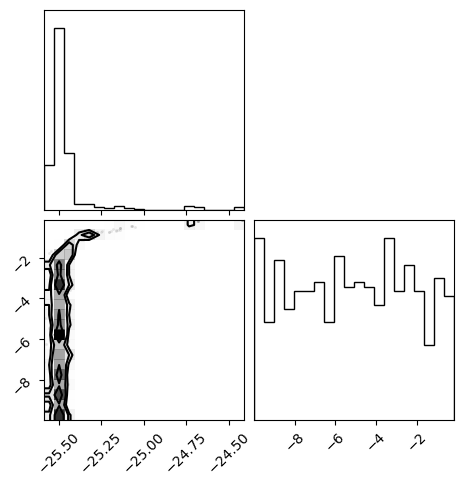

In [62]:
flat_samples = sampler.get_chain(discard=100, thin=15, flat=True)
print(flat_samples.shape)
fig = corner.corner(flat_samples)